# Trabajo Práctico Número 7: Entrenamiento de red YOLO para detección de semáforos

A continuación se mostrará el proceso de entrenamiento de una red YOLO para la detección en tiempo real de semáforos. Para ello se utilizará como dataset de entrenamiento "Bosch Small Traffic Dataset" provisto en:

https://hci.iwr.uni-heidelberg.de/content/bosch-small-traffic-lights-dataset



Se procede a clonar el repositorio de la red YOLO. En este caso es empleada la versión V3:

In [1]:
!git clone https://github.com/pjreddie/darknet

Cloning into 'darknet'...
remote: Enumerating objects: 5955, done.
remote: Total 5955 (delta 0), reused 0 (delta 0), pack-reused 5955
Receiving objects: 100% (5955/5955), 6.37 MiB | 2.79 MiB/s, done.
Resolving deltas: 100% (3932/3932), done.
Updating files: 100% (979/979), done.


Accedemos al directorio del repositorio recién clonado:

In [2]:
%cd darknet

/media/leo/D60E-B5A7/darknet


Construimos:

In [3]:
!make

mkdir -p obj
mkdir -p backup
mkdir -p results
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/gemm.c -o obj/gemm.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/utils.c -o obj/utils.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/cuda.c -o obj/cuda.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/deconvolutional_layer.c -o obj/deconvolutional_layer.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/convolutional_layer.c -o obj/convolutional_layer.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/list.c -o obj/list.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/image.c -o obj/image.o
gcc 

gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./examples/lsd.c -o obj/lsd.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./examples/super.c -o obj/super.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./examples/art.c -o obj/art.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./examples/tag.c -o obj/tag.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./examples/cifar.c -o obj/cifar.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./examples/go.c -o obj/go.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./examples/rnn.c -o obj/rnn.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -O

## Preparación del dataset para el entrenamiento

El dataset se encuentra organizado en varias subcarpetas. Además Para una mejor organización se establecen los siguientes directorios para el dataset:




```bash
<clase-de-objeto> <x> <y> <ancho> <alto>
```

sin embargo este dataset posee otro formato, pero podemos realizar la conversión necesaria con los scripts que los creadores proveen [acá](https://github.com/bosch-ros-pkg/bstld)

Por lo tanto, se clona este repositorio en la carpeta del dataset descargado:

In [16]:
%cd leo/D60E-B5A7/


/media/leo/D60E-B5A7


In [17]:
%cd dataset_original

/media/leo/D60E-B5A7/dataset_original


In [18]:
!git clone https://github.com/bosch-ros-pkg/bstld

Cloning into 'bstld'...
remote: Enumerating objects: 89, done.
remote: Counting objects: 100% (20/20), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 89 (delta 13), reused 13 (delta 13), pack-reused 69
Receiving objects: 100% (89/89), 937.88 KiB | 1.45 MiB/s, done.
Resolving deltas: 100% (36/36), done.
Updating files: 100% (33/33), done.


## Preparación del dataset

Lo que sigue es la preparación de las carpetas. Las mismas se encuentran en otra carpeta aparte `dataset-convertido` Se usan las siguientes carpetas (para mantener el orden)

1. traffic_light_images
2. traffic_light_xmls
3. traffic_light_labels

Como los nombres lo indican, en la primera carpeta irán todas las imagenes de entrenamiento y en la segunda las respectivas etiquetas de cada una.

Entonces, las imagenes que están dentro de la carpeta `rgb/train` las paso a `traffic_light_images` sin las subcarpetas.

In [20]:
!cd rgb/train

In [22]:
!mkdir traffic_light_images
!find . -type f -print0 | xargs -0 --no-run-if-empty cp --target-directory=traffic_light_images

cp: will not overwrite just-created 'traffic_light_images/HEAD' with './bstld/.git/HEAD'
cp: will not overwrite just-created 'traffic_light_images/HEAD' with './bstld/.git/logs/refs/remotes/origin/HEAD'
cp: will not overwrite just-created 'traffic_light_images/master' with './bstld/.git/logs/refs/heads/master'
cp: will not overwrite just-created 'traffic_light_images/HEAD' with './bstld/.git/logs/HEAD'
cp: will not overwrite just-created 'traffic_light_images/__init__.py' with './bstld/evaluation/__init__.py'
cp: will not overwrite just-created 'traffic_light_images/README.md' with './bstld/label_files/README.md'
cp: will not overwrite just-created 'traffic_light_images/train.yaml' with './bstld/label_files/train.yaml'
cp: will not overwrite just-created 'traffic_light_images/README.md' with './bstld/tf_object_detection/README.md'
cp: will not overwrite just-created 'traffic_light_images/__init__.py' with './bstld/tf_object_detection/__init__.py'
cp: './traffic_light_images/dataset_tra

Lo siguiente es crear la carpeta `traffic_light_xmls` 

In [24]:
!mkdir traffic_lights_xmls

Se emplea el script `bosch_to_pascal.py` para convertir las etiquetas contenidas en el archivo `train.yaml` en formato xml y almacenarlas en la carpeta creada en la celda anterior. (por algun motivo el script falla cuando se usa la carpeta xmls asi que la guardo en otra y despues muevo los xmls manualmente).

In [38]:
!python3 bosch_to_pascal.py train.yaml /media/leo/D60E-B5A7/Dataset-convertido/

Del script anterior resultarán 5093 archivos xml correspondiente a cada foto. 


Para el siguiente paso se necesitará un archivo de text plano en el que se especifiquen las rutas de cada uno de los archivos en formato `xml` generados arriba. Una vez mas se recurre a un script para hacerlo, en este caso usamos `make_xml_list.py` dentro de la carpeta `darknet/traffic-lights` que es mostrado a continuación:

In [42]:
%cd ../darknet/traffic-lights

/media/leo/D60E-B5A7/darknet/traffic-lights


In [43]:
!pwd

/media/leo/D60E-B5A7/darknet/traffic-lights


In [44]:
import os
import sys

xmls_path = "/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls"

xml_files = []



for r,d,f in os.walk(xmls_path):
	for file in f:
		if '.xml' in file:
			xml_files.append(os.path.join(r, file)) #Gets the whole file xmls_path
			#xml_files.append(os.path.splitext(file)[0]) # Gets only the name of the file without extension,path etc.	

file_num = len(xml_files)
print("Length of the .xml xml_files: ", file_num)

if not open('bosch_traffic_light_xmls_list.txt','w'):
	os.makefile('bosch_traffic_light_xmls_list.txt')

labels = open('bosch_traffic_light_xmls_list.txt','w')

for xml in xml_files:
	labels.write(xml + '\n')

labels.close()

for f in xml_files:
	print(f)

Length of the .xml xml_files:  5093
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/7514.xml
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/7584.xml
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/7654.xml
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/7722.xml
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/7792.xml
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/7862.xml
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/7932.xml
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/8000.xml
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/8070.xml
/media/leo

Otra cosa que necesitamos es el archivo voc.names y modificarlo con las clases que se usarán. Para ello tomamos el archivo original de la carperta `darknet/data/voc.names` y lo copiamos en la carpeta `darknet/traffic-lights` ya modificado. Las clases son:

1. RojoIzquierda
2. Rojo
3. RojoDerecha
4. VerdeIzquierda
5. Verde
6. VerdeDerecha
7. Amarrillo
8. Apagado

In [45]:
!pwd

/media/leo/D60E-B5A7/darknet/traffic-lights


In [46]:
%cd ../data

/media/leo/D60E-B5A7/darknet/data


In [47]:
!cp voc.names ../traffic-lights/voc-bosch.names

Este archivo recién creado sirve para el siguiente paso.

Ahora, se convierten las etiquetas de tipo VOC recién creadas a etiquetas de tipo YOLO. Para ello dentro del mismo repositorio de `darknet` se provee un script en python llamado `voc_label.py`. Se deberá modificarlo para que las clases usadas arriba y lo pegamos en la carpeta `darknet/traffic-lights`

In [49]:
!cp ../scripts/voc_label.py ../traffic-lights/

Este script usa el archivo .txt `xmls_list`, la carpeta de imagenes que se usan para entrenar el modelo y además requiere la ruta de la carpeta para las etiquetas convertidas. Estos datos son especificados como argumentos. Nos posicionamos en la carpeta y lo ejecutamos:

In [51]:
%cd ../traffic-lights

/media/leo/D60E-B5A7/darknet/traffic-lights


In [55]:
!python3 voc_label.py /media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic-lights_labels /media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/bosch_traffic_light_xmls_list.txt /media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images


xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/600246.xml
xml name: 600246.xml
image name:  600246
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/600246.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/80600.xml
xml name: 80600.xml
image name:  80600
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/80600.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/590028.xml
xml name: 590028.xml
image name:  590028
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/590028.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/14610.xml
xml name: 14610.xml
image name:  14610
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/14610.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/101060.xml
xml name: 101060.xml
image name:  101060
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/101060.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/632420.xml
xml name: 632420.xml
image name:  632420
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/632420.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/235058.xml
xml name: 235058.xml
image name:  235058
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/235058.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/706526.xml
xml name: 706526.xml
image name:  706526
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/706526.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/211224.xml
xml name: 211224.xml
image name:  211224
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/211224.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/639120.xml
xml name: 639120.xml
image name:  639120
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/639120.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/484960.xml
xml name: 484960.xml
image name:  484960
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/484960.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/83702.xml
xml name: 83702.xml
image name:  83702
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/83702.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/641712.xml
xml name: 641712.xml
image name:  641712
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/641712.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/115288.xml
xml name: 115288.xml
image name:  115288
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/115288.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/137876.xml
xml name: 137876.xml
image name:  137876
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/137876.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/56780.xml
xml name: 56780.xml
image name:  56780
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/56780.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/48318.xml
xml name: 48318.xml
image name:  48318
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/48318.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/589610.xml
xml name: 589610.xml
image name:  589610
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/589610.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/109414.xml
xml name: 109414.xml
image name:  109414
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/109414.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/640580.xml
xml name: 640580.xml
image name:  640580
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/640580.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/574412.xml
xml name: 574412.xml
image name:  574412
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/574412.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/101824.xml
xml name: 101824.xml
image name:  101824
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/101824.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/95620.xml
xml name: 95620.xml
image name:  95620
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/95620.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/709084.xml
xml name: 709084.xml
image name:  709084
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/709084.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/142390.xml
xml name: 142390.xml
image name:  142390
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/142390.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/25846.xml
xml name: 25846.xml
image name:  25846
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/25846.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/34452.xml
xml name: 34452.xml
image name:  34452
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/34452.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/499636.xml
xml name: 499636.xml
image name:  499636
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/499636.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/107954.xml
xml name: 107954.xml
image name:  107954
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/107954.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/507108.xml
xml name: 507108.xml
image name:  507108
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/507108.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/537316.xml
xml name: 537316.xml
image name:  537316
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/537316.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/608660.xml
xml name: 608660.xml
image name:  608660
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/608660.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/119388.xml
xml name: 119388.xml
image name:  119388
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/119388.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/20966.xml
xml name: 20966.xml
image name:  20966
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/20966.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/716416.xml
xml name: 716416.xml
image name:  716416
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/716416.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/638982.xml
xml name: 638982.xml
image name:  638982
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/638982.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/13122.xml
xml name: 13122.xml
image name:  13122
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/13122.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/522006.xml
xml name: 522006.xml
image name:  522006
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/522006.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/596980.xml
xml name: 596980.xml
image name:  596980
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/596980.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/554242.xml
xml name: 554242.xml
image name:  554242
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/554242.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/35772.xml
xml name: 35772.xml
image name:  35772
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/35772.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/639468.xml
xml name: 639468.xml
image name:  639468
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/639468.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/69812.xml
xml name: 69812.xml
image name:  69812
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/69812.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/437426.xml
xml name: 437426.xml
image name:  437426
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/437426.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/41160.xml
xml name: 41160.xml
image name:  41160
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/41160.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/659248.xml
xml name: 659248.xml
image name:  659248
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/659248.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/524578.xml
xml name: 524578.xml
image name:  524578
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/524578.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/537038.xml
xml name: 537038.xml
image name:  537038
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/537038.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/127726.xml
xml name: 127726.xml
image name:  127726
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/127726.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/437704.xml
xml name: 437704.xml
image name:  437704
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/437704.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/516462.xml
xml name: 516462.xml
image name:  516462
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/516462.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/586762.xml
xml name: 586762.xml
image name:  586762
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/586762.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/666092.xml
xml name: 666092.xml
image name:  666092
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/666092.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/546112.xml
xml name: 546112.xml
image name:  546112
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/546112.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/36652.xml
xml name: 36652.xml
image name:  36652
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/36652.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/73786.xml
xml name: 73786.xml
image name:  73786
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/73786.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/532162.xml
xml name: 532162.xml
image name:  532162
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/532162.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/602816.xml
xml name: 602816.xml
image name:  602816
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/602816.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/635658.xml
xml name: 635658.xml
image name:  635658
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/635658.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/115566.xml
xml name: 115566.xml
image name:  115566
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/115566.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/36026.xml
xml name: 36026.xml
image name:  36026
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/36026.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/557762.xml
xml name: 557762.xml
image name:  557762
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/557762.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/500262.xml
xml name: 500262.xml
image name:  500262
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/500262.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/136764.xml
xml name: 136764.xml
image name:  136764
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/136764.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/446064.xml
xml name: 446064.xml
image name:  446064
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/446064.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/470502.xml
xml name: 470502.xml
image name:  470502
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/470502.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/130628.xml
xml name: 130628.xml
image name:  130628
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/130628.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/8864.xml
xml name: 8864.xml
image name:  8864
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/8864.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/73230.xml
xml name: 73230.xml
image name:  73230
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/73230.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/699936.xml
xml name: 699936.xml
image name:  699936
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/699936.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/75524.xml
xml name: 75524.xml
image name:  75524
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/75524.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/37832.xml
xml name: 37832.xml
image name:  37832
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/37832.png

xml path:  /

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/586554.xml
xml name: 586554.xml
image name:  586554
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/586554.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/103214.xml
xml name: 103214.xml
image name:  103214
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/103214.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/575732.xml
xml name: 575732.xml
image name:  575732
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/575732.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/459170.xml
xml name: 459170.xml
image name:  459170
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/459170.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/529940.xml
xml name: 529940.xml
image name:  529940
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/529940.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/708250.xml
xml name: 708250.xml
image name:  708250
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/708250.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/554172.xml
xml name: 554172.xml
image name:  554172
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/554172.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/82868.xml
xml name: 82868.xml
image name:  82868
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/82868.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/639052.xml
xml name: 639052.xml
image name:  639052
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/639052.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/551046.xml
xml name: 551046.xml
image name:  551046
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/551046.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/37346.xml
xml name: 37346.xml
image name:  37346
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/37346.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/573092.xml
xml name: 573092.xml
image name:  573092
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/573092.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/83910.xml
xml name: 83910.xml
image name:  83910
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/83910.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/639746.xml
xml name: 639746.xml
image name:  639746
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/639746.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/47902.xml
xml name: 47902.xml
image name:  47902
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/47902.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/459310.xml
xml name: 459310.xml
image name:  459310
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/459310.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/73370.xml
xml name: 73370.xml
image name:  73370
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/73370.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/568292.xml
xml name: 568292.xml
image name:  568292
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/568292.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/21522.xml
xml name: 21522.xml
image name:  21522
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/21522.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/67162.xml
xml name: 67162.xml
image name:  67162
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/67162.png

xml path:  /

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/432522.xml
xml name: 432522.xml
image name:  432522
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/432522.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/233038.xml
xml name: 233038.xml
image name:  233038
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/233038.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/554658.xml
xml name: 554658.xml
image name:  554658
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/554658.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/646816.xml
xml name: 646816.xml
image name:  646816
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/646816.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/137250.xml
xml name: 137250.xml
image name:  137250
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/137250.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/472626.xml
xml name: 472626.xml
image name:  472626
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/472626.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/445022.xml
xml name: 445022.xml
image name:  445022
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/445022.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/11552.xml
xml name: 11552.xml
image name:  11552
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/11552.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/107608.xml
xml name: 107608.xml
image name:  107608
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/107608.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/83078.xml
xml name: 83078.xml
image name:  83078
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/83078.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/48666.xml
xml name: 48666.xml
image name:  48666
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/48666.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/76774.xml
xml name: 76774.xml
image name:  76774
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/76774.png

xml path:  /

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/559568.xml
xml name: 559568.xml
image name:  559568
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/559568.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/555006.xml
xml name: 555006.xml
image name:  555006
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/555006.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/36166.xml
xml name: 36166.xml
image name:  36166
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/36166.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/207458.xml
xml name: 207458.xml
image name:  207458
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/207458.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/48458.xml
xml name: 48458.xml
image name:  48458
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/48458.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/41552.xml
xml name: 41552.xml
image name:  41552
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/41552.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/503532.xml
xml name: 503532.xml
image name:  503532
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/503532.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/35146.xml
xml name: 35146.xml
image name:  35146
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/35146.png

xml path:  /

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/710196.xml
xml name: 710196.xml
image name:  710196
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/710196.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/46998.xml
xml name: 46998.xml
image name:  46998
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/46998.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/233926.xml
xml name: 233926.xml
image name:  233926
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/233926.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/663208.xml
xml name: 663208.xml
image name:  663208
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/663208.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/483570.xml
xml name: 483570.xml
image name:  483570
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/483570.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/468486.xml
xml name: 468486.xml
image name:  468486
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/468486.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/137110.xml
xml name: 137110.xml
image name:  137110
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/137110.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/132156.xml
xml name: 132156.xml
image name:  132156
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/132156.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/506414.xml
xml name: 506414.xml
image name:  506414
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/506414.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/496996.xml
xml name: 496996.xml
image name:  496996
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/496996.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/481764.xml
xml name: 481764.xml
image name:  481764
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/481764.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/51778.xml
xml name: 51778.xml
image name:  51778
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/51778.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/656064.xml
xml name: 656064.xml
image name:  656064
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/656064.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/16068.xml
xml name: 16068.xml
image name:  16068
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/16068.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/629294.xml
xml name: 629294.xml
image name:  629294
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/629294.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/207464.xml
xml name: 207464.xml
image name:  207464
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/207464.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/224884.xml
xml name: 224884.xml
image name:  224884
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/224884.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/553754.xml
xml name: 553754.xml
image name:  553754
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/553754.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/464504.xml
xml name: 464504.xml
image name:  464504
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/464504.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/629364.xml
xml name: 629364.xml
image name:  629364
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/629364.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/122634.xml
xml name: 122634.xml
image name:  122634
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/122634.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/491646.xml
xml name: 491646.xml
image name:  491646
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/491646.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/573716.xml
xml name: 573716.xml
image name:  573716
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/573716.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/513266.xml
xml name: 513266.xml
image name:  513266
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/513266.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/35286.xml
xml name: 35286.xml
image name:  35286
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/35286.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/492480.xml
xml name: 492480.xml
image name:  492480
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/492480.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/506136.xml
xml name: 506136.xml
image name:  506136
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/506136.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/516530.xml
xml name: 516530.xml
image name:  516530
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/516530.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/219288.xml
xml name: 219288.xml
image name:  219288
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/219288.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/718640.xml
xml name: 718640.xml
image name:  718640
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/718640.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/620140.xml
xml name: 620140.xml
image name:  620140
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/620140.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/238556.xml
xml name: 238556.xml
image name:  238556
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/238556.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/564570.xml
xml name: 564570.xml
image name:  564570
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/564570.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/448286.xml
xml name: 448286.xml
image name:  448286
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/448286.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/128282.xml
xml name: 128282.xml
image name:  128282
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/128282.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/472070.xml
xml name: 472070.xml
image name:  472070
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/472070.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/214776.xml
xml name: 214776.xml
image name:  214776
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/214776.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/208772.xml
xml name: 208772.xml
image name:  208772
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/208772.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/711862.xml
xml name: 711862.xml
image name:  711862
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/711862.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/223030.xml
xml name: 223030.xml
image name:  223030
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/223030.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/70646.xml
xml name: 70646.xml
image name:  70646
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/70646.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/470362.xml
xml name: 470362.xml
image name:  470362
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/470362.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/525202.xml
xml name: 525202.xml
image name:  525202
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/525202.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/485636.xml
xml name: 485636.xml
image name:  485636
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/485636.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/608592.xml
xml name: 608592.xml
image name:  608592
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/608592.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/681808.xml
xml name: 681808.xml
image name:  681808
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/681808.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/226466.xml
xml name: 226466.xml
image name:  226466
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/226466.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/517712.xml
xml name: 517712.xml
image name:  517712
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/517712.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/647664.xml
xml name: 647664.xml
image name:  647664
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/647664.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/97426.xml
xml name: 97426.xml
image name:  97426
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/97426.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/215988.xml
xml name: 215988.xml
image name:  215988
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/215988.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/504296.xml
xml name: 504296.xml
image name:  504296
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/504296.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/700492.xml
xml name: 700492.xml
image name:  700492
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/700492.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/468210.xml
xml name: 468210.xml
image name:  468210
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/468210.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/446480.xml
xml name: 446480.xml
image name:  446480
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/446480.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/601426.xml
xml name: 601426.xml
image name:  601426
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/601426.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/609980.xml
xml name: 609980.xml
image name:  609980
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/609980.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/235036.xml
xml name: 235036.xml
image name:  235036
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/235036.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/570030.xml
xml name: 570030.xml
image name:  570030
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/570030.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/600662.xml
xml name: 600662.xml
image name:  600662
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/600662.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/23472.xml
xml name: 23472.xml
image name:  23472
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/23472.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/135722.xml
xml name: 135722.xml
image name:  135722
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/135722.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/225738.xml
xml name: 225738.xml
image name:  225738
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/225738.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/540050.xml
xml name: 540050.xml
image name:  540050
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/540050.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/21174.xml
xml name: 21174.xml
image name:  21174
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/21174.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/128768.xml
xml name: 128768.xml
image name:  128768
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/128768.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/702576.xml
xml name: 702576.xml
image name:  702576
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/702576.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/483640.xml
xml name: 483640.xml
image name:  483640
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/483640.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/628962.xml
xml name: 628962.xml
image name:  628962
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/628962.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/536642.xml
xml name: 536642.xml
image name:  536642
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/536642.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/504992.xml
xml name: 504992.xml
image name:  504992
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/504992.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/34938.xml
xml name: 34938.xml
image name:  34938
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/34938.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/468626.xml
xml name: 468626.xml
image name:  468626
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/468626.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/530010.xml
xml name: 530010.xml
image name:  530010
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/530010.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/129740.xml
xml name: 129740.xml
image name:  129740
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/129740.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/643866.xml
xml name: 643866.xml
image name:  643866
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/643866.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/444674.xml
xml name: 444674.xml
image name:  444674
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/444674.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/81896.xml
xml name: 81896.xml
image name:  81896
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/81896.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/142322.xml
xml name: 142322.xml
image name:  142322
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/142322.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/15790.xml
xml name: 15790.xml
image name:  15790
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/15790.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/679654.xml
xml name: 679654.xml
image name:  679654
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/679654.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/35702.xml
xml name: 35702.xml
image name:  35702
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/35702.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/123188.xml
xml name: 123188.xml
image name:  123188
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/123188.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/624488.xml
xml name: 624488.xml
image name:  624488
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/624488.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/582678.xml
xml name: 582678.xml
image name:  582678
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/582678.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/515142.xml
xml name: 515142.xml
image name:  515142
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/515142.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/487442.xml
xml name: 487442.xml
image name:  487442
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/487442.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/614774.xml
xml name: 614774.xml
image name:  614774
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/614774.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/131046.xml
xml name: 131046.xml
image name:  131046
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/131046.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/446410.xml
xml name: 446410.xml
image name:  446410
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/446410.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/549864.xml
xml name: 549864.xml
image name:  549864
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/549864.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/131532.xml
xml name: 131532.xml
image name:  131532
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/131532.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/704784.xml
xml name: 704784.xml
image name:  704784
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/704784.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/524230.xml
xml name: 524230.xml
image name:  524230
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/524230.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/448216.xml
xml name: 448216.xml
image name:  448216
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/448216.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/463254.xml
xml name: 463254.xml
image name:  463254
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/463254.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/518684.xml
xml name: 518684.xml
image name:  518684
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/518684.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/707694.xml
xml name: 707694.xml
image name:  707694
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/707694.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/536086.xml
xml name: 536086.xml
image name:  536086
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/536086.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/223062.xml
xml name: 223062.xml
image name:  223062
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/223062.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/232830.xml
xml name: 232830.xml
image name:  232830
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/232830.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/447384.xml
xml name: 447384.xml
image name:  447384
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/447384.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/89748.xml
xml name: 89748.xml
image name:  89748
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/89748.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/141696.xml
xml name: 141696.xml
image name:  141696
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/141696.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/601566.xml
xml name: 601566.xml
image name:  601566
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/601566.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/701464.xml
xml name: 701464.xml
image name:  701464
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/701464.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/46512.xml
xml name: 46512.xml
image name:  46512
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/46512.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/514656.xml
xml name: 514656.xml
image name:  514656
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/514656.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/481904.xml
xml name: 481904.xml
image name:  481904
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/481904.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/216466.xml
xml name: 216466.xml
image name:  216466
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/216466.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/464156.xml
xml name: 464156.xml
image name:  464156
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/464156.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/72312.xml
xml name: 72312.xml
image name:  72312
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/72312.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/46096.xml
xml name: 46096.xml
image name:  46096
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/46096.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/552644.xml
xml name: 552644.xml
image name:  552644
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/552644.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/610676.xml
xml name: 610676.xml
image name:  610676
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/610676.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/621390.xml
xml name: 621390.xml
image name:  621390
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/621390.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/651504.xml
xml name: 651504.xml
image name:  651504
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/651504.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/33994.xml
xml name: 33994.xml
image name:  33994
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/33994.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/208482.xml
xml name: 208482.xml
image name:  208482
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/208482.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/659526.xml
xml name: 659526.xml
image name:  659526
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/659526.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/602400.xml
xml name: 602400.xml
image name:  602400
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/602400.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/444812.xml
xml name: 444812.xml
image name:  444812
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/444812.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/41274.xml
xml name: 41274.xml
image name:  41274
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/41274.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/632004.xml
xml name: 632004.xml
image name:  632004
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/632004.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/117304.xml
xml name: 117304.xml
image name:  117304
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/117304.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/233186.xml
xml name: 233186.xml
image name:  233186
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/233186.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/92564.xml
xml name: 92564.xml
image name:  92564
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/92564.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/494564.xml
xml name: 494564.xml
image name:  494564
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/494564.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/46928.xml
xml name: 46928.xml
image name:  46928
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/46928.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/491854.xml
xml name: 491854.xml
image name:  491854
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/491854.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/71688.xml
xml name: 71688.xml
image name:  71688
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/71688.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/48248.xml
xml name: 48248.xml
image name:  48248
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/48248.png

xml path:  /

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/100782.xml
xml name: 100782.xml
image name:  100782
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/100782.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/217304.xml
xml name: 217304.xml
image name:  217304
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/217304.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/531052.xml
xml name: 531052.xml
image name:  531052
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/531052.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/452616.xml
xml name: 452616.xml
image name:  452616
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/452616.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/598648.xml
xml name: 598648.xml
image name:  598648
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/598648.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/50180.xml
xml name: 50180.xml
image name:  50180
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/50180.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/551184.xml
xml name: 551184.xml
image name:  551184
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/551184.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/504018.xml
xml name: 504018.xml
image name:  504018
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/504018.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/554866.xml
xml name: 554866.xml
image name:  554866
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/554866.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/629502.xml
xml name: 629502.xml
image name:  629502
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/629502.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/655578.xml
xml name: 655578.xml
image name:  655578
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/655578.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/215058.xml
xml name: 215058.xml
image name:  215058
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/215058.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/434698.xml
xml name: 434698.xml
image name:  434698
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/434698.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/495050.xml
xml name: 495050.xml
image name:  495050
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/495050.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/658900.xml
xml name: 658900.xml
image name:  658900
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/658900.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/462212.xml
xml name: 462212.xml
image name:  462212
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/462212.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/535182.xml
xml name: 535182.xml
image name:  535182
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/535182.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/212968.xml
xml name: 212968.xml
image name:  212968
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/212968.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/75246.xml
xml name: 75246.xml
image name:  75246
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/75246.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/511450.xml
xml name: 511450.xml
image name:  511450
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/511450.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/637120.xml
xml name: 637120.xml
image name:  637120
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/637120.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/28456.xml
xml name: 28456.xml
image name:  28456
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/28456.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/659872.xml
xml name: 659872.xml
image name:  659872
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/659872.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/237146.xml
xml name: 237146.xml
image name:  237146
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/237146.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/588290.xml
xml name: 588290.xml
image name:  588290
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/588290.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/641642.xml
xml name: 641642.xml
image name:  641642
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/641642.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/493384.xml
xml name: 493384.xml
image name:  493384
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/493384.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/594956.xml
xml name: 594956.xml
image name:  594956
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/594956.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/454334.xml
xml name: 454334.xml
image name:  454334
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/454334.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/655370.xml
xml name: 655370.xml
image name:  655370
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/655370.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/232930.xml
xml name: 232930.xml
image name:  232930
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/232930.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/123328.xml
xml name: 123328.xml
image name:  123328
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/123328.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/448426.xml
xml name: 448426.xml
image name:  448426
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/448426.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/499010.xml
xml name: 499010.xml
image name:  499010
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/499010.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/216828.xml
xml name: 216828.xml
image name:  216828
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/216828.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/13260.xml
xml name: 13260.xml
image name:  13260
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/13260.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/510548.xml
xml name: 510548.xml
image name:  510548
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/510548.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/99746.xml
xml name: 99746.xml
image name:  99746
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/99746.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/485308.xml
xml name: 485308.xml
image name:  485308
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/485308.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/582190.xml
xml name: 582190.xml
image name:  582190
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/582190.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/597744.xml
xml name: 597744.xml
image name:  597744
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/597744.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/25428.xml
xml name: 25428.xml
image name:  25428
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/25428.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/434976.xml
xml name: 434976.xml
image name:  434976
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/434976.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/550282.xml
xml name: 550282.xml
image name:  550282
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/550282.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/627364.xml
xml name: 627364.xml
image name:  627364
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/627364.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/500052.xml
xml name: 500052.xml
image name:  500052
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/500052.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/433796.xml
xml name: 433796.xml
image name:  433796
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/433796.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/646748.xml
xml name: 646748.xml
image name:  646748
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/646748.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/467376.xml
xml name: 467376.xml
image name:  467376
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/467376.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/538080.xml
xml name: 538080.xml
image name:  538080
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/538080.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/33202.xml
xml name: 33202.xml
image name:  33202
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/33202.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/476576.xml
xml name: 476576.xml
image name:  476576
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/476576.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/630614.xml
xml name: 630614.xml
image name:  630614
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/630614.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/546252.xml
xml name: 546252.xml
image name:  546252
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/546252.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/583650.xml
xml name: 583650.xml
image name:  583650
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/583650.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/474354.xml
xml name: 474354.xml
image name:  474354
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/474354.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/50528.xml
xml name: 50528.xml
image name:  50528
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/50528.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/23750.xml
xml name: 23750.xml
image name:  23750
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/23750.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/437496.xml
xml name: 437496.xml
image name:  437496
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/437496.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/529106.xml
xml name: 529106.xml
image name:  529106
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/529106.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/113132.xml
xml name: 113132.xml
image name:  113132
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/113132.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/219010.xml
xml name: 219010.xml
image name:  219010
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/219010.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/681600.xml
xml name: 681600.xml
image name:  681600
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/681600.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/117790.xml
xml name: 117790.xml
image name:  117790
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/117790.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/226108.xml
xml name: 226108.xml
image name:  226108
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/226108.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/86986.xml
xml name: 86986.xml
image name:  86986
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/86986.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/510132.xml
xml name: 510132.xml
image name:  510132
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/510132.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/86084.xml
xml name: 86084.xml
image name:  86084
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/86084.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/634018.xml
xml name: 634018.xml
image name:  634018
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/634018.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/667482.xml
xml name: 667482.xml
image name:  667482
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/667482.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/36374.xml
xml name: 36374.xml
image name:  36374
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/36374.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/447800.xml
xml name: 447800.xml
image name:  447800
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/447800.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/139960.xml
xml name: 139960.xml
image name:  139960
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/139960.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/226122.xml
xml name: 226122.xml
image name:  226122
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/226122.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/692618.xml
xml name: 692618.xml
image name:  692618
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/692618.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/55252.xml
xml name: 55252.xml
image name:  55252
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/55252.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/213584.xml
xml name: 213584.xml
image name:  213584
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/213584.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/604444.xml
xml name: 604444.xml
image name:  604444
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/604444.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/238156.xml
xml name: 238156.xml
image name:  238156
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/238156.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/519588.xml
xml name: 519588.xml
image name:  519588
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/519588.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/506274.xml
xml name: 506274.xml
image name:  506274
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/506274.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/489910.xml
xml name: 489910.xml
image name:  489910
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/489910.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/605618.xml
xml name: 605618.xml
image name:  605618
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/605618.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/558178.xml
xml name: 558178.xml
image name:  558178
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/558178.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/42872.xml
xml name: 42872.xml
image name:  42872
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/42872.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/41204.xml
xml name: 41204.xml
image name:  41204
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/41204.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/117372.xml
xml name: 117372.xml
image name:  117372
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/117372.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/40536.xml
xml name: 40536.xml
image name:  40536
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/40536.png

xml path:  /

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/673696.xml
xml name: 673696.xml
image name:  673696
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/673696.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/601218.xml
xml name: 601218.xml
image name:  601218
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/601218.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/217120.xml
xml name: 217120.xml
image name:  217120
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/217120.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/610954.xml
xml name: 610954.xml
image name:  610954
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/610954.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/659664.xml
xml name: 659664.xml
image name:  659664
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/659664.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/682086.xml
xml name: 682086.xml
image name:  682086
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/682086.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/499706.xml
xml name: 499706.xml
image name:  499706
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/499706.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/446896.xml
xml name: 446896.xml
image name:  446896
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/446896.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/656204.xml
xml name: 656204.xml
image name:  656204
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/656204.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/66538.xml
xml name: 66538.xml
image name:  66538
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/66538.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/465338.xml
xml name: 465338.xml
image name:  465338
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/465338.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/525758.xml
xml name: 525758.xml
image name:  525758
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/525758.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/681252.xml
xml name: 681252.xml
image name:  681252
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/681252.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/559220.xml
xml name: 559220.xml
image name:  559220
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/559220.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/600732.xml
xml name: 600732.xml
image name:  600732
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/600732.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/434212.xml
xml name: 434212.xml
image name:  434212
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/434212.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/90582.xml
xml name: 90582.xml
image name:  90582
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/90582.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/47346.xml
xml name: 47346.xml
image name:  47346
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/47346.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/141974.xml
xml name: 141974.xml
image name:  141974
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/141974.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/92910.xml
xml name: 92910.xml
image name:  92910
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/92910.png

xml path:  /

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/612482.xml
xml name: 612482.xml
image name:  612482
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/612482.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/684308.xml
xml name: 684308.xml
image name:  684308
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/684308.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/709848.xml
xml name: 709848.xml
image name:  709848
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/709848.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/139682.xml
xml name: 139682.xml
image name:  139682
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/139682.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/225662.xml
xml name: 225662.xml
image name:  225662
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/225662.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/42662.xml
xml name: 42662.xml
image name:  42662
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/42662.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/630684.xml
xml name: 630684.xml
image name:  630684
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/630684.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/232576.xml
xml name: 232576.xml
image name:  232576
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/232576.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/464226.xml
xml name: 464226.xml
image name:  464226
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/464226.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/102798.xml
xml name: 102798.xml
image name:  102798
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/102798.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/489770.xml
xml name: 489770.xml
image name:  489770
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/489770.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/659594.xml
xml name: 659594.xml
image name:  659594
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/659594.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/78532.xml
xml name: 78532.xml
image name:  78532
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/78532.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/51638.xml
xml name: 51638.xml
image name:  51638
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/51638.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/26402.xml
xml name: 26402.xml
image name:  26402
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/26402.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/434074.xml
xml name: 434074.xml
image name:  434074
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/434074.png

xml path:  /

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/45818.xml
xml name: 45818.xml
image name:  45818
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/45818.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/474840.xml
xml name: 474840.xml
image name:  474840
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/474840.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/23888.xml
xml name: 23888.xml
image name:  23888
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/23888.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/82938.xml
xml name: 82938.xml
image name:  82938
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/82938.png

xml path:  /

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/70090.xml
xml name: 70090.xml
image name:  70090
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/70090.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/73856.xml
xml name: 73856.xml
image name:  73856
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/73856.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/114316.xml
xml name: 114316.xml
image name:  114316
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/114316.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/700214.xml
xml name: 700214.xml
image name:  700214
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/700214.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/119318.xml
xml name: 119318.xml
image name:  119318
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/119318.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/137944.xml
xml name: 137944.xml
image name:  137944
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/137944.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/632906.xml
xml name: 632906.xml
image name:  632906
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/632906.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/491160.xml
xml name: 491160.xml
image name:  491160
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/491160.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/543248.xml
xml name: 543248.xml
image name:  543248
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/543248.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/547920.xml
xml name: 547920.xml
image name:  547920
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/547920.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/685072.xml
xml name: 685072.xml
image name:  685072
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/685072.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/466032.xml
xml name: 466032.xml
image name:  466032
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/466032.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/625182.xml
xml name: 625182.xml
image name:  625182
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/625182.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/657384.xml
xml name: 657384.xml
image name:  657384
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/657384.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/113270.xml
xml name: 113270.xml
image name:  113270
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/113270.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/672862.xml
xml name: 672862.xml
image name:  672862
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/672862.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/710820.xml
xml name: 710820.xml
image name:  710820
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/710820.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/627710.xml
xml name: 627710.xml
image name:  627710
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/627710.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/68838.xml
xml name: 68838.xml
image name:  68838
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/68838.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/623156.xml
xml name: 623156.xml
image name:  623156
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/623156.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/519310.xml
xml name: 519310.xml
image name:  519310
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/519310.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/216004.xml
xml name: 216004.xml
image name:  216004
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/216004.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/575454.xml
xml name: 575454.xml
image name:  575454
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/575454.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/642060.xml
xml name: 642060.xml
image name:  642060
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/642060.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/550906.xml
xml name: 550906.xml
image name:  550906
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/550906.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/51848.xml
xml name: 51848.xml
image name:  51848
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/51848.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/526744.xml
xml name: 526744.xml
image name:  526744
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/526744.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/36512.xml
xml name: 36512.xml
image name:  36512
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/36512.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/9004.xml
xml name: 9004.xml
image name:  9004
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/9004.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/13398.xml
xml name: 13398.xml
image name:  13398
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/13398.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/574272.xml
xml name: 574272.xml
image name:  574272
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/574272.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/119110.xml
xml name: 119110.xml
image name:  119110
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/119110.png

xml path:  /

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/597466.xml
xml name: 597466.xml
image name:  597466
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/597466.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/612830.xml
xml name: 612830.xml
image name:  612830
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/612830.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/563736.xml
xml name: 563736.xml
image name:  563736
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/563736.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/560332.xml
xml name: 560332.xml
image name:  560332
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/560332.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/74620.xml
xml name: 74620.xml
image name:  74620
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/74620.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/450946.xml
xml name: 450946.xml
image name:  450946
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/450946.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/473044.xml
xml name: 473044.xml
image name:  473044
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/473044.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/211930.xml
xml name: 211930.xml
image name:  211930
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/211930.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/223632.xml
xml name: 223632.xml
image name:  223632
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/223632.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/632698.xml
xml name: 632698.xml
image name:  632698
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/632698.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/32924.xml
xml name: 32924.xml
image name:  32924
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/32924.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/115706.xml
xml name: 115706.xml
image name:  115706
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/115706.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/603472.xml
xml name: 603472.xml
image name:  603472
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/603472.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/137458.xml
xml name: 137458.xml
image name:  137458
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/137458.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/216848.xml
xml name: 216848.xml
image name:  216848
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/216848.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/524090.xml
xml name: 524090.xml
image name:  524090
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/524090.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/142600.xml
xml name: 142600.xml
image name:  142600
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/142600.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/588360.xml
xml name: 588360.xml
image name:  588360
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/588360.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/584886.xml
xml name: 584886.xml
image name:  584886
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/584886.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/667690.xml
xml name: 667690.xml
image name:  667690
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/667690.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/646330.xml
xml name: 646330.xml
image name:  646330
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/646330.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/212770.xml
xml name: 212770.xml
image name:  212770
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/212770.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/499844.xml
xml name: 499844.xml
image name:  499844
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/499844.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/643240.xml
xml name: 643240.xml
image name:  643240
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/643240.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/42384.xml
xml name: 42384.xml
image name:  42384
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/42384.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/454958.xml
xml name: 454958.xml
image name:  454958
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/454958.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/678820.xml
xml name: 678820.xml
image name:  678820
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/678820.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/235836.xml
xml name: 235836.xml
image name:  235836
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/235836.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/232952.xml
xml name: 232952.xml
image name:  232952
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/232952.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/50250.xml
xml name: 50250.xml
image name:  50250
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/50250.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/85944.xml
xml name: 85944.xml
image name:  85944
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/85944.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/500470.xml
xml name: 500470.xml
image name:  500470
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/500470.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/550004.xml
xml name: 550004.xml
image name:  550004
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/550004.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/496926.xml
xml name: 496926.xml
image name:  496926
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/496926.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/212688.xml
xml name: 212688.xml
image name:  212688
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/212688.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/86152.xml
xml name: 86152.xml
image name:  86152
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/86152.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/67580.xml
xml name: 67580.xml
image name:  67580
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/67580.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/119666.xml
xml name: 119666.xml
image name:  119666
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/119666.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/462628.xml
xml name: 462628.xml
image name:  462628
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/462628.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/469806.xml
xml name: 469806.xml
image name:  469806
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/469806.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/625252.xml
xml name: 625252.xml
image name:  625252
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/625252.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/587944.xml
xml name: 587944.xml
image name:  587944
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/587944.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/659316.xml
xml name: 659316.xml
image name:  659316
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/659316.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/237208.xml
xml name: 237208.xml
image name:  237208
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/237208.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/14748.xml
xml name: 14748.xml
image name:  14748
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/14748.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/523188.xml
xml name: 523188.xml
image name:  523188
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/523188.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/130698.xml
xml name: 130698.xml
image name:  130698
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/130698.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/218412.xml
xml name: 218412.xml
image name:  218412
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/218412.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/463392.xml
xml name: 463392.xml
image name:  463392
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/463392.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/632282.xml
xml name: 632282.xml
image name:  632282
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/632282.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/41968.xml
xml name: 41968.xml
image name:  41968
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/41968.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/72034.xml
xml name: 72034.xml
image name:  72034
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/72034.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/504366.xml
xml name: 504366.xml
image name:  504366
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/504366.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/210966.xml
xml name: 210966.xml
image name:  210966
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/210966.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/71478.xml
xml name: 71478.xml
image name:  71478
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/71478.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/122910.xml
xml name: 122910.xml
image name:  122910
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/122910.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/30462.xml
xml name: 30462.xml
image name:  30462
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/30462.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/472002.xml
xml name: 472002.xml
image name:  472002
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/472002.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/547294.xml
xml name: 547294.xml
image name:  547294
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/547294.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/561444.xml
xml name: 561444.xml
image name:  561444
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/561444.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/458546.xml
xml name: 458546.xml
image name:  458546
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/458546.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/646192.xml
xml name: 646192.xml
image name:  646192
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/646192.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/599620.xml
xml name: 599620.xml
image name:  599620
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/599620.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/83286.xml
xml name: 83286.xml
image name:  83286
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/83286.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/716626.xml
xml name: 716626.xml
image name:  716626
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/716626.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/119526.xml
xml name: 119526.xml
image name:  119526
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/119526.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/574480.xml
xml name: 574480.xml
image name:  574480
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/574480.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/86222.xml
xml name: 86222.xml
image name:  86222
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/86222.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/444604.xml
xml name: 444604.xml
image name:  444604
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/444604.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/238466.xml
xml name: 238466.xml
image name:  238466
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/238466.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/634894.xml
xml name: 634894.xml
image name:  634894
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/634894.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/446342.xml
xml name: 446342.xml
image name:  446342
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/446342.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/601774.xml
xml name: 601774.xml
image name:  601774
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/601774.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/656134.xml
xml name: 656134.xml
image name:  656134
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/656134.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/487094.xml
xml name: 487094.xml
image name:  487094
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/487094.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/69742.xml
xml name: 69742.xml
image name:  69742
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/69742.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/579456.xml
xml name: 579456.xml
image name:  579456
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/579456.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/490674.xml
xml name: 490674.xml
image name:  490674
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/490674.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/76358.xml
xml name: 76358.xml
image name:  76358
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/76358.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/434420.xml
xml name: 434420.xml
image name:  434420
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/434420.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/527092.xml
xml name: 527092.xml
image name:  527092
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/527092.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/446828.xml
xml name: 446828.xml
image name:  446828
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/446828.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/218584.xml
xml name: 218584.xml
image name:  218584
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/218584.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/569890.xml
xml name: 569890.xml
image name:  569890
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/569890.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/25082.xml
xml name: 25082.xml
image name:  25082
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/25082.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/666440.xml
xml name: 666440.xml
image name:  666440
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/666440.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/70992.xml
xml name: 70992.xml
image name:  70992
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/70992.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/469530.xml
xml name: 469530.xml
image name:  469530
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/469530.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/51292.xml
xml name: 51292.xml
image name:  51292
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/51292.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/639538.xml
xml name: 639538.xml
image name:  639538
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/639538.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/107468.xml
xml name: 107468.xml
image name:  107468
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/107468.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/48596.xml
xml name: 48596.xml
image name:  48596
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/48596.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/457850.xml
xml name: 457850.xml
image name:  457850
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/457850.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/445994.xml
xml name: 445994.xml
image name:  445994
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/445994.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/448356.xml
xml name: 448356.xml
image name:  448356
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/448356.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/535322.xml
xml name: 535322.xml
image name:  535322
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/535322.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/121868.xml
xml name: 121868.xml
image name:  121868
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/121868.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/215722.xml
xml name: 215722.xml
image name:  215722
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/215722.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/458198.xml
xml name: 458198.xml
image name:  458198
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/458198.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/51986.xml
xml name: 51986.xml
image name:  51986
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/51986.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/225880.xml
xml name: 225880.xml
image name:  225880
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/225880.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/217280.xml
xml name: 217280.xml
image name:  217280
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/217280.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/65564.xml
xml name: 65564.xml
image name:  65564
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/65564.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/665952.xml
xml name: 665952.xml
image name:  665952
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/665952.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/96384.xml
xml name: 96384.xml
image name:  96384
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/96384.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/543178.xml
xml name: 543178.xml
image name:  543178
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/543178.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/699352.xml
xml name: 699352.xml
image name:  699352
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/699352.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/21800.xml
xml name: 21800.xml
image name:  21800
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/21800.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/73300.xml
xml name: 73300.xml
image name:  73300
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/73300.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/708806.xml
xml name: 708806.xml
image name:  708806
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/708806.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/655718.xml
xml name: 655718.xml
image name:  655718
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/655718.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/467514.xml
xml name: 467514.xml
image name:  467514
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/467514.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/583720.xml
xml name: 583720.xml
image name:  583720
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/583720.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/51084.xml
xml name: 51084.xml
image name:  51084
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/51084.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/581566.xml
xml name: 581566.xml
image name:  581566
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/581566.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/591904.xml
xml name: 591904.xml
image name:  591904
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/591904.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/83008.xml
xml name: 83008.xml
image name:  83008
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/83008.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/478660.xml
xml name: 478660.xml
image name:  478660
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/478660.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/612620.xml
xml name: 612620.xml
image name:  612620
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/612620.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/530286.xml
xml name: 530286.xml
image name:  530286
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/530286.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/698934.xml
xml name: 698934.xml
image name:  698934
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/698934.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/719612.xml
xml name: 719612.xml
image name:  719612
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/719612.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/524022.xml
xml name: 524022.xml
image name:  524022
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/524022.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/13608.xml
xml name: 13608.xml
image name:  13608
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/13608.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/105246.xml
xml name: 105246.xml
image name:  105246
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/105246.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/104898.xml
xml name: 104898.xml
image name:  104898
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/104898.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/516044.xml
xml name: 516044.xml
image name:  516044
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/516044.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/92772.xml
xml name: 92772.xml
image name:  92772
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/92772.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/11898.xml
xml name: 11898.xml
image name:  11898
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/11898.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/631934.xml
xml name: 631934.xml
image name:  631934
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/631934.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/479078.xml
xml name: 479078.xml
image name:  479078
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/479078.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/223008.xml
xml name: 223008.xml
image name:  223008
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/223008.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/710542.xml
xml name: 710542.xml
image name:  710542
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/710542.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/524646.xml
xml name: 524646.xml
image name:  524646
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/524646.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/672168.xml
xml name: 672168.xml
image name:  672168
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/672168.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/676110.xml
xml name: 676110.xml
image name:  676110
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/676110.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/7514.xml
xml name: 7514.xml
image name:  7514
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/7514.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/30878.xml
xml name: 30878.xml
image name:  30878
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/30878.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/642476.xml
xml name: 642476.xml
image name:  642476
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/642476.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/139474.xml
xml name: 139474.xml
image name:  139474
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/139474.png

xml path:  /

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/648388.xml
xml name: 648388.xml
image name:  648388
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/648388.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/685282.xml
xml name: 685282.xml
image name:  685282
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/685282.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/581982.xml
xml name: 581982.xml
image name:  581982
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/581982.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/74272.xml
xml name: 74272.xml
image name:  74272
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/74272.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/21868.xml
xml name: 21868.xml
image name:  21868
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/21868.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/490604.xml
xml name: 490604.xml
image name:  490604
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/490604.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/117164.xml
xml name: 117164.xml
image name:  117164
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/117164.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/8070.xml
xml name: 8070.xml
image name:  8070
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/8070.png

xml path:  /

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/95342.xml
xml name: 95342.xml
image name:  95342
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/95342.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/694460.xml
xml name: 694460.xml
image name:  694460
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/694460.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/208562.xml
xml name: 208562.xml
image name:  208562
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/208562.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/97358.xml
xml name: 97358.xml
image name:  97358
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/97358.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/667064.xml
xml name: 667064.xml
image name:  667064
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/667064.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/211094.xml
xml name: 211094.xml
image name:  211094
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/211094.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/78878.xml
xml name: 78878.xml
image name:  78878
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/78878.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/549378.xml
xml name: 549378.xml
image name:  549378
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/549378.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/14888.xml
xml name: 14888.xml
image name:  14888
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/14888.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/515698.xml
xml name: 515698.xml
image name:  515698
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/515698.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/468556.xml
xml name: 468556.xml
image name:  468556
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/468556.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/692688.xml
xml name: 692688.xml
image name:  692688
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/692688.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/497134.xml
xml name: 497134.xml
image name:  497134
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/497134.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/599134.xml
xml name: 599134.xml
image name:  599134
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/599134.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/559152.xml
xml name: 559152.xml
image name:  559152
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/559152.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/470432.xml
xml name: 470432.xml
image name:  470432
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/470432.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/25290.xml
xml name: 25290.xml
image name:  25290
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/25290.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/226240.xml
xml name: 226240.xml
image name:  226240
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/226240.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/215228.xml
xml name: 215228.xml
image name:  215228
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/215228.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/518546.xml
xml name: 518546.xml
image name:  518546
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/518546.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/600524.xml
xml name: 600524.xml
image name:  600524
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/600524.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/96524.xml
xml name: 96524.xml
image name:  96524
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/96524.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/569544.xml
xml name: 569544.xml
image name:  569544
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/569544.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/657524.xml
xml name: 657524.xml
image name:  657524
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/657524.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/467792.xml
xml name: 467792.xml
image name:  467792
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/467792.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/701326.xml
xml name: 701326.xml
image name:  701326
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/701326.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/471932.xml
xml name: 471932.xml
image name:  471932
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/471932.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/209028.xml
xml name: 209028.xml
image name:  209028
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/209028.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/480332.xml
xml name: 480332.xml
image name:  480332
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/480332.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/452962.xml
xml name: 452962.xml
image name:  452962
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/452962.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/465060.xml
xml name: 465060.xml
image name:  465060
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/465060.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/453310.xml
xml name: 453310.xml
image name:  453310
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/453310.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/217892.xml
xml name: 217892.xml
image name:  217892
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/217892.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/558734.xml
xml name: 558734.xml
image name:  558734
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/558734.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/517990.xml
xml name: 517990.xml
image name:  517990
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/517990.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/510896.xml
xml name: 510896.xml
image name:  510896
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/510896.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/15652.xml
xml name: 15652.xml
image name:  15652
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/15652.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/455236.xml
xml name: 455236.xml
image name:  455236
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/455236.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/506552.xml
xml name: 506552.xml
image name:  506552
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/506552.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/20688.xml
xml name: 20688.xml
image name:  20688
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/20688.png

xml path

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/692202.xml
xml name: 692202.xml
image name:  692202
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/692202.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/510270.xml
xml name: 510270.xml
image name:  510270
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/510270.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/609704.xml
xml name: 609704.xml
image name:  609704
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/609704.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/215304.xml
xml name: 215304.xml
image name:  215304
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/215304.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/453518.xml
xml name: 453518.xml
image name:  453518
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/453518.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/125550.xml
xml name: 125550.xml
image name:  125550
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/125550.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/568780.xml
xml name: 568780.xml
image name:  568780
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/568780.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/36582.xml
xml name: 36582.xml
image name:  36582
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/36582.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/112298.xml
xml name: 112298.xml
image name:  112298
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/112298.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/574134.xml
xml name: 574134.xml
image name:  574134
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/574134.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/39354.xml
xml name: 39354.xml
image name:  39354
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/39354.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/223600.xml
xml name: 223600.xml
image name:  223600
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/223600.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/462836.xml
xml name: 462836.xml
image name:  462836
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/462836.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/229018.xml
xml name: 229018.xml
image name:  229018
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/229018.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/707902.xml
xml name: 707902.xml
image name:  707902
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/707902.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/529522.xml
xml name: 529522.xml
image name:  529522
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/529522.png



xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/71826.xml
xml name: 71826.xml
image name:  71826
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/71826.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/687754.xml
xml name: 687754.xml
image name:  687754
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/687754.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/575314.xml
xml name: 575314.xml
image name:  575314
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/575314.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/574758.xml
xml name: 574758.xml
image name:  574758
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/574758.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/720098.xml
xml name: 720098.xml
image name:  720098
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/720098.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/640372.xml
xml name: 640372.xml
image name:  640372
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/640372.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/213068.xml
xml name: 213068.xml
image name:  213068
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/213068.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/76148.xml
xml name: 76148.xml
image name:  76148
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/76148.png

xml 

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/15860.xml
xml name: 15860.xml
image name:  15860
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/15860.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/496232.xml
xml name: 496232.xml
image name:  496232
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/496232.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/698240.xml
xml name: 698240.xml
image name:  698240
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/698240.png

xml path:  /home/leo/Datasets/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_xmls/600872.xml
xml name: 600872.xml
image name:  600872
/media/leo/D60E-B5A7/Dataset-convertido/Bosch-Traffic-Light-Dataset/rgb/train/traffic_light_images/600872.png

xml 

Con esto, se termina de convertir las etiquetas originales al formato YOLO. Por último, se dividen las imagenes en imagenes de entrenamiento y de test. Para ello se recurre al siguiente script:

In [60]:
import glob, os
import numpy as np
from sklearn.model_selection import train_test_split
import sys

image_paths_file = "traffic_lights.txt"

# Percentage of images to be used for the test set (float between 0-1)
percentage_test = float(0.2);

img_paths = []
img_paths = open(image_paths_file).read().strip().split()

X_train, X_test= train_test_split(img_paths, test_size=percentage_test, random_state=31)

with open('train.txt', 'a') as train_file:
	for train in X_train:
		train_file.write(train + '\n')

with open('test.txt', 'a') as test_file:
	for test in X_test:
		test_file.write(test + '\n')

De esta forma se selecciona un 20% de las imágenes del dataset para testeo y el 80% restante para entrenar la red

## Entrenamiento de la red YOLO

Nos aseguramos de estar en el directorio correcto:

In [56]:
!pwd

/media/leo/D60E-B5A7/darknet/traffic-lights


Creamos la carpeta `backup`. En ella se almacenarán los pesos que se van entrenando:

In [57]:
!mkdir backup

Copiamos el archivo de `cfg/voc-data` y lo renombramos `voc-bosch.data`. Se lo edita de la siguiente forma:

classes= 8
train  = traffic-lights/train.txt
valid  = traffic-lights/test.txt
names = traffic-lights/voc-bosch.names
backup = traffic-lights/backup

In [63]:
!pwd
!cp ../cfg/voc.data voc-bosch.data

/media/leo/D60E-B5A7/darknet/traffic-lights


Por último copiamos el archivo yolov3-tiny.cfg de la carpeta `darknet/cfg/` y lo renombramos a `yolov3-tiny-bosch.cfg`

In [64]:
!cp ../cfg/yolov3-tiny.cfg yolov3-tiny-bosch.cfg

Debemos editarlo según nuestras necesidades. Debido a limitaciones de la GPU empleada, se empleó el siguiente [enlace](https://github.com/AlexeyAB/darknet#how-to-train-to-detect-your-custom-objects) para el ajuste de la arquitectura de la red

Se descargan los siguientes [pesos](https://pjreddie.com/media/files/darknet53.conv.74) para iniciar el entrenamiento:

In [73]:
!pwd
%cd ..

/media/leo/D60E-B5A7/darknet
/media/leo/D60E-B5A7


In [74]:
!chmod 755 -R darknet

In [75]:
%cd darknet/

/media/leo/D60E-B5A7/darknet


In [76]:
!./darknet detector train traffic-lights/voc-bosch.data traffic-lights/yolov3-tiny-bosch.cfg darknet53.conv.74


/bin/bash: line 1: ./darknet: Permission denied


**Nota: El anterior error se debe a que el entrenamiento se intentó realizar en un disco externo con formato FAT32. Ubuntu impide la ejecución de programas almacenados en este tipo de formato por lo que el procedimiento fue realizado en otra partición que si lo permita** 


In [79]:
%cd /home/leo/projects/UTN/Vision/tp-7-yolo/darknet


/home/leo/projects/UTN/Vision/tp-7-yolo/darknet


In [80]:
!./darknet detector train /media/leo/D60E-B5A7/darknet/traffic-lights/voc-bosch.data /media/leo/D60E-B5A7/darknet/traffic-lights/yolov3-tiny-bosch.cfg /media/leo/D60E-B5A7/darknet/darknet53.conv.74

yolov3-tiny-bosch
layer     filters    size              input                output
    0 conv     16  3 x 3 / 1   608 x 608 x   3   ->   608 x 608 x  16  0.319 BFLOPs
    1 max          2 x 2 / 2   608 x 608 x  16   ->   304 x 304 x  16
    2 conv     32  3 x 3 / 1   304 x 304 x  16   ->   304 x 304 x  32  0.852 BFLOPs
    3 max          2 x 2 / 2   304 x 304 x  32   ->   152 x 152 x  32
    4 conv     64  3 x 3 / 1   152 x 152 x  32   ->   152 x 152 x  64  0.852 BFLOPs
    5 max          2 x 2 / 2   152 x 152 x  64   ->    76 x  76 x  64
    6 conv    128  3 x 3 / 1    76 x  76 x  64   ->    76 x  76 x 128  0.852 BFLOPs
    7 max          2 x 2 / 2    76 x  76 x 128   ->    38 x  38 x 128
    8 conv    256  3 x 3 / 1    38 x  38 x 128   ->    38 x  38 x 256  0.852 BFLOPs
    9 max          2 x 2 / 2    38 x  38 x 256   ->    19 x  19 x 256
   10 conv    512  3 x 3 / 1    19 x  19 x 256   ->    19 x  19 x 512  0.852 BFLOPs
   11 max          2 x 2 / 1    19 x  19 x 512   ->    19 x  

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.499566, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.003188, Class: 0.499513, Obj: 0.499265, No Obj: 0.499830, .5R: 0.000000, .75R: 0.000000,  count: 6
23: 363.661957, 473.896393 avg, 0.000000 rate, 0.031847 seconds, 23 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.499566, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.193377, Class: 0.499804, Obj: 0.499423, No Obj: 0.499833, .5R: 0.000000, .75R: 0.000000,  count: 4
24: 324.026093, 458.909363 avg, 0.000000 rate, 0.035305 seconds, 24 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.499566, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.499201, Obj: 0.499202, No Obj: 0.499831, .5R: 0.000000, .75R: 0.000000,  count: 1
25: 327.988892, 445.817322 avg, 0.000000 rate, 0.035710 seconds, 25 images
Loaded: 0.000136 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.499554, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.499790, .5R: -nan, .75R: -nan,  count: 0
50: 226.642792, 260.618988 avg, 0.000000 rate, 0.023730 seconds, 50 images
Resizing
480
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.499552, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.053017, Class: 0.499324, Obj: 0.499192, No Obj: 0.499785, .5R: 0.000000, .75R: 0.000000,  count: 3
51: 445.264923, 279.083588 avg, 0.000000 rate, 0.016622 seconds, 51 images
Loaded: 0.010341 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.499552, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.034664, Class: 0.499927, Obj: 0.499193, No Obj: 0.499775, .5R: 0.000000, .75R: 0.000000,  count: 2
52: 428.257935, 294.001038 avg, 0.000000 rate, 0.031823 seconds, 52 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.499440, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.499333, .5R: -nan, .75R: -nan,  count: 0
76: 420.787964, 444.572693 avg, 0.000000 rate, 0.042369 seconds, 76 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.499430, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.499290, .5R: -nan, .75R: -nan,  count: 0
77: 420.726624, 442.188080 avg, 0.000000 rate, 0.042616 seconds, 77 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.499420, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.499252, .5R: -nan, .75R: -nan,  count: 0
78: 420.670593, 440.036316 avg, 0.000000 rate, 0.042536 seconds, 78 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.499410, .5R: -nan, .75R: -nan,  count: 0


Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.497428, .5R: -nan, .75R: -nan,  count: 0
102: 224.825714, 306.350494 avg, 0.000000 rate, 0.021322 seconds, 102 images
Loaded: 0.002181 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.498944, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.095379, Class: 0.499400, Obj: 0.496759, No Obj: 0.497352, .5R: 0.000000, .75R: 0.000000,  count: 4
103: 240.198044, 299.735260 avg, 0.000000 rate, 0.023567 seconds, 103 images
Loaded: 0.000655 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.498922, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.021166, Class: 0.499150, Obj: 0.496729, No Obj: 0.497264, .5R: 0.000000, .75R: 0.000000,  count: 2
104: 244.196442, 294.181366 avg, 0.000000 rate, 0.024687 seconds, 104 images
Loaded: 0.002868 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.498900, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.008167, Class: 0.499946, Obj: 0.4

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.497719, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.021261, Class: 0.499253, Obj: 0.491837, No Obj: 0.492461, .5R: 0.000000, .75R: 0.000000,  count: 4
129: 517.931641, 470.541199 avg, 0.000000 rate, 0.044584 seconds, 129 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.497632, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.492116, .5R: -nan, .75R: -nan,  count: 0
130: 467.070892, 470.194153 avg, 0.000000 rate, 0.044463 seconds, 130 images
Resizing
352
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.497543, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.491766, .5R: -nan, .75R: -nan,  count: 0
131: 220.501358, 445.224884 avg, 0.000000 rate, 0.010427 seconds, 131 images
Loaded: 0.013842 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.49

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.494451, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.479551, .5R: -nan, .75R: -nan,  count: 0
156: 565.880859, 532.324585 avg, 0.000001 rate, 0.065565 seconds, 156 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.494232, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.074090, Class: 0.499238, Obj: 0.478253, No Obj: 0.478701, .5R: 0.000000, .75R: 0.000000,  count: 4
157: 579.617859, 537.053894 avg, 0.000001 rate, 0.064687 seconds, 157 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.494003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.099394, Class: 0.499574, Obj: 0.477406, No Obj: 0.477827, .5R: 0.000000, .75R: 0.000000,  count: 2
158: 575.133423, 540.861816 avg, 0.000001 rate, 0.065448 seconds, 158 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.486909, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.414680, Class: 0.499296, Obj: 0.450614, No Obj: 0.450664, .5R: 0.000000, .75R: 0.000000,  count: 2
183: 459.246582, 485.023804 avg, 0.000001 rate, 0.058626 seconds, 183 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.486511, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.449155, .5R: -nan, .75R: -nan,  count: 0
184: 452.427887, 481.764221 avg, 0.000001 rate, 0.056782 seconds, 184 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.486101, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.447629, .5R: -nan, .75R: -nan,  count: 0
185: 449.878662, 478.575653 avg, 0.000001 rate, 0.057358 seconds, 185 images
Loaded: 0.000042 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.485681, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.474311, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.105798, Class: 0.499180, Obj: 0.405232, No Obj: 0.405346, .5R: 0.000000, .75R: 0.000000,  count: 5
209: 312.533386, 352.517914 avg, 0.000002 rate, 0.042670 seconds, 209 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.473758, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.075525, Class: 0.499097, Obj: 0.403388, No Obj: 0.403460, .5R: 0.000000, .75R: 0.000000,  count: 2
210: 303.619934, 347.628113 avg, 0.000002 rate, 0.043680 seconds, 210 images
Resizing
448
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.473200, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.055598, Class: 0.499155, Obj: 0.401488, No Obj: 0.401551, .5R: 0.000000, .75R: 0.000000,  count: 2
211: 266.267578, 339.492065 avg, 0.000002 rate, 0.016936 seconds, 211 images
Loaded: 0.009356 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.459075, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.356173, .5R: -nan, .75R: -nan,  count: 0
236: 182.060745, 206.041336 avg, 0.000003 rate, 0.034811 seconds, 236 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.458471, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.029980, Class: 0.500179, Obj: 0.354640, No Obj: 0.354359, .5R: 0.000000, .75R: 0.000000,  count: 2
237: 198.562836, 205.293488 avg, 0.000003 rate, 0.035230 seconds, 237 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.457857, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.076456, Class: 0.499051, Obj: 0.352760, No Obj: 0.352523, .5R: 0.000000, .75R: 0.000000,  count: 3
238: 195.465164, 204.310654 avg, 0.000003 rate, 0.035321 seconds, 238 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.436020, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.293471, .5R: -nan, .75R: -nan,  count: 0
263: 135.525177, 234.835312 avg, 0.000005 rate, 0.033807 seconds, 263 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.434695, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.290199, .5R: -nan, .75R: -nan,  count: 0
264: 133.295807, 224.681366 avg, 0.000005 rate, 0.035502 seconds, 264 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.433398, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.287022, .5R: -nan, .75R: -nan,  count: 0
265: 131.150543, 215.328278 avg, 0.000005 rate, 0.035355 seconds, 265 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.432121, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.401573, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.029091, Class: 0.498596, Obj: 0.220207, No Obj: 0.219249, .5R: 0.000000, .75R: 0.000000,  count: 2
290: 122.839676, 129.323685 avg, 0.000007 rate, 0.039122 seconds, 290 images
Resizing
480
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.400176, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.115087, Class: 0.499219, Obj: 0.217467, No Obj: 0.216688, .5R: 0.000000, .75R: 0.000000,  count: 3
291: 132.228394, 129.614151 avg, 0.000007 rate, 0.016665 seconds, 291 images
Loaded: 0.011734 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.398751, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.013092, Class: 0.499162, Obj: 0.214943, No Obj: 0.214099, .5R: 0.000000, .75R: 0.000000,  count: 2
292: 140.257538, 130.678497 avg, 0.000007 rate, 0.030757 seconds, 292 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.356123, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.303022, Class: 0.499414, Obj: 0.149579, No Obj: 0.148563, .5R: 0.200000, .75R: 0.000000,  count: 5
316: 127.349098, 122.555038 avg, 0.000010 rate, 0.073027 seconds, 316 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.353672, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.182272, Class: 0.498869, Obj: 0.146953, No Obj: 0.145349, .5R: 0.000000, .75R: 0.000000,  count: 3
317: 120.849121, 122.384445 avg, 0.000010 rate, 0.070429 seconds, 317 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.351150, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.015483, Class: 0.497480, Obj: 0.143456, No Obj: 0.142089, .5R: 0.000000, .75R: 0.000000,  count: 4
318: 161.831406, 126.329140 avg, 0.000010 rate, 0.070527 seconds, 318 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.290249, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.075957, .5R: -nan, .75R: -nan,  count: 0
342: 52.160233, 63.149170 avg, 0.000014 rate, 0.059610 seconds, 342 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.288328, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.514432, Class: 0.502831, Obj: 0.074769, No Obj: 0.074271, .5R: 1.000000, .75R: 0.000000,  count: 1
343: 53.402634, 62.174515 avg, 0.000014 rate, 0.064038 seconds, 343 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.286316, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.072541, .5R: -nan, .75R: -nan,  count: 0
344: 50.071503, 60.964214 avg, 0.000014 rate, 0.064932 seconds, 344 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.284216, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.233362, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.215911, Class: 0.496284, Obj: 0.037547, No Obj: 0.036352, .5R: 0.000000, .75R: 0.000000,  count: 4
369: 39.058659, 35.129280 avg, 0.000019 rate, 0.039414 seconds, 369 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.231533, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.109609, Class: 0.496195, Obj: 0.036534, No Obj: 0.035420, .5R: 0.000000, .75R: 0.000000,  count: 6
370: 40.224850, 35.638836 avg, 0.000019 rate, 0.039458 seconds, 370 images
Resizing
576
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.229719, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.034522, .5R: -nan, .75R: -nan,  count: 0
371: 27.964211, 34.871372 avg, 0.000019 rate, 0.027900 seconds, 371 images
Loaded: 0.002394 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.172944, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.092317, Class: 0.497487, Obj: 0.015956, No Obj: 0.014969, .5R: 0.000000, .75R: 0.000000,  count: 5
396: 32.842972, 30.067490 avg, 0.000025 rate, 0.056860 seconds, 396 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.170716, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.353976, Class: 0.497395, Obj: 0.015108, No Obj: 0.014472, .5R: 0.000000, .75R: 0.000000,  count: 4
397: 23.442329, 29.404974 avg, 0.000025 rate, 0.058004 seconds, 397 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.168500, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.013996, .5R: -nan, .75R: -nan,  count: 0
398: 12.648336, 27.729311 avg, 0.000025 rate, 0.056656 seconds, 398 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.1

Loaded: 0.014226 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.128740, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.020242, Class: 0.493456, Obj: 0.008697, No Obj: 0.007739, .5R: 0.000000, .75R: 0.000000,  count: 4
422: 35.325806, 14.343925 avg, 0.000032 rate, 0.015254 seconds, 422 images
Loaded: 0.009990 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.127581, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.015026, Class: 0.483223, Obj: 0.008346, No Obj: 0.007612, .5R: 0.000000, .75R: 0.000000,  count: 2
423: 14.515672, 14.361099 avg, 0.000032 rate, 0.019811 seconds, 423 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.126442, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.498744, Obj: 0.008267, No Obj: 0.007490, .5R: 0.000000, .75R: 0.000000,  count: 3
424: 40.693050, 16.994295 avg, 0.000032 rate, 0.029487 seconds, 424 images
Loaded: 0.000058 seconds
Region 16 Avg I

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.097162, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.005101, .5R: -nan, .75R: -nan,  count: 0
448: 4.639270, 11.294286 avg, 0.000040 rate, 0.064863 seconds, 448 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.095508, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.023817, Class: 0.491685, Obj: 0.006379, No Obj: 0.004991, .5R: 0.000000, .75R: 0.000000,  count: 3
449: 18.789230, 12.043780 avg, 0.000041 rate, 0.064944 seconds, 449 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.093825, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.004883, .5R: -nan, .75R: -nan,  count: 0
450: 4.325346, 11.271937 avg, 0.000041 rate, 0.065705 seconds, 450 images
Resizing
352
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.092121, .5

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.065111, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.003347, .5R: -nan, .75R: -nan,  count: 0
476: 0.642818, 8.239135 avg, 0.000051 rate, 0.012063 seconds, 476 images
Loaded: 0.012730 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.064359, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.042811, Class: 0.472821, Obj: 0.004351, No Obj: 0.003314, .5R: 0.000000, .75R: 0.000000,  count: 5
477: 20.205362, 9.435758 avg, 0.000052 rate, 0.010669 seconds, 477 images
Loaded: 0.012077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.063630, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.012934, Class: 0.459902, Obj: 0.004064, No Obj: 0.003284, .5R: 0.000000, .75R: 0.000000,  count: 2
478: 11.447144, 9.636896 avg, 0.000052 rate, 0.011577 seconds, 478 images
Loaded: 0.011214 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.06292

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.047618, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.002758, .5R: -nan, .75R: -nan,  count: 0
502: 1.245173, 7.746421 avg, 0.000064 rate, 0.072600 seconds, 502 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.046686, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.002726, .5R: -nan, .75R: -nan,  count: 0
503: 1.197269, 7.091506 avg, 0.000064 rate, 0.071973 seconds, 503 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.045698, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.467604, Obj: 0.004055, No Obj: 0.002688, .5R: 0.000000, .75R: 0.000000,  count: 1
504: 4.710984, 6.853454 avg, 0.000065 rate, 0.071754 seconds, 504 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.044660, .5R: -nan, .75R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.020808, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.458583, Class: 0.504693, Obj: 0.002044, No Obj: 0.001671, .5R: 0.000000, .75R: 0.000000,  count: 1
529: 2.187286, 5.341206 avg, 0.000078 rate, 0.042906 seconds, 529 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.020210, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.002614, Class: 0.425833, Obj: 0.004179, No Obj: 0.001646, .5R: 0.000000, .75R: 0.000000,  count: 2
530: 3.865795, 5.193665 avg, 0.000079 rate, 0.042773 seconds, 530 images
Resizing
448
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.019640, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.058190, Class: 0.481290, Obj: 0.003673, No Obj: 0.001620, .5R: 0.000000, .75R: 0.000000,  count: 2
531: 4.574686, 5.131767 avg, 0.000080 rate, 0.016771 seconds, 531 images
Loaded: 0.009490 seconds
Region 16 Avg IOU: -nan, Class: -

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.010998, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.075561, Class: 0.476434, Obj: 0.002586, No Obj: 0.001250, .5R: 0.000000, .75R: 0.000000,  count: 3
556: 9.406503, 7.116677 avg, 0.000096 rate, 0.065884 seconds, 556 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.010738, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001238, .5R: -nan, .75R: -nan,  count: 0
557: 0.059652, 6.410975 avg, 0.000096 rate, 0.066568 seconds, 557 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.010481, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.050189, Class: 0.456444, Obj: 0.004188, No Obj: 0.001232, .5R: 0.000000, .75R: 0.000000,  count: 3
558: 10.671926, 6.837070 avg, 0.000097 rate, 0.067022 seconds, 558 images
Loaded: 0.000099 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.010227

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.005992, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.026040, Class: 0.427809, Obj: 0.004723, No Obj: 0.000950, .5R: 0.000000, .75R: 0.000000,  count: 2
583: 3.146725, 4.056904 avg, 0.000116 rate, 0.064822 seconds, 583 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.005859, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.069505, Class: 0.446216, Obj: 0.003401, No Obj: 0.000935, .5R: 0.000000, .75R: 0.000000,  count: 6
584: 11.289097, 4.780123 avg, 0.000116 rate, 0.065301 seconds, 584 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.005729, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.187848, Class: 0.460134, Obj: 0.003012, No Obj: 0.000926, .5R: 0.000000, .75R: 0.000000,  count: 1
585: 3.629256, 4.665037 avg, 0.000117 rate, 0.065554 seconds, 585 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.003619, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.072644, Class: 0.470964, Obj: 0.003288, No Obj: 0.000774, .5R: 0.000000, .75R: 0.000000,  count: 2
609: 9.483311, 5.688107 avg, 0.000138 rate, 0.039367 seconds, 609 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.003568, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.081348, Class: 0.392169, Obj: 0.001828, No Obj: 0.000770, .5R: 0.000000, .75R: 0.000000,  count: 2
610: 8.427114, 5.962008 avg, 0.000138 rate, 0.040098 seconds, 610 images
Resizing
352
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.003518, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000742, .5R: -nan, .75R: -nan,  count: 0
611: 0.002871, 5.366094 avg, 0.000139 rate, 0.010400 seconds, 611 images
Loaded: 0.013749 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No O

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.002649, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.073555, Class: 0.475327, Obj: 0.001085, No Obj: 0.000694, .5R: 0.000000, .75R: 0.000000,  count: 1
636: 1.465823, 2.379122 avg, 0.000164 rate, 0.035049 seconds, 636 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.002620, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.033187, Class: 0.395442, Obj: 0.004019, No Obj: 0.000698, .5R: 0.000000, .75R: 0.000000,  count: 4
637: 7.352013, 2.876411 avg, 0.000165 rate, 0.035145 seconds, 637 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.002592, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000685, .5R: -nan, .75R: -nan,  count: 0
638: 0.002847, 2.589054 avg, 0.000166 rate, 0.035238 seconds, 638 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.002565,

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001967, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000841, .5R: -nan, .75R: -nan,  count: 0
663: 0.010855, 4.444909 avg, 0.000193 rate, 0.064485 seconds, 663 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001947, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000813, .5R: -nan, .75R: -nan,  count: 0
664: 0.009283, 4.001346 avg, 0.000194 rate, 0.066761 seconds, 664 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001926, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.006543, Class: 0.381889, Obj: 0.009066, No Obj: 0.000805, .5R: 0.000000, .75R: 0.000000,  count: 8
665: 14.967395, 5.097951 avg, 0.000196 rate, 0.066257 seconds, 665 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001904, .5R: -nan, .75R: -

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001377, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.079747, Class: 0.434641, Obj: 0.007134, No Obj: 0.000653, .5R: 0.000000, .75R: 0.000000,  count: 4
690: 8.605538, 4.657248 avg, 0.000227 rate, 0.072570 seconds, 690 images
Resizing
480
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001356, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.012827, Class: 0.473057, Obj: 0.009489, No Obj: 0.000655, .5R: 0.000000, .75R: 0.000000,  count: 2
691: 7.997246, 4.991248 avg, 0.000228 rate, 0.016939 seconds, 691 images
Loaded: 0.010711 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001336, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.079071, Class: 0.443519, Obj: 0.004073, No Obj: 0.000612, .5R: 0.000000, .75R: 0.000000,  count: 3
692: 5.335203, 5.025644 avg, 0.000229 rate, 0.032420 seconds, 692 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001020, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000509, .5R: -nan, .75R: -nan,  count: 0
716: 0.002422, 5.338782 avg, 0.000263 rate, 0.065558 seconds, 716 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000493, .5R: -nan, .75R: -nan,  count: 0
717: 0.002260, 4.805130 avg, 0.000264 rate, 0.065396 seconds, 717 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000997, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.063280, Class: 0.318404, Obj: 0.001661, No Obj: 0.000480, .5R: 0.000000, .75R: 0.000000,  count: 6
718: 21.071169, 6.431734 avg, 0.000266 rate, 0.067325 seconds, 718 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000986, .5R: -nan, .75R: -

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000757, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000621, .5R: -nan, .75R: -nan,  count: 0
743: 0.004498, 5.623614 avg, 0.000305 rate, 0.072781 seconds, 743 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000749, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.141344, Class: 0.364603, Obj: 0.006664, No Obj: 0.000609, .5R: 0.000000, .75R: 0.000000,  count: 5
744: 7.032174, 5.764470 avg, 0.000306 rate, 0.073121 seconds, 744 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000740, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.038124, Class: 0.455330, Obj: 0.004656, No Obj: 0.000615, .5R: 0.000000, .75R: 0.000000,  count: 4
745: 6.668335, 5.854856 avg, 0.000308 rate, 0.070458 seconds, 745 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000731,

Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000578, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000665, .5R: -nan, .75R: -nan,  count: 0
771: 0.006539, 3.722840 avg, 0.000353 rate, 0.027270 seconds, 771 images
Loaded: 0.003724 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000574, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.038471, Class: 0.415188, Obj: 0.010499, No Obj: 0.000665, .5R: 0.000000, .75R: 0.000000,  count: 4
772: 12.909024, 4.641459 avg, 0.000355 rate, 0.062118 seconds, 772 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000569, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.396192, Obj: 0.010293, No Obj: 0.000668, .5R: 0.000000, .75R: 0.000000,  count: 3
773: 4.751373, 4.652450 avg, 0.000357 rate, 0.065260 seconds, 773 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000449, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.099165, Class: 0.362824, Obj: 0.010327, No Obj: 0.000460, .5R: 0.000000, .75R: 0.000000,  count: 5
798: 10.831681, 4.360711 avg, 0.000406 rate, 0.073126 seconds, 798 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000444, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000458, .5R: -nan, .75R: -nan,  count: 0
799: 0.006257, 3.925265 avg, 0.000408 rate, 0.072805 seconds, 799 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000439, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000140, Class: 0.297052, Obj: 0.002252, No Obj: 0.000443, .5R: 0.000000, .75R: 0.000000,  count: 2
800: 3.298296, 3.862568 avg, 0.000410 rate, 0.073371 seconds, 800 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Saving weights to traffic

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000365, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000724, .5R: -nan, .75R: -nan,  count: 0
824: 0.014572, 5.586784 avg, 0.000461 rate, 0.065583 seconds, 824 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000362, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.114293, Class: 0.308161, Obj: 0.005814, No Obj: 0.000771, .5R: 0.000000, .75R: 0.000000,  count: 2
825: 4.246653, 5.452771 avg, 0.000463 rate, 0.065290 seconds, 825 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000360, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000784, .5R: -nan, .75R: -nan,  count: 0
826: 0.023706, 4.909864 avg, 0.000466 rate, 0.064838 seconds, 826 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000357, .5R: -nan, .75R: -n

Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000295, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000782, .5R: -nan, .75R: -nan,  count: 0
851: 0.022481, 5.647826 avg, 0.000524 rate, 0.026900 seconds, 851 images
Loaded: 0.002045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000292, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.179425, Class: 0.408667, Obj: 0.007868, No Obj: 0.000727, .5R: 0.000000, .75R: 0.000000,  count: 6
852: 9.705944, 6.053638 avg, 0.000527 rate, 0.064404 seconds, 852 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000290, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.324053, Obj: 0.023476, No Obj: 0.000747, .5R: 0.000000, .75R: 0.000000,  count: 1
853: 5.416415, 5.989916 avg, 0.000529 rate, 0.065364 seconds, 853 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000235, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000381, .5R: -nan, .75R: -nan,  count: 0
878: 0.003672, 2.527775 avg, 0.000594 rate, 0.072454 seconds, 878 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000233, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000359, .5R: -nan, .75R: -nan,  count: 0
879: 0.002572, 2.275254 avg, 0.000597 rate, 0.073446 seconds, 879 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000231, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000333, .5R: -nan, .75R: -nan,  count: 0
880: 0.001770, 2.047906 avg, 0.000600 rate, 0.073729 seconds, 880 images
Resizing
480
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000229, .5R: -nan, .75R: -nan,  co

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000195, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.529498, Obj: 0.020056, No Obj: 0.000824, .5R: 0.000000, .75R: 0.000000,  count: 1
905: 1.712345, 3.924758 avg, 0.000671 rate, 0.065263 seconds, 905 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000194, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.082551, Class: 0.533372, Obj: 0.022932, No Obj: 0.000787, .5R: 0.000000, .75R: 0.000000,  count: 4
906: 6.393223, 4.171604 avg, 0.000674 rate, 0.063273 seconds, 906 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000192, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.117363, Class: 0.533578, Obj: 0.024723, No Obj: 0.000740, .5R: 0.000000, .75R: 0.000000,  count: 3
907: 7.858996, 4.540343 avg, 0.000677 rate, 0.065176 seconds, 907 images
Loaded: 0.000090 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000160, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.204738, Class: 0.440397, Obj: 0.000085, No Obj: 0.000474, .5R: 0.000000, .75R: 0.000000,  count: 1
932: 2.357924, 4.171189 avg, 0.000755 rate, 0.062969 seconds, 932 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000159, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.072422, Class: 0.246218, Obj: 0.032023, No Obj: 0.000606, .5R: 0.000000, .75R: 0.000000,  count: 3
933: 6.257821, 4.379852 avg, 0.000758 rate, 0.065024 seconds, 933 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000158, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.459413, Obj: 0.028852, No Obj: 0.000636, .5R: 0.000000, .75R: 0.000000,  count: 5
934: 5.828322, 4.524699 avg, 0.000761 rate, 0.063567 seconds, 934 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000135, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.041228, Class: 0.322094, Obj: 0.046895, No Obj: 0.001559, .5R: 0.000000, .75R: 0.000000,  count: 4
959: 12.152883, 4.842196 avg, 0.000846 rate, 0.021904 seconds, 959 images
Loaded: 0.004041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000135, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.027714, Class: 0.321531, Obj: 0.029756, No Obj: 0.001395, .5R: 0.000000, .75R: 0.000000,  count: 4
960: 5.153084, 4.873284 avg, 0.000849 rate, 0.021527 seconds, 960 images
Resizing
544
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000134, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.402150, Obj: 0.020050, No Obj: 0.001194, .5R: 0.000000, .75R: 0.000000,  count: 1
961: 2.775520, 4.663508 avg, 0.000853 rate, 0.023960 seconds, 961 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000117, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.117339, Class: 0.380723, Obj: 0.015022, No Obj: 0.000552, .5R: 0.000000, .75R: 0.000000,  count: 2
986: 3.232220, 4.009440 avg, 0.000945 rate, 0.072533 seconds, 986 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000116, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.152420, Class: 0.309534, Obj: 0.044380, No Obj: 0.000571, .5R: 0.000000, .75R: 0.000000,  count: 7
987: 12.454304, 4.853927 avg, 0.000949 rate, 0.070973 seconds, 987 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000115, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.145887, Class: 0.188081, Obj: 0.001884, No Obj: 0.000519, .5R: 0.000000, .75R: 0.000000,  count: 3
988: 14.998099, 5.868344 avg, 0.000953 rate, 0.071512 seconds, 988 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000099, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000502, .5R: -nan, .75R: -nan,  count: 0
1012: 0.016166, 6.219797 avg, 0.001000 rate, 0.062175 seconds, 1012 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000098, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.033394, Class: 0.314539, Obj: 0.010511, No Obj: 0.000394, .5R: 0.000000, .75R: 0.000000,  count: 4
1013: 6.252714, 6.223088 avg, 0.001000 rate, 0.065501 seconds, 1013 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000098, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.385322, Obj: 0.005103, No Obj: 0.000317, .5R: 0.000000, .75R: 0.000000,  count: 2
1014: 9.395044, 6.540284 avg, 0.001000 rate, 0.065365 seconds, 1014 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000085, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000555, .5R: -nan, .75R: -nan,  count: 0
1039: 0.006661, 3.103290 avg, 0.001000 rate, 0.035062 seconds, 1039 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000084, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000539, .5R: -nan, .75R: -nan,  count: 0
1040: 0.006979, 2.793659 avg, 0.001000 rate, 0.035174 seconds, 1040 images
Resizing
384
Loaded: 0.000101 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000084, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.041866, Class: 0.411266, Obj: 0.020697, No Obj: 0.000555, .5R: 0.000000, .75R: 0.000000,  count: 4
1041: 20.202015, 4.534494 avg, 0.001000 rate, 0.012388 seconds, 1041 images
Loaded: 0.011181 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000084,

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000076, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.002486, Class: 0.138182, Obj: 0.026071, No Obj: 0.000453, .5R: 0.000000, .75R: 0.000000,  count: 3
1066: 10.265831, 4.248310 avg, 0.001000 rate, 0.065124 seconds, 1066 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000076, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.382640, Class: 0.422204, Obj: 0.007137, No Obj: 0.000387, .5R: 0.250000, .75R: 0.000000,  count: 4
1067: 9.914865, 4.814965 avg, 0.001000 rate, 0.065647 seconds, 1067 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000075, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.009412, Class: 0.425009, Obj: 0.004665, No Obj: 0.000342, .5R: 0.000000, .75R: 0.000000,  count: 2
1068: 5.608912, 4.894360 avg, 0.001000 rate, 0.064922 seconds, 1068 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, O

Loaded: 0.012669 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000067, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.024165, Class: 0.361983, Obj: 0.044873, No Obj: 0.000835, .5R: 0.000000, .75R: 0.000000,  count: 4
1093: 6.295451, 5.241488 avg, 0.001000 rate, 0.010739 seconds, 1093 images
Loaded: 0.013869 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000067, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.269529, Obj: 0.042452, No Obj: 0.000857, .5R: 0.000000, .75R: 0.000000,  count: 2
1094: 5.090201, 5.226360 avg, 0.001000 rate, 0.010480 seconds, 1094 images
Loaded: 0.012048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000067, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.157350, Class: 0.346509, Obj: 0.046738, No Obj: 0.000931, .5R: 0.000000, .75R: 0.000000,  count: 3
1095: 3.829932, 5.086717 avg, 0.001000 rate, 0.011406 seconds, 1095 images
Loaded: 0.011860 seconds
Region 16 Avg I

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000063, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.197289, Class: 0.395700, Obj: 0.053629, No Obj: 0.000473, .5R: 0.000000, .75R: 0.000000,  count: 4
1119: 6.863848, 3.714059 avg, 0.001000 rate, 0.043018 seconds, 1119 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000063, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.341362, Obj: 0.006894, No Obj: 0.000415, .5R: 0.000000, .75R: 0.000000,  count: 1
1120: 1.930763, 3.535730 avg, 0.001000 rate, 0.043043 seconds, 1120 images
Resizing
448
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000063, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.260709, Obj: 0.038115, No Obj: 0.000447, .5R: 0.000000, .75R: 0.000000,  count: 2
1121: 7.133286, 3.895485 avg, 0.001000 rate, 0.016625 seconds, 1121 images
Loaded: 0.008558 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000059, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.234013, Obj: 0.075229, No Obj: 0.001085, .5R: 0.000000, .75R: 0.000000,  count: 5
1146: 11.902276, 5.733377 avg, 0.001000 rate, 0.044852 seconds, 1146 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000058, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.150618, Class: 0.306411, Obj: 0.084797, No Obj: 0.001068, .5R: 0.000000, .75R: 0.000000,  count: 5
1147: 6.238150, 5.783854 avg, 0.001000 rate, 0.044573 seconds, 1147 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000058, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.346807, Obj: 0.023481, No Obj: 0.001103, .5R: 0.000000, .75R: 0.000000,  count: 1
1148: 1.768960, 5.382365 avg, 0.001000 rate, 0.044636 seconds, 1148 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, O

Loaded: 0.011664 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000054, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001788, .5R: -nan, .75R: -nan,  count: 0
1172: 0.198357, 5.532638 avg, 0.001000 rate, 0.017667 seconds, 1172 images
Loaded: 0.007992 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000054, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.163931, Class: 0.371103, Obj: 0.001749, No Obj: 0.001714, .5R: 0.000000, .75R: 0.000000,  count: 1
1173: 3.393031, 5.318677 avg, 0.001000 rate, 0.022081 seconds, 1173 images
Loaded: 0.001772 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000054, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.458792, Obj: 0.093673, No Obj: 0.001642, .5R: 0.000000, .75R: 0.000000,  count: 1
1174: 3.582920, 5.145101 avg, 0.001000 rate, 0.027627 seconds, 1174 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 23 Avg IOU: 0.000000, Class: 0.461077, Obj: 0.005175, No Obj: 0.000708, .5R: 0.000000, .75R: 0.000000,  count: 2
1198: 14.834555, 7.029778 avg, 0.001000 rate, 0.021853 seconds, 1198 images
Loaded: 0.003703 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000051, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.119886, Class: 0.410545, Obj: 0.023536, No Obj: 0.000799, .5R: 0.000000, .75R: 0.000000,  count: 4
1199: 9.698170, 7.296617 avg, 0.001000 rate, 0.022126 seconds, 1199 images
Loaded: 0.003484 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000051, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000792, .5R: -nan, .75R: -nan,  count: 0
1200: 0.007573, 6.567712 avg, 0.001000 rate, 0.022095 seconds, 1200 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
480
Loaded: 0.031775 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000051, .5R: -nan, .75

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000048, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.297749, Class: 0.475414, Obj: 0.257845, No Obj: 0.000868, .5R: 0.333333, .75R: 0.000000,  count: 3
1225: 4.051305, 6.120933 avg, 0.001000 rate, 0.058776 seconds, 1225 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000048, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000650, .5R: -nan, .75R: -nan,  count: 0
1226: 0.031181, 5.511958 avg, 0.001000 rate, 0.057697 seconds, 1226 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000048, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000698, .5R: -nan, .75R: -nan,  count: 0
1227: 0.037650, 4.964527 avg, 0.001000 rate, 0.058505 seconds, 1227 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000047, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000044, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.055743, Class: 0.389593, Obj: 0.178943, No Obj: 0.001461, .5R: 0.000000, .75R: 0.000000,  count: 6
1251: 11.084439, 7.972195 avg, 0.001000 rate, 0.018732 seconds, 1251 images
Loaded: 0.009942 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000044, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.197527, Obj: 0.091409, No Obj: 0.001472, .5R: 0.000000, .75R: 0.000000,  count: 1
1252: 2.314057, 7.406381 avg, 0.001000 rate, 0.034137 seconds, 1252 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000044, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001567, .5R: -nan, .75R: -nan,  count: 0
1253: 0.147670, 6.680510 avg, 0.001000 rate, 0.044100 seconds, 1253 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000041, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000158, .5R: -nan, .75R: -nan,  count: 0
1278: 0.000563, 2.577606 avg, 0.001000 rate, 0.022142 seconds, 1278 images
Loaded: 0.001638 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000041, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.279331, Obj: 0.003202, No Obj: 0.000163, .5R: 0.000000, .75R: 0.000000,  count: 5
1279: 9.058208, 3.225666 avg, 0.001000 rate, 0.021802 seconds, 1279 images
Loaded: 0.002724 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000041, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.151032, Obj: 0.007935, No Obj: 0.000175, .5R: 0.000000, .75R: 0.000000,  count: 3
1280: 7.200528, 3.623152 avg, 0.001000 rate, 0.021123 seconds, 1280 images
Resizing
608
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Loaded: 0.022175 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000039, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.434994, Obj: 0.107043, No Obj: 0.001742, .5R: 0.000000, .75R: 0.000000,  count: 3
1304: 6.108021, 6.547336 avg, 0.001000 rate, 0.012481 seconds, 1304 images
Loaded: 0.012628 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000039, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.149892, Class: 0.401455, Obj: 0.065907, No Obj: 0.001686, .5R: 0.200000, .75R: 0.000000,  count: 5
1305: 6.732643, 6.565866 avg, 0.001000 rate, 0.017091 seconds, 1305 images
Loaded: 0.008163 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000039, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.123403, Class: 0.309436, Obj: 0.025356, No Obj: 0.001866, .5R: 0.000000, .75R: 0.000000,  count: 2
1306: 3.153669, 6.224647 avg, 0.001000 rate, 0.021660 seconds, 1306 images
Loaded: 0.003286 seconds
Region 16 Avg I

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000037, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000339, .5R: -nan, .75R: -nan,  count: 0
1331: 0.002569, 3.250107 avg, 0.001000 rate, 0.010404 seconds, 1331 images
Loaded: 0.015939 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000037, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000322, .5R: -nan, .75R: -nan,  count: 0
1332: 0.002464, 2.925343 avg, 0.001000 rate, 0.010463 seconds, 1332 images
Loaded: 0.013895 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000036, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.016381, Class: 0.129682, Obj: 0.002121, No Obj: 0.000319, .5R: 0.000000, .75R: 0.000000,  count: 4
1333: 21.242178, 4.757026 avg, 0.001000 rate, 0.011713 seconds, 1333 images
Loaded: 0.013124 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000036, .5R: -nan, .

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000035, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.161397, Class: 0.340419, Obj: 0.152367, No Obj: 0.000529, .5R: 0.000000, .75R: 0.000000,  count: 2
1358: 2.009656, 5.720317 avg, 0.001000 rate, 0.070112 seconds, 1358 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000035, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000454, .5R: -nan, .75R: -nan,  count: 0
1359: 0.020724, 5.150358 avg, 0.001000 rate, 0.072798 seconds, 1359 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000035, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000604, .5R: -nan, .75R: -nan,  count: 0
1360: 0.093828, 4.644705 avg, 0.001000 rate, 0.071962 seconds, 1360 images
Resizing
384
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000034, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000033, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.014463, Class: 0.332942, Obj: 0.057296, No Obj: 0.001245, .5R: 0.000000, .75R: 0.000000,  count: 6
1386: 20.600487, 6.056480 avg, 0.001000 rate, 0.039441 seconds, 1386 images
Loaded: 0.000039 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000033, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.066363, Class: 0.322116, Obj: 0.054844, No Obj: 0.000872, .5R: 0.000000, .75R: 0.000000,  count: 2
1387: 2.158661, 5.666698 avg, 0.001000 rate, 0.039377 seconds, 1387 images
Loaded: 0.000042 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000033, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.143388, Class: 0.353949, Obj: 0.074533, No Obj: 0.001487, .5R: 0.000000, .75R: 0.000000,  count: 6
1388: 7.227319, 5.822760 avg, 0.001000 rate, 0.039319 seconds, 1388 images
Loaded: 0.000042 seconds
Region 16 Avg IOU: -nan, Class: -nan, O

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000031, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.068281, Class: 0.175180, Obj: 0.011013, No Obj: 0.000160, .5R: 0.000000, .75R: 0.000000,  count: 2
1412: 10.550125, 4.193140 avg, 0.001000 rate, 0.057251 seconds, 1412 images
Loaded: 0.000174 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000031, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.053717, Class: 0.368131, Obj: 0.002273, No Obj: 0.000173, .5R: 0.000000, .75R: 0.000000,  count: 2
1413: 2.387504, 4.012577 avg, 0.001000 rate, 0.072691 seconds, 1413 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000031, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.210509, Class: 0.478440, Obj: 0.007662, No Obj: 0.000286, .5R: 0.000000, .75R: 0.000000,  count: 3
1414: 14.594061, 5.070725 avg, 0.001000 rate, 0.074521 seconds, 1414 images
Loaded: 0.000105 seconds
Region 16 Avg IOU: -nan, Class: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000029, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.145366, Class: 0.363195, Obj: 0.013830, No Obj: 0.000326, .5R: 0.000000, .75R: 0.000000,  count: 5
1439: 12.511993, 3.581581 avg, 0.001000 rate, 0.043123 seconds, 1439 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000029, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.235416, Obj: 0.010007, No Obj: 0.000326, .5R: 0.000000, .75R: 0.000000,  count: 4
1440: 5.954882, 3.818911 avg, 0.001000 rate, 0.042836 seconds, 1440 images
Resizing
352
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000029, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.036684, Class: 0.373340, Obj: 0.008866, No Obj: 0.000365, .5R: 0.000000, .75R: 0.000000,  count: 4
1441: 13.145472, 4.751567 avg, 0.001000 rate, 0.010542 seconds, 1441 images
Loaded: 0.013538 seconds
Region 16 Avg IOU: -nan, 

Loaded: 0.012955 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000028, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.134505, Class: 0.420666, Obj: 0.094996, No Obj: 0.000927, .5R: 0.000000, .75R: 0.000000,  count: 3
1466: 7.087635, 4.378402 avg, 0.001000 rate, 0.010360 seconds, 1466 images
Loaded: 0.012948 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000028, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.413392, Obj: 0.023582, No Obj: 0.000901, .5R: 0.000000, .75R: 0.000000,  count: 1
1467: 2.546677, 4.195230 avg, 0.001000 rate, 0.010636 seconds, 1467 images
Loaded: 0.012441 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000028, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.396504, Obj: 0.010711, No Obj: 0.000782, .5R: 0.000000, .75R: 0.000000,  count: 2
1468: 3.610165, 4.136723 avg, 0.001000 rate, 0.011069 seconds, 1468 images
Loaded: 0.011516 seconds
Region 16 Avg I

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000027, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.365416, Obj: 0.008759, No Obj: 0.000749, .5R: 0.000000, .75R: 0.000000,  count: 2
1492: 8.123420, 3.393551 avg, 0.001000 rate, 0.013862 seconds, 1492 images
Loaded: 0.008599 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000027, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.228483, Obj: 0.008379, No Obj: 0.000625, .5R: 0.000000, .75R: 0.000000,  count: 2
1493: 3.384524, 3.392649 avg, 0.001000 rate, 0.016891 seconds, 1493 images
Loaded: 0.011711 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000027, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.007813, Class: 0.519901, Obj: 0.082507, No Obj: 0.000728, .5R: 0.000000, .75R: 0.000000,  count: 5
1494: 5.933335, 3.646717 avg, 0.001000 rate, 0.014060 seconds, 1494 images
Loaded: 0.016134 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000026, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.167758, Obj: 0.001141, No Obj: 0.000396, .5R: 0.000000, .75R: 0.000000,  count: 3
1518: 3.752176, 4.310287 avg, 0.001000 rate, 0.065478 seconds, 1518 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000026, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.314571, Obj: 0.095759, No Obj: 0.000582, .5R: 0.000000, .75R: 0.000000,  count: 4
1519: 6.374489, 4.516707 avg, 0.001000 rate, 0.066664 seconds, 1519 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000026, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.119074, Class: 0.469589, Obj: 0.011115, No Obj: 0.000383, .5R: 0.000000, .75R: 0.000000,  count: 2
1520: 1.972971, 4.262334 avg, 0.001000 rate, 0.066100 seconds, 1520 images
Resizing
320
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000025, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.200472, Class: 0.461589, Obj: 0.112046, No Obj: 0.000430, .5R: 0.166667, .75R: 0.000000,  count: 6
1544: 10.041268, 5.568886 avg, 0.001000 rate, 0.043375 seconds, 1544 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000025, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.067549, Class: 0.346845, Obj: 0.049635, No Obj: 0.000507, .5R: 0.000000, .75R: 0.000000,  count: 6
1545: 13.462748, 6.358272 avg, 0.001000 rate, 0.043198 seconds, 1545 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000025, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.124798, Class: 0.601866, Obj: 0.075211, No Obj: 0.000346, .5R: 0.000000, .75R: 0.000000,  count: 1
1546: 4.953743, 6.217819 avg, 0.001000 rate, 0.043125 seconds, 1546 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, 

Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000024, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.196394, Class: 0.463962, Obj: 0.404663, No Obj: 0.000985, .5R: 0.000000, .75R: 0.000000,  count: 3
1571: 5.888229, 4.689889 avg, 0.001000 rate, 0.028601 seconds, 1571 images
Loaded: 0.002299 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000024, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000864, .5R: -nan, .75R: -nan,  count: 0
1572: 0.392974, 4.260198 avg, 0.001000 rate, 0.068995 seconds, 1572 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000024, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.369494, Obj: 0.047757, No Obj: 0.000592, .5R: 0.000000, .75R: 0.000000,  count: 2
1573: 2.541753, 4.088353 avg, 0.001000 rate, 0.072716 seconds, 1573 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000023, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000401, .5R: -nan, .75R: -nan,  count: 0
1598: 0.018615, 2.953045 avg, 0.001000 rate, 0.064045 seconds, 1598 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000023, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.043424, Class: 0.396066, Obj: 0.025533, No Obj: 0.000319, .5R: 0.000000, .75R: 0.000000,  count: 3
1599: 4.187869, 3.076528 avg, 0.001000 rate, 0.066105 seconds, 1599 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000023, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.277849, Class: 0.287944, Obj: 0.059451, No Obj: 0.000527, .5R: 0.000000, .75R: 0.000000,  count: 3
1600: 3.099536, 3.078828 avg, 0.001000 rate, 0.066054 seconds, 1600 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
544
Loaded:

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000022, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000171, .5R: -nan, .75R: -nan,  count: 0
1625: 0.001624, 2.536615 avg, 0.001000 rate, 0.042831 seconds, 1625 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000022, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000250, .5R: -nan, .75R: -nan,  count: 0
1626: 0.003842, 2.283338 avg, 0.001000 rate, 0.043093 seconds, 1626 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000022, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.432190, Obj: 0.016012, No Obj: 0.000268, .5R: 0.000000, .75R: 0.000000,  count: 2
1627: 4.329465, 2.487951 avg, 0.001000 rate, 0.042946 seconds, 1627 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000022, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000021, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.144742, Class: 0.315942, Obj: 0.049238, No Obj: 0.001231, .5R: 0.250000, .75R: 0.000000,  count: 4
1652: 5.185713, 3.035293 avg, 0.001000 rate, 0.035059 seconds, 1652 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000021, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001078, .5R: -nan, .75R: -nan,  count: 0
1653: 0.067759, 2.738540 avg, 0.001000 rate, 0.044383 seconds, 1653 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000021, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.184298, Class: 0.341155, Obj: 0.043253, No Obj: 0.000918, .5R: 0.000000, .75R: 0.000000,  count: 3
1654: 8.063828, 3.271069 avg, 0.001000 rate, 0.045066 seconds, 1654 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000020, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.116653, Class: 0.477730, Obj: 0.193893, No Obj: 0.001066, .5R: 0.000000, .75R: 0.000000,  count: 4
1678: 8.154646, 6.923819 avg, 0.001000 rate, 0.039925 seconds, 1678 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000020, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001016, .5R: -nan, .75R: -nan,  count: 0
1679: 0.043351, 6.235772 avg, 0.001000 rate, 0.039554 seconds, 1679 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000020, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.101670, Obj: 0.009263, No Obj: 0.001239, .5R: 0.000000, .75R: 0.000000,  count: 2
1680: 3.962313, 6.008426 avg, 0.001000 rate, 0.040024 seconds, 1680 images
Resizing
576
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000020, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000526, .5R: -nan, .75R: -nan,  count: 0
1704: 0.042622, 4.751188 avg, 0.001000 rate, 0.070728 seconds, 1704 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000019, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.037364, Class: 0.226299, Obj: 0.122349, No Obj: 0.000673, .5R: 0.000000, .75R: 0.000000,  count: 4
1705: 5.762270, 4.852296 avg, 0.001000 rate, 0.074307 seconds, 1705 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000019, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000556, .5R: -nan, .75R: -nan,  count: 0
1706: 0.026663, 4.369732 avg, 0.001000 rate, 0.072411 seconds, 1706 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000019, .5R: -nan, .7

Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000019, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.406506, Obj: 0.039372, No Obj: 0.000998, .5R: 0.000000, .75R: 0.000000,  count: 2
1731: 4.007848, 3.759771 avg, 0.001000 rate, 0.012221 seconds, 1731 images
Loaded: 0.012813 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000019, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000621, .5R: -nan, .75R: -nan,  count: 0
1732: 0.011795, 3.384973 avg, 0.001000 rate, 0.016850 seconds, 1732 images
Loaded: 0.009860 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000019, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.030362, Class: 0.353976, Obj: 0.335361, No Obj: 0.001288, .5R: 0.000000, .75R: 0.000000,  count: 2
1733: 3.731564, 3.419632 avg, 0.001000 rate, 0.019916 seconds, 1733 images
Loaded: 0.005217 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000018, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.452200, Obj: 0.004504, No Obj: 0.000646, .5R: 0.000000, .75R: 0.000000,  count: 1
1757: 2.114355, 3.163039 avg, 0.001000 rate, 0.059291 seconds, 1757 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000018, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000559, .5R: -nan, .75R: -nan,  count: 0
1758: 0.041220, 2.850857 avg, 0.001000 rate, 0.059112 seconds, 1758 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000018, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000405, .5R: -nan, .75R: -nan,  count: 0
1759: 0.023590, 2.568130 avg, 0.001000 rate, 0.057622 seconds, 1759 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000018, .5R: -nan, .7

Loaded: 0.008415 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000018, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000786, .5R: -nan, .75R: -nan,  count: 0
1785: 0.016408, 3.958045 avg, 0.001000 rate, 0.015208 seconds, 1785 images
Loaded: 0.012646 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000018, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000858, .5R: -nan, .75R: -nan,  count: 0
1786: 0.021312, 3.564371 avg, 0.001000 rate, 0.011071 seconds, 1786 images
Loaded: 0.020282 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000018, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001092, .5R: -nan, .75R: -nan,  count: 0
1787: 0.022745, 3.210209 avg, 0.001000 rate, 0.010515 seconds, 1787 images
Loaded: 0.016127 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000018, .5R: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000017, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.019833, Class: 0.466427, Obj: 0.424164, No Obj: 0.000625, .5R: 0.000000, .75R: 0.000000,  count: 2
1811: 5.003167, 3.948172 avg, 0.001000 rate, 0.024355 seconds, 1811 images
Loaded: 0.004805 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000017, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.209910, Class: 0.544501, Obj: 0.387437, No Obj: 0.000857, .5R: 0.000000, .75R: 0.000000,  count: 4
1812: 9.799074, 4.533263 avg, 0.001000 rate, 0.053390 seconds, 1812 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000017, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000499, .5R: -nan, .75R: -nan,  count: 0
1813: 0.052358, 4.085172 avg, 0.001000 rate, 0.058256 seconds, 1813 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000017, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.459955, Class: 0.494737, Obj: 0.138544, No Obj: 0.000589, .5R: 0.250000, .75R: 0.000000,  count: 4
1838: 3.803696, 3.728677 avg, 0.001000 rate, 0.064283 seconds, 1838 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000017, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000244, .5R: -nan, .75R: -nan,  count: 0
1839: 0.007407, 3.356550 avg, 0.001000 rate, 0.064717 seconds, 1839 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000017, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.147328, Class: 0.360617, Obj: 0.214553, No Obj: 0.000676, .5R: 0.200000, .75R: 0.000000,  count: 5
1840: 7.869257, 3.807821 avg, 0.001000 rate, 0.066127 seconds, 1840 images
Resizing
480
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000016, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.014069, Class: 0.149599, Obj: 0.001149, No Obj: 0.000511, .5R: 0.000000, .75R: 0.000000,  count: 3
1865: 7.725665, 4.051674 avg, 0.001000 rate, 0.064014 seconds, 1865 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000016, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.421926, Obj: 0.048488, No Obj: 0.000361, .5R: 0.000000, .75R: 0.000000,  count: 3
1866: 4.374574, 4.083964 avg, 0.001000 rate, 0.065675 seconds, 1866 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000016, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.293955, Class: 0.499569, Obj: 0.324962, No Obj: 0.000999, .5R: 0.000000, .75R: 0.000000,  count: 4
1867: 11.414108, 4.816978 avg, 0.001000 rate, 0.065846 seconds, 1867 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, O

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000016, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000818, .5R: -nan, .75R: -nan,  count: 0
1892: 0.073179, 3.924575 avg, 0.001000 rate, 0.059008 seconds, 1892 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000016, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001021, .5R: -nan, .75R: -nan,  count: 0
1893: 0.119089, 3.544026 avg, 0.001000 rate, 0.058732 seconds, 1893 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000016, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.110745, Class: 0.790446, Obj: 0.570960, No Obj: 0.001317, .5R: 0.000000, .75R: 0.000000,  count: 3
1894: 2.866253, 3.476249 avg, 0.001000 rate, 0.059238 seconds, 1894 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000016, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000015, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000635, .5R: -nan, .75R: -nan,  count: 0
1919: 0.101786, 3.016834 avg, 0.001000 rate, 0.073183 seconds, 1919 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000015, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.110440, Class: 0.192917, Obj: 0.077182, No Obj: 0.000511, .5R: 0.000000, .75R: 0.000000,  count: 1
1920: 1.242402, 2.839390 avg, 0.001000 rate, 0.072326 seconds, 1920 images
Resizing
352
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000015, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000747, .5R: -nan, .75R: -nan,  count: 0
1921: 0.029128, 2.558364 avg, 0.001000 rate, 0.010372 seconds, 1921 images
Loaded: 0.023907 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000015, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000015, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.005059, Class: 0.312750, Obj: 0.039053, No Obj: 0.000436, .5R: 0.000000, .75R: 0.000000,  count: 3
1947: 5.005733, 3.416245 avg, 0.001000 rate, 0.042908 seconds, 1947 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000015, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000422, .5R: -nan, .75R: -nan,  count: 0
1948: 0.010531, 3.075674 avg, 0.001000 rate, 0.043097 seconds, 1948 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000015, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.045435, Obj: 0.000434, No Obj: 0.000380, .5R: 0.000000, .75R: 0.000000,  count: 1
1949: 1.357786, 2.903885 avg, 0.001000 rate, 0.042768 seconds, 1949 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Loaded: 0.004705 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000014, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.052171, Class: 0.342118, Obj: 0.151600, No Obj: 0.001439, .5R: 0.000000, .75R: 0.000000,  count: 4
1974: 8.954318, 5.449942 avg, 0.001000 rate, 0.025364 seconds, 1974 images
Loaded: 0.002178 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000014, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001097, .5R: -nan, .75R: -nan,  count: 0
1975: 0.078062, 4.912754 avg, 0.001000 rate, 0.027566 seconds, 1975 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000014, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001109, .5R: -nan, .75R: -nan,  count: 0
1976: 0.104018, 4.431880 avg, 0.001000 rate, 0.029942 seconds, 1976 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj

Resizing
448
Loaded: 0.019117 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000014, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000665, .5R: -nan, .75R: -nan,  count: 0
2001: 0.031998, 2.818607 avg, 0.001000 rate, 0.016805 seconds, 2001 images
Loaded: 0.031364 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000014, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000716, Class: 0.313727, Obj: 0.073134, No Obj: 0.000683, .5R: 0.000000, .75R: 0.000000,  count: 2
2002: 2.893829, 2.826129 avg, 0.001000 rate, 0.016913 seconds, 2002 images
Loaded: 0.013066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000014, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000415, .5R: -nan, .75R: -nan,  count: 0
2003: 0.008760, 2.544392 avg, 0.001000 rate, 0.026037 seconds, 2003 images
Loaded: 0.003119 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj:

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000014, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000920, .5R: -nan, .75R: -nan,  count: 0
2027: 0.066926, 2.749561 avg, 0.001000 rate, 0.039424 seconds, 2027 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000014, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.025888, Class: 0.071760, Obj: 0.222672, No Obj: 0.001064, .5R: 0.000000, .75R: 0.000000,  count: 5
2028: 10.687633, 3.543368 avg, 0.001000 rate, 0.039669 seconds, 2028 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000014, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.209093, Class: 0.588868, Obj: 0.335977, No Obj: 0.000993, .5R: 0.250000, .75R: 0.000000,  count: 4
2029: 8.369636, 4.025995 avg, 0.001000 rate, 0.040204 seconds, 2029 images
Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000013, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000696, .5R: -nan, .75R: -nan,  count: 0
2054: 0.043127, 3.763727 avg, 0.001000 rate, 0.042998 seconds, 2054 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000013, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.233415, Class: 0.474455, Obj: 0.240453, No Obj: 0.001280, .5R: 0.111111, .75R: 0.000000,  count: 9
2055: 9.618406, 4.349195 avg, 0.001000 rate, 0.043228 seconds, 2055 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000013, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000985, .5R: -nan, .75R: -nan,  count: 0
2056: 0.270336, 3.941309 avg, 0.001000 rate, 0.042848 seconds, 2056 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000013, .5R: -nan, .7

Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000013, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001353, .5R: -nan, .75R: -nan,  count: 0
2081: 0.068749, 3.718465 avg, 0.001000 rate, 0.010412 seconds, 2081 images
Loaded: 0.012477 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000013, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.512182, Obj: 0.018396, No Obj: 0.001354, .5R: 0.000000, .75R: 0.000000,  count: 1
2082: 1.820472, 3.528665 avg, 0.001000 rate, 0.013024 seconds, 2082 images
Loaded: 0.011072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000013, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.052951, Obj: 0.199387, No Obj: 0.001297, .5R: 0.000000, .75R: 0.000000,  count: 3
2083: 7.075022, 3.883301 avg, 0.001000 rate, 0.014485 seconds, 2083 images
Loaded: 0.007624 seconds
Region 16 Avg IOU: -nan, Class: -na

Loaded: 0.039572 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000013, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000779, .5R: -nan, .75R: -nan,  count: 0
2107: 0.042337, 4.850595 avg, 0.001000 rate, 0.010416 seconds, 2107 images
Loaded: 0.012682 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000013, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.225343, Class: 0.329223, Obj: 0.226480, No Obj: 0.001843, .5R: 0.000000, .75R: 0.000000,  count: 5
2108: 6.724773, 5.038013 avg, 0.001000 rate, 0.012781 seconds, 2108 images
Loaded: 0.011628 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000013, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000889, .5R: -nan, .75R: -nan,  count: 0
2109: 0.038614, 4.538074 avg, 0.001000 rate, 0.013772 seconds, 2109 images
Loaded: 0.009588 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000013, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000383, .5R: -nan, .75R: -nan,  count: 0
2134: 0.052379, 3.273080 avg, 0.001000 rate, 0.065843 seconds, 2134 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000013, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.054481, Class: 0.713801, Obj: 0.390296, No Obj: 0.000628, .5R: 0.000000, .75R: 0.000000,  count: 2
2135: 8.311511, 3.776923 avg, 0.001000 rate, 0.065585 seconds, 2135 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000013, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.147993, Class: 0.698818, Obj: 0.418624, No Obj: 0.000636, .5R: 0.000000, .75R: 0.000000,  count: 1
2136: 4.356715, 3.834902 avg, 0.001000 rate, 0.064307 seconds, 2136 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000012, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001056, .5R: -nan, .75R: -nan,  count: 0
2161: 0.148452, 4.216691 avg, 0.001000 rate, 0.015009 seconds, 2161 images
Loaded: 0.010012 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000012, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000776, .5R: -nan, .75R: -nan,  count: 0
2162: 0.050056, 3.800028 avg, 0.001000 rate, 0.024547 seconds, 2162 images
Loaded: 0.000624 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000012, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.016371, Class: 0.218873, Obj: 0.081767, No Obj: 0.000908, .5R: 0.000000, .75R: 0.000000,  count: 2
2163: 2.154161, 3.635441 avg, 0.001000 rate, 0.034538 seconds, 2163 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj

Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000012, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000371, .5R: -nan, .75R: -nan,  count: 0
2188: 0.021973, 3.665175 avg, 0.001000 rate, 0.065262 seconds, 2188 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000012, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.439088, Obj: 0.008944, No Obj: 0.000326, .5R: 0.000000, .75R: 0.000000,  count: 4
2189: 8.533170, 4.151975 avg, 0.001000 rate, 0.065681 seconds, 2189 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000012, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000582, .5R: -nan, .75R: -nan,  count: 0
2190: 0.120152, 3.748792 avg, 0.001000 rate, 0.065965 seconds, 2190 images
Resizing
384
Loaded: 0.000101 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj:

2214: 0.017574, 3.971621 avg, 0.001000 rate, 0.012594 seconds, 2214 images
Loaded: 0.010881 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000012, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.332781, Obj: 0.028089, No Obj: 0.000986, .5R: 0.000000, .75R: 0.000000,  count: 1
2215: 2.173350, 3.791794 avg, 0.001000 rate, 0.012778 seconds, 2215 images
Loaded: 0.011148 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000012, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.041562, Class: 0.470443, Obj: 0.069929, No Obj: 0.000849, .5R: 0.000000, .75R: 0.000000,  count: 5
2216: 22.124048, 5.625019 avg, 0.001000 rate, 0.012452 seconds, 2216 images
Loaded: 0.011002 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000012, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.157429, Class: 0.555941, Obj: 0.157599, No Obj: 0.001107, .5R: 0.000000, .75R: 0.000000,  count: 2
2217: 2.484114, 5.310929 avg, 0.001000 

Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000012, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000453, .5R: -nan, .75R: -nan,  count: 0
2241: 0.011153, 5.021679 avg, 0.001000 rate, 0.026898 seconds, 2241 images
Loaded: 0.003795 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000012, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.083292, Class: 0.404008, Obj: 0.166541, No Obj: 0.000983, .5R: 0.000000, .75R: 0.000000,  count: 4
2242: 6.438792, 5.163391 avg, 0.001000 rate, 0.061914 seconds, 2242 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000012, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.342442, Obj: 0.017452, No Obj: 0.000504, .5R: 0.000000, .75R: 0.000000,  count: 3
2243: 4.980425, 5.145094 avg, 0.001000 rate, 0.064672 seconds, 2243 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000011, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.219303, Class: 0.189197, Obj: 0.159481, No Obj: 0.000787, .5R: 0.000000, .75R: 0.000000,  count: 4
2268: 5.070683, 3.761436 avg, 0.001000 rate, 0.035484 seconds, 2268 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000011, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.105660, Class: 0.682770, Obj: 0.511882, No Obj: 0.001324, .5R: 0.000000, .75R: 0.000000,  count: 4
2269: 5.288693, 3.914162 avg, 0.001000 rate, 0.035412 seconds, 2269 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000011, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.246798, Class: 0.567446, Obj: 0.566815, No Obj: 0.001675, .5R: 0.000000, .75R: 0.000000,  count: 3
2270: 4.411334, 3.963879 avg, 0.001000 rate, 0.035187 seconds, 2270 images
Resizing
544
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000011, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000685, .5R: -nan, .75R: -nan,  count: 0
2295: 0.044734, 4.524580 avg, 0.001000 rate, 0.058705 seconds, 2295 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000011, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.393278, Obj: 0.146875, No Obj: 0.001089, .5R: 0.000000, .75R: 0.000000,  count: 1
2296: 1.558164, 4.227939 avg, 0.001000 rate, 0.057162 seconds, 2296 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000011, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.221752, Class: 0.690659, Obj: 0.506540, No Obj: 0.001348, .5R: 0.000000, .75R: 0.000000,  count: 3
2297: 8.401447, 4.645289 avg, 0.001000 rate, 0.057935 seconds, 2297 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Loaded: 0.004863 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000011, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.182984, Class: 0.768448, Obj: 0.535628, No Obj: 0.001519, .5R: 0.000000, .75R: 0.000000,  count: 2
2322: 1.470252, 4.368876 avg, 0.001000 rate, 0.024714 seconds, 2322 images
Loaded: 0.000703 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000011, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000710, .5R: -nan, .75R: -nan,  count: 0
2323: 0.021007, 3.934089 avg, 0.001000 rate, 0.029003 seconds, 2323 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000011, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.270450, Obj: 0.027103, No Obj: 0.000389, .5R: 0.000000, .75R: 0.000000,  count: 5
2324: 3.416427, 3.882323 avg, 0.001000 rate, 0.029616 seconds, 2324 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000011, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.317307, Obj: 0.009579, No Obj: 0.000624, .5R: 0.000000, .75R: 0.000000,  count: 1
2349: 3.758262, 3.673135 avg, 0.001000 rate, 0.076692 seconds, 2349 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000011, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001469, .5R: -nan, .75R: -nan,  count: 0
2350: 0.547126, 3.360534 avg, 0.001000 rate, 0.061168 seconds, 2350 images
Resizing
448
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000011, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000891, .5R: -nan, .75R: -nan,  count: 0
2351: 0.135564, 3.038037 avg, 0.001000 rate, 0.018663 seconds, 2351 images
Loaded: 0.007160 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000011, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000011, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.002549, .5R: -nan, .75R: -nan,  count: 0
2376: 0.469126, 4.609655 avg, 0.001000 rate, 0.038979 seconds, 2376 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000011, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001583, .5R: -nan, .75R: -nan,  count: 0
2377: 0.156528, 4.164343 avg, 0.001000 rate, 0.038592 seconds, 2377 images
Loaded: 0.000042 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000011, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.031603, Class: 0.398203, Obj: 0.229345, No Obj: 0.002331, .5R: 0.000000, .75R: 0.000000,  count: 5
2378: 7.414652, 4.489374 avg, 0.001000 rate, 0.038723 seconds, 2378 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000011, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000992, .5R: -nan, .75R: -nan,  count: 0
2402: 0.047390, 5.201220 avg, 0.001000 rate, 0.028900 seconds, 2402 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001413, .5R: -nan, .75R: -nan,  count: 0
2403: 0.099605, 4.691058 avg, 0.001000 rate, 0.045849 seconds, 2403 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.180846, Class: 0.212217, Obj: 0.302938, No Obj: 0.001567, .5R: 0.000000, .75R: 0.000000,  count: 4
2404: 5.599378, 4.781890 avg, 0.001000 rate, 0.046177 seconds, 2404 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.083802, Obj: 0.001943, No Obj: 0.001481, .5R: 0.000000, .75R: 0.000000,  count: 1
2429: 1.817093, 3.710233 avg, 0.001000 rate, 0.029070 seconds, 2429 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.393661, Obj: 0.127882, No Obj: 0.001938, .5R: 0.000000, .75R: 0.000000,  count: 4
2430: 8.676091, 4.206819 avg, 0.001000 rate, 0.029464 seconds, 2430 images
Resizing
448
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.041866, Class: 0.644228, Obj: 0.492602, No Obj: 0.001668, .5R: 0.000000, .75R: 0.000000,  count: 4
2431: 21.543303, 5.940467 avg, 0.001000 rate, 0.018473 seconds, 2431 images
Loaded: 0.005768 seconds
Region 16 Avg IOU: -nan, C

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000796, .5R: -nan, .75R: -nan,  count: 0
2456: 0.014061, 3.027220 avg, 0.001000 rate, 0.029424 seconds, 2456 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001195, .5R: -nan, .75R: -nan,  count: 0
2457: 0.068117, 2.731310 avg, 0.001000 rate, 0.029214 seconds, 2457 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000840, .5R: -nan, .75R: -nan,  count: 0
2458: 0.014302, 2.459609 avg, 0.001000 rate, 0.029514 seconds, 2458 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0


Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000428, .5R: -nan, .75R: -nan,  count: 0
2483: 0.020880, 2.217684 avg, 0.001000 rate, 0.053688 seconds, 2483 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.345294, Obj: 0.008175, No Obj: 0.000160, .5R: 0.000000, .75R: 0.000000,  count: 4
2484: 3.542475, 2.350163 avg, 0.001000 rate, 0.056639 seconds, 2484 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.342349, Class: 0.724148, Obj: 0.371324, No Obj: 0.001364, .5R: 0.250000, .75R: 0.000000,  count: 4
2485: 6.094349, 2.724581 avg, 0.001000 rate, 0.052104 seconds, 2485 images
Loaded: 0.000108 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.274663, Class: 0.617699, Obj: 0.454683, No Obj: 0.001127, .5R: 0.333333, .75R: 0.000000,  count: 6
2509: 4.050234, 3.051072 avg, 0.001000 rate, 0.049614 seconds, 2509 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.307589, Obj: 0.038688, No Obj: 0.000574, .5R: 0.000000, .75R: 0.000000,  count: 1
2510: 1.067823, 2.852747 avg, 0.001000 rate, 0.050005 seconds, 2510 images
Resizing
512
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000357, .5R: -nan, .75R: -nan,  count: 0
2511: 0.013643, 2.568836 avg, 0.001000 rate, 0.019643 seconds, 2511 images
Loaded: 0.007813 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 23 Avg IOU: 0.423371, Class: 0.541759, Obj: 0.013853, No Obj: 0.000603, .5R: 0.000000, .75R: 0.000000,  count: 2
2535: 3.396683, 1.907253 avg, 0.001000 rate, 0.089645 seconds, 2535 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000409, .5R: -nan, .75R: -nan,  count: 0
2536: 0.148623, 1.731390 avg, 0.001000 rate, 0.086953 seconds, 2536 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000100, .5R: -nan, .75R: -nan,  count: 0
2537: 0.000840, 1.558335 avg, 0.001000 rate, 0.087441 seconds, 2537 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000010, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.028747, Class: 0.169752, Obj: 0.023715, No Obj: 0.000354, .

Loaded: 0.008233 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.465688, Obj: 0.001846, No Obj: 0.000426, .5R: 0.000000, .75R: 0.000000,  count: 1
2562: 5.068331, 3.075193 avg, 0.001000 rate, 0.032034 seconds, 2562 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.244630, Obj: 0.029985, No Obj: 0.000278, .5R: 0.000000, .75R: 0.000000,  count: 2
2563: 5.456560, 3.313330 avg, 0.001000 rate, 0.045465 seconds, 2563 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.023905, Class: 0.270589, Obj: 0.117975, No Obj: 0.000480, .5R: 0.000000, .75R: 0.000000,  count: 5
2564: 15.181633, 4.500160 avg, 0.001000 rate, 0.048474 seconds, 2564 images
Loaded: 0.000047 seconds
Region 16 Avg 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000999, .5R: -nan, .75R: -nan,  count: 0
2588: 0.140878, 3.761256 avg, 0.001000 rate, 0.058044 seconds, 2588 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000779, .5R: -nan, .75R: -nan,  count: 0
2589: 0.084373, 3.393568 avg, 0.001000 rate, 0.058210 seconds, 2589 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.007321, Class: 0.308362, Obj: 0.008959, No Obj: 0.000379, .5R: 0.000000, .75R: 0.000000,  count: 3
2590: 6.203994, 3.674611 avg, 0.001000 rate, 0.057889 seconds, 2590 images
Resizing
448
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001261, .5R: -nan, .75R: -nan,  count: 0
2614: 0.312134, 3.613580 avg, 0.001000 rate, 0.088117 seconds, 2614 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000994, .5R: -nan, .75R: -nan,  count: 0
2615: 0.251723, 3.277394 avg, 0.001000 rate, 0.089245 seconds, 2615 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001071, .5R: -nan, .75R: -nan,  count: 0
2616: 0.431738, 2.992829 avg, 0.001000 rate, 0.087673 seconds, 2616 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0


Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000615, .5R: -nan, .75R: -nan,  count: 0
2641: 0.073864, 3.152280 avg, 0.001000 rate, 0.026676 seconds, 2641 images
Loaded: 0.002342 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.447248, Obj: 0.024636, No Obj: 0.000663, .5R: 0.000000, .75R: 0.000000,  count: 4
2642: 8.429455, 3.679997 avg, 0.001000 rate, 0.072626 seconds, 2642 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000690, .5R: -nan, .75R: -nan,  count: 0
2643: 0.093524, 3.321350 avg, 0.001000 rate, 0.075150 seconds, 2643 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001209, .5R: -nan, .75R: -nan,  count: 0
2669: 0.069833, 2.892843 avg, 0.001000 rate, 0.032142 seconds, 2669 images
Loaded: 0.000036 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.317437, Obj: 0.062025, No Obj: 0.001589, .5R: 0.000000, .75R: 0.000000,  count: 2
2670: 2.011111, 2.804670 avg, 0.001000 rate, 0.032174 seconds, 2670 images
Resizing
544
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.055631, Class: 0.271635, Obj: 0.196667, No Obj: 0.001100, .5R: 0.000000, .75R: 0.000000,  count: 4
2671: 15.086284, 4.032831 avg, 0.001000 rate, 0.026965 seconds, 2671 images
Loaded: 0.001223 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.537288, Obj: 0.034214, No Obj: 0.000188, .5R: 0.000000, .75R: 0.000000,  count: 2
2696: 2.043814, 2.803005 avg, 0.001000 rate, 0.088423 seconds, 2696 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000174, .5R: -nan, .75R: -nan,  count: 0
2697: 0.004710, 2.523175 avg, 0.001000 rate, 0.086450 seconds, 2697 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.463352, Class: 0.130232, Obj: 0.217078, No Obj: 0.000416, .5R: 0.250000, .75R: 0.000000,  count: 4
2698: 5.921332, 2.862991 avg, 0.001000 rate, 0.086772 seconds, 2698 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000671, .5R: -nan, .75R: -nan,  count: 0
2722: 0.032491, 3.782146 avg, 0.001000 rate, 0.041243 seconds, 2722 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.163384, Class: 0.708992, Obj: 0.453873, No Obj: 0.000936, .5R: 0.000000, .75R: 0.000000,  count: 3
2723: 2.326170, 3.636549 avg, 0.001000 rate, 0.051604 seconds, 2723 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.182160, Class: 0.483946, Obj: 0.205553, No Obj: 0.001304, .5R: 0.000000, .75R: 0.000000,  count: 7
2724: 11.838635, 4.456758 avg, 0.001000 rate, 0.050886 seconds, 2724 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000459, .5R: -nan, .75R: -nan,  count: 0
2749: 0.013136, 3.441772 avg, 0.001000 rate, 0.051271 seconds, 2749 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.126058, Class: 0.455369, Obj: 0.207995, No Obj: 0.001915, .5R: 0.000000, .75R: 0.000000,  count: 5
2750: 6.410812, 3.738676 avg, 0.001000 rate, 0.049846 seconds, 2750 images
Resizing
576
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000940, .5R: -nan, .75R: -nan,  count: 0
2751: 0.631309, 3.427939 avg, 0.001000 rate, 0.030020 seconds, 2751 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000009, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.316007, Class: 0.118307, Obj: 0.105255, No Obj: 0.000642, .5R: 0.250000, .75R: 0.000000,  count: 4
2775: 10.502726, 5.419590 avg, 0.001000 rate, 0.086847 seconds, 2775 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.149188, Class: 0.314084, Obj: 0.070191, No Obj: 0.000393, .5R: 0.000000, .75R: 0.000000,  count: 2
2776: 2.752568, 5.152888 avg, 0.001000 rate, 0.086889 seconds, 2776 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000498, .5R: -nan, .75R: -nan,  count: 0
2777: 0.080001, 4.645599 avg, 0.001000 rate, 0.084863 seconds, 2777 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.

Resizing
480
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.288318, Class: 0.486513, Obj: 0.118447, No Obj: 0.001188, .5R: 0.000000, .75R: 0.000000,  count: 5
2801: 6.335186, 4.111655 avg, 0.001000 rate, 0.018080 seconds, 2801 images
Loaded: 0.011335 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.308096, Obj: 0.166847, No Obj: 0.000655, .5R: 0.000000, .75R: 0.000000,  count: 1
2802: 2.000794, 3.900569 avg, 0.001000 rate, 0.046626 seconds, 2802 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001014, .5R: -nan, .75R: -nan,  count: 0
2803: 0.239627, 3.534475 avg, 0.001000 rate, 0.063829 seconds, 2803 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000705, .5R: -nan, .75R: -nan,  count: 0
2827: 0.038140, 3.866504 avg, 0.001000 rate, 0.044612 seconds, 2827 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.500277, Class: 0.547591, Obj: 0.115156, No Obj: 0.001151, .5R: 0.500000, .75R: 0.250000,  count: 4
2828: 5.507186, 4.030572 avg, 0.001000 rate, 0.044546 seconds, 2828 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000693, .5R: -nan, .75R: -nan,  count: 0
2829: 0.036911, 3.631206 avg, 0.001000 rate, 0.045598 seconds, 2829 images
Loaded: 0.000039 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.410544, Obj: 0.083683, No Obj: 0.000451, .5R: 0.000000, .75R: 0.000000,  count: 2
2855: 2.866174, 3.142263 avg, 0.001000 rate, 0.032358 seconds, 2855 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.347110, Obj: 0.059532, No Obj: 0.000550, .5R: 0.000000, .75R: 0.000000,  count: 2
2856: 2.552437, 3.083281 avg, 0.001000 rate, 0.033673 seconds, 2856 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.354920, Obj: 0.247507, No Obj: 0.000830, .5R: 0.000000, .75R: 0.000000,  count: 3
2857: 3.923503, 3.167303 avg, 0.001000 rate, 0.033029 seconds, 2857 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000402, .5R: -nan, .75R: -nan,  count: 0
2882: 0.026896, 2.151889 avg, 0.001000 rate, 0.044965 seconds, 2882 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.087638, Class: 0.467791, Obj: 0.063465, No Obj: 0.000275, .5R: 0.000000, .75R: 0.000000,  count: 3
2883: 6.168902, 2.553590 avg, 0.001000 rate, 0.057304 seconds, 2883 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.501439, Class: 0.628396, Obj: 0.336317, No Obj: 0.000659, .5R: 0.666667, .75R: 0.000000,  count: 3
2884: 2.515562, 2.549787 avg, 0.001000 rate, 0.057143 seconds, 2884 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.272575, Class: 0.133654, Obj: 0.419328, No Obj: 0.000721, .5R: 0.333333, .75R: 0.000000,  count: 3
2908: 3.737562, 3.542659 avg, 0.001000 rate, 0.088655 seconds, 2908 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.257162, Class: 0.414942, Obj: 0.128636, No Obj: 0.000892, .5R: 0.142857, .75R: 0.000000,  count: 7
2909: 11.883636, 4.376757 avg, 0.001000 rate, 0.087460 seconds, 2909 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000343, .5R: -nan, .75R: -nan,  count: 0
2910: 0.069185, 3.945999 avg, 0.001000 rate, 0.086873 seconds, 2910 images
Resizing
608
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -na

2935: 0.016691, 2.958855 avg, 0.001000 rate, 0.028834 seconds, 2935 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.310830, Obj: 0.004727, No Obj: 0.000569, .5R: 0.000000, .75R: 0.000000,  count: 3
2936: 3.212792, 2.984249 avg, 0.001000 rate, 0.029231 seconds, 2936 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.494238, Obj: 0.071270, No Obj: 0.001218, .5R: 0.000000, .75R: 0.000000,  count: 5
2937: 5.230256, 3.208850 avg, 0.001000 rate, 0.028866 seconds, 2937 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001039, .5R: -nan, .75R: -nan,  count: 0
2938: 0.040835, 2.892048 avg, 0.001000 rate, 0.028936 second

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.098077, Obj: 0.068567, No Obj: 0.001465, .5R: 0.000000, .75R: 0.000000,  count: 4
2962: 6.791631, 4.854884 avg, 0.001000 rate, 0.043636 seconds, 2962 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.533500, Class: 0.361223, Obj: 0.155649, No Obj: 0.000808, .5R: 1.000000, .75R: 0.000000,  count: 1
2963: 0.991762, 4.468572 avg, 0.001000 rate, 0.057007 seconds, 2963 images
Loaded: 0.000102 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.053490, Class: 0.363896, Obj: 0.161555, No Obj: 0.001947, .5R: 0.000000, .75R: 0.000000,  count: 5
2964: 8.838797, 4.905595 avg, 0.001000 rate, 0.057709 seconds, 2964 images
Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

2988: 4.677361, 2.950390 avg, 0.001000 rate, 0.056150 seconds, 2988 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000237, .5R: -nan, .75R: -nan,  count: 0
2989: 0.011438, 2.656495 avg, 0.001000 rate, 0.056453 seconds, 2989 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.020779, Obj: 0.670054, No Obj: 0.000995, .5R: 0.000000, .75R: 0.000000,  count: 1
2990: 4.745027, 2.865348 avg, 0.001000 rate, 0.057071 seconds, 2990 images
Resizing
384
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000339, .5R: -nan, .75R: -nan,  count: 0
2991: 0.013428, 2.580156 avg, 0.001000 rate, 0.014023 seconds, 2991

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.281831, Class: 0.872731, Obj: 0.872473, No Obj: 0.001056, .5R: 0.000000, .75R: 0.000000,  count: 2
3015: 7.717736, 4.859516 avg, 0.001000 rate, 0.053639 seconds, 3015 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.003347, Class: 0.478617, Obj: 0.372391, No Obj: 0.001099, .5R: 0.000000, .75R: 0.000000,  count: 3
3016: 1.910720, 4.564637 avg, 0.001000 rate, 0.053202 seconds, 3016 images
Loaded: 0.000090 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000008, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000412, .5R: -nan, .75R: -nan,  count: 0
3017: 0.028775, 4.111051 avg, 0.001000 rate, 0.053724 seconds, 3017 images
Loaded: 0.000042 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Loaded: 0.009666 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.206357, Class: 0.362415, Obj: 0.018713, No Obj: 0.000500, .5R: 0.000000, .75R: 0.000000,  count: 1
3042: 1.428777, 2.469637 avg, 0.001000 rate, 0.048010 seconds, 3042 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000541, .5R: -nan, .75R: -nan,  count: 0
3043: 0.031075, 2.225780 avg, 0.001000 rate, 0.063634 seconds, 3043 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.130652, Class: 0.295170, Obj: 0.250924, No Obj: 0.000747, .5R: 0.000000, .75R: 0.000000,  count: 3
3044: 11.916138, 3.194816 avg, 0.001000 rate, 0.057682 seconds, 3044 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.320029, Obj: 0.006868, No Obj: 0.000167, .5R: 0.000000, .75R: 0.000000,  count: 2
3069: 2.790789, 3.175704 avg, 0.001000 rate, 0.086755 seconds, 3069 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.422648, Obj: 0.086479, No Obj: 0.000345, .5R: 0.000000, .75R: 0.000000,  count: 2
3070: 2.587363, 3.116869 avg, 0.001000 rate, 0.087844 seconds, 3070 images
Resizing
576
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.141011, Class: 0.352330, Obj: 0.153389, No Obj: 0.000525, .5R: 0.000000, .75R: 0.000000,  count: 6
3071: 9.696548, 3.774837 avg, 0.001000 rate, 0.030962 seconds, 3071 images
Loaded: 0.002445 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.063158, Class: 0.495280, Obj: 0.213053, No Obj: 0.001433, .5R: 0.000000, .75R: 0.000000,  count: 5
3096: 14.314987, 5.712107 avg, 0.001000 rate, 0.031450 seconds, 3096 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001256, .5R: -nan, .75R: -nan,  count: 0
3097: 0.054478, 5.146344 avg, 0.001000 rate, 0.031687 seconds, 3097 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.010825, Class: 0.358605, Obj: 0.066955, No Obj: 0.002019, .5R: 0.000000, .75R: 0.000000,  count: 5
3098: 6.997283, 5.331438 avg, 0.001000 rate, 0.031558 seconds, 3098 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.

Loaded: 0.005987 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000807, .5R: -nan, .75R: -nan,  count: 0
3123: 0.031223, 3.796628 avg, 0.001000 rate, 0.025157 seconds, 3123 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.022874, Class: 0.276041, Obj: 0.289362, No Obj: 0.000716, .5R: 0.000000, .75R: 0.000000,  count: 2
3124: 2.236011, 3.640567 avg, 0.001000 rate, 0.031550 seconds, 3124 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000392, .5R: -nan, .75R: -nan,  count: 0
3125: 0.010970, 3.277607 avg, 0.001000 rate, 0.031350 seconds, 3125 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000170, .5R: -nan, .75R: -nan,  count: 0
3150: 0.005922, 2.281616 avg, 0.001000 rate, 0.078427 seconds, 3150 images
Resizing
384
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000330, .5R: -nan, .75R: -nan,  count: 0
3151: 0.011386, 2.054593 avg, 0.001000 rate, 0.013683 seconds, 3151 images
Loaded: 0.002330 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.255556, Class: 0.773530, Obj: 0.326809, No Obj: 0.000842, .5R: 0.333333, .75R: 0.000000,  count: 3
3152: 3.312710, 2.180404 avg, 0.001000 rate, 0.031688 seconds, 3152 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000293, .5R: -nan, .75R: -nan,  count: 0
3177: 0.008489, 1.867587 avg, 0.001000 rate, 0.044782 seconds, 3177 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.031186, Class: 0.558863, Obj: 0.020664, No Obj: 0.000274, .5R: 0.000000, .75R: 0.000000,  count: 4
3178: 4.684577, 2.149286 avg, 0.001000 rate, 0.045520 seconds, 3178 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000224, .5R: -nan, .75R: -nan,  count: 0
3179: 0.005182, 1.934876 avg, 0.001000 rate, 0.044917 seconds, 3179 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000448, .5R: -nan, .75R: -nan,  count: 0
3203: 0.065437, 2.767573 avg, 0.001000 rate, 0.058025 seconds, 3203 images
Loaded: 0.000111 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000999, .5R: -nan, .75R: -nan,  count: 0
3204: 0.175194, 2.508335 avg, 0.001000 rate, 0.056451 seconds, 3204 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.436587, Obj: 0.074192, No Obj: 0.000747, .5R: 0.000000, .75R: 0.000000,  count: 3
3205: 7.883590, 3.045861 avg, 0.001000 rate, 0.055898 seconds, 3205 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.357123, Class: 0.652136, Obj: 0.752193, No Obj: 0.002353, .5R: 0.200000, .75R: 0.000000,  count: 5
3230: 5.682358, 2.798146 avg, 0.001000 rate, 0.045765 seconds, 3230 images
Resizing
512
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.052831, Class: 0.366455, Obj: 0.036434, No Obj: 0.000763, .5R: 0.000000, .75R: 0.000000,  count: 3
3231: 17.498390, 4.268170 avg, 0.001000 rate, 0.019964 seconds, 3231 images
Loaded: 0.011621 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000741, .5R: -nan, .75R: -nan,  count: 0
3232: 0.110762, 3.852429 avg, 0.001000 rate, 0.041859 seconds, 3232 images
Loaded: 0.000096 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -na

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.002491, .5R: -nan, .75R: -nan,  count: 0
3256: 0.320557, 3.114368 avg, 0.001000 rate, 0.031413 seconds, 3256 images
Loaded: 0.000117 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.082809, Class: 0.497186, Obj: 0.210949, No Obj: 0.002870, .5R: 0.000000, .75R: 0.000000,  count: 2
3257: 8.625908, 3.665522 avg, 0.001000 rate, 0.031687 seconds, 3257 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.516154, Obj: 0.035100, No Obj: 0.002704, .5R: 0.000000, .75R: 0.000000,  count: 3
3258: 14.232156, 4.722186 avg, 0.001000 rate, 0.031686 seconds, 3258 images
Loaded: 0.004337 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.195205, Class: 0.501086, Obj: 0.368749, No Obj: 0.001238, .5R: 0.000000, .75R: 0.000000,  count: 5
3283: 6.277594, 3.563944 avg, 0.001000 rate, 0.044920 seconds, 3283 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.089217, Class: 0.169391, Obj: 0.087737, No Obj: 0.000348, .5R: 0.000000, .75R: 0.000000,  count: 3
3284: 7.853378, 3.992888 avg, 0.001000 rate, 0.044243 seconds, 3284 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.267259, Class: 0.554840, Obj: 0.452284, No Obj: 0.000944, .5R: 0.333333, .75R: 0.000000,  count: 3
3285: 5.169790, 4.110578 avg, 0.001000 rate, 0.044163 seconds, 3285 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000492, .5R: -nan, .75R: -nan,  count: 0
3309: 0.034900, 4.360002 avg, 0.001000 rate, 0.055628 seconds, 3309 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000507, .5R: -nan, .75R: -nan,  count: 0
3310: 0.032410, 3.927243 avg, 0.001000 rate, 0.055753 seconds, 3310 images
Resizing
512
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.068975, Class: 0.395519, Obj: 0.049915, No Obj: 0.000545, .5R: 0.000000, .75R: 0.000000,  count: 4
3311: 4.912393, 4.025758 avg, 0.001000 rate, 0.019736 seconds, 3311 images
Loaded: 0.008219 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000007, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.311468, Obj: 0.158769, No Obj: 0.000888, .5R: 0.000000, .75R: 0.000000,  count: 9
3335: 5.293182, 3.670463 avg, 0.001000 rate, 0.046738 seconds, 3335 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.337135, Class: 0.423396, Obj: 0.204015, No Obj: 0.001422, .5R: 0.333333, .75R: 0.000000,  count: 6
3336: 4.616920, 3.765108 avg, 0.001000 rate, 0.046233 seconds, 3336 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.304316, Obj: 0.014941, No Obj: 0.000694, .5R: 0.000000, .75R: 0.000000,  count: 2
3337: 3.230308, 3.711628 avg, 0.001000 rate, 0.045578 seconds, 3337 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000138, .5R: -nan, .75R: -nan,  count: 0
3361: 0.000843, 3.686548 avg, 0.001000 rate, 0.016524 seconds, 3361 images
Loaded: 0.003113 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.502956, Obj: 0.003403, No Obj: 0.000196, .5R: 0.000000, .75R: 0.000000,  count: 4
3362: 4.246024, 3.742496 avg, 0.001000 rate, 0.037319 seconds, 3362 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.046303, Class: 0.430635, Obj: 0.225624, No Obj: 0.001021, .5R: 0.000000, .75R: 0.000000,  count: 7
3363: 15.737758, 4.942022 avg, 0.001000 rate, 0.046259 seconds, 3363 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.707402, Class: 0.170170, Obj: 0.531270, No Obj: 0.001383, .5R: 1.000000, .75R: 0.500000,  count: 2
3388: 1.593215, 4.939752 avg, 0.001000 rate, 0.031589 seconds, 3388 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.041299, Class: 0.539813, Obj: 0.158831, No Obj: 0.001151, .5R: 0.000000, .75R: 0.000000,  count: 5
3389: 3.106287, 4.756405 avg, 0.001000 rate, 0.031851 seconds, 3389 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.047106, Class: 0.308096, Obj: 0.078892, No Obj: 0.001099, .5R: 0.000000, .75R: 0.000000,  count: 4
3390: 7.749195, 5.055684 avg, 0.001000 rate, 0.031774 seconds, 3390 images
Resizing
608
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.350159, Class: 0.266551, Obj: 0.003046, No Obj: 0.000285, .5R: 0.333333, .75R: 0.000000,  count: 6
3414: 8.839368, 3.473815 avg, 0.001000 rate, 0.078754 seconds, 3414 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.094095, Obj: 0.014957, No Obj: 0.000394, .5R: 0.000000, .75R: 0.000000,  count: 2
3415: 3.586943, 3.485128 avg, 0.001000 rate, 0.083265 seconds, 3415 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000205, .5R: -nan, .75R: -nan,  count: 0
3416: 0.005377, 3.137153 avg, 0.001000 rate, 0.089287 seconds, 3416 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.379783, Class: 0.412771, Obj: 0.017448, No Obj: 0.000815, .5R: 0.333333, .75R: 0.000000,  count: 3
3441: 5.721875, 2.869617 avg, 0.001000 rate, 0.018479 seconds, 3441 images
Loaded: 0.006805 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000548, .5R: -nan, .75R: -nan,  count: 0
3442: 0.031558, 2.585811 avg, 0.001000 rate, 0.041958 seconds, 3442 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.115109, Class: 0.348455, Obj: 0.202768, No Obj: 0.000391, .5R: 0.000000, .75R: 0.000000,  count: 3
3443: 3.900389, 2.717268 avg, 0.001000 rate, 0.053223 seconds, 3443 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000554, .5R: -nan, .75R: -nan,  count: 0
3467: 0.018632, 2.990169 avg, 0.001000 rate, 0.044504 seconds, 3467 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001163, .5R: -nan, .75R: -nan,  count: 0
3468: 0.169950, 2.708147 avg, 0.001000 rate, 0.044152 seconds, 3468 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000611, .5R: -nan, .75R: -nan,  count: 0
3469: 0.029120, 2.440244 avg, 0.001000 rate, 0.045153 seconds, 3469 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0


Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000362, .5R: -nan, .75R: -nan,  count: 0
3494: 0.004995, 2.789335 avg, 0.001000 rate, 0.031202 seconds, 3494 images
Loaded: 0.000141 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.110894, Class: 0.611920, Obj: 0.161358, No Obj: 0.000782, .5R: 0.000000, .75R: 0.000000,  count: 3
3495: 3.401024, 2.850503 avg, 0.001000 rate, 0.031765 seconds, 3495 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.390932, Obj: 0.033961, No Obj: 0.000698, .5R: 0.000000, .75R: 0.000000,  count: 2
3496: 2.779662, 2.843419 avg, 0.001000 rate, 0.031509 seconds, 3496 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 23 Avg IOU: 0.050970, Class: 0.422447, Obj: 0.284336, No Obj: 0.002381, .5R: 0.000000, .75R: 0.000000,  count: 4
3520: 3.670262, 2.977924 avg, 0.001000 rate, 0.028702 seconds, 3520 images
Resizing
320
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.149056, Class: 0.158341, Obj: 0.340619, No Obj: 0.002353, .5R: 0.200000, .75R: 0.000000,  count: 5
3521: 10.000279, 3.680160 avg, 0.001000 rate, 0.012084 seconds, 3521 images
Loaded: 0.011904 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.066025, Obj: 0.007010, No Obj: 0.001556, .5R: 0.000000, .75R: 0.000000,  count: 1
3522: 1.621479, 3.474292 avg, 0.001000 rate, 0.015166 seconds, 3522 images
Loaded: 0.007371 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, C

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.502016, Obj: 0.149601, No Obj: 0.001868, .5R: 0.000000, .75R: 0.000000,  count: 2
3547: 2.571351, 4.113697 avg, 0.001000 rate, 0.028896 seconds, 3547 images
Loaded: 0.004502 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.255075, Obj: 0.332274, No Obj: 0.002602, .5R: 0.000000, .75R: 0.000000,  count: 3
3548: 3.715482, 4.073875 avg, 0.001000 rate, 0.024632 seconds, 3548 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001691, .5R: -nan, .75R: -nan,  count: 0
3549: 0.097855, 3.676273 avg, 0.001000 rate, 0.028792 seconds, 3549 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.110475, Class: 0.592089, Obj: 0.339246, No Obj: 0.001688, .5R: 0.000000, .75R: 0.000000,  count: 6
3574: 9.651617, 2.808261 avg, 0.001000 rate, 0.031777 seconds, 3574 images
Loaded: 0.002022 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.175365, Class: 0.273850, Obj: 0.100147, No Obj: 0.000697, .5R: 0.000000, .75R: 0.000000,  count: 5
3575: 5.789881, 3.106423 avg, 0.001000 rate, 0.030180 seconds, 3575 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000309, .5R: -nan, .75R: -nan,  count: 0
3576: 0.010336, 2.796814 avg, 0.001000 rate, 0.033739 seconds, 3576 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Resizing
320
Loaded: 0.009034 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000734, .5R: -nan, .75R: -nan,  count: 0
3601: 0.057378, 1.941243 avg, 0.001000 rate, 0.011397 seconds, 3601 images
Loaded: 0.004501 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000407, .5R: -nan, .75R: -nan,  count: 0
3602: 0.009149, 1.748033 avg, 0.001000 rate, 0.021132 seconds, 3602 images
Loaded: 0.003430 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.009281, Class: 0.342745, Obj: 0.126202, No Obj: 0.001091, .5R: 0.000000, .75R: 0.000000,  count: 4
3603: 5.058680, 2.079098 avg, 0.001000 rate, 0.025284 seconds, 3603 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj:

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001404, .5R: -nan, .75R: -nan,  count: 0
3627: 0.092015, 2.712756 avg, 0.001000 rate, 0.028550 seconds, 3627 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000984, .5R: -nan, .75R: -nan,  count: 0
3628: 0.039784, 2.445459 avg, 0.001000 rate, 0.028968 seconds, 3628 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.033131, Class: 0.172524, Obj: 0.035804, No Obj: 0.001007, .5R: 0.000000, .75R: 0.000000,  count: 2
3629: 2.092516, 2.410164 avg, 0.001000 rate, 0.029079 seconds, 3629 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000906, .5R: -nan, .75R: -nan,  count: 0
3655: 0.049180, 2.562611 avg, 0.001000 rate, 0.028857 seconds, 3655 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.236677, Class: 0.387371, Obj: 0.057670, No Obj: 0.000774, .5R: 0.333333, .75R: 0.000000,  count: 3
3656: 4.203349, 2.726685 avg, 0.001000 rate, 0.028890 seconds, 3656 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001467, .5R: -nan, .75R: -nan,  count: 0
3657: 0.184399, 2.472456 avg, 0.001000 rate, 0.029261 seconds, 3657 images
Loaded: 0.002774 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.207594, Class: 0.359799, Obj: 0.284066, No Obj: 0.000342, .5R: 0.000000, .75R: 0.000000,  count: 3
3682: 6.467936, 2.200380 avg, 0.001000 rate, 0.087253 seconds, 3682 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.287382, Class: 0.117265, Obj: 0.128214, No Obj: 0.000489, .5R: 0.333333, .75R: 0.000000,  count: 3
3683: 4.499058, 2.430248 avg, 0.001000 rate, 0.087747 seconds, 3683 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000247, .5R: -nan, .75R: -nan,  count: 0
3684: 0.012526, 2.188475 avg, 0.001000 rate, 0.088468 seconds, 3684 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.531093, Obj: 0.026090, No Obj: 0.000455, .5R: 0.000000, .75R: 0.000000,  count: 3
3708: 4.159712, 4.691364 avg, 0.001000 rate, 0.071328 seconds, 3708 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.198148, Class: 0.133529, Obj: 0.368436, No Obj: 0.001556, .5R: 0.125000, .75R: 0.000000,  count: 8
3709: 18.751644, 6.097392 avg, 0.001000 rate, 0.069915 seconds, 3709 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000229, .5R: -nan, .75R: -nan,  count: 0
3710: 0.009458, 5.488599 avg, 0.001000 rate, 0.069259 seconds, 3710 images
Resizing
512
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.407400, Obj: 0.137758, No Obj: 0.001615, .5R: 0.000000, .75R: 0.000000,  count: 1
3735: 1.508239, 3.833173 avg, 0.001000 rate, 0.054125 seconds, 3735 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001466, .5R: -nan, .75R: -nan,  count: 0
3736: 0.214117, 3.471268 avg, 0.001000 rate, 0.053966 seconds, 3736 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001883, .5R: -nan, .75R: -nan,  count: 0
3737: 0.566885, 3.180830 avg, 0.001000 rate, 0.053788 seconds, 3737 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .7

Loaded: 0.016144 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000341, .5R: -nan, .75R: -nan,  count: 0
3762: 0.024131, 2.385691 avg, 0.001000 rate, 0.031993 seconds, 3762 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.127196, Class: 0.381774, Obj: 0.029542, No Obj: 0.000307, .5R: 0.000000, .75R: 0.000000,  count: 2
3763: 2.632285, 2.410350 avg, 0.001000 rate, 0.053774 seconds, 3763 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.233739, Class: 0.437262, Obj: 0.260636, No Obj: 0.000853, .5R: 0.000000, .75R: 0.000000,  count: 5
3764: 8.641175, 3.033433 avg, 0.001000 rate, 0.057455 seconds, 3764 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.246109, Class: 0.205954, Obj: 0.179592, No Obj: 0.000715, .5R: 0.000000, .75R: 0.000000,  count: 3
3789: 8.875919, 3.799624 avg, 0.001000 rate, 0.069411 seconds, 3789 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.565375, Class: 0.658654, Obj: 0.387884, No Obj: 0.001217, .5R: 0.666667, .75R: 0.333333,  count: 3
3790: 3.352648, 3.754926 avg, 0.001000 rate, 0.069848 seconds, 3790 images
Resizing
448
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.107955, Class: 0.401853, Obj: 0.103345, No Obj: 0.000808, .5R: 0.000000, .75R: 0.000000,  count: 5
3791: 9.817319, 4.361166 avg, 0.001000 rate, 0.018781 seconds, 3791 images
Loaded: 0.001362 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001123, .5R: -nan, .75R: -nan,  count: 0
3815: 0.104387, 3.221481 avg, 0.001000 rate, 0.036722 seconds, 3815 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000450, .5R: -nan, .75R: -nan,  count: 0
3816: 0.013721, 2.900705 avg, 0.001000 rate, 0.036800 seconds, 3816 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000574, .5R: -nan, .75R: -nan,  count: 0
3817: 0.044519, 2.615086 avg, 0.001000 rate, 0.036898 seconds, 3817 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000006, .5R: -nan, .75R: -nan,  count: 0


Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000973, .5R: -nan, .75R: -nan,  count: 0
3842: 0.127156, 3.774797 avg, 0.001000 rate, 0.033501 seconds, 3842 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000672, .5R: -nan, .75R: -nan,  count: 0
3843: 0.110716, 3.408389 avg, 0.001000 rate, 0.045534 seconds, 3843 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.453486, Class: 0.550828, Obj: 0.334196, No Obj: 0.001275, .5R: 0.200000, .75R: 0.000000,  count: 5
3844: 3.902043, 3.457754 avg, 0.001000 rate, 0.045879 seconds, 3844 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000406, .5R: -nan, .75R: -nan,  count: 0
3869: 0.007603, 2.502526 avg, 0.001000 rate, 0.032007 seconds, 3869 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000457, .5R: -nan, .75R: -nan,  count: 0
3870: 0.017866, 2.254060 avg, 0.001000 rate, 0.031312 seconds, 3870 images
Resizing
352
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.153794, Class: 0.468492, Obj: 0.474439, No Obj: 0.001737, .5R: 0.000000, .75R: 0.000000,  count: 4
3871: 8.128113, 2.841465 avg, 0.001000 rate, 0.012150 seconds, 3871 images
Loaded: 0.011162 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001192, .5R: -nan, .75R: -nan,  count: 0
3895: 0.265507, 2.958508 avg, 0.001000 rate, 0.058174 seconds, 3895 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001004, .5R: -nan, .75R: -nan,  count: 0
3896: 0.288199, 2.691478 avg, 0.001000 rate, 0.057703 seconds, 3896 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000267, .5R: -nan, .75R: -nan,  count: 0
3897: 0.009344, 2.423264 avg, 0.001000 rate, 0.055885 seconds, 3897 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0


Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.045844, Class: 0.258166, Obj: 0.279126, No Obj: 0.000841, .5R: 0.000000, .75R: 0.000000,  count: 2
3922: 4.244827, 3.710203 avg, 0.001000 rate, 0.042394 seconds, 3922 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.223000, Class: 0.640632, Obj: 0.363171, No Obj: 0.001711, .5R: 0.166667, .75R: 0.000000,  count: 6
3923: 7.034939, 4.042677 avg, 0.001000 rate, 0.054866 seconds, 3923 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.361013, Obj: 0.034501, No Obj: 0.000506, .5R: 0.000000, .75R: 0.000000,  count: 4
3924: 11.049036, 4.743313 avg, 0.001000 rate, 0.053283 seconds, 3924 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, O

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.185027, Class: 0.956782, Obj: 0.580588, No Obj: 0.000637, .5R: 0.000000, .75R: 0.000000,  count: 1
3949: 2.597508, 3.247072 avg, 0.001000 rate, 0.068994 seconds, 3949 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.360332, Class: 0.559691, Obj: 0.484315, No Obj: 0.001191, .5R: 0.166667, .75R: 0.000000,  count: 6
3950: 9.174128, 3.839777 avg, 0.001000 rate, 0.069747 seconds, 3950 images
Resizing
608
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.051216, Class: 0.635854, Obj: 0.375867, No Obj: 0.000882, .5R: 0.000000, .75R: 0.000000,  count: 5
3951: 2.995146, 3.755314 avg, 0.001000 rate, 0.031824 seconds, 3951 images
Loaded: 0.000394 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001268, .5R: -nan, .75R: -nan,  count: 0
3976: 0.100816, 3.209657 avg, 0.001000 rate, 0.028917 seconds, 3976 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.155125, Obj: 0.133064, No Obj: 0.001946, .5R: 0.000000, .75R: 0.000000,  count: 2
3977: 5.257216, 3.414413 avg, 0.001000 rate, 0.028492 seconds, 3977 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001644, .5R: -nan, .75R: -nan,  count: 0
3978: 0.139487, 3.086921 avg, 0.001000 rate, 0.028586 seconds, 3978 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.010159, Class: 0.610062, Obj: 0.500747, No Obj: 0.001478, .5R: 0.000000, .75R: 0.000000,  count: 3
4002: 6.218437, 2.952348 avg, 0.001000 rate, 0.085764 seconds, 4002 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000931, .5R: -nan, .75R: -nan,  count: 0
4003: 0.300340, 2.687147 avg, 0.001000 rate, 0.085042 seconds, 4003 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.175001, Obj: 0.219078, No Obj: 0.000826, .5R: 0.000000, .75R: 0.000000,  count: 5
4004: 8.376730, 3.256105 avg, 0.001000 rate, 0.089497 seconds, 4004 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.117700, Class: 0.664990, Obj: 0.468410, No Obj: 0.000777, .5R: 0.000000, .75R: 0.000000,  count: 4
4029: 2.096826, 2.377932 avg, 0.001000 rate, 0.068680 seconds, 4029 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000182, .5R: -nan, .75R: -nan,  count: 0
4030: 0.005268, 2.140666 avg, 0.001000 rate, 0.069462 seconds, 4030 images
Resizing
320
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000481, .5R: -nan, .75R: -nan,  count: 0
4031: 0.011888, 1.927788 avg, 0.001000 rate, 0.011817 seconds, 4031 images
Loaded: 0.011653 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.406419, Class: 0.069904, Obj: 0.493228, No Obj: 0.000771, .5R: 0.000000, .75R: 0.000000,  count: 3
4056: 4.304592, 3.991402 avg, 0.001000 rate, 0.057879 seconds, 4056 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000382, .5R: -nan, .75R: -nan,  count: 0
4057: 0.075670, 3.599829 avg, 0.001000 rate, 0.057404 seconds, 4057 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.446665, Class: 0.317232, Obj: 0.007739, No Obj: 0.000413, .5R: 0.333333, .75R: 0.000000,  count: 3
4058: 3.926285, 3.632475 avg, 0.001000 rate, 0.057574 seconds, 4058 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.386952, Obj: 0.086855, No Obj: 0.000726, .5R: 0.000000, .75R: 0.000000,  count: 2
4083: 3.706268, 3.309658 avg, 0.001000 rate, 0.024344 seconds, 4083 images
Loaded: 0.000251 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000926, .5R: -nan, .75R: -nan,  count: 0
4084: 0.089141, 2.987606 avg, 0.001000 rate, 0.029744 seconds, 4084 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000749, .5R: -nan, .75R: -nan,  count: 0
4085: 0.076819, 2.696527 avg, 0.001000 rate, 0.029528 seconds, 4085 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000157, .5R: -nan, .75R: -nan,  count: 0
4109: 0.006348, 3.610740 avg, 0.001000 rate, 0.057188 seconds, 4109 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.286600, Obj: 0.008783, No Obj: 0.000119, .5R: 0.000000, .75R: 0.000000,  count: 1
4110: 1.138656, 3.363532 avg, 0.001000 rate, 0.057664 seconds, 4110 images
Resizing
352
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.026154, Class: 0.260673, Obj: 0.004034, No Obj: 0.000355, .5R: 0.000000, .75R: 0.000000,  count: 4
4111: 14.185880, 4.445767 avg, 0.001000 rate, 0.010452 seconds, 4111 images
Loaded: 0.013882 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000503, .5R: -nan, .75R: -nan,  count: 0
4136: 0.016445, 4.485459 avg, 0.001000 rate, 0.039503 seconds, 4136 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.093451, Class: 0.382008, Obj: 0.290961, No Obj: 0.001674, .5R: 0.000000, .75R: 0.000000,  count: 6
4137: 6.277355, 4.664649 avg, 0.001000 rate, 0.039611 seconds, 4137 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.190790, Class: 0.885997, Obj: 0.939731, No Obj: 0.001542, .5R: 0.000000, .75R: 0.000000,  count: 3
4138: 1.315282, 4.329712 avg, 0.001000 rate, 0.039373 seconds, 4138 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000360, .5R: -nan, .75R: -nan,  count: 0
4162: 0.011463, 2.598583 avg, 0.001000 rate, 0.043020 seconds, 4162 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.303099, Class: 0.583278, Obj: 0.778305, No Obj: 0.001374, .5R: 0.333333, .75R: 0.000000,  count: 3
4163: 1.236718, 2.462396 avg, 0.001000 rate, 0.044477 seconds, 4163 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.325348, Class: 0.537629, Obj: 0.232240, No Obj: 0.001271, .5R: 0.000000, .75R: 0.000000,  count: 3
4164: 3.402239, 2.556381 avg, 0.001000 rate, 0.044857 seconds, 4164 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.211024, Class: 0.354436, Obj: 0.220932,

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.108637, Class: 0.441063, Obj: 0.129488, No Obj: 0.000476, .5R: 0.000000, .75R: 0.000000,  count: 8
4189: 11.388611, 3.673588 avg, 0.001000 rate, 0.072190 seconds, 4189 images
Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000206, .5R: -nan, .75R: -nan,  count: 0
4190: 0.003790, 3.306608 avg, 0.001000 rate, 0.071524 seconds, 4190 images
Resizing
576
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.013515, Class: 0.264208, Obj: 0.026759, No Obj: 0.000602, .5R: 0.000000, .75R: 0.000000,  count: 5
4191: 9.721498, 3.948097 avg, 0.001000 rate, 0.027674 seconds, 4191 images
Loaded: 0.001332 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.351249, Obj: 0.158431, No Obj: 0.000460, .5R: 0.000000, .75R: 0.000000,  count: 2
4215: 2.533175, 2.476222 avg, 0.001000 rate, 0.039293 seconds, 4215 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000534, .5R: -nan, .75R: -nan,  count: 0
4216: 0.052275, 2.233827 avg, 0.001000 rate, 0.039606 seconds, 4216 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.334818, Class: 0.694680, Obj: 0.497776, No Obj: 0.001307, .5R: 0.250000, .75R: 0.000000,  count: 4
4217: 8.535131, 2.863958 avg, 0.001000 rate, 0.039613 seconds, 4217 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.201816, Obj: 0.121639, No Obj: 0.000574, .5R: 0.000000, .75R: 0.000000,  count: 3
4242: 3.901911, 2.734174 avg, 0.001000 rate, 0.026225 seconds, 4242 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000814, .5R: -nan, .75R: -nan,  count: 0
4243: 0.148430, 2.475599 avg, 0.001000 rate, 0.034635 seconds, 4243 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000208, .5R: -nan, .75R: -nan,  count: 0
4244: 0.002663, 2.228306 avg, 0.001000 rate, 0.035054 seconds, 4244 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.155006, Class: 0.551878, Obj: 0.414376, No Obj: 0.002640, .5R: 0.000000, .75R: 0.000000,  count: 5
4270: 12.176232, 4.647460 avg, 0.001000 rate, 0.019376 seconds, 4270 images
Resizing
512
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.392415, Class: 0.814271, Obj: 0.483696, No Obj: 0.001643, .5R: 0.250000, .75R: 0.000000,  count: 4
4271: 5.002789, 4.682992 avg, 0.001000 rate, 0.018020 seconds, 4271 images
Loaded: 0.007594 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000619, .5R: -nan, .75R: -nan,  count: 0
4272: 0.063820, 4.221075 avg, 0.001000 rate, 0.036830 seconds, 4272 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.239652, Class: 0.565251, Obj: 0.251846, No Obj: 0.000681, .5R: 0.250000, .75R: 0.000000,  count: 4
4298: 2.842857, 2.983611 avg, 0.001000 rate, 0.041271 seconds, 4298 images
Loaded: 0.000113 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000148, .5R: -nan, .75R: -nan,  count: 0
4299: 0.001160, 2.685366 avg, 0.001000 rate, 0.039385 seconds, 4299 images
Loaded: 0.000099 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.415845, Obj: 0.169869, No Obj: 0.000745, .5R: 0.000000, .75R: 0.000000,  count: 2
4300: 2.147277, 2.631557 avg, 0.001000 rate, 0.039260 seconds, 4300 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
512
Loaded:

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.094142, Class: 0.233524, Obj: 0.246498, No Obj: 0.000787, .5R: 0.000000, .75R: 0.000000,  count: 2
4325: 3.577856, 2.724391 avg, 0.001000 rate, 0.045688 seconds, 4325 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000341, .5R: -nan, .75R: -nan,  count: 0
4326: 0.039871, 2.455939 avg, 0.001000 rate, 0.045024 seconds, 4326 images
Loaded: 0.000099 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.411446, Class: 0.232513, Obj: 0.021902, No Obj: 0.000479, .5R: 0.500000, .75R: 0.000000,  count: 2
4327: 2.079756, 2.418321 avg, 0.001000 rate, 0.044674 seconds, 4327 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000933, .5R: -nan, .75R: -nan,  count: 0
4353: 0.101377, 2.158604 avg, 0.001000 rate, 0.019794 seconds, 4353 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000252, .5R: -nan, .75R: -nan,  count: 0
4354: 0.003976, 1.943141 avg, 0.001000 rate, 0.029764 seconds, 4354 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.211611, Class: 0.632674, Obj: 0.314422, No Obj: 0.001526, .5R: 0.000000, .75R: 0.000000,  count: 4
4355: 4.143211, 2.163148 avg, 0.001000 rate, 0.029802 seconds, 4355 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .7

4380: 4.020900, 2.683663 avg, 0.001000 rate, 0.010949 seconds, 4380 images
Resizing
576
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.344758, Class: 0.827090, Obj: 0.700709, No Obj: 0.001651, .5R: 0.200000, .75R: 0.000000,  count: 5
4381: 3.512762, 2.766573 avg, 0.001000 rate, 0.028195 seconds, 4381 images
Loaded: 0.002359 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000545, .5R: -nan, .75R: -nan,  count: 0
4382: 0.070363, 2.496952 avg, 0.001000 rate, 0.062507 seconds, 4382 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.558497, Class: 0.728979, Obj: 0.637220, No Obj: 0.001437, .5R: 1.000000, .75R: 0.000000,  count: 3
4383: 1.918483, 2.439105 avg, 0.001000 rate, 0.

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.558275, Class: 0.699258, Obj: 0.398571, No Obj: 0.001993, .5R: 0.500000, .75R: 0.250000,  count: 4
4407: 3.215779, 1.702097 avg, 0.001000 rate, 0.039866 seconds, 4407 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000157, .5R: -nan, .75R: -nan,  count: 0
4408: 0.005388, 1.532426 avg, 0.001000 rate, 0.039417 seconds, 4408 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.038775, Class: 0.545568, Obj: 0.142799, No Obj: 0.000489, .5R: 0.000000, .75R: 0.000000,  count: 5
4409: 8.636202, 2.242804 avg, 0.001000 rate, 0.038914 seconds, 4409 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.272283, Class: 0.881959, Obj: 0.291250, No Obj: 0.000698, .5R: 0.000000, .75R: 0.000000,  count: 3
4434: 2.919461, 3.843171 avg, 0.001000 rate, 0.035217 seconds, 4434 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000520, .5R: -nan, .75R: -nan,  count: 0
4435: 0.027095, 3.461563 avg, 0.001000 rate, 0.035543 seconds, 4435 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.318568, Class: 0.625124, Obj: 0.266627, No Obj: 0.000994, .5R: 0.000000, .75R: 0.000000,  count: 5
4436: 7.508110, 3.866218 avg, 0.001000 rate, 0.035493 seconds, 4436 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001635, .5R: -nan, .75R: -nan,  count: 0
4460: 0.263545, 2.981968 avg, 0.001000 rate, 0.025430 seconds, 4460 images
Resizing
512
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000959, .5R: -nan, .75R: -nan,  count: 0
4461: 0.152055, 2.698977 avg, 0.001000 rate, 0.018166 seconds, 4461 images
Loaded: 0.008377 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.593406, Obj: 0.050904, No Obj: 0.001640, .5R: 0.000000, .75R: 0.000000,  count: 3
4462: 10.853740, 3.514453 avg, 0.001000 rate, 0.035566 seconds, 4462 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005,

4488: 0.034602, 4.751208 avg, 0.001000 rate, 0.014553 seconds, 4488 images
Loaded: 0.008730 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.476899, Class: 0.008317, Obj: 0.963520, No Obj: 0.003120, .5R: 0.000000, .75R: 0.000000,  count: 1
4489: 2.091338, 4.485221 avg, 0.001000 rate, 0.014677 seconds, 4489 images
Loaded: 0.008503 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.138237, Class: 0.245470, Obj: 0.362501, No Obj: 0.002660, .5R: 0.250000, .75R: 0.000000,  count: 4
4490: 4.600677, 4.496767 avg, 0.001000 rate, 0.015677 seconds, 4490 images
Resizing
384
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.347358, Obj: 0.006569, No Obj: 0.000786, .5R: 0.000000, .75R: 0.000000,  count: 3
4491: 2.752121, 4.322302 av

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.312651, Class: 0.182798, Obj: 0.841102, No Obj: 0.001322, .5R: 0.000000, .75R: 0.000000,  count: 3
4515: 4.793914, 3.398241 avg, 0.001000 rate, 0.039433 seconds, 4515 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.001582, Class: 0.060260, Obj: 0.075925, No Obj: 0.000353, .5R: 0.000000, .75R: 0.000000,  count: 1
4516: 1.417406, 3.200157 avg, 0.001000 rate, 0.039585 seconds, 4516 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000005, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000335, .5R: -nan, .75R: -nan,  count: 0
4517: 0.013035, 2.881445 avg, 0.001000 rate, 0.039744 seconds, 4517 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000529, .5R: -nan, .75R: -nan,  count: 0
4541: 0.093312, 2.839952 avg, 0.001000 rate, 0.028685 seconds, 4541 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001606, .5R: -nan, .75R: -nan,  count: 0
4542: 0.632770, 2.619233 avg, 0.001000 rate, 0.068059 seconds, 4542 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.080906, Class: 0.184827, Obj: 0.158535, No Obj: 0.000492, .5R: 0.000000, .75R: 0.000000,  count: 2
4543: 4.033562, 2.760666 avg, 0.001000 rate, 0.072788 seconds, 4543 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj

Region 23 Avg IOU: 0.156783, Class: 0.646617, Obj: 0.273535, No Obj: 0.000970, .5R: 0.000000, .75R: 0.000000,  count: 5
4568: 4.567574, 2.197875 avg, 0.001000 rate, 0.039998 seconds, 4568 images
Loaded: 0.000101 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.001956, Class: 0.171631, Obj: 0.033722, No Obj: 0.000717, .5R: 0.000000, .75R: 0.000000,  count: 4
4569: 3.425333, 2.320621 avg, 0.001000 rate, 0.040155 seconds, 4569 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000195, .5R: -nan, .75R: -nan,  count: 0
4570: 0.003675, 2.088927 avg, 0.001000 rate, 0.039411 seconds, 4570 images
Resizing
512
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.418061, Class: 0.579779, O

Loaded: 0.013666 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.380509, Obj: 0.023607, No Obj: 0.000170, .5R: 0.000000, .75R: 0.000000,  count: 2
4596: 2.162637, 2.198790 avg, 0.001000 rate, 0.012378 seconds, 4596 images
Loaded: 0.014134 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.015080, Class: 0.464612, Obj: 0.090018, No Obj: 0.001732, .5R: 0.000000, .75R: 0.000000,  count: 3
4597: 3.556529, 2.334564 avg, 0.001000 rate, 0.011575 seconds, 4597 images
Loaded: 0.014304 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000760, .5R: -nan, .75R: -nan,  count: 0
4598: 0.064054, 2.107513 avg, 0.001000 rate, 0.011403 seconds, 4598 images
Loaded: 0.012692 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.169480, Class: 0.306771, Obj: 0.285707, No Obj: 0.001278, .5R: 0.000000, .75R: 0.000000,  count: 6
4622: 7.213708, 3.606670 avg, 0.001000 rate, 0.024649 seconds, 4622 images
Loaded: 0.001359 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000291, .5R: -nan, .75R: -nan,  count: 0
4623: 0.008361, 3.246840 avg, 0.001000 rate, 0.033931 seconds, 4623 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.360782, Obj: 0.200563, No Obj: 0.001371, .5R: 0.000000, .75R: 0.000000,  count: 4
4624: 4.351196, 3.357275 avg, 0.001000 rate, 0.035145 seconds, 4624 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 23 Avg IOU: 0.266048, Class: 0.376635, Obj: 0.499884, No Obj: 0.001765, .5R: 0.333333, .75R: 0.000000,  count: 3
4649: 3.598500, 2.864243 avg, 0.001000 rate, 0.025622 seconds, 4649 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001606, .5R: -nan, .75R: -nan,  count: 0
4650: 0.417330, 2.619552 avg, 0.001000 rate, 0.025566 seconds, 4650 images
Resizing
576
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000470, .5R: -nan, .75R: -nan,  count: 0
4651: 0.057735, 2.363370 avg, 0.001000 rate, 0.027139 seconds, 4651 images
Loaded: 0.002302 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.252014, Class: 0.237696, Obj: 0.352865, No Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.147710, Class: 0.428587, Obj: 0.097517, No Obj: 0.001305, .5R: 0.000000, .75R: 0.000000,  count: 2
4676: 2.791570, 2.732491 avg, 0.001000 rate, 0.017442 seconds, 4676 images
Loaded: 0.007481 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000295, .5R: -nan, .75R: -nan,  count: 0
4677: 0.004038, 2.459645 avg, 0.001000 rate, 0.018195 seconds, 4677 images
Loaded: 0.006792 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000286, .5R: -nan, .75R: -nan,  count: 0
4678: 0.005952, 2.214276 avg, 0.001000 rate, 0.018902 seconds, 4678 images
Loaded: 0.007667 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .7

Loaded: 0.013504 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.083454, Class: 0.487070, Obj: 0.332747, No Obj: 0.001283, .5R: 0.000000, .75R: 0.000000,  count: 5
4702: 7.005705, 4.218080 avg, 0.001000 rate, 0.010373 seconds, 4702 images
Loaded: 0.003883 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.107611, Class: 0.290079, Obj: 0.081776, No Obj: 0.000663, .5R: 0.000000, .75R: 0.000000,  count: 6
4703: 11.619662, 4.958238 avg, 0.001000 rate, 0.019895 seconds, 4703 images
Loaded: 0.007068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.382751, Obj: 0.172982, No Obj: 0.001117, .5R: 0.000000, .75R: 0.000000,  count: 4
4704: 4.592422, 4.921656 avg, 0.001000 rate, 0.016734 seconds, 4704 images
Loaded: 0.009122 seconds
Region 16 Avg 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.359119, Class: 0.488830, Obj: 0.322421, No Obj: 0.000743, .5R: 0.166667, .75R: 0.166667,  count: 6
4729: 7.456332, 3.829993 avg, 0.001000 rate, 0.064392 seconds, 4729 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.484426, Class: 0.449361, Obj: 0.310577, No Obj: 0.000750, .5R: 0.400000, .75R: 0.200000,  count: 5
4730: 4.433660, 3.890360 avg, 0.001000 rate, 0.065864 seconds, 4730 images
Resizing
480
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.301850, Class: 0.474855, Obj: 0.359994, No Obj: 0.000925, .5R: 0.000000, .75R: 0.000000,  count: 4
4731: 5.015858, 4.002910 avg, 0.001000 rate, 0.017206 seconds, 4731 images
Loaded: 0.009548 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.240612, Obj: 0.104544, No Obj: 0.000252, .5R: 0.000000, .75R: 0.000000,  count: 3
4756: 2.865162, 2.100437 avg, 0.001000 rate, 0.035616 seconds, 4756 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.357322, Obj: 0.181440, No Obj: 0.000576, .5R: 0.000000, .75R: 0.000000,  count: 2
4757: 0.980817, 1.988475 avg, 0.001000 rate, 0.035152 seconds, 4757 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000385, .5R: -nan, .75R: -nan,  count: 0
4758: 0.019008, 1.791529 avg, 0.001000 rate, 0.035381 seconds, 4758 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.391412, Obj: 0.252169, No Obj: 0.001184, .5R: 0.000000, .75R: 0.000000,  count: 2
4783: 3.748309, 2.484105 avg, 0.001000 rate, 0.037432 seconds, 4783 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000944, .5R: -nan, .75R: -nan,  count: 0
4784: 0.126749, 2.248369 avg, 0.001000 rate, 0.039487 seconds, 4784 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000631, .5R: -nan, .75R: -nan,  count: 0
4785: 0.031563, 2.026688 avg, 0.001000 rate, 0.039577 seconds, 4785 images
Loaded: 0.000042 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.444617, Class: 0.326583, Obj: 0.108818, No Obj: 0.000164, .5R: 0.000000, .75R: 0.000000,  count: 1
4810: 0.964499, 1.969382 avg, 0.001000 rate, 0.039068 seconds, 4810 images
Resizing
384
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.422830, Class: 0.920660, Obj: 0.019485, No Obj: 0.000364, .5R: 0.000000, .75R: 0.000000,  count: 1
4811: 1.334032, 1.905847 avg, 0.001000 rate, 0.012375 seconds, 4811 images
Loaded: 0.013216 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000332, .5R: -nan, .75R: -nan,  count: 0
4812: 0.030670, 1.718329 avg, 0.001000 rate, 0.016416 seconds, 4812 images
Loaded: 0.009101 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000297, .5R: -nan, .75R: -nan,  count: 0
4837: 0.013144, 2.219025 avg, 0.001000 rate, 0.044635 seconds, 4837 images
Loaded: 0.000110 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000427, .5R: -nan, .75R: -nan,  count: 0
4838: 0.050317, 2.002154 avg, 0.001000 rate, 0.044704 seconds, 4838 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000373, .5R: -nan, .75R: -nan,  count: 0
4839: 0.024054, 1.804344 avg, 0.001000 rate, 0.044723 seconds, 4839 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0


Loaded: 0.010876 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000813, .5R: -nan, .75R: -nan,  count: 0
4865: 0.051320, 2.203105 avg, 0.001000 rate, 0.014694 seconds, 4865 images
Loaded: 0.010890 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.524157, Obj: 0.018972, No Obj: 0.001477, .5R: 0.000000, .75R: 0.000000,  count: 4
4866: 8.746625, 2.857457 avg, 0.001000 rate, 0.014701 seconds, 4866 images
Loaded: 0.010300 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000877, .5R: -nan, .75R: -nan,  count: 0
4867: 0.220723, 2.593784 avg, 0.001000 rate, 0.015306 seconds, 4867 images
Loaded: 0.011035 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj

Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.209345, Class: 0.619543, Obj: 0.930488, No Obj: 0.001411, .5R: 0.000000, .75R: 0.000000,  count: 3
4891: 3.097877, 3.018063 avg, 0.001000 rate, 0.029140 seconds, 4891 images
Loaded: 0.001788 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000698, .5R: -nan, .75R: -nan,  count: 0
4892: 0.157472, 2.732003 avg, 0.001000 rate, 0.070973 seconds, 4892 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.418141, Class: 0.784627, Obj: 0.566381, No Obj: 0.000939, .5R: 0.333333, .75R: 0.000000,  count: 3
4893: 2.424209, 2.701224 avg, 0.001000 rate, 0.073009 seconds, 4893 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.633138, Class: 0.595547, Obj: 0.331682, No Obj: 0.000845, .5R: 1.000000, .75R: 0.333333,  count: 3
4917: 2.440698, 3.277799 avg, 0.001000 rate, 0.065795 seconds, 4917 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000241, .5R: -nan, .75R: -nan,  count: 0
4918: 0.015405, 2.951560 avg, 0.001000 rate, 0.064819 seconds, 4918 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000343, .5R: -nan, .75R: -nan,  count: 0
4919: 0.054326, 2.661837 avg, 0.001000 rate, 0.065529 seconds, 4919 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000172, .5R: -nan, .75R: -nan,  count: 0
4944: 0.001758, 2.963851 avg, 0.001000 rate, 0.056627 seconds, 4944 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.438925, Class: 0.857345, Obj: 0.403716, No Obj: 0.000634, .5R: 0.000000, .75R: 0.000000,  count: 3
4945: 3.022686, 2.969734 avg, 0.001000 rate, 0.057502 seconds, 4945 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.007806, Class: 0.366830, Obj: 0.139643, No Obj: 0.000551, .5R: 0.000000, .75R: 0.000000,  count: 4
4946: 4.842573, 3.157018 avg, 0.001000 rate, 0.058981 seconds, 4946 images
Loaded: 0.000117 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.310269, Class: 0.182901, Obj: 0.512749, No Obj: 0.002317, .5R: 0.000000, .75R: 0.000000,  count: 5
4971: 6.887047, 3.719301 avg, 0.001000 rate, 0.012325 seconds, 4971 images
Loaded: 0.003069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.367765, Obj: 0.048997, No Obj: 0.000933, .5R: 0.000000, .75R: 0.000000,  count: 1
4972: 1.383530, 3.485724 avg, 0.001000 rate, 0.026415 seconds, 4972 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.075552, Class: 0.326177, Obj: 0.244428, No Obj: 0.001861, .5R: 0.000000, .75R: 0.000000,  count: 2
4973: 2.850121, 3.422164 avg, 0.001000 rate, 0.029845 seconds, 4973 images
Loaded: 0.000071 seconds
Region 16 Avg I

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.130903, Class: 0.059959, Obj: 0.031592, No Obj: 0.000164, .5R: 0.000000, .75R: 0.000000,  count: 3
4998: 4.027555, 2.219579 avg, 0.001000 rate, 0.072052 seconds, 4998 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000105, .5R: -nan, .75R: -nan,  count: 0
4999: 0.001432, 1.997764 avg, 0.001000 rate, 0.073799 seconds, 4999 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.105388, Class: 0.215656, Obj: 0.231343, No Obj: 0.000251, .5R: 0.000000, .75R: 0.000000,  count: 2
5000: 2.536903, 2.051678 avg, 0.001000 rate, 0.073452 seconds, 5000 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
480
Loaded:

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001163, .5R: -nan, .75R: -nan,  count: 0
5025: 0.372089, 2.838123 avg, 0.001000 rate, 0.042889 seconds, 5025 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.217366, Class: 0.903129, Obj: 0.687465, No Obj: 0.001584, .5R: 0.000000, .75R: 0.000000,  count: 3
5026: 2.408249, 2.795135 avg, 0.001000 rate, 0.043390 seconds, 5026 images
Loaded: 0.000040 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000999, .5R: -nan, .75R: -nan,  count: 0
5027: 0.160530, 2.531675 avg, 0.001000 rate, 0.043023 seconds, 5027 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.357381, Obj: 0.014819, No Obj: 0.000848, .5R: 0.000000, .75R: 0.000000,  count: 1
5053: 1.417479, 2.675138 avg, 0.001000 rate, 0.011761 seconds, 5053 images
Loaded: 0.013588 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.238003, Class: 0.481777, Obj: 0.327565, No Obj: 0.001831, .5R: 0.200000, .75R: 0.000000,  count: 5
5054: 3.541924, 2.761817 avg, 0.001000 rate, 0.012108 seconds, 5054 images
Loaded: 0.008270 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001468, .5R: -nan, .75R: -nan,  count: 0
5055: 0.123625, 2.497997 avg, 0.001000 rate, 0.017201 seconds, 5055 images
Loaded: 0.008052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.416264, Obj: 0.111100, No Obj: 0.000695, .5R: 0.000000, .75R: 0.000000,  count: 3
5080: 3.732551, 2.422345 avg, 0.001000 rate, 0.063468 seconds, 5080 images
Resizing
512
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.046302, Class: 0.172154, Obj: 0.071169, No Obj: 0.000229, .5R: 0.000000, .75R: 0.000000,  count: 4
5081: 8.330645, 3.013175 avg, 0.001000 rate, 0.018012 seconds, 5081 images
Loaded: 0.008545 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000459, .5R: -nan, .75R: -nan,  count: 0
5082: 0.040537, 2.715911 avg, 0.001000 rate, 0.035944 seconds, 5082 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.239547, Class: 0.273879, Obj: 0.479383, No Obj: 0.000774, .5R: 0.000000, .75R: 0.000000,  count: 2
5106: 1.305874, 3.698111 avg, 0.001000 rate, 0.044780 seconds, 5106 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000330, .5R: -nan, .75R: -nan,  count: 0
5107: 0.015904, 3.329890 avg, 0.001000 rate, 0.045218 seconds, 5107 images
Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.380542, Obj: 0.023809, No Obj: 0.000214, .5R: 0.000000, .75R: 0.000000,  count: 1
5108: 1.433357, 3.140237 avg, 0.001000 rate, 0.042644 seconds, 5108 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.359085, Obj: 0.014541, No Obj: 0.000578, .5R: 0.000000, .75R: 0.000000,  count: 2
5132: 2.740306, 3.710338 avg, 0.001000 rate, 0.060627 seconds, 5132 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000593, .5R: -nan, .75R: -nan,  count: 0
5133: 0.127048, 3.352009 avg, 0.001000 rate, 0.064728 seconds, 5133 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.018148, Class: 0.487042, Obj: 0.060493, No Obj: 0.000233, .5R: 0.000000, .75R: 0.000000,  count: 4
5134: 12.729595, 4.289767 avg, 0.001000 rate, 0.066095 seconds, 5134 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.373235, Class: 0.505401, Obj: 0.027214, No Obj: 0.000963, .5R: 0.333333, .75R: 0.000000,  count: 3
5159: 3.266386, 2.225213 avg, 0.001000 rate, 0.010669 seconds, 5159 images
Loaded: 0.004019 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.438621, Obj: 0.033619, No Obj: 0.000574, .5R: 0.000000, .75R: 0.000000,  count: 4
5160: 6.275566, 2.630248 avg, 0.001000 rate, 0.019499 seconds, 5160 images
Resizing
384
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.041615, Class: 0.373925, Obj: 0.224586, No Obj: 0.001065, .5R: 0.000000, .75R: 0.000000,  count: 5
5161: 11.187797, 3.486003 avg, 0.001000 rate, 0.012335 seconds, 5161 images
Loaded: 0.018088 seconds
Region 16 Avg IOU: -nan, C

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.141964, Class: 0.240414, Obj: 0.029286, No Obj: 0.000252, .5R: 0.000000, .75R: 0.000000,  count: 1
5186: 1.392838, 3.313406 avg, 0.001000 rate, 0.077022 seconds, 5186 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000489, .5R: -nan, .75R: -nan,  count: 0
5187: 0.035229, 2.985588 avg, 0.001000 rate, 0.098588 seconds, 5187 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000436, .5R: -nan, .75R: -nan,  count: 0
5188: 0.139588, 2.700988 avg, 0.001000 rate, 0.079914 seconds, 5188 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000498, .5R: -nan, .75R: -nan,  count: 0
5212: 0.225269, 2.173785 avg, 0.001000 rate, 0.086754 seconds, 5212 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000130, .5R: -nan, .75R: -nan,  count: 0
5213: 0.002471, 1.956654 avg, 0.001000 rate, 0.088458 seconds, 5213 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.117375, Class: 0.681913, Obj: 0.336022, No Obj: 0.000537, .5R: 0.000000, .75R: 0.000000,  count: 4
5214: 4.876180, 2.248606 avg, 0.001000 rate, 0.086208 seconds, 5214 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.357127, Obj: 0.045456, No Obj: 0.000252, .5R: 0.000000, .75R: 0.000000,  count: 1
5239: 1.668679, 2.187829 avg, 0.001000 rate, 0.046583 seconds, 5239 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.187718, Class: 0.754972, Obj: 0.761712, No Obj: 0.001369, .5R: 0.000000, .75R: 0.000000,  count: 4
5240: 1.805629, 2.149609 avg, 0.001000 rate, 0.051454 seconds, 5240 images
Resizing
576
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.597021, Class: 0.577424, Obj: 0.069927, No Obj: 0.000800, .5R: 0.666667, .75R: 0.333333,  count: 3
5241: 3.088295, 2.243478 avg, 0.001000 rate, 0.030415 seconds, 5241 images
Loaded: 0.008216 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.187839, Class: 0.428103, Obj: 0.164718, No Obj: 0.000740, .5R: 0.000000, .75R: 0.000000,  count: 3
5266: 4.315699, 2.478130 avg, 0.001000 rate, 0.051276 seconds, 5266 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.154901, Class: 0.337536, Obj: 0.003437, No Obj: 0.000134, .5R: 0.000000, .75R: 0.000000,  count: 3
5267: 3.550372, 2.585354 avg, 0.001000 rate, 0.050795 seconds, 5267 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.217475, Class: 0.301451, Obj: 0.449035, No Obj: 0.001894, .5R: 0.000000, .75R: 0.000000,  count: 4
5268: 5.793674, 2.906186 avg, 0.001000 rate, 0.054321 seconds, 5268 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000549, .5R: -nan, .75R: -nan,  count: 0
5292: 0.057402, 2.287250 avg, 0.001000 rate, 0.042187 seconds, 5292 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000324, .5R: -nan, .75R: -nan,  count: 0
5293: 0.016062, 2.060131 avg, 0.001000 rate, 0.057476 seconds, 5293 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.498550, Class: 0.621823, Obj: 0.092401, No Obj: 0.000277, .5R: 0.000000, .75R: 0.000000,  count: 1
5294: 1.013646, 1.955483 avg, 0.001000 rate, 0.060873 seconds, 5294 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.392734, Class: 0.991373, Obj: 0.946368, No Obj: 0.001075, .5R: 0.000000, .75R: 0.000000,  count: 1
5319: 1.529090, 3.174583 avg, 0.001000 rate, 0.076041 seconds, 5319 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.548771, Class: 0.125521, Obj: 0.751013, No Obj: 0.001362, .5R: 0.500000, .75R: 0.000000,  count: 2
5320: 2.003370, 3.057462 avg, 0.001000 rate, 0.072177 seconds, 5320 images
Resizing
416
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.460146, Class: 0.697650, Obj: 0.404320, No Obj: 0.001506, .5R: 0.400000, .75R: 0.000000,  count: 5
5321: 4.681714, 3.219887 avg, 0.001000 rate, 0.016750 seconds, 5321 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.449289, Obj: 0.049742, No Obj: 0.000637, .5R: 0.000000, .75R: 0.000000,  count: 2
5346: 3.936186, 2.061862 avg, 0.001000 rate, 0.056708 seconds, 5346 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.114639, Class: 0.305255, Obj: 0.111043, No Obj: 0.000475, .5R: 0.166667, .75R: 0.000000,  count: 6
5347: 6.735219, 2.529198 avg, 0.001000 rate, 0.058057 seconds, 5347 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000199, .5R: -nan, .75R: -nan,  count: 0
5348: 0.007818, 2.277060 avg, 0.001000 rate, 0.058052 seconds, 5348 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000326, .5R: -nan, .75R: -nan,  count: 0
5373: 0.003608, 4.477212 avg, 0.001000 rate, 0.021556 seconds, 5373 images
Loaded: 0.003478 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.302565, Class: 0.364607, Obj: 0.000319, No Obj: 0.000702, .5R: 0.000000, .75R: 0.000000,  count: 1
5374: 1.061535, 4.135644 avg, 0.001000 rate, 0.030076 seconds, 5374 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.607645, Class: 0.568883, Obj: 0.580768, No Obj: 0.001824, .5R: 1.000000, .75R: 0.333333,  count: 3
5375: 1.325241, 3.854604 avg, 0.001000 rate, 0.032736 seconds, 5375 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000419, .5R: -nan, .75R: -nan,  count: 0
5400: 0.052908, 1.935629 avg, 0.001000 rate, 0.050437 seconds, 5400 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
608
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000314, .5R: -nan, .75R: -nan,  count: 0
5401: 0.029750, 1.745041 avg, 0.001000 rate, 0.032266 seconds, 5401 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000308, .5R: -nan, .75R: -nan,  count: 0
5402: 0.018955, 1.572433 avg, 0.001000 rate, 0.089133 seconds, 5402 images
Loaded: 0.000040 seconds
Region 16 Avg IOU: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000140, .5R: -nan, .75R: -nan,  count: 0
5427: 0.000903, 2.118013 avg, 0.001000 rate, 0.029284 seconds, 5427 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000447, .5R: -nan, .75R: -nan,  count: 0
5428: 0.012178, 1.907430 avg, 0.001000 rate, 0.029291 seconds, 5428 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000289, .5R: -nan, .75R: -nan,  count: 0
5429: 0.003541, 1.717041 avg, 0.001000 rate, 0.028843 seconds, 5429 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0


Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000298, .5R: -nan, .75R: -nan,  count: 0
5454: 0.013213, 2.952402 avg, 0.001000 rate, 0.057850 seconds, 5454 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000944, .5R: -nan, .75R: -nan,  count: 0
5455: 0.235293, 2.680691 avg, 0.001000 rate, 0.057579 seconds, 5455 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000654, .5R: -nan, .75R: -nan,  count: 0
5456: 0.067112, 2.419333 avg, 0.001000 rate, 0.056946 seconds, 5456 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0


Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.032303, Class: 0.446292, Obj: 0.414328, No Obj: 0.001060, .5R: 0.000000, .75R: 0.000000,  count: 3
5481: 2.004867, 2.634660 avg, 0.001000 rate, 0.012467 seconds, 5481 images
Loaded: 0.010679 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.190032, Class: 0.781316, Obj: 0.397217, No Obj: 0.001646, .5R: 0.000000, .75R: 0.000000,  count: 5
5482: 11.744880, 3.545682 avg, 0.001000 rate, 0.018914 seconds, 5482 images
Loaded: 0.004676 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.503521, Obj: 0.395478, No Obj: 0.001398, .5R: 0.000000, .75R: 0.000000,  count: 5
5483: 3.244325, 3.515546 avg, 0.001000 rate, 0.027061 seconds, 5483 images
Loaded: 0.006549 seconds
Region 16 Avg 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000292, .5R: -nan, .75R: -nan,  count: 0
5507: 0.018259, 1.833648 avg, 0.001000 rate, 0.050892 seconds, 5507 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000163, .5R: -nan, .75R: -nan,  count: 0
5508: 0.005886, 1.650872 avg, 0.001000 rate, 0.050605 seconds, 5508 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.505051, Class: 0.694361, Obj: 0.420262, No Obj: 0.001361, .5R: 0.250000, .75R: 0.000000,  count: 4
5509: 3.116335, 1.797418 avg, 0.001000 rate, 0.050496 seconds, 5509 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.320200, Class: 0.190702, Obj: 0.685850, No Obj: 0.000773, .5R: 0.000000, .75R: 0.000000,  count: 2
5534: 3.091603, 2.862231 avg, 0.001000 rate, 0.054006 seconds, 5534 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.414907, Class: 0.206953, Obj: 0.419019, No Obj: 0.001213, .5R: 0.200000, .75R: 0.000000,  count: 5
5535: 5.250839, 3.101091 avg, 0.001000 rate, 0.054231 seconds, 5535 images
Loaded: 0.000040 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.207610, Class: 0.343800, Obj: 0.097021, No Obj: 0.000474, .5R: 0.200000, .75R: 0.000000,  count: 5
5536: 5.334344, 3.324417 avg, 0.001000 rate, 0.053964 seconds, 5536 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.298750, Class: 0.576481, Obj: 0.207366, No Obj: 0.001704, .5R: 0.000000, .75R: 0.000000,  count: 4
5561: 8.098651, 2.331357 avg, 0.001000 rate, 0.012344 seconds, 5561 images
Loaded: 0.010094 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000387, .5R: -nan, .75R: -nan,  count: 0
5562: 0.019171, 2.100139 avg, 0.001000 rate, 0.016954 seconds, 5562 images
Loaded: 0.006717 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.005656, Class: 0.251088, Obj: 0.100211, No Obj: 0.000788, .5R: 0.000000, .75R: 0.000000,  count: 4
5563: 5.183836, 2.408509 avg, 0.001000 rate, 0.022077 seconds, 5563 images
Loaded: 0.001692 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.212503, Class: 0.293022, Obj: 0.481106, No Obj: 0.001013, .5R: 0.000000, .75R: 0.000000,  count: 4
5588: 4.533615, 3.360722 avg, 0.001000 rate, 0.054759 seconds, 5588 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.181152, Class: 0.400609, Obj: 0.352082, No Obj: 0.001596, .5R: 0.200000, .75R: 0.000000,  count: 5
5589: 4.052578, 3.429908 avg, 0.001000 rate, 0.053872 seconds, 5589 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.429581, Obj: 0.007736, No Obj: 0.000390, .5R: 0.000000, .75R: 0.000000,  count: 1
5590: 2.620466, 3.348964 avg, 0.001000 rate, 0.053920 seconds, 5590 images
Resizing
352
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001328, .5R: -nan, .75R: -nan,  count: 0
5614: 0.092721, 3.426844 avg, 0.001000 rate, 0.026427 seconds, 5614 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.457568, Obj: 0.259501, No Obj: 0.001069, .5R: 0.000000, .75R: 0.000000,  count: 2
5615: 1.499747, 3.234134 avg, 0.001000 rate, 0.029226 seconds, 5615 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000004, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.262551, Obj: 0.099523, No Obj: 0.001009, .5R: 0.000000, .75R: 0.000000,  count: 2
5616: 3.510350, 3.261756 avg, 0.001000 rate, 0.028955 seconds, 5616 images
Loaded: 0.003983 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000376, .5R: -nan, .75R: -nan,  count: 0
5641: 0.012519, 3.123648 avg, 0.001000 rate, 0.018398 seconds, 5641 images
Loaded: 0.007155 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.284613, Class: 0.580820, Obj: 0.068863, No Obj: 0.000337, .5R: 0.000000, .75R: 0.000000,  count: 2
5642: 7.025265, 3.513810 avg, 0.001000 rate, 0.038327 seconds, 5642 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.320524, Class: 0.806583, Obj: 0.414843, No Obj: 0.000857, .5R: 0.000000, .75R: 0.000000,  count: 3
5643: 4.976721, 3.660101 avg, 0.001000 rate, 0.049638 seconds, 5643 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.039876, Class: 0.239324, Obj: 0.607440, No Obj: 0.000976, .5R: 0.000000, .75R: 0.000000,  count: 7
5667: 11.705913, 5.005597 avg, 0.001000 rate, 0.070170 seconds, 5667 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000434, .5R: -nan, .75R: -nan,  count: 0
5668: 0.056050, 4.510643 avg, 0.001000 rate, 0.069544 seconds, 5668 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.184676, Obj: 0.056732, No Obj: 0.001050, .5R: 0.000000, .75R: 0.000000,  count: 4
5669: 11.885363, 5.248115 avg, 0.001000 rate, 0.070444 seconds, 5669 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0

Region 23 Avg IOU: 0.407290, Class: 0.379199, Obj: 0.207094, No Obj: 0.001598, .5R: 0.285714, .75R: 0.000000,  count: 7
5693: 10.317604, 3.209960 avg, 0.001000 rate, 0.058294 seconds, 5693 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000617, .5R: -nan, .75R: -nan,  count: 0
5694: 0.151640, 2.904128 avg, 0.001000 rate, 0.058153 seconds, 5694 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.001162, Class: 0.331883, Obj: 0.155457, No Obj: 0.000868, .5R: 0.000000, .75R: 0.000000,  count: 4
5695: 5.863950, 3.200110 avg, 0.001000 rate, 0.058108 seconds, 5695 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.

Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.191855, Class: 0.509339, Obj: 0.146695, No Obj: 0.001062, .5R: 0.250000, .75R: 0.000000,  count: 4
5721: 4.029394, 2.775422 avg, 0.001000 rate, 0.012117 seconds, 5721 images
Loaded: 0.010426 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.370124, Obj: 0.024464, No Obj: 0.000742, .5R: 0.000000, .75R: 0.000000,  count: 2
5722: 1.897344, 2.687614 avg, 0.001000 rate, 0.018575 seconds, 5722 images
Loaded: 0.006655 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000570, .5R: -nan, .75R: -nan,  count: 0
5723: 0.024468, 2.421299 avg, 0.001000 rate, 0.024358 seconds, 5723 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.001295, Class: 0.486864, Obj: 0.236823, No Obj: 0.000764, .5R: 0.000000, .75R: 0.000000,  count: 4
5748: 3.709457, 2.461343 avg, 0.001000 rate, 0.046200 seconds, 5748 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000202, .5R: -nan, .75R: -nan,  count: 0
5749: 0.003041, 2.215513 avg, 0.001000 rate, 0.044189 seconds, 5749 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.462545, Class: 0.730466, Obj: 0.644420, No Obj: 0.001151, .5R: 0.333333, .75R: 0.000000,  count: 3
5750: 1.174934, 2.111455 avg, 0.001000 rate, 0.044621 seconds, 5750 images
Resizing
384
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001417, .5R: -nan, .75R: -nan,  count: 0
5775: 0.173498, 3.554181 avg, 0.001000 rate, 0.033109 seconds, 5775 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001360, .5R: -nan, .75R: -nan,  count: 0
5776: 0.145881, 3.213351 avg, 0.001000 rate, 0.032641 seconds, 5776 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.354045, Class: 0.207046, Obj: 0.346295, No Obj: 0.001398, .5R: 0.500000, .75R: 0.000000,  count: 2
5777: 1.952248, 3.087240 avg, 0.001000 rate, 0.031866 seconds, 5777 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .7

Resizing
352
Loaded: 0.007045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.351017, Class: 0.731193, Obj: 0.643908, No Obj: 0.001750, .5R: 0.333333, .75R: 0.000000,  count: 3
5801: 5.936199, 4.200783 avg, 0.001000 rate, 0.011462 seconds, 5801 images
Loaded: 0.013590 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.457632, Class: 0.953498, Obj: 0.447234, No Obj: 0.001689, .5R: 0.500000, .75R: 0.000000,  count: 2
5802: 2.711150, 4.051820 avg, 0.001000 rate, 0.014122 seconds, 5802 images
Loaded: 0.007572 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.079277, Class: 0.341340, Obj: 0.172662, No Obj: 0.002103, .5R: 0.000000, .75R: 0.000000,  count: 6
5803: 12.539766, 4.900614 avg, 0.001000 rate, 0.024651 seconds, 5803 images
Loaded: 0.000048 seconds
R

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000286, .5R: -nan, .75R: -nan,  count: 0
5828: 0.036208, 1.684732 avg, 0.001000 rate, 0.069470 seconds, 5828 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.265421, Class: 0.545943, Obj: 0.386184, No Obj: 0.000696, .5R: 0.200000, .75R: 0.000000,  count: 5
5829: 4.289514, 1.945210 avg, 0.001000 rate, 0.069734 seconds, 5829 images
Loaded: 0.000040 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000487, .5R: -nan, .75R: -nan,  count: 0
5830: 0.096482, 1.760337 avg, 0.001000 rate, 0.070164 seconds, 5830 images
Resizing
416
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000220, .5R: -nan, .75R: -nan,  count: 0
5855: 0.016731, 2.162178 avg, 0.001000 rate, 0.039105 seconds, 5855 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.121734, Class: 0.336967, Obj: 0.018608, No Obj: 0.000335, .5R: 0.000000, .75R: 0.000000,  count: 1
5856: 5.331438, 2.479104 avg, 0.001000 rate, 0.040148 seconds, 5856 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.007633, Class: 0.283279, Obj: 0.009859, No Obj: 0.000911, .5R: 0.000000, .75R: 0.000000,  count: 4
5857: 16.482651, 3.879459 avg, 0.001000 rate, 0.038591 seconds, 5857 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.296937, Class: 0.870240, Obj: 0.920228, No Obj: 0.001008, .5R: 0.000000, .75R: 0.000000,  count: 2
5882: 0.964533, 3.532164 avg, 0.001000 rate, 0.076275 seconds, 5882 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.729712, Class: 0.398925, Obj: 0.406277, No Obj: 0.001075, .5R: 1.000000, .75R: 0.500000,  count: 2
5883: 1.634405, 3.342388 avg, 0.001000 rate, 0.078859 seconds, 5883 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000347, .5R: -nan, .75R: -nan,  count: 0
5884: 0.025417, 3.010691 avg, 0.001000 rate, 0.077509 seconds, 5884 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000428, .5R: -nan, .75R: -nan,  count: 0
5908: 0.060426, 3.165801 avg, 0.001000 rate, 0.069922 seconds, 5908 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.396779, Class: 0.242984, Obj: 0.237408, No Obj: 0.001023, .5R: 0.333333, .75R: 0.000000,  count: 3
5909: 4.359601, 3.285181 avg, 0.001000 rate, 0.070998 seconds, 5909 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.519348, Class: 0.917142, Obj: 0.862859, No Obj: 0.001125, .5R: 0.500000, .75R: 0.500000,  count: 2
5910: 0.399187, 2.996582 avg, 0.001000 rate, 0.069274 seconds, 5910 images
Resizing
416
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000752, .5R: -nan, .75R: -nan,  count: 0
5935: 0.069828, 2.609209 avg, 0.001000 rate, 0.032098 seconds, 5935 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.081471, Obj: 0.001899, No Obj: 0.000188, .5R: 0.000000, .75R: 0.000000,  count: 1
5936: 1.928974, 2.541185 avg, 0.001000 rate, 0.033343 seconds, 5936 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.213123, Class: 0.219159, Obj: 0.302927, No Obj: 0.001024, .5R: 0.333333, .75R: 0.000000,  count: 3
5937: 3.132666, 2.600333 avg, 0.001000 rate, 0.034335 seconds, 5937 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.241415, Obj: 0.015716, No Obj: 0.000451, .5R: 0.000000, .75R: 0.000000,  count: 2
5962: 2.030440, 2.382853 avg, 0.001000 rate, 0.024276 seconds, 5962 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000541, .5R: -nan, .75R: -nan,  count: 0
5963: 0.034910, 2.148058 avg, 0.001000 rate, 0.036335 seconds, 5963 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000379, .5R: -nan, .75R: -nan,  count: 0
5964: 0.014966, 1.934749 avg, 0.001000 rate, 0.037060 seconds, 5964 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .7

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000304, .5R: -nan, .75R: -nan,  count: 0
5988: 0.010981, 2.116430 avg, 0.001000 rate, 0.055215 seconds, 5988 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.287410, Class: 0.295974, Obj: 0.186135, No Obj: 0.000711, .5R: 0.000000, .75R: 0.000000,  count: 4
5989: 5.035845, 2.408371 avg, 0.001000 rate, 0.054660 seconds, 5989 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.159819, Obj: 0.033797, No Obj: 0.000418, .5R: 0.000000, .75R: 0.000000,  count: 3
5990: 2.704680, 2.438002 avg, 0.001000 rate, 0.053252 seconds, 5990 images
Resizing
416
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.267817, Class: 0.143095, O

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.602206, Class: 0.752676, Obj: 0.746554, No Obj: 0.002048, .5R: 0.500000, .75R: 0.000000,  count: 2
6015: 0.977959, 2.643684 avg, 0.001000 rate, 0.031634 seconds, 6015 images
Loaded: 0.000940 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001500, .5R: -nan, .75R: -nan,  count: 0
6016: 0.136110, 2.392927 avg, 0.001000 rate, 0.030543 seconds, 6016 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.420206, Obj: 0.173377, No Obj: 0.001531, .5R: 0.000000, .75R: 0.000000,  count: 1
6017: 1.572052, 2.310839 avg, 0.001000 rate, 0.031463 seconds, 6017 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.292128, Class: 0.770115, Obj: 0.840293, No Obj: 0.001366, .5R: 0.000000, .75R: 0.000000,  count: 4
6042: 6.190482, 4.194534 avg, 0.001000 rate, 0.065108 seconds, 6042 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000289, .5R: -nan, .75R: -nan,  count: 0
6043: 0.021371, 3.777218 avg, 0.001000 rate, 0.072337 seconds, 6043 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.248509, Class: 0.415016, Obj: 0.768003, No Obj: 0.001675, .5R: 0.250000, .75R: 0.000000,  count: 4
6044: 3.084516, 3.707947 avg, 0.001000 rate, 0.071205 seconds, 6044 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000679, .5R: -nan, .75R: -nan,  count: 0
6069: 0.042973, 2.848819 avg, 0.001000 rate, 0.044788 seconds, 6069 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.033972, Class: 0.603861, Obj: 0.047162, No Obj: 0.000737, .5R: 0.000000, .75R: 0.000000,  count: 4
6070: 8.963409, 3.460278 avg, 0.001000 rate, 0.046924 seconds, 6070 images
Resizing
576
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.465297, Class: 0.358707, Obj: 0.053126, No Obj: 0.000701, .5R: 0.600000, .75R: 0.000000,  count: 5
6071: 10.260851, 4.140335 avg, 0.001000 rate, 0.030404 seconds, 6071 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.196240, Class: 0.475480, Obj: 0.056207, No Obj: 0.000234, .5R: 0.000000, .75R: 0.000000,  count: 3
6096: 5.672353, 2.116040 avg, 0.001000 rate, 0.088178 seconds, 6096 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.287699, Class: 0.742444, Obj: 0.515467, No Obj: 0.000606, .5R: 0.000000, .75R: 0.000000,  count: 3
6097: 3.078933, 2.212329 avg, 0.001000 rate, 0.087336 seconds, 6097 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.244925, Class: 0.280886, Obj: 0.192399, No Obj: 0.000474, .5R: 0.000000, .75R: 0.000000,  count: 3
6098: 4.058852, 2.396982 avg, 0.001000 rate, 0.086351 seconds, 6098 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.087882, Obj: 0.004519, No Obj: 0.000182, .5R: 0.000000, .75R: 0.000000,  count: 2
6123: 5.311561, 2.844765 avg, 0.001000 rate, 0.027838 seconds, 6123 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.438442, Obj: 0.048733, No Obj: 0.000239, .5R: 0.000000, .75R: 0.000000,  count: 1
6124: 1.176179, 2.677907 avg, 0.001000 rate, 0.028608 seconds, 6124 images
Loaded: 0.000039 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.016780, Class: 0.383146, Obj: 0.055777, No Obj: 0.000346, .5R: 0.000000, .75R: 0.000000,  count: 5
6125: 4.468442, 2.856960 avg, 0.001000 rate, 0.029172 seconds, 6125 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000480, .5R: -nan, .75R: -nan,  count: 0
6150: 0.013477, 2.246995 avg, 0.001000 rate, 0.028832 seconds, 6150 images
Resizing
480
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.294412, Class: 0.531172, Obj: 0.755272, No Obj: 0.001646, .5R: 0.000000, .75R: 0.000000,  count: 4
6151: 1.938708, 2.216166 avg, 0.001000 rate, 0.018454 seconds, 6151 images
Loaded: 0.009250 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.063091, Class: 0.386577, Obj: 0.104872, No Obj: 0.000709, .5R: 0.000000, .75R: 0.000000,  count: 2
6152: 3.528812, 2.347431 avg, 0.001000 rate, 0.040093 seconds, 6152 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.238323, Obj: 0.216932, No Obj: 0.000872, .5R: 0.000000, .75R: 0.000000,  count: 2
6177: 2.029862, 2.528565 avg, 0.001000 rate, 0.051778 seconds, 6177 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.291937, Class: 0.584194, Obj: 0.289760, No Obj: 0.001102, .5R: 0.250000, .75R: 0.000000,  count: 4
6178: 4.435211, 2.719230 avg, 0.001000 rate, 0.051557 seconds, 6178 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.034575, Class: 0.650446, Obj: 0.065894, No Obj: 0.000655, .5R: 0.000000, .75R: 0.000000,  count: 1
6179: 1.382812, 2.585588 avg, 0.001000 rate, 0.049628 seconds, 6179 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.413201, Obj: 0.040619, No Obj: 0.000228, .5R: 0.000000, .75R: 0.000000,  count: 4
6203: 3.474367, 2.348113 avg, 0.001000 rate, 0.072160 seconds, 6203 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.481246, Class: 0.827218, Obj: 0.689036, No Obj: 0.000616, .5R: 0.500000, .75R: 0.500000,  count: 2
6204: 0.408219, 2.154123 avg, 0.001000 rate, 0.071744 seconds, 6204 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.618720, Obj: 0.039365, No Obj: 0.000150, .5R: 0.000000, .75R: 0.000000,  count: 1
6205: 0.907034, 2.029414 avg, 0.001000 rate, 0.070230 seconds, 6205 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.480490, Class: 0.599964, Obj: 0.512627, No Obj: 0.001627, .5R: 0.600000, .75R: 0.000000,  count: 5
6230: 4.130054, 2.986458 avg, 0.001000 rate, 0.050342 seconds, 6230 images
Resizing
448
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000223, .5R: -nan, .75R: -nan,  count: 0
6231: 0.007275, 2.688540 avg, 0.001000 rate, 0.018293 seconds, 6231 images
Loaded: 0.008296 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.416738, Class: 0.738294, Obj: 0.695829, No Obj: 0.001641, .5R: 0.500000, .75R: 0.000000,  count: 4
6232: 3.089895, 2.728675 avg, 0.001000 rate, 0.037670 seconds, 6232 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000470, .5R: -nan, .75R: -nan,  count: 0
6257: 0.106865, 3.259002 avg, 0.001000 rate, 0.049574 seconds, 6257 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000156, .5R: -nan, .75R: -nan,  count: 0
6258: 0.001881, 2.933290 avg, 0.001000 rate, 0.049968 seconds, 6258 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000955, Class: 0.086367, Obj: 0.070629, No Obj: 0.000247, .5R: 0.000000, .75R: 0.000000,  count: 3
6259: 2.355519, 2.875513 avg, 0.001000 rate, 0.050552 seconds, 6259 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .7

Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000189, .5R: -nan, .75R: -nan,  count: 0
6284: 0.007563, 1.919865 avg, 0.001000 rate, 0.069674 seconds, 6284 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.261635, Class: 0.452650, Obj: 0.432674, No Obj: 0.001404, .5R: 0.166667, .75R: 0.000000,  count: 6
6285: 6.070768, 2.334956 avg, 0.001000 rate, 0.070352 seconds, 6285 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.088140, Class: 0.406920, Obj: 0.255084, No Obj: 0.000823, .5R: 0.000000, .75R: 0.000000,  count: 4
6286: 5.398813, 2.641341 avg, 0.001000 rate, 0.071564 seconds, 6286 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.248413, Class: 0.079196, Obj: 0.001795, No Obj: 0.000314, .5R: 0.000000, .75R: 0.000000,  count: 1
6310: 1.317292, 2.186300 avg, 0.001000 rate, 0.054025 seconds, 6310 images
Resizing
480
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000315, .5R: -nan, .75R: -nan,  count: 0
6311: 0.012779, 1.968948 avg, 0.001000 rate, 0.018042 seconds, 6311 images
Loaded: 0.016771 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000348, .5R: -nan, .75R: -nan,  count: 0
6312: 0.035326, 1.775586 avg, 0.001000 rate, 0.032360 seconds, 6312 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.066328, Class: 0.560527, Obj: 0.661378, No Obj: 0.001428, .5R: 0.000000, .75R: 0.000000,  count: 4
6337: 3.466023, 3.683432 avg, 0.001000 rate, 0.058366 seconds, 6337 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000336, .5R: -nan, .75R: -nan,  count: 0
6338: 0.015418, 3.316631 avg, 0.001000 rate, 0.058549 seconds, 6338 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.457724, Class: 0.471473, Obj: 0.592990, No Obj: 0.001403, .5R: 0.500000, .75R: 0.000000,  count: 4
6339: 4.263085, 3.411276 avg, 0.001000 rate, 0.058238 seconds, 6339 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000570, .5R: -nan, .75R: -nan,  count: 0
6364: 0.086384, 2.713207 avg, 0.001000 rate, 0.086753 seconds, 6364 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000660, .5R: -nan, .75R: -nan,  count: 0
6365: 0.177559, 2.459643 avg, 0.001000 rate, 0.088030 seconds, 6365 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000571, .5R: -nan, .75R: -nan,  count: 0
6366: 0.258533, 2.239532 avg, 0.001000 rate, 0.089951 seconds, 6366 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0


Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000722, .5R: -nan, .75R: -nan,  count: 0
6391: 0.369366, 3.436402 avg, 0.001000 rate, 0.032242 seconds, 6391 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.259549, Class: 0.506111, Obj: 0.488279, No Obj: 0.000928, .5R: 0.000000, .75R: 0.000000,  count: 4
6392: 3.905705, 3.483332 avg, 0.001000 rate, 0.091669 seconds, 6392 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.380918, Class: 0.342302, Obj: 0.127688, No Obj: 0.000643, .5R: 0.428571, .75R: 0.000000,  count: 7
6393: 10.085126, 4.143511 avg, 0.001000 rate, 0.087491 seconds, 6393 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.307993, Class: 0.311099, Obj: 0.056997, No Obj: 0.000484, .5R: 0.250000, .75R: 0.000000,  count: 4
6417: 10.466815, 4.652849 avg, 0.001000 rate, 0.069890 seconds, 6417 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000223, .5R: -nan, .75R: -nan,  count: 0
6418: 0.008658, 4.188430 avg, 0.001000 rate, 0.069062 seconds, 6418 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000211, .5R: -nan, .75R: -nan,  count: 0
6419: 0.007710, 3.770358 avg, 0.001000 rate, 0.086373 seconds, 6419 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.267348, Class: 0.509025, Obj: 0.710705, No Obj: 0.002191, .5R: 0.200000, .75R: 0.000000,  count: 5
6444: 2.117780, 2.427012 avg, 0.001000 rate, 0.036553 seconds, 6444 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000608, .5R: -nan, .75R: -nan,  count: 0
6445: 0.041095, 2.188420 avg, 0.001000 rate, 0.036718 seconds, 6445 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000437, .5R: -nan, .75R: -nan,  count: 0
6446: 0.007183, 1.970297 avg, 0.001000 rate, 0.036772 seconds, 6446 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .7

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000228, .5R: -nan, .75R: -nan,  count: 0
6470: 0.001986, 2.665410 avg, 0.001000 rate, 0.031418 seconds, 6470 images
Resizing
448
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.120907, Class: 0.786969, Obj: 0.350749, No Obj: 0.001378, .5R: 0.000000, .75R: 0.000000,  count: 3
6471: 2.007196, 2.599589 avg, 0.001000 rate, 0.018571 seconds, 6471 images
Loaded: 0.007098 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.610622, Obj: 0.040459, No Obj: 0.000319, .5R: 0.000000, .75R: 0.000000,  count: 1
6472: 1.139423, 2.453572 avg, 0.001000 rate, 0.037546 seconds, 6472 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.115268, Class: 0.987708, Obj: 0.397662, No Obj: 0.000740, .5R: 0.000000, .75R: 0.000000,  count: 3
6497: 2.545297, 2.129502 avg, 0.001000 rate, 0.044634 seconds, 6497 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.076490, Class: 0.446539, Obj: 0.017295, No Obj: 0.000596, .5R: 0.000000, .75R: 0.000000,  count: 1
6498: 3.202596, 2.236811 avg, 0.001000 rate, 0.043950 seconds, 6498 images
Loaded: 0.000042 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000428, .5R: -nan, .75R: -nan,  count: 0
6499: 0.046266, 2.017757 avg, 0.001000 rate, 0.043799 seconds, 6499 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.315233, Class: 0.665788, Obj: 0.244205, No Obj: 0.002455, .5R: 0.142857, .75R: 0.000000,  count: 7
6523: 9.087588, 4.261492 avg, 0.001000 rate, 0.043524 seconds, 6523 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.520553, Class: 0.288710, Obj: 0.738603, No Obj: 0.002071, .5R: 0.666667, .75R: 0.000000,  count: 3
6524: 3.131601, 4.148503 avg, 0.001000 rate, 0.043918 seconds, 6524 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.170783, Class: 0.870260, Obj: 0.783657, No Obj: 0.002283, .5R: 0.000000, .75R: 0.000000,  count: 5
6525: 1.799145, 3.913567 avg, 0.001000 rate, 0.044422 seconds, 6525 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.463251, Class: 0.500359, Obj: 0.402475, No Obj: 0.000666, .5R: 0.250000, .75R: 0.000000,  count: 4
6550: 3.704069, 1.965571 avg, 0.001000 rate, 0.078682 seconds, 6550 images
Resizing
576
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000093, .5R: -nan, .75R: -nan,  count: 0
6551: 0.002859, 1.769300 avg, 0.001000 rate, 0.030486 seconds, 6551 images
Loaded: 0.009726 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.389892, Class: 0.964967, Obj: 0.474278, No Obj: 0.000449, .5R: 0.000000, .75R: 0.000000,  count: 3
6552: 1.518963, 1.744266 avg, 0.001000 rate, 0.072278 seconds, 6552 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.443131, Class: 0.506758, Obj: 0.856484, No Obj: 0.001425, .5R: 0.250000, .75R: 0.000000,  count: 4
6577: 5.815434, 2.858120 avg, 0.001000 rate, 0.070036 seconds, 6577 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000231, .5R: -nan, .75R: -nan,  count: 0
6578: 0.011406, 2.573449 avg, 0.001000 rate, 0.072226 seconds, 6578 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.302578, Obj: 0.053720, No Obj: 0.000405, .5R: 0.000000, .75R: 0.000000,  count: 2
6579: 2.905386, 2.606643 avg, 0.001000 rate, 0.071416 seconds, 6579 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.099995, Class: 0.409019, Obj: 0.112548, No Obj: 0.000319, .5R: 0.000000, .75R: 0.000000,  count: 5
6603: 5.622199, 3.777750 avg, 0.001000 rate, 0.086958 seconds, 6603 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000171, .5R: -nan, .75R: -nan,  count: 0
6604: 0.004684, 3.400444 avg, 0.001000 rate, 0.090963 seconds, 6604 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000195, .5R: -nan, .75R: -nan,  count: 0
6605: 0.007231, 3.061122 avg, 0.001000 rate, 0.086336 seconds, 6605 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.042301, Class: 0.326159, Obj: 0.344631, No Obj: 0.001969, .5R: 0.000000, .75R: 0.000000,  count: 5
6630: 3.598986, 3.362164 avg, 0.001000 rate, 0.028993 seconds, 6630 images
Resizing
384
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.017109, Class: 0.457889, Obj: 0.170916, No Obj: 0.000586, .5R: 0.000000, .75R: 0.000000,  count: 3
6631: 3.628332, 3.388781 avg, 0.001000 rate, 0.014087 seconds, 6631 images
Loaded: 0.009691 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.181153, Class: 0.647642, Obj: 0.859590, No Obj: 0.002227, .5R: 0.000000, .75R: 0.000000,  count: 3
6632: 3.444083, 3.394311 avg, 0.001000 rate, 0.024794 seconds, 6632 images
Loaded: 0.000916 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000200, .5R: -nan, .75R: -nan,  count: 0
6657: 0.002690, 2.466519 avg, 0.001000 rate, 0.038135 seconds, 6657 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.224841, Class: 0.307614, Obj: 0.230251, No Obj: 0.001099, .5R: 0.000000, .75R: 0.000000,  count: 3
6658: 3.288693, 2.548737 avg, 0.001000 rate, 0.036959 seconds, 6658 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.205858, Class: 0.500325, Obj: 0.527415, No Obj: 0.003029, .5R: 0.000000, .75R: 0.000000,  count: 8
6659: 8.164898, 3.110353 avg, 0.001000 rate, 0.036861 seconds, 6659 images
Loaded: 0.000042 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.297298, Class: 0.898987, Obj: 0.456914, No Obj: 0.001072, .5R: 0.200000, .75R: 0.000000,  count: 5
6684: 7.527288, 3.188050 avg, 0.001000 rate, 0.077490 seconds, 6684 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.122987, Class: 0.472479, Obj: 0.259637, No Obj: 0.000558, .5R: 0.000000, .75R: 0.000000,  count: 4
6685: 11.763590, 4.045604 avg, 0.001000 rate, 0.078477 seconds, 6685 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.529731, Class: 0.831436, Obj: 0.843272, No Obj: 0.001308, .5R: 0.333333, .75R: 0.333333,  count: 3
6686: 1.836961, 3.824740 avg, 0.001000 rate, 0.079695 seconds, 6686 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, O

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000186, .5R: -nan, .75R: -nan,  count: 0
6710: 0.006972, 2.376375 avg, 0.001000 rate, 0.055929 seconds, 6710 images
Resizing
448
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000326, .5R: -nan, .75R: -nan,  count: 0
6711: 0.090621, 2.147799 avg, 0.001000 rate, 0.018495 seconds, 6711 images
Loaded: 0.017976 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.348301, Class: 0.648387, Obj: 0.299402, No Obj: 0.000486, .5R: 0.333333, .75R: 0.000000,  count: 3
6712: 2.322590, 2.165278 avg, 0.001000 rate, 0.026717 seconds, 6712 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.153555, Class: 0.488180, Obj: 0.049708, No Obj: 0.000626, .5R: 0.000000, .75R: 0.000000,  count: 1
6738: 0.899627, 2.011834 avg, 0.001000 rate, 0.031669 seconds, 6738 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.030545, Class: 0.362841, Obj: 0.012158, No Obj: 0.001433, .5R: 0.000000, .75R: 0.000000,  count: 3
6739: 4.508408, 2.261491 avg, 0.001000 rate, 0.031561 seconds, 6739 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000570, .5R: -nan, .75R: -nan,  count: 0
6740: 0.022932, 2.037635 avg, 0.001000 rate, 0.031425 seconds, 6740 images
Resizing
608
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000099, .5R: -nan, .75R: -nan,  count: 0
6765: 0.001350, 2.410766 avg, 0.001000 rate, 0.071250 seconds, 6765 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.165392, Class: 0.118682, Obj: 0.002387, No Obj: 0.000169, .5R: 0.000000, .75R: 0.000000,  count: 2
6766: 3.208293, 2.490519 avg, 0.001000 rate, 0.068592 seconds, 6766 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.228377, Class: 0.703931, Obj: 0.672899, No Obj: 0.000889, .5R: 0.000000, .75R: 0.000000,  count: 3
6767: 3.200988, 2.561565 avg, 0.001000 rate, 0.069583 seconds, 6767 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000289, .5R: -nan, .75R: -nan,  count: 0
6792: 0.014416, 2.977780 avg, 0.001000 rate, 0.046261 seconds, 6792 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000119, .5R: -nan, .75R: -nan,  count: 0
6793: 0.001254, 2.680127 avg, 0.001000 rate, 0.059399 seconds, 6793 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000181, .5R: -nan, .75R: -nan,  count: 0
6794: 0.003679, 2.412483 avg, 0.001000 rate, 0.060325 seconds, 6794 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0


Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.169417, Class: 0.664221, Obj: 0.783850, No Obj: 0.003398, .5R: 0.000000, .75R: 0.000000,  count: 4
6819: 8.781283, 3.333019 avg, 0.001000 rate, 0.028867 seconds, 6819 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001247, .5R: -nan, .75R: -nan,  count: 0
6820: 0.105085, 3.010226 avg, 0.001000 rate, 0.029233 seconds, 6820 images
Resizing
608
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.223210, Obj: 0.071598, No Obj: 0.001518, .5R: 0.000000, .75R: 0.000000,  count: 3
6821: 11.122058, 3.821409 avg, 0.001000 rate, 0.031136 seconds, 6821 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.390113, Obj: 0.068356, No Obj: 0.001305, .5R: 0.000000, .75R: 0.000000,  count: 2
6846: 3.898534, 4.768654 avg, 0.001000 rate, 0.031976 seconds, 6846 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.046715, Class: 0.403763, Obj: 0.081108, No Obj: 0.001231, .5R: 0.000000, .75R: 0.000000,  count: 3
6847: 3.288925, 4.620681 avg, 0.001000 rate, 0.031964 seconds, 6847 images
Loaded: 0.000040 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.399872, Obj: 0.000250, No Obj: 0.000669, .5R: 0.000000, .75R: 0.000000,  count: 1
6848: 5.929174, 4.751531 avg, 0.001000 rate, 0.031805 seconds, 6848 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000340, .5R: -nan, .75R: -nan,  count: 0
6872: 0.076169, 2.568495 avg, 0.001000 rate, 0.086620 seconds, 6872 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000272, .5R: -nan, .75R: -nan,  count: 0
6873: 0.018842, 2.313530 avg, 0.001000 rate, 0.087665 seconds, 6873 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000190, .5R: -nan, .75R: -nan,  count: 0
6874: 0.005382, 2.082715 avg, 0.001000 rate, 0.086009 seconds, 6874 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0


Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.405973, Class: 0.277777, Obj: 0.336053, No Obj: 0.001241, .5R: 0.600000, .75R: 0.000000,  count: 5
6899: 5.567618, 2.641190 avg, 0.001000 rate, 0.088072 seconds, 6899 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.065522, Class: 0.648846, Obj: 0.104435, No Obj: 0.000542, .5R: 0.000000, .75R: 0.000000,  count: 4
6900: 4.251941, 2.802265 avg, 0.001000 rate, 0.086550 seconds, 6900 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
352
Loaded: 0.006474 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.414469, Class: 0.317479, Obj: 0.383564, No Obj: 0.001267, .5R: 0.333333, .75R: 0.000000,  count: 3
6901: 2.893385, 2.811377 avg, 0.001000 rate, 0.011378 seconds,

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000195, .5R: -nan, .75R: -nan,  count: 0
6925: 0.008846, 2.013059 avg, 0.001000 rate, 0.077015 seconds, 6925 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.149982, Class: 0.416488, Obj: 0.241100, No Obj: 0.000286, .5R: 0.250000, .75R: 0.000000,  count: 4
6926: 5.441664, 2.355919 avg, 0.001000 rate, 0.077313 seconds, 6926 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.354769, Class: 0.443655, Obj: 0.224855, No Obj: 0.000595, .5R: 0.200000, .75R: 0.000000,  count: 5
6927: 10.600468, 3.180374 avg, 0.001000 rate, 0.076368 seconds, 6927 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.

Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000764, .5R: -nan, .75R: -nan,  count: 0
6951: 0.135931, 2.380343 avg, 0.001000 rate, 0.026306 seconds, 6951 images
Loaded: 0.003510 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.049707, Class: 0.631835, Obj: 0.391657, No Obj: 0.000710, .5R: 0.000000, .75R: 0.000000,  count: 3
6952: 8.259417, 2.968250 avg, 0.001000 rate, 0.066720 seconds, 6952 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001150, .5R: -nan, .75R: -nan,  count: 0
6953: 0.240889, 2.695514 avg, 0.001000 rate, 0.072721 seconds, 6953 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.500859, Class: 0.688650, Obj: 0.596103, No Obj: 0.001999, .5R: 0.666667, .75R: 0.000000,  count: 3
6979: 2.362325, 3.041691 avg, 0.001000 rate, 0.036875 seconds, 6979 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.541385, Obj: 0.505253, No Obj: 0.001072, .5R: 0.000000, .75R: 0.000000,  count: 1
6980: 1.453369, 2.882859 avg, 0.001000 rate, 0.036573 seconds, 6980 images
Resizing
352
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.429216, Obj: 0.031960, No Obj: 0.000378, .5R: 0.000000, .75R: 0.000000,  count: 1
6981: 1.708394, 2.765412 avg, 0.001000 rate, 0.012386 seconds, 6981 images
Loaded: 0.011199 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000158, .5R: -nan, .75R: -nan,  count: 0
7005: 0.004989, 1.499796 avg, 0.001000 rate, 0.077057 seconds, 7005 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000199, .5R: -nan, .75R: -nan,  count: 0
7006: 0.007763, 1.350593 avg, 0.001000 rate, 0.080509 seconds, 7006 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.313711, Class: 0.316381, Obj: 0.064665, No Obj: 0.000126, .5R: 0.500000, .75R: 0.000000,  count: 2
7007: 2.421278, 1.457662 avg, 0.001000 rate, 0.079113 seconds, 7007 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .7

Region 23 Avg IOU: 0.000000, Class: 0.504990, Obj: 0.011268, No Obj: 0.000407, .5R: 0.000000, .75R: 0.000000,  count: 3
7032: 2.208517, 2.225832 avg, 0.001000 rate, 0.040492 seconds, 7032 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000832, .5R: -nan, .75R: -nan,  count: 0
7033: 0.132028, 2.016452 avg, 0.001000 rate, 0.044889 seconds, 7033 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.161030, Class: 0.286980, Obj: 0.239788, No Obj: 0.001255, .5R: 0.000000, .75R: 0.000000,  count: 4
7034: 7.977668, 2.612574 avg, 0.001000 rate, 0.045519 seconds, 7034 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.065104, Class: 0.512873, Obj: 0.273006, No Obj: 0.000938, .5R: 0.000000, .75R: 0.000000,  count: 5
7059: 11.120439, 2.804386 avg, 0.001000 rate, 0.044314 seconds, 7059 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.427853, Obj: 0.457672, No Obj: 0.000958, .5R: 0.000000, .75R: 0.000000,  count: 1
7060: 2.799104, 2.803858 avg, 0.001000 rate, 0.044029 seconds, 7060 images
Resizing
608
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.484881, Obj: 0.488636, No Obj: 0.000858, .5R: 0.000000, .75R: 0.000000,  count: 2
7061: 1.745205, 2.697993 avg, 0.001000 rate, 0.031714 seconds, 7061 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, C

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.445612, Obj: 0.007919, No Obj: 0.000274, .5R: 0.000000, .75R: 0.000000,  count: 1
7086: 0.912624, 2.446521 avg, 0.001000 rate, 0.031424 seconds, 7086 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.337610, Obj: 0.008410, No Obj: 0.000190, .5R: 0.000000, .75R: 0.000000,  count: 1
7087: 1.009749, 2.302843 avg, 0.001000 rate, 0.031539 seconds, 7087 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000316, .5R: -nan, .75R: -nan,  count: 0
7088: 0.010576, 2.073617 avg, 0.001000 rate, 0.031484 seconds, 7088 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000509, .5R: -nan, .75R: -nan,  count: 0
7112: 0.033823, 2.903224 avg, 0.001000 rate, 0.041852 seconds, 7112 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.533395, Class: 0.475234, Obj: 0.735429, No Obj: 0.001523, .5R: 0.750000, .75R: 0.000000,  count: 4
7113: 2.823695, 2.895271 avg, 0.001000 rate, 0.054839 seconds, 7113 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.507791, Class: 0.751587, Obj: 0.516379, No Obj: 0.001092, .5R: 0.500000, .75R: 0.000000,  count: 2
7114: 1.318222, 2.737566 avg, 0.001000 rate, 0.053377 seconds, 7114 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.059304, Class: 0.691101, Obj: 0.505079, No Obj: 0.002313, .5R: 0.000000, .75R: 0.000000,  count: 4
7138: 9.447218, 3.874185 avg, 0.001000 rate, 0.037667 seconds, 7138 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001362, .5R: -nan, .75R: -nan,  count: 0
7139: 0.324354, 3.519202 avg, 0.001000 rate, 0.037290 seconds, 7139 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000672, .5R: -nan, .75R: -nan,  count: 0
7140: 0.156784, 3.182960 avg, 0.001000 rate, 0.036996 seconds, 7140 images
Resizing
576
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000339, .5R: -nan, .75R: -nan,  count: 0
7165: 0.014058, 2.552107 avg, 0.001000 rate, 0.028745 seconds, 7165 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001010, .5R: -nan, .75R: -nan,  count: 0
7166: 0.115372, 2.308433 avg, 0.001000 rate, 0.028450 seconds, 7166 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001277, .5R: -nan, .75R: -nan,  count: 0
7167: 0.084782, 2.086068 avg, 0.001000 rate, 0.029027 seconds, 7167 images
Loaded: 0.002336 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0


Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000779, .5R: -nan, .75R: -nan,  count: 0
7191: 0.037193, 2.796762 avg, 0.001000 rate, 0.013863 seconds, 7191 images
Loaded: 0.009688 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.610998, Class: 0.642780, Obj: 0.733553, No Obj: 0.002455, .5R: 1.000000, .75R: 0.333333,  count: 3
7192: 1.759873, 2.693073 avg, 0.001000 rate, 0.024568 seconds, 7192 images
Loaded: 0.001600 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000553, .5R: -nan, .75R: -nan,  count: 0
7193: 0.014410, 2.425207 avg, 0.001000 rate, 0.035375 seconds, 7193 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.085483, Obj: 0.050335, No Obj: 0.000516, .5R: 0.000000, .75R: 0.000000,  count: 1
7218: 2.015484, 2.177090 avg, 0.001000 rate, 0.031668 seconds, 7218 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000652, .5R: -nan, .75R: -nan,  count: 0
7219: 0.028106, 1.962192 avg, 0.001000 rate, 0.031308 seconds, 7219 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.147347, Class: 0.767361, Obj: 0.389822, No Obj: 0.002335, .5R: 0.000000, .75R: 0.000000,  count: 5
7220: 6.322494, 2.398222 avg, 0.001000 rate, 0.031387 seconds, 7220 images
Resizing
352
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.376453, Class: 0.750794, Obj: 0.861698, No Obj: 0.002866, .5R: 0.500000, .75R: 0.000000,  count: 4
7245: 2.825739, 2.426514 avg, 0.001000 rate, 0.037694 seconds, 7245 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.012870, Class: 0.310498, Obj: 0.136043, No Obj: 0.000622, .5R: 0.000000, .75R: 0.000000,  count: 3
7246: 2.006440, 2.384506 avg, 0.001000 rate, 0.038083 seconds, 7246 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000804, .5R: -nan, .75R: -nan,  count: 0
7247: 0.367290, 2.182785 avg, 0.001000 rate, 0.037023 seconds, 7247 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.297032, Obj: 0.380766, No Obj: 0.000761, .5R: 0.000000, .75R: 0.000000,  count: 4
7271: 4.602727, 3.241678 avg, 0.001000 rate, 0.030950 seconds, 7271 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.339995, Class: 0.514037, Obj: 0.192456, No Obj: 0.001485, .5R: 0.333333, .75R: 0.166667,  count: 6
7272: 7.610418, 3.678552 avg, 0.001000 rate, 0.075872 seconds, 7272 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000541, .5R: -nan, .75R: -nan,  count: 0
7273: 0.066176, 3.317315 avg, 0.001000 rate, 0.078195 seconds, 7273 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000091, .5R: -nan, .75R: -nan,  count: 0
7298: 0.006033, 1.609308 avg, 0.001000 rate, 0.084766 seconds, 7298 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000126, .5R: -nan, .75R: -nan,  count: 0
7299: 0.006222, 1.448999 avg, 0.001000 rate, 0.085474 seconds, 7299 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000039, .5R: -nan, .75R: -nan,  count: 0
7300: 0.000634, 1.304163 avg, 0.001000 rate, 0.085278 seconds, 7300 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
480
Loaded: 0.000072 seconds
Region 16 Avg IOU: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.355531, Class: 0.411749, Obj: 0.041436, No Obj: 0.001212, .5R: 0.333333, .75R: 0.000000,  count: 3
7324: 4.643624, 3.633273 avg, 0.001000 rate, 0.043829 seconds, 7324 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.470125, Class: 0.777521, Obj: 0.950451, No Obj: 0.002640, .5R: 0.333333, .75R: 0.000000,  count: 3
7325: 2.856457, 3.555592 avg, 0.001000 rate, 0.044164 seconds, 7325 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000732, .5R: -nan, .75R: -nan,  count: 0
7326: 0.236430, 3.223676 avg, 0.001000 rate, 0.043763 seconds, 7326 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Loaded: 0.000099 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000348, .5R: -nan, .75R: -nan,  count: 0
7351: 0.009806, 2.491497 avg, 0.001000 rate, 0.011837 seconds, 7351 images
Loaded: 0.010822 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000433, .5R: -nan, .75R: -nan,  count: 0
7352: 0.020391, 2.244386 avg, 0.001000 rate, 0.018502 seconds, 7352 images
Loaded: 0.006556 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000400, .5R: -nan, .75R: -nan,  count: 0
7353: 0.014634, 2.021411 avg, 0.001000 rate, 0.024341 seconds, 7353 images
Loaded: 0.000300 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.162329, Class: 0.403825, Obj: 0.322379, No Obj: 0.000561, .5R: 0.000000, .75R: 0.000000,  count: 5
7378: 7.055219, 2.626438 avg, 0.001000 rate, 0.087547 seconds, 7378 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.375423, Class: 0.717120, Obj: 0.156109, No Obj: 0.000664, .5R: 0.200000, .75R: 0.000000,  count: 5
7379: 6.458968, 3.009691 avg, 0.001000 rate, 0.087082 seconds, 7379 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000121, .5R: -nan, .75R: -nan,  count: 0
7380: 0.002831, 2.709005 avg, 0.001000 rate, 0.085470 seconds, 7380 images
Resizing
384
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.348352, Class: 0.453245, Obj: 0.610023, No Obj: 0.000612, .5R: 0.500000, .75R: 0.000000,  count: 2
7404: 3.811000, 2.493475 avg, 0.001000 rate, 0.069289 seconds, 7404 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.294867, Class: 0.626674, Obj: 0.391435, No Obj: 0.000746, .5R: 0.000000, .75R: 0.000000,  count: 4
7405: 6.335582, 2.877686 avg, 0.001000 rate, 0.069562 seconds, 7405 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.344887, Class: 0.530908, Obj: 0.385621, No Obj: 0.000782, .5R: 0.000000, .75R: 0.000000,  count: 3
7406: 2.995467, 2.889464 avg, 0.001000 rate, 0.069010 seconds, 7406 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.135361, Class: 0.513477, Obj: 0.540258, No Obj: 0.002078, .5R: 0.000000, .75R: 0.000000,  count: 4
7431: 4.582835, 3.336832 avg, 0.001000 rate, 0.018141 seconds, 7431 images
Loaded: 0.008099 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.260556, Class: 0.048002, Obj: 0.044142, No Obj: 0.000134, .5R: 0.000000, .75R: 0.000000,  count: 1
7432: 3.004352, 3.303584 avg, 0.001000 rate, 0.036290 seconds, 7432 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.007391, Class: 0.564795, Obj: 0.069939, No Obj: 0.000392, .5R: 0.000000, .75R: 0.000000,  count: 3
7433: 4.836185, 3.456844 avg, 0.001000 rate, 0.049632 seconds, 7433 images
Loaded: 0.000057 seconds
Region 16 Avg I

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.600329, Class: 0.274639, Obj: 0.341088, No Obj: 0.001304, .5R: 0.750000, .75R: 0.000000,  count: 4
7457: 3.441424, 2.659045 avg, 0.001000 rate, 0.044452 seconds, 7457 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.266540, Class: 0.063690, Obj: 0.223622, No Obj: 0.001375, .5R: 0.200000, .75R: 0.000000,  count: 5
7458: 9.480010, 3.341141 avg, 0.001000 rate, 0.043705 seconds, 7458 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.040190, Class: 0.331895, Obj: 0.005022, No Obj: 0.000206, .5R: 0.000000, .75R: 0.000000,  count: 4
7459: 8.815372, 3.888565 avg, 0.001000 rate, 0.043681 seconds, 7459 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.514283, Obj: 0.015089, No Obj: 0.001426, .5R: 0.000000, .75R: 0.000000,  count: 2
7484: 4.628943, 3.202183 avg, 0.001000 rate, 0.049781 seconds, 7484 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.612842, Obj: 0.027880, No Obj: 0.001006, .5R: 0.000000, .75R: 0.000000,  count: 4
7485: 4.012186, 3.283184 avg, 0.001000 rate, 0.049315 seconds, 7485 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000917, .5R: -nan, .75R: -nan,  count: 0
7486: 0.131170, 2.967982 avg, 0.001000 rate, 0.049538 seconds, 7486 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.226658, Class: 0.468864, Obj: 0.183003, No Obj: 0.000936, .5R: 0.200000, .75R: 0.000000,  count: 5
7510: 8.474943, 3.852470 avg, 0.001000 rate, 0.085656 seconds, 7510 images
Resizing
384
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.485536, Class: 0.655884, Obj: 0.042236, No Obj: 0.000976, .5R: 0.333333, .75R: 0.000000,  count: 3
7511: 5.415358, 4.008759 avg, 0.001000 rate, 0.014686 seconds, 7511 images
Loaded: 0.008693 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.683798, Obj: 0.271367, No Obj: 0.001213, .5R: 0.000000, .75R: 0.000000,  count: 2
7512: 2.611350, 3.869018 avg, 0.001000 rate, 0.026271 seconds, 7512 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000277, .5R: -nan, .75R: -nan,  count: 0
7537: 0.025980, 3.078651 avg, 0.001000 rate, 0.086962 seconds, 7537 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000638, .5R: -nan, .75R: -nan,  count: 0
7538: 0.388048, 2.809591 avg, 0.001000 rate, 0.084178 seconds, 7538 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000243, .5R: -nan, .75R: -nan,  count: 0
7539: 0.008984, 2.529530 avg, 0.001000 rate, 0.084183 seconds, 7539 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0


Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000854, .5R: -nan, .75R: -nan,  count: 0
7565: 0.046655, 3.078565 avg, 0.001000 rate, 0.031893 seconds, 7565 images
Loaded: 0.000146 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.002068, .5R: -nan, .75R: -nan,  count: 0
7566: 0.434413, 2.814150 avg, 0.001000 rate, 0.032262 seconds, 7566 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001671, .5R: -nan, .75R: -nan,  count: 0
7567: 0.386086, 2.571343 avg, 0.001000 rate, 0.033624 seconds, 7567 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0


Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000275, .5R: -nan, .75R: -nan,  count: 0
7592: 0.032761, 2.766634 avg, 0.001000 rate, 0.058390 seconds, 7592 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.352179, Obj: 0.094640, No Obj: 0.000503, .5R: 0.000000, .75R: 0.000000,  count: 2
7593: 4.804072, 2.970378 avg, 0.001000 rate, 0.073130 seconds, 7593 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.628257, Obj: 0.362267, No Obj: 0.000984, .5R: 0.000000, .75R: 0.000000,  count: 4
7594: 3.596574, 3.032998 avg, 0.001000 rate, 0.072811 seconds, 7594 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.384523, Class: 0.464645, Obj: 0.371263, No Obj: 0.001297, .5R: 0.500000, .75R: 0.000000,  count: 6
7618: 7.197014, 3.312290 avg, 0.001000 rate, 0.071473 seconds, 7618 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.028657, Class: 0.302157, Obj: 0.069851, No Obj: 0.000401, .5R: 0.000000, .75R: 0.000000,  count: 3
7619: 3.724753, 3.353537 avg, 0.001000 rate, 0.068755 seconds, 7619 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000463, .5R: -nan, .75R: -nan,  count: 0
7620: 0.105986, 3.028781 avg, 0.001000 rate, 0.068743 seconds, 7620 images
Resizing
352
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.429676, Class: 0.820224, Obj: 0.683129, No Obj: 0.001170, .5R: 0.500000, .75R: 0.000000,  count: 4
7645: 6.442415, 3.075851 avg, 0.001000 rate, 0.077179 seconds, 7645 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.005188, Class: 0.660143, Obj: 0.542226, No Obj: 0.001184, .5R: 0.000000, .75R: 0.000000,  count: 5
7646: 5.053866, 3.273653 avg, 0.001000 rate, 0.079266 seconds, 7646 images
Loaded: 0.000039 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000003, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.495613, Obj: 0.337332, No Obj: 0.000671, .5R: 0.000000, .75R: 0.000000,  count: 2
7647: 1.771125, 3.123400 avg, 0.001000 rate, 0.078005 seconds, 7647 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.276577, Class: 0.877484, Obj: 0.654250, No Obj: 0.002366, .5R: 0.200000, .75R: 0.000000,  count: 5
7671: 9.129176, 5.566747 avg, 0.001000 rate, 0.018684 seconds, 7671 images
Loaded: 0.003515 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.268832, Obj: 0.940221, No Obj: 0.003063, .5R: 0.000000, .75R: 0.000000,  count: 1
7672: 1.645421, 5.174614 avg, 0.001000 rate, 0.041333 seconds, 7672 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000646, .5R: -nan, .75R: -nan,  count: 0
7673: 0.089327, 4.666085 avg, 0.001000 rate, 0.050865 seconds, 7673 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.101544, Class: 0.582853, Obj: 0.396392, No Obj: 0.001222, .5R: 0.000000, .75R: 0.000000,  count: 5
7698: 8.084575, 5.104755 avg, 0.001000 rate, 0.053406 seconds, 7698 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000378, .5R: -nan, .75R: -nan,  count: 0
7699: 0.032749, 4.597554 avg, 0.001000 rate, 0.053114 seconds, 7699 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000417, .5R: -nan, .75R: -nan,  count: 0
7700: 0.026535, 4.140452 avg, 0.001000 rate, 0.054051 seconds, 7700 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
480
Loaded: 0.000080 seconds
Re

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001290, .5R: -nan, .75R: -nan,  count: 0
7725: 0.350267, 2.660662 avg, 0.001000 rate, 0.031403 seconds, 7725 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.175797, Class: 0.591943, Obj: 0.623955, No Obj: 0.001743, .5R: 0.333333, .75R: 0.000000,  count: 3
7726: 3.150434, 2.709639 avg, 0.001000 rate, 0.031371 seconds, 7726 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.318875, Class: 0.707329, Obj: 0.684353, No Obj: 0.002488, .5R: 0.250000, .75R: 0.000000,  count: 4
7727: 1.790606, 2.617736 avg, 0.001000 rate, 0.031521 seconds, 7727 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000781, .5R: -nan, .75R: -nan,  count: 0
7752: 0.054543, 2.408345 avg, 0.001000 rate, 0.023261 seconds, 7752 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.088104, Class: 0.504648, Obj: 0.320541, No Obj: 0.002011, .5R: 0.000000, .75R: 0.000000,  count: 5
7753: 6.248201, 2.792331 avg, 0.001000 rate, 0.035759 seconds, 7753 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.176990, Obj: 0.337290, No Obj: 0.001254, .5R: 0.000000, .75R: 0.000000,  count: 2
7754: 2.374094, 2.750507 avg, 0.001000 rate, 0.036276 seconds, 7754 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.141449, Class: 0.381323, Obj: 0.030082, No Obj: 0.000444, .5R: 0.000000, .75R: 0.000000,  count: 5
7779: 15.575736, 3.755594 avg, 0.001000 rate, 0.031376 seconds, 7779 images
Loaded: 0.002256 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.221306, Class: 0.335826, Obj: 0.463776, No Obj: 0.001563, .5R: 0.000000, .75R: 0.000000,  count: 4
7780: 3.449383, 3.724973 avg, 0.001000 rate, 0.029101 seconds, 7780 images
Resizing
576
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.018581, Class: 0.402009, Obj: 0.554650, No Obj: 0.000606, .5R: 0.000000, .75R: 0.000000,  count: 2
7781: 1.820729, 3.534549 avg, 0.001000 rate, 0.030115 seconds, 7781 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, C

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000421, .5R: -nan, .75R: -nan,  count: 0
7805: 0.021761, 2.671573 avg, 0.001000 rate, 0.036150 seconds, 7805 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.102687, Class: 0.772884, Obj: 0.458927, No Obj: 0.001554, .5R: 0.200000, .75R: 0.000000,  count: 5
7806: 4.943966, 2.898813 avg, 0.001000 rate, 0.036556 seconds, 7806 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000507, .5R: -nan, .75R: -nan,  count: 0
7807: 0.018226, 2.610754 avg, 0.001000 rate, 0.036742 seconds, 7807 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000315, .5R: -nan, .75R: -nan,  count: 0
7832: 0.029900, 2.745290 avg, 0.001000 rate, 0.042997 seconds, 7832 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.043242, Class: 0.398738, Obj: 0.616684, No Obj: 0.001011, .5R: 0.000000, .75R: 0.000000,  count: 3
7833: 5.927203, 3.063481 avg, 0.001000 rate, 0.055970 seconds, 7833 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000155, .5R: -nan, .75R: -nan,  count: 0
7834: 0.002361, 2.757369 avg, 0.001000 rate, 0.055224 seconds, 7834 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000463, .5R: -nan, .75R: -nan,  count: 0
7859: 0.044680, 3.459942 avg, 0.001000 rate, 0.051738 seconds, 7859 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000251, .5R: -nan, .75R: -nan,  count: 0
7860: 0.011553, 3.115103 avg, 0.001000 rate, 0.050314 seconds, 7860 images
Resizing
448
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.305436, Class: 0.621694, Obj: 0.602111, No Obj: 0.001744, .5R: 0.200000, .75R: 0.000000,  count: 5
7861: 3.715109, 3.175104 avg, 0.001000 rate, 0.018536 seconds, 7861 images
Loaded: 0.006852 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.606389, Class: 0.627683, Obj: 0.207464, No Obj: 0.000546, .5R: 1.000000, .75R: 0.000000,  count: 2
7886: 1.322120, 2.145922 avg, 0.001000 rate, 0.045238 seconds, 7886 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.286461, Class: 0.472514, Obj: 0.319000, No Obj: 0.000952, .5R: 0.200000, .75R: 0.000000,  count: 5
7887: 4.914064, 2.422736 avg, 0.001000 rate, 0.044950 seconds, 7887 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.395207, Class: 0.745336, Obj: 0.505241, No Obj: 0.001354, .5R: 0.250000, .75R: 0.000000,  count: 4
7888: 5.247033, 2.705166 avg, 0.001000 rate, 0.046235 seconds, 7888 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000187, .5R: -nan, .75R: -nan,  count: 0
7912: 0.007583, 2.419227 avg, 0.001000 rate, 0.102086 seconds, 7912 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.489208, Class: 0.452837, Obj: 0.681924, No Obj: 0.000476, .5R: 0.500000, .75R: 0.000000,  count: 2
7913: 0.807500, 2.258054 avg, 0.001000 rate, 0.085977 seconds, 7913 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.523446, Class: 0.778457, Obj: 0.779860, No Obj: 0.001154, .5R: 0.750000, .75R: 0.000000,  count: 4
7914: 3.307346, 2.362983 avg, 0.001000 rate, 0.085604 seconds, 7914 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000953, .5R: -nan, .75R: -nan,  count: 0
7939: 0.118283, 1.414767 avg, 0.001000 rate, 0.031753 seconds, 7939 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001143, .5R: -nan, .75R: -nan,  count: 0
7940: 0.229107, 1.296201 avg, 0.001000 rate, 0.031530 seconds, 7940 images
Resizing
416
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.288986, Class: 0.345150, Obj: 0.603611, No Obj: 0.001292, .5R: 0.333333, .75R: 0.000000,  count: 3
7941: 2.659786, 1.432560 avg, 0.001000 rate, 0.016778 seconds, 7941 images
Loaded: 0.008329 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000676, .5R: -nan, .75R: -nan,  count: 0
7965: 0.131283, 1.678388 avg, 0.001000 rate, 0.053080 seconds, 7965 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000281, .5R: -nan, .75R: -nan,  count: 0
7966: 0.013890, 1.511939 avg, 0.001000 rate, 0.053631 seconds, 7966 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000885, .5R: -nan, .75R: -nan,  count: 0
7967: 0.533019, 1.414047 avg, 0.001000 rate, 0.056212 seconds, 7967 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0


Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000450, .5R: -nan, .75R: -nan,  count: 0
7992: 0.059374, 2.014382 avg, 0.001000 rate, 0.041653 seconds, 7992 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000373, .5R: -nan, .75R: -nan,  count: 0
7993: 0.034417, 1.816386 avg, 0.001000 rate, 0.054909 seconds, 7993 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.044396, Class: 0.664712, Obj: 0.185967, No Obj: 0.000759, .5R: 0.000000, .75R: 0.000000,  count: 3
7994: 2.055704, 1.840317 avg, 0.001000 rate, 0.054120 seconds, 7994 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.420433, Class: 0.746853, Obj: 0.571606, No Obj: 0.001186, .5R: 0.500000, .75R: 0.000000,  count: 4
8019: 5.169580, 2.406327 avg, 0.001000 rate, 0.077735 seconds, 8019 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.498191, Class: 0.616566, Obj: 0.451585, No Obj: 0.000899, .5R: 0.500000, .75R: 0.500000,  count: 2
8020: 3.409122, 2.506606 avg, 0.001000 rate, 0.075466 seconds, 8020 images
Resizing
448
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.103793, Class: 0.290504, Obj: 0.361556, No Obj: 0.001275, .5R: 0.000000, .75R: 0.000000,  count: 5
8021: 8.009618, 3.056907 avg, 0.001000 rate, 0.018690 seconds, 8021 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.014541, Class: 0.636896, Obj: 0.015328, No Obj: 0.000194, .5R: 0.000000, .75R: 0.000000,  count: 2
8045: 2.890490, 2.421344 avg, 0.001000 rate, 0.043739 seconds, 8045 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.082758, Class: 0.616680, Obj: 0.182660, No Obj: 0.001440, .5R: 0.000000, .75R: 0.000000,  count: 5
8046: 8.118751, 2.991084 avg, 0.001000 rate, 0.044072 seconds, 8046 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000115, .5R: -nan, .75R: -nan,  count: 0
8047: 0.001402, 2.692116 avg, 0.001000 rate, 0.043938 seconds, 8047 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.031918, Obj: 0.359893, No Obj: 0.000824, .5R: 0.000000, .75R: 0.000000,  count: 3
8071: 4.617935, 4.333177 avg, 0.001000 rate, 0.016756 seconds, 8071 images
Loaded: 0.008290 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000232, .5R: -nan, .75R: -nan,  count: 0
8072: 0.003196, 3.900179 avg, 0.001000 rate, 0.031603 seconds, 8072 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001341, .5R: -nan, .75R: -nan,  count: 0
8073: 0.175597, 3.527721 avg, 0.001000 rate, 0.043411 seconds, 8073 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000377, .5R: -nan, .75R: -nan,  count: 0
8098: 0.262744, 1.703058 avg, 0.001000 rate, 0.086130 seconds, 8098 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000083, .5R: -nan, .75R: -nan,  count: 0
8099: 0.002676, 1.533019 avg, 0.001000 rate, 0.087425 seconds, 8099 images
Loaded: 0.000040 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.365818, Class: 0.485499, Obj: 0.383817, No Obj: 0.000862, .5R: 0.333333, .75R: 0.000000,  count: 6
8100: 8.894122, 2.269130 avg, 0.001000 rate, 0.086476 seconds, 8100 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
384
Loaded: 0.003277 seconds
Re

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.156326, Obj: 0.071170, No Obj: 0.001056, .5R: 0.000000, .75R: 0.000000,  count: 1
8124: 1.188796, 4.584967 avg, 0.001000 rate, 0.071241 seconds, 8124 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.089496, Class: 0.278590, Obj: 0.078699, No Obj: 0.000690, .5R: 0.000000, .75R: 0.000000,  count: 1
8125: 1.556759, 4.282146 avg, 0.001000 rate, 0.058339 seconds, 8125 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.166131, Class: 0.236225, Obj: 0.082901, No Obj: 0.001358, .5R: 0.250000, .75R: 0.000000,  count: 4
8126: 6.544717, 4.508404 avg, 0.001000 rate, 0.056571 seconds, 8126 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000098, .5R: -nan, .75R: -nan,  count: 0
8151: 0.000712, 2.316655 avg, 0.001000 rate, 0.016773 seconds, 8151 images
Loaded: 0.007715 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.114642, Class: 0.371860, Obj: 0.269912, No Obj: 0.000756, .5R: 0.000000, .75R: 0.000000,  count: 3
8152: 4.874750, 2.572465 avg, 0.001000 rate, 0.032495 seconds, 8152 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.022389, Class: 0.520369, Obj: 0.157503, No Obj: 0.002044, .5R: 0.000000, .75R: 0.000000,  count: 4
8153: 11.683649, 3.483583 avg, 0.001000 rate, 0.043924 seconds, 8153 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000344, .5R: -nan, .75R: -nan,  count: 0
8177: 0.040137, 3.310047 avg, 0.001000 rate, 0.069742 seconds, 8177 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.380729, Obj: 0.065872, No Obj: 0.000287, .5R: 0.000000, .75R: 0.000000,  count: 3
8178: 2.396105, 3.218653 avg, 0.001000 rate, 0.069887 seconds, 8178 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000177, .5R: -nan, .75R: -nan,  count: 0
8179: 0.004926, 2.897280 avg, 0.001000 rate, 0.069791 seconds, 8179 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.117445, Class: 0.281215, Obj: 0.275058, No Obj: 0.001165, .5R: 0.000000, .75R: 0.000000,  count: 4
8203: 6.832042, 2.671654 avg, 0.001000 rate, 0.062889 seconds, 8203 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000355, .5R: -nan, .75R: -nan,  count: 0
8204: 0.047332, 2.409221 avg, 0.001000 rate, 0.058288 seconds, 8204 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.192812, Class: 0.439287, Obj: 0.027382, No Obj: 0.000149, .5R: 0.166667, .75R: 0.000000,  count: 6
8205: 4.964486, 2.664748 avg, 0.001000 rate, 0.055987 seconds, 8205 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000351, .5R: -nan, .75R: -nan,  count: 0
8229: 0.041458, 2.304733 avg, 0.001000 rate, 0.055078 seconds, 8229 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000152, .5R: -nan, .75R: -nan,  count: 0
8230: 0.003182, 2.074578 avg, 0.001000 rate, 0.055508 seconds, 8230 images
Resizing
352
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000258, .5R: -nan, .75R: -nan,  count: 0
8231: 0.004691, 1.867589 avg, 0.001000 rate, 0.012008 seconds, 8231 images
Loaded: 0.018430 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000339, .5R: -nan, .75R: -nan,  count: 0
8256: 0.013359, 2.527646 avg, 0.001000 rate, 0.035307 seconds, 8256 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.176008, Class: 0.354435, Obj: 0.284479, No Obj: 0.001830, .5R: 0.200000, .75R: 0.000000,  count: 5
8257: 5.850996, 2.859981 avg, 0.001000 rate, 0.035021 seconds, 8257 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000846, .5R: -nan, .75R: -nan,  count: 0
8258: 0.178839, 2.591867 avg, 0.001000 rate, 0.035150 seconds, 8258 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000274, .5R: -nan, .75R: -nan,  count: 0
8282: 0.049008, 3.022957 avg, 0.001000 rate, 0.052448 seconds, 8282 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000220, .5R: -nan, .75R: -nan,  count: 0
8283: 0.019978, 2.722659 avg, 0.001000 rate, 0.057188 seconds, 8283 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.477738, Class: 0.675575, Obj: 0.570531, No Obj: 0.001498, .5R: 0.600000, .75R: 0.200000,  count: 5
8284: 6.636190, 3.114012 avg, 0.001000 rate, 0.058756 seconds, 8284 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.571482, Class: 0.994747, Obj: 0.506426, No Obj: 0.000855, .5R: 1.000000, .75R: 0.000000,  count: 3
8309: 2.131399, 2.393435 avg, 0.001000 rate, 0.065996 seconds, 8309 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.194980, Class: 0.221511, Obj: 0.526686, No Obj: 0.000530, .5R: 0.000000, .75R: 0.000000,  count: 4
8310: 4.548213, 2.608913 avg, 0.001000 rate, 0.065176 seconds, 8310 images
Resizing
512
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.224138, Obj: 0.170470, No Obj: 0.000320, .5R: 0.000000, .75R: 0.000000,  count: 1
8311: 1.113544, 2.459376 avg, 0.001000 rate, 0.017885 seconds, 8311 images
Loaded: 0.008457 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.032700, Class: 0.335348, Obj: 0.142579, No Obj: 0.000592, .5R: 0.000000, .75R: 0.000000,  count: 3
8335: 2.465554, 2.982306 avg, 0.001000 rate, 0.035339 seconds, 8335 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000352, .5R: -nan, .75R: -nan,  count: 0
8336: 0.025896, 2.686665 avg, 0.001000 rate, 0.035141 seconds, 8336 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000638, .5R: -nan, .75R: -nan,  count: 0
8337: 0.037384, 2.421737 avg, 0.001000 rate, 0.035329 seconds, 8337 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.199146, Class: 0.626121, Obj: 0.348625, No Obj: 0.001055, .5R: 0.000000, .75R: 0.000000,  count: 5
8362: 8.391689, 2.334821 avg, 0.001000 rate, 0.054874 seconds, 8362 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000500, .5R: -nan, .75R: -nan,  count: 0
8363: 0.054122, 2.106751 avg, 0.001000 rate, 0.057306 seconds, 8363 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.589916, Obj: 0.416409, No Obj: 0.000369, .5R: 0.000000, .75R: 0.000000,  count: 1
8364: 0.448325, 1.940909 avg, 0.001000 rate, 0.057969 seconds, 8364 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000234, .5R: -nan, .75R: -nan,  count: 0
8389: 0.019929, 2.746944 avg, 0.001000 rate, 0.071837 seconds, 8389 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.314516, Obj: 0.197692, No Obj: 0.000639, .5R: 0.000000, .75R: 0.000000,  count: 5
8390: 7.688035, 3.241054 avg, 0.001000 rate, 0.072908 seconds, 8390 images
Resizing
576
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.971970, Obj: 0.261167, No Obj: 0.000443, .5R: 0.000000, .75R: 0.000000,  count: 2
8391: 2.427130, 3.159661 avg, 0.001000 rate, 0.026866 seconds, 8391 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.204215, Class: 0.793470, Obj: 0.588783, No Obj: 0.001181, .5R: 0.333333, .75R: 0.000000,  count: 3
8416: 1.270477, 1.851718 avg, 0.001000 rate, 0.035128 seconds, 8416 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.082260, Class: 0.327374, Obj: 0.311195, No Obj: 0.001831, .5R: 0.142857, .75R: 0.000000,  count: 7
8417: 7.061775, 2.372723 avg, 0.001000 rate, 0.035158 seconds, 8417 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000353, .5R: -nan, .75R: -nan,  count: 0
8418: 0.020572, 2.137508 avg, 0.001000 rate, 0.035229 seconds, 8418 images
Loaded: 0.000040 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000773, .5R: -nan, .75R: -nan,  count: 0
8443: 0.166030, 2.343003 avg, 0.001000 rate, 0.042806 seconds, 8443 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.434998, Obj: 0.129573, No Obj: 0.000477, .5R: 0.000000, .75R: 0.000000,  count: 1
8444: 4.248945, 2.533597 avg, 0.001000 rate, 0.043537 seconds, 8444 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.064287, Class: 0.691149, Obj: 0.394696, No Obj: 0.001685, .5R: 0.000000, .75R: 0.000000,  count: 3
8445: 2.789929, 2.559230 avg, 0.001000 rate, 0.042943 seconds, 8445 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001197, .5R: -nan, .75R: -nan,  count: 0
8471: 0.430691, 1.936057 avg, 0.001000 rate, 0.016575 seconds, 8471 images
Loaded: 0.008257 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.116814, Class: 0.643251, Obj: 0.267486, No Obj: 0.001039, .5R: 0.000000, .75R: 0.000000,  count: 3
8472: 2.653795, 2.007831 avg, 0.001000 rate, 0.035307 seconds, 8472 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.060117, Class: 0.995417, Obj: 0.849531, No Obj: 0.001139, .5R: 0.000000, .75R: 0.000000,  count: 1
8473: 2.844351, 2.091483 avg, 0.001000 rate, 0.043120 seconds, 8473 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000044, .5R: -nan, .75R: -nan,  count: 0
8498: 0.001320, 1.914963 avg, 0.001000 rate, 0.072284 seconds, 8498 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.359577, Class: 0.729584, Obj: 0.378251, No Obj: 0.000455, .5R: 0.333333, .75R: 0.000000,  count: 3
8499: 5.185260, 2.241992 avg, 0.001000 rate, 0.070374 seconds, 8499 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.325328, Class: 0.044761, Obj: 0.631924, No Obj: 0.000261, .5R: 0.000000, .75R: 0.000000,  count: 1
8500: 1.684547, 2.186248 avg, 0.001000 rate, 0.071399 seconds, 8500 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
320
Loaded:

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.198799, Class: 0.695750, Obj: 0.625011, No Obj: 0.002916, .5R: 0.166667, .75R: 0.000000,  count: 6
8525: 3.670964, 2.487839 avg, 0.001000 rate, 0.029746 seconds, 8525 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000787, .5R: -nan, .75R: -nan,  count: 0
8526: 0.090263, 2.248082 avg, 0.001000 rate, 0.029698 seconds, 8526 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.168032, Class: 0.762634, Obj: 0.317928, No Obj: 0.001316, .5R: 0.000000, .75R: 0.000000,  count: 4
8527: 6.731112, 2.696385 avg, 0.001000 rate, 0.029689 seconds, 8527 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.110682, Class: 0.679170, Obj: 0.160409, No Obj: 0.000476, .5R: 0.000000, .75R: 0.000000,  count: 4
8552: 6.388423, 2.448068 avg, 0.001000 rate, 0.030869 seconds, 8552 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.576947, Class: 0.884970, Obj: 0.715904, No Obj: 0.001847, .5R: 0.750000, .75R: 0.000000,  count: 4
8553: 1.798830, 2.383145 avg, 0.001000 rate, 0.039374 seconds, 8553 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000175, .5R: -nan, .75R: -nan,  count: 0
8554: 0.008062, 2.145636 avg, 0.001000 rate, 0.039269 seconds, 8554 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000335, .5R: -nan, .75R: -nan,  count: 0
8579: 0.050679, 2.374998 avg, 0.001000 rate, 0.069334 seconds, 8579 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.002643, Class: 0.477935, Obj: 0.689332, No Obj: 0.000530, .5R: 0.000000, .75R: 0.000000,  count: 2
8580: 0.880650, 2.225563 avg, 0.001000 rate, 0.072787 seconds, 8580 images
Resizing
512
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.257465, Class: 0.397477, Obj: 0.199631, No Obj: 0.000874, .5R: 0.000000, .75R: 0.000000,  count: 5
8581: 5.401808, 2.543188 avg, 0.001000 rate, 0.018038 seconds, 8581 images
Loaded: 0.009172 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000209, .5R: -nan, .75R: -nan,  count: 0
8606: 0.007500, 1.931700 avg, 0.001000 rate, 0.034993 seconds, 8606 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000533, .5R: -nan, .75R: -nan,  count: 0
8607: 0.086545, 1.747185 avg, 0.001000 rate, 0.035158 seconds, 8607 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000195, .5R: -nan, .75R: -nan,  count: 0
8608: 0.010163, 1.573483 avg, 0.001000 rate, 0.035128 seconds, 8608 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000151, .5R: -nan, .75R: -nan,  count: 0


Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000137, .5R: -nan, .75R: -nan,  count: 0
8633: 0.003919, 2.830599 avg, 0.001000 rate, 0.039321 seconds, 8633 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.045934, Class: 0.677732, Obj: 0.425114, No Obj: 0.001188, .5R: 0.000000, .75R: 0.000000,  count: 4
8634: 5.994849, 3.147024 avg, 0.001000 rate, 0.039566 seconds, 8634 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.567324, Obj: 0.363356, No Obj: 0.000692, .5R: 0.000000, .75R: 0.000000,  count: 1
8635: 4.136057, 3.245927 avg, 0.001000 rate, 0.039586 seconds, 8635 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Loaded: 0.007537 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000568, .5R: -nan, .75R: -nan,  count: 0
8660: 0.081833, 2.909296 avg, 0.001000 rate, 0.015938 seconds, 8660 images
Resizing
480
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.471430, Class: 0.984117, Obj: 0.626150, No Obj: 0.001147, .5R: 0.666667, .75R: 0.000000,  count: 3
8661: 1.870385, 2.805405 avg, 0.001000 rate, 0.016715 seconds, 8661 images
Loaded: 0.009151 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000286, .5R: -nan, .75R: -nan,  count: 0
8662: 0.042390, 2.529104 avg, 0.001000 rate, 0.033125 seconds, 8662 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj:

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.197771, Class: 0.409356, Obj: 0.540834, No Obj: 0.001038, .5R: 0.000000, .75R: 0.000000,  count: 5
8687: 10.248764, 3.761160 avg, 0.001000 rate, 0.044700 seconds, 8687 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000617, .5R: -nan, .75R: -nan,  count: 0
8688: 0.143359, 3.399379 avg, 0.001000 rate, 0.044734 seconds, 8688 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000380, .5R: -nan, .75R: -nan,  count: 0
8689: 0.041815, 3.063623 avg, 0.001000 rate, 0.044446 seconds, 8689 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000108, .5R: -nan, .75R: -nan,  count: 0
8714: 0.003268, 1.532557 avg, 0.001000 rate, 0.065301 seconds, 8714 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000122, .5R: -nan, .75R: -nan,  count: 0
8715: 0.006833, 1.379984 avg, 0.001000 rate, 0.066383 seconds, 8715 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000167, .5R: -nan, .75R: -nan,  count: 0
8716: 0.062024, 1.248188 avg, 0.001000 rate, 0.065553 seconds, 8716 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0


Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.717756, Obj: 0.234375, No Obj: 0.000273, .5R: 0.000000, .75R: 0.000000,  count: 1
8741: 0.643430, 1.672005 avg, 0.001000 rate, 0.014864 seconds, 8741 images
Loaded: 0.009626 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000115, .5R: -nan, .75R: -nan,  count: 0
8742: 0.003672, 1.505171 avg, 0.001000 rate, 0.024975 seconds, 8742 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.195700, Class: 0.539920, Obj: 0.302960, No Obj: 0.001051, .5R: 0.200000, .75R: 0.000000,  count: 5
8743: 5.890010, 1.943655 avg, 0.001000 rate, 0.035026 seconds, 8743 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.416312, Class: 0.990529, Obj: 0.889166, No Obj: 0.001855, .5R: 0.500000, .75R: 0.000000,  count: 2
8768: 2.140315, 2.735048 avg, 0.001000 rate, 0.011326 seconds, 8768 images
Loaded: 0.021388 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.139093, Class: 0.461433, Obj: 0.156375, No Obj: 0.001508, .5R: 0.200000, .75R: 0.000000,  count: 5
8769: 7.202454, 3.181788 avg, 0.001000 rate, 0.010657 seconds, 8769 images
Loaded: 0.020523 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.044623, Class: 0.393037, Obj: 0.314209, No Obj: 0.002889, .5R: 0.000000, .75R: 0.000000,  count: 6
8770: 9.350722, 3.798682 avg, 0.001000 rate, 0.011349 seconds, 8770 images
Resizing
512
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.001655, Class: 0.393951, Obj: 0.012668, No Obj: 0.000302, .5R: 0.000000, .75R: 0.000000,  count: 4
8795: 7.921367, 2.311163 avg, 0.001000 rate, 0.012616 seconds, 8795 images
Loaded: 0.009826 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.628237, Obj: 0.265659, No Obj: 0.000785, .5R: 0.000000, .75R: 0.000000,  count: 2
8796: 1.854270, 2.265474 avg, 0.001000 rate, 0.013667 seconds, 8796 images
Loaded: 0.008602 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.118314, Class: 0.417562, Obj: 0.231681, No Obj: 0.001337, .5R: 0.200000, .75R: 0.000000,  count: 5
8797: 8.179668, 2.856893 avg, 0.001000 rate, 0.014807 seconds, 8797 images
Loaded: 0.009444 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Loaded: 0.012650 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.289752, Class: 0.752322, Obj: 0.564355, No Obj: 0.003857, .5R: 0.200000, .75R: 0.000000,  count: 5
8822: 4.832215, 2.528525 avg, 0.001000 rate, 0.010902 seconds, 8822 images
Loaded: 0.013259 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.318092, Class: 0.480825, Obj: 0.303258, No Obj: 0.001963, .5R: 0.200000, .75R: 0.000000,  count: 5
8823: 6.550253, 2.930698 avg, 0.001000 rate, 0.010668 seconds, 8823 images
Loaded: 0.020311 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001611, .5R: -nan, .75R: -nan,  count: 0
8824: 0.157306, 2.653359 avg, 0.001000 rate, 0.010537 seconds, 8824 images
Loaded: 0.012288 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 23 Avg IOU: 0.093850, Class: 0.557100, Obj: 0.266404, No Obj: 0.001137, .5R: 0.000000, .75R: 0.000000,  count: 4
8848: 5.339219, 3.325608 avg, 0.001000 rate, 0.030028 seconds, 8848 images
Loaded: 0.000131 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.313558, Class: 0.626570, Obj: 0.857959, No Obj: 0.001559, .5R: 0.000000, .75R: 0.000000,  count: 2
8849: 1.731537, 3.166201 avg, 0.001000 rate, 0.030246 seconds, 8849 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.354851, Obj: 0.079188, No Obj: 0.001274, .5R: 0.000000, .75R: 0.000000,  count: 3
8850: 3.038211, 3.153402 avg, 0.001000 rate, 0.029909 seconds, 8850 images
Resizing
384
Loaded: 0.000125 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Cl

Loaded: 0.009199 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000714, .5R: -nan, .75R: -nan,  count: 0
8875: 0.126901, 1.791583 avg, 0.001000 rate, 0.020562 seconds, 8875 images
Loaded: 0.006424 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.560890, Class: 0.800703, Obj: 0.501262, No Obj: 0.001552, .5R: 0.666667, .75R: 0.000000,  count: 3
8876: 1.454586, 1.757883 avg, 0.001000 rate, 0.023388 seconds, 8876 images
Loaded: 0.004888 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.333431, Class: 0.584016, Obj: 0.317525, No Obj: 0.000992, .5R: 0.333333, .75R: 0.000000,  count: 3
8877: 4.308490, 2.012944 avg, 0.001000 rate, 0.024987 seconds, 8877 images
Loaded: 0.001710 seconds
Region 16 Avg IOU: -nan, Class: -na

Resizing
448
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.098668, Class: 0.522709, Obj: 0.291607, No Obj: 0.001376, .5R: 0.000000, .75R: 0.000000,  count: 5
8901: 5.054124, 2.582121 avg, 0.001000 rate, 0.017474 seconds, 8901 images
Loaded: 0.008789 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.657534, Obj: 0.378105, No Obj: 0.000910, .5R: 0.000000, .75R: 0.000000,  count: 3
8902: 1.880151, 2.511924 avg, 0.001000 rate, 0.030474 seconds, 8902 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.542619, Class: 0.816991, Obj: 0.247961, No Obj: 0.001135, .5R: 0.800000, .75R: 0.000000,  count: 5
8903: 3.879085, 2.648640 avg, 0.001000 rate, 0.039404 seconds, 8903 images
Loaded: 0.000056 seconds
Re

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000200, .5R: -nan, .75R: -nan,  count: 0
8928: 0.031925, 0.994058 avg, 0.001000 rate, 0.056719 seconds, 8928 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000033, .5R: -nan, .75R: -nan,  count: 0
8929: 0.000188, 0.894671 avg, 0.001000 rate, 0.058763 seconds, 8929 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.060838, Class: 0.866366, Obj: 0.417823, No Obj: 0.000516, .5R: 0.000000, .75R: 0.000000,  count: 3
8930: 1.234300, 0.928634 avg, 0.001000 rate, 0.058256 seconds, 8930 images
Resizing
384
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.340017, Class: 0.639263, Obj: 0.552791, No Obj: 0.001878, .5R: 0.166667, .75R: 0.000000,  count: 6
8955: 6.040484, 2.061134 avg, 0.001000 rate, 0.035298 seconds, 8955 images
Loaded: 0.000099 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000152, .5R: -nan, .75R: -nan,  count: 0
8956: 0.003988, 1.855419 avg, 0.001000 rate, 0.035133 seconds, 8956 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000267, .5R: -nan, .75R: -nan,  count: 0
8957: 0.008002, 1.670677 avg, 0.001000 rate, 0.034956 seconds, 8957 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .7

Loaded: 0.020689 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.424498, Class: 0.663045, Obj: 0.552298, No Obj: 0.001474, .5R: 0.250000, .75R: 0.000000,  count: 4
8982: 2.573760, 2.760698 avg, 0.001000 rate, 0.012525 seconds, 8982 images
Loaded: 0.012766 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.489299, Class: 0.942708, Obj: 0.448073, No Obj: 0.001689, .5R: 0.250000, .75R: 0.250000,  count: 4
8983: 2.862574, 2.770886 avg, 0.001000 rate, 0.017118 seconds, 8983 images
Loaded: 0.003277 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.473553, Class: 0.852624, Obj: 0.846578, No Obj: 0.001764, .5R: 0.333333, .75R: 0.000000,  count: 3
8984: 2.279912, 2.721788 avg, 0.001000 rate, 0.026963 seconds, 8984 images
Loaded: 0.002425 seconds
Region 16 Avg I

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000718, .5R: -nan, .75R: -nan,  count: 0
9008: 0.041289, 1.907219 avg, 0.001000 rate, 0.025595 seconds, 9008 images
Loaded: 0.007151 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.165114, Class: 0.699356, Obj: 0.107742, No Obj: 0.000916, .5R: 0.000000, .75R: 0.000000,  count: 3
9009: 5.431890, 2.259686 avg, 0.001000 rate, 0.018579 seconds, 9009 images
Loaded: 0.008015 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.415684, Class: 0.621295, Obj: 0.696196, No Obj: 0.001891, .5R: 0.000000, .75R: 0.000000,  count: 3
9010: 3.549586, 2.388676 avg, 0.001000 rate, 0.017676 seconds, 9010 images
Resizing
512
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.580655, Class: 0.861040, Obj: 0.762356, No Obj: 0.000932, .5R: 1.000000, .75R: 0.000000,  count: 3
9035: 1.119494, 2.039255 avg, 0.001000 rate, 0.045498 seconds, 9035 images
Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.165225, Class: 0.580693, Obj: 0.820325, No Obj: 0.001489, .5R: 0.000000, .75R: 0.000000,  count: 3
9036: 2.063612, 2.041690 avg, 0.001000 rate, 0.045650 seconds, 9036 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000117, .5R: -nan, .75R: -nan,  count: 0
9037: 0.001942, 1.837716 avg, 0.001000 rate, 0.044513 seconds, 9037 images
Loaded: 0.000096 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000567, .5R: -nan, .75R: -nan,  count: 0
9062: 0.293740, 1.457586 avg, 0.001000 rate, 0.070588 seconds, 9062 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000571, .5R: -nan, .75R: -nan,  count: 0
9063: 0.166615, 1.328489 avg, 0.001000 rate, 0.073067 seconds, 9063 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.147323, Class: 0.795916, Obj: 0.443197, No Obj: 0.000269, .5R: 0.000000, .75R: 0.000000,  count: 1
9064: 0.851228, 1.280763 avg, 0.001000 rate, 0.072664 seconds, 9064 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.514996, Class: 0.863330, Obj: 0.431396, No Obj: 0.000761, .5R: 0.500000, .75R: 0.000000,  count: 2
9088: 2.688237, 2.831694 avg, 0.001000 rate, 0.066109 seconds, 9088 images
Loaded: 0.000228 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000238, .5R: -nan, .75R: -nan,  count: 0
9089: 0.054572, 2.553982 avg, 0.001000 rate, 0.065116 seconds, 9089 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000138, .5R: -nan, .75R: -nan,  count: 0
9090: 0.015476, 2.300131 avg, 0.001000 rate, 0.065842 seconds, 9090 images
Resizing
480
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000208, .5R: -nan, .75R: -nan,  count: 0
9115: 0.005817, 1.467874 avg, 0.001000 rate, 0.039562 seconds, 9115 images
Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000405, .5R: -nan, .75R: -nan,  count: 0
9116: 0.048681, 1.325955 avg, 0.001000 rate, 0.040161 seconds, 9116 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.446742, Class: 0.573656, Obj: 0.491971, No Obj: 0.001264, .5R: 0.333333, .75R: 0.000000,  count: 3
9117: 2.946457, 1.488005 avg, 0.001000 rate, 0.039897 seconds, 9117 images
Loaded: 0.000188 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000381, .5R: -nan, .75R: -nan,  count: 0
9142: 0.036732, 2.143772 avg, 0.001000 rate, 0.018389 seconds, 9142 images
Loaded: 0.006589 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000597, .5R: -nan, .75R: -nan,  count: 0
9143: 0.024996, 1.931895 avg, 0.001000 rate, 0.023453 seconds, 9143 images
Loaded: 0.001033 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.359024, Class: 0.754130, Obj: 0.864466, No Obj: 0.001815, .5R: 0.000000, .75R: 0.000000,  count: 3
9144: 2.781642, 2.016870 avg, 0.001000 rate, 0.028780 seconds, 9144 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .7

Region 23 Avg IOU: 0.394774, Class: 0.552192, Obj: 0.411118, No Obj: 0.001548, .5R: 0.250000, .75R: 0.000000,  count: 4
9169: 7.092735, 2.291190 avg, 0.001000 rate, 0.043619 seconds, 9169 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000405, .5R: -nan, .75R: -nan,  count: 0
9170: 0.136525, 2.075724 avg, 0.001000 rate, 0.042992 seconds, 9170 images
Resizing
416
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.634544, Obj: 0.724157, No Obj: 0.002102, .5R: 0.000000, .75R: 0.000000,  count: 2
9171: 4.148522, 2.283004 avg, 0.001000 rate, 0.014963 seconds, 9171 images
Loaded: 0.009193 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.554147, Class: 0.613728, O

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000164, .5R: -nan, .75R: -nan,  count: 0
9196: 0.004467, 2.356582 avg, 0.001000 rate, 0.044765 seconds, 9196 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.130458, Class: 0.228136, Obj: 0.356151, No Obj: 0.001259, .5R: 0.000000, .75R: 0.000000,  count: 5
9197: 6.053788, 2.726303 avg, 0.001000 rate, 0.044807 seconds, 9197 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.552184, Class: 0.996751, Obj: 0.403459, No Obj: 0.000427, .5R: 1.000000, .75R: 0.000000,  count: 1
9198: 0.773552, 2.531028 avg, 0.001000 rate, 0.044692 seconds, 9198 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.404596, Class: 0.809638, Obj: 0.848294, No Obj: 0.001276, .5R: 0.333333, .75R: 0.000000,  count: 3
9222: 4.970354, 3.230169 avg, 0.001000 rate, 0.064265 seconds, 9222 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000276, .5R: -nan, .75R: -nan,  count: 0
9223: 0.078380, 2.914990 avg, 0.001000 rate, 0.065549 seconds, 9223 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.306335, Class: 0.790046, Obj: 0.584349, No Obj: 0.001234, .5R: 0.000000, .75R: 0.000000,  count: 6
9224: 6.820042, 3.305495 avg, 0.001000 rate, 0.064463 seconds, 9224 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.215089, Class: 0.872483, Obj: 0.329401, No Obj: 0.001039, .5R: 0.000000, .75R: 0.000000,  count: 2
9249: 7.140704, 2.966810 avg, 0.001000 rate, 0.054367 seconds, 9249 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000780, .5R: -nan, .75R: -nan,  count: 0
9250: 0.196426, 2.689772 avg, 0.001000 rate, 0.054491 seconds, 9250 images
Resizing
320
Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.117831, Class: 0.887523, Obj: 0.930272, No Obj: 0.002286, .5R: 0.000000, .75R: 0.000000,  count: 1
9251: 0.535965, 2.474391 avg, 0.001000 rate, 0.012304 seconds, 9251 images
Loaded: 0.003096 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.035085, Class: 0.210543, Obj: 0.406999, No Obj: 0.002103, .5R: 0.000000, .75R: 0.000000,  count: 6
9276: 5.087976, 2.124199 avg, 0.001000 rate, 0.037493 seconds, 9276 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.234641, Class: 0.811794, Obj: 0.535896, No Obj: 0.001928, .5R: 0.000000, .75R: 0.000000,  count: 4
9277: 5.040041, 2.415783 avg, 0.001000 rate, 0.037590 seconds, 9277 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.543099, Class: 0.701110, Obj: 0.636702, No Obj: 0.002280, .5R: 0.400000, .75R: 0.400000,  count: 5
9278: 3.553056, 2.529511 avg, 0.001000 rate, 0.037474 seconds, 9278 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000340, .5R: -nan, .75R: -nan,  count: 0
9302: 0.027116, 2.765005 avg, 0.001000 rate, 0.071203 seconds, 9302 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000184, .5R: -nan, .75R: -nan,  count: 0
9303: 0.017620, 2.490266 avg, 0.001000 rate, 0.075261 seconds, 9303 images
Loaded: 0.000037 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.638831, Class: 0.663927, Obj: 0.030558, No Obj: 0.000554, .5R: 0.750000, .75R: 0.500000,  count: 4
9304: 3.558725, 2.597112 avg, 0.001000 rate, 0.077261 seconds, 9304 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000515, .5R: -nan, .75R: -nan,  count: 0
9328: 0.367011, 3.266545 avg, 0.001000 rate, 0.079523 seconds, 9328 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000360, .5R: -nan, .75R: -nan,  count: 0
9329: 0.087920, 2.948682 avg, 0.001000 rate, 0.078959 seconds, 9329 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.139980, Class: 0.551974, Obj: 0.289737, No Obj: 0.001036, .5R: 0.000000, .75R: 0.000000,  count: 5
9330: 5.434725, 3.197286 avg, 0.001000 rate, 0.081283 seconds, 9330 images
Resizing
416
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, 

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000509, .5R: -nan, .75R: -nan,  count: 0
9355: 0.016309, 2.458504 avg, 0.001000 rate, 0.029741 seconds, 9355 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000435, .5R: -nan, .75R: -nan,  count: 0
9356: 0.034331, 2.216087 avg, 0.001000 rate, 0.029538 seconds, 9356 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.432347, Class: 0.678775, Obj: 0.433785, No Obj: 0.002085, .5R: 0.400000, .75R: 0.000000,  count: 5
9357: 3.668969, 2.361375 avg, 0.001000 rate, 0.029835 seconds, 9357 images
Loaded: 0.003751 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000543, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000622, .5R: -nan, .75R: -nan,  count: 0
9382: 0.106709, 2.024696 avg, 0.001000 rate, 0.031880 seconds, 9382 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.604699, Class: 0.526527, Obj: 0.912634, No Obj: 0.001393, .5R: 1.000000, .75R: 0.000000,  count: 2
9383: 0.937798, 1.916006 avg, 0.001000 rate, 0.044245 seconds, 9383 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000356, .5R: -nan, .75R: -nan,  count: 0
9384: 0.013687, 1.725774 avg, 0.001000 rate, 0.044490 seconds, 9384 images
Loaded: 0.000039 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000184, .5R: -nan, .75R: -nan,  count: 0
9409: 0.002111, 2.689699 avg, 0.001000 rate, 0.046460 seconds, 9409 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000668, .5R: -nan, .75R: -nan,  count: 0
9410: 0.070596, 2.427789 avg, 0.001000 rate, 0.044854 seconds, 9410 images
Resizing
352
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000891, .5R: -nan, .75R: -nan,  count: 0
9411: 0.137776, 2.198788 avg, 0.001000 rate, 0.012105 seconds, 9411 images
Loaded: 0.004784 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -na

9436: 2.452190, 2.045034 avg, 0.001000 rate, 0.032023 seconds, 9436 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000531, .5R: -nan, .75R: -nan,  count: 0
9437: 0.029722, 1.843503 avg, 0.001000 rate, 0.031827 seconds, 9437 images
Loaded: 0.000040 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000353, .5R: -nan, .75R: -nan,  count: 0
9438: 0.010611, 1.660214 avg, 0.001000 rate, 0.032034 seconds, 9438 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000263, .5R: -nan, .75R: -nan,  count: 0
9439: 0.005370, 1.494729 avg, 0.001000 rate, 0.031945 seconds, 9439 images
Loaded: 0.000046 seconds


Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.301348, Obj: 0.133240, No Obj: 0.000946, .5R: 0.000000, .75R: 0.000000,  count: 2
9464: 2.552908, 2.146403 avg, 0.001000 rate, 0.057676 seconds, 9464 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000801, .5R: -nan, .75R: -nan,  count: 0
9465: 0.148150, 1.946577 avg, 0.001000 rate, 0.056764 seconds, 9465 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000372, .5R: -nan, .75R: -nan,  count: 0
9466: 0.064016, 1.758321 avg, 0.001000 rate, 0.056347 seconds, 9466 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .7

Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000213, .5R: -nan, .75R: -nan,  count: 0
9491: 0.006517, 2.075776 avg, 0.001000 rate, 0.018492 seconds, 9491 images
Loaded: 0.007673 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.359974, Class: 0.676683, Obj: 0.593875, No Obj: 0.001103, .5R: 0.000000, .75R: 0.000000,  count: 3
9492: 4.862689, 2.354467 avg, 0.001000 rate, 0.037725 seconds, 9492 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.214188, Class: 0.666571, Obj: 0.400519, No Obj: 0.001887, .5R: 0.125000, .75R: 0.000000,  count: 8
9493: 8.607654, 2.979786 avg, 0.001000 rate, 0.050888 seconds, 9493 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.339417, Class: 0.499024, Obj: 0.490675, No Obj: 0.001243, .5R: 0.200000, .75R: 0.000000,  count: 5
9517: 4.958503, 4.058183 avg, 0.001000 rate, 0.056705 seconds, 9517 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000796, .5R: -nan, .75R: -nan,  count: 0
9518: 0.227886, 3.675153 avg, 0.001000 rate, 0.056506 seconds, 9518 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.125468, Class: 0.042176, Obj: 0.025938, No Obj: 0.000389, .5R: 0.000000, .75R: 0.000000,  count: 1
9519: 1.385880, 3.446226 avg, 0.001000 rate, 0.056735 seconds, 9519 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.311904, Obj: 0.011612, No Obj: 0.000365, .5R: 0.000000, .75R: 0.000000,  count: 2
9544: 2.276636, 2.007679 avg, 0.001000 rate, 0.053876 seconds, 9544 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.558188, Class: 0.803930, Obj: 0.148417, No Obj: 0.000464, .5R: 1.000000, .75R: 0.000000,  count: 1
9545: 0.789796, 1.885890 avg, 0.001000 rate, 0.054024 seconds, 9545 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.409289, Class: 0.666438, Obj: 0.191415, No Obj: 0.000726, .5R: 0.400000, .75R: 0.000000,  count: 5
9546: 7.932918, 2.490593 avg, 0.001000 rate, 0.054589 seconds, 9546 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000700, .5R: -nan, .75R: -nan,  count: 0
9571: 0.045853, 3.482020 avg, 0.001000 rate, 0.012052 seconds, 9571 images
Loaded: 0.012994 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.324730, Class: 0.707143, Obj: 0.379943, No Obj: 0.001363, .5R: 0.000000, .75R: 0.000000,  count: 2
9572: 3.789397, 3.512758 avg, 0.001000 rate, 0.014773 seconds, 9572 images
Loaded: 0.001311 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.090582, Class: 0.233319, Obj: 0.364011, No Obj: 0.002064, .5R: 0.000000, .75R: 0.000000,  count: 5
9573: 3.855855, 3.547068 avg, 0.001000 rate, 0.027602 seconds, 9573 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.024238, Class: 0.563709, Obj: 0.371710, No Obj: 0.001155, .5R: 0.000000, .75R: 0.000000,  count: 4
9597: 4.320132, 2.526175 avg, 0.001000 rate, 0.045705 seconds, 9597 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000567, .5R: -nan, .75R: -nan,  count: 0
9598: 0.036785, 2.277236 avg, 0.001000 rate, 0.044730 seconds, 9598 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.483262, Class: 0.841257, Obj: 0.766743, No Obj: 0.001642, .5R: 0.666667, .75R: 0.000000,  count: 3
9599: 0.946091, 2.144122 avg, 0.001000 rate, 0.044629 seconds, 9599 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.483889, Class: 0.896046, Obj: 0.944227, No Obj: 0.001578, .5R: 0.500000, .75R: 0.000000,  count: 2
9623: 1.389458, 3.426180 avg, 0.001000 rate, 0.045043 seconds, 9623 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.002333, .5R: -nan, .75R: -nan,  count: 0
9624: 1.262778, 3.209840 avg, 0.001000 rate, 0.045015 seconds, 9624 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000895, .5R: -nan, .75R: -nan,  count: 0
9625: 0.208517, 2.909708 avg, 0.001000 rate, 0.044789 seconds, 9625 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .7

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.228196, Class: 0.397057, Obj: 0.265691, No Obj: 0.000272, .5R: 0.000000, .75R: 0.000000,  count: 2
9650: 1.630133, 2.807424 avg, 0.001000 rate, 0.085935 seconds, 9650 images
Resizing
544
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.005075, Class: 0.278400, Obj: 0.021114, No Obj: 0.000227, .5R: 0.000000, .75R: 0.000000,  count: 2
9651: 2.627568, 2.789438 avg, 0.001000 rate, 0.026863 seconds, 9651 images
Loaded: 0.008845 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000037, .5R: -nan, .75R: -nan,  count: 0
9652: 0.000128, 2.510507 avg, 0.001000 rate, 0.059322 seconds, 9652 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.381088, Class: 0.745082, Obj: 0.541521, No Obj: 0.002204, .5R: 0.500000, .75R: 0.000000,  count: 2
9677: 3.656119, 3.622651 avg, 0.001000 rate, 0.031968 seconds, 9677 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.171297, Class: 0.652643, Obj: 0.546079, No Obj: 0.002326, .5R: 0.000000, .75R: 0.000000,  count: 4
9678: 6.678171, 3.928203 avg, 0.001000 rate, 0.031943 seconds, 9678 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.222777, Obj: 0.240161, No Obj: 0.001586, .5R: 0.000000, .75R: 0.000000,  count: 4
9679: 5.989095, 4.134292 avg, 0.001000 rate, 0.031808 seconds, 9679 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.352873, Class: 0.707998, Obj: 0.730624, No Obj: 0.001685, .5R: 0.200000, .75R: 0.000000,  count: 5
9703: 7.460577, 3.804448 avg, 0.001000 rate, 0.054252 seconds, 9703 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.410258, Class: 0.790655, Obj: 0.448962, No Obj: 0.000935, .5R: 0.250000, .75R: 0.000000,  count: 4
9704: 2.451041, 3.669107 avg, 0.001000 rate, 0.053623 seconds, 9704 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000268, .5R: -nan, .75R: -nan,  count: 0
9705: 0.010953, 3.303292 avg, 0.001000 rate, 0.054128 seconds, 9705 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.112004, Class: 0.493885, Obj: 0.279390, No Obj: 0.000612, .5R: 0.000000, .75R: 0.000000,  count: 2
9730: 3.059167, 1.687485 avg, 0.001000 rate, 0.032150 seconds, 9730 images
Resizing
480
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.169779, Class: 0.635370, Obj: 0.381517, No Obj: 0.000831, .5R: 0.000000, .75R: 0.000000,  count: 3
9731: 4.244524, 1.943188 avg, 0.001000 rate, 0.018224 seconds, 9731 images
Loaded: 0.007290 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.059838, Class: 0.703238, Obj: 0.556290, No Obj: 0.001079, .5R: 0.000000, .75R: 0.000000,  count: 3
9732: 1.826795, 1.931549 avg, 0.001000 rate, 0.043065 seconds, 9732 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Cl

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.260201, Class: 0.831690, Obj: 0.807449, No Obj: 0.002397, .5R: 0.000000, .75R: 0.000000,  count: 4
9756: 5.919701, 2.209841 avg, 0.001000 rate, 0.044464 seconds, 9756 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.241493, Class: 0.668985, Obj: 0.475960, No Obj: 0.001389, .5R: 0.200000, .75R: 0.000000,  count: 5
9757: 4.800257, 2.468882 avg, 0.001000 rate, 0.044771 seconds, 9757 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.465096, Obj: 0.035347, No Obj: 0.000185, .5R: 0.000000, .75R: 0.000000,  count: 3
9758: 6.115334, 2.833528 avg, 0.001000 rate, 0.044709 seconds, 9758 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Loaded: 0.010885 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000090, .5R: -nan, .75R: -nan,  count: 0
9782: 0.000924, 3.008324 avg, 0.001000 rate, 0.029663 seconds, 9782 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.279695, Class: 0.599804, Obj: 0.868107, No Obj: 0.000790, .5R: 0.000000, .75R: 0.000000,  count: 1
9783: 0.268798, 2.734372 avg, 0.001000 rate, 0.050017 seconds, 9783 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.128870, Class: 0.833619, Obj: 0.332335, No Obj: 0.001085, .5R: 0.000000, .75R: 0.000000,  count: 5
9784: 9.838474, 3.444782 avg, 0.001000 rate, 0.046334 seconds, 9784 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.146186, Class: 0.193040, Obj: 0.139222, No Obj: 0.000446, .5R: 0.000000, .75R: 0.000000,  count: 2
9808: 2.774351, 2.419530 avg, 0.001000 rate, 0.085591 seconds, 9808 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000451, .5R: -nan, .75R: -nan,  count: 0
9809: 0.422084, 2.219785 avg, 0.001000 rate, 0.086888 seconds, 9809 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.623738, Class: 0.434864, Obj: 0.012110, No Obj: 0.000352, .5R: 1.000000, .75R: 0.000000,  count: 2
9810: 2.272683, 2.225075 avg, 0.001000 rate, 0.096576 seconds, 9810 images
Resizing
512
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.444493, Class: 0.780009, Obj: 0.505149, No Obj: 0.001041, .5R: 0.000000, .75R: 0.000000,  count: 2
9834: 0.821050, 2.204244 avg, 0.001000 rate, 0.030820 seconds, 9834 images
Loaded: 0.007894 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000332, .5R: -nan, .75R: -nan,  count: 0
9835: 0.006439, 1.984464 avg, 0.001000 rate, 0.022155 seconds, 9835 images
Loaded: 0.002463 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.582206, Obj: 0.164846, No Obj: 0.000567, .5R: 0.000000, .75R: 0.000000,  count: 1
9836: 2.794353, 2.065453 avg, 0.001000 rate, 0.027046 seconds, 9836 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.0

Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000624, .5R: -nan, .75R: -nan,  count: 0
9861: 0.501006, 3.082414 avg, 0.001000 rate, 0.027507 seconds, 9861 images
Loaded: 0.001818 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000466, .5R: -nan, .75R: -nan,  count: 0
9862: 0.122480, 2.786421 avg, 0.001000 rate, 0.065387 seconds, 9862 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.515618, Class: 0.786506, Obj: 0.585284, No Obj: 0.000628, .5R: 0.500000, .75R: 0.500000,  count: 2
9863: 0.610694, 2.568848 avg, 0.001000 rate, 0.077980 seconds, 9863 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000478, .5R: -nan, .75R: -nan,  count: 0
9888: 0.070428, 1.827711 avg, 0.001000 rate, 0.056850 seconds, 9888 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.511637, Class: 0.753673, Obj: 0.838381, No Obj: 0.001963, .5R: 0.500000, .75R: 0.000000,  count: 4
9889: 2.610488, 1.905988 avg, 0.001000 rate, 0.055907 seconds, 9889 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000594, .5R: -nan, .75R: -nan,  count: 0
9890: 0.238226, 1.739212 avg, 0.001000 rate, 0.055740 seconds, 9890 images
Resizing
512
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.210522, Class: 0.509941, Obj: 0.163071, No Obj: 0.001035, .5R: 0.000000, .75R: 0.000000,  count: 4
9916: 2.961115, 3.096239 avg, 0.001000 rate, 0.028376 seconds, 9916 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.391300, Class: 0.975541, Obj: 0.594701, No Obj: 0.001841, .5R: 0.000000, .75R: 0.000000,  count: 3
9917: 2.943892, 3.081004 avg, 0.001000 rate, 0.028977 seconds, 9917 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.521799, Obj: 0.324789, No Obj: 0.001781, .5R: 0.000000, .75R: 0.000000,  count: 3
9918: 3.162765, 3.089180 avg, 0.001000 rate, 0.029233 seconds, 9918 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Loaded: 0.001238 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000385, .5R: -nan, .75R: -nan,  count: 0
9942: 0.125086, 1.993776 avg, 0.001000 rate, 0.074954 seconds, 9942 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000130, .5R: -nan, .75R: -nan,  count: 0
9943: 0.033698, 1.797768 avg, 0.001000 rate, 0.079113 seconds, 9943 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000066, .5R: -nan, .75R: -nan,  count: 0
9944: 0.003657, 1.618357 avg, 0.001000 rate, 0.081124 seconds, 9944 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -na

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000595, .5R: -nan, .75R: -nan,  count: 0
9969: 0.050240, 1.879112 avg, 0.001000 rate, 0.037567 seconds, 9969 images
Loaded: 0.000114 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.009391, Class: 0.866484, Obj: 0.465148, No Obj: 0.002499, .5R: 0.000000, .75R: 0.000000,  count: 5
9970: 4.261971, 2.117398 avg, 0.001000 rate, 0.037422 seconds, 9970 images
Resizing
352
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.243405, Class: 0.761066, Obj: 0.900470, No Obj: 0.002806, .5R: 0.000000, .75R: 0.000000,  count: 4
9971: 1.156825, 2.021340 avg, 0.001000 rate, 0.012444 seconds, 9971 images
Loaded: 0.012640 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.502906, Class: 0.856415, Obj: 0.075668, No Obj: 0.000803, .5R: 0.500000, .75R: 0.000000,  count: 4
9996: 5.671813, 3.499866 avg, 0.001000 rate, 0.088626 seconds, 9996 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.614213, Class: 0.036540, Obj: 0.113734, No Obj: 0.000546, .5R: 1.000000, .75R: 0.000000,  count: 1
9997: 2.003922, 3.350271 avg, 0.001000 rate, 0.087525 seconds, 9997 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.273201, Class: 0.163551, Obj: 0.016156, No Obj: 0.000451, .5R: 0.000000, .75R: 0.000000,  count: 2
9998: 3.652370, 3.380481 avg, 0.001000 rate, 0.085620 seconds, 9998 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.319484, Class: 0.723112, Obj: 0.698952, No Obj: 0.001393, .5R: 0.000000, .75R: 0.000000,  count: 4
10022: 4.264204, 2.504145 avg, 0.001000 rate, 0.049358 seconds, 10022 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.009979, Class: 0.314878, Obj: 0.028152, No Obj: 0.000325, .5R: 0.000000, .75R: 0.000000,  count: 2
10023: 2.837739, 2.537505 avg, 0.001000 rate, 0.084662 seconds, 10023 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.190576, Class: 0.417726, Obj: 0.513897, No Obj: 0.000818, .5R: 0.000000, .75R: 0.000000,  count: 2
10024: 4.050405, 2.688795 avg, 0.001000 rate, 0.065700 seconds, 10024 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.396520, Class: 0.666146, Obj: 0.427567, No Obj: 0.001447, .5R: 0.571429, .75R: 0.000000,  count: 7
10048: 6.747270, 2.597406 avg, 0.001000 rate, 0.070210 seconds, 10048 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000072, .5R: -nan, .75R: -nan,  count: 0
10049: 0.000726, 2.337738 avg, 0.001000 rate, 0.070044 seconds, 10049 images
Loaded: 0.000101 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000204, .5R: -nan, .75R: -nan,  count: 0
10050: 0.013253, 2.105290 avg, 0.001000 rate, 0.070131 seconds, 10050 images
Resizing
608
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.207766, Class: 0.752189, Obj: 0.330807, No Obj: 0.000551, .5R: 0.000000, .75R: 0.000000,  count: 2
10075: 0.959397, 1.652618 avg, 0.001000 rate, 0.050587 seconds, 10075 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000041, .5R: -nan, .75R: -nan,  count: 0
10076: 0.000292, 1.487385 avg, 0.001000 rate, 0.049463 seconds, 10076 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000410, .5R: -nan, .75R: -nan,  count: 0
10077: 0.045595, 1.343206 avg, 0.001000 rate, 0.050152 seconds, 10077 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.318858, Class: 0.807546, Obj: 0.653738, No Obj: 0.001155, .5R: 0.200000, .75R: 0.000000,  count: 5
10101: 4.796810, 2.469661 avg, 0.001000 rate, 0.030547 seconds, 10101 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.271023, Class: 0.687079, Obj: 0.438346, No Obj: 0.001006, .5R: 0.000000, .75R: 0.000000,  count: 6
10102: 4.474058, 2.670100 avg, 0.001000 rate, 0.077664 seconds, 10102 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.105000, Class: 0.366424, Obj: 0.181809, No Obj: 0.000446, .5R: 0.000000, .75R: 0.000000,  count: 3
10103: 3.993939, 2.802484 avg, 0.001000 rate, 0.079947 seconds, 10103 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000763, .5R: -nan, .75R: -nan,  count: 0
10127: 0.209742, 1.773708 avg, 0.001000 rate, 0.044302 seconds, 10127 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000364, .5R: -nan, .75R: -nan,  count: 0
10128: 0.041060, 1.600443 avg, 0.001000 rate, 0.044776 seconds, 10128 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.179638, Class: 0.780462, Obj: 0.582722, No Obj: 0.002149, .5R: 0.000000, .75R: 0.000000,  count: 4
10129: 4.532752, 1.893674 avg, 0.001000 rate, 0.044672 seconds, 10129 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000345, .5R: -nan, .75R: -nan,  count: 0
10153: 0.027881, 2.102101 avg, 0.001000 rate, 0.053983 seconds, 10153 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.454524, Obj: 0.020923, No Obj: 0.000248, .5R: 0.000000, .75R: 0.000000,  count: 1
10154: 2.281081, 2.119999 avg, 0.001000 rate, 0.054120 seconds, 10154 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.105301, Class: 0.746797, Obj: 0.329149, No Obj: 0.000899, .5R: 0.000000, .75R: 0.000000,  count: 3
10155: 2.450781, 2.153077 avg, 0.001000 rate, 0.053777 seconds, 10155 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000566, .5R: -nan, .75R: -nan,  count: 0
10180: 0.021952, 1.413693 avg, 0.001000 rate, 0.028896 seconds, 10180 images
Resizing
512
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000377, .5R: -nan, .75R: -nan,  count: 0
10181: 0.062835, 1.278607 avg, 0.001000 rate, 0.020033 seconds, 10181 images
Loaded: 0.008492 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.541594, Class: 0.590759, Obj: 0.331653, No Obj: 0.000966, .5R: 0.666667, .75R: 0.000000,  count: 3
10182: 3.056134, 1.456360 avg, 0.001000 rate, 0.043928 seconds, 10182 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.166042, Class: 0.401900, Obj: 0.513350, No Obj: 0.002329, .5R: 0.000000, .75R: 0.000000,  count: 5
10206: 5.409238, 2.162241 avg, 0.001000 rate, 0.031928 seconds, 10206 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.361243, Obj: 0.241244, No Obj: 0.001107, .5R: 0.000000, .75R: 0.000000,  count: 2
10207: 1.433166, 2.089334 avg, 0.001000 rate, 0.031628 seconds, 10207 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000597, .5R: -nan, .75R: -nan,  count: 0
10208: 0.045262, 1.884927 avg, 0.001000 rate, 0.031436 seconds, 10208 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.554941, Class: 0.632761, Obj: 0.151310, No Obj: 0.001440, .5R: 0.666667, .75R: 0.000000,  count: 3
10232: 3.771664, 2.734096 avg, 0.001000 rate, 0.078069 seconds, 10232 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.417896, Class: 0.807960, Obj: 0.215775, No Obj: 0.000450, .5R: 0.400000, .75R: 0.000000,  count: 5
10233: 3.678487, 2.828535 avg, 0.001000 rate, 0.082850 seconds, 10233 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000161, .5R: -nan, .75R: -nan,  count: 0
10234: 0.007398, 2.546421 avg, 0.001000 rate, 0.079915 seconds, 10234 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000714, .5R: -nan, .75R: -nan,  count: 0
10259: 0.038723, 2.836961 avg, 0.001000 rate, 0.028772 seconds, 10259 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.542083, Class: 0.710561, Obj: 0.784014, No Obj: 0.003130, .5R: 0.500000, .75R: 0.250000,  count: 4
10260: 1.172296, 2.670494 avg, 0.001000 rate, 0.029034 seconds, 10260 images
Resizing
512
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.464377, Class: 0.951174, Obj: 0.715805, No Obj: 0.001133, .5R: 0.333333, .75R: 0.000000,  count: 3
10261: 2.474954, 2.650940 avg, 0.001000 rate, 0.020080 seconds, 10261 images
Loaded: 0.010018 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.246938, Obj: 0.536002, No Obj: 0.001566, .5R: 0.000000, .75R: 0.000000,  count: 3
10285: 2.973047, 3.255739 avg, 0.001000 rate, 0.036780 seconds, 10285 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.082979, Class: 0.284084, Obj: 0.194872, No Obj: 0.001458, .5R: 0.000000, .75R: 0.000000,  count: 5
10286: 7.976297, 3.727795 avg, 0.001000 rate, 0.037075 seconds, 10286 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000507, .5R: -nan, .75R: -nan,  count: 0
10287: 0.037332, 3.358748 avg, 0.001000 rate, 0.037008 seconds, 10287 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.487392, Obj: 0.650733, No Obj: 0.000843, .5R: 0.000000, .75R: 0.000000,  count: 2
10311: 1.169920, 3.023928 avg, 0.001000 rate, 0.019764 seconds, 10311 images
Loaded: 0.007339 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.148797, Class: 0.610361, Obj: 0.641238, No Obj: 0.000705, .5R: 0.000000, .75R: 0.000000,  count: 2
10312: 1.382717, 2.859807 avg, 0.001000 rate, 0.043876 seconds, 10312 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000255, .5R: -nan, .75R: -nan,  count: 0
10313: 0.016070, 2.575433 avg, 0.001000 rate, 0.056822 seconds, 10313 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.155500, Class: 0.997015, Obj: 0.930389, No Obj: 0.001140, .5R: 0.000000, .75R: 0.000000,  count: 3
10337: 0.606848, 3.177577 avg, 0.001000 rate, 0.050129 seconds, 10337 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.275766, Obj: 0.027285, No Obj: 0.000754, .5R: 0.000000, .75R: 0.000000,  count: 3
10338: 3.890718, 3.248891 avg, 0.001000 rate, 0.053945 seconds, 10338 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000570, .5R: -nan, .75R: -nan,  count: 0
10339: 0.086962, 2.932698 avg, 0.001000 rate, 0.056163 seconds, 10339 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000240, .5R: -nan, .75R: -nan,  count: 0
10365: 0.005711, 1.931971 avg, 0.001000 rate, 0.031327 seconds, 10365 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000282, .5R: -nan, .75R: -nan,  count: 0
10366: 0.012509, 1.740025 avg, 0.001000 rate, 0.031909 seconds, 10366 images
Loaded: 0.000169 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.556616, Class: 0.796014, Obj: 0.498602, No Obj: 0.001524, .5R: 1.000000, .75R: 0.000000,  count: 3
10367: 1.732109, 1.739233 avg, 0.001000 rate, 0.031194 seconds, 10367 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.504267, Class: 0.668395, Obj: 0.765063, No Obj: 0.002744, .5R: 0.600000, .75R: 0.000000,  count: 5
10392: 3.015492, 1.766958 avg, 0.001000 rate, 0.024565 seconds, 10392 images
Loaded: 0.002427 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.107077, Class: 0.832581, Obj: 0.507635, No Obj: 0.001396, .5R: 0.000000, .75R: 0.000000,  count: 4
10393: 2.771113, 1.867374 avg, 0.001000 rate, 0.034042 seconds, 10393 images
Loaded: 0.000100 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.315788, Class: 0.485652, Obj: 0.257615, No Obj: 0.001006, .5R: 0.400000, .75R: 0.000000,  count: 5
10394: 5.903319, 2.270968 avg, 0.001000 rate, 0.036585 seconds, 10394 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000296, .5R: -nan, .75R: -nan,  count: 0
10418: 0.016694, 1.404499 avg, 0.001000 rate, 0.038147 seconds, 10418 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.287970, Class: 0.935954, Obj: 0.456978, No Obj: 0.001013, .5R: 0.000000, .75R: 0.000000,  count: 3
10419: 1.655746, 1.429624 avg, 0.001000 rate, 0.044843 seconds, 10419 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000172, .5R: -nan, .75R: -nan,  count: 0
10420: 0.003013, 1.286963 avg, 0.001000 rate, 0.044902 seconds, 10420 images
Resizing
384
Loaded: 0.000098 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000167, .5R: -nan, .75R: -nan,  count: 0
10445: 0.026092, 1.430437 avg, 0.001000 rate, 0.087148 seconds, 10445 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000042, .5R: -nan, .75R: -nan,  count: 0
10446: 0.000449, 1.287438 avg, 0.001000 rate, 0.084905 seconds, 10446 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000052, .5R: -nan, .75R: -nan,  count: 0
10447: 0.000848, 1.158779 avg, 0.001000 rate, 0.086945 seconds, 10447 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  cou

Loaded: 0.006716 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.006386, Class: 0.406194, Obj: 0.224066, No Obj: 0.000806, .5R: 0.000000, .75R: 0.000000,  count: 5
10472: 4.076318, 1.712605 avg, 0.001000 rate, 0.020350 seconds, 10472 images
Loaded: 0.003922 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.069558, Obj: 0.044299, No Obj: 0.001247, .5R: 0.000000, .75R: 0.000000,  count: 3
10473: 5.038333, 2.045177 avg, 0.001000 rate, 0.024515 seconds, 10473 images
Loaded: 0.000581 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.202024, Class: 0.519126, Obj: 0.414223, No Obj: 0.003171, .5R: 0.200000, .75R: 0.000000,  count: 5
10474: 5.472546, 2.387914 avg, 0.001000 rate, 0.028315 seconds, 10474 images
Loaded: 0.000067 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000044, .5R: -nan, .75R: -nan,  count: 0
10498: 0.000455, 1.450573 avg, 0.001000 rate, 0.053641 seconds, 10498 images
Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000293, .5R: -nan, .75R: -nan,  count: 0
10499: 0.169174, 1.322433 avg, 0.001000 rate, 0.054289 seconds, 10499 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.193640, Class: 0.481059, Obj: 0.490854, No Obj: 0.000583, .5R: 0.250000, .75R: 0.000000,  count: 4
10500: 2.334092, 1.423599 avg, 0.001000 rate, 0.053803 seconds, 10500 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
448
Loaded: 0.000058 seco

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.521607, Class: 0.559765, Obj: 0.769154, No Obj: 0.002431, .5R: 0.666667, .75R: 0.000000,  count: 3
10524: 1.727181, 1.597118 avg, 0.001000 rate, 0.027065 seconds, 10524 images
Loaded: 0.000220 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000630, .5R: -nan, .75R: -nan,  count: 0
10525: 0.031670, 1.440573 avg, 0.001000 rate, 0.028977 seconds, 10525 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.283512, Class: 0.908160, Obj: 0.722496, No Obj: 0.003018, .5R: 0.000000, .75R: 0.000000,  count: 3
10526: 2.716478, 1.568164 avg, 0.001000 rate, 0.028773 seconds, 10526 images
Loaded: 0.000098 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000222, .5R: -nan, .75R: -nan,  count: 0
10550: 0.018375, 1.900219 avg, 0.001000 rate, 0.070751 seconds, 10550 images
Resizing
576
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000585, .5R: -nan, .75R: -nan,  count: 0
10551: 0.198035, 1.730000 avg, 0.001000 rate, 0.030500 seconds, 10551 images
Loaded: 0.001732 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.587654, Obj: 0.299510, No Obj: 0.000589, .5R: 0.000000, .75R: 0.000000,  count: 3
10552: 2.388559, 1.795856 avg, 0.001000 rate, 0.073731 seconds, 10552 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000393, .5R: -nan, .75R: -nan,  count: 0
10576: 0.060991, 1.967090 avg, 0.001000 rate, 0.071425 seconds, 10576 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.367975, Class: 0.612734, Obj: 0.532222, No Obj: 0.000865, .5R: 0.400000, .75R: 0.000000,  count: 5
10577: 3.485214, 2.118902 avg, 0.001000 rate, 0.073061 seconds, 10577 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000317, .5R: -nan, .75R: -nan,  count: 0
10578: 0.059994, 1.913011 avg, 0.001000 rate, 0.070458 seconds, 10578 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000320, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000155, .5R: -nan, .75R: -nan,  count: 0
10603: 0.026767, 1.850200 avg, 0.001000 rate, 0.086997 seconds, 10603 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000225, .5R: -nan, .75R: -nan,  count: 0
10604: 0.016861, 1.666866 avg, 0.001000 rate, 0.087495 seconds, 10604 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.075137, Class: 0.202782, Obj: 0.318910, No Obj: 0.000593, .5R: 0.000000, .75R: 0.000000,  count: 4
10605: 4.244904, 1.924670 avg, 0.001000 rate, 0.088765 seconds, 10605 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.110987, Class: 0.744458, Obj: 0.727369, No Obj: 0.002230, .5R: 0.000000, .75R: 0.000000,  count: 4
10630: 1.395332, 2.347691 avg, 0.001000 rate, 0.028674 seconds, 10630 images
Resizing
416
Loaded: 0.000094 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000596, .5R: -nan, .75R: -nan,  count: 0
10631: 0.074008, 2.120323 avg, 0.001000 rate, 0.017249 seconds, 10631 images
Loaded: 0.001904 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.411919, Class: 0.893212, Obj: 0.621196, No Obj: 0.002316, .5R: 0.250000, .75R: 0.000000,  count: 4
10632: 2.224653, 2.130756 avg, 0.001000 rate, 0.038394 seconds, 10632 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.551066, Class: 0.982597, Obj: 0.830660, No Obj: 0.000829, .5R: 0.666667, .75R: 0.333333,  count: 3
10656: 0.792791, 1.990921 avg, 0.001000 rate, 0.071318 seconds, 10656 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.407538, Class: 0.917185, Obj: 0.726696, No Obj: 0.001676, .5R: 0.166667, .75R: 0.000000,  count: 6
10657: 3.122497, 2.104079 avg, 0.001000 rate, 0.070748 seconds, 10657 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.542459, Obj: 0.001862, No Obj: 0.000088, .5R: 0.000000, .75R: 0.000000,  count: 1
10658: 0.977180, 1.991389 avg, 0.001000 rate, 0.070648 seconds, 10658 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.469483, Class: 0.719515, Obj: 0.755319, No Obj: 0.001963, .5R: 0.400000, .75R: 0.000000,  count: 5
10682: 5.136482, 2.719457 avg, 0.001000 rate, 0.086901 seconds, 10682 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.225899, Class: 0.285558, Obj: 0.598504, No Obj: 0.002157, .5R: 0.222222, .75R: 0.000000,  count: 9
10683: 14.454728, 3.892984 avg, 0.001000 rate, 0.086933 seconds, 10683 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.150423, Class: 0.981323, Obj: 0.654829, No Obj: 0.000949, .5R: 0.000000, .75R: 0.000000,  count: 4
10684: 1.254402, 3.629126 avg, 0.001000 rate, 0.086398 seconds, 10684 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -

Region 23 Avg IOU: 0.167783, Class: 0.408952, Obj: 0.323950, No Obj: 0.001650, .5R: 0.000000, .75R: 0.000000,  count: 6
10708: 5.305768, 2.196526 avg, 0.001000 rate, 0.033150 seconds, 10708 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.317697, Class: 0.284702, Obj: 0.241384, No Obj: 0.001955, .5R: 0.400000, .75R: 0.000000,  count: 5
10709: 6.212185, 2.598092 avg, 0.001000 rate, 0.035582 seconds, 10709 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.102534, Obj: 0.002642, No Obj: 0.000171, .5R: 0.000000, .75R: 0.000000,  count: 3
10710: 8.451058, 3.183388 avg, 0.001000 rate, 0.034960 seconds, 10710 images
Resizing
448
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.236970, Class: 0.652430, Obj: 0.970010, No Obj: 0.000789, .5R: 0.000000, .75R: 0.000000,  count: 2
10735: 2.117928, 1.584874 avg, 0.001000 rate, 0.078257 seconds, 10735 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.441735, Class: 0.150722, Obj: 0.000047, No Obj: 0.000128, .5R: 0.000000, .75R: 0.000000,  count: 1
10736: 2.480993, 1.674486 avg, 0.001000 rate, 0.077965 seconds, 10736 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.118967, Class: 0.247764, Obj: 0.074588, No Obj: 0.000193, .5R: 0.000000, .75R: 0.000000,  count: 4
10737: 6.366600, 2.143697 avg, 0.001000 rate, 0.079252 seconds, 10737 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.474600, Class: 0.905724, Obj: 0.878429, No Obj: 0.001575, .5R: 0.500000, .75R: 0.000000,  count: 4
10761: 2.831701, 2.163564 avg, 0.001000 rate, 0.031883 seconds, 10761 images
Loaded: 0.001874 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.064601, Class: 0.817801, Obj: 0.773632, No Obj: 0.000413, .5R: 0.000000, .75R: 0.000000,  count: 1
10762: 0.251188, 1.972327 avg, 0.001000 rate, 0.085641 seconds, 10762 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000416, .5R: -nan, .75R: -nan,  count: 0
10763: 0.135790, 1.788673 avg, 0.001000 rate, 0.088698 seconds, 10763 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Clas

Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.482563, Class: 0.862965, Obj: 0.700438, No Obj: 0.001551, .5R: 0.666667, .75R: 0.000000,  count: 3
10787: 2.672293, 3.001013 avg, 0.001000 rate, 0.045003 seconds, 10787 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000506, .5R: -nan, .75R: -nan,  count: 0
10788: 0.063584, 2.707270 avg, 0.001000 rate, 0.044079 seconds, 10788 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.744593, Obj: 0.018871, No Obj: 0.000556, .5R: 0.000000, .75R: 0.000000,  count: 1
10789: 1.056460, 2.542189 avg, 0.001000 rate, 0.044295 seconds, 10789 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000076, .5R: -nan, .75R: -nan,  count: 0
10813: 0.000799, 2.831255 avg, 0.001000 rate, 0.084448 seconds, 10813 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000098, .5R: -nan, .75R: -nan,  count: 0
10814: 0.006886, 2.548819 avg, 0.001000 rate, 0.085971 seconds, 10814 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.382649, Class: 0.946925, Obj: 0.398574, No Obj: 0.000561, .5R: 0.333333, .75R: 0.000000,  count: 3
10815: 2.380196, 2.531956 avg, 0.001000 rate, 0.086381 seconds, 10815 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.416818, Obj: 0.064818, No Obj: 0.001376, .5R: 0.000000, .75R: 0.000000,  count: 2
10840: 1.434524, 2.917444 avg, 0.001000 rate, 0.026797 seconds, 10840 images
Resizing
480
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000489, .5R: -nan, .75R: -nan,  count: 0
10841: 0.095997, 2.635300 avg, 0.001000 rate, 0.018218 seconds, 10841 images
Loaded: 0.002149 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.535250, Class: 0.507464, Obj: 0.834730, No Obj: 0.001539, .5R: 0.500000, .75R: 0.000000,  count: 2
10842: 3.028327, 2.674603 avg, 0.001000 rate, 0.046769 seconds, 10842 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.507195, Class: 0.842513, Obj: 0.657013, No Obj: 0.001638, .5R: 0.500000, .75R: 0.250000,  count: 4
10866: 1.377524, 1.683722 avg, 0.001000 rate, 0.055475 seconds, 10866 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000090, .5R: -nan, .75R: -nan,  count: 0
10867: 0.002614, 1.515611 avg, 0.001000 rate, 0.055379 seconds, 10867 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.081997, Class: 0.275584, Obj: 0.152631, No Obj: 0.000210, .5R: 0.000000, .75R: 0.000000,  count: 1
10868: 0.788065, 1.442856 avg, 0.001000 rate, 0.054978 seconds, 10868 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000872, .5R: -nan, .75R: -nan,  count: 0
10893: 0.036796, 3.151946 avg, 0.001000 rate, 0.022691 seconds, 10893 images
Loaded: 0.000576 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.002166, .5R: -nan, .75R: -nan,  count: 0
10894: 0.296292, 2.866381 avg, 0.001000 rate, 0.029610 seconds, 10894 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000870, .5R: -nan, .75R: -nan,  count: 0
10895: 0.045225, 2.584265 avg, 0.001000 rate, 0.028543 seconds, 10895 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.335235, Class: 0.631951, Obj: 0.206326, No Obj: 0.000706, .5R: 0.333333, .75R: 0.000000,  count: 3
10919: 3.008156, 2.326774 avg, 0.001000 rate, 0.055473 seconds, 10919 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.332869, Obj: 0.054725, No Obj: 0.000510, .5R: 0.000000, .75R: 0.000000,  count: 1
10920: 1.505473, 2.244644 avg, 0.001000 rate, 0.053352 seconds, 10920 images
Resizing
608
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.095023, Obj: 0.073180, No Obj: 0.000209, .5R: 0.000000, .75R: 0.000000,  count: 1
10921: 1.724762, 2.192656 avg, 0.001000 rate, 0.031851 seconds, 10921 images
Loaded: 0.006674 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000597, .5R: -nan, .75R: -nan,  count: 0
10945: 0.029942, 2.126939 avg, 0.001000 rate, 0.036862 seconds, 10945 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.014374, Class: 0.322667, Obj: 0.175051, No Obj: 0.000508, .5R: 0.000000, .75R: 0.000000,  count: 4
10946: 3.208349, 2.235080 avg, 0.001000 rate, 0.037036 seconds, 10946 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000391, .5R: -nan, .75R: -nan,  count: 0
10947: 0.015184, 2.013090 avg, 0.001000 rate, 0.037410 seconds, 10947 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.172109, Class: 0.503001, Obj: 0.040713, No Obj: 0.000305, .5R: 0.000000, .75R: 0.000000,  count: 3
10972: 4.286675, 1.989151 avg, 0.001000 rate, 0.087630 seconds, 10972 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.245608, Class: 0.652839, Obj: 0.528818, No Obj: 0.001470, .5R: 0.200000, .75R: 0.000000,  count: 5
10973: 4.368693, 2.227105 avg, 0.001000 rate, 0.087318 seconds, 10973 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.432930, Class: 0.564137, Obj: 0.337200, No Obj: 0.000681, .5R: 0.500000, .75R: 0.000000,  count: 4
10974: 2.919071, 2.296302 avg, 0.001000 rate, 0.086733 seconds, 10974 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.301482, Class: 0.799132, Obj: 0.725192, No Obj: 0.003061, .5R: 0.000000, .75R: 0.000000,  count: 4
10999: 3.992728, 2.463928 avg, 0.001000 rate, 0.031910 seconds, 10999 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.464693, Obj: 0.471924, No Obj: 0.001846, .5R: 0.000000, .75R: 0.000000,  count: 2
11000: 1.840802, 2.401615 avg, 0.001000 rate, 0.031990 seconds, 11000 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
576
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.493912, Class: 0.353215, Obj: 0.204062, No Obj: 0.000929, .5R: 0.600000, .75R: 0.000000,  count: 5
11001: 8.867975, 3.048251 avg, 0.001000 rate, 0.030453 sec

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.367347, Class: 0.853973, Obj: 0.736119, No Obj: 0.000974, .5R: 0.500000, .75R: 0.000000,  count: 2
11025: 0.736464, 2.596256 avg, 0.001000 rate, 0.044526 seconds, 11025 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.276876, Class: 0.436236, Obj: 0.237429, No Obj: 0.001206, .5R: 0.142857, .75R: 0.000000,  count: 7
11026: 10.452625, 3.381892 avg, 0.001000 rate, 0.044333 seconds, 11026 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.449012, Obj: 0.053069, No Obj: 0.000381, .5R: 0.000000, .75R: 0.000000,  count: 1
11027: 0.908967, 3.134600 avg, 0.001000 rate, 0.044142 seconds, 11027 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -

Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.451502, Class: 0.856288, Obj: 0.831644, No Obj: 0.001670, .5R: 0.500000, .75R: 0.250000,  count: 4
11051: 1.107626, 2.293560 avg, 0.001000 rate, 0.019641 seconds, 11051 images
Loaded: 0.007890 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.541743, Obj: 0.147300, No Obj: 0.000711, .5R: 0.000000, .75R: 0.000000,  count: 1
11052: 1.416898, 2.205894 avg, 0.001000 rate, 0.044416 seconds, 11052 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.411140, Class: 0.655163, Obj: 0.162330, No Obj: 0.001067, .5R: 0.333333, .75R: 0.000000,  count: 6
11053: 5.809495, 2.566254 avg, 0.001000 rate, 0.057658 seconds, 11053 images
Loaded: 0.000040 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.532559, Class: 0.539394, Obj: 0.935524, No Obj: 0.001421, .5R: 0.500000, .75R: 0.000000,  count: 2
11077: 0.961190, 1.902240 avg, 0.001000 rate, 0.044710 seconds, 11077 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000414, .5R: -nan, .75R: -nan,  count: 0
11078: 0.035920, 1.715608 avg, 0.001000 rate, 0.043756 seconds, 11078 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.105484, Class: 0.593989, Obj: 0.016491, No Obj: 0.000932, .5R: 0.000000, .75R: 0.000000,  count: 1
11079: 1.820893, 1.726136 avg, 0.001000 rate, 0.043877 seconds, 11079 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.006808 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.530499, Obj: 0.048561, No Obj: 0.000317, .5R: 0.000000, .75R: 0.000000,  count: 3
11104: 2.308798, 1.921117 avg, 0.001000 rate, 0.024523 seconds, 11104 images
Loaded: 0.000306 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000464, .5R: -nan, .75R: -nan,  count: 0
11105: 0.030877, 1.732093 avg, 0.001000 rate, 0.029819 seconds, 11105 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.640432, Obj: 0.147789, No Obj: 0.000797, .5R: 0.000000, .75R: 0.000000,  count: 4
11106: 8.375046, 2.396388 avg, 0.001000 rate, 0.029067 seconds, 11106 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.282498, Class: 0.694098, Obj: 0.254247, No Obj: 0.000902, .5R: 0.000000, .75R: 0.000000,  count: 3
11130: 1.850321, 2.356712 avg, 0.001000 rate, 0.043739 seconds, 11130 images
Resizing
352
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000150, .5R: -nan, .75R: -nan,  count: 0
11131: 0.001160, 2.121157 avg, 0.001000 rate, 0.012509 seconds, 11131 images
Loaded: 0.022206 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.390866, Class: 0.500880, Obj: 0.635957, No Obj: 0.002412, .5R: 0.000000, .75R: 0.000000,  count: 4
11132: 3.531886, 2.262230 avg, 0.001000 rate, 0.013614 seconds, 11132 images
Loaded: 0.017594 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.749189, Obj: 0.664419, No Obj: 0.001688, .5R: 0.000000, .75R: 0.000000,  count: 3
11156: 2.498082, 2.812915 avg, 0.001000 rate, 0.053878 seconds, 11156 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000178, .5R: -nan, .75R: -nan,  count: 0
11157: 0.008509, 2.532475 avg, 0.001000 rate, 0.053525 seconds, 11157 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.020600, Class: 0.530849, Obj: 0.328629, No Obj: 0.000468, .5R: 0.000000, .75R: 0.000000,  count: 3
11158: 5.009442, 2.780171 avg, 0.001000 rate, 0.055507 seconds, 11158 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.535634, Class: 0.680033, Obj: 0.509234, No Obj: 0.001141, .5R: 0.750000, .75R: 0.000000,  count: 4
11183: 3.575609, 2.044205 avg, 0.001000 rate, 0.088851 seconds, 11183 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.270177, Class: 0.540425, Obj: 0.362924, No Obj: 0.000606, .5R: 0.200000, .75R: 0.000000,  count: 5
11184: 6.199565, 2.459741 avg, 0.001000 rate, 0.087154 seconds, 11184 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.354207, Class: 0.731581, Obj: 0.516476, No Obj: 0.001189, .5R: 0.500000, .75R: 0.000000,  count: 6
11185: 4.470222, 2.660789 avg, 0.001000 rate, 0.087522 seconds, 11185 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000631, .5R: -nan, .75R: -nan,  count: 0
11210: 0.058557, 2.179041 avg, 0.001000 rate, 0.031866 seconds, 11210 images
Resizing
544
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000685, .5R: -nan, .75R: -nan,  count: 0
11211: 0.180099, 1.979147 avg, 0.001000 rate, 0.027099 seconds, 11211 images
Loaded: 0.007465 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000481, .5R: -nan, .75R: -nan,  count: 0
11212: 0.064568, 1.787689 avg, 0.001000 rate, 0.061402 seconds, 11212 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000147, .5R: -nan, .75R: -nan,  count: 0
11236: 0.002679, 1.852117 avg, 0.001000 rate, 0.032311 seconds, 11236 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000445, .5R: -nan, .75R: -nan,  count: 0
11237: 0.077087, 1.674614 avg, 0.001000 rate, 0.032366 seconds, 11237 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.248239, Class: 0.551830, Obj: 0.397107, No Obj: 0.002469, .5R: 0.000000, .75R: 0.000000,  count: 6
11238: 8.311363, 2.338289 avg, 0.001000 rate, 0.032624 seconds, 11238 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000271, .5R: -nan, .75R: -nan,  count: 0
11263: 0.034283, 2.805352 avg, 0.001000 rate, 0.080979 seconds, 11263 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.067689, Class: 0.748275, Obj: 0.322626, No Obj: 0.000285, .5R: 0.000000, .75R: 0.000000,  count: 1
11264: 0.792277, 2.604044 avg, 0.001000 rate, 0.078125 seconds, 11264 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.339027, Class: 0.561302, Obj: 0.539424, No Obj: 0.001699, .5R: 0.142857, .75R: 0.000000,  count: 7
11265: 8.764463, 3.220086 avg, 0.001000 rate, 0.077678 seconds, 11265 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000888, .5R: -nan, .75R: -nan,  count: 0
11290: 0.139679, 2.175269 avg, 0.001000 rate, 0.031573 seconds, 11290 images
Resizing
576
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.231418, Class: 0.623757, Obj: 0.584199, No Obj: 0.000717, .5R: 0.333333, .75R: 0.000000,  count: 3
11291: 2.520228, 2.209765 avg, 0.001000 rate, 0.030076 seconds, 11291 images
Loaded: 0.000763 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000130, .5R: -nan, .75R: -nan,  count: 0
11292: 0.004371, 1.989226 avg, 0.001000 rate, 0.078015 seconds, 11292 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.193703, Class: 0.481700, Obj: 0.608809, No Obj: 0.002503, .5R: 0.333333, .75R: 0.000000,  count: 3
11317: 2.915674, 3.203412 avg, 0.001000 rate, 0.031471 seconds, 11317 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.335821, Obj: 0.051595, No Obj: 0.001593, .5R: 0.000000, .75R: 0.000000,  count: 2
11318: 2.362943, 3.119365 avg, 0.001000 rate, 0.031706 seconds, 11318 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001632, .5R: -nan, .75R: -nan,  count: 0
11319: 0.160095, 2.823438 avg, 0.001000 rate, 0.031631 seconds, 11319 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.296068, Class: 0.399678, Obj: 0.566413, No Obj: 0.001357, .5R: 0.333333, .75R: 0.000000,  count: 3
11343: 3.854309, 2.508190 avg, 0.001000 rate, 0.049166 seconds, 11343 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000362, .5R: -nan, .75R: -nan,  count: 0
11344: 0.058565, 2.263228 avg, 0.001000 rate, 0.052895 seconds, 11344 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.330744, Obj: 0.074453, No Obj: 0.000236, .5R: 0.000000, .75R: 0.000000,  count: 1
11345: 1.692527, 2.206158 avg, 0.001000 rate, 0.052262 seconds, 11345 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000130, .5R: -nan, .75R: -nan,  count: 0
11370: 0.007003, 1.271123 avg, 0.001000 rate, 0.077402 seconds, 11370 images
Resizing
320
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.232387, Class: 0.916805, Obj: 0.416795, No Obj: 0.002132, .5R: 0.000000, .75R: 0.000000,  count: 3
11371: 3.819177, 1.525929 avg, 0.001000 rate, 0.012097 seconds, 11371 images
Loaded: 0.010473 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.443595, Class: 0.827746, Obj: 0.711826, No Obj: 0.003820, .5R: 0.600000, .75R: 0.000000,  count: 5
11372: 1.894494, 1.562785 avg, 0.001000 rate, 0.016540 seconds, 11372 images
Loaded: 0.006889 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001433, .5R: -nan, .75R: -nan,  count: 0
11396: 0.246013, 2.467307 avg, 0.001000 rate, 0.032007 seconds, 11396 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001283, .5R: -nan, .75R: -nan,  count: 0
11397: 0.277533, 2.248330 avg, 0.001000 rate, 0.032265 seconds, 11397 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.218200, Class: 0.540510, Obj: 0.816764, No Obj: 0.002918, .5R: 0.000000, .75R: 0.000000,  count: 4
11398: 1.225891, 2.146086 avg, 0.001000 rate, 0.032228 seconds, 11398 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.325224, Class: 0.923652, Obj: 0.588690, No Obj: 0.000908, .5R: 0.500000, .75R: 0.000000,  count: 2
11422: 0.912608, 2.637308 avg, 0.001000 rate, 0.065879 seconds, 11422 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.529021, Class: 0.946445, Obj: 0.415083, No Obj: 0.001126, .5R: 0.666667, .75R: 0.000000,  count: 3
11423: 2.288854, 2.602463 avg, 0.001000 rate, 0.069068 seconds, 11423 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000294, .5R: -nan, .75R: -nan,  count: 0
11424: 0.048696, 2.347086 avg, 0.001000 rate, 0.069047 seconds, 11424 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.294524, Obj: 0.098890, No Obj: 0.001421, .5R: 0.000000, .75R: 0.000000,  count: 1
11448: 1.211422, 2.753045 avg, 0.001000 rate, 0.031592 seconds, 11448 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000853, .5R: -nan, .75R: -nan,  count: 0
11449: 0.053673, 2.483108 avg, 0.001000 rate, 0.031642 seconds, 11449 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.590947, Obj: 0.192340, No Obj: 0.001332, .5R: 0.000000, .75R: 0.000000,  count: 5
11450: 3.758250, 2.610622 avg, 0.001000 rate, 0.031482 seconds, 11450 images
Resizing
352
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000668, .5R: -nan, .75R: -nan,  count: 0
11474: 0.050660, 2.338983 avg, 0.001000 rate, 0.026894 seconds, 11474 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.092163, Class: 0.435198, Obj: 0.282051, No Obj: 0.001976, .5R: 0.000000, .75R: 0.000000,  count: 4
11475: 3.462629, 2.451347 avg, 0.001000 rate, 0.028919 seconds, 11475 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000611, .5R: -nan, .75R: -nan,  count: 0
11476: 0.025876, 2.208800 avg, 0.001000 rate, 0.028946 seconds, 11476 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000091, .5R: -nan, .75R: -nan,  count: 0
11500: 0.002456, 2.734597 avg, 0.001000 rate, 0.084394 seconds, 11500 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
416
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.038780, Class: 0.516283, Obj: 0.535880, No Obj: 0.001860, .5R: 0.000000, .75R: 0.000000,  count: 5
11501: 7.956910, 3.256828 avg, 0.001000 rate, 0.016288 seconds, 11501 images
Loaded: 0.011199 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.189336, Class: 0.249007, Obj: 0.441452, No Obj: 0.000804, .5R: 0.000000, .75R: 0.000000,  count: 2
11502: 1.467246, 3.077870 avg, 0.001000 rate, 0.028578 seconds, 11502 images
L

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.347413, Class: 0.463592, Obj: 0.299553, No Obj: 0.000549, .5R: 0.200000, .75R: 0.000000,  count: 5
11526: 8.206914, 2.731488 avg, 0.001000 rate, 0.070054 seconds, 11526 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000037, .5R: -nan, .75R: -nan,  count: 0
11527: 0.000305, 2.458369 avg, 0.001000 rate, 0.070958 seconds, 11527 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000064, .5R: -nan, .75R: -nan,  count: 0
11528: 0.001797, 2.212712 avg, 0.001000 rate, 0.071893 seconds, 11528 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.340247, Obj: 0.081076, No Obj: 0.000391, .5R: 0.000000, .75R: 0.000000,  count: 3
11553: 2.804645, 2.023949 avg, 0.001000 rate, 0.022316 seconds, 11553 images
Loaded: 0.001796 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000548, .5R: -nan, .75R: -nan,  count: 0
11554: 0.018774, 1.823431 avg, 0.001000 rate, 0.026849 seconds, 11554 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.214781, Class: 0.519967, Obj: 0.340539, No Obj: 0.001366, .5R: 0.000000, .75R: 0.000000,  count: 3
11555: 7.345702, 2.375658 avg, 0.001000 rate, 0.028943 seconds, 11555 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.490518, Class: 0.949038, Obj: 0.332225, No Obj: 0.000607, .5R: 0.000000, .75R: 0.000000,  count: 1
11579: 0.395418, 3.364882 avg, 0.001000 rate, 0.049106 seconds, 11579 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.168139, Class: 0.582637, Obj: 0.334402, No Obj: 0.001588, .5R: 0.000000, .75R: 0.000000,  count: 4
11580: 5.875122, 3.615906 avg, 0.001000 rate, 0.048930 seconds, 11580 images
Resizing
608
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000470, .5R: -nan, .75R: -nan,  count: 0
11581: 0.047915, 3.259107 avg, 0.001000 rate, 0.030111 seconds, 11581 images
Loaded: 0.001156 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000200, .5R: -nan, .75R: -nan,  count: 0
11605: 0.004868, 2.141448 avg, 0.001000 rate, 0.045528 seconds, 11605 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000304, .5R: -nan, .75R: -nan,  count: 0
11606: 0.023571, 1.929661 avg, 0.001000 rate, 0.045015 seconds, 11606 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.551199, Class: 0.879074, Obj: 0.599436, No Obj: 0.001766, .5R: 0.666667, .75R: 0.333333,  count: 3
11607: 2.539255, 1.990620 avg, 0.001000 rate, 0.044710 seconds, 11607 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000343, .5R: -nan, .75R: -nan,  count: 0
11631: 0.048627, 2.537625 avg, 0.001000 rate, 0.031514 seconds, 11631 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000162, .5R: -nan, .75R: -nan,  count: 0
11632: 0.009267, 2.284789 avg, 0.001000 rate, 0.086287 seconds, 11632 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.350433, Class: 0.790178, Obj: 0.546498, No Obj: 0.001430, .5R: 0.400000, .75R: 0.000000,  count: 5
11633: 3.685189, 2.424829 avg, 0.001000 rate, 0.087723 seconds, 11633 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000092, .5R: -nan, .75R: -nan,  count: 0
11657: 0.005297, 2.741035 avg, 0.001000 rate, 0.057567 seconds, 11657 images
Loaded: 0.000140 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.427984, Class: 0.994839, Obj: 0.837133, No Obj: 0.001392, .5R: 0.000000, .75R: 0.000000,  count: 3
11658: 3.217575, 2.788689 avg, 0.001000 rate, 0.058220 seconds, 11658 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.514775, Obj: 0.235979, No Obj: 0.000646, .5R: 0.000000, .75R: 0.000000,  count: 2
11659: 3.947604, 2.904580 avg, 0.001000 rate, 0.059223 seconds, 11659 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000636, .5R: -nan, .75R: -nan,  count: 0
11683: 0.142324, 2.837668 avg, 0.001000 rate, 0.056988 seconds, 11683 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000389, .5R: -nan, .75R: -nan,  count: 0
11684: 0.048464, 2.558748 avg, 0.001000 rate, 0.057189 seconds, 11684 images
Loaded: 0.000120 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000417, .5R: -nan, .75R: -nan,  count: 0
11685: 0.063893, 2.309263 avg, 0.001000 rate, 0.056595 seconds, 11685 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.158825, Class: 0.740793, Obj: 0.521545, No Obj: 0.002505, .5R: 0.000000, .75R: 0.000000,  count: 4
11710: 1.725283, 1.686357 avg, 0.001000 rate, 0.032201 seconds, 11710 images
Resizing
544
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.607626, Class: 0.598644, Obj: 0.463291, No Obj: 0.001323, .5R: 1.000000, .75R: 0.333333,  count: 3
11711: 2.840523, 1.801773 avg, 0.001000 rate, 0.027149 seconds, 11711 images
Loaded: 0.005439 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.349157, Class: 0.589427, Obj: 0.578790, No Obj: 0.001589, .5R: 0.400000, .75R: 0.200000,  count: 5
11712: 4.145748, 2.036171 avg, 0.001000 rate, 0.063795 seconds, 11712 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.040184, Obj: 0.022983, No Obj: 0.000262, .5R: 0.000000, .75R: 0.000000,  count: 1
11736: 1.846890, 2.098827 avg, 0.001000 rate, 0.070607 seconds, 11736 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.741132, Obj: 0.136754, No Obj: 0.000333, .5R: 0.000000, .75R: 0.000000,  count: 2
11737: 1.527895, 2.041734 avg, 0.001000 rate, 0.072218 seconds, 11737 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.461122, Class: 0.985908, Obj: 0.895226, No Obj: 0.001360, .5R: 0.333333, .75R: 0.000000,  count: 3
11738: 2.021393, 2.039700 avg, 0.001000 rate, 0.072772 seconds, 11738 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.168100, Class: 0.302244, Obj: 0.401705, No Obj: 0.002112, .5R: 0.000000, .75R: 0.000000,  count: 3
11762: 3.204557, 3.366352 avg, 0.001000 rate, 0.017913 seconds, 11762 images
Loaded: 0.013172 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000783, .5R: -nan, .75R: -nan,  count: 0
11763: 0.143362, 3.044053 avg, 0.001000 rate, 0.017553 seconds, 11763 images
Loaded: 0.008120 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.201797, Obj: 0.129728, No Obj: 0.001194, .5R: 0.000000, .75R: 0.000000,  count: 5
11764: 6.737662, 3.413414 avg, 0.001000 rate, 0.023467 seconds, 11764 images
Loaded: 0.001580 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000090, .5R: -nan, .75R: -nan,  count: 0
11789: 0.000807, 1.217838 avg, 0.001000 rate, 0.044183 seconds, 11789 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000114, .5R: -nan, .75R: -nan,  count: 0
11790: 0.001186, 1.096173 avg, 0.001000 rate, 0.043508 seconds, 11790 images
Resizing
448
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.187806, Class: 0.785287, Obj: 0.277258, No Obj: 0.000674, .5R: 0.000000, .75R: 0.000000,  count: 5
11791: 5.474784, 1.534034 avg, 0.001000 rate, 0.018769 seconds, 11791 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.576798, Class: 0.938722, Obj: 0.810637, No Obj: 0.001584, .5R: 0.666667, .75R: 0.000000,  count: 3
11815: 1.560035, 1.746236 avg, 0.001000 rate, 0.049268 seconds, 11815 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.194424, Class: 0.283705, Obj: 0.057114, No Obj: 0.000153, .5R: 0.250000, .75R: 0.250000,  count: 4
11816: 2.301097, 1.801723 avg, 0.001000 rate, 0.049007 seconds, 11816 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.141943, Class: 0.783792, Obj: 0.387052, No Obj: 0.000627, .5R: 0.000000, .75R: 0.000000,  count: 2
11817: 1.697297, 1.791280 avg, 0.001000 rate, 0.048793 seconds, 11817 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.148599, Class: 0.843441, Obj: 0.539155, No Obj: 0.000799, .5R: 0.000000, .75R: 0.000000,  count: 2
11841: 1.591168, 2.152354 avg, 0.001000 rate, 0.019509 seconds, 11841 images
Loaded: 0.008060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.330868, Class: 0.633620, Obj: 0.835025, No Obj: 0.001853, .5R: 0.000000, .75R: 0.000000,  count: 4
11842: 1.553007, 2.092419 avg, 0.001000 rate, 0.047861 seconds, 11842 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000214, .5R: -nan, .75R: -nan,  count: 0
11843: 0.014416, 1.884619 avg, 0.001000 rate, 0.060738 seconds, 11843 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.010377, Class: 0.490727, Obj: 0.497143, No Obj: 0.001435, .5R: 0.000000, .75R: 0.000000,  count: 8
11867: 11.691456, 3.534737 avg, 0.001000 rate, 0.069483 seconds, 11867 images
Loaded: 0.000119 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000340, .5R: -nan, .75R: -nan,  count: 0
11868: 0.032486, 3.184512 avg, 0.001000 rate, 0.069357 seconds, 11868 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.378800, Class: 0.840646, Obj: 0.785345, No Obj: 0.001881, .5R: 0.200000, .75R: 0.000000,  count: 5
11869: 2.968328, 3.162893 avg, 0.001000 rate, 0.069277 seconds, 11869 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No O

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000353, .5R: -nan, .75R: -nan,  count: 0
11893: 0.008193, 1.920352 avg, 0.001000 rate, 0.019143 seconds, 11893 images
Loaded: 0.004169 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000205, .5R: -nan, .75R: -nan,  count: 0
11894: 0.002358, 1.728553 avg, 0.001000 rate, 0.024243 seconds, 11894 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000196, .5R: -nan, .75R: -nan,  count: 0
11895: 0.001864, 1.555884 avg, 0.001000 rate, 0.028927 seconds, 11895 images
Loaded: 0.001560 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.486534, Class: 0.662954, Obj: 0.434792, No Obj: 0.000622, .5R: 0.666667, .75R: 0.000000,  count: 3
11920: 2.064320, 3.094312 avg, 0.001000 rate, 0.055454 seconds, 11920 images
Resizing
448
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.493259, Class: 0.503585, Obj: 0.598348, No Obj: 0.001467, .5R: 0.500000, .75R: 0.250000,  count: 4
11921: 3.209960, 3.105877 avg, 0.001000 rate, 0.018781 seconds, 11921 images
Loaded: 0.012672 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.497009, Class: 0.970352, Obj: 0.557333, No Obj: 0.001513, .5R: 0.333333, .75R: 0.333333,  count: 3
11922: 3.829940, 3.178283 avg, 0.001000 rate, 0.031697 seconds, 11922 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000991, .5R: -nan, .75R: -nan,  count: 0
11947: 0.152070, 1.855250 avg, 0.001000 rate, 0.028772 seconds, 11947 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000528, .5R: -nan, .75R: -nan,  count: 0
11948: 0.025843, 1.672310 avg, 0.001000 rate, 0.028803 seconds, 11948 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.485154, Class: 0.847354, Obj: 0.940936, No Obj: 0.004924, .5R: 0.600000, .75R: 0.200000,  count: 5
11949: 2.135140, 1.718593 avg, 0.001000 rate, 0.028828 seconds, 11949 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.504833, Class: 0.454084, Obj: 0.493543, No Obj: 0.000865, .5R: 0.600000, .75R: 0.000000,  count: 5
11973: 5.482639, 2.753919 avg, 0.001000 rate, 0.078984 seconds, 11973 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.475076, Class: 0.524134, Obj: 0.526763, No Obj: 0.000844, .5R: 0.250000, .75R: 0.000000,  count: 4
11974: 3.861398, 2.864667 avg, 0.001000 rate, 0.077048 seconds, 11974 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.356327, Class: 0.608066, Obj: 0.243589, No Obj: 0.000299, .5R: 0.000000, .75R: 0.000000,  count: 1
11975: 0.437322, 2.621933 avg, 0.001000 rate, 0.078756 seconds, 11975 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000251, .5R: -nan, .75R: -nan,  count: 0
11999: 0.013040, 3.323364 avg, 0.001000 rate, 0.054892 seconds, 11999 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.034189, Class: 0.164316, Obj: 0.059781, No Obj: 0.000236, .5R: 0.000000, .75R: 0.000000,  count: 2
12000: 2.936904, 3.284718 avg, 0.001000 rate, 0.055769 seconds, 12000 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
512
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000412, .5R: -nan, .75R: -nan,  count: 0
12001: 0.024279, 2.958674 avg, 0.001000 rate, 0.019263 seconds, 12001 images
Loaded: 0.011037 seco

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.443917, Class: 0.729071, Obj: 0.594235, No Obj: 0.001600, .5R: 0.400000, .75R: 0.200000,  count: 5
12025: 6.080760, 2.668903 avg, 0.001000 rate, 0.056333 seconds, 12025 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.324886, Class: 0.078842, Obj: 0.025437, No Obj: 0.000519, .5R: 0.000000, .75R: 0.000000,  count: 3
12026: 8.750542, 3.277067 avg, 0.001000 rate, 0.056442 seconds, 12026 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000346, .5R: -nan, .75R: -nan,  count: 0
12027: 0.085578, 2.957918 avg, 0.001000 rate, 0.055666 seconds, 12027 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000219, .5R: -nan, .75R: -nan,  count: 0
12052: 0.052318, 1.927911 avg, 0.001000 rate, 0.037637 seconds, 12052 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000094, .5R: -nan, .75R: -nan,  count: 0
12053: 0.004821, 1.735602 avg, 0.001000 rate, 0.048653 seconds, 12053 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.259952, Class: 0.338145, Obj: 0.431728, No Obj: 0.001118, .5R: 0.400000, .75R: 0.000000,  count: 5
12054: 5.657104, 2.127752 avg, 0.001000 rate, 0.052373 seconds, 12054 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000462, .5R: -nan, .75R: -nan,  count: 0
12079: 0.067036, 1.731579 avg, 0.001000 rate, 0.056841 seconds, 12079 images
Loaded: 0.000109 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.125011, Class: 0.714479, Obj: 0.707675, No Obj: 0.000478, .5R: 0.000000, .75R: 0.000000,  count: 1
12080: 0.856594, 1.644080 avg, 0.001000 rate, 0.055098 seconds, 12080 images
Resizing
416
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000364, .5R: -nan, .75R: -nan,  count: 0
12081: 0.063040, 1.485976 avg, 0.001000 rate, 0.016593 seconds, 12081 images
Loaded: 0.008576 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.183480, Class: 0.412078, Obj: 0.221870, No Obj: 0.001014, .5R: 0.000000, .75R: 0.000000,  count: 3
12105: 4.897011, 3.074771 avg, 0.001000 rate, 0.070061 seconds, 12105 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.393363, Class: 0.354058, Obj: 0.818323, No Obj: 0.002044, .5R: 0.333333, .75R: 0.000000,  count: 3
12106: 3.124343, 3.079728 avg, 0.001000 rate, 0.071913 seconds, 12106 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.175500, Class: 0.399642, Obj: 0.419048, No Obj: 0.000780, .5R: 0.000000, .75R: 0.000000,  count: 3
12107: 3.171079, 3.088863 avg, 0.001000 rate, 0.072080 seconds, 12107 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.404250, Class: 0.754019, Obj: 0.531452, No Obj: 0.001533, .5R: 0.500000, .75R: 0.000000,  count: 4
12131: 1.452593, 1.744946 avg, 0.001000 rate, 0.016385 seconds, 12131 images
Loaded: 0.007935 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000257, .5R: -nan, .75R: -nan,  count: 0
12132: 0.015517, 1.572003 avg, 0.001000 rate, 0.032166 seconds, 12132 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.220871, Class: 0.354932, Obj: 0.724209, No Obj: 0.001783, .5R: 0.333333, .75R: 0.000000,  count: 3
12133: 2.553221, 1.670125 avg, 0.001000 rate, 0.044643 seconds, 12133 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.182307, Class: 0.769433, Obj: 0.476833, No Obj: 0.003365, .5R: 0.111111, .75R: 0.000000,  count: 9
12158: 5.840016, 2.291853 avg, 0.001000 rate, 0.036717 seconds, 12158 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.145463, Class: 0.607056, Obj: 0.474575, No Obj: 0.002066, .5R: 0.000000, .75R: 0.000000,  count: 7
12159: 4.741486, 2.536816 avg, 0.001000 rate, 0.039019 seconds, 12159 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.058742, Class: 0.369006, Obj: 0.134302, No Obj: 0.000636, .5R: 0.000000, .75R: 0.000000,  count: 4
12160: 7.622647, 3.045399 avg, 0.001000 rate, 0.038321 seconds, 12160 images
Resizing
608
Loaded: 0.000058 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000096, .5R: -nan, .75R: -nan,  count: 0
12184: 0.003661, 2.328511 avg, 0.001000 rate, 0.048589 seconds, 12184 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.449967, Class: 0.690595, Obj: 0.378317, No Obj: 0.000864, .5R: 0.666667, .75R: 0.000000,  count: 3
12185: 1.358907, 2.231550 avg, 0.001000 rate, 0.048959 seconds, 12185 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000137, .5R: -nan, .75R: -nan,  count: 0
12186: 0.003994, 2.008795 avg, 0.001000 rate, 0.048674 seconds, 12186 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.008411, Class: 0.394224, Obj: 0.397885, No Obj: 0.000708, .5R: 0.000000, .75R: 0.000000,  count: 2
12210: 0.613683, 2.227458 avg, 0.001000 rate, 0.044395 seconds, 12210 images
Resizing
320
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.298387, Class: 0.472477, Obj: 0.447869, No Obj: 0.002803, .5R: 0.400000, .75R: 0.000000,  count: 5
12211: 3.714888, 2.376200 avg, 0.001000 rate, 0.011937 seconds, 12211 images
Loaded: 0.011618 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001662, .5R: -nan, .75R: -nan,  count: 0
12212: 0.334780, 2.172058 avg, 0.001000 rate, 0.015346 seconds, 12212 images
Loaded: 0.007779 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000244, .5R: -nan, .75R: -nan,  count: 0
12238: 0.002548, 1.267443 avg, 0.001000 rate, 0.031649 seconds, 12238 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000674, .5R: -nan, .75R: -nan,  count: 0
12239: 0.049172, 1.145616 avg, 0.001000 rate, 0.031830 seconds, 12239 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000231, .5R: -nan, .75R: -nan,  count: 0
12240: 0.002512, 1.031306 avg, 0.001000 rate, 0.032026 seconds, 12240 images
Resizing
512
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000317, .5R: -nan, .75R: -nan,  count: 0
12264: 0.018739, 1.802678 avg, 0.001000 rate, 0.053173 seconds, 12264 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.005631, Class: 0.507529, Obj: 0.203871, No Obj: 0.001314, .5R: 0.000000, .75R: 0.000000,  count: 4
12265: 5.126934, 2.135104 avg, 0.001000 rate, 0.053180 seconds, 12265 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.780657, Obj: 0.879088, No Obj: 0.001090, .5R: 0.000000, .75R: 0.000000,  count: 1
12266: 0.448160, 1.966409 avg, 0.001000 rate, 0.053891 seconds, 12266 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000475, .5R: -nan, .75R: -nan,  count: 0
12291: 0.185677, 2.132758 avg, 0.001000 rate, 0.030714 seconds, 12291 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.068999, Class: 0.286344, Obj: 0.509210, No Obj: 0.000972, .5R: 0.000000, .75R: 0.000000,  count: 4
12292: 3.552260, 2.274708 avg, 0.001000 rate, 0.075931 seconds, 12292 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000394, .5R: -nan, .75R: -nan,  count: 0
12293: 0.099932, 2.057230 avg, 0.001000 rate, 0.078693 seconds, 12293 images
Loaded: 0.000042 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.614323, Obj: 0.565467, No Obj: 0.000530, .5R: 0.000000, .75R: 0.000000,  count: 1
12317: 0.761591, 1.354145 avg, 0.001000 rate, 0.045052 seconds, 12317 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000119, .5R: -nan, .75R: -nan,  count: 0
12318: 0.001946, 1.218925 avg, 0.001000 rate, 0.044072 seconds, 12318 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000659, .5R: -nan, .75R: -nan,  count: 0
12319: 0.059835, 1.103016 avg, 0.001000 rate, 0.044804 seconds, 12319 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.335006, Class: 0.540375, Obj: 0.443233, No Obj: 0.001398, .5R: 0.000000, .75R: 0.000000,  count: 5
12344: 5.589137, 2.363796 avg, 0.001000 rate, 0.054456 seconds, 12344 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000224, .5R: -nan, .75R: -nan,  count: 0
12345: 0.032838, 2.130701 avg, 0.001000 rate, 0.053190 seconds, 12345 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.475191, Class: 0.902451, Obj: 0.381294, No Obj: 0.001705, .5R: 0.000000, .75R: 0.000000,  count: 2
12346: 3.039387, 2.221569 avg, 0.001000 rate, 0.055836 seconds, 12346 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.162346, Class: 0.742550, Obj: 0.324625, No Obj: 0.001243, .5R: 0.000000, .75R: 0.000000,  count: 5
12370: 4.828539, 1.804657 avg, 0.001000 rate, 0.046039 seconds, 12370 images
Resizing
480
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.172788, Class: 0.493921, Obj: 0.070970, No Obj: 0.000594, .5R: 0.000000, .75R: 0.000000,  count: 3
12371: 4.334593, 2.057650 avg, 0.001000 rate, 0.018314 seconds, 12371 images
Loaded: 0.006911 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.159450, Obj: 0.538755, No Obj: 0.001231, .5R: 0.000000, .75R: 0.000000,  count: 4
12372: 4.622110, 2.314096 avg, 0.001000 rate, 0.041657 seconds, 12372 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.006877, Class: 0.646461, Obj: 0.829145, No Obj: 0.002519, .5R: 0.000000, .75R: 0.000000,  count: 4
12397: 1.316480, 3.632000 avg, 0.001000 rate, 0.032018 seconds, 12397 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.050333, Class: 0.648410, Obj: 0.492656, No Obj: 0.003292, .5R: 0.000000, .75R: 0.000000,  count: 5
12398: 8.573969, 4.126197 avg, 0.001000 rate, 0.031817 seconds, 12398 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.170942, Class: 0.729249, Obj: 0.760021, No Obj: 0.004167, .5R: 0.000000, .75R: 0.000000,  count: 5
12399: 6.219934, 4.335570 avg, 0.001000 rate, 0.031816 seconds, 12399 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000178, .5R: -nan, .75R: -nan,  count: 0
12423: 0.009257, 2.584801 avg, 0.001000 rate, 0.078864 seconds, 12423 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.342430, Class: 0.673362, Obj: 0.266188, No Obj: 0.000635, .5R: 0.000000, .75R: 0.000000,  count: 4
12424: 5.314175, 2.857738 avg, 0.001000 rate, 0.079545 seconds, 12424 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000304, .5R: -nan, .75R: -nan,  count: 0
12425: 0.098383, 2.581803 avg, 0.001000 rate, 0.079006 seconds, 12425 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.388425, Class: 0.512799, Obj: 0.618812, No Obj: 0.001009, .5R: 0.166667, .75R: 0.000000,  count: 6
12450: 4.225068, 2.502275 avg, 0.001000 rate, 0.085831 seconds, 12450 images
Resizing
512
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.230015, Class: 0.047853, Obj: 0.586565, No Obj: 0.000294, .5R: 0.000000, .75R: 0.000000,  count: 1
12451: 3.188289, 2.570877 avg, 0.001000 rate, 0.019662 seconds, 12451 images
Loaded: 0.009513 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.224706, Class: 0.607528, Obj: 0.238062, No Obj: 0.000521, .5R: 0.000000, .75R: 0.000000,  count: 5
12452: 5.626508, 2.876440 avg, 0.001000 rate, 0.042185 seconds, 12452 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000466, .5R: -nan, .75R: -nan,  count: 0
12476: 0.127663, 2.843370 avg, 0.001000 rate, 0.070691 seconds, 12476 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000693, .5R: -nan, .75R: -nan,  count: 0
12477: 0.292206, 2.588253 avg, 0.001000 rate, 0.071314 seconds, 12477 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000253, .5R: -nan, .75R: -nan,  count: 0
12478: 0.012214, 2.330650 avg, 0.001000 rate, 0.069117 seconds, 12478 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  cou

Loaded: 0.007936 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000249, .5R: -nan, .75R: -nan,  count: 0
12502: 0.020027, 2.747986 avg, 0.001000 rate, 0.036411 seconds, 12502 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000270, .5R: -nan, .75R: -nan,  count: 0
12503: 0.022694, 2.475457 avg, 0.001000 rate, 0.050428 seconds, 12503 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.694604, Class: 0.543663, Obj: 0.208915, No Obj: 0.000531, .5R: 1.000000, .75R: 0.333333,  count: 3
12504: 2.125427, 2.440454 avg, 0.001000 rate, 0.050249 seconds, 12504 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000136, .5R: -nan, .75R: -nan,  count: 0
12529: 0.003653, 1.284501 avg, 0.001000 rate, 0.048957 seconds, 12529 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000279, .5R: -nan, .75R: -nan,  count: 0
12530: 0.009650, 1.157016 avg, 0.001000 rate, 0.048664 seconds, 12530 images
Resizing
320
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.424467, Class: 0.708721, Obj: 0.641192, No Obj: 0.002422, .5R: 0.333333, .75R: 0.000000,  count: 3
12531: 2.233081, 1.264623 avg, 0.001000 rate, 0.011774 seconds, 12531 images
Loaded: 0.004064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000408, .5R: -nan, .75R: -nan,  count: 0
12556: 0.021279, 2.207884 avg, 0.001000 rate, 0.036745 seconds, 12556 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.428678, Obj: 0.091854, No Obj: 0.000791, .5R: 0.000000, .75R: 0.000000,  count: 2
12557: 3.272473, 2.314343 avg, 0.001000 rate, 0.037179 seconds, 12557 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000906, .5R: -nan, .75R: -nan,  count: 0
12558: 0.426774, 2.125586 avg, 0.001000 rate, 0.037331 seconds, 12558 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001201, .5R: -nan, .75R: -nan,  count: 0
12583: 0.162389, 2.219173 avg, 0.001000 rate, 0.025383 seconds, 12583 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000957, .5R: -nan, .75R: -nan,  count: 0
12584: 0.264830, 2.023738 avg, 0.001000 rate, 0.031923 seconds, 12584 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.390598, Obj: 0.253171, No Obj: 0.000748, .5R: 0.000000, .75R: 0.000000,  count: 2
12585: 1.323817, 1.953746 avg, 0.001000 rate, 0.031762 seconds, 12585 images
Loaded: 0.000117 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.482178, Class: 0.800832, Obj: 0.886535, No Obj: 0.002120, .5R: 0.500000, .75R: 0.000000,  count: 4
12609: 1.458113, 1.413918 avg, 0.001000 rate, 0.044006 seconds, 12609 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.874869, Obj: 0.129131, No Obj: 0.000183, .5R: 0.000000, .75R: 0.000000,  count: 1
12610: 0.666236, 1.339150 avg, 0.001000 rate, 0.043827 seconds, 12610 images
Resizing
320
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.075618, Class: 0.282280, Obj: 0.162189, No Obj: 0.000778, .5R: 0.000000, .75R: 0.000000,  count: 3
12611: 7.949900, 2.000225 avg, 0.001000 rate, 0.012390 seconds, 12611 images
Loaded: 0.010769 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.424493, Obj: 0.111917, No Obj: 0.000460, .5R: 0.000000, .75R: 0.000000,  count: 4
12636: 5.198973, 2.475128 avg, 0.001000 rate, 0.028569 seconds, 12636 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.225691, Class: 0.715738, Obj: 0.671990, No Obj: 0.003228, .5R: 0.200000, .75R: 0.000000,  count: 5
12637: 1.440850, 2.371700 avg, 0.001000 rate, 0.028993 seconds, 12637 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.099969, Class: 0.152417, Obj: 0.022438, No Obj: 0.000806, .5R: 0.000000, .75R: 0.000000,  count: 2
12638: 3.820138, 2.516544 avg, 0.001000 rate, 0.028326 seconds, 12638 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000180, .5R: -nan, .75R: -nan,  count: 0
12662: 0.010385, 2.130644 avg, 0.001000 rate, 0.045003 seconds, 12662 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.467722, Class: 0.926204, Obj: 0.890975, No Obj: 0.001105, .5R: 0.333333, .75R: 0.000000,  count: 3
12663: 1.867766, 2.104356 avg, 0.001000 rate, 0.059812 seconds, 12663 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.251963, Class: 0.537178, Obj: 0.559600, No Obj: 0.001411, .5R: 0.000000, .75R: 0.000000,  count: 5
12664: 5.877777, 2.481698 avg, 0.001000 rate, 0.058015 seconds, 12664 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000443, .5R: -nan, .75R: -nan,  count: 0
12689: 0.048032, 1.408077 avg, 0.001000 rate, 0.028987 seconds, 12689 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.071587, Class: 0.352904, Obj: 0.276042, No Obj: 0.000922, .5R: 0.000000, .75R: 0.000000,  count: 3
12690: 7.141105, 1.981380 avg, 0.001000 rate, 0.028784 seconds, 12690 images
Resizing
416
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000117, .5R: -nan, .75R: -nan,  count: 0
12691: 0.004600, 1.783702 avg, 0.001000 rate, 0.016282 seconds, 12691 images
Loaded: 0.007966 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.533093, Obj: 0.077736, No Obj: 0.000501, .5R: 0.000000, .75R: 0.000000,  count: 2
12716: 2.453698, 2.335753 avg, 0.001000 rate, 0.028685 seconds, 12716 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.430010, Class: 0.137169, Obj: 0.586330, No Obj: 0.003463, .5R: 0.200000, .75R: 0.200000,  count: 5
12717: 9.744910, 3.076669 avg, 0.001000 rate, 0.028822 seconds, 12717 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.252115, Class: 0.621724, Obj: 0.381999, No Obj: 0.002273, .5R: 0.200000, .75R: 0.000000,  count: 5
12718: 5.400857, 3.309088 avg, 0.001000 rate, 0.028680 seconds, 12718 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.222749, Obj: 0.176477, No Obj: 0.000491, .5R: 0.000000, .75R: 0.000000,  count: 2
12743: 3.298144, 2.905182 avg, 0.001000 rate, 0.032273 seconds, 12743 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.065716, Class: 0.060270, Obj: 0.556111, No Obj: 0.001225, .5R: 0.000000, .75R: 0.000000,  count: 2
12744: 2.976630, 2.912327 avg, 0.001000 rate, 0.036582 seconds, 12744 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.172458, Class: 0.348433, Obj: 0.726344, No Obj: 0.001574, .5R: 0.000000, .75R: 0.000000,  count: 3
12745: 2.492133, 2.870307 avg, 0.001000 rate, 0.036484 seconds, 12745 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.263306, Class: 0.426168, Obj: 0.467401, No Obj: 0.002312, .5R: 0.000000, .75R: 0.000000,  count: 4
12769: 5.014098, 3.926129 avg, 0.001000 rate, 0.036730 seconds, 12769 images
Loaded: 0.019018 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001150, .5R: -nan, .75R: -nan,  count: 0
12770: 0.176383, 3.551154 avg, 0.001000 rate, 0.017734 seconds, 12770 images
Resizing
384
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.402191, Class: 0.987552, Obj: 0.821422, No Obj: 0.001896, .5R: 0.333333, .75R: 0.000000,  count: 3
12771: 0.690057, 3.265044 avg, 0.001000 rate, 0.013679 seconds, 12771 images
Loaded: 0.010504 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.385205, Class: 0.989991, Obj: 0.831129, No Obj: 0.001205, .5R: 0.333333, .75R: 0.000000,  count: 3
12795: 1.390770, 2.507677 avg, 0.001000 rate, 0.071659 seconds, 12795 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000352, .5R: -nan, .75R: -nan,  count: 0
12796: 0.039908, 2.260900 avg, 0.001000 rate, 0.070798 seconds, 12796 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.268669, Class: 0.570652, Obj: 0.484901, No Obj: 0.000850, .5R: 0.200000, .75R: 0.000000,  count: 5
12797: 4.640381, 2.498848 avg, 0.001000 rate, 0.070201 seconds, 12797 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.307901, Class: 0.566217, Obj: 0.445705, No Obj: 0.001264, .5R: 0.200000, .75R: 0.000000,  count: 5
12821: 7.040609, 2.583198 avg, 0.001000 rate, 0.030470 seconds, 12821 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.489194, Class: 0.516536, Obj: 0.427966, No Obj: 0.001219, .5R: 0.666667, .75R: 0.000000,  count: 6
12822: 3.797550, 2.704633 avg, 0.001000 rate, 0.079699 seconds, 12822 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.348807, Class: 0.611745, Obj: 0.780177, No Obj: 0.001306, .5R: 0.250000, .75R: 0.000000,  count: 4
12823: 1.315547, 2.565724 avg, 0.001000 rate, 0.079738 seconds, 12823 images
Loaded: 0.000061 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000061, .5R: -nan, .75R: -nan,  count: 0
12847: 0.001715, 1.934327 avg, 0.001000 rate, 0.077103 seconds, 12847 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000187, .5R: -nan, .75R: -nan,  count: 0
12848: 0.032329, 1.744127 avg, 0.001000 rate, 0.079515 seconds, 12848 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000539, .5R: -nan, .75R: -nan,  count: 0
12849: 0.124524, 1.582167 avg, 0.001000 rate, 0.078494 seconds, 12849 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.389088, Obj: 0.002472, No Obj: 0.000074, .5R: 0.000000, .75R: 0.000000,  count: 2
12874: 2.884535, 1.790783 avg, 0.001000 rate, 0.057319 seconds, 12874 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.365300, Class: 0.945420, Obj: 0.445536, No Obj: 0.000377, .5R: 0.500000, .75R: 0.000000,  count: 2
12875: 0.594473, 1.671152 avg, 0.001000 rate, 0.056795 seconds, 12875 images
Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.199051, Class: 0.529285, Obj: 0.038875, No Obj: 0.000173, .5R: 0.000000, .75R: 0.000000,  count: 2
12876: 2.284452, 1.732482 avg, 0.001000 rate, 0.055805 seconds, 12876 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000245, .5R: -nan, .75R: -nan,  count: 0
12900: 0.029700, 2.442631 avg, 0.001000 rate, 0.070658 seconds, 12900 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
352
Loaded: 0.006107 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.276606, Class: 0.712068, Obj: 0.623515, No Obj: 0.002688, .5R: 0.000000, .75R: 0.000000,  count: 5
12901: 4.842793, 2.682647 avg, 0.001000 rate, 0.011399 seconds, 12901 images
Loaded: 0.012123 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000742, .5R: -nan, .75R: -nan,  count: 0
12902: 0.087756, 2.423158 avg, 0.001000 rate, 0.016027 seconds, 12902 images
Loaded: 0.007578 seco

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000320, .5R: -nan, .75R: -nan,  count: 0
12926: 0.106896, 1.464141 avg, 0.001000 rate, 0.079676 seconds, 12926 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000194, .5R: -nan, .75R: -nan,  count: 0
12927: 0.017163, 1.319443 avg, 0.001000 rate, 0.076550 seconds, 12927 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.248458, Obj: 0.042840, No Obj: 0.000142, .5R: 0.000000, .75R: 0.000000,  count: 1
12928: 2.245783, 1.412077 avg, 0.001000 rate, 0.078664 seconds, 12928 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.238636, Class: 0.976863, Obj: 0.175261, No Obj: 0.000747, .5R: 0.000000, .75R: 0.000000,  count: 1
12953: 1.067351, 2.002220 avg, 0.001000 rate, 0.056352 seconds, 12953 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000282, .5R: -nan, .75R: -nan,  count: 0
12954: 0.021510, 1.804149 avg, 0.001000 rate, 0.055057 seconds, 12954 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.404195, Obj: 0.090129, No Obj: 0.000557, .5R: 0.000000, .75R: 0.000000,  count: 1
12955: 1.461359, 1.769870 avg, 0.001000 rate, 0.054130 seconds, 12955 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.217522, Class: 0.684818, Obj: 0.880454, No Obj: 0.000859, .5R: 0.333333, .75R: 0.000000,  count: 3
12979: 1.114123, 2.646694 avg, 0.001000 rate, 0.055502 seconds, 12979 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000481, .5R: -nan, .75R: -nan,  count: 0
12980: 0.239308, 2.405955 avg, 0.001000 rate, 0.055618 seconds, 12980 images
Resizing
576
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000002, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000247, .5R: -nan, .75R: -nan,  count: 0
12981: 0.037307, 2.169091 avg, 0.001000 rate, 0.030024 seconds, 12981 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.283418, Class: 0.858369, Obj: 0.759608, No Obj: 0.002437, .5R: 0.333333, .75R: 0.000000,  count: 9
13005: 5.766822, 3.134220 avg, 0.001000 rate, 0.069286 seconds, 13005 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.010330, Class: 0.614325, Obj: 0.445957, No Obj: 0.001684, .5R: 0.000000, .75R: 0.000000,  count: 5
13006: 5.705823, 3.391381 avg, 0.001000 rate, 0.071221 seconds, 13006 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000155, .5R: -nan, .75R: -nan,  count: 0
13007: 0.006502, 3.052893 avg, 0.001000 rate, 0.070781 seconds, 13007 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000097, .5R: -nan, .75R: -nan,  count: 0
13031: 0.000730, 1.790343 avg, 0.001000 rate, 0.013908 seconds, 13031 images
Loaded: 0.010674 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.013036, Class: 0.068406, Obj: 0.057776, No Obj: 0.000503, .5R: 0.000000, .75R: 0.000000,  count: 1
13032: 2.564492, 1.867758 avg, 0.001000 rate, 0.023019 seconds, 13032 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.128275, Class: 0.436625, Obj: 0.199019, No Obj: 0.000550, .5R: 0.000000, .75R: 0.000000,  count: 2
13033: 2.577820, 1.938764 avg, 0.001000 rate, 0.037582 seconds, 13033 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000522, .5R: -nan, .75R: -nan,  count: 0
13057: 0.051194, 2.213721 avg, 0.001000 rate, 0.036413 seconds, 13057 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.241498, Class: 0.163804, Obj: 0.005085, No Obj: 0.000352, .5R: 0.000000, .75R: 0.000000,  count: 3
13058: 3.834658, 2.375815 avg, 0.001000 rate, 0.036389 seconds, 13058 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.068106, Class: 0.884789, Obj: 0.856107, No Obj: 0.002441, .5R: 0.000000, .75R: 0.000000,  count: 3
13059: 1.647445, 2.302978 avg, 0.001000 rate, 0.036995 seconds, 13059 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.302247, Class: 0.560290, Obj: 0.151519, No Obj: 0.000635, .5R: 0.000000, .75R: 0.000000,  count: 2
13083: 3.847710, 2.491394 avg, 0.001000 rate, 0.023537 seconds, 13083 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.004936, Class: 0.181283, Obj: 0.011489, No Obj: 0.000148, .5R: 0.000000, .75R: 0.000000,  count: 2
13084: 6.885820, 2.930836 avg, 0.001000 rate, 0.029725 seconds, 13084 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.222925, Class: 0.644859, Obj: 0.358939, No Obj: 0.002097, .5R: 0.200000, .75R: 0.000000,  count: 5
13085: 3.788346, 3.016587 avg, 0.001000 rate, 0.029491 seconds, 13085 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000144, .5R: -nan, .75R: -nan,  count: 0
13109: 0.004989, 2.140473 avg, 0.001000 rate, 0.069827 seconds, 13109 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.446843, Class: 0.237646, Obj: 0.706487, No Obj: 0.000878, .5R: 0.333333, .75R: 0.000000,  count: 3
13110: 4.185061, 2.344932 avg, 0.001000 rate, 0.069897 seconds, 13110 images
Resizing
416
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.171993, Class: 0.591997, Obj: 0.303210, No Obj: 0.001268, .5R: 0.000000, .75R: 0.000000,  count: 3
13111: 6.008718, 2.711310 avg, 0.001000 rate, 0.016168 seconds, 13111 images
Loaded: 0.010568 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.213793, Class: 0.593681, Obj: 0.531721, No Obj: 0.000631, .5R: 0.000000, .75R: 0.000000,  count: 2
13136: 1.755928, 2.384323 avg, 0.001000 rate, 0.078082 seconds, 13136 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000226, .5R: -nan, .75R: -nan,  count: 0
13137: 0.075138, 2.153404 avg, 0.001000 rate, 0.078311 seconds, 13137 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000105, .5R: -nan, .75R: -nan,  count: 0
13138: 0.010188, 1.939083 avg, 0.001000 rate, 0.077744 seconds, 13138 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000391, .5R: -nan, .75R: -nan,  count: 0
13162: 0.274674, 1.652317 avg, 0.001000 rate, 0.075713 seconds, 13162 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.422206, Class: 0.762214, Obj: 0.557692, No Obj: 0.001429, .5R: 0.333333, .75R: 0.000000,  count: 6
13163: 4.487213, 1.935807 avg, 0.001000 rate, 0.080797 seconds, 13163 images
Loaded: 0.000040 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000202, .5R: -nan, .75R: -nan,  count: 0
13164: 0.034525, 1.745678 avg, 0.001000 rate, 0.075472 seconds, 13164 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.275199, Class: 0.399690, Obj: 0.180867, No Obj: 0.001056, .5R: 0.250000, .75R: 0.000000,  count: 4
13188: 4.720352, 3.713215 avg, 0.001000 rate, 0.043762 seconds, 13188 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.506866, Class: 0.672385, Obj: 0.573461, No Obj: 0.002032, .5R: 0.600000, .75R: 0.000000,  count: 5
13189: 3.515893, 3.693483 avg, 0.001000 rate, 0.043991 seconds, 13189 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.257134, Obj: 0.094352, No Obj: 0.000405, .5R: 0.000000, .75R: 0.000000,  count: 1
13190: 1.307889, 3.454923 avg, 0.001000 rate, 0.043754 seconds, 13190 images
Resizing
576
Loaded: 0.000055 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.281832, Class: 0.336037, Obj: 0.916316, No Obj: 0.000757, .5R: 0.000000, .75R: 0.000000,  count: 1
13214: 0.522663, 2.616476 avg, 0.001000 rate, 0.057411 seconds, 13214 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.034717, Class: 0.509583, Obj: 0.254319, No Obj: 0.000753, .5R: 0.000000, .75R: 0.000000,  count: 4
13215: 3.186873, 2.673516 avg, 0.001000 rate, 0.056164 seconds, 13215 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.700865, Obj: 0.020838, No Obj: 0.000279, .5R: 0.000000, .75R: 0.000000,  count: 3
13216: 3.773690, 2.783533 avg, 0.001000 rate, 0.056786 seconds, 13216 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.339707, Class: 0.727140, Obj: 0.667190, No Obj: 0.001732, .5R: 0.200000, .75R: 0.000000,  count: 5
13240: 1.483216, 2.324237 avg, 0.001000 rate, 0.049161 seconds, 13240 images
Resizing
416
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.371494, Class: 0.805350, Obj: 0.761622, No Obj: 0.002202, .5R: 0.500000, .75R: 0.000000,  count: 4
13241: 2.972675, 2.389081 avg, 0.001000 rate, 0.016781 seconds, 13241 images
Loaded: 0.007791 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.249904, Class: 0.584766, Obj: 0.543329, No Obj: 0.002322, .5R: 0.000000, .75R: 0.000000,  count: 4
13242: 5.015205, 2.651693 avg, 0.001000 rate, 0.032979 seconds, 13242 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.270398, Class: 0.688318, Obj: 0.563502, No Obj: 0.002102, .5R: 0.250000, .75R: 0.250000,  count: 4
13266: 3.658592, 2.183297 avg, 0.001000 rate, 0.044311 seconds, 13266 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.377812, Class: 0.907121, Obj: 0.664139, No Obj: 0.001207, .5R: 0.666667, .75R: 0.000000,  count: 3
13267: 2.878095, 2.252777 avg, 0.001000 rate, 0.044473 seconds, 13267 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.300250, Class: 0.508076, Obj: 0.412843, No Obj: 0.001750, .5R: 0.200000, .75R: 0.000000,  count: 5
13268: 6.714336, 2.698933 avg, 0.001000 rate, 0.046533 seconds, 13268 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.207235, Class: 0.477955, Obj: 0.187180, No Obj: 0.000972, .5R: 0.250000, .75R: 0.000000,  count: 4
13292: 4.170709, 2.122553 avg, 0.001000 rate, 0.037228 seconds, 13292 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.356299, Class: 0.733039, Obj: 0.544206, No Obj: 0.002037, .5R: 0.400000, .75R: 0.000000,  count: 5
13293: 3.557444, 2.266042 avg, 0.001000 rate, 0.050161 seconds, 13293 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000432, .5R: -nan, .75R: -nan,  count: 0
13294: 0.027410, 2.042179 avg, 0.001000 rate, 0.049103 seconds, 13294 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000561, .5R: -nan, .75R: -nan,  count: 0
13318: 0.031635, 3.643408 avg, 0.001000 rate, 0.028795 seconds, 13318 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.607124, Obj: 0.050842, No Obj: 0.000411, .5R: 0.000000, .75R: 0.000000,  count: 2
13319: 2.804593, 3.559526 avg, 0.001000 rate, 0.028844 seconds, 13319 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.035774, Class: 0.325345, Obj: 0.306739, No Obj: 0.001878, .5R: 0.000000, .75R: 0.000000,  count: 4
13320: 2.619190, 3.465493 avg, 0.001000 rate, 0.029474 seconds, 13320 images
Resizing
320
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.364567, Obj: 0.269966, No Obj: 0.000570, .5R: 0.000000, .75R: 0.000000,  count: 3
13344: 2.465301, 2.956520 avg, 0.001000 rate, 0.078425 seconds, 13344 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000182, .5R: -nan, .75R: -nan,  count: 0
13345: 0.016522, 2.662520 avg, 0.001000 rate, 0.078364 seconds, 13345 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.543853, Obj: 0.075532, No Obj: 0.000156, .5R: 0.000000, .75R: 0.000000,  count: 1
13346: 1.552319, 2.551500 avg, 0.001000 rate, 0.078588 seconds, 13346 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.235092, Class: 0.793549, Obj: 0.103080, No Obj: 0.000403, .5R: 0.250000, .75R: 0.000000,  count: 4
13371: 2.871110, 1.813191 avg, 0.001000 rate, 0.018718 seconds, 13371 images
Loaded: 0.006556 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.152490, Class: 0.370720, Obj: 0.589400, No Obj: 0.001018, .5R: 0.000000, .75R: 0.000000,  count: 2
13372: 1.537612, 1.785633 avg, 0.001000 rate, 0.038826 seconds, 13372 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.183056, Class: 0.631845, Obj: 0.479005, No Obj: 0.001050, .5R: 0.000000, .75R: 0.000000,  count: 4
13373: 2.726668, 1.879737 avg, 0.001000 rate, 0.049178 seconds, 13373 images
Loaded: 0.000075 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.003236, Class: 0.462132, Obj: 0.015435, No Obj: 0.000099, .5R: 0.000000, .75R: 0.000000,  count: 4
13397: 6.688577, 2.191663 avg, 0.001000 rate, 0.070817 seconds, 13397 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.523572, Class: 0.730064, Obj: 0.786228, No Obj: 0.000857, .5R: 0.666667, .75R: 0.000000,  count: 3
13398: 1.659951, 2.138492 avg, 0.001000 rate, 0.069496 seconds, 13398 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.169850, Obj: 0.218978, No Obj: 0.000146, .5R: 0.000000, .75R: 0.000000,  count: 1
13399: 1.126214, 2.037264 avg, 0.001000 rate, 0.069643 seconds, 13399 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000061, .5R: -nan, .75R: -nan,  count: 0
13423: 0.001504, 2.492100 avg, 0.001000 rate, 0.071438 seconds, 13423 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000150, .5R: -nan, .75R: -nan,  count: 0
13424: 0.023622, 2.245252 avg, 0.001000 rate, 0.070496 seconds, 13424 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.092140, Class: 0.765144, Obj: 0.142483, No Obj: 0.000231, .5R: 0.000000, .75R: 0.000000,  count: 4
13425: 4.205134, 2.441241 avg, 0.001000 rate, 0.068402 seconds, 13425 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.412356, Class: 0.392039, Obj: 0.282762, No Obj: 0.000715, .5R: 0.400000, .75R: 0.000000,  count: 5
13449: 7.729103, 2.537607 avg, 0.001000 rate, 0.085331 seconds, 13449 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.366543, Class: 0.482303, Obj: 0.695001, No Obj: 0.000477, .5R: 0.000000, .75R: 0.000000,  count: 2
13450: 1.364697, 2.420316 avg, 0.001000 rate, 0.084527 seconds, 13450 images
Resizing
448
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000122, .5R: -nan, .75R: -nan,  count: 0
13451: 0.011265, 2.179411 avg, 0.001000 rate, 0.018501 seconds, 13451 images
Loaded: 0.006588 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.320531, Class: 0.851304, Obj: 0.989814, No Obj: 0.001660, .5R: 0.500000, .75R: 0.000000,  count: 2
13475: 2.169452, 2.830785 avg, 0.001000 rate, 0.079309 seconds, 13475 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000339, .5R: -nan, .75R: -nan,  count: 0
13476: 0.066860, 2.554392 avg, 0.001000 rate, 0.077414 seconds, 13476 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.227216, Class: 0.649859, Obj: 0.440522, No Obj: 0.002295, .5R: 0.100000, .75R: 0.000000,  count: 10
13477: 12.339505, 3.532903 avg, 0.001000 rate, 0.076369 seconds, 13477 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No 

Resizing
416
Loaded: 0.004796 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001483, .5R: -nan, .75R: -nan,  count: 0
13501: 0.359901, 3.186822 avg, 0.001000 rate, 0.016385 seconds, 13501 images
Loaded: 0.008732 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.032906, Class: 0.711901, Obj: 0.627598, No Obj: 0.001149, .5R: 0.000000, .75R: 0.000000,  count: 2
13502: 1.502505, 3.018390 avg, 0.001000 rate, 0.029788 seconds, 13502 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000757, .5R: -nan, .75R: -nan,  count: 0
13503: 0.100170, 2.726568 avg, 0.001000 rate, 0.046715 seconds, 13503 images
Loaded: 0.000098 seconds
Region 16 Avg IOU: -nan, Class: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.085884, Class: 0.619025, Obj: 0.801576, No Obj: 0.002707, .5R: 0.000000, .75R: 0.000000,  count: 4
13528: 3.171002, 2.758303 avg, 0.001000 rate, 0.029018 seconds, 13528 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.337916, Obj: 0.049564, No Obj: 0.000737, .5R: 0.000000, .75R: 0.000000,  count: 3
13529: 3.636024, 2.846075 avg, 0.001000 rate, 0.028699 seconds, 13529 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000458, .5R: -nan, .75R: -nan,  count: 0
13530: 0.012068, 2.562675 avg, 0.001000 rate, 0.028417 seconds, 13530 images
Resizing
352
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.060850, Class: 0.367764, Obj: 0.302363, No Obj: 0.000234, .5R: 0.000000, .75R: 0.000000,  count: 3
13555: 3.976198, 2.598695 avg, 0.001000 rate, 0.084654 seconds, 13555 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000115, .5R: -nan, .75R: -nan,  count: 0
13556: 0.019070, 2.340732 avg, 0.001000 rate, 0.086178 seconds, 13556 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.286340, Class: 0.994581, Obj: 0.598845, No Obj: 0.000566, .5R: 0.000000, .75R: 0.000000,  count: 3
13557: 6.462674, 2.752927 avg, 0.001000 rate, 0.087672 seconds, 13557 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000290, .5R: -nan, .75R: -nan,  count: 0
13581: 0.027200, 2.938312 avg, 0.001000 rate, 0.019603 seconds, 13581 images
Loaded: 0.008376 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.370580, Class: 0.792275, Obj: 0.523890, No Obj: 0.001411, .5R: 0.333333, .75R: 0.000000,  count: 6
13582: 4.780629, 3.122544 avg, 0.001000 rate, 0.051260 seconds, 13582 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.179725, Class: 0.623112, Obj: 0.208574, No Obj: 0.000562, .5R: 0.000000, .75R: 0.000000,  count: 1
13583: 1.325791, 2.942869 avg, 0.001000 rate, 0.064737 seconds, 13583 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.102734, Class: 0.593130, Obj: 0.126198, No Obj: 0.000398, .5R: 0.000000, .75R: 0.000000,  count: 4
13607: 5.428448, 2.760398 avg, 0.001000 rate, 0.054592 seconds, 13607 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000209, .5R: -nan, .75R: -nan,  count: 0
13608: 0.011588, 2.485517 avg, 0.001000 rate, 0.053053 seconds, 13608 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.094053, Class: 0.573125, Obj: 0.682504, No Obj: 0.001021, .5R: 0.000000, .75R: 0.000000,  count: 3
13609: 2.526942, 2.489659 avg, 0.001000 rate, 0.053665 seconds, 13609 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000332, .5R: -nan, .75R: -nan,  count: 0
13633: 0.033752, 2.670063 avg, 0.001000 rate, 0.068845 seconds, 13633 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000627, .5R: -nan, .75R: -nan,  count: 0
13634: 0.221760, 2.425233 avg, 0.001000 rate, 0.069975 seconds, 13634 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000502, .5R: -nan, .75R: -nan,  count: 0
13635: 0.114094, 2.194119 avg, 0.001000 rate, 0.071972 seconds, 13635 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.013603, Class: 0.381716, Obj: 0.221168, No Obj: 0.000953, .5R: 0.000000, .75R: 0.000000,  count: 4
13660: 3.361948, 1.783434 avg, 0.001000 rate, 0.028890 seconds, 13660 images
Resizing
480
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.328612, Class: 0.723364, Obj: 0.884610, No Obj: 0.000909, .5R: 0.000000, .75R: 0.000000,  count: 2
13661: 0.590957, 1.664186 avg, 0.001000 rate, 0.018206 seconds, 13661 images
Loaded: 0.007558 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.085210, Class: 0.105967, Obj: 0.512930, No Obj: 0.000525, .5R: 0.000000, .75R: 0.000000,  count: 1
13662: 0.906457, 1.588413 avg, 0.001000 rate, 0.042916 seconds, 13662 images
Loaded: 0.018391 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.440217, Class: 0.641359, Obj: 0.260499, No Obj: 0.001370, .5R: 0.333333, .75R: 0.000000,  count: 3
13687: 3.388925, 2.310996 avg, 0.001000 rate, 0.030044 seconds, 13687 images
Loaded: 0.000105 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.394325, Obj: 0.418235, No Obj: 0.001230, .5R: 0.000000, .75R: 0.000000,  count: 2
13688: 1.979833, 2.277880 avg, 0.001000 rate, 0.029403 seconds, 13688 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000456, .5R: -nan, .75R: -nan,  count: 0
13689: 0.014631, 2.051555 avg, 0.001000 rate, 0.028797 seconds, 13689 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000598, .5R: -nan, .75R: -nan,  count: 0
13713: 0.137926, 2.096991 avg, 0.001000 rate, 0.033739 seconds, 13713 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.468268, Obj: 0.108775, No Obj: 0.000447, .5R: 0.000000, .75R: 0.000000,  count: 1
13714: 1.142988, 2.001591 avg, 0.001000 rate, 0.036169 seconds, 13714 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.264799, Class: 0.595730, Obj: 0.245582, No Obj: 0.001270, .5R: 0.166667, .75R: 0.166667,  count: 6
13715: 7.120065, 2.513438 avg, 0.001000 rate, 0.036615 seconds, 13715 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000573, .5R: -nan, .75R: -nan,  count: 0
13739: 0.034745, 3.321573 avg, 0.001000 rate, 0.031679 seconds, 13739 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.587065, Obj: 0.057393, No Obj: 0.001362, .5R: 0.000000, .75R: 0.000000,  count: 1
13740: 0.861288, 3.075545 avg, 0.001000 rate, 0.031506 seconds, 13740 images
Resizing
320
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.640445, Obj: 0.210245, No Obj: 0.001563, .5R: 0.000000, .75R: 0.000000,  count: 1
13741: 0.744320, 2.842422 avg, 0.001000 rate, 0.011877 seconds, 13741 images
Loaded: 0.011947 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000148, .5R: -nan, .75R: -nan,  count: 0
13765: 0.024359, 1.958292 avg, 0.001000 rate, 0.078141 seconds, 13765 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000338, .5R: -nan, .75R: -nan,  count: 0
13766: 0.130538, 1.775516 avg, 0.001000 rate, 0.076721 seconds, 13766 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.513796, Class: 0.674895, Obj: 0.530541, No Obj: 0.000839, .5R: 0.666667, .75R: 0.000000,  count: 3
13767: 1.316652, 1.729630 avg, 0.001000 rate, 0.076864 seconds, 13767 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.091160, Class: 0.218487, Obj: 0.086135, No Obj: 0.000271, .5R: 0.000000, .75R: 0.000000,  count: 4
13792: 11.655039, 3.228811 avg, 0.001000 rate, 0.047526 seconds, 13792 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.553213, Obj: 0.736615, No Obj: 0.001055, .5R: 0.000000, .75R: 0.000000,  count: 1
13793: 0.766153, 2.982545 avg, 0.001000 rate, 0.060859 seconds, 13793 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.105425, Class: 0.693820, Obj: 0.576371, No Obj: 0.001078, .5R: 0.000000, .75R: 0.000000,  count: 4
13794: 3.480257, 3.032316 avg, 0.001000 rate, 0.057341 seconds, 13794 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.068695, Class: 0.727071, Obj: 0.467709, No Obj: 0.001384, .5R: 0.000000, .75R: 0.000000,  count: 5
13818: 6.706781, 3.744681 avg, 0.001000 rate, 0.049010 seconds, 13818 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.135491, Class: 0.440592, Obj: 0.593384, No Obj: 0.001890, .5R: 0.000000, .75R: 0.000000,  count: 4
13819: 2.359752, 3.606188 avg, 0.001000 rate, 0.049195 seconds, 13819 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.296239, Class: 0.608306, Obj: 0.906914, No Obj: 0.002710, .5R: 0.200000, .75R: 0.000000,  count: 5
13820: 3.236454, 3.569215 avg, 0.001000 rate, 0.049451 seconds, 13820 images
Resizing
320
Loaded: 0.000068 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000500, .5R: -nan, .75R: -nan,  count: 0
13845: 0.012406, 2.619397 avg, 0.001000 rate, 0.029341 seconds, 13845 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.060402, Class: 0.596533, Obj: 0.357001, No Obj: 0.002374, .5R: 0.000000, .75R: 0.000000,  count: 5
13846: 4.466449, 2.804102 avg, 0.001000 rate, 0.029514 seconds, 13846 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.612989, Obj: 0.206672, No Obj: 0.000745, .5R: 0.000000, .75R: 0.000000,  count: 1
13847: 1.498574, 2.673550 avg, 0.001000 rate, 0.029255 seconds, 13847 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000062, .5R: -nan, .75R: -nan,  count: 0
13872: 0.001503, 1.818146 avg, 0.001000 rate, 0.086146 seconds, 13872 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000094, .5R: -nan, .75R: -nan,  count: 0
13873: 0.004457, 1.636777 avg, 0.001000 rate, 0.084275 seconds, 13873 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000192, .5R: -nan, .75R: -nan,  count: 0
13874: 0.022717, 1.475371 avg, 0.001000 rate, 0.087665 seconds, 13874 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000403, .5R: -nan, .75R: -nan,  count: 0
13899: 0.078020, 1.673045 avg, 0.001000 rate, 0.054487 seconds, 13899 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.037081, Class: 0.443619, Obj: 0.256589, No Obj: 0.001404, .5R: 0.000000, .75R: 0.000000,  count: 3
13900: 8.358793, 2.341620 avg, 0.001000 rate, 0.055488 seconds, 13900 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
480
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000325, .5R: -nan, .75R: -nan,  count: 0
13901: 0.026338, 2.110092 avg, 0.001000 rate, 0.018004 seconds, 13901 images
Loaded: 0.010058 seco

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000527, .5R: -nan, .75R: -nan,  count: 0
13925: 0.057224, 1.845388 avg, 0.001000 rate, 0.037787 seconds, 13925 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.069992, Obj: 0.070029, No Obj: 0.000305, .5R: 0.000000, .75R: 0.000000,  count: 1
13926: 1.360101, 1.796860 avg, 0.001000 rate, 0.037162 seconds, 13926 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000356, .5R: -nan, .75R: -nan,  count: 0
13927: 0.024633, 1.619637 avg, 0.001000 rate, 0.036649 seconds, 13927 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000194, .5R: -nan, .75R: -nan,  count: 0
13951: 0.012692, 2.244675 avg, 0.001000 rate, 0.018354 seconds, 13951 images
Loaded: 0.007007 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000147, .5R: -nan, .75R: -nan,  count: 0
13952: 0.003757, 2.020583 avg, 0.001000 rate, 0.038632 seconds, 13952 images
Loaded: 0.000097 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000470, .5R: -nan, .75R: -nan,  count: 0
13953: 0.079758, 1.826501 avg, 0.001000 rate, 0.049316 seconds, 13953 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.137215, Class: 0.751845, Obj: 0.473442, No Obj: 0.002015, .5R: 0.000000, .75R: 0.000000,  count: 5
13977: 3.746209, 2.542669 avg, 0.001000 rate, 0.036454 seconds, 13977 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000462, .5R: -nan, .75R: -nan,  count: 0
13978: 0.035674, 2.291970 avg, 0.001000 rate, 0.036261 seconds, 13978 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001346, .5R: -nan, .75R: -nan,  count: 0
13979: 0.498482, 2.112621 avg, 0.001000 rate, 0.036703 seconds, 13979 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000400, .5R: -nan, .75R: -nan,  count: 0
14003: 0.051075, 1.875591 avg, 0.001000 rate, 0.055972 seconds, 14003 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000687, .5R: -nan, .75R: -nan,  count: 0
14004: 0.133309, 1.701363 avg, 0.001000 rate, 0.054794 seconds, 14004 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000143, .5R: -nan, .75R: -nan,  count: 0
14005: 0.014114, 1.532638 avg, 0.001000 rate, 0.053760 seconds, 14005 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.051487, Class: 0.668138, Obj: 0.330616, No Obj: 0.001251, .5R: 0.000000, .75R: 0.000000,  count: 4
14030: 3.551220, 1.511575 avg, 0.001000 rate, 0.045338 seconds, 14030 images
Resizing
544
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000128, .5R: -nan, .75R: -nan,  count: 0
14031: 0.005343, 1.360952 avg, 0.001000 rate, 0.026539 seconds, 14031 images
Loaded: 0.002298 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.590113, Class: 0.818911, Obj: 0.643601, No Obj: 0.001405, .5R: 0.600000, .75R: 0.000000,  count: 5
14032: 2.183066, 1.443163 avg, 0.001000 rate, 0.064405 seconds, 14032 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000219, .5R: -nan, .75R: -nan,  count: 0
14056: 0.007631, 3.029684 avg, 0.001000 rate, 0.049027 seconds, 14056 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.106081, Class: 0.577455, Obj: 0.477036, No Obj: 0.000753, .5R: 0.000000, .75R: 0.000000,  count: 3
14057: 2.995642, 3.026280 avg, 0.001000 rate, 0.048856 seconds, 14057 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000330, .5R: -nan, .75R: -nan,  count: 0
14058: 0.135255, 2.737177 avg, 0.001000 rate, 0.049044 seconds, 14058 images
Loaded: 0.000227 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.512702, Class: 0.625702, Obj: 0.805589, No Obj: 0.001382, .5R: 0.666667, .75R: 0.000000,  count: 3
14082: 1.810587, 2.806745 avg, 0.001000 rate, 0.042751 seconds, 14082 images
Loaded: 0.000099 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.125475, Class: 0.959489, Obj: 0.768328, No Obj: 0.001929, .5R: 0.000000, .75R: 0.000000,  count: 4
14083: 1.397307, 2.665801 avg, 0.001000 rate, 0.052996 seconds, 14083 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.193660, Obj: 0.177335, No Obj: 0.001326, .5R: 0.000000, .75R: 0.000000,  count: 5
14084: 6.645687, 3.063790 avg, 0.001000 rate, 0.053580 seconds, 14084 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.308666, Class: 0.662489, Obj: 0.603557, No Obj: 0.000884, .5R: 0.250000, .75R: 0.000000,  count: 4
14108: 2.634723, 2.456529 avg, 0.001000 rate, 0.078045 seconds, 14108 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.408381, Class: 0.935667, Obj: 0.472357, No Obj: 0.000647, .5R: 0.333333, .75R: 0.000000,  count: 3
14109: 2.534088, 2.464285 avg, 0.001000 rate, 0.075892 seconds, 14109 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.618620, Obj: 0.514502, No Obj: 0.000588, .5R: 0.000000, .75R: 0.000000,  count: 1
14110: 0.550983, 2.272955 avg, 0.001000 rate, 0.078070 seconds, 14110 images
Resizing
512
Loaded: 0.000065 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000590, .5R: -nan, .75R: -nan,  count: 0
14134: 0.389609, 2.268313 avg, 0.001000 rate, 0.054173 seconds, 14134 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000151, .5R: -nan, .75R: -nan,  count: 0
14135: 0.007134, 2.042195 avg, 0.001000 rate, 0.053549 seconds, 14135 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.367513, Class: 0.749503, Obj: 0.528503, No Obj: 0.001478, .5R: 0.500000, .75R: 0.000000,  count: 4
14136: 2.053582, 2.043334 avg, 0.001000 rate, 0.053889 seconds, 14136 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.126280, Class: 0.670913, Obj: 0.393545, No Obj: 0.000831, .5R: 0.200000, .75R: 0.000000,  count: 5
14161: 2.955050, 2.246661 avg, 0.001000 rate, 0.030258 seconds, 14161 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.153698, Class: 0.365691, Obj: 0.290339, No Obj: 0.000652, .5R: 0.000000, .75R: 0.000000,  count: 4
14162: 8.178604, 2.839855 avg, 0.001000 rate, 0.075453 seconds, 14162 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.174598, Class: 0.090351, Obj: 0.236670, No Obj: 0.000628, .5R: 0.000000, .75R: 0.000000,  count: 3
14163: 4.743529, 3.030222 avg, 0.001000 rate, 0.078038 seconds, 14163 images
Loaded: 0.000072 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000103, .5R: -nan, .75R: -nan,  count: 0
14187: 0.009062, 1.589592 avg, 0.001000 rate, 0.056109 seconds, 14187 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.155544, Class: 0.484840, Obj: 0.114945, No Obj: 0.000330, .5R: 0.000000, .75R: 0.000000,  count: 3
14188: 2.796029, 1.710236 avg, 0.001000 rate, 0.057474 seconds, 14188 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.363455, Class: 0.517717, Obj: 0.650824, No Obj: 0.000985, .5R: 0.250000, .75R: 0.000000,  count: 4
14189: 2.788090, 1.818021 avg, 0.001000 rate, 0.056320 seconds, 14189 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.608543, Class: 0.537876, Obj: 0.556121, No Obj: 0.001070, .5R: 1.000000, .75R: 0.333333,  count: 3
14213: 1.872384, 1.778711 avg, 0.001000 rate, 0.086287 seconds, 14213 images
Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.659325, Class: 0.500919, Obj: 0.510163, No Obj: 0.000695, .5R: 0.750000, .75R: 0.250000,  count: 4
14214: 2.144503, 1.815291 avg, 0.001000 rate, 0.085486 seconds, 14214 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.071194, Class: 0.510415, Obj: 0.244524, No Obj: 0.000290, .5R: 0.000000, .75R: 0.000000,  count: 3
14215: 2.039283, 1.837690 avg, 0.001000 rate, 0.086460 seconds, 14215 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000083, .5R: -nan, .75R: -nan,  count: 0
14239: 0.002540, 1.426995 avg, 0.001000 rate, 0.056219 seconds, 14239 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000042, .5R: -nan, .75R: -nan,  count: 0
14240: 0.000332, 1.284329 avg, 0.001000 rate, 0.055674 seconds, 14240 images
Resizing
384
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.246913, Class: 0.375013, Obj: 0.435937, No Obj: 0.001099, .5R: 0.333333, .75R: 0.000000,  count: 3
14241: 2.231776, 1.379074 avg, 0.001000 rate, 0.013663 seconds, 14241 images
Loaded: 0.010243 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000280, .5R: -nan, .75R: -nan,  count: 0
14266: 0.216859, 1.968917 avg, 0.001000 rate, 0.085790 seconds, 14266 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000214, .5R: -nan, .75R: -nan,  count: 0
14267: 0.025401, 1.774566 avg, 0.001000 rate, 0.086115 seconds, 14267 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.641317, Obj: 0.127502, No Obj: 0.000288, .5R: 0.000000, .75R: 0.000000,  count: 1
14268: 0.724457, 1.669555 avg, 0.001000 rate, 0.087275 seconds, 14268 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.419227, Class: 0.556568, Obj: 0.973570, No Obj: 0.000674, .5R: 0.000000, .75R: 0.000000,  count: 2
14292: 0.679048, 2.321794 avg, 0.001000 rate, 0.082810 seconds, 14292 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.124162, Obj: 0.008888, No Obj: 0.000147, .5R: 0.000000, .75R: 0.000000,  count: 1
14293: 4.344485, 2.524063 avg, 0.001000 rate, 0.085841 seconds, 14293 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.006131, Class: 0.871898, Obj: 0.330593, No Obj: 0.000391, .5R: 0.000000, .75R: 0.000000,  count: 2
14294: 1.382958, 2.409953 avg, 0.001000 rate, 0.085797 seconds, 14294 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.541227, Class: 0.624117, Obj: 0.463505, No Obj: 0.001669, .5R: 0.666667, .75R: 0.000000,  count: 3
14319: 1.824030, 2.552656 avg, 0.001000 rate, 0.029930 seconds, 14319 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.262592, Obj: 0.273702, No Obj: 0.001277, .5R: 0.000000, .75R: 0.000000,  count: 3
14320: 3.159608, 2.613351 avg, 0.001000 rate, 0.029411 seconds, 14320 images
Resizing
576
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.647236, Class: 0.820371, Obj: 0.461195, No Obj: 0.000313, .5R: 1.000000, .75R: 0.000000,  count: 1
14321: 0.277730, 2.379789 avg, 0.001000 rate, 0.029910 seconds, 14321 images
Loaded: 0.003051 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.475650, Class: 0.575514, Obj: 0.405880, No Obj: 0.001792, .5R: 0.400000, .75R: 0.000000,  count: 5
14346: 3.495690, 1.978940 avg, 0.001000 rate, 0.048584 seconds, 14346 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.395572, Class: 0.708262, Obj: 0.461550, No Obj: 0.001173, .5R: 0.000000, .75R: 0.000000,  count: 3
14347: 2.932538, 2.074300 avg, 0.001000 rate, 0.049003 seconds, 14347 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.608620, Class: 0.775205, Obj: 0.940436, No Obj: 0.001639, .5R: 1.000000, .75R: 0.000000,  count: 2
14348: 0.673257, 1.934196 avg, 0.001000 rate, 0.048727 seconds, 14348 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.012170 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000259, .5R: -nan, .75R: -nan,  count: 0
14373: 0.013850, 2.070070 avg, 0.001000 rate, 0.015885 seconds, 14373 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.366535, Class: 0.502584, Obj: 0.640207, No Obj: 0.001703, .5R: 0.250000, .75R: 0.250000,  count: 4
14374: 3.367799, 2.199843 avg, 0.001000 rate, 0.028886 seconds, 14374 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.101304, Class: 0.666344, Obj: 0.306989, No Obj: 0.001310, .5R: 0.000000, .75R: 0.000000,  count: 5
14375: 6.763116, 2.656170 avg, 0.001000 rate, 0.028556 seconds, 14375 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000236, .5R: -nan, .75R: -nan,  count: 0
14400: 0.013600, 1.720505 avg, 0.001000 rate, 0.054135 seconds, 14400 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
544
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000061, .5R: -nan, .75R: -nan,  count: 0
14401: 0.001021, 1.548556 avg, 0.001000 rate, 0.026289 seconds, 14401 images
Loaded: 0.002538 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.608444, Class: 0.995062, Obj: 0.960131, No Obj: 0.000664, .5R: 1.000000, .75R: 0.000000,  count: 2
14402: 0.228518, 1.416552 avg, 0.001000 rate, 0.068098 seconds, 14402 images
Loaded: 0.000065 seco

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.401915, Class: 0.876379, Obj: 0.954855, No Obj: 0.003269, .5R: 0.333333, .75R: 0.000000,  count: 3
14427: 0.923527, 2.690141 avg, 0.001000 rate, 0.028901 seconds, 14427 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000691, .5R: -nan, .75R: -nan,  count: 0
14428: 0.054236, 2.426550 avg, 0.001000 rate, 0.028748 seconds, 14428 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.002726, .5R: -nan, .75R: -nan,  count: 0
14429: 0.733203, 2.257216 avg, 0.001000 rate, 0.028925 seconds, 14429 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000066, .5R: -nan, .75R: -nan,  count: 0
14454: 0.001671, 1.657534 avg, 0.001000 rate, 0.078125 seconds, 14454 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.069138, Class: 0.629854, Obj: 0.411918, No Obj: 0.000475, .5R: 0.000000, .75R: 0.000000,  count: 2
14455: 1.179514, 1.609732 avg, 0.001000 rate, 0.077388 seconds, 14455 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.186038, Class: 0.387729, Obj: 0.393149, No Obj: 0.000983, .5R: 0.083333, .75R: 0.000000,  count: 12
14456: 13.966151, 2.845374 avg, 0.001000 rate, 0.077550 seconds, 14456 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No 

Region 23 Avg IOU: 0.339258, Class: 0.876982, Obj: 0.469080, No Obj: 0.002895, .5R: 0.250000, .75R: 0.000000,  count: 4
14480: 2.069247, 2.627709 avg, 0.001000 rate, 0.028489 seconds, 14480 images
Resizing
416
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.161178, Obj: 0.095865, No Obj: 0.001071, .5R: 0.000000, .75R: 0.000000,  count: 4
14481: 7.367892, 3.101728 avg, 0.001000 rate, 0.016567 seconds, 14481 images
Loaded: 0.007785 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000827, .5R: -nan, .75R: -nan,  count: 0
14482: 0.065248, 2.798080 avg, 0.001000 rate, 0.032377 seconds, 14482 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.347

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000188, .5R: -nan, .75R: -nan,  count: 0
14507: 0.023065, 1.384171 avg, 0.001000 rate, 0.053388 seconds, 14507 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000115, .5R: -nan, .75R: -nan,  count: 0
14508: 0.001360, 1.245890 avg, 0.001000 rate, 0.053891 seconds, 14508 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.544058, Class: 0.724016, Obj: 0.538941, No Obj: 0.001407, .5R: 0.500000, .75R: 0.000000,  count: 4
14509: 2.238496, 1.345150 avg, 0.001000 rate, 0.053288 seconds, 14509 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000382, .5R: -nan, .75R: -nan,  count: 0
14534: 0.056354, 1.706644 avg, 0.001000 rate, 0.052538 seconds, 14534 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.606462, Class: 0.862377, Obj: 0.736354, No Obj: 0.001684, .5R: 0.750000, .75R: 0.250000,  count: 4
14535: 1.950122, 1.730992 avg, 0.001000 rate, 0.053533 seconds, 14535 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000221, .5R: -nan, .75R: -nan,  count: 0
14536: 0.035756, 1.561468 avg, 0.001000 rate, 0.053978 seconds, 14536 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000116, .5R: -nan, .75R: -nan,  count: 0
14561: 0.030955, 1.687385 avg, 0.001000 rate, 0.031732 seconds, 14561 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000054, .5R: -nan, .75R: -nan,  count: 0
14562: 0.000923, 1.518739 avg, 0.001000 rate, 0.085465 seconds, 14562 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.159531, Class: 0.310633, Obj: 0.013151, No Obj: 0.000159, .5R: 0.000000, .75R: 0.000000,  count: 2
14563: 2.991679, 1.666033 avg, 0.001000 rate, 0.088385 seconds, 14563 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000676, .5R: -nan, .75R: -nan,  count: 0
14588: 0.070049, 1.390648 avg, 0.001000 rate, 0.044218 seconds, 14588 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.497127, Obj: 0.305036, No Obj: 0.000875, .5R: 0.000000, .75R: 0.000000,  count: 3
14589: 2.710665, 1.522650 avg, 0.001000 rate, 0.043885 seconds, 14589 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000223, .5R: -nan, .75R: -nan,  count: 0
14590: 0.006866, 1.371071 avg, 0.001000 rate, 0.043226 seconds, 14590 images
Resizing
608
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000207, .5R: -nan, .75R: -nan,  count: 0
14614: 0.023195, 1.944353 avg, 0.001000 rate, 0.069053 seconds, 14614 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000106, .5R: -nan, .75R: -nan,  count: 0
14615: 0.004518, 1.750369 avg, 0.001000 rate, 0.057542 seconds, 14615 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000101, .5R: -nan, .75R: -nan,  count: 0
14616: 0.004681, 1.575800 avg, 0.001000 rate, 0.056020 seconds, 14616 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000028, .5R: -nan, .75R: -nan,  count: 0
14641: 0.000067, 1.588136 avg, 0.001000 rate, 0.013421 seconds, 14641 images
Loaded: 0.011878 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000651, .5R: -nan, .75R: -nan,  count: 0
14642: 0.184945, 1.447817 avg, 0.001000 rate, 0.021969 seconds, 14642 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.145027, Class: 0.563823, Obj: 0.464308, No Obj: 0.001595, .5R: 0.000000, .75R: 0.000000,  count: 5
14643: 5.569764, 1.860012 avg, 0.001000 rate, 0.036108 seconds, 14643 images
Loaded: 0.000040 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 23 Avg IOU: 0.024625, Class: 0.181173, Obj: 0.296577, No Obj: 0.000719, .5R: 0.000000, .75R: 0.000000,  count: 5
14667: 8.092542, 2.140642 avg, 0.001000 rate, 0.053591 seconds, 14667 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.441066, Class: 0.831178, Obj: 0.713615, No Obj: 0.001467, .5R: 0.500000, .75R: 0.000000,  count: 4
14668: 3.862489, 2.312827 avg, 0.001000 rate, 0.053573 seconds, 14668 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.586201, Class: 0.987659, Obj: 0.811025, No Obj: 0.001793, .5R: 0.750000, .75R: 0.000000,  count: 4
14669: 0.934001, 2.174944 avg, 0.001000 rate, 0.053487 seconds, 14669 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.665702, Class: 0.715531, Obj: 0.611395, No Obj: 0.001133, .5R: 1.000000, .75R: 0.250000,  count: 4
14694: 2.036561, 2.239461 avg, 0.001000 rate, 0.071580 seconds, 14694 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.640901, Class: 0.954149, Obj: 0.971449, No Obj: 0.000459, .5R: 1.000000, .75R: 0.000000,  count: 1
14695: 0.208166, 2.036331 avg, 0.001000 rate, 0.068664 seconds, 14695 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.481847, Class: 0.411518, Obj: 0.364824, No Obj: 0.000586, .5R: 0.500000, .75R: 0.250000,  count: 4
14696: 4.140106, 2.246709 avg, 0.001000 rate, 0.069466 seconds, 14696 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.227943, Class: 0.600701, Obj: 0.250834, No Obj: 0.000589, .5R: 0.000000, .75R: 0.000000,  count: 2
14720: 1.896190, 1.814237 avg, 0.001000 rate, 0.064171 seconds, 14720 images
Resizing
448
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.034121, Class: 0.404556, Obj: 0.032036, No Obj: 0.000141, .5R: 0.000000, .75R: 0.000000,  count: 3
14721: 3.175734, 1.950387 avg, 0.001000 rate, 0.016609 seconds, 14721 images
Loaded: 0.008909 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000067, .5R: -nan, .75R: -nan,  count: 0
14722: 0.000724, 1.755421 avg, 0.001000 rate, 0.030112 seconds, 14722 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000389, .5R: -nan, .75R: -nan,  count: 0
14746: 0.012365, 1.453253 avg, 0.001000 rate, 0.020159 seconds, 14746 images
Loaded: 0.003849 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.345197, Class: 0.991335, Obj: 0.987951, No Obj: 0.001129, .5R: 0.000000, .75R: 0.000000,  count: 1
14747: 0.438573, 1.351785 avg, 0.001000 rate, 0.021624 seconds, 14747 images
Loaded: 0.002580 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.591870, Class: 0.642268, Obj: 0.612501, No Obj: 0.001167, .5R: 1.000000, .75R: 0.000000,  count: 1
14748: 0.516872, 1.268294 avg, 0.001000 rate, 0.022986 seconds, 14748 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.141950, Class: 0.581003, Obj: 0.303247, No Obj: 0.001426, .5R: 0.000000, .75R: 0.000000,  count: 3
14774: 5.218299, 2.515022 avg, 0.001000 rate, 0.025868 seconds, 14774 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000339, .5R: -nan, .75R: -nan,  count: 0
14775: 0.014453, 2.264965 avg, 0.001000 rate, 0.029906 seconds, 14775 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.641823, Class: 0.793574, Obj: 0.458640, No Obj: 0.000845, .5R: 1.000000, .75R: 0.500000,  count: 2
14776: 0.703845, 2.108853 avg, 0.001000 rate, 0.029751 seconds, 14776 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Resizing
384
Loaded: 0.004904 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000977, .5R: -nan, .75R: -nan,  count: 0
14801: 0.172420, 2.610179 avg, 0.001000 rate, 0.012091 seconds, 14801 images
Loaded: 0.010797 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.510446, Obj: 0.250168, No Obj: 0.001334, .5R: 0.000000, .75R: 0.000000,  count: 2
14802: 2.061797, 2.555341 avg, 0.001000 rate, 0.018769 seconds, 14802 images
Loaded: 0.005391 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001006, .5R: -nan, .75R: -nan,  count: 0
14803: 0.176516, 2.317458 avg, 0.001000 rate, 0.024194 seconds, 14803 images
Loaded: 0.000367 seconds
Region 16 Avg IOU: -nan, Class: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000147, .5R: -nan, .75R: -nan,  count: 0
14827: 0.013054, 1.865466 avg, 0.001000 rate, 0.044844 seconds, 14827 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.408817, Class: 0.985643, Obj: 0.686571, No Obj: 0.001165, .5R: 0.333333, .75R: 0.000000,  count: 3
14828: 1.331832, 1.812102 avg, 0.001000 rate, 0.044866 seconds, 14828 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.136915, Class: 0.920805, Obj: 0.390838, No Obj: 0.000566, .5R: 0.000000, .75R: 0.000000,  count: 3
14829: 0.928668, 1.723759 avg, 0.001000 rate, 0.044717 seconds, 14829 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000207, .5R: -nan, .75R: -nan,  count: 0
14853: 0.020791, 3.032223 avg, 0.001000 rate, 0.065758 seconds, 14853 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.393212, Class: 0.651962, Obj: 0.531848, No Obj: 0.001487, .5R: 0.285714, .75R: 0.000000,  count: 7
14854: 6.786012, 3.407602 avg, 0.001000 rate, 0.065513 seconds, 14854 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.417521, Class: 0.961346, Obj: 0.475470, No Obj: 0.000827, .5R: 0.333333, .75R: 0.000000,  count: 3
14855: 3.081345, 3.374976 avg, 0.001000 rate, 0.065837 seconds, 14855 images
Loaded: 0.000042 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000237, .5R: -nan, .75R: -nan,  count: 0
14880: 0.007969, 1.754762 avg, 0.001000 rate, 0.029545 seconds, 14880 images
Resizing
384
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000180, .5R: -nan, .75R: -nan,  count: 0
14881: 0.009564, 1.580242 avg, 0.001000 rate, 0.012354 seconds, 14881 images
Loaded: 0.004116 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.276862, Class: 0.661014, Obj: 0.415132, No Obj: 0.001766, .5R: 0.333333, .75R: 0.000000,  count: 6
14882: 3.444569, 1.766675 avg, 0.001000 rate, 0.025652 seconds, 14882 images
Loaded: 0.000042 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.226445, Class: 0.370612, Obj: 0.814242, No Obj: 0.001138, .5R: 0.000000, .75R: 0.000000,  count: 2
14906: 1.687592, 1.880638 avg, 0.001000 rate, 0.042719 seconds, 14906 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.338418, Class: 0.858061, Obj: 0.636527, No Obj: 0.000895, .5R: 0.333333, .75R: 0.000000,  count: 3
14907: 1.809457, 1.873520 avg, 0.001000 rate, 0.043082 seconds, 14907 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.365998, Class: 0.532143, Obj: 0.221059, No Obj: 0.001044, .5R: 0.400000, .75R: 0.000000,  count: 5
14908: 4.034933, 2.089662 avg, 0.001000 rate, 0.043149 seconds, 14908 images
Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.019455 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000566, .5R: -nan, .75R: -nan,  count: 0
14933: 0.071964, 1.098179 avg, 0.001000 rate, 0.010574 seconds, 14933 images
Loaded: 0.007596 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.295629, Obj: 0.115579, No Obj: 0.000396, .5R: 0.000000, .75R: 0.000000,  count: 3
14934: 2.786694, 1.267030 avg, 0.001000 rate, 0.015783 seconds, 14934 images
Loaded: 0.007332 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000411, .5R: -nan, .75R: -nan,  count: 0
14935: 0.020727, 1.142400 avg, 0.001000 rate, 0.016295 seconds, 14935 images
Loaded: 0.008168 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.340418, Class: 0.828228, Obj: 0.734893, No Obj: 0.000793, .5R: 0.500000, .75R: 0.000000,  count: 4
14959: 9.382704, 3.628051 avg, 0.001000 rate, 0.070860 seconds, 14959 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000063, .5R: -nan, .75R: -nan,  count: 0
14960: 0.000494, 3.265296 avg, 0.001000 rate, 0.071492 seconds, 14960 images
Resizing
352
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000152, .5R: -nan, .75R: -nan,  count: 0
14961: 0.006037, 2.939370 avg, 0.001000 rate, 0.011059 seconds, 14961 images
Loaded: 0.012002 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.374160, Class: 0.845454, Obj: 0.411881, No Obj: 0.001705, .5R: 0.500000, .75R: 0.000000,  count: 4
14985: 3.113613, 2.688818 avg, 0.001000 rate, 0.023979 seconds, 14985 images
Loaded: 0.006701 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.107780, Class: 0.627958, Obj: 0.310399, No Obj: 0.001043, .5R: 0.000000, .75R: 0.000000,  count: 4
14986: 3.883926, 2.808328 avg, 0.001000 rate, 0.023286 seconds, 14986 images
Loaded: 0.003203 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.273731, Class: 0.870316, Obj: 0.760178, No Obj: 0.002780, .5R: 0.200000, .75R: 0.000000,  count: 5
14987: 2.115679, 2.739064 avg, 0.001000 rate, 0.026451 seconds, 14987 images
Loaded: 0.000697 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000173, .5R: -nan, .75R: -nan,  count: 0
15012: 0.006342, 1.749804 avg, 0.001000 rate, 0.030547 seconds, 15012 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000179, .5R: -nan, .75R: -nan,  count: 0
15013: 0.003619, 1.575186 avg, 0.001000 rate, 0.039377 seconds, 15013 images
Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000107, .5R: -nan, .75R: -nan,  count: 0
15014: 0.002175, 1.417885 avg, 0.001000 rate, 0.039508 seconds, 15014 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.313839, Obj: 0.117329, No Obj: 0.000468, .5R: 0.000000, .75R: 0.000000,  count: 2
15039: 1.904842, 2.387086 avg, 0.001000 rate, 0.044575 seconds, 15039 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.509847, Class: 0.902293, Obj: 0.691162, No Obj: 0.001914, .5R: 0.500000, .75R: 0.000000,  count: 6
15040: 3.041107, 2.452488 avg, 0.001000 rate, 0.044758 seconds, 15040 images
Resizing
512
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.384009, Class: 0.605113, Obj: 0.518053, No Obj: 0.002022, .5R: 0.428571, .75R: 0.142857,  count: 7
15041: 6.122566, 2.819496 avg, 0.001000 rate, 0.018433 seconds, 15041 images
Loaded: 0.008289 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.561635, Class: 0.938226, Obj: 0.882869, No Obj: 0.002628, .5R: 0.600000, .75R: 0.200000,  count: 5
15066: 0.680646, 2.386534 avg, 0.001000 rate, 0.035442 seconds, 15066 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.081002, Class: 0.555187, Obj: 0.829017, No Obj: 0.001223, .5R: 0.000000, .75R: 0.000000,  count: 2
15067: 1.724264, 2.320307 avg, 0.001000 rate, 0.035062 seconds, 15067 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.496729, Class: 0.834482, Obj: 0.488837, No Obj: 0.001416, .5R: 0.500000, .75R: 0.000000,  count: 4
15068: 1.682980, 2.256575 avg, 0.001000 rate, 0.035080 seconds, 15068 images
Loaded: 0.000094 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.013383 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.452008, Class: 0.130141, Obj: 0.118108, No Obj: 0.000773, .5R: 0.500000, .75R: 0.000000,  count: 4
15092: 5.837960, 2.600322 avg, 0.001000 rate, 0.016113 seconds, 15092 images
Loaded: 0.009071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.377487, Class: 0.562587, Obj: 0.559315, No Obj: 0.002152, .5R: 0.500000, .75R: 0.000000,  count: 4
15093: 4.119972, 2.752287 avg, 0.001000 rate, 0.021140 seconds, 15093 images
Loaded: 0.004342 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.430561, Obj: 0.941643, No Obj: 0.001597, .5R: 0.000000, .75R: 0.000000,  count: 2
15094: 1.081716, 2.585230 avg, 0.001000 rate, 0.025381 seconds, 15094 images
Loaded: 0.001079 seconds
Region 16

Loaded: 0.015084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.239366, Obj: 0.031161, No Obj: 0.000636, .5R: 0.000000, .75R: 0.000000,  count: 2
15118: 5.282192, 3.302109 avg, 0.001000 rate, 0.010722 seconds, 15118 images
Loaded: 0.015367 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.042830, Obj: 0.000238, No Obj: 0.000206, .5R: 0.000000, .75R: 0.000000,  count: 1
15119: 3.092471, 3.281145 avg, 0.001000 rate, 0.010511 seconds, 15119 images
Loaded: 0.013768 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001521, .5R: -nan, .75R: -nan,  count: 0
15120: 0.162507, 2.969281 avg, 0.001000 rate, 0.010565 seconds, 15120 images
Resizing
608
Loaded: 0.000070 seconds
Region 16 Avg IO

Region 23 Avg IOU: 0.470577, Class: 0.781696, Obj: 0.546195, No Obj: 0.001413, .5R: 0.250000, .75R: 0.000000,  count: 4
15144: 3.119549, 2.341968 avg, 0.001000 rate, 0.039380 seconds, 15144 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.755919, Obj: 0.115856, No Obj: 0.000924, .5R: 0.000000, .75R: 0.000000,  count: 1
15145: 1.642631, 2.272034 avg, 0.001000 rate, 0.039601 seconds, 15145 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.396585, Obj: 0.727866, No Obj: 0.001268, .5R: 0.000000, .75R: 0.000000,  count: 2
15146: 2.087101, 2.253541 avg, 0.001000 rate, 0.040264 seconds, 15146 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.558615, Class

Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000212, .5R: -nan, .75R: -nan,  count: 0
15171: 0.029800, 2.346524 avg, 0.001000 rate, 0.016653 seconds, 15171 images
Loaded: 0.011134 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.485272, Class: 0.893222, Obj: 0.852936, No Obj: 0.001553, .5R: 0.500000, .75R: 0.000000,  count: 4
15172: 2.193742, 2.331246 avg, 0.001000 rate, 0.031476 seconds, 15172 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000640, .5R: -nan, .75R: -nan,  count: 0
15173: 0.379909, 2.136112 avg, 0.001000 rate, 0.042688 seconds, 15173 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.213343, Class: 0.518814, Obj: 0.144612, No Obj: 0.000404, .5R: 0.200000, .75R: 0.000000,  count: 5
15198: 6.445685, 2.593775 avg, 0.001000 rate, 0.073033 seconds, 15198 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.099708, Class: 0.090213, Obj: 0.119841, No Obj: 0.000190, .5R: 0.000000, .75R: 0.000000,  count: 2
15199: 3.140922, 2.648489 avg, 0.001000 rate, 0.073187 seconds, 15199 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000061, .5R: -nan, .75R: -nan,  count: 0
15200: 0.004685, 2.384109 avg, 0.001000 rate, 0.073345 seconds, 15200 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
544
L

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001816, .5R: -nan, .75R: -nan,  count: 0
15224: 0.591831, 1.459611 avg, 0.001000 rate, 0.035340 seconds, 15224 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000189, .5R: -nan, .75R: -nan,  count: 0
15225: 0.003883, 1.314038 avg, 0.001000 rate, 0.035158 seconds, 15225 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000514, .5R: -nan, .75R: -nan,  count: 0
15226: 0.058638, 1.188498 avg, 0.001000 rate, 0.035429 seconds, 15226 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.001514, Class: 0.478796, Obj: 0.105972, No Obj: 0.000520, .5R: 0.000000, .75R: 0.000000,  count: 4
15250: 6.118513, 2.548316 avg, 0.001000 rate, 0.044576 seconds, 15250 images
Resizing
352
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.521539, Class: 0.421928, Obj: 0.667126, No Obj: 0.001536, .5R: 0.500000, .75R: 0.000000,  count: 2
15251: 1.143180, 2.407802 avg, 0.001000 rate, 0.010517 seconds, 15251 images
Loaded: 0.014002 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000292, .5R: -nan, .75R: -nan,  count: 0
15252: 0.012452, 2.168267 avg, 0.001000 rate, 0.011282 seconds, 15252 images
Loaded: 0.013640 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Loaded: 0.020923 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.604663, Obj: 0.019151, No Obj: 0.000616, .5R: 0.000000, .75R: 0.000000,  count: 1
15277: 1.364931, 1.242581 avg, 0.001000 rate, 0.011801 seconds, 15277 images
Loaded: 0.016447 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.494832, Obj: 0.188691, No Obj: 0.000807, .5R: 0.000000, .75R: 0.000000,  count: 2
15278: 0.746757, 1.192998 avg, 0.001000 rate, 0.011469 seconds, 15278 images
Loaded: 0.018100 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.691744, Class: 0.859173, Obj: 0.600978, No Obj: 0.003000, .5R: 1.000000, .75R: 0.250000,  count: 4
15279: 1.536909, 1.227389 avg, 0.001000 rate, 0.010946 seconds, 15279 images
Loaded: 0.008473 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000488, .5R: -nan, .75R: -nan,  count: 0
15303: 0.044211, 1.109037 avg, 0.001000 rate, 0.034849 seconds, 15303 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.391763, Class: 0.464385, Obj: 0.655195, No Obj: 0.001830, .5R: 0.000000, .75R: 0.000000,  count: 5
15304: 4.046886, 1.402822 avg, 0.001000 rate, 0.035388 seconds, 15304 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.347577, Obj: 0.001770, No Obj: 0.000105, .5R: 0.000000, .75R: 0.000000,  count: 2
15305: 4.061903, 1.668730 avg, 0.001000 rate, 0.035143 seconds, 15305 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000240, .5R: -nan, .75R: -nan,  count: 0
15329: 0.101186, 2.504127 avg, 0.001000 rate, 0.072235 seconds, 15329 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000200, .5R: -nan, .75R: -nan,  count: 0
15330: 0.061055, 2.259820 avg, 0.001000 rate, 0.071465 seconds, 15330 images
Resizing
576
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000099, .5R: -nan, .75R: -nan,  count: 0
15331: 0.006769, 2.034515 avg, 0.001000 rate, 0.027599 seconds, 15331 images
Loaded: 0.006897 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.398800, Class: 0.480543, Obj: 0.548526, No Obj: 0.001855, .5R: 0.250000, .75R: 0.000000,  count: 4
15356: 2.869458, 1.884454 avg, 0.001000 rate, 0.035354 seconds, 15356 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000209, .5R: -nan, .75R: -nan,  count: 0
15357: 0.014453, 1.697454 avg, 0.001000 rate, 0.035135 seconds, 15357 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.045889, Class: 0.433756, Obj: 0.417017, No Obj: 0.001578, .5R: 0.000000, .75R: 0.000000,  count: 3
15358: 2.924692, 1.820178 avg, 0.001000 rate, 0.035249 seconds, 15358 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.536473, Obj: 0.010870, No Obj: 0.000146, .5R: 0.000000, .75R: 0.000000,  count: 1
15382: 1.271172, 3.281809 avg, 0.001000 rate, 0.036996 seconds, 15382 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.030909, Class: 0.903063, Obj: 0.808955, No Obj: 0.001435, .5R: 0.000000, .75R: 0.000000,  count: 4
15383: 10.463553, 3.999984 avg, 0.001000 rate, 0.044559 seconds, 15383 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.274862, Obj: 0.074268, No Obj: 0.000286, .5R: 0.000000, .75R: 0.000000,  count: 1
15384: 1.854602, 3.785446 avg, 0.001000 rate, 0.044764 seconds, 15384 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.482369, Class: 0.652953, Obj: 0.364424, No Obj: 0.000882, .5R: 0.333333, .75R: 0.000000,  count: 3
15408: 3.555864, 2.438247 avg, 0.001000 rate, 0.058460 seconds, 15408 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.580242, Class: 0.941064, Obj: 0.331484, No Obj: 0.000634, .5R: 0.750000, .75R: 0.000000,  count: 4
15409: 2.096421, 2.404064 avg, 0.001000 rate, 0.057896 seconds, 15409 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000221, .5R: -nan, .75R: -nan,  count: 0
15410: 0.069901, 2.170648 avg, 0.001000 rate, 0.058423 seconds, 15410 images
Resizing
512
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.357851, Class: 0.030884, Obj: 0.011126, No Obj: 0.001204, .5R: 0.000000, .75R: 0.000000,  count: 1
15434: 2.704780, 3.010214 avg, 0.001000 rate, 0.029920 seconds, 15434 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.374561, Class: 0.290352, Obj: 0.504634, No Obj: 0.002538, .5R: 0.200000, .75R: 0.000000,  count: 5
15435: 6.426562, 3.351849 avg, 0.001000 rate, 0.029666 seconds, 15435 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000442, .5R: -nan, .75R: -nan,  count: 0
15436: 0.031661, 3.019830 avg, 0.001000 rate, 0.029896 seconds, 15436 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000035, .5R: -nan, .75R: -nan,  count: 0
15460: 0.000388, 1.745818 avg, 0.001000 rate, 0.065619 seconds, 15460 images
Resizing
416
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000144, .5R: -nan, .75R: -nan,  count: 0
15461: 0.003958, 1.571632 avg, 0.001000 rate, 0.014905 seconds, 15461 images
Loaded: 0.013569 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.757471, Class: 0.897397, Obj: 0.368017, No Obj: 0.001662, .5R: 1.000000, .75R: 0.500000,  count: 2
15462: 1.303481, 1.544817 avg, 0.001000 rate, 0.021045 seconds, 15462 images
Loaded: 0.013809 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.244673, Class: 0.180502, Obj: 0.029686, No Obj: 0.000409, .5R: 0.000000, .75R: 0.000000,  count: 3
15487: 6.568342, 2.182974 avg, 0.001000 rate, 0.044942 seconds, 15487 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.678620, Class: 0.848534, Obj: 0.637494, No Obj: 0.001241, .5R: 1.000000, .75R: 0.333333,  count: 3
15488: 1.253138, 2.089990 avg, 0.001000 rate, 0.044610 seconds, 15488 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.240052, Class: 0.675801, Obj: 0.627536, No Obj: 0.001107, .5R: 0.000000, .75R: 0.000000,  count: 4
15489: 4.247414, 2.305733 avg, 0.001000 rate, 0.045072 seconds, 15489 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.070806, Class: 0.706266, Obj: 0.885713, No Obj: 0.000520, .5R: 0.000000, .75R: 0.000000,  count: 1
15513: 0.413822, 1.282542 avg, 0.001000 rate, 0.059213 seconds, 15513 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.718697, Obj: 0.556661, No Obj: 0.000471, .5R: 0.000000, .75R: 0.000000,  count: 1
15514: 1.034341, 1.257722 avg, 0.001000 rate, 0.058815 seconds, 15514 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000088, .5R: -nan, .75R: -nan,  count: 0
15515: 0.002055, 1.132155 avg, 0.001000 rate, 0.057611 seconds, 15515 images
Loaded: 0.000110 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000513, .5R: -nan, .75R: -nan,  count: 0
15539: 0.091689, 2.449314 avg, 0.001000 rate, 0.044836 seconds, 15539 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.433441, Class: 0.958903, Obj: 0.628016, No Obj: 0.001629, .5R: 0.666667, .75R: 0.000000,  count: 3
15540: 2.229937, 2.427377 avg, 0.001000 rate, 0.044987 seconds, 15540 images
Resizing
320
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.047688, Class: 0.480982, Obj: 0.301742, No Obj: 0.002126, .5R: 0.000000, .75R: 0.000000,  count: 4
15541: 3.181255, 2.502764 avg, 0.001000 rate, 0.010485 seconds, 15541 images
Loaded: 0.010938 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000444, .5R: -nan, .75R: -nan,  count: 0
15565: 0.044451, 2.351626 avg, 0.001000 rate, 0.039859 seconds, 15565 images
Loaded: 0.000102 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.598969, Class: 0.588538, Obj: 0.004632, No Obj: 0.000260, .5R: 1.000000, .75R: 0.000000,  count: 1
15566: 1.279764, 2.244440 avg, 0.001000 rate, 0.039420 seconds, 15566 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.404430, Class: 0.973728, Obj: 0.309903, No Obj: 0.000787, .5R: 0.666667, .75R: 0.000000,  count: 3
15567: 1.877418, 2.207738 avg, 0.001000 rate, 0.039297 seconds, 15567 images
Loaded: 0.000097 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.595543, Class: 0.843769, Obj: 0.585842, No Obj: 0.001040, .5R: 0.750000, .75R: 0.500000,  count: 4
15591: 3.114709, 1.670151 avg, 0.001000 rate, 0.027878 seconds, 15591 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.172837, Class: 0.841892, Obj: 0.196617, No Obj: 0.000320, .5R: 0.250000, .75R: 0.000000,  count: 4
15592: 3.447153, 1.847851 avg, 0.001000 rate, 0.065962 seconds, 15592 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.077893, Class: 0.622336, Obj: 0.235534, No Obj: 0.000351, .5R: 0.000000, .75R: 0.000000,  count: 4
15593: 4.427994, 2.105865 avg, 0.001000 rate, 0.063886 seconds, 15593 images
Loaded: 0.000058 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.365372, Class: 0.996382, Obj: 0.982602, No Obj: 0.001225, .5R: 0.333333, .75R: 0.000000,  count: 3
15617: 2.331675, 1.553852 avg, 0.001000 rate, 0.042944 seconds, 15617 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.444233, Class: 0.396821, Obj: 0.487654, No Obj: 0.001276, .5R: 0.600000, .75R: 0.200000,  count: 5
15618: 5.684100, 1.966877 avg, 0.001000 rate, 0.043013 seconds, 15618 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000075, .5R: -nan, .75R: -nan,  count: 0
15619: 0.001462, 1.770335 avg, 0.001000 rate, 0.043158 seconds, 15619 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.013804 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.202829, Class: 0.751917, Obj: 0.463535, No Obj: 0.002412, .5R: 0.200000, .75R: 0.000000,  count: 5
15644: 3.420270, 2.025054 avg, 0.001000 rate, 0.010481 seconds, 15644 images
Loaded: 0.014053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000478, .5R: -nan, .75R: -nan,  count: 0
15645: 0.025726, 1.825121 avg, 0.001000 rate, 0.010402 seconds, 15645 images
Loaded: 0.005810 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001261, .5R: -nan, .75R: -nan,  count: 0
15646: 0.276098, 1.670219 avg, 0.001000 rate, 0.017650 seconds, 15646 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000355, .5R: -nan, .75R: -nan,  count: 0
15671: 0.068675, 1.073651 avg, 0.001000 rate, 0.018679 seconds, 15671 images
Loaded: 0.012099 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000299, .5R: -nan, .75R: -nan,  count: 0
15672: 0.161077, 0.982394 avg, 0.001000 rate, 0.032387 seconds, 15672 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000224, .5R: -nan, .75R: -nan,  count: 0
15673: 0.027102, 0.886865 avg, 0.001000 rate, 0.045543 seconds, 15673 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.582425, Class: 0.042308, Obj: 0.004479, No Obj: 0.000233, .5R: 1.000000, .75R: 0.000000,  count: 1
15698: 1.630971, 2.049326 avg, 0.001000 rate, 0.045044 seconds, 15698 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000262, .5R: -nan, .75R: -nan,  count: 0
15699: 0.026216, 1.847015 avg, 0.001000 rate, 0.045163 seconds, 15699 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.408501, Class: 0.984513, Obj: 0.795525, No Obj: 0.000792, .5R: 0.000000, .75R: 0.000000,  count: 2
15700: 0.691716, 1.731485 avg, 0.001000 rate, 0.048657 seconds, 15700 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
544
L

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.328771, Class: 0.699826, Obj: 0.730055, No Obj: 0.000827, .5R: 0.200000, .75R: 0.000000,  count: 5
15724: 6.308367, 1.756409 avg, 0.001000 rate, 0.095318 seconds, 15724 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.194967, Class: 0.518633, Obj: 0.963014, No Obj: 0.000626, .5R: 0.000000, .75R: 0.000000,  count: 2
15725: 1.267980, 1.707566 avg, 0.001000 rate, 0.089430 seconds, 15725 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.507872, Class: 0.714117, Obj: 0.593189, No Obj: 0.000716, .5R: 0.333333, .75R: 0.000000,  count: 3
15726: 3.108240, 1.847633 avg, 0.001000 rate, 0.088837 seconds, 15726 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000309, .5R: -nan, .75R: -nan,  count: 0
15751: 0.038769, 3.055610 avg, 0.001000 rate, 0.032383 seconds, 15751 images
Loaded: 0.007729 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.242272, Class: 0.706502, Obj: 0.670670, No Obj: 0.002235, .5R: 0.000000, .75R: 0.000000,  count: 8
15752: 10.384194, 3.788469 avg, 0.001000 rate, 0.082203 seconds, 15752 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.238491, Class: 0.686545, Obj: 0.603598, No Obj: 0.002221, .5R: 0.285714, .75R: 0.000000,  count: 7
15753: 7.312287, 4.140851 avg, 0.001000 rate, 0.091642 seconds, 15753 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Cla

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.136645, Class: 0.382511, Obj: 0.027884, No Obj: 0.000567, .5R: 0.000000, .75R: 0.000000,  count: 3
15777: 4.572507, 2.867636 avg, 0.001000 rate, 0.061337 seconds, 15777 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000357, .5R: -nan, .75R: -nan,  count: 0
15778: 0.081814, 2.589054 avg, 0.001000 rate, 0.057888 seconds, 15778 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000212, .5R: -nan, .75R: -nan,  count: 0
15779: 0.016981, 2.331847 avg, 0.001000 rate, 0.056505 seconds, 15779 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000316, .5R: -nan, .75R: -nan,  count: 0
15803: 0.031993, 2.014205 avg, 0.001000 rate, 0.069100 seconds, 15803 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.474642, Class: 0.337829, Obj: 0.617274, No Obj: 0.001200, .5R: 0.750000, .75R: 0.000000,  count: 4
15804: 7.135626, 2.526347 avg, 0.001000 rate, 0.060294 seconds, 15804 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.659059, Class: 0.875965, Obj: 0.715607, No Obj: 0.001239, .5R: 1.000000, .75R: 0.250000,  count: 4
15805: 0.980359, 2.371748 avg, 0.001000 rate, 0.057650 seconds, 15805 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.136721, Class: 0.587599, Obj: 0.528695, No Obj: 0.001446, .5R: 0.000000, .75R: 0.000000,  count: 3
15829: 1.428802, 1.971064 avg, 0.001000 rate, 0.037525 seconds, 15829 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000509, .5R: -nan, .75R: -nan,  count: 0
15830: 0.046022, 1.778560 avg, 0.001000 rate, 0.037681 seconds, 15830 images
Resizing
608
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000251, .5R: -nan, .75R: -nan,  count: 0
15831: 0.133181, 1.614022 avg, 0.001000 rate, 0.031938 seconds, 15831 images
Loaded: 0.001357 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000532, .5R: -nan, .75R: -nan,  count: 0
15855: 0.200868, 2.703837 avg, 0.001000 rate, 0.079898 seconds, 15855 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.431733, Class: 0.816323, Obj: 0.411418, No Obj: 0.001041, .5R: 0.333333, .75R: 0.000000,  count: 3
15856: 3.959462, 2.829399 avg, 0.001000 rate, 0.079249 seconds, 15856 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000161, .5R: -nan, .75R: -nan,  count: 0
15857: 0.048805, 2.551340 avg, 0.001000 rate, 0.074743 seconds, 15857 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.707490, Class: 0.997606, Obj: 0.481574, No Obj: 0.000915, .5R: 1.000000, .75R: 0.000000,  count: 2
15882: 0.590592, 1.197818 avg, 0.001000 rate, 0.039889 seconds, 15882 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.201344, Class: 0.465794, Obj: 0.099816, No Obj: 0.000556, .5R: 0.000000, .75R: 0.000000,  count: 3
15883: 4.444011, 1.522437 avg, 0.001000 rate, 0.054394 seconds, 15883 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.722161, Class: 0.850397, Obj: 0.461010, No Obj: 0.000876, .5R: 1.000000, .75R: 0.500000,  count: 2
15884: 0.886634, 1.458857 avg, 0.001000 rate, 0.050393 seconds, 15884 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.487194, Class: 0.602260, Obj: 0.358440, No Obj: 0.000952, .5R: 0.800000, .75R: 0.000000,  count: 5
15908: 4.574291, 1.701300 avg, 0.001000 rate, 0.049480 seconds, 15908 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000282, .5R: -nan, .75R: -nan,  count: 0
15909: 0.072449, 1.538415 avg, 0.001000 rate, 0.049204 seconds, 15909 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.617876, Class: 0.313529, Obj: 0.349688, No Obj: 0.000542, .5R: 0.666667, .75R: 0.333333,  count: 3
15910: 2.122373, 1.596811 avg, 0.001000 rate, 0.049428 seconds, 15910 images
Resizing
416
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.505188, Class: 0.754658, Obj: 0.619842, No Obj: 0.001436, .5R: 0.500000, .75R: 0.000000,  count: 4
15934: 1.714855, 1.649660 avg, 0.001000 rate, 0.054284 seconds, 15934 images
Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000073, .5R: -nan, .75R: -nan,  count: 0
15935: 0.002819, 1.484976 avg, 0.001000 rate, 0.053482 seconds, 15935 images
Loaded: 0.000131 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.351297, Class: 0.996004, Obj: 0.738455, No Obj: 0.000996, .5R: 0.000000, .75R: 0.000000,  count: 3
15936: 2.351217, 1.571600 avg, 0.001000 rate, 0.054194 seconds, 15936 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000249, .5R: -nan, .75R: -nan,  count: 0
15961: 0.030937, 1.634470 avg, 0.001000 rate, 0.031343 seconds, 15961 images
Loaded: 0.001422 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.202881, Class: 0.787339, Obj: 0.464024, No Obj: 0.000617, .5R: 0.250000, .75R: 0.000000,  count: 4
15962: 2.776534, 1.748676 avg, 0.001000 rate, 0.085300 seconds, 15962 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000233, .5R: -nan, .75R: -nan,  count: 0
15963: 0.032985, 1.577107 avg, 0.001000 rate, 0.089494 seconds, 15963 images
Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.107175, Class: 0.624822, Obj: 0.573370, No Obj: 0.002691, .5R: 0.000000, .75R: 0.000000,  count: 5
15988: 3.905015, 2.458056 avg, 0.001000 rate, 0.036889 seconds, 15988 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.088946, Class: 0.702591, Obj: 0.513818, No Obj: 0.001339, .5R: 0.000000, .75R: 0.000000,  count: 2
15989: 2.114571, 2.423708 avg, 0.001000 rate, 0.036929 seconds, 15989 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.323853, Class: 0.631461, Obj: 0.573697, No Obj: 0.002316, .5R: 0.000000, .75R: 0.000000,  count: 4
15990: 2.487666, 2.430104 avg, 0.001000 rate, 0.037365 seconds, 15990 images
Resizing
320
Loaded: 0.000059 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.702863, Class: 0.534319, Obj: 0.021346, No Obj: 0.000402, .5R: 1.000000, .75R: 0.500000,  count: 2
16014: 1.596154, 1.786965 avg, 0.001000 rate, 0.044912 seconds, 16014 images
Loaded: 0.000101 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000211, .5R: -nan, .75R: -nan,  count: 0
16015: 0.005506, 1.608819 avg, 0.001000 rate, 0.045002 seconds, 16015 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000185, .5R: -nan, .75R: -nan,  count: 0
16016: 0.007632, 1.448700 avg, 0.001000 rate, 0.046013 seconds, 16016 images
Loaded: 0.000096 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.197395, Class: 0.324162, Obj: 0.279318, No Obj: 0.001121, .5R: 0.000000, .75R: 0.000000,  count: 5
16040: 8.283392, 2.602801 avg, 0.001000 rate, 0.050901 seconds, 16040 images
Resizing
416
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.069328, Class: 0.740707, Obj: 0.410398, No Obj: 0.001272, .5R: 0.000000, .75R: 0.000000,  count: 4
16041: 1.982454, 2.540767 avg, 0.001000 rate, 0.016780 seconds, 16041 images
Loaded: 0.007518 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000297, .5R: -nan, .75R: -nan,  count: 0
16042: 0.034602, 2.290150 avg, 0.001000 rate, 0.033165 seconds, 16042 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000360, .5R: -nan, .75R: -nan,  count: 0
16067: 0.083527, 1.727610 avg, 0.001000 rate, 0.050313 seconds, 16067 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000153, .5R: -nan, .75R: -nan,  count: 0
16068: 0.007003, 1.555549 avg, 0.001000 rate, 0.050400 seconds, 16068 images
Loaded: 0.000103 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000114, .5R: -nan, .75R: -nan,  count: 0
16069: 0.002027, 1.400197 avg, 0.001000 rate, 0.049548 seconds, 16069 images
Loaded: 0.000104 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000270, .5R: -nan, .75R: -nan,  count: 0
16094: 0.190960, 1.567404 avg, 0.001000 rate, 0.079528 seconds, 16094 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.333293, Class: 0.601355, Obj: 0.455644, No Obj: 0.000824, .5R: 0.250000, .75R: 0.000000,  count: 4
16095: 2.580293, 1.668693 avg, 0.001000 rate, 0.079487 seconds, 16095 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000525, .5R: -nan, .75R: -nan,  count: 0
16096: 0.285999, 1.530424 avg, 0.001000 rate, 0.079529 seconds, 16096 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.157482, Class: 0.676596, Obj: 0.205177, No Obj: 0.000260, .5R: 0.000000, .75R: 0.000000,  count: 1
16120: 1.755675, 2.344477 avg, 0.001000 rate, 0.087123 seconds, 16120 images
Resizing
320
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.201159, Obj: 0.024227, No Obj: 0.000195, .5R: 0.000000, .75R: 0.000000,  count: 2
16121: 3.567734, 2.466803 avg, 0.001000 rate, 0.012059 seconds, 16121 images
Loaded: 0.011121 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.020960, Class: 0.432149, Obj: 0.288555, No Obj: 0.001061, .5R: 0.000000, .75R: 0.000000,  count: 3
16122: 3.042353, 2.524358 avg, 0.001000 rate, 0.015793 seconds, 16122 images
Loaded: 0.007543 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.368432, Obj: 0.047007, No Obj: 0.000403, .5R: 0.000000, .75R: 0.000000,  count: 3
16146: 5.411911, 3.978417 avg, 0.001000 rate, 0.037007 seconds, 16146 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000252, .5R: -nan, .75R: -nan,  count: 0
16147: 0.006601, 3.581235 avg, 0.001000 rate, 0.036422 seconds, 16147 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000819, .5R: -nan, .75R: -nan,  count: 0
16148: 0.173148, 3.240427 avg, 0.001000 rate, 0.037732 seconds, 16148 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.236204, Class: 0.394596, Obj: 0.267281, No Obj: 0.001644, .5R: 0.400000, .75R: 0.000000,  count: 5
16173: 9.975085, 2.563167 avg, 0.001000 rate, 0.020863 seconds, 16173 images
Loaded: 0.003839 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.152045, Class: 0.517241, Obj: 0.254060, No Obj: 0.002256, .5R: 0.000000, .75R: 0.000000,  count: 8
16174: 5.112714, 2.818121 avg, 0.001000 rate, 0.024703 seconds, 16174 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.656338, Obj: 0.260318, No Obj: 0.000797, .5R: 0.000000, .75R: 0.000000,  count: 2
16175: 3.373215, 2.873631 avg, 0.001000 rate, 0.028951 seconds, 16175 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000173, .5R: -nan, .75R: -nan,  count: 0
16199: 0.008707, 1.805747 avg, 0.001000 rate, 0.048817 seconds, 16199 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000101, .5R: -nan, .75R: -nan,  count: 0
16200: 0.001156, 1.625288 avg, 0.001000 rate, 0.050599 seconds, 16200 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
608
Loaded: 0.000040 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.076965, Class: 0.529840, Obj: 0.260982, No Obj: 0.000786, .5R: 0.000000, .75R: 0.000000,  count: 5
16201: 5.134727, 1.976232 avg, 0.001000 rate, 0.032354 seconds, 16201 images
Loaded: 0.003291 seco

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.641711, Class: 0.849461, Obj: 0.723087, No Obj: 0.001009, .5R: 1.000000, .75R: 0.000000,  count: 3
16225: 0.790462, 1.820823 avg, 0.001000 rate, 0.055944 seconds, 16225 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.231059, Class: 0.763237, Obj: 0.798558, No Obj: 0.001517, .5R: 0.250000, .75R: 0.000000,  count: 4
16226: 1.536772, 1.792418 avg, 0.001000 rate, 0.069308 seconds, 16226 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000283, .5R: -nan, .75R: -nan,  count: 0
16227: 0.024640, 1.615640 avg, 0.001000 rate, 0.064626 seconds, 16227 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000135, .5R: -nan, .75R: -nan,  count: 0
16251: 0.005425, 2.242357 avg, 0.001000 rate, 0.019845 seconds, 16251 images
Loaded: 0.008123 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000567, .5R: -nan, .75R: -nan,  count: 0
16252: 0.192988, 2.037420 avg, 0.001000 rate, 0.043785 seconds, 16252 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000237, .5R: -nan, .75R: -nan,  count: 0
16253: 0.023419, 1.836020 avg, 0.001000 rate, 0.056886 seconds, 16253 images
Loaded: 0.000090 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000442, .5R: -nan, .75R: -nan,  count: 0
16278: 0.074843, 1.401740 avg, 0.001000 rate, 0.053257 seconds, 16278 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000114, .5R: -nan, .75R: -nan,  count: 0
16279: 0.003849, 1.261951 avg, 0.001000 rate, 0.052851 seconds, 16279 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.134280, Class: 0.952543, Obj: 0.972424, No Obj: 0.000703, .5R: 0.000000, .75R: 0.000000,  count: 1
16280: 2.247754, 1.360531 avg, 0.001000 rate, 0.053242 seconds, 16280 images
Resizing
480
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.208103, Class: 0.536223, Obj: 0.359913, No Obj: 0.001712, .5R: 0.166667, .75R: 0.000000,  count: 6
16305: 9.302959, 2.456303 avg, 0.001000 rate, 0.031675 seconds, 16305 images
Loaded: 0.000097 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000317, .5R: -nan, .75R: -nan,  count: 0
16306: 0.019062, 2.212579 avg, 0.001000 rate, 0.031461 seconds, 16306 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000987, .5R: -nan, .75R: -nan,  count: 0
16307: 0.264388, 2.017760 avg, 0.001000 rate, 0.031043 seconds, 16307 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.006425, Class: 0.638738, Obj: 0.056260, No Obj: 0.000628, .5R: 0.000000, .75R: 0.000000,  count: 1
16332: 4.019398, 2.270679 avg, 0.001000 rate, 0.064808 seconds, 16332 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.297702, Class: 0.807016, Obj: 0.814144, No Obj: 0.000538, .5R: 0.000000, .75R: 0.000000,  count: 1
16333: 0.234825, 2.067094 avg, 0.001000 rate, 0.070583 seconds, 16333 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.368837, Obj: 0.241374, No Obj: 0.000300, .5R: 0.000000, .75R: 0.000000,  count: 2
16334: 3.242712, 2.184655 avg, 0.001000 rate, 0.069438 seconds, 16334 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.159397, Class: 0.233913, Obj: 0.182911, No Obj: 0.001076, .5R: 0.000000, .75R: 0.000000,  count: 2
16359: 1.718643, 1.786822 avg, 0.001000 rate, 0.028433 seconds, 16359 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000304, .5R: -nan, .75R: -nan,  count: 0
16360: 0.005157, 1.608655 avg, 0.001000 rate, 0.029055 seconds, 16360 images
Resizing
480
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000350, .5R: -nan, .75R: -nan,  count: 0
16361: 0.087184, 1.456508 avg, 0.001000 rate, 0.018236 seconds, 16361 images
Loaded: 0.006813 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.453428, Class: 0.826510, Obj: 0.753017, No Obj: 0.002580, .5R: 0.400000, .75R: 0.000000,  count: 5
16387: 2.818186, 1.579095 avg, 0.001000 rate, 0.036863 seconds, 16387 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.645795, Obj: 0.290899, No Obj: 0.000836, .5R: 0.000000, .75R: 0.000000,  count: 4
16388: 2.918677, 1.713053 avg, 0.001000 rate, 0.037303 seconds, 16388 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000091, .5R: -nan, .75R: -nan,  count: 0
16389: 0.000716, 1.541820 avg, 0.001000 rate, 0.036964 seconds, 16389 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.416446, Obj: 0.025342, No Obj: 0.000441, .5R: 0.000000, .75R: 0.000000,  count: 3
16413: 5.123700, 2.730896 avg, 0.001000 rate, 0.054246 seconds, 16413 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000170, .5R: -nan, .75R: -nan,  count: 0
16414: 0.009682, 2.458775 avg, 0.001000 rate, 0.056909 seconds, 16414 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.326935, Class: 0.533529, Obj: 0.498262, No Obj: 0.001083, .5R: 0.000000, .75R: 0.000000,  count: 4
16415: 6.233910, 2.836288 avg, 0.001000 rate, 0.055204 seconds, 16415 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.616100, Class: 0.872435, Obj: 0.618608, No Obj: 0.000731, .5R: 1.000000, .75R: 0.000000,  count: 3
16439: 1.023113, 2.463654 avg, 0.001000 rate, 0.087041 seconds, 16439 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.318039, Obj: 0.074113, No Obj: 0.000154, .5R: 0.000000, .75R: 0.000000,  count: 2
16440: 2.242818, 2.441571 avg, 0.001000 rate, 0.086081 seconds, 16440 images
Resizing
608
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.527464, Class: 0.455142, Obj: 0.255603, No Obj: 0.000884, .5R: 0.600000, .75R: 0.200000,  count: 5
16441: 8.047288, 3.002142 avg, 0.001000 rate, 0.032384 seconds, 16441 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.283960, Class: 0.589125, Obj: 0.645982, No Obj: 0.002718, .5R: 0.200000, .75R: 0.000000,  count: 5
16466: 4.794975, 1.835030 avg, 0.001000 rate, 0.031553 seconds, 16466 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000307, .5R: -nan, .75R: -nan,  count: 0
16467: 0.012200, 1.652747 avg, 0.001000 rate, 0.031309 seconds, 16467 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000540, .5R: -nan, .75R: -nan,  count: 0
16468: 0.071010, 1.494573 avg, 0.001000 rate, 0.031837 seconds, 16468 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 23 Avg IOU: 0.334646, Class: 0.841880, Obj: 0.601792, No Obj: 0.000479, .5R: 0.333333, .75R: 0.000000,  count: 3
16492: 1.364212, 1.359401 avg, 0.001000 rate, 0.087664 seconds, 16492 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000097, .5R: -nan, .75R: -nan,  count: 0
16493: 0.002396, 1.223700 avg, 0.001000 rate, 0.086745 seconds, 16493 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.717569, Class: 0.992079, Obj: 0.674462, No Obj: 0.000718, .5R: 1.000000, .75R: 0.000000,  count: 2
16494: 0.908634, 1.192194 avg, 0.001000 rate, 0.086518 seconds, 16494 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.700177, Class: 0.573924, Obj: 0.9

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.518331, Class: 0.972942, Obj: 0.362889, No Obj: 0.000519, .5R: 0.500000, .75R: 0.000000,  count: 2
16518: 0.999824, 1.747348 avg, 0.001000 rate, 0.070451 seconds, 16518 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.445446, Class: 0.696733, Obj: 0.055908, No Obj: 0.001083, .5R: 0.333333, .75R: 0.000000,  count: 3
16519: 4.145403, 1.987154 avg, 0.001000 rate, 0.069553 seconds, 16519 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001101, .5R: -nan, .75R: -nan,  count: 0
16520: 1.202424, 1.908681 avg, 0.001000 rate, 0.068920 seconds, 16520 images
Resizing
384
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.312005, Class: 0.808736, Obj: 0.543079, No Obj: 0.001581, .5R: 0.250000, .75R: 0.000000,  count: 4
16544: 2.772825, 2.239671 avg, 0.001000 rate, 0.044679 seconds, 16544 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.453013, Class: 0.999313, Obj: 0.672027, No Obj: 0.001002, .5R: 0.000000, .75R: 0.000000,  count: 1
16545: 0.793262, 2.095030 avg, 0.001000 rate, 0.044519 seconds, 16545 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.131379, Obj: 0.041727, No Obj: 0.000858, .5R: 0.000000, .75R: 0.000000,  count: 2
16546: 2.617620, 2.147289 avg, 0.001000 rate, 0.045823 seconds, 16546 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000219, .5R: -nan, .75R: -nan,  count: 0
16571: 0.006808, 1.829307 avg, 0.001000 rate, 0.011855 seconds, 16571 images
Loaded: 0.010786 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000250, .5R: -nan, .75R: -nan,  count: 0
16572: 0.005448, 1.646921 avg, 0.001000 rate, 0.015796 seconds, 16572 images
Loaded: 0.014712 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.170416, Class: 0.880756, Obj: 0.092442, No Obj: 0.000548, .5R: 0.000000, .75R: 0.000000,  count: 3
16573: 5.690647, 2.051293 avg, 0.001000 rate, 0.013841 seconds, 16573 images
Loaded: 0.009085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.900642, Obj: 0.410766, No Obj: 0.001033, .5R: 0.000000, .75R: 0.000000,  count: 1
16597: 1.219112, 2.143781 avg, 0.001000 rate, 0.036585 seconds, 16597 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.254979, Class: 0.692138, Obj: 0.635433, No Obj: 0.002105, .5R: 0.000000, .75R: 0.000000,  count: 4
16598: 3.430148, 2.272418 avg, 0.001000 rate, 0.037737 seconds, 16598 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000151, .5R: -nan, .75R: -nan,  count: 0
16599: 0.002115, 2.045387 avg, 0.001000 rate, 0.037134 seconds, 16599 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.031472, Class: 0.085617, Obj: 0.695437, No Obj: 0.001178, .5R: 0.000000, .75R: 0.000000,  count: 2
16623: 3.038860, 3.069363 avg, 0.001000 rate, 0.050571 seconds, 16623 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001924, .5R: -nan, .75R: -nan,  count: 0
16624: 0.849181, 2.847345 avg, 0.001000 rate, 0.049259 seconds, 16624 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000662, .5R: -nan, .75R: -nan,  count: 0
16625: 0.243780, 2.586988 avg, 0.001000 rate, 0.049237 seconds, 16625 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000064, .5R: -nan, .75R: -nan,  count: 0
16650: 0.000674, 1.450978 avg, 0.001000 rate, 0.038110 seconds, 16650 images
Resizing
448
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000311, .5R: -nan, .75R: -nan,  count: 0
16651: 0.014395, 1.307320 avg, 0.001000 rate, 0.018396 seconds, 16651 images
Loaded: 0.006540 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.200222, Obj: 0.014498, No Obj: 0.000203, .5R: 0.000000, .75R: 0.000000,  count: 2
16652: 3.135231, 1.490111 avg, 0.001000 rate, 0.037983 seconds, 16652 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.077423, Class: 0.408280, Obj: 0.028412, No Obj: 0.000576, .5R: 0.000000, .75R: 0.000000,  count: 3
16677: 4.306328, 2.202218 avg, 0.001000 rate, 0.055902 seconds, 16677 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.595884, Class: 0.132887, Obj: 0.629063, No Obj: 0.001668, .5R: 0.400000, .75R: 0.400000,  count: 5
16678: 5.280057, 2.510002 avg, 0.001000 rate, 0.056414 seconds, 16678 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000134, .5R: -nan, .75R: -nan,  count: 0
16679: 0.008747, 2.259877 avg, 0.001000 rate, 0.057422 seconds, 16679 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001103, .5R: -nan, .75R: -nan,  count: 0
16703: 0.355863, 1.768351 avg, 0.001000 rate, 0.058307 seconds, 16703 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000673, .5R: -nan, .75R: -nan,  count: 0
16704: 0.205119, 1.612028 avg, 0.001000 rate, 0.055667 seconds, 16704 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.279839, Class: 0.850688, Obj: 0.852666, No Obj: 0.002038, .5R: 0.000000, .75R: 0.000000,  count: 5
16705: 2.571155, 1.707941 avg, 0.001000 rate, 0.055363 seconds, 16705 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.344515, Class: 0.607265, Obj: 0.433271, No Obj: 0.001083, .5R: 0.428571, .75R: 0.000000,  count: 7
16730: 8.229976, 2.956223 avg, 0.001000 rate, 0.086924 seconds, 16730 images
Resizing
608
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.436220, Class: 0.842486, Obj: 0.521633, No Obj: 0.001357, .5R: 0.400000, .75R: 0.000000,  count: 5
16731: 3.258382, 2.986439 avg, 0.001000 rate, 0.031011 seconds, 16731 images
Loaded: 0.001059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.092533, Class: 0.644498, Obj: 0.176528, No Obj: 0.001036, .5R: 0.000000, .75R: 0.000000,  count: 3
16732: 5.976802, 3.285475 avg, 0.001000 rate, 0.085134 seconds, 16732 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.292138, Class: 0.530075, Obj: 0.255233, No Obj: 0.000538, .5R: 0.000000, .75R: 0.000000,  count: 2
16756: 2.667164, 1.410736 avg, 0.001000 rate, 0.053836 seconds, 16756 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000114, .5R: -nan, .75R: -nan,  count: 0
16757: 0.005973, 1.270260 avg, 0.001000 rate, 0.053772 seconds, 16757 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.410097, Class: 0.567098, Obj: 0.201863, No Obj: 0.000614, .5R: 0.500000, .75R: 0.000000,  count: 4
16758: 3.410707, 1.484305 avg, 0.001000 rate, 0.053419 seconds, 16758 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.277027, Class: 0.233183, Obj: 0.444826, No Obj: 0.001264, .5R: 0.000000, .75R: 0.000000,  count: 5
16782: 6.742995, 2.695656 avg, 0.001000 rate, 0.038017 seconds, 16782 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000333, .5R: -nan, .75R: -nan,  count: 0
16783: 0.024332, 2.428524 avg, 0.001000 rate, 0.049608 seconds, 16783 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000104, .5R: -nan, .75R: -nan,  count: 0
16784: 0.001527, 2.185824 avg, 0.001000 rate, 0.048361 seconds, 16784 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.484922, Obj: 0.016971, No Obj: 0.000156, .5R: 0.000000, .75R: 0.000000,  count: 3
16808: 6.175570, 2.934653 avg, 0.001000 rate, 0.084866 seconds, 16808 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.786795, Obj: 0.153402, No Obj: 0.000318, .5R: 0.000000, .75R: 0.000000,  count: 1
16809: 0.800051, 2.721192 avg, 0.001000 rate, 0.084614 seconds, 16809 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.073915, Class: 0.540075, Obj: 0.273776, No Obj: 0.000404, .5R: 0.000000, .75R: 0.000000,  count: 5
16810: 7.419425, 3.191016 avg, 0.001000 rate, 0.084064 seconds, 16810 images
Resizing
416
Loaded: 0.000092 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000337, .5R: -nan, .75R: -nan,  count: 0
16834: 0.095055, 1.637540 avg, 0.001000 rate, 0.056521 seconds, 16834 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.280518, Class: 0.636189, Obj: 0.436165, No Obj: 0.000859, .5R: 0.500000, .75R: 0.000000,  count: 2
16835: 1.143802, 1.588166 avg, 0.001000 rate, 0.054704 seconds, 16835 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.348104, Class: 0.631606, Obj: 0.554378, No Obj: 0.001853, .5R: 0.200000, .75R: 0.000000,  count: 5
16836: 3.079950, 1.737344 avg, 0.001000 rate, 0.053989 seconds, 16836 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.642295, Class: 0.717979, Obj: 0.848665, No Obj: 0.000691, .5R: 1.000000, .75R: 0.000000,  count: 2
16860: 0.656001, 1.479632 avg, 0.001000 rate, 0.068198 seconds, 16860 images
Resizing
320
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.077115, Class: 0.879185, Obj: 0.570914, No Obj: 0.000997, .5R: 0.000000, .75R: 0.000000,  count: 3
16861: 5.313125, 1.862981 avg, 0.001000 rate, 0.011603 seconds, 16861 images
Loaded: 0.011900 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.073480, Class: 0.639707, Obj: 0.417615, No Obj: 0.001195, .5R: 0.000000, .75R: 0.000000,  count: 3
16862: 2.583979, 1.935081 avg, 0.001000 rate, 0.014753 seconds, 16862 images
Loaded: 0.008566 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.229061, Class: 0.933839, Obj: 0.977043, No Obj: 0.000677, .5R: 0.000000, .75R: 0.000000,  count: 1
16886: 1.709894, 2.753088 avg, 0.001000 rate, 0.053464 seconds, 16886 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.486739, Class: 0.785778, Obj: 0.596950, No Obj: 0.001178, .5R: 0.250000, .75R: 0.000000,  count: 4
16887: 2.044605, 2.682239 avg, 0.001000 rate, 0.053648 seconds, 16887 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.113121, Class: 0.577377, Obj: 0.544785, No Obj: 0.001233, .5R: 0.000000, .75R: 0.000000,  count: 5
16888: 21.121876, 4.526203 avg, 0.001000 rate, 0.053217 seconds, 16888 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000132, .5R: -nan, .75R: -nan,  count: 0
16912: 0.014175, 1.221873 avg, 0.001000 rate, 0.075413 seconds, 16912 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.036057, Class: 0.680774, Obj: 0.285254, No Obj: 0.000384, .5R: 0.000000, .75R: 0.000000,  count: 9
16913: 5.206378, 1.620324 avg, 0.001000 rate, 0.078969 seconds, 16913 images
Loaded: 0.000115 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.474237, Class: 0.536132, Obj: 0.132883, No Obj: 0.000771, .5R: 0.600000, .75R: 0.000000,  count: 5
16914: 6.931607, 2.151452 avg, 0.001000 rate, 0.079813 seconds, 16914 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001449, .5R: -nan, .75R: -nan,  count: 0
16939: 0.293319, 1.799392 avg, 0.001000 rate, 0.031610 seconds, 16939 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.562584, Class: 0.750805, Obj: 0.729128, No Obj: 0.003500, .5R: 1.000000, .75R: 0.000000,  count: 4
16940: 2.373640, 1.856816 avg, 0.001000 rate, 0.031389 seconds, 16940 images
Resizing
448
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000750, .5R: -nan, .75R: -nan,  count: 0
16941: 0.554414, 1.726576 avg, 0.001000 rate, 0.018601 seconds, 16941 images
Loaded: 0.007875 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.283774, Class: 0.184284, Obj: 0.286267, No Obj: 0.000726, .5R: 0.250000, .75R: 0.000000,  count: 8
16966: 8.969841, 2.304786 avg, 0.001000 rate, 0.078295 seconds, 16966 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.543932, Class: 0.769755, Obj: 0.570968, No Obj: 0.000853, .5R: 0.750000, .75R: 0.250000,  count: 4
16967: 3.287982, 2.403105 avg, 0.001000 rate, 0.076882 seconds, 16967 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.145143, Class: 0.449401, Obj: 0.659008, No Obj: 0.001165, .5R: 0.000000, .75R: 0.000000,  count: 5
16968: 5.286194, 2.691414 avg, 0.001000 rate, 0.079698 seconds, 16968 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000083, .5R: -nan, .75R: -nan,  count: 0
16993: 0.002611, 1.552245 avg, 0.001000 rate, 0.078381 seconds, 16993 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.080223, Class: 0.546436, Obj: 0.519401, No Obj: 0.000234, .5R: 0.000000, .75R: 0.000000,  count: 1
16994: 0.371097, 1.434130 avg, 0.001000 rate, 0.078482 seconds, 16994 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.282307, Class: 0.639130, Obj: 0.420954, No Obj: 0.000674, .5R: 0.200000, .75R: 0.000000,  count: 5
16995: 7.588242, 2.049541 avg, 0.001000 rate, 0.078002 seconds, 16995 images
Loaded: 0.000042 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.304567, Obj: 0.016929, No Obj: 0.000272, .5R: 0.000000, .75R: 0.000000,  count: 1
17019: 2.144797, 1.927801 avg, 0.001000 rate, 0.054953 seconds, 17019 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000139, .5R: -nan, .75R: -nan,  count: 0
17020: 0.028025, 1.737824 avg, 0.001000 rate, 0.054112 seconds, 17020 images
Resizing
512
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000171, .5R: -nan, .75R: -nan,  count: 0
17021: 0.009925, 1.565034 avg, 0.001000 rate, 0.019349 seconds, 17021 images
Loaded: 0.006848 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.445846, Class: 0.855521, Obj: 0.688738, No Obj: 0.001024, .5R: 0.500000, .75R: 0.000000,  count: 2
17045: 0.961494, 2.057932 avg, 0.001000 rate, 0.056296 seconds, 17045 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.510303, Class: 0.833629, Obj: 0.579304, No Obj: 0.001269, .5R: 0.500000, .75R: 0.000000,  count: 2
17046: 1.766562, 2.028795 avg, 0.001000 rate, 0.057328 seconds, 17046 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000987, .5R: -nan, .75R: -nan,  count: 0
17047: 0.423016, 1.868217 avg, 0.001000 rate, 0.057456 seconds, 17047 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.013021 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.710960, Class: 0.756791, Obj: 0.732816, No Obj: 0.001492, .5R: 1.000000, .75R: 0.000000,  count: 3
17072: 0.774270, 1.117542 avg, 0.001000 rate, 0.020719 seconds, 17072 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.125884, Class: 0.342431, Obj: 0.380595, No Obj: 0.001371, .5R: 0.000000, .75R: 0.000000,  count: 5
17073: 5.853031, 1.591091 avg, 0.001000 rate, 0.036215 seconds, 17073 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.378680, Class: 0.213309, Obj: 0.165626, No Obj: 0.000673, .5R: 0.000000, .75R: 0.000000,  count: 2
17074: 2.832220, 1.715204 avg, 0.001000 rate, 0.036286 seconds, 17074 images
Loaded: 0.000039 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.088288, Class: 0.600667, Obj: 0.500162, No Obj: 0.003780, .5R: 0.000000, .75R: 0.000000,  count: 6
17098: 5.516152, 2.386569 avg, 0.001000 rate, 0.028634 seconds, 17098 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000307, .5R: -nan, .75R: -nan,  count: 0
17099: 0.007342, 2.148646 avg, 0.001000 rate, 0.028815 seconds, 17099 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.242047, Obj: 0.343639, No Obj: 0.002003, .5R: 0.000000, .75R: 0.000000,  count: 4
17100: 4.138398, 2.347621 avg, 0.001000 rate, 0.028795 seconds, 17100 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
448
L

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000477, .5R: -nan, .75R: -nan,  count: 0
17124: 0.080402, 2.857396 avg, 0.001000 rate, 0.050264 seconds, 17124 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.055797, Class: 0.413094, Obj: 0.370789, No Obj: 0.000825, .5R: 0.000000, .75R: 0.000000,  count: 1
17125: 0.787671, 2.650424 avg, 0.001000 rate, 0.049442 seconds, 17125 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.383020, Class: 0.685841, Obj: 0.944672, No Obj: 0.000974, .5R: 0.000000, .75R: 0.000000,  count: 1
17126: 0.558116, 2.441193 avg, 0.001000 rate, 0.049729 seconds, 17126 images
Loaded: 0.000139 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.261693, Obj: 0.108746, No Obj: 0.001089, .5R: 0.000000, .75R: 0.000000,  count: 3
17150: 4.308797, 2.698744 avg, 0.001000 rate, 0.044902 seconds, 17150 images
Resizing
608
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000171, .5R: -nan, .75R: -nan,  count: 0
17151: 0.037941, 2.432664 avg, 0.001000 rate, 0.030465 seconds, 17151 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.243424, Class: 0.999336, Obj: 0.983427, No Obj: 0.000859, .5R: 0.000000, .75R: 0.000000,  count: 3
17152: 3.429601, 2.532357 avg, 0.001000 rate, 0.091116 seconds, 17152 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000035, .5R: -nan, .75R: -nan,  count: 0
17176: 0.000437, 1.366058 avg, 0.001000 rate, 0.086405 seconds, 17176 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000047, .5R: -nan, .75R: -nan,  count: 0
17177: 0.001109, 1.229563 avg, 0.001000 rate, 0.086957 seconds, 17177 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.522654, Class: 0.846803, Obj: 0.792536, No Obj: 0.000947, .5R: 0.666667, .75R: 0.000000,  count: 3
17178: 2.570849, 1.363692 avg, 0.001000 rate, 0.085468 seconds, 17178 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.043732, Class: 0.385849, Obj: 0.022928, No Obj: 0.000428, .5R: 0.000000, .75R: 0.000000,  count: 1
17203: 1.672795, 2.346840 avg, 0.001000 rate, 0.079632 seconds, 17203 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000070, .5R: -nan, .75R: -nan,  count: 0
17204: 0.002043, 2.112360 avg, 0.001000 rate, 0.079454 seconds, 17204 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.379409, Class: 0.738311, Obj: 0.771096, No Obj: 0.000784, .5R: 0.500000, .75R: 0.000000,  count: 2
17205: 3.364329, 2.237557 avg, 0.001000 rate, 0.080121 seconds, 17205 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.230752, Class: 0.897197, Obj: 0.838030, No Obj: 0.001670, .5R: 0.333333, .75R: 0.000000,  count: 3
17230: 0.597691, 2.122476 avg, 0.001000 rate, 0.038238 seconds, 17230 images
Resizing
384
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.402288, Class: 0.775962, Obj: 0.553502, No Obj: 0.002178, .5R: 0.500000, .75R: 0.000000,  count: 4
17231: 3.959528, 2.306181 avg, 0.001000 rate, 0.013772 seconds, 17231 images
Loaded: 0.012705 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.219044, Class: 0.600350, Obj: 0.777362, No Obj: 0.002394, .5R: 0.000000, .75R: 0.000000,  count: 3
17232: 2.035431, 2.279106 avg, 0.001000 rate, 0.021353 seconds, 17232 images
Loaded: 0.004042 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.587485, Class: 0.752093, Obj: 0.485704, No Obj: 0.002046, .5R: 0.500000, .75R: 0.250000,  count: 4
17256: 2.237266, 2.489726 avg, 0.001000 rate, 0.044779 seconds, 17256 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.285834, Class: 0.848179, Obj: 0.658850, No Obj: 0.002026, .5R: 0.000000, .75R: 0.000000,  count: 5
17257: 1.197979, 2.360551 avg, 0.001000 rate, 0.044376 seconds, 17257 images
Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000160, .5R: -nan, .75R: -nan,  count: 0
17258: 0.004092, 2.124905 avg, 0.001000 rate, 0.044074 seconds, 17258 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.266978, Class: 0.779400, Obj: 0.756610, No Obj: 0.003795, .5R: 0.000000, .75R: 0.000000,  count: 6
17283: 3.520894, 2.504595 avg, 0.001000 rate, 0.035893 seconds, 17283 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.168976, Class: 0.735241, Obj: 0.675391, No Obj: 0.003547, .5R: 0.000000, .75R: 0.000000,  count: 5
17284: 4.244158, 2.678551 avg, 0.001000 rate, 0.036768 seconds, 17284 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.109356, Class: 0.386388, Obj: 0.682053, No Obj: 0.002455, .5R: 0.000000, .75R: 0.000000,  count: 3
17285: 2.093808, 2.620077 avg, 0.001000 rate, 0.036648 seconds, 17285 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000178, .5R: -nan, .75R: -nan,  count: 0
17309: 0.006324, 2.473517 avg, 0.001000 rate, 0.053697 seconds, 17309 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.649115, Obj: 0.061677, No Obj: 0.000643, .5R: 0.000000, .75R: 0.000000,  count: 4
17310: 5.661640, 2.792329 avg, 0.001000 rate, 0.053982 seconds, 17310 images
Resizing
352
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.653513, Class: 0.516024, Obj: 0.472372, No Obj: 0.003088, .5R: 1.000000, .75R: 0.400000,  count: 5
17311: 3.537321, 2.866828 avg, 0.001000 rate, 0.012329 seconds, 17311 images
Loaded: 0.011129 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000201, .5R: -nan, .75R: -nan,  count: 0
17336: 0.004558, 2.009766 avg, 0.001000 rate, 0.031319 seconds, 17336 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.007339, Class: 0.770725, Obj: 0.318925, No Obj: 0.001419, .5R: 0.000000, .75R: 0.000000,  count: 5
17337: 2.443720, 2.053161 avg, 0.001000 rate, 0.031372 seconds, 17337 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.660275, Obj: 0.923858, No Obj: 0.002090, .5R: 0.000000, .75R: 0.000000,  count: 1
17338: 1.018279, 1.949673 avg, 0.001000 rate, 0.031710 seconds, 17338 images
Loaded: 0.000097 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.012087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000498, .5R: -nan, .75R: -nan,  count: 0
17362: 0.042311, 2.494698 avg, 0.001000 rate, 0.016779 seconds, 17362 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001404, .5R: -nan, .75R: -nan,  count: 0
17363: 0.117667, 2.256995 avg, 0.001000 rate, 0.030727 seconds, 17363 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000342, .5R: -nan, .75R: -nan,  count: 0
17364: 0.020879, 2.033384 avg, 0.001000 rate, 0.031496 seconds, 17364 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000422, .5R: -nan, .75R: -nan,  count: 0
17390: 0.009977, 1.700616 avg, 0.001000 rate, 0.028384 seconds, 17390 images
Resizing
480
Loaded: 0.000110 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.194975, Class: 0.868846, Obj: 0.735292, No Obj: 0.002172, .5R: 0.166667, .75R: 0.000000,  count: 6
17391: 3.755915, 1.906146 avg, 0.001000 rate, 0.019191 seconds, 17391 images
Loaded: 0.007063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000581, .5R: -nan, .75R: -nan,  count: 0
17392: 0.234632, 1.738994 avg, 0.001000 rate, 0.044165 seconds, 17392 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.680912, Class: 0.242296, Obj: 0.020044, No Obj: 0.000270, .5R: 1.000000, .75R: 0.000000,  count: 1
17416: 1.175068, 1.976475 avg, 0.001000 rate, 0.057084 seconds, 17416 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.379553, Class: 0.790943, Obj: 0.638419, No Obj: 0.001197, .5R: 0.500000, .75R: 0.000000,  count: 4
17417: 2.496335, 2.028461 avg, 0.001000 rate, 0.066623 seconds, 17417 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000178, .5R: -nan, .75R: -nan,  count: 0
17418: 0.008069, 1.826422 avg, 0.001000 rate, 0.062016 seconds, 17418 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000255, .5R: -nan, .75R: -nan,  count: 0
17443: 0.015133, 2.139609 avg, 0.001000 rate, 0.045061 seconds, 17443 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000360, .5R: -nan, .75R: -nan,  count: 0
17444: 0.039371, 1.929585 avg, 0.001000 rate, 0.045609 seconds, 17444 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000307, .5R: -nan, .75R: -nan,  count: 0
17445: 0.011277, 1.737754 avg, 0.001000 rate, 0.045574 seconds, 17445 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

17469: 0.000766, 1.619644 avg, 0.001000 rate, 0.068916 seconds, 17469 images
Loaded: 0.000108 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000056, .5R: -nan, .75R: -nan,  count: 0
17470: 0.000653, 1.457745 avg, 0.001000 rate, 0.069823 seconds, 17470 images
Resizing
480
Loaded: 0.000143 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.179100, Class: 0.756080, Obj: 0.546365, No Obj: 0.001080, .5R: 0.200000, .75R: 0.200000,  count: 5
17471: 2.319279, 1.543898 avg, 0.001000 rate, 0.018582 seconds, 17471 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.384671, Class: 0.934566, Obj: 0.454404, No Obj: 0.000603, .5R: 0.333333, .75R: 0.000000,  count: 3
17472: 2.807700, 1.670279 avg, 0.001000 r

17495: 4.001877, 3.095412 avg, 0.001000 rate, 0.037984 seconds, 17495 images
Loaded: 0.000140 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000945, .5R: -nan, .75R: -nan,  count: 0
17496: 0.173906, 2.803262 avg, 0.001000 rate, 0.035796 seconds, 17496 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.392519, Class: 0.725710, Obj: 0.725335, No Obj: 0.001666, .5R: 0.333333, .75R: 0.000000,  count: 3
17497: 5.064321, 3.029367 avg, 0.001000 rate, 0.036543 seconds, 17497 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.997940, Obj: 0.994710, No Obj: 0.002980, .5R: 0.000000, .75R: 0.000000,  count: 1
17498: 1.072958, 2.833726 avg, 0.001000 rate, 0.036490

Loaded: 0.007415 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.033775, Class: 0.369500, Obj: 0.055442, No Obj: 0.000663, .5R: 0.000000, .75R: 0.000000,  count: 6
17523: 8.948219, 2.342059 avg, 0.001000 rate, 0.020773 seconds, 17523 images
Loaded: 0.003578 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.100382, Class: 0.643983, Obj: 0.308953, No Obj: 0.001848, .5R: 0.000000, .75R: 0.000000,  count: 6
17524: 9.528223, 3.060675 avg, 0.001000 rate, 0.025299 seconds, 17524 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000337, .5R: -nan, .75R: -nan,  count: 0
17525: 0.014017, 2.756009 avg, 0.001000 rate, 0.028271 seconds, 17525 images
Loaded: 0.004935 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000541, .5R: -nan, .75R: -nan,  count: 0
17550: 0.069778, 1.792743 avg, 0.001000 rate, 0.037771 seconds, 17550 images
Resizing
448
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000270, .5R: -nan, .75R: -nan,  count: 0
17551: 0.020778, 1.615547 avg, 0.001000 rate, 0.018420 seconds, 17551 images
Loaded: 0.006870 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.620584, Class: 0.693871, Obj: 0.612140, No Obj: 0.001875, .5R: 0.750000, .75R: 0.250000,  count: 4
17552: 2.561856, 1.710178 avg, 0.001000 rate, 0.037345 seconds, 17552 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.461995, Class: 0.451076, Obj: 0.604263, No Obj: 0.000891, .5R: 0.500000, .75R: 0.000000,  count: 4
17576: 4.309364, 2.281476 avg, 0.001000 rate, 0.080107 seconds, 17576 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.145420, Class: 0.822985, Obj: 0.178191, No Obj: 0.000713, .5R: 0.000000, .75R: 0.000000,  count: 4
17577: 5.119304, 2.565259 avg, 0.001000 rate, 0.078982 seconds, 17577 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000050, .5R: -nan, .75R: -nan,  count: 0
17578: 0.000916, 2.308825 avg, 0.001000 rate, 0.078480 seconds, 17578 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.007707 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.253224, Obj: 0.371484, No Obj: 0.000908, .5R: 0.000000, .75R: 0.000000,  count: 2
17602: 2.322137, 1.728578 avg, 0.001000 rate, 0.031232 seconds, 17602 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000264, .5R: -nan, .75R: -nan,  count: 0
17603: 0.007104, 1.556431 avg, 0.001000 rate, 0.046936 seconds, 17603 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.329576, Obj: 0.066001, No Obj: 0.000391, .5R: 0.000000, .75R: 0.000000,  count: 2
17604: 3.303530, 1.731140 avg, 0.001000 rate, 0.047079 seconds, 17604 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.264529, Class: 0.989030, Obj: 0.730573, No Obj: 0.000769, .5R: 0.000000, .75R: 0.000000,  count: 2
17628: 0.387990, 1.496884 avg, 0.001000 rate, 0.053603 seconds, 17628 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.139651, Obj: 0.129780, No Obj: 0.000262, .5R: 0.000000, .75R: 0.000000,  count: 2
17629: 2.953217, 1.642517 avg, 0.001000 rate, 0.053428 seconds, 17629 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000158, .5R: -nan, .75R: -nan,  count: 0
17630: 0.004772, 1.478743 avg, 0.001000 rate, 0.052713 seconds, 17630 images
Resizing
576
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000405, .5R: -nan, .75R: -nan,  count: 0
17655: 0.021161, 1.463336 avg, 0.001000 rate, 0.036487 seconds, 17655 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.198661, Class: 0.705433, Obj: 0.498686, No Obj: 0.001999, .5R: 0.000000, .75R: 0.000000,  count: 4
17656: 2.651962, 1.582199 avg, 0.001000 rate, 0.036837 seconds, 17656 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000387, .5R: -nan, .75R: -nan,  count: 0
17657: 0.018857, 1.425865 avg, 0.001000 rate, 0.037062 seconds, 17657 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.333298, Class: 0.358620, Obj: 0.177282, No Obj: 0.000771, .5R: 0.500000, .75R: 0.000000,  count: 4
17682: 6.078454, 1.953897 avg, 0.001000 rate, 0.031705 seconds, 17682 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000139, .5R: -nan, .75R: -nan,  count: 0
17683: 0.003461, 1.758853 avg, 0.001000 rate, 0.044661 seconds, 17683 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.139232, Class: 0.746979, Obj: 0.564242, No Obj: 0.001821, .5R: 0.000000, .75R: 0.000000,  count: 4
17684: 5.729083, 2.155876 avg, 0.001000 rate, 0.044741 seconds, 17684 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000074, .5R: -nan, .75R: -nan,  count: 0
17708: 0.002743, 2.304496 avg, 0.001000 rate, 0.055686 seconds, 17708 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.431987, Obj: 0.104931, No Obj: 0.000305, .5R: 0.000000, .75R: 0.000000,  count: 2
17709: 3.285776, 2.402624 avg, 0.001000 rate, 0.056187 seconds, 17709 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000191, .5R: -nan, .75R: -nan,  count: 0
17710: 0.014568, 2.163819 avg, 0.001000 rate, 0.055418 seconds, 17710 images
Resizing
416
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.239276, Obj: 0.092721, No Obj: 0.000586, .5R: 0.000000, .75R: 0.000000,  count: 3
17734: 3.083174, 2.001619 avg, 0.001000 rate, 0.072107 seconds, 17734 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000361, .5R: -nan, .75R: -nan,  count: 0
17735: 0.083978, 1.809855 avg, 0.001000 rate, 0.071554 seconds, 17735 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000084, .5R: -nan, .75R: -nan,  count: 0
17736: 0.006328, 1.629503 avg, 0.001000 rate, 0.072247 seconds, 17736 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.821041, Obj: 0.749052, No Obj: 0.000940, .5R: 0.000000, .75R: 0.000000,  count: 1
17760: 0.520589, 2.278416 avg, 0.001000 rate, 0.032112 seconds, 17760 images
Resizing
576
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.378597, Class: 0.942899, Obj: 0.670304, No Obj: 0.001863, .5R: 0.500000, .75R: 0.000000,  count: 8
17761: 2.994342, 2.350008 avg, 0.001000 rate, 0.030646 seconds, 17761 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.264315, Class: 0.325428, Obj: 0.471817, No Obj: 0.001647, .5R: 0.222222, .75R: 0.000000,  count: 9
17762: 9.555742, 3.070582 avg, 0.001000 rate, 0.076326 seconds, 17762 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000246, .5R: -nan, .75R: -nan,  count: 0
17786: 0.043052, 2.228675 avg, 0.001000 rate, 0.080182 seconds, 17786 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.038356, Class: 0.281985, Obj: 0.043026, No Obj: 0.000264, .5R: 0.000000, .75R: 0.000000,  count: 4
17787: 8.203814, 2.826189 avg, 0.001000 rate, 0.077098 seconds, 17787 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000112, .5R: -nan, .75R: -nan,  count: 0
17788: 0.014102, 2.544980 avg, 0.001000 rate, 0.077652 seconds, 17788 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.214780, Obj: 0.035852, No Obj: 0.000279, .5R: 0.000000, .75R: 0.000000,  count: 2
17813: 3.761389, 2.100290 avg, 0.001000 rate, 0.045391 seconds, 17813 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000407, .5R: -nan, .75R: -nan,  count: 0
17814: 0.013475, 1.891609 avg, 0.001000 rate, 0.044294 seconds, 17814 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.293478, Obj: 0.039763, No Obj: 0.000332, .5R: 0.000000, .75R: 0.000000,  count: 1
17815: 2.775769, 1.980025 avg, 0.001000 rate, 0.044255 seconds, 17815 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.083200, Class: 0.620586, Obj: 0.164431, No Obj: 0.000325, .5R: 0.000000, .75R: 0.000000,  count: 3
17840: 4.559193, 2.143754 avg, 0.001000 rate, 0.049276 seconds, 17840 images
Resizing
384
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.283149, Class: 0.516374, Obj: 0.334456, No Obj: 0.001148, .5R: 0.000000, .75R: 0.000000,  count: 5
17841: 2.895486, 2.218928 avg, 0.001000 rate, 0.013857 seconds, 17841 images
Loaded: 0.010418 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.002275, Class: 0.066776, Obj: 0.257526, No Obj: 0.000599, .5R: 0.000000, .75R: 0.000000,  count: 3
17842: 2.554912, 2.252526 avg, 0.001000 rate, 0.023329 seconds, 17842 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.457386, Class: 0.995383, Obj: 0.847505, No Obj: 0.001078, .5R: 0.333333, .75R: 0.000000,  count: 3
17866: 1.129458, 1.757863 avg, 0.001000 rate, 0.058490 seconds, 17866 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.077903, Class: 0.414586, Obj: 0.082863, No Obj: 0.000425, .5R: 0.000000, .75R: 0.000000,  count: 3
17867: 3.319234, 1.914000 avg, 0.001000 rate, 0.058361 seconds, 17867 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000199, .5R: -nan, .75R: -nan,  count: 0
17868: 0.014422, 1.724043 avg, 0.001000 rate, 0.056764 seconds, 17868 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000424, .5R: -nan, .75R: -nan,  count: 0
17893: 0.067090, 1.806078 avg, 0.001000 rate, 0.051869 seconds, 17893 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000302, .5R: -nan, .75R: -nan,  count: 0
17894: 0.032943, 1.628765 avg, 0.001000 rate, 0.050692 seconds, 17894 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000380, .5R: -nan, .75R: -nan,  count: 0
17895: 0.038297, 1.469718 avg, 0.001000 rate, 0.049687 seconds, 17895 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000122, .5R: -nan, .75R: -nan,  count: 0
17920: 0.011416, 1.338100 avg, 0.001000 rate, 0.084267 seconds, 17920 images
Resizing
576
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.533440, Class: 0.952379, Obj: 0.425958, No Obj: 0.001392, .5R: 0.600000, .75R: 0.000000,  count: 5
17921: 4.864327, 1.690723 avg, 0.001000 rate, 0.029850 seconds, 17921 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000078, .5R: -nan, .75R: -nan,  count: 0
17922: 0.001464, 1.521797 avg, 0.001000 rate, 0.076722 seconds, 17922 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.712780, Class: 0.847675, Obj: 0.548750, No Obj: 0.000979, .5R: 1.000000, .75R: 0.333333,  count: 3
17947: 1.134406, 1.357646 avg, 0.001000 rate, 0.087176 seconds, 17947 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.278784, Class: 0.789995, Obj: 0.616904, No Obj: 0.000967, .5R: 0.200000, .75R: 0.000000,  count: 5
17948: 2.626444, 1.484526 avg, 0.001000 rate, 0.085632 seconds, 17948 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.497576, Class: 0.569113, Obj: 0.513668, No Obj: 0.001331, .5R: 0.600000, .75R: 0.000000,  count: 5
17949: 4.371528, 1.773226 avg, 0.001000 rate, 0.085669 seconds, 17949 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000271, .5R: -nan, .75R: -nan,  count: 0
17973: 0.016366, 2.471971 avg, 0.001000 rate, 0.043883 seconds, 17973 images
Loaded: 0.000090 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.425412, Class: 0.787769, Obj: 0.753573, No Obj: 0.002809, .5R: 0.500000, .75R: 0.000000,  count: 6
17974: 2.017919, 2.426566 avg, 0.001000 rate, 0.044059 seconds, 17974 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000398, .5R: -nan, .75R: -nan,  count: 0
17975: 0.115220, 2.195431 avg, 0.001000 rate, 0.044007 seconds, 17975 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.426360, Obj: 0.388509, No Obj: 0.001834, .5R: 0.000000, .75R: 0.000000,  count: 4
17999: 4.011679, 2.566527 avg, 0.001000 rate, 0.029042 seconds, 17999 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.604982, Class: 0.920173, Obj: 0.593495, No Obj: 0.002170, .5R: 0.666667, .75R: 0.000000,  count: 3
18000: 0.988663, 2.408741 avg, 0.001000 rate, 0.028632 seconds, 18000 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
608
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000087, .5R: -nan, .75R: -nan,  count: 0
18001: 0.010875, 2.168954 avg, 0.001000 rate, 0.031724 seconds, 18001 images
L

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.107336, Class: 0.647373, Obj: 0.255789, No Obj: 0.000471, .5R: 0.000000, .75R: 0.000000,  count: 3
18025: 2.562023, 1.564213 avg, 0.001000 rate, 0.056344 seconds, 18025 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000179, .5R: -nan, .75R: -nan,  count: 0
18026: 0.015579, 1.409349 avg, 0.001000 rate, 0.054972 seconds, 18026 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.195768, Class: 0.757155, Obj: 0.161141, No Obj: 0.000336, .5R: 0.000000, .75R: 0.000000,  count: 2
18027: 1.406343, 1.409049 avg, 0.001000 rate, 0.054914 seconds, 18027 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.556147, Class: 0.999168, Obj: 0.923160, No Obj: 0.000758, .5R: 0.666667, .75R: 0.000000,  count: 3
18051: 0.726057, 1.404618 avg, 0.001000 rate, 0.031971 seconds, 18051 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.051830, Class: 0.886160, Obj: 0.113175, No Obj: 0.000460, .5R: 0.000000, .75R: 0.000000,  count: 3
18052: 1.442124, 1.408369 avg, 0.001000 rate, 0.086037 seconds, 18052 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.616355, Class: 0.357286, Obj: 0.271376, No Obj: 0.000841, .5R: 1.000000, .75R: 0.250000,  count: 4
18053: 3.225843, 1.590116 avg, 0.001000 rate, 0.086986 seconds, 18053 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.480125, Class: 0.993260, Obj: 0.543616, No Obj: 0.001078, .5R: 0.333333, .75R: 0.000000,  count: 3
18077: 2.028284, 2.341255 avg, 0.001000 rate, 0.054562 seconds, 18077 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.038552, Class: 0.304477, Obj: 0.098857, No Obj: 0.000384, .5R: 0.000000, .75R: 0.000000,  count: 4
18078: 5.618621, 2.668992 avg, 0.001000 rate, 0.053719 seconds, 18078 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000424, .5R: -nan, .75R: -nan,  count: 0
18079: 0.036545, 2.405747 avg, 0.001000 rate, 0.053758 seconds, 18079 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.453230, Class: 0.964548, Obj: 0.497561, No Obj: 0.001230, .5R: 0.500000, .75R: 0.000000,  count: 2
18103: 0.596347, 2.409526 avg, 0.001000 rate, 0.027677 seconds, 18103 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000266, .5R: -nan, .75R: -nan,  count: 0
18104: 0.011631, 2.169737 avg, 0.001000 rate, 0.031939 seconds, 18104 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.055391, Class: 0.443167, Obj: 0.374717, No Obj: 0.001388, .5R: 0.000000, .75R: 0.000000,  count: 6
18105: 3.295533, 2.282316 avg, 0.001000 rate, 0.031727 seconds, 18105 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000044, .5R: -nan, .75R: -nan,  count: 0
18129: 0.000493, 1.736030 avg, 0.001000 rate, 0.069143 seconds, 18129 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.009080, Class: 0.833850, Obj: 0.508201, No Obj: 0.001184, .5R: 0.000000, .75R: 0.000000,  count: 3
18130: 2.058400, 1.768267 avg, 0.001000 rate, 0.069268 seconds, 18130 images
Resizing
544
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.329703, Class: 0.829199, Obj: 0.367532, No Obj: 0.000522, .5R: 0.000000, .75R: 0.000000,  count: 3
18131: 1.623483, 1.753789 avg, 0.001000 rate, 0.026158 seconds, 18131 images
Loaded: 0.004674 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000644, .5R: -nan, .75R: -nan,  count: 0
18156: 0.036455, 2.019332 avg, 0.001000 rate, 0.031436 seconds, 18156 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.364122, Obj: 0.170639, No Obj: 0.000753, .5R: 0.000000, .75R: 0.000000,  count: 2
18157: 1.772574, 1.994656 avg, 0.001000 rate, 0.031563 seconds, 18157 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000417, .5R: -nan, .75R: -nan,  count: 0
18158: 0.035359, 1.798726 avg, 0.001000 rate, 0.031441 seconds, 18158 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000424, .5R: -nan, .75R: -nan,  count: 0
18182: 0.128497, 2.601366 avg, 0.001000 rate, 0.039060 seconds, 18182 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000171, .5R: -nan, .75R: -nan,  count: 0
18183: 0.011314, 2.342361 avg, 0.001000 rate, 0.055340 seconds, 18183 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000064, .5R: -nan, .75R: -nan,  count: 0
18184: 0.001243, 2.108249 avg, 0.001000 rate, 0.054227 seconds, 18184 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.326623, Class: 0.396678, Obj: 0.816685, No Obj: 0.002168, .5R: 0.166667, .75R: 0.000000,  count: 6
18208: 5.399447, 2.707878 avg, 0.001000 rate, 0.053317 seconds, 18208 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.283742, Class: 0.233764, Obj: 0.464105, No Obj: 0.002081, .5R: 0.222222, .75R: 0.000000,  count: 9
18209: 7.636772, 3.200767 avg, 0.001000 rate, 0.053846 seconds, 18209 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.892767, Obj: 0.585160, No Obj: 0.000661, .5R: 0.000000, .75R: 0.000000,  count: 3
18210: 1.537013, 3.034392 avg, 0.001000 rate, 0.053432 seconds, 18210 images
Resizing
448
Loaded: 0.000056 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.545107, Class: 0.829873, Obj: 0.698300, No Obj: 0.002345, .5R: 0.666667, .75R: 0.000000,  count: 6
18234: 3.110775, 1.544901 avg, 0.001000 rate, 0.044032 seconds, 18234 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.471188, Class: 0.804745, Obj: 0.058590, No Obj: 0.000330, .5R: 0.333333, .75R: 0.000000,  count: 3
18235: 3.742058, 1.764616 avg, 0.001000 rate, 0.044288 seconds, 18235 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000323, .5R: -nan, .75R: -nan,  count: 0
18236: 0.016073, 1.589762 avg, 0.001000 rate, 0.044267 seconds, 18236 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.337149, Class: 0.990634, Obj: 0.647080, No Obj: 0.000869, .5R: 0.250000, .75R: 0.000000,  count: 4
18260: 3.201480, 2.825881 avg, 0.001000 rate, 0.086500 seconds, 18260 images
Resizing
320
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.440376, Obj: 0.276761, No Obj: 0.001101, .5R: 0.000000, .75R: 0.000000,  count: 3
18261: 2.204287, 2.763722 avg, 0.001000 rate, 0.012106 seconds, 18261 images
Loaded: 0.007721 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.093444, Class: 0.871400, Obj: 0.665185, No Obj: 0.002361, .5R: 0.000000, .75R: 0.000000,  count: 4
18262: 2.151809, 2.702531 avg, 0.001000 rate, 0.018998 seconds, 18262 images
Loaded: 0.005499 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000401, .5R: -nan, .75R: -nan,  count: 0
18287: 0.016098, 1.409933 avg, 0.001000 rate, 0.031446 seconds, 18287 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.497985, Class: 0.269333, Obj: 0.253150, No Obj: 0.001428, .5R: 0.500000, .75R: 0.000000,  count: 4
18288: 5.038338, 1.772774 avg, 0.001000 rate, 0.031818 seconds, 18288 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000587, .5R: -nan, .75R: -nan,  count: 0
18289: 0.032543, 1.598751 avg, 0.001000 rate, 0.031407 seconds, 18289 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.277640, Class: 0.234119, Obj: 0.853156, No Obj: 0.002846, .5R: 0.000000, .75R: 0.000000,  count: 3
18313: 2.212125, 1.756153 avg, 0.001000 rate, 0.024182 seconds, 18313 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.396838, Class: 0.758165, Obj: 0.772643, No Obj: 0.002629, .5R: 0.000000, .75R: 0.000000,  count: 4
18314: 2.580519, 1.838590 avg, 0.001000 rate, 0.031836 seconds, 18314 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.371006, Class: 0.757832, Obj: 0.711511, No Obj: 0.001289, .5R: 0.000000, .75R: 0.000000,  count: 1
18315: 0.816639, 1.736395 avg, 0.001000 rate, 0.034364 seconds, 18315 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.382447, Class: 0.687087, Obj: 0.384319, No Obj: 0.000727, .5R: 0.200000, .75R: 0.000000,  count: 5
18339: 3.690378, 1.875906 avg, 0.001000 rate, 0.068966 seconds, 18339 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000085, .5R: -nan, .75R: -nan,  count: 0
18340: 0.008384, 1.689154 avg, 0.001000 rate, 0.068660 seconds, 18340 images
Resizing
416
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000048, .5R: -nan, .75R: -nan,  count: 0
18341: 0.000286, 1.520267 avg, 0.001000 rate, 0.016260 seconds, 18341 images
Loaded: 0.000879 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.286959, Class: 0.822038, Obj: 0.493203, No Obj: 0.000815, .5R: 0.000000, .75R: 0.000000,  count: 5
18365: 4.296106, 2.790489 avg, 0.001000 rate, 0.076078 seconds, 18365 images
Loaded: 0.000194 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.170725, Class: 0.842391, Obj: 0.842249, No Obj: 0.000755, .5R: 0.000000, .75R: 0.000000,  count: 4
18366: 1.792482, 2.690688 avg, 0.001000 rate, 0.078552 seconds, 18366 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000099, .5R: -nan, .75R: -nan,  count: 0
18367: 0.002248, 2.421844 avg, 0.001000 rate, 0.078481 seconds, 18367 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.064281, Class: 0.427880, Obj: 0.533042, No Obj: 0.000543, .5R: 0.000000, .75R: 0.000000,  count: 3
18391: 3.618602, 2.278270 avg, 0.001000 rate, 0.018251 seconds, 18391 images
Loaded: 0.007357 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.527647, Class: 0.871538, Obj: 0.893762, No Obj: 0.001496, .5R: 0.500000, .75R: 0.000000,  count: 4
18392: 0.785127, 2.128956 avg, 0.001000 rate, 0.042271 seconds, 18392 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000173, .5R: -nan, .75R: -nan,  count: 0
18393: 0.009472, 1.917008 avg, 0.001000 rate, 0.053882 seconds, 18393 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000080, .5R: -nan, .75R: -nan,  count: 0
18417: 0.003157, 1.407724 avg, 0.001000 rate, 0.056173 seconds, 18417 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.372104, Class: 0.761973, Obj: 0.269135, No Obj: 0.000552, .5R: 0.500000, .75R: 0.250000,  count: 4
18418: 4.064136, 1.673366 avg, 0.001000 rate, 0.058164 seconds, 18418 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.192238, Class: 0.615924, Obj: 0.535627, No Obj: 0.001308, .5R: 0.142857, .75R: 0.000000,  count: 7
18419: 6.443964, 2.150425 avg, 0.001000 rate, 0.072815 seconds, 18419 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000565, .5R: -nan, .75R: -nan,  count: 0
18443: 0.071777, 1.402825 avg, 0.001000 rate, 0.049118 seconds, 18443 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.656547, Class: 0.867989, Obj: 0.873052, No Obj: 0.002218, .5R: 0.750000, .75R: 0.500000,  count: 4
18444: 1.459622, 1.408505 avg, 0.001000 rate, 0.049252 seconds, 18444 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.520318, Class: 0.946116, Obj: 0.596046, No Obj: 0.001866, .5R: 0.333333, .75R: 0.333333,  count: 3
18445: 1.881306, 1.455785 avg, 0.001000 rate, 0.049232 seconds, 18445 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001560, .5R: -nan, .75R: -nan,  count: 0
18470: 0.450569, 1.924790 avg, 0.001000 rate, 0.031491 seconds, 18470 images
Resizing
384
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.443806, Obj: 0.167317, No Obj: 0.000519, .5R: 0.000000, .75R: 0.000000,  count: 1
18471: 0.885968, 1.820908 avg, 0.001000 rate, 0.013830 seconds, 18471 images
Loaded: 0.009978 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.172087, Class: 0.704277, Obj: 0.630418, No Obj: 0.003342, .5R: 0.000000, .75R: 0.000000,  count: 4
18472: 5.438586, 2.182676 avg, 0.001000 rate, 0.023612 seconds, 18472 images
Loaded: 0.000864 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.300416, Class: 0.758611, Obj: 0.942723, No Obj: 0.000787, .5R: 0.000000, .75R: 0.000000,  count: 2
18496: 3.614285, 2.609001 avg, 0.001000 rate, 0.078441 seconds, 18496 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.610406, Class: 0.930306, Obj: 0.654739, No Obj: 0.001116, .5R: 1.000000, .75R: 0.000000,  count: 3
18497: 1.902394, 2.538340 avg, 0.001000 rate, 0.077053 seconds, 18497 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000140, .5R: -nan, .75R: -nan,  count: 0
18498: 0.031606, 2.287667 avg, 0.001000 rate, 0.078753 seconds, 18498 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000772, .5R: -nan, .75R: -nan,  count: 0
18522: 0.127915, 1.667569 avg, 0.001000 rate, 0.027270 seconds, 18522 images
Loaded: 0.000121 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000610, .5R: -nan, .75R: -nan,  count: 0
18523: 0.066377, 1.507450 avg, 0.001000 rate, 0.037996 seconds, 18523 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.091565, Class: 0.832054, Obj: 0.495837, No Obj: 0.002701, .5R: 0.000000, .75R: 0.000000,  count: 1
18524: 1.393233, 1.496028 avg, 0.001000 rate, 0.036746 seconds, 18524 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.500389, Class: 0.962807, Obj: 0.414989, No Obj: 0.001781, .5R: 0.333333, .75R: 0.000000,  count: 3
18549: 1.797180, 1.554814 avg, 0.001000 rate, 0.032898 seconds, 18549 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.012064, Class: 0.702150, Obj: 0.358995, No Obj: 0.002953, .5R: 0.000000, .75R: 0.000000,  count: 7
18550: 4.756198, 1.874952 avg, 0.001000 rate, 0.032905 seconds, 18550 images
Resizing
544
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.875970, Obj: 0.564519, No Obj: 0.000984, .5R: 0.000000, .75R: 0.000000,  count: 2
18551: 1.583144, 1.845771 avg, 0.001000 rate, 0.026514 seconds, 18551 images
Loaded: 0.002203 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000095, .5R: -nan, .75R: -nan,  count: 0
18576: 0.007564, 1.136481 avg, 0.001000 rate, 0.079531 seconds, 18576 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.087405, Class: 0.488909, Obj: 0.107300, No Obj: 0.000482, .5R: 0.000000, .75R: 0.000000,  count: 3
18577: 3.691359, 1.391969 avg, 0.001000 rate, 0.079166 seconds, 18577 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000251, .5R: -nan, .75R: -nan,  count: 0
18578: 0.064693, 1.259242 avg, 0.001000 rate, 0.076475 seconds, 18578 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.008949 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.568019, Class: 0.747094, Obj: 0.767226, No Obj: 0.002432, .5R: 0.500000, .75R: 0.250000,  count: 4
18602: 3.307929, 2.035074 avg, 0.001000 rate, 0.036245 seconds, 18602 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.334735, Class: 0.441276, Obj: 0.638398, No Obj: 0.002352, .5R: 0.285714, .75R: 0.000000,  count: 7
18603: 5.246156, 2.356182 avg, 0.001000 rate, 0.051842 seconds, 18603 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000286, .5R: -nan, .75R: -nan,  count: 0
18604: 0.058418, 2.126406 avg, 0.001000 rate, 0.049434 seconds, 18604 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.392072, Obj: 0.078503, No Obj: 0.000533, .5R: 0.000000, .75R: 0.000000,  count: 2
18630: 1.767432, 1.332542 avg, 0.001000 rate, 0.036814 seconds, 18630 images
Resizing
416
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.339615, Class: 0.477657, Obj: 0.610145, No Obj: 0.002544, .5R: 0.333333, .75R: 0.000000,  count: 6
18631: 4.634115, 1.662699 avg, 0.001000 rate, 0.016909 seconds, 18631 images
Loaded: 0.008402 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.384885, Class: 0.881431, Obj: 0.420139, No Obj: 0.002438, .5R: 0.400000, .75R: 0.200000,  count: 5
18632: 3.394423, 1.835871 avg, 0.001000 rate, 0.031593 seconds, 18632 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.465502, Class: 0.827004, Obj: 0.759207, No Obj: 0.001354, .5R: 0.750000, .75R: 0.000000,  count: 4
18656: 1.171236, 2.202749 avg, 0.001000 rate, 0.080634 seconds, 18656 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000190, .5R: -nan, .75R: -nan,  count: 0
18657: 0.012470, 1.983721 avg, 0.001000 rate, 0.076277 seconds, 18657 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.458527, Class: 0.996086, Obj: 0.884636, No Obj: 0.000801, .5R: 0.333333, .75R: 0.000000,  count: 3
18658: 1.386638, 1.924013 avg, 0.001000 rate, 0.077544 seconds, 18658 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.008882 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000200, .5R: -nan, .75R: -nan,  count: 0
18682: 0.017891, 1.962433 avg, 0.001000 rate, 0.044765 seconds, 18682 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.151869, Class: 0.585333, Obj: 0.316545, No Obj: 0.000900, .5R: 0.000000, .75R: 0.000000,  count: 3
18683: 3.086598, 2.074850 avg, 0.001000 rate, 0.059659 seconds, 18683 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.342518, Class: 0.556723, Obj: 0.713511, No Obj: 0.001670, .5R: 0.500000, .75R: 0.000000,  count: 4
18684: 2.011207, 2.068485 avg, 0.001000 rate, 0.057691 seconds, 18684 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.379400, Class: 0.841675, Obj: 0.638268, No Obj: 0.001665, .5R: 0.333333, .75R: 0.000000,  count: 3
18709: 1.425769, 1.837384 avg, 0.001000 rate, 0.031736 seconds, 18709 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.154647, Class: 0.603631, Obj: 0.088683, No Obj: 0.000562, .5R: 0.200000, .75R: 0.200000,  count: 5
18710: 5.762217, 2.229867 avg, 0.001000 rate, 0.031616 seconds, 18710 images
Resizing
352
Loaded: 0.000100 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.044857, Class: 0.564815, Obj: 0.347429, No Obj: 0.001665, .5R: 0.000000, .75R: 0.000000,  count: 4
18711: 4.855948, 2.492475 avg, 0.001000 rate, 0.012915 seconds, 18711 images
Loaded: 0.011022 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.639700, Class: 0.914521, Obj: 0.645663, No Obj: 0.001290, .5R: 1.000000, .75R: 0.000000,  count: 2
18735: 0.688971, 2.309731 avg, 0.001000 rate, 0.053285 seconds, 18735 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000622, .5R: -nan, .75R: -nan,  count: 0
18736: 0.192703, 2.098028 avg, 0.001000 rate, 0.054001 seconds, 18736 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.550312, Class: 0.985028, Obj: 0.738219, No Obj: 0.001795, .5R: 0.750000, .75R: 0.250000,  count: 4
18737: 0.966068, 1.984832 avg, 0.001000 rate, 0.053769 seconds, 18737 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.109826, Class: 0.346438, Obj: 0.275303, No Obj: 0.001422, .5R: 0.000000, .75R: 0.000000,  count: 4
18762: 3.393136, 2.610411 avg, 0.001000 rate, 0.016634 seconds, 18762 images
Loaded: 0.008397 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.030267, Class: 0.879976, Obj: 0.504682, No Obj: 0.001345, .5R: 0.000000, .75R: 0.000000,  count: 2
18763: 1.963454, 2.545715 avg, 0.001000 rate, 0.022997 seconds, 18763 images
Loaded: 0.003050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000584, .5R: -nan, .75R: -nan,  count: 0
18764: 0.051827, 2.296326 avg, 0.001000 rate, 0.028369 seconds, 18764 images
Loaded: 0.000115 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.106895, Obj: 0.017237, No Obj: 0.000209, .5R: 0.000000, .75R: 0.000000,  count: 2
18789: 3.512722, 1.692694 avg, 0.001000 rate, 0.078742 seconds, 18789 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.264923, Class: 0.784914, Obj: 0.335124, No Obj: 0.000586, .5R: 0.333333, .75R: 0.000000,  count: 3
18790: 3.483300, 1.871755 avg, 0.001000 rate, 0.076742 seconds, 18790 images
Resizing
576
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.301170, Class: 0.806396, Obj: 0.308780, No Obj: 0.000588, .5R: 0.000000, .75R: 0.000000,  count: 4
18791: 2.588137, 1.943393 avg, 0.001000 rate, 0.030602 seconds, 18791 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.128804, Class: 0.616781, Obj: 0.545829, No Obj: 0.001170, .5R: 0.000000, .75R: 0.000000,  count: 5
18815: 4.840342, 1.487696 avg, 0.001000 rate, 0.069745 seconds, 18815 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.637686, Class: 0.757537, Obj: 0.414319, No Obj: 0.000735, .5R: 0.750000, .75R: 0.250000,  count: 4
18816: 2.403336, 1.579260 avg, 0.001000 rate, 0.069453 seconds, 18816 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.760768, Obj: 0.648863, No Obj: 0.000541, .5R: 0.000000, .75R: 0.000000,  count: 2
18817: 1.500158, 1.571350 avg, 0.001000 rate, 0.070296 seconds, 18817 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000179, .5R: -nan, .75R: -nan,  count: 0
18842: 0.004917, 1.695889 avg, 0.001000 rate, 0.018097 seconds, 18842 images
Loaded: 0.006146 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.058010, Class: 0.795505, Obj: 0.122366, No Obj: 0.000731, .5R: 0.000000, .75R: 0.000000,  count: 2
18843: 1.849094, 1.711210 avg, 0.001000 rate, 0.024866 seconds, 18843 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000103, .5R: -nan, .75R: -nan,  count: 0
18844: 0.000737, 1.540162 avg, 0.001000 rate, 0.031157 seconds, 18844 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000182, .5R: -nan, .75R: -nan,  count: 0
18870: 0.004080, 1.076327 avg, 0.001000 rate, 0.028412 seconds, 18870 images
Resizing
512
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000258, .5R: -nan, .75R: -nan,  count: 0
18871: 0.020849, 0.970780 avg, 0.001000 rate, 0.019455 seconds, 18871 images
Loaded: 0.005806 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.170052, Class: 0.606764, Obj: 0.175277, No Obj: 0.000613, .5R: 0.200000, .75R: 0.200000,  count: 5
18872: 2.933080, 1.167010 avg, 0.001000 rate, 0.047934 seconds, 18872 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.114449, Class: 0.186079, Obj: 0.621777, No Obj: 0.000807, .5R: 0.000000, .75R: 0.000000,  count: 5
18897: 3.326021, 1.339194 avg, 0.001000 rate, 0.069210 seconds, 18897 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000031, .5R: -nan, .75R: -nan,  count: 0
18898: 0.000240, 1.205299 avg, 0.001000 rate, 0.068629 seconds, 18898 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.267591, Class: 0.810649, Obj: 0.035977, No Obj: 0.000577, .5R: 0.000000, .75R: 0.000000,  count: 1
18899: 1.195646, 1.204334 avg, 0.001000 rate, 0.068351 seconds, 18899 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000425, .5R: -nan, .75R: -nan,  count: 0
18923: 0.079813, 2.241557 avg, 0.001000 rate, 0.057059 seconds, 18923 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000654, .5R: -nan, .75R: -nan,  count: 0
18924: 0.289615, 2.046363 avg, 0.001000 rate, 0.055963 seconds, 18924 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000175, .5R: -nan, .75R: -nan,  count: 0
18925: 0.010226, 1.842749 avg, 0.001000 rate, 0.055432 seconds, 18925 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000846, .5R: -nan, .75R: -nan,  count: 0
18949: 0.266454, 1.504630 avg, 0.001000 rate, 0.031368 seconds, 18949 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.594706, Class: 0.459319, Obj: 0.239115, No Obj: 0.001209, .5R: 0.750000, .75R: 0.000000,  count: 4
18950: 2.668769, 1.621044 avg, 0.001000 rate, 0.031590 seconds, 18950 images
Resizing
608
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.070721, Class: 0.480623, Obj: 0.104544, No Obj: 0.000578, .5R: 0.000000, .75R: 0.000000,  count: 4
18951: 5.285486, 1.987488 avg, 0.001000 rate, 0.031195 seconds, 18951 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.546757, Obj: 0.005888, No Obj: 0.000237, .5R: 0.000000, .75R: 0.000000,  count: 1
18975: 0.918686, 2.467111 avg, 0.001000 rate, 0.044650 seconds, 18975 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.442908, Class: 0.954530, Obj: 0.895016, No Obj: 0.001626, .5R: 0.333333, .75R: 0.000000,  count: 3
18976: 0.691994, 2.289599 avg, 0.001000 rate, 0.045141 seconds, 18976 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.439926, Class: 0.292825, Obj: 0.466096, No Obj: 0.001750, .5R: 0.250000, .75R: 0.000000,  count: 4
18977: 3.372272, 2.397866 avg, 0.001000 rate, 0.044772 seconds, 18977 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -n

Resizing
608
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.404629, Obj: 0.011165, No Obj: 0.000118, .5R: 0.000000, .75R: 0.000000,  count: 2
19001: 1.084920, 1.933700 avg, 0.001000 rate, 0.031436 seconds, 19001 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.281196, Class: 0.797011, Obj: 0.376510, No Obj: 0.000492, .5R: 0.333333, .75R: 0.000000,  count: 3
19002: 2.576971, 1.998027 avg, 0.001000 rate, 0.086803 seconds, 19002 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.015676, Class: 0.083934, Obj: 0.301528, No Obj: 0.000322, .5R: 0.000000, .75R: 0.000000,  count: 2
19003: 2.111656, 2.009390 avg, 0.001000 rate, 0.086591 seconds, 19003 images
Loaded: 0.000059 seco

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000564, .5R: -nan, .75R: -nan,  count: 0
19027: 0.078140, 2.805289 avg, 0.001000 rate, 0.054987 seconds, 19027 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000391, .5R: -nan, .75R: -nan,  count: 0
19028: 0.065925, 2.531353 avg, 0.001000 rate, 0.055555 seconds, 19028 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.170999, Class: 0.762744, Obj: 0.812413, No Obj: 0.001022, .5R: 0.333333, .75R: 0.000000,  count: 3
19029: 1.415758, 2.419793 avg, 0.001000 rate, 0.055710 seconds, 19029 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.219526, Class: 0.634526, Obj: 0.113987, No Obj: 0.000712, .5R: 0.250000, .75R: 0.000000,  count: 8
19054: 15.748442, 3.805883 avg, 0.001000 rate, 0.058633 seconds, 19054 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.559035, Obj: 0.749051, No Obj: 0.001120, .5R: 0.000000, .75R: 0.000000,  count: 3
19055: 1.981901, 3.623485 avg, 0.001000 rate, 0.058252 seconds, 19055 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.320931, Class: 0.773642, Obj: 0.391822, No Obj: 0.001005, .5R: 0.200000, .75R: 0.000000,  count: 5
19056: 5.523341, 3.813471 avg, 0.001000 rate, 0.057092 seconds, 19056 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.584093, Class: 0.535462, Obj: 0.400075, No Obj: 0.000869, .5R: 0.750000, .75R: 0.250000,  count: 4
19080: 2.598788, 2.606255 avg, 0.001000 rate, 0.077072 seconds, 19080 images
Resizing
512
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000104, .5R: -nan, .75R: -nan,  count: 0
19081: 0.001870, 2.345816 avg, 0.001000 rate, 0.019396 seconds, 19081 images
Loaded: 0.007682 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000150, .5R: -nan, .75R: -nan,  count: 0
19082: 0.007986, 2.112033 avg, 0.001000 rate, 0.050452 seconds, 19082 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000695, .5R: -nan, .75R: -nan,  count: 0
19106: 0.068477, 1.623333 avg, 0.001000 rate, 0.028840 seconds, 19106 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.264357, Obj: 0.054819, No Obj: 0.000164, .5R: 0.000000, .75R: 0.000000,  count: 3
19107: 3.916871, 1.852687 avg, 0.001000 rate, 0.028760 seconds, 19107 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000421, .5R: -nan, .75R: -nan,  count: 0
19108: 0.017146, 1.669133 avg, 0.001000 rate, 0.028871 seconds, 19108 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.052505, Class: 0.644530, Obj: 0.338718, No Obj: 0.001403, .5R: 0.000000, .75R: 0.000000,  count: 3
19132: 2.824622, 1.920146 avg, 0.001000 rate, 0.018093 seconds, 19132 images
Loaded: 0.005917 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.097526, Class: 0.713643, Obj: 0.108950, No Obj: 0.000420, .5R: 0.000000, .75R: 0.000000,  count: 3
19133: 2.821684, 2.010299 avg, 0.001000 rate, 0.025316 seconds, 19133 images
Loaded: 0.001831 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000312, .5R: -nan, .75R: -nan,  count: 0
19134: 0.018037, 1.811073 avg, 0.001000 rate, 0.029965 seconds, 19134 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.321147, Class: 0.990299, Obj: 0.691758, No Obj: 0.000540, .5R: 0.333333, .75R: 0.333333,  count: 3
19158: 0.914383, 1.528513 avg, 0.001000 rate, 0.077692 seconds, 19158 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000031, .5R: -nan, .75R: -nan,  count: 0
19159: 0.000295, 1.375691 avg, 0.001000 rate, 0.077938 seconds, 19159 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000220, .5R: -nan, .75R: -nan,  count: 0
19160: 0.138083, 1.251930 avg, 0.001000 rate, 0.077912 seconds, 19160 images
Resizing
576
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.220680, Class: 0.714862, Obj: 0.445610, No Obj: 0.000717, .5R: 0.000000, .75R: 0.000000,  count: 4
19185: 2.801880, 2.155355 avg, 0.001000 rate, 0.069320 seconds, 19185 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.324565, Class: 0.597744, Obj: 0.319903, No Obj: 0.000837, .5R: 0.400000, .75R: 0.000000,  count: 5
19186: 2.599957, 2.199815 avg, 0.001000 rate, 0.068613 seconds, 19186 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000135, .5R: -nan, .75R: -nan,  count: 0
19187: 0.003755, 1.980209 avg, 0.001000 rate, 0.069326 seconds, 19187 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.029432, Class: 0.528761, Obj: 0.100431, No Obj: 0.001843, .5R: 0.000000, .75R: 0.000000,  count: 4
19211: 7.464337, 3.760975 avg, 0.001000 rate, 0.011894 seconds, 19211 images
Loaded: 0.011336 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001896, .5R: -nan, .75R: -nan,  count: 0
19212: 0.356363, 3.420514 avg, 0.001000 rate, 0.017537 seconds, 19212 images
Loaded: 0.006570 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.214323, Class: 0.696801, Obj: 0.412161, No Obj: 0.003838, .5R: 0.166667, .75R: 0.000000,  count: 6
19213: 8.877816, 3.966244 avg, 0.001000 rate, 0.024405 seconds, 19213 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.773892, Class: 0.797667, Obj: 0.463107, No Obj: 0.000996, .5R: 1.000000, .75R: 0.666667,  count: 3
19237: 1.287253, 1.781271 avg, 0.001000 rate, 0.053828 seconds, 19237 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.119231, Class: 0.394265, Obj: 0.018087, No Obj: 0.000087, .5R: 0.000000, .75R: 0.000000,  count: 1
19238: 1.579279, 1.761072 avg, 0.001000 rate, 0.053638 seconds, 19238 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000353, .5R: -nan, .75R: -nan,  count: 0
19239: 0.114544, 1.596419 avg, 0.001000 rate, 0.052891 seconds, 19239 images
Loaded: 0.000122 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.346755, Class: 0.904944, Obj: 0.858746, No Obj: 0.001104, .5R: 0.400000, .75R: 0.000000,  count: 5
19264: 1.036452, 2.214313 avg, 0.001000 rate, 0.088047 seconds, 19264 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000160, .5R: -nan, .75R: -nan,  count: 0
19265: 0.016133, 1.994495 avg, 0.001000 rate, 0.089325 seconds, 19265 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.077360, Class: 0.616015, Obj: 0.317833, No Obj: 0.000718, .5R: 0.000000, .75R: 0.000000,  count: 4
19266: 4.054153, 2.200460 avg, 0.001000 rate, 0.086530 seconds, 19266 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000305, .5R: -nan, .75R: -nan,  count: 0
19291: 0.006666, 1.564730 avg, 0.001000 rate, 0.012548 seconds, 19291 images
Loaded: 0.011336 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000156, .5R: -nan, .75R: -nan,  count: 0
19292: 0.002729, 1.408530 avg, 0.001000 rate, 0.015810 seconds, 19292 images
Loaded: 0.007674 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.125045, Class: 0.831754, Obj: 0.235540, No Obj: 0.000908, .5R: 0.000000, .75R: 0.000000,  count: 3
19293: 1.692765, 1.436953 avg, 0.001000 rate, 0.021207 seconds, 19293 images
Loaded: 0.001886 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.668757, Class: 0.641229, Obj: 0.581537, No Obj: 0.001161, .5R: 1.000000, .75R: 0.000000,  count: 3
19317: 1.721531, 2.005306 avg, 0.001000 rate, 0.055486 seconds, 19317 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.255702, Class: 0.538923, Obj: 0.200482, No Obj: 0.000528, .5R: 0.500000, .75R: 0.000000,  count: 2
19318: 2.119550, 2.016730 avg, 0.001000 rate, 0.055206 seconds, 19318 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000186, .5R: -nan, .75R: -nan,  count: 0
19319: 0.010253, 1.816082 avg, 0.001000 rate, 0.055197 seconds, 19319 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.806504, Obj: 0.122026, No Obj: 0.000341, .5R: 0.000000, .75R: 0.000000,  count: 1
19343: 1.029517, 1.858260 avg, 0.001000 rate, 0.062712 seconds, 19343 images
Loaded: 0.000104 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.017194, Class: 0.451171, Obj: 0.568176, No Obj: 0.000876, .5R: 0.000000, .75R: 0.000000,  count: 2
19344: 1.411517, 1.813585 avg, 0.001000 rate, 0.054401 seconds, 19344 images
Loaded: 0.000122 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000188, .5R: -nan, .75R: -nan,  count: 0
19345: 0.007159, 1.632943 avg, 0.001000 rate, 0.054305 seconds, 19345 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.105400, Class: 0.423042, Obj: 0.325071, No Obj: 0.000467, .5R: 0.000000, .75R: 0.000000,  count: 4
19369: 5.823925, 2.226226 avg, 0.001000 rate, 0.085463 seconds, 19369 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.292424, Class: 0.702919, Obj: 0.837392, No Obj: 0.000772, .5R: 0.000000, .75R: 0.000000,  count: 3
19370: 1.632809, 2.166884 avg, 0.001000 rate, 0.086164 seconds, 19370 images
Resizing
448
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000876, .5R: -nan, .75R: -nan,  count: 0
19371: 0.246834, 1.974879 avg, 0.001000 rate, 0.018421 seconds, 19371 images
Loaded: 0.007018 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.400628, Class: 0.486738, Obj: 0.532510, No Obj: 0.001115, .5R: 0.000000, .75R: 0.000000,  count: 4
19395: 3.309919, 2.299119 avg, 0.001000 rate, 0.054588 seconds, 19395 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.592527, Class: 0.679624, Obj: 0.529706, No Obj: 0.001293, .5R: 0.750000, .75R: 0.000000,  count: 4
19396: 2.328843, 2.302092 avg, 0.001000 rate, 0.053577 seconds, 19396 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000206, .5R: -nan, .75R: -nan,  count: 0
19397: 0.011967, 2.073079 avg, 0.001000 rate, 0.053129 seconds, 19397 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.288020, Class: 0.229170, Obj: 0.223209, No Obj: 0.000571, .5R: 0.000000, .75R: 0.000000,  count: 4
19421: 5.128963, 2.285337 avg, 0.001000 rate, 0.016794 seconds, 19421 images
Loaded: 0.011074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.083113, Class: 0.314309, Obj: 0.041126, No Obj: 0.000245, .5R: 0.000000, .75R: 0.000000,  count: 3
19422: 2.920450, 2.348849 avg, 0.001000 rate, 0.028376 seconds, 19422 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000131, .5R: -nan, .75R: -nan,  count: 0
19423: 0.002490, 2.114213 avg, 0.001000 rate, 0.043739 seconds, 19423 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.400720, Obj: 0.069101, No Obj: 0.000402, .5R: 0.000000, .75R: 0.000000,  count: 4
19447: 4.762753, 1.675510 avg, 0.001000 rate, 0.028935 seconds, 19447 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.324030, Obj: 0.030562, No Obj: 0.000176, .5R: 0.000000, .75R: 0.000000,  count: 1
19448: 1.685325, 1.676491 avg, 0.001000 rate, 0.028962 seconds, 19448 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.159018, Class: 0.594301, Obj: 0.122989, No Obj: 0.000815, .5R: 0.000000, .75R: 0.000000,  count: 3
19449: 8.619013, 2.370743 avg, 0.001000 rate, 0.029026 seconds, 19449 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000234, .5R: -nan, .75R: -nan,  count: 0
19473: 0.006573, 2.780272 avg, 0.001000 rate, 0.044644 seconds, 19473 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.100345, Class: 0.131761, Obj: 0.050484, No Obj: 0.000408, .5R: 0.000000, .75R: 0.000000,  count: 3
19474: 5.972002, 3.099445 avg, 0.001000 rate, 0.044700 seconds, 19474 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.582404, Class: 0.897790, Obj: 0.993332, No Obj: 0.001874, .5R: 0.666667, .75R: 0.000000,  count: 3
19475: 0.505401, 2.840041 avg, 0.001000 rate, 0.044433 seconds, 19475 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000104, .5R: -nan, .75R: -nan,  count: 0
19500: 0.000808, 2.875565 avg, 0.001000 rate, 0.043960 seconds, 19500 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
384
Loaded: 0.003641 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000720, .5R: -nan, .75R: -nan,  count: 0
19501: 0.265790, 2.614587 avg, 0.001000 rate, 0.013173 seconds, 19501 images
Loaded: 0.010549 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000392, .5R: -nan, .75R: -nan,  count: 0
19502: 0.029512, 2.356080 avg, 0.001000 rate, 0.022336 seconds, 19502 images
Loaded: 0.003749 seconds
Region 16 Avg IO

Region 23 Avg IOU: 0.284338, Class: 0.744841, Obj: 0.119075, No Obj: 0.000679, .5R: 0.000000, .75R: 0.000000,  count: 2
19526: 1.345473, 1.355403 avg, 0.001000 rate, 0.044523 seconds, 19526 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000197, .5R: -nan, .75R: -nan,  count: 0
19527: 0.014471, 1.221310 avg, 0.001000 rate, 0.043524 seconds, 19527 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000416, .5R: -nan, .75R: -nan,  count: 0
19528: 0.089734, 1.108152 avg, 0.001000 rate, 0.043990 seconds, 19528 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.264920, Class: 0.310880, Obj: 0.595835, No Obj: 0.001

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.289492, Class: 0.894770, Obj: 0.515307, No Obj: 0.001571, .5R: 0.250000, .75R: 0.000000,  count: 4
19553: 4.573598, 1.850699 avg, 0.001000 rate, 0.054796 seconds, 19553 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.023383, Class: 0.145379, Obj: 0.026523, No Obj: 0.000296, .5R: 0.000000, .75R: 0.000000,  count: 4
19554: 3.741407, 2.039770 avg, 0.001000 rate, 0.055567 seconds, 19554 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.202035, Class: 0.245058, Obj: 0.210917, No Obj: 0.000323, .5R: 0.000000, .75R: 0.000000,  count: 2
19555: 2.500357, 2.085829 avg, 0.001000 rate, 0.055164 seconds, 19555 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000367, .5R: -nan, .75R: -nan,  count: 0
19579: 0.225086, 2.336934 avg, 0.001000 rate, 0.077493 seconds, 19579 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000110, .5R: -nan, .75R: -nan,  count: 0
19580: 0.008590, 2.104100 avg, 0.001000 rate, 0.077753 seconds, 19580 images
Resizing
544
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.322207, Class: 0.475253, Obj: 0.333400, No Obj: 0.000647, .5R: 0.000000, .75R: 0.000000,  count: 5
19581: 5.582272, 2.451917 avg, 0.001000 rate, 0.026771 seconds, 19581 images
Loaded: 0.000748 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.272678, Obj: 0.075155, No Obj: 0.000242, .5R: 0.000000, .75R: 0.000000,  count: 1
19606: 1.046910, 0.827415 avg, 0.001000 rate, 0.036728 seconds, 19606 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.556796, Class: 0.794657, Obj: 0.461258, No Obj: 0.000605, .5R: 1.000000, .75R: 0.000000,  count: 2
19607: 1.016586, 0.846332 avg, 0.001000 rate, 0.036706 seconds, 19607 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.055200, Class: 0.236601, Obj: 0.371357, No Obj: 0.002452, .5R: 0.000000, .75R: 0.000000,  count: 5
19608: 6.157215, 1.377420 avg, 0.001000 rate, 0.036778 seconds, 19608 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.188112, Class: 0.576665, Obj: 0.304617, No Obj: 0.001051, .5R: 0.000000, .75R: 0.000000,  count: 2
19633: 1.857868, 1.576468 avg, 0.001000 rate, 0.024478 seconds, 19633 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.076674, Class: 0.782719, Obj: 0.500882, No Obj: 0.002169, .5R: 0.000000, .75R: 0.000000,  count: 4
19634: 2.668411, 1.685662 avg, 0.001000 rate, 0.032091 seconds, 19634 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.396883, Obj: 0.657428, No Obj: 0.001052, .5R: 0.000000, .75R: 0.000000,  count: 2
19635: 0.786591, 1.595755 avg, 0.001000 rate, 0.031857 seconds, 19635 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.340038, Class: 0.448753, Obj: 0.426933, No Obj: 0.000927, .5R: 0.000000, .75R: 0.000000,  count: 5
19659: 10.231453, 2.369758 avg, 0.001000 rate, 0.080076 seconds, 19659 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.420050, Class: 0.428128, Obj: 0.827723, No Obj: 0.001400, .5R: 0.200000, .75R: 0.000000,  count: 5
19660: 4.079269, 2.540709 avg, 0.001000 rate, 0.078297 seconds, 19660 images
Resizing
320
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.457286, Obj: 0.244460, No Obj: 0.000650, .5R: 0.000000, .75R: 0.000000,  count: 3
19661: 2.596927, 2.546331 avg, 0.001000 rate, 0.011770 seconds, 19661 images
Loaded: 0.011914 seconds
Region 16 Avg IOU: -

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.265901, Class: 0.776220, Obj: 0.476991, No Obj: 0.002932, .5R: 0.000000, .75R: 0.000000,  count: 2
19686: 1.509295, 2.201284 avg, 0.001000 rate, 0.031598 seconds, 19686 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000183, .5R: -nan, .75R: -nan,  count: 0
19687: 0.007405, 1.981897 avg, 0.001000 rate, 0.031492 seconds, 19687 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000379, .5R: -nan, .75R: -nan,  count: 0
19688: 0.065629, 1.790270 avg, 0.001000 rate, 0.031735 seconds, 19688 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.381301, Class: 0.901709, Obj: 0.958326, No Obj: 0.002738, .5R: 0.250000, .75R: 0.000000,  count: 4
19712: 1.111098, 1.611618 avg, 0.001000 rate, 0.025230 seconds, 19712 images
Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000579, .5R: -nan, .75R: -nan,  count: 0
19713: 0.087336, 1.459190 avg, 0.001000 rate, 0.036948 seconds, 19713 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000315, .5R: -nan, .75R: -nan,  count: 0
19714: 0.010911, 1.314362 avg, 0.001000 rate, 0.036502 seconds, 19714 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.662560, Obj: 0.356130, No Obj: 0.001207, .5R: 0.000000, .75R: 0.000000,  count: 4
19738: 5.476965, 2.388038 avg, 0.001000 rate, 0.031471 seconds, 19738 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.138410, Class: 0.360317, Obj: 0.177290, No Obj: 0.001664, .5R: 0.000000, .75R: 0.000000,  count: 3
19739: 2.080351, 2.357269 avg, 0.001000 rate, 0.031785 seconds, 19739 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.611241, Obj: 0.256302, No Obj: 0.001174, .5R: 0.000000, .75R: 0.000000,  count: 2
19740: 1.235657, 2.245108 avg, 0.001000 rate, 0.031413 seconds, 19740 images
Resizing
352
Loaded: 0.000056 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.475019, Class: 0.523987, Obj: 0.647361, No Obj: 0.001712, .5R: 0.250000, .75R: 0.250000,  count: 4
19765: 2.587175, 1.641801 avg, 0.001000 rate, 0.036955 seconds, 19765 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000188, .5R: -nan, .75R: -nan,  count: 0
19766: 0.004703, 1.478091 avg, 0.001000 rate, 0.036957 seconds, 19766 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.658851, Obj: 0.296132, No Obj: 0.000668, .5R: 0.000000, .75R: 0.000000,  count: 3
19767: 5.393896, 1.869671 avg, 0.001000 rate, 0.036844 seconds, 19767 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000061, .5R: -nan, .75R: -nan,  count: 0
19791: 0.001100, 1.996923 avg, 0.001000 rate, 0.019608 seconds, 19791 images
Loaded: 0.007706 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.608288, Class: 0.992393, Obj: 0.766700, No Obj: 0.000605, .5R: 1.000000, .75R: 0.000000,  count: 2
19792: 0.373827, 1.834614 avg, 0.001000 rate, 0.043853 seconds, 19792 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.340320, Class: 0.040305, Obj: 0.000046, No Obj: 0.000089, .5R: 0.000000, .75R: 0.000000,  count: 1
19793: 2.115612, 1.862714 avg, 0.001000 rate, 0.056236 seconds, 19793 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000092, .5R: -nan, .75R: -nan,  count: 0
19817: 0.001866, 1.444591 avg, 0.001000 rate, 0.059218 seconds, 19817 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.658843, Class: 0.729347, Obj: 0.546461, No Obj: 0.001237, .5R: 1.000000, .75R: 0.000000,  count: 4
19818: 1.674561, 1.467588 avg, 0.001000 rate, 0.060598 seconds, 19818 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.198365, Obj: 0.006550, No Obj: 0.000240, .5R: 0.000000, .75R: 0.000000,  count: 1
19819: 2.161858, 1.537015 avg, 0.001000 rate, 0.055395 seconds, 19819 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.370281, Class: 0.376614, Obj: 0.895207, No Obj: 0.001508, .5R: 0.000000, .75R: 0.000000,  count: 3
19843: 1.269762, 2.490893 avg, 0.001000 rate, 0.049071 seconds, 19843 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.119004, Class: 0.781468, Obj: 0.741882, No Obj: 0.002029, .5R: 0.000000, .75R: 0.000000,  count: 4
19844: 1.470053, 2.388809 avg, 0.001000 rate, 0.049647 seconds, 19844 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.299891, Obj: 0.245905, No Obj: 0.000502, .5R: 0.000000, .75R: 0.000000,  count: 3
19845: 2.407345, 2.390663 avg, 0.001000 rate, 0.049832 seconds, 19845 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000414, .5R: -nan, .75R: -nan,  count: 0
19869: 0.037201, 1.427242 avg, 0.001000 rate, 0.046458 seconds, 19869 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.101843, Class: 0.561573, Obj: 0.595726, No Obj: 0.002020, .5R: 0.000000, .75R: 0.000000,  count: 7
19870: 5.692196, 1.853737 avg, 0.001000 rate, 0.044639 seconds, 19870 images
Resizing
448
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000222, .5R: -nan, .75R: -nan,  count: 0
19871: 0.011258, 1.669489 avg, 0.001000 rate, 0.018495 seconds, 19871 images
Loaded: 0.005125 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001281, .5R: -nan, .75R: -nan,  count: 0
19896: 0.297241, 2.039629 avg, 0.001000 rate, 0.031210 seconds, 19896 images
Loaded: 0.000113 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.572130, Class: 0.687026, Obj: 0.658567, No Obj: 0.002158, .5R: 0.750000, .75R: 0.000000,  count: 4
19897: 1.592074, 1.994874 avg, 0.001000 rate, 0.031470 seconds, 19897 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.066265, Obj: 0.210370, No Obj: 0.000845, .5R: 0.000000, .75R: 0.000000,  count: 2
19898: 8.863289, 2.681715 avg, 0.001000 rate, 0.031455 seconds, 19898 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000881, .5R: -nan, .75R: -nan,  count: 0
19922: 0.461296, 1.507461 avg, 0.001000 rate, 0.082151 seconds, 19922 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.667279, Class: 0.883232, Obj: 0.540666, No Obj: 0.001263, .5R: 1.000000, .75R: 0.250000,  count: 4
19923: 2.139567, 1.570671 avg, 0.001000 rate, 0.086087 seconds, 19923 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.626553, Class: 0.864379, Obj: 0.463606, No Obj: 0.001159, .5R: 0.800000, .75R: 0.200000,  count: 5
19924: 2.149085, 1.628513 avg, 0.001000 rate, 0.085849 seconds, 19924 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.088062, Class: 0.396485, Obj: 0.127260, No Obj: 0.000202, .5R: 0.000000, .75R: 0.000000,  count: 4
19949: 4.102417, 1.512030 avg, 0.001000 rate, 0.085854 seconds, 19949 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.214894, Class: 0.773039, Obj: 0.216067, No Obj: 0.000650, .5R: 0.166667, .75R: 0.000000,  count: 6
19950: 5.870450, 1.947872 avg, 0.001000 rate, 0.087034 seconds, 19950 images
Resizing
544
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000052, .5R: -nan, .75R: -nan,  count: 0
19951: 0.001231, 1.753208 avg, 0.001000 rate, 0.026379 seconds, 19951 images
Loaded: 0.003041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.275357, Obj: 0.309941, No Obj: 0.001002, .5R: 0.000000, .75R: 0.000000,  count: 1
19975: 1.125476, 3.261902 avg, 0.001000 rate, 0.028769 seconds, 19975 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.638533, Obj: 0.284655, No Obj: 0.002827, .5R: 0.000000, .75R: 0.000000,  count: 2
19976: 2.446215, 3.180333 avg, 0.001000 rate, 0.028269 seconds, 19976 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.103972, Obj: 0.708445, No Obj: 0.001384, .5R: 0.000000, .75R: 0.000000,  count: 2
19977: 1.380188, 3.000319 avg, 0.001000 rate, 0.028868 seconds, 19977 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -n

Saving weights to traffic-lights/backup/yolov3-tiny-bosch_20000.weights
Resizing
352
Loaded: 0.006278 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.081784, Class: 0.705016, Obj: 0.212024, No Obj: 0.000803, .5R: 0.000000, .75R: 0.000000,  count: 5
20001: 4.330972, 1.845364 avg, 0.001000 rate, 0.011412 seconds, 20001 images
Loaded: 0.012161 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.480848, Class: 0.936292, Obj: 0.646547, No Obj: 0.001527, .5R: 0.666667, .75R: 0.000000,  count: 3
20002: 2.629947, 1.923823 avg, 0.001000 rate, 0.015528 seconds, 20002 images
Loaded: 0.007627 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000379, .5R: -nan, .75R: -nan,  count: 0
20003: 0.020621, 1.733503 avg, 0.001000 rate, 

20027: 0.050698, 1.363313 avg, 0.001000 rate, 0.033718 seconds, 20027 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.350544, Class: 0.868675, Obj: 0.660512, No Obj: 0.001857, .5R: 0.333333, .75R: 0.000000,  count: 3
20028: 2.031823, 1.430164 avg, 0.001000 rate, 0.031272 seconds, 20028 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.037498, Class: 0.760913, Obj: 0.641779, No Obj: 0.002170, .5R: 0.000000, .75R: 0.000000,  count: 4
20029: 1.406651, 1.427813 avg, 0.001000 rate, 0.029548 seconds, 20029 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.035149, Class: 0.478089, Obj: 0.317900, No Obj: 0.002919, .5R: 0.000000, .75R: 0.000000,  count: 5
20030: 3.872448, 1.672276 avg, 0.0

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.393688, Obj: 0.049386, No Obj: 0.000526, .5R: 0.000000, .75R: 0.000000,  count: 2
20054: 2.386473, 2.046274 avg, 0.001000 rate, 0.039136 seconds, 20054 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.425863, Class: 0.742239, Obj: 0.975929, No Obj: 0.003159, .5R: 0.250000, .75R: 0.000000,  count: 4
20055: 2.316461, 2.073293 avg, 0.001000 rate, 0.037969 seconds, 20055 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.813188, Obj: 0.817315, No Obj: 0.000904, .5R: 0.000000, .75R: 0.000000,  count: 1
20056: 1.569393, 2.022903 avg, 0.001000 rate, 0.036978 seconds, 20056 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.179884, Class: 0.679955, Obj: 0.572623, No Obj: 0.002420, .5R: 0.000000, .75R: 0.000000,  count: 4
20080: 6.714170, 2.916036 avg, 0.001000 rate, 0.036705 seconds, 20080 images
Resizing
384
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000248, .5R: -nan, .75R: -nan,  count: 0
20081: 0.005887, 2.625021 avg, 0.001000 rate, 0.013718 seconds, 20081 images
Loaded: 0.011543 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.425389, Obj: 0.091661, No Obj: 0.000277, .5R: 0.000000, .75R: 0.000000,  count: 2
20082: 1.701802, 2.532700 avg, 0.001000 rate, 0.022304 seconds, 20082 images
Loaded: 0.004090 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.207254, Class: 0.757602, Obj: 0.806056, No Obj: 0.000681, .5R: 0.000000, .75R: 0.000000,  count: 2
20106: 1.612197, 1.571041 avg, 0.001000 rate, 0.069581 seconds, 20106 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.216136, Class: 0.649473, Obj: 0.227807, No Obj: 0.000734, .5R: 0.166667, .75R: 0.000000,  count: 6
20107: 5.902776, 2.004214 avg, 0.001000 rate, 0.069733 seconds, 20107 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.049721, Class: 0.751730, Obj: 0.189583, No Obj: 0.000172, .5R: 0.000000, .75R: 0.000000,  count: 1
20108: 0.869503, 1.890743 avg, 0.001000 rate, 0.070182 seconds, 20108 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000453, .5R: -nan, .75R: -nan,  count: 0
20132: 0.038466, 2.171094 avg, 0.001000 rate, 0.031739 seconds, 20132 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.037348, Class: 0.973059, Obj: 0.247228, No Obj: 0.000816, .5R: 0.000000, .75R: 0.000000,  count: 3
20133: 4.010407, 2.355025 avg, 0.001000 rate, 0.047308 seconds, 20133 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000123, .5R: -nan, .75R: -nan,  count: 0
20134: 0.003039, 2.119827 avg, 0.001000 rate, 0.046000 seconds, 20134 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.499963, Obj: 0.907950, No Obj: 0.002500, .5R: 0.000000, .75R: 0.000000,  count: 1
20159: 0.908849, 2.640404 avg, 0.001000 rate, 0.028990 seconds, 20159 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.430346, Class: 0.593626, Obj: 0.929621, No Obj: 0.004112, .5R: 0.250000, .75R: 0.000000,  count: 4
20160: 2.181548, 2.594518 avg, 0.001000 rate, 0.028735 seconds, 20160 images
Resizing
608
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.133867, Class: 0.995897, Obj: 0.937597, No Obj: 0.001017, .5R: 0.000000, .75R: 0.000000,  count: 3
20161: 2.194150, 2.554482 avg, 0.001000 rate, 0.031241 seconds, 20161 images
Loaded: 0.002082 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000111, .5R: -nan, .75R: -nan,  count: 0
20185: 0.005861, 2.157822 avg, 0.001000 rate, 0.068773 seconds, 20185 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.237835, Class: 0.956134, Obj: 0.767039, No Obj: 0.000409, .5R: 0.000000, .75R: 0.000000,  count: 1
20186: 0.431911, 1.985231 avg, 0.001000 rate, 0.068166 seconds, 20186 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000092, .5R: -nan, .75R: -nan,  count: 0
20187: 0.002708, 1.786978 avg, 0.001000 rate, 0.069434 seconds, 20187 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000288, .5R: -nan, .75R: -nan,  count: 0
20211: 0.017959, 1.927927 avg, 0.001000 rate, 0.018236 seconds, 20211 images
Loaded: 0.006938 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000162, .5R: -nan, .75R: -nan,  count: 0
20212: 0.018683, 1.737002 avg, 0.001000 rate, 0.037646 seconds, 20212 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.675785, Class: 0.721224, Obj: 0.657350, No Obj: 0.001760, .5R: 1.000000, .75R: 0.500000,  count: 4
20213: 2.133585, 1.776661 avg, 0.001000 rate, 0.051196 seconds, 20213 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.887562, Obj: 0.700892, No Obj: 0.001697, .5R: 0.000000, .75R: 0.000000,  count: 1
20237: 1.200929, 1.530824 avg, 0.001000 rate, 0.045238 seconds, 20237 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.080169, Class: 0.664907, Obj: 0.343921, No Obj: 0.000940, .5R: 0.000000, .75R: 0.000000,  count: 3
20238: 1.529982, 1.530740 avg, 0.001000 rate, 0.046574 seconds, 20238 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000161, .5R: -nan, .75R: -nan,  count: 0
20239: 0.020491, 1.379715 avg, 0.001000 rate, 0.046086 seconds, 20239 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.363622, Class: 0.892794, Obj: 0.865716, No Obj: 0.001467, .5R: 0.000000, .75R: 0.000000,  count: 5
20263: 2.179358, 1.579581 avg, 0.001000 rate, 0.078722 seconds, 20263 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.724891, Class: 0.992051, Obj: 0.757826, No Obj: 0.001188, .5R: 1.000000, .75R: 0.250000,  count: 4
20264: 0.725515, 1.494174 avg, 0.001000 rate, 0.077914 seconds, 20264 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.322195, Class: 0.727907, Obj: 0.589196, No Obj: 0.001837, .5R: 0.142857, .75R: 0.000000,  count: 7
20265: 5.227828, 1.867540 avg, 0.001000 rate, 0.078019 seconds, 20265 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000559, .5R: -nan, .75R: -nan,  count: 0
20289: 0.042335, 1.207152 avg, 0.001000 rate, 0.037119 seconds, 20289 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.344267, Class: 0.241301, Obj: 0.294238, No Obj: 0.001023, .5R: 0.400000, .75R: 0.000000,  count: 5
20290: 5.763678, 1.662804 avg, 0.001000 rate, 0.038205 seconds, 20290 images
Resizing
544
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.322689, Class: 0.555248, Obj: 0.558613, No Obj: 0.001228, .5R: 0.200000, .75R: 0.000000,  count: 5
20291: 3.771574, 1.873681 avg, 0.001000 rate, 0.026432 seconds, 20291 images
Loaded: 0.002964 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.103616, Class: 0.553824, Obj: 0.389591, No Obj: 0.001032, .5R: 0.000000, .75R: 0.000000,  count: 5
20315: 8.803773, 2.647090 avg, 0.001000 rate, 0.055862 seconds, 20315 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.066711, Class: 0.762419, Obj: 0.874652, No Obj: 0.000970, .5R: 0.000000, .75R: 0.000000,  count: 3
20316: 1.362813, 2.518662 avg, 0.001000 rate, 0.054855 seconds, 20316 images
Loaded: 0.000104 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.548052, Class: 0.644262, Obj: 0.472749, No Obj: 0.001501, .5R: 0.714286, .75R: 0.285714,  count: 7
20317: 3.267385, 2.593535 avg, 0.001000 rate, 0.055703 seconds, 20317 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000171, .5R: -nan, .75R: -nan,  count: 0
20341: 0.018000, 1.505049 avg, 0.001000 rate, 0.030435 seconds, 20341 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000367, .5R: -nan, .75R: -nan,  count: 0
20342: 0.163621, 1.370906 avg, 0.001000 rate, 0.075614 seconds, 20342 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000111, .5R: -nan, .75R: -nan,  count: 0
20343: 0.008069, 1.234622 avg, 0.001000 rate, 0.082550 seconds, 20343 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000218, .5R: -nan, .75R: -nan,  count: 0
20368: 0.006982, 1.667579 avg, 0.001000 rate, 0.036171 seconds, 20368 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000150, .5R: -nan, .75R: -nan,  count: 0
20369: 0.003447, 1.501166 avg, 0.001000 rate, 0.036425 seconds, 20369 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.209742, Class: 0.414473, Obj: 0.482259, No Obj: 0.002246, .5R: 0.200000, .75R: 0.000000,  count: 5
20370: 4.396300, 1.790679 avg, 0.001000 rate, 0.036754 seconds, 20370 images
Resizing
448
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000402, .5R: -nan, .75R: -nan,  count: 0
20395: 0.259539, 2.079654 avg, 0.001000 rate, 0.048946 seconds, 20395 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.395370, Class: 0.995115, Obj: 0.753550, No Obj: 0.001324, .5R: 0.000000, .75R: 0.000000,  count: 2
20396: 2.253779, 2.097067 avg, 0.001000 rate, 0.049015 seconds, 20396 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.511268, Class: 0.921657, Obj: 0.953106, No Obj: 0.001692, .5R: 0.333333, .75R: 0.000000,  count: 3
20397: 1.575403, 2.044900 avg, 0.001000 rate, 0.049167 seconds, 20397 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000324, .5R: -nan, .75R: -nan,  count: 0
20421: 0.043604, 1.784092 avg, 0.001000 rate, 0.011880 seconds, 20421 images
Loaded: 0.011766 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.041097, Obj: 0.325206, No Obj: 0.000753, .5R: 0.000000, .75R: 0.000000,  count: 2
20422: 4.239336, 2.029616 avg, 0.001000 rate, 0.017426 seconds, 20422 images
Loaded: 0.006590 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.354618, Class: 0.480561, Obj: 0.538033, No Obj: 0.002096, .5R: 0.500000, .75R: 0.000000,  count: 2
20423: 2.167933, 2.043448 avg, 0.001000 rate, 0.024483 seconds, 20423 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.128682, Class: 0.297026, Obj: 0.118233, No Obj: 0.000494, .5R: 0.000000, .75R: 0.000000,  count: 3
20447: 3.158273, 2.201547 avg, 0.001000 rate, 0.031432 seconds, 20447 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000314, .5R: -nan, .75R: -nan,  count: 0
20448: 0.009671, 1.982359 avg, 0.001000 rate, 0.031576 seconds, 20448 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.299711, Class: 0.370396, Obj: 0.290657, No Obj: 0.001849, .5R: 0.428571, .75R: 0.000000,  count: 7
20449: 9.868554, 2.770979 avg, 0.001000 rate, 0.031580 seconds, 20449 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.490515, Class: 0.757641, Obj: 0.947342, No Obj: 0.001500, .5R: 0.250000, .75R: 0.000000,  count: 4
20473: 2.633097, 2.648145 avg, 0.001000 rate, 0.058994 seconds, 20473 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.476230, Class: 0.708894, Obj: 0.327312, No Obj: 0.000717, .5R: 0.500000, .75R: 0.000000,  count: 4
20474: 2.135753, 2.596906 avg, 0.001000 rate, 0.054911 seconds, 20474 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000144, .5R: -nan, .75R: -nan,  count: 0
20475: 0.009176, 2.338133 avg, 0.001000 rate, 0.053272 seconds, 20475 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.521413, Class: 0.878030, Obj: 0.848039, No Obj: 0.002159, .5R: 0.600000, .75R: 0.200000,  count: 5
20500: 1.569585, 1.334856 avg, 0.001000 rate, 0.069617 seconds, 20500 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
576
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.342933, Class: 0.640578, Obj: 0.494779, No Obj: 0.000990, .5R: 0.250000, .75R: 0.000000,  count: 4
20501: 2.868881, 1.488259 avg, 0.001000 rate, 0.030736 seconds, 20501 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.160234, Obj: 0.005171, No Obj: 0.000156, .5R: 0.000000, .75R: 0.000000,  count: 1
20502: 2.099337, 1.549367 avg, 0.001000 rate, 0.081394 sec

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000883, .5R: -nan, .75R: -nan,  count: 0
20526: 0.160595, 2.859100 avg, 0.001000 rate, 0.036764 seconds, 20526 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000139, .5R: -nan, .75R: -nan,  count: 0
20527: 0.002762, 2.573466 avg, 0.001000 rate, 0.036761 seconds, 20527 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000896, .5R: -nan, .75R: -nan,  count: 0
20528: 0.134435, 2.329563 avg, 0.001000 rate, 0.037209 seconds, 20528 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.516951, Class: 0.675758, Obj: 0.858505, No Obj: 0.001225, .5R: 0.333333, .75R: 0.000000,  count: 3
20552: 3.021630, 2.887297 avg, 0.001000 rate, 0.043717 seconds, 20552 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.241126, Class: 0.537295, Obj: 0.457707, No Obj: 0.001026, .5R: 0.000000, .75R: 0.000000,  count: 4
20553: 3.132121, 2.911780 avg, 0.001000 rate, 0.058066 seconds, 20553 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.035431, Class: 0.421330, Obj: 0.212213, No Obj: 0.000232, .5R: 0.000000, .75R: 0.000000,  count: 3
20554: 1.746637, 2.795265 avg, 0.001000 rate, 0.057319 seconds, 20554 images
Loaded: 0.000153 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.094665, Class: 0.523358, Obj: 0.302213, No Obj: 0.000630, .5R: 0.000000, .75R: 0.000000,  count: 4
20578: 4.656008, 2.916494 avg, 0.001000 rate, 0.056133 seconds, 20578 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.103582, Obj: 0.641647, No Obj: 0.000675, .5R: 0.000000, .75R: 0.000000,  count: 1
20579: 0.984354, 2.723280 avg, 0.001000 rate, 0.055045 seconds, 20579 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.858683, Obj: 0.773763, No Obj: 0.000546, .5R: 0.000000, .75R: 0.000000,  count: 1
20580: 0.438424, 2.494795 avg, 0.001000 rate, 0.055627 seconds, 20580 images
Resizing
544
Loaded: 0.000071 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001267, .5R: -nan, .75R: -nan,  count: 0
20604: 0.209330, 2.591484 avg, 0.001000 rate, 0.036879 seconds, 20604 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.021062, Class: 0.735041, Obj: 0.775053, No Obj: 0.001675, .5R: 0.000000, .75R: 0.000000,  count: 4
20605: 2.656517, 2.597988 avg, 0.001000 rate, 0.036858 seconds, 20605 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.311871, Class: 0.610107, Obj: 0.312356, No Obj: 0.002020, .5R: 0.250000, .75R: 0.000000,  count: 4
20606: 2.847516, 2.622941 avg, 0.001000 rate, 0.036441 seconds, 20606 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.317749, Class: 0.789222, Obj: 0.360399, No Obj: 0.000332, .5R: 0.333333, .75R: 0.000000,  count: 3
20630: 3.470931, 2.105183 avg, 0.001000 rate, 0.085324 seconds, 20630 images
Resizing
320
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000141, .5R: -nan, .75R: -nan,  count: 0
20631: 0.000976, 1.894762 avg, 0.001000 rate, 0.012326 seconds, 20631 images
Loaded: 0.011068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000154, .5R: -nan, .75R: -nan,  count: 0
20632: 0.001757, 1.705462 avg, 0.001000 rate, 0.016012 seconds, 20632 images
Loaded: 0.007614 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000226, .5R: -nan, .75R: -nan,  count: 0
20657: 0.011252, 1.782568 avg, 0.001000 rate, 0.057070 seconds, 20657 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.412455, Class: 0.711905, Obj: 0.897618, No Obj: 0.002013, .5R: 0.400000, .75R: 0.000000,  count: 5
20658: 1.741363, 1.778448 avg, 0.001000 rate, 0.055313 seconds, 20658 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.758472, Obj: 0.008093, No Obj: 0.000189, .5R: 0.000000, .75R: 0.000000,  count: 1
20659: 1.036429, 1.704246 avg, 0.001000 rate, 0.056056 seconds, 20659 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.256527, Class: 0.518969, Obj: 0.131233, No Obj: 0.000285, .5R: 0.000000, .75R: 0.000000,  count: 1
20683: 0.623363, 1.995270 avg, 0.001000 rate, 0.024927 seconds, 20683 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.457552, Class: 0.370448, Obj: 0.645902, No Obj: 0.001930, .5R: 0.666667, .75R: 0.000000,  count: 3
20684: 1.733041, 1.969048 avg, 0.001000 rate, 0.028381 seconds, 20684 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.308598, Class: 0.375931, Obj: 0.192063, No Obj: 0.000980, .5R: 0.400000, .75R: 0.000000,  count: 5
20685: 8.134643, 2.585607 avg, 0.001000 rate, 0.028824 seconds, 20685 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000182, .5R: -nan, .75R: -nan,  count: 0
20709: 0.067827, 1.725482 avg, 0.001000 rate, 0.086410 seconds, 20709 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.654553, Class: 0.874611, Obj: 0.766262, No Obj: 0.000798, .5R: 1.000000, .75R: 0.333333,  count: 3
20710: 0.709471, 1.623881 avg, 0.001000 rate, 0.086408 seconds, 20710 images
Resizing
576
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.223299, Class: 0.395646, Obj: 0.401270, No Obj: 0.000387, .5R: 0.000000, .75R: 0.000000,  count: 2
20711: 2.143551, 1.675848 avg, 0.001000 rate, 0.030412 seconds, 20711 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.282689, Class: 0.435919, Obj: 0.600125, No Obj: 0.001270, .5R: 0.000000, .75R: 0.000000,  count: 3
20735: 5.511188, 2.610126 avg, 0.001000 rate, 0.048821 seconds, 20735 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.125392, Class: 0.742397, Obj: 0.482899, No Obj: 0.001312, .5R: 0.000000, .75R: 0.000000,  count: 3
20736: 2.476505, 2.596764 avg, 0.001000 rate, 0.048485 seconds, 20736 images
Loaded: 0.000090 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000444, .5R: -nan, .75R: -nan,  count: 0
20737: 0.040878, 2.341175 avg, 0.001000 rate, 0.048857 seconds, 20737 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000149, .5R: -nan, .75R: -nan,  count: 0
20761: 0.008091, 1.628411 avg, 0.001000 rate, 0.027000 seconds, 20761 images
Loaded: 0.002330 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.403555, Class: 0.993246, Obj: 0.632982, No Obj: 0.000590, .5R: 0.500000, .75R: 0.000000,  count: 2
20762: 0.627401, 1.528310 avg, 0.001000 rate, 0.064378 seconds, 20762 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000113, .5R: -nan, .75R: -nan,  count: 0
20763: 0.009230, 1.376402 avg, 0.001000 rate, 0.071286 seconds, 20763 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.667142, Class: 0.528974, Obj: 0.015163, No Obj: 0.000298, .5R: 1.000000, .75R: 0.000000,  count: 1
20787: 0.884504, 2.171081 avg, 0.001000 rate, 0.043812 seconds, 20787 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.432649, Obj: 0.001415, No Obj: 0.000456, .5R: 0.000000, .75R: 0.000000,  count: 1
20788: 1.527709, 2.106744 avg, 0.001000 rate, 0.044001 seconds, 20788 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000277, .5R: -nan, .75R: -nan,  count: 0
20789: 0.014258, 1.897495 avg, 0.001000 rate, 0.044158 seconds, 20789 images
Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000287, .5R: -nan, .75R: -nan,  count: 0
20813: 0.046361, 2.115062 avg, 0.001000 rate, 0.071901 seconds, 20813 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.649710, Class: 0.087188, Obj: 0.005806, No Obj: 0.000517, .5R: 1.000000, .75R: 0.000000,  count: 1
20814: 1.451364, 2.048692 avg, 0.001000 rate, 0.071598 seconds, 20814 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000374, .5R: -nan, .75R: -nan,  count: 0
20815: 0.060032, 1.849826 avg, 0.001000 rate, 0.071105 seconds, 20815 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000200, .5R: -nan, .75R: -nan,  count: 0
20839: 0.028568, 2.116321 avg, 0.001000 rate, 0.069182 seconds, 20839 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.123819, Class: 0.316964, Obj: 0.325703, No Obj: 0.001232, .5R: 0.000000, .75R: 0.000000,  count: 5
20840: 7.600744, 2.664763 avg, 0.001000 rate, 0.069419 seconds, 20840 images
Resizing
576
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000316, .5R: -nan, .75R: -nan,  count: 0
20841: 0.170556, 2.415343 avg, 0.001000 rate, 0.030339 seconds, 20841 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.113023, Class: 0.762420, Obj: 0.187782, No Obj: 0.001669, .5R: 0.125000, .75R: 0.000000,  count: 8
20865: 7.670850, 2.228270 avg, 0.001000 rate, 0.036871 seconds, 20865 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000175, .5R: -nan, .75R: -nan,  count: 0
20866: 0.005064, 2.005950 avg, 0.001000 rate, 0.036925 seconds, 20866 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.348100, Class: 0.753843, Obj: 0.597733, No Obj: 0.001599, .5R: 0.500000, .75R: 0.000000,  count: 4
20867: 2.029590, 2.008314 avg, 0.001000 rate, 0.037277 seconds, 20867 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.155430, Class: 0.741635, Obj: 0.112872, No Obj: 0.000333, .5R: 0.000000, .75R: 0.000000,  count: 3
20891: 1.999688, 2.797518 avg, 0.001000 rate, 0.029821 seconds, 20891 images
Loaded: 0.002611 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.631055, Class: 0.904471, Obj: 0.723889, No Obj: 0.000774, .5R: 1.000000, .75R: 0.000000,  count: 3
20892: 0.685557, 2.586321 avg, 0.001000 rate, 0.070279 seconds, 20892 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.578283, Class: 0.954270, Obj: 0.356108, No Obj: 0.000621, .5R: 0.500000, .75R: 0.500000,  count: 2
20893: 2.041496, 2.531839 avg, 0.001000 rate, 0.078832 seconds, 20893 images
Loaded: 0.000067 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.755415, Obj: 0.065505, No Obj: 0.000166, .5R: 0.000000, .75R: 0.000000,  count: 1
20917: 1.723501, 2.069069 avg, 0.001000 rate, 0.084950 seconds, 20917 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.522291, Class: 0.813372, Obj: 0.846183, No Obj: 0.001077, .5R: 0.500000, .75R: 0.000000,  count: 4
20918: 1.840816, 2.046244 avg, 0.001000 rate, 0.085209 seconds, 20918 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.366785, Class: 0.767403, Obj: 0.697952, No Obj: 0.000811, .5R: 0.000000, .75R: 0.000000,  count: 2
20919: 1.836503, 2.025270 avg, 0.001000 rate, 0.084724 seconds, 20919 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.548867, Class: 0.550414, Obj: 0.424244, No Obj: 0.001512, .5R: 0.666667, .75R: 0.000000,  count: 3
20944: 2.010796, 2.178680 avg, 0.001000 rate, 0.036305 seconds, 20944 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000184, .5R: -nan, .75R: -nan,  count: 0
20945: 0.005147, 1.961327 avg, 0.001000 rate, 0.038394 seconds, 20945 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.648844, Class: 0.616804, Obj: 0.516342, No Obj: 0.001716, .5R: 1.000000, .75R: 0.250000,  count: 4
20946: 1.547415, 1.919936 avg, 0.001000 rate, 0.038775 seconds, 20946 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.566873, Class: 0.863205, Obj: 0.589733, No Obj: 0.002218, .5R: 0.750000, .75R: 0.250000,  count: 4
20970: 1.934822, 2.245038 avg, 0.001000 rate, 0.036759 seconds, 20970 images
Resizing
544
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000213, .5R: -nan, .75R: -nan,  count: 0
20971: 0.043185, 2.024852 avg, 0.001000 rate, 0.025813 seconds, 20971 images
Loaded: 0.001756 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000345, .5R: -nan, .75R: -nan,  count: 0
20972: 0.266153, 1.848982 avg, 0.001000 rate, 0.066858 seconds, 20972 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.215379, Class: 0.521265, Obj: 0.249420, No Obj: 0.000895, .5R: 0.200000, .75R: 0.000000,  count: 5
20997: 3.097270, 2.088116 avg, 0.001000 rate, 0.055264 seconds, 20997 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.673868, Class: 0.871202, Obj: 0.804372, No Obj: 0.001125, .5R: 1.000000, .75R: 0.333333,  count: 3
20998: 0.752560, 1.954561 avg, 0.001000 rate, 0.055993 seconds, 20998 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.086136, Obj: 0.013787, No Obj: 0.000088, .5R: 0.000000, .75R: 0.000000,  count: 2
20999: 4.072044, 2.166309 avg, 0.001000 rate, 0.055884 seconds, 20999 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.451414, Class: 0.852684, Obj: 0.555449, No Obj: 0.000474, .5R: 0.333333, .75R: 0.000000,  count: 3
21023: 1.827640, 1.607945 avg, 0.001000 rate, 0.086548 seconds, 21023 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.331696, Class: 0.453356, Obj: 0.459860, No Obj: 0.000608, .5R: 0.250000, .75R: 0.000000,  count: 4
21024: 5.233181, 1.970468 avg, 0.001000 rate, 0.086663 seconds, 21024 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.674253, Class: 0.754797, Obj: 0.127329, No Obj: 0.001084, .5R: 1.000000, .75R: 0.000000,  count: 2
21025: 2.283095, 2.001731 avg, 0.001000 rate, 0.085375 seconds, 21025 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.301066, Obj: 0.268920, No Obj: 0.000188, .5R: 0.000000, .75R: 0.000000,  count: 1
21049: 0.736122, 1.200940 avg, 0.001000 rate, 0.055861 seconds, 21049 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000236, .5R: -nan, .75R: -nan,  count: 0
21050: 0.033674, 1.084214 avg, 0.001000 rate, 0.055280 seconds, 21050 images
Resizing
480
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.277239, Obj: 0.029560, No Obj: 0.000190, .5R: 0.000000, .75R: 0.000000,  count: 2
21051: 2.339745, 1.209767 avg, 0.001000 rate, 0.018328 seconds, 21051 images
Loaded: 0.007510 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.423831, Class: 0.930317, Obj: 0.984014, No Obj: 0.001419, .5R: 0.333333, .75R: 0.000000,  count: 3
21075: 0.783404, 1.863394 avg, 0.001000 rate, 0.055828 seconds, 21075 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.305564, Class: 0.699220, Obj: 0.945005, No Obj: 0.001462, .5R: 0.000000, .75R: 0.000000,  count: 3
21076: 1.631559, 1.840210 avg, 0.001000 rate, 0.056422 seconds, 21076 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.396407, Class: 0.839168, Obj: 0.919038, No Obj: 0.001450, .5R: 0.000000, .75R: 0.000000,  count: 4
21077: 1.394668, 1.795656 avg, 0.001000 rate, 0.057521 seconds, 21077 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -n

Resizing
480
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.200934, Obj: 0.059510, No Obj: 0.000437, .5R: 0.000000, .75R: 0.000000,  count: 2
21101: 2.549411, 2.305770 avg, 0.001000 rate, 0.017999 seconds, 21101 images
Loaded: 0.007231 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.554038, Class: 0.688554, Obj: 0.765243, No Obj: 0.001555, .5R: 0.333333, .75R: 0.333333,  count: 3
21102: 1.806985, 2.255892 avg, 0.001000 rate, 0.043859 seconds, 21102 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.275991, Class: 0.358494, Obj: 0.637666, No Obj: 0.001431, .5R: 0.000000, .75R: 0.000000,  count: 5
21103: 4.671857, 2.497488 avg, 0.001000 rate, 0.056340 seconds, 21103 images
Loaded: 0.000060 seco

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000137, .5R: -nan, .75R: -nan,  count: 0
21128: 0.002437, 1.346238 avg, 0.001000 rate, 0.048994 seconds, 21128 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.271246, Obj: 0.058040, No Obj: 0.000240, .5R: 0.000000, .75R: 0.000000,  count: 1
21129: 1.571948, 1.368809 avg, 0.001000 rate, 0.048665 seconds, 21129 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.296919, Class: 0.314602, Obj: 0.398032, No Obj: 0.000534, .5R: 0.333333, .75R: 0.000000,  count: 3
21130: 2.017746, 1.433702 avg, 0.001000 rate, 0.048921 seconds, 21130 images
Resizing
608
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000420, .5R: -nan, .75R: -nan,  count: 0
21154: 0.031426, 1.950030 avg, 0.001000 rate, 0.053703 seconds, 21154 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000119, .5R: -nan, .75R: -nan,  count: 0
21155: 0.002756, 1.755303 avg, 0.001000 rate, 0.053362 seconds, 21155 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000277, .5R: -nan, .75R: -nan,  count: 0
21156: 0.051462, 1.584919 avg, 0.001000 rate, 0.053268 seconds, 21156 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000393, .5R: -nan, .75R: -nan,  count: 0
21180: 0.043002, 2.092822 avg, 0.001000 rate, 0.045286 seconds, 21180 images
Resizing
608
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000509, .5R: -nan, .75R: -nan,  count: 0
21181: 0.161808, 1.899720 avg, 0.001000 rate, 0.031439 seconds, 21181 images
Loaded: 0.000667 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.425392, Class: 0.197347, Obj: 0.443174, No Obj: 0.001836, .5R: 0.400000, .75R: 0.000000,  count: 5
21182: 6.309054, 2.340654 avg, 0.001000 rate, 0.088631 seconds, 21182 images
Loaded: 0.000126 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.433543, Class: 0.078677, Obj: 0.725288, No Obj: 0.001251, .5R: 0.000000, .75R: 0.000000,  count: 4
21206: 3.998947, 2.135577 avg, 0.001000 rate, 0.056033 seconds, 21206 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000287, .5R: -nan, .75R: -nan,  count: 0
21207: 0.062361, 1.928256 avg, 0.001000 rate, 0.053983 seconds, 21207 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.305779, Class: 0.597630, Obj: 0.427395, No Obj: 0.001344, .5R: 0.200000, .75R: 0.000000,  count: 5
21208: 5.186162, 2.254046 avg, 0.001000 rate, 0.055643 seconds, 21208 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.153939, Class: 0.905468, Obj: 0.313122, No Obj: 0.000807, .5R: 0.000000, .75R: 0.000000,  count: 3
21233: 1.823108, 1.736800 avg, 0.001000 rate, 0.049639 seconds, 21233 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.641671, Obj: 0.095311, No Obj: 0.000397, .5R: 0.000000, .75R: 0.000000,  count: 3
21234: 2.302445, 1.793365 avg, 0.001000 rate, 0.048669 seconds, 21234 images
Loaded: 0.000100 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.137973, Obj: 0.046922, No Obj: 0.000273, .5R: 0.000000, .75R: 0.000000,  count: 1
21235: 1.496273, 1.763656 avg, 0.001000 rate, 0.049404 seconds, 21235 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.454193, Class: 0.674026, Obj: 0.681602, No Obj: 0.000960, .5R: 0.250000, .75R: 0.250000,  count: 4
21259: 2.241292, 2.267198 avg, 0.001000 rate, 0.077648 seconds, 21259 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.371250, Class: 0.901640, Obj: 0.785967, No Obj: 0.001088, .5R: 0.500000, .75R: 0.250000,  count: 4
21260: 1.633774, 2.203855 avg, 0.001000 rate, 0.078657 seconds, 21260 images
Resizing
448
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000187, .5R: -nan, .75R: -nan,  count: 0
21261: 0.008464, 1.984316 avg, 0.001000 rate, 0.017867 seconds, 21261 images
Loaded: 0.008528 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000518, Class: 0.563449, Obj: 0.316953, No Obj: 0.000525, .5R: 0.000000, .75R: 0.000000,  count: 4
21285: 3.109290, 2.081201 avg, 0.001000 rate, 0.069687 seconds, 21285 images
Loaded: 0.000101 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000374, .5R: -nan, .75R: -nan,  count: 0
21286: 0.103290, 1.883410 avg, 0.001000 rate, 0.068514 seconds, 21286 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000160, .5R: -nan, .75R: -nan,  count: 0
21287: 0.010534, 1.696123 avg, 0.001000 rate, 0.068862 seconds, 21287 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000164 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.028455, Class: 0.367613, Obj: 0.515702, No Obj: 0.001325, .5R: 0.000000, .75R: 0.000000,  count: 2
21311: 2.335867, 2.571338 avg, 0.001000 rate, 0.018621 seconds, 21311 images
Loaded: 0.007338 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.226713, Class: 0.583983, Obj: 0.391293, No Obj: 0.001198, .5R: 0.250000, .75R: 0.000000,  count: 4
21312: 2.598917, 2.574096 avg, 0.001000 rate, 0.036567 seconds, 21312 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000661, .5R: -nan, .75R: -nan,  count: 0
21313: 0.155427, 2.332229 avg, 0.001000 rate, 0.049395 seconds, 21313 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.449908, Class: 0.369433, Obj: 0.620950, No Obj: 0.002187, .5R: 0.250000, .75R: 0.000000,  count: 4
21337: 4.038085, 2.368019 avg, 0.001000 rate, 0.045291 seconds, 21337 images
Loaded: 0.000100 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.612652, Class: 0.754759, Obj: 0.596860, No Obj: 0.001373, .5R: 0.666667, .75R: 0.333333,  count: 3
21338: 0.886336, 2.219851 avg, 0.001000 rate, 0.046164 seconds, 21338 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000166, .5R: -nan, .75R: -nan,  count: 0
21339: 0.003982, 1.998264 avg, 0.001000 rate, 0.046165 seconds, 21339 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.808325, Obj: 0.207218, No Obj: 0.000207, .5R: 0.000000, .75R: 0.000000,  count: 1
21364: 0.968402, 1.534369 avg, 0.001000 rate, 0.070488 seconds, 21364 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000172, .5R: -nan, .75R: -nan,  count: 0
21365: 0.012265, 1.382158 avg, 0.001000 rate, 0.070451 seconds, 21365 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.562415, Class: 0.828068, Obj: 0.705547, No Obj: 0.001789, .5R: 0.750000, .75R: 0.000000,  count: 4
21366: 2.424777, 1.486420 avg, 0.001000 rate, 0.070508 seconds, 21366 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.523732, Class: 0.445950, Obj: 0.838113, No Obj: 0.001907, .5R: 0.428571, .75R: 0.142857,  count: 7
21391: 4.615998, 2.591987 avg, 0.001000 rate, 0.032079 seconds, 21391 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.489818, Class: 0.639274, Obj: 0.281313, No Obj: 0.000763, .5R: 0.750000, .75R: 0.000000,  count: 4
21392: 5.039413, 2.836730 avg, 0.001000 rate, 0.087589 seconds, 21392 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.116457, Class: 0.572743, Obj: 0.189198, No Obj: 0.000488, .5R: 0.000000, .75R: 0.000000,  count: 1
21393: 1.290195, 2.682076 avg, 0.001000 rate, 0.089170 seconds, 21393 images
Loaded: 0.000080 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.298421, Class: 0.672170, Obj: 0.399367, No Obj: 0.000608, .5R: 0.200000, .75R: 0.000000,  count: 5
21417: 4.120366, 2.159785 avg, 0.001000 rate, 0.102866 seconds, 21417 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000067, .5R: -nan, .75R: -nan,  count: 0
21418: 0.002241, 1.944030 avg, 0.001000 rate, 0.085774 seconds, 21418 images
Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.111208, Class: 0.328994, Obj: 0.175448, No Obj: 0.000233, .5R: 0.000000, .75R: 0.000000,  count: 3
21419: 3.432152, 2.092843 avg, 0.001000 rate, 0.083909 seconds, 21419 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.469348, Class: 0.300692, Obj: 0.344846, No Obj: 0.000690, .5R: 0.250000, .75R: 0.000000,  count: 4
21444: 3.714162, 2.422805 avg, 0.001000 rate, 0.057011 seconds, 21444 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.461271, Class: 0.996777, Obj: 0.707669, No Obj: 0.000539, .5R: 0.666667, .75R: 0.333333,  count: 3
21445: 0.486809, 2.229206 avg, 0.001000 rate, 0.055573 seconds, 21445 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000059, .5R: -nan, .75R: -nan,  count: 0
21446: 0.002140, 2.006499 avg, 0.001000 rate, 0.055305 seconds, 21446 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.180125, Class: 0.859196, Obj: 0.452081, No Obj: 0.001117, .5R: 0.000000, .75R: 0.000000,  count: 5
21471: 13.254302, 3.076978 avg, 0.001000 rate, 0.027196 seconds, 21471 images
Loaded: 0.005103 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.630373, Obj: 0.471304, No Obj: 0.000469, .5R: 0.000000, .75R: 0.000000,  count: 2
21472: 1.816603, 2.950940 avg, 0.001000 rate, 0.062836 seconds, 21472 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000505, .5R: -nan, .75R: -nan,  count: 0
21473: 0.110382, 2.666884 avg, 0.001000 rate, 0.073318 seconds, 21473 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Cla

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001235, .5R: -nan, .75R: -nan,  count: 0
21498: 0.155630, 1.913994 avg, 0.001000 rate, 0.031528 seconds, 21498 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000802, .5R: -nan, .75R: -nan,  count: 0
21499: 0.084975, 1.731092 avg, 0.001000 rate, 0.031622 seconds, 21499 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.202186, Class: 0.894164, Obj: 0.640409, No Obj: 0.002357, .5R: 0.200000, .75R: 0.000000,  count: 5
21500: 3.386229, 1.896606 avg, 0.001000 rate, 0.031952 seconds, 21500 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
544
Loaded: 0.000064 seco

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.497404, Class: 0.422594, Obj: 0.723254, No Obj: 0.001846, .5R: 0.750000, .75R: 0.000000,  count: 4
21524: 4.556370, 2.249747 avg, 0.001000 rate, 0.044243 seconds, 21524 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000296, .5R: -nan, .75R: -nan,  count: 0
21525: 0.019015, 2.026674 avg, 0.001000 rate, 0.043560 seconds, 21525 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000115, .5R: -nan, .75R: -nan,  count: 0
21526: 0.001740, 1.824180 avg, 0.001000 rate, 0.043874 seconds, 21526 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000238, .5R: -nan, .75R: -nan,  count: 0
21550: 0.010135, 2.583070 avg, 0.001000 rate, 0.043384 seconds, 21550 images
Resizing
448
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.182626, Class: 0.767530, Obj: 0.571988, No Obj: 0.001631, .5R: 0.200000, .75R: 0.000000,  count: 5
21551: 4.138031, 2.738566 avg, 0.001000 rate, 0.018399 seconds, 21551 images
Loaded: 0.000396 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.489676, Class: 0.828086, Obj: 0.733683, No Obj: 0.003012, .5R: 0.500000, .75R: 0.000000,  count: 4
21552: 4.472732, 2.911982 avg, 0.001000 rate, 0.044420 seconds, 21552 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 23 Avg IOU: 0.386544, Class: 0.557989, Obj: 0.358530, No Obj: 0.000793, .5R: 0.600000, .75R: 0.200000,  count: 5
21576: 3.523234, 3.558728 avg, 0.001000 rate, 0.088586 seconds, 21576 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.199241, Class: 0.971353, Obj: 0.869846, No Obj: 0.001116, .5R: 0.250000, .75R: 0.000000,  count: 4
21577: 2.191555, 3.422010 avg, 0.001000 rate, 0.088618 seconds, 21577 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.446965, Class: 0.981792, Obj: 0.208347, No Obj: 0.000700, .5R: 0.000000, .75R: 0.000000,  count: 2
21578: 3.173480, 3.397157 avg, 0.001000 rate, 0.087601 seconds, 21578 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.446741, Class

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.171880, Class: 0.966749, Obj: 0.659394, No Obj: 0.000420, .5R: 0.000000, .75R: 0.000000,  count: 1
21602: 0.276031, 2.656094 avg, 0.001000 rate, 0.037235 seconds, 21602 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.421545, Class: 0.441960, Obj: 0.000041, No Obj: 0.000353, .5R: 0.000000, .75R: 0.000000,  count: 1
21603: 2.203352, 2.610819 avg, 0.001000 rate, 0.051061 seconds, 21603 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000366, .5R: -nan, .75R: -nan,  count: 0
21604: 0.027285, 2.352466 avg, 0.001000 rate, 0.049066 seconds, 21604 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000113, .5R: -nan, .75R: -nan,  count: 0
21630: 0.002034, 1.446048 avg, 0.001000 rate, 0.036602 seconds, 21630 images
Resizing
416
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.434847, Obj: 0.010511, No Obj: 0.000233, .5R: 0.000000, .75R: 0.000000,  count: 1
21631: 1.531628, 1.454606 avg, 0.001000 rate, 0.016620 seconds, 21631 images
Loaded: 0.008000 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000143, .5R: -nan, .75R: -nan,  count: 0
21632: 0.005149, 1.309661 avg, 0.001000 rate, 0.032593 seconds, 21632 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.229958, Class: 0.482121, Obj: 0.105857, No Obj: 0.000373, .5R: 0.333333, .75R: 0.000000,  count: 3
21657: 2.623654, 1.846722 avg, 0.001000 rate, 0.044190 seconds, 21657 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.473424, Class: 0.677341, Obj: 0.627302, No Obj: 0.002167, .5R: 0.400000, .75R: 0.200000,  count: 5
21658: 3.874528, 2.049503 avg, 0.001000 rate, 0.044002 seconds, 21658 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000176, .5R: -nan, .75R: -nan,  count: 0
21659: 0.005640, 1.845116 avg, 0.001000 rate, 0.044336 seconds, 21659 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000220, .5R: -nan, .75R: -nan,  count: 0
21683: 0.003563, 1.479764 avg, 0.001000 rate, 0.035218 seconds, 21683 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.144966, Class: 0.606183, Obj: 0.469124, No Obj: 0.001720, .5R: 0.000000, .75R: 0.000000,  count: 5
21684: 5.638702, 1.895657 avg, 0.001000 rate, 0.036755 seconds, 21684 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000183, .5R: -nan, .75R: -nan,  count: 0
21685: 0.004158, 1.706507 avg, 0.001000 rate, 0.036520 seconds, 21685 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000783, .5R: -nan, .75R: -nan,  count: 0
21709: 0.098493, 2.667502 avg, 0.001000 rate, 0.029021 seconds, 21709 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000658, .5R: -nan, .75R: -nan,  count: 0
21710: 0.047269, 2.405479 avg, 0.001000 rate, 0.028752 seconds, 21710 images
Resizing
416
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000090, .5R: -nan, .75R: -nan,  count: 0
21711: 0.000689, 2.165000 avg, 0.001000 rate, 0.016769 seconds, 21711 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000053, .5R: -nan, .75R: -nan,  count: 0
21736: 0.000338, 1.416058 avg, 0.001000 rate, 0.057076 seconds, 21736 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.099732, Obj: 0.160085, No Obj: 0.000197, .5R: 0.000000, .75R: 0.000000,  count: 3
21737: 4.240062, 1.698459 avg, 0.001000 rate, 0.056651 seconds, 21737 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000179, .5R: -nan, .75R: -nan,  count: 0
21738: 0.030766, 1.531689 avg, 0.001000 rate, 0.055938 seconds, 21738 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000107, .5R: -nan, .75R: -nan,  count: 0
21762: 0.000604, 3.270426 avg, 0.001000 rate, 0.016200 seconds, 21762 images
Loaded: 0.008340 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.049989, Class: 0.190157, Obj: 0.006058, No Obj: 0.000134, .5R: 0.000000, .75R: 0.000000,  count: 2
21763: 1.627558, 3.106139 avg, 0.001000 rate, 0.022740 seconds, 21763 images
Loaded: 0.000803 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.083581, Class: 0.442678, Obj: 0.505822, No Obj: 0.002138, .5R: 0.000000, .75R: 0.000000,  count: 4
21764: 3.935817, 3.189107 avg, 0.001000 rate, 0.030873 seconds, 21764 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000170, .5R: -nan, .75R: -nan,  count: 0
21788: 0.021210, 2.489812 avg, 0.001000 rate, 0.068730 seconds, 21788 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000428, .5R: -nan, .75R: -nan,  count: 0
21789: 0.265565, 2.267387 avg, 0.001000 rate, 0.069442 seconds, 21789 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000277, .5R: -nan, .75R: -nan,  count: 0
21790: 0.048969, 2.045545 avg, 0.001000 rate, 0.068063 seconds, 21790 images
Resizing
352
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000422, .5R: -nan, .75R: -nan,  count: 0
21815: 0.009963, 2.452581 avg, 0.001000 rate, 0.028604 seconds, 21815 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.555511, Class: 0.695730, Obj: 0.724317, No Obj: 0.003437, .5R: 0.600000, .75R: 0.000000,  count: 5
21816: 2.328350, 2.440158 avg, 0.001000 rate, 0.028666 seconds, 21816 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000498, .5R: -nan, .75R: -nan,  count: 0
21817: 0.029166, 2.199059 avg, 0.001000 rate, 0.028800 seconds, 21817 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.366407, Class: 0.629181, Obj: 0.655872, No Obj: 0.003488, .5R: 0.428571, .75R: 0.000000,  count: 7
21841: 4.477576, 2.876409 avg, 0.001000 rate, 0.012587 seconds, 21841 images
Loaded: 0.007942 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000566, .5R: -nan, .75R: -nan,  count: 0
21842: 0.067618, 2.595530 avg, 0.001000 rate, 0.021972 seconds, 21842 images
Loaded: 0.002294 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000518, .5R: -nan, .75R: -nan,  count: 0
21843: 0.023383, 2.338315 avg, 0.001000 rate, 0.028169 seconds, 21843 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.036207, Class: 0.387599, Obj: 0.073049, No Obj: 0.000411, .5R: 0.000000, .75R: 0.000000,  count: 3
21868: 4.239364, 2.051475 avg, 0.001000 rate, 0.053217 seconds, 21868 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.305015, Class: 0.812221, Obj: 0.734781, No Obj: 0.000721, .5R: 0.333333, .75R: 0.000000,  count: 3
21869: 1.834947, 2.029822 avg, 0.001000 rate, 0.053156 seconds, 21869 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000328, .5R: -nan, .75R: -nan,  count: 0
21870: 0.024565, 1.829297 avg, 0.001000 rate, 0.053569 seconds, 21870 images
Resizing
448
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.481958, Class: 0.470264, Obj: 0.728126, No Obj: 0.002167, .5R: 0.600000, .75R: 0.200000,  count: 5
21894: 4.690021, 2.329758 avg, 0.001000 rate, 0.046827 seconds, 21894 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.462757, Class: 0.578719, Obj: 0.779969, No Obj: 0.002331, .5R: 0.200000, .75R: 0.000000,  count: 5
21895: 2.821016, 2.378884 avg, 0.001000 rate, 0.044909 seconds, 21895 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.562932, Obj: 0.575866, No Obj: 0.001460, .5R: 0.000000, .75R: 0.000000,  count: 3
21896: 3.405642, 2.481560 avg, 0.001000 rate, 0.043922 seconds, 21896 images
Loaded: 0.000100 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.430008, Obj: 0.049236, No Obj: 0.000254, .5R: 0.000000, .75R: 0.000000,  count: 2
21920: 1.114049, 2.239100 avg, 0.001000 rate, 0.040232 seconds, 21920 images
Resizing
608
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000248, .5R: -nan, .75R: -nan,  count: 0
21921: 0.050491, 2.020239 avg, 0.001000 rate, 0.031151 seconds, 21921 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.402621, Class: 0.576551, Obj: 0.221597, No Obj: 0.000493, .5R: 0.400000, .75R: 0.000000,  count: 5
21922: 12.071329, 3.025348 avg, 0.001000 rate, 0.087058 seconds, 21922 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000298, .5R: -nan, .75R: -nan,  count: 0
21947: 0.029957, 1.784826 avg, 0.001000 rate, 0.037101 seconds, 21947 images
Loaded: 0.000189 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.276749, Class: 0.597091, Obj: 0.594010, No Obj: 0.003585, .5R: 0.142857, .75R: 0.000000,  count: 7
21948: 8.067559, 2.413099 avg, 0.001000 rate, 0.035407 seconds, 21948 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.319902, Class: 0.867921, Obj: 0.929663, No Obj: 0.002452, .5R: 0.333333, .75R: 0.000000,  count: 3
21949: 5.912549, 2.763044 avg, 0.001000 rate, 0.036318 seconds, 21949 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000306, .5R: -nan, .75R: -nan,  count: 0
21973: 0.005913, 2.430492 avg, 0.001000 rate, 0.034942 seconds, 21973 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000726, .5R: -nan, .75R: -nan,  count: 0
21974: 0.151215, 2.202564 avg, 0.001000 rate, 0.036536 seconds, 21974 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.325575, Class: 0.777833, Obj: 0.535917, No Obj: 0.001919, .5R: 0.000000, .75R: 0.000000,  count: 3
21975: 4.518815, 2.434190 avg, 0.001000 rate, 0.037298 seconds, 21975 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.629556, Obj: 0.006086, No Obj: 0.000131, .5R: 0.000000, .75R: 0.000000,  count: 1
22000: 0.879841, 2.055624 avg, 0.001000 rate, 0.078261 seconds, 22000 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
576
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000147, .5R: -nan, .75R: -nan,  count: 0
22001: 0.010316, 1.851093 avg, 0.001000 rate, 0.030357 seconds, 22001 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.194611, Class: 0.653887, Obj: 0.379921, No Obj: 0.001182, .5R: 0.142857, .75R: 0.000000,  count: 7
22002: 6.162746, 2.282258 avg, 0.001000 rate, 0.075516 seconds, 22002 images
L

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000373, .5R: -nan, .75R: -nan,  count: 0
22026: 0.062953, 1.951487 avg, 0.001000 rate, 0.068978 seconds, 22026 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.210360, Class: 0.875686, Obj: 0.572204, No Obj: 0.000744, .5R: 0.000000, .75R: 0.000000,  count: 2
22027: 1.081725, 1.864511 avg, 0.001000 rate, 0.068784 seconds, 22027 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000181, .5R: -nan, .75R: -nan,  count: 0
22028: 0.014892, 1.679549 avg, 0.001000 rate, 0.070481 seconds, 22028 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.544670, Class: 0.873390, Obj: 0.657005, No Obj: 0.001315, .5R: 0.600000, .75R: 0.000000,  count: 5
22053: 2.157536, 1.365537 avg, 0.001000 rate, 0.057739 seconds, 22053 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000093, .5R: -nan, .75R: -nan,  count: 0
22054: 0.007042, 1.229688 avg, 0.001000 rate, 0.056059 seconds, 22054 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.284417, Class: 0.436049, Obj: 0.133264, No Obj: 0.000423, .5R: 0.250000, .75R: 0.000000,  count: 4
22055: 4.285484, 1.535267 avg, 0.001000 rate, 0.055458 seconds, 22055 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

22079: 4.487714, 2.052889 avg, 0.001000 rate, 0.031570 seconds, 22079 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.200226, Class: 0.200447, Obj: 0.484095, No Obj: 0.001702, .5R: 0.000000, .75R: 0.000000,  count: 4
22080: 4.137433, 2.261343 avg, 0.001000 rate, 0.031408 seconds, 22080 images
Resizing
544
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000139, .5R: -nan, .75R: -nan,  count: 0
22081: 0.013495, 2.036559 avg, 0.001000 rate, 0.026439 seconds, 22081 images
Loaded: 0.003568 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.001843, Class: 0.454180, Obj: 0.296305, No Obj: 0.000486, .5R: 0.000000, .75R: 0.000000,  count: 3
22082: 3.495884, 2.182491 avg, 0.001000 r

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.611169, Class: 0.719869, Obj: 0.660393, No Obj: 0.001414, .5R: 0.714286, .75R: 0.428571,  count: 7
22106: 2.827219, 1.551745 avg, 0.001000 rate, 0.086542 seconds, 22106 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000112, .5R: -nan, .75R: -nan,  count: 0
22107: 0.002881, 1.396858 avg, 0.001000 rate, 0.087400 seconds, 22107 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.383015, Class: 0.394917, Obj: 0.380700, No Obj: 0.000939, .5R: 0.200000, .75R: 0.000000,  count: 5
22108: 5.646839, 1.821856 avg, 0.001000 rate, 0.084918 seconds, 22108 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.153908, Obj: 0.012315, No Obj: 0.000094, .5R: 0.000000, .75R: 0.000000,  count: 3
22133: 3.008731, 1.743048 avg, 0.001000 rate, 0.044542 seconds, 22133 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000208, .5R: -nan, .75R: -nan,  count: 0
22134: 0.012826, 1.570026 avg, 0.001000 rate, 0.044046 seconds, 22134 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000162, .5R: -nan, .75R: -nan,  count: 0
22135: 0.018956, 1.414919 avg, 0.001000 rate, 0.043841 seconds, 22135 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001035, .5R: -nan, .75R: -nan,  count: 0
22159: 0.086507, 2.469640 avg, 0.001000 rate, 0.028771 seconds, 22159 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.247543, Obj: 0.119362, No Obj: 0.001405, .5R: 0.000000, .75R: 0.000000,  count: 2
22160: 2.440326, 2.466709 avg, 0.001000 rate, 0.028940 seconds, 22160 images
Resizing
416
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.291335, Class: 0.764207, Obj: 0.872003, No Obj: 0.002399, .5R: 0.000000, .75R: 0.000000,  count: 3
22161: 3.287048, 2.548743 avg, 0.001000 rate, 0.016488 seconds, 22161 images
Loaded: 0.008815 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.469637, Class: 0.675079, Obj: 0.203290, No Obj: 0.000946, .5R: 0.500000, .75R: 0.250000,  count: 4
22185: 4.427237, 2.055960 avg, 0.001000 rate, 0.079871 seconds, 22185 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.723130, Class: 0.860613, Obj: 0.866698, No Obj: 0.000770, .5R: 1.000000, .75R: 0.333333,  count: 3
22186: 0.595093, 1.909873 avg, 0.001000 rate, 0.077516 seconds, 22186 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.455150, Class: 0.602979, Obj: 0.785269, No Obj: 0.001120, .5R: 0.400000, .75R: 0.000000,  count: 5
22187: 1.792024, 1.898088 avg, 0.001000 rate, 0.079948 seconds, 22187 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.254981, Class: 0.542178, Obj: 0.584244, No Obj: 0.001254, .5R: 0.000000, .75R: 0.000000,  count: 6
22211: 4.451399, 1.624681 avg, 0.001000 rate, 0.030674 seconds, 22211 images
Loaded: 0.001615 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.587313, Class: 0.712430, Obj: 0.632303, No Obj: 0.000900, .5R: 0.750000, .75R: 0.000000,  count: 4
22212: 2.002185, 1.662431 avg, 0.001000 rate, 0.075435 seconds, 22212 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.231197, Class: 0.735455, Obj: 0.437434, No Obj: 0.000603, .5R: 0.000000, .75R: 0.000000,  count: 4
22213: 3.430095, 1.839198 avg, 0.001000 rate, 0.081462 seconds, 22213 images
Loaded: 0.000084 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000058, .5R: -nan, .75R: -nan,  count: 0
22237: 0.001026, 1.145888 avg, 0.001000 rate, 0.083953 seconds, 22237 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.344624, Class: 0.695389, Obj: 0.548445, No Obj: 0.000753, .5R: 0.400000, .75R: 0.000000,  count: 5
22238: 3.058358, 1.337135 avg, 0.001000 rate, 0.084737 seconds, 22238 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.093942, Class: 0.904835, Obj: 0.474750, No Obj: 0.000469, .5R: 0.000000, .75R: 0.000000,  count: 3
22239: 2.846263, 1.488048 avg, 0.001000 rate, 0.085602 seconds, 22239 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.459525, Class: 0.992654, Obj: 0.796153, No Obj: 0.001394, .5R: 0.500000, .75R: 0.000000,  count: 2
22263: 1.744589, 1.867094 avg, 0.001000 rate, 0.054153 seconds, 22263 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.439948, Class: 0.878851, Obj: 0.827738, No Obj: 0.000619, .5R: 0.000000, .75R: 0.000000,  count: 1
22264: 0.120323, 1.692417 avg, 0.001000 rate, 0.053752 seconds, 22264 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.294073, Class: 0.727053, Obj: 0.565664, No Obj: 0.001386, .5R: 0.250000, .75R: 0.000000,  count: 4
22265: 1.962751, 1.719450 avg, 0.001000 rate, 0.054363 seconds, 22265 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000154, .5R: -nan, .75R: -nan,  count: 0
22291: 0.019646, 0.870370 avg, 0.001000 rate, 0.031482 seconds, 22291 images
Loaded: 0.002506 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000047, .5R: -nan, .75R: -nan,  count: 0
22292: 0.000482, 0.783381 avg, 0.001000 rate, 0.085617 seconds, 22292 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.528014, Class: 0.034157, Obj: 0.333530, No Obj: 0.000622, .5R: 0.666667, .75R: 0.000000,  count: 3
22293: 5.091421, 1.214185 avg, 0.001000 rate, 0.088391 seconds, 22293 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.334107, Class: 0.737118, Obj: 0.590421, No Obj: 0.002163, .5R: 0.333333, .75R: 0.000000,  count: 3
22317: 1.176579, 1.470005 avg, 0.001000 rate, 0.031448 seconds, 22317 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000316, .5R: -nan, .75R: -nan,  count: 0
22318: 0.005783, 1.323583 avg, 0.001000 rate, 0.031388 seconds, 22318 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000286, .5R: -nan, .75R: -nan,  count: 0
22319: 0.017476, 1.192972 avg, 0.001000 rate, 0.031623 seconds, 22319 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.105521, Class: 0.796433, Obj: 0.912502, No Obj: 0.000613, .5R: 0.000000, .75R: 0.000000,  count: 1
22343: 0.131697, 2.589616 avg, 0.001000 rate, 0.061649 seconds, 22343 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.013042, Class: 0.623971, Obj: 0.414159, No Obj: 0.000553, .5R: 0.000000, .75R: 0.000000,  count: 2
22344: 2.239817, 2.554636 avg, 0.001000 rate, 0.060347 seconds, 22344 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.578958, Class: 0.839889, Obj: 0.867605, No Obj: 0.001553, .5R: 0.750000, .75R: 0.000000,  count: 4
22345: 0.620850, 2.361258 avg, 0.001000 rate, 0.058811 seconds, 22345 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000064, .5R: -nan, .75R: -nan,  count: 0
22369: 0.001537, 1.416375 avg, 0.001000 rate, 0.049371 seconds, 22369 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000073, .5R: -nan, .75R: -nan,  count: 0
22370: 0.000654, 1.274803 avg, 0.001000 rate, 0.048796 seconds, 22370 images
Resizing
320
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.036569, Class: 0.358088, Obj: 0.210751, No Obj: 0.000378, .5R: 0.000000, .75R: 0.000000,  count: 3
22371: 3.222894, 1.469612 avg, 0.001000 rate, 0.012227 seconds, 22371 images
Loaded: 0.012795 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000166, .5R: -nan, .75R: -nan,  count: 0
22396: 0.001251, 1.308892 avg, 0.001000 rate, 0.029326 seconds, 22396 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.135213, Class: 0.555691, Obj: 0.298769, No Obj: 0.001633, .5R: 0.000000, .75R: 0.000000,  count: 4
22397: 5.434531, 1.721456 avg, 0.001000 rate, 0.028907 seconds, 22397 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.012743, Class: 0.355739, Obj: 0.205254, No Obj: 0.000923, .5R: 0.000000, .75R: 0.000000,  count: 2
22398: 1.868308, 1.736141 avg, 0.001000 rate, 0.029002 seconds, 22398 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.043254, Class: 0.067887, Obj: 0.054810, No Obj: 0.000993, .5R: 0.000000, .75R: 0.000000,  count: 1
22422: 1.482510, 2.670523 avg, 0.001000 rate, 0.032590 seconds, 22422 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.192317, Class: 0.855024, Obj: 0.453714, No Obj: 0.001504, .5R: 0.000000, .75R: 0.000000,  count: 3
22423: 3.207961, 2.724267 avg, 0.001000 rate, 0.044430 seconds, 22423 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.293062, Class: 0.979899, Obj: 0.560197, No Obj: 0.001126, .5R: 0.333333, .75R: 0.000000,  count: 3
22424: 0.815544, 2.533395 avg, 0.001000 rate, 0.044103 seconds, 22424 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.065967, Class: 0.326784, Obj: 0.001291, No Obj: 0.000230, .5R: 0.000000, .75R: 0.000000,  count: 3
22448: 8.458827, 2.832665 avg, 0.001000 rate, 0.079681 seconds, 22448 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000180, .5R: -nan, .75R: -nan,  count: 0
22449: 0.008423, 2.550241 avg, 0.001000 rate, 0.076222 seconds, 22449 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.599067, Class: 0.653412, Obj: 0.891035, No Obj: 0.001023, .5R: 1.000000, .75R: 0.000000,  count: 3
22450: 1.273649, 2.422581 avg, 0.001000 rate, 0.077730 seconds, 22450 images
Resizing
320
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000282, Class: 0.266783, Obj: 0.401549, No Obj: 0.000383, .5R: 0.000000, .75R: 0.000000,  count: 3
22475: 3.994468, 1.593460 avg, 0.001000 rate, 0.086735 seconds, 22475 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.312269, Class: 0.986824, Obj: 0.901398, No Obj: 0.000713, .5R: 0.000000, .75R: 0.000000,  count: 3
22476: 3.540728, 1.788187 avg, 0.001000 rate, 0.086440 seconds, 22476 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.396260, Class: 0.837635, Obj: 0.677868, No Obj: 0.000836, .5R: 0.250000, .75R: 0.000000,  count: 4
22477: 1.261776, 1.735546 avg, 0.001000 rate, 0.085507 seconds, 22477 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -n

Resizing
512
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000043, .5R: -nan, .75R: -nan,  count: 0
22501: 0.000448, 0.905973 avg, 0.001000 rate, 0.019279 seconds, 22501 images
Loaded: 0.013119 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000158, .5R: -nan, .75R: -nan,  count: 0
22502: 0.010439, 0.816420 avg, 0.001000 rate, 0.039377 seconds, 22502 images
Loaded: 0.000127 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.178541, Class: 0.918470, Obj: 0.559772, No Obj: 0.000757, .5R: 0.000000, .75R: 0.000000,  count: 3
22503: 1.386808, 0.873459 avg, 0.001000 rate, 0.058626 seconds, 22503 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.341498, Class: 0.849310, Obj: 0.676797, No Obj: 0.002104, .5R: 0.200000, .75R: 0.200000,  count: 5
22527: 4.363147, 2.801284 avg, 0.001000 rate, 0.050733 seconds, 22527 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.720552, Class: 0.766746, Obj: 0.748796, No Obj: 0.001770, .5R: 1.000000, .75R: 0.250000,  count: 4
22528: 0.932036, 2.614359 avg, 0.001000 rate, 0.051131 seconds, 22528 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000246, .5R: -nan, .75R: -nan,  count: 0
22529: 0.012506, 2.354174 avg, 0.001000 rate, 0.050905 seconds, 22529 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.104414, Class: 0.459104, Obj: 0.377868, No Obj: 0.000658, .5R: 0.000000, .75R: 0.000000,  count: 5
22554: 5.411027, 1.756930 avg, 0.001000 rate, 0.070451 seconds, 22554 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000046, .5R: -nan, .75R: -nan,  count: 0
22555: 0.000518, 1.581288 avg, 0.001000 rate, 0.069364 seconds, 22555 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.610143, Class: 0.492638, Obj: 0.189326, No Obj: 0.000291, .5R: 0.500000, .75R: 0.000000,  count: 2
22556: 2.008660, 1.624026 avg, 0.001000 rate, 0.071015 seconds, 22556 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000777, .5R: -nan, .75R: -nan,  count: 0
22580: 0.077415, 1.798548 avg, 0.001000 rate, 0.028931 seconds, 22580 images
Resizing
544
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000247, .5R: -nan, .75R: -nan,  count: 0
22581: 0.043650, 1.623058 avg, 0.001000 rate, 0.026334 seconds, 22581 images
Loaded: 0.005058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.127607, Class: 0.751601, Obj: 0.650580, No Obj: 0.001935, .5R: 0.111111, .75R: 0.000000,  count: 9
22582: 9.304933, 2.391245 avg, 0.001000 rate, 0.065418 seconds, 22582 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.333554, Class: 0.910143, Obj: 0.509356, No Obj: 0.000678, .5R: 0.333333, .75R: 0.000000,  count: 3
22606: 4.215078, 2.296475 avg, 0.001000 rate, 0.056122 seconds, 22606 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.433078, Class: 0.819970, Obj: 0.583279, No Obj: 0.001338, .5R: 0.250000, .75R: 0.000000,  count: 4
22607: 3.559660, 2.422793 avg, 0.001000 rate, 0.055566 seconds, 22607 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000174, .5R: -nan, .75R: -nan,  count: 0
22608: 0.014501, 2.181964 avg, 0.001000 rate, 0.055406 seconds, 22608 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.528634, Class: 0.498604, Obj: 0.981179, No Obj: 0.001679, .5R: 1.000000, .75R: 0.000000,  count: 1
22633: 0.393934, 2.163132 avg, 0.001000 rate, 0.023781 seconds, 22633 images
Loaded: 0.001227 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000170, .5R: -nan, .75R: -nan,  count: 0
22634: 0.001928, 1.947011 avg, 0.001000 rate, 0.030286 seconds, 22634 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.157864, Class: 0.766504, Obj: 0.320706, No Obj: 0.001702, .5R: 0.200000, .75R: 0.000000,  count: 5
22635: 4.617914, 2.214102 avg, 0.001000 rate, 0.031407 seconds, 22635 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.167668, Class: 0.847995, Obj: 0.658533, No Obj: 0.001362, .5R: 0.000000, .75R: 0.000000,  count: 5
22659: 2.309181, 1.442765 avg, 0.001000 rate, 0.077144 seconds, 22659 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.651186, Class: 0.775963, Obj: 0.753036, No Obj: 0.001160, .5R: 1.000000, .75R: 0.000000,  count: 3
22660: 1.347582, 1.433247 avg, 0.001000 rate, 0.077366 seconds, 22660 images
Resizing
352
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000399, .5R: -nan, .75R: -nan,  count: 0
22661: 0.022725, 1.292194 avg, 0.001000 rate, 0.011737 seconds, 22661 images
Loaded: 0.012063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.279358, Class: 0.535751, Obj: 0.267521, No Obj: 0.000282, .5R: 0.000000, .75R: 0.000000,  count: 3
22685: 4.341181, 2.686971 avg, 0.001000 rate, 0.087217 seconds, 22685 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.335455, Class: 0.697270, Obj: 0.875374, No Obj: 0.000601, .5R: 0.500000, .75R: 0.000000,  count: 2
22686: 0.663084, 2.484582 avg, 0.001000 rate, 0.087883 seconds, 22686 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000170, .5R: -nan, .75R: -nan,  count: 0
22687: 0.014918, 2.237616 avg, 0.001000 rate, 0.085538 seconds, 22687 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000404, .5R: -nan, .75R: -nan,  count: 0
22711: 0.066462, 1.308682 avg, 0.001000 rate, 0.013783 seconds, 22711 images
Loaded: 0.011153 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.343172, Class: 0.877776, Obj: 0.610260, No Obj: 0.002333, .5R: 0.250000, .75R: 0.000000,  count: 4
22712: 1.880419, 1.365856 avg, 0.001000 rate, 0.023679 seconds, 22712 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000675, .5R: -nan, .75R: -nan,  count: 0
22713: 0.043592, 1.233630 avg, 0.001000 rate, 0.035508 seconds, 22713 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000123, .5R: -nan, .75R: -nan,  count: 0
22738: 0.016158, 0.443255 avg, 0.001000 rate, 0.077867 seconds, 22738 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.635616, Obj: 0.043108, No Obj: 0.000050, .5R: 0.000000, .75R: 0.000000,  count: 1
22739: 0.882952, 0.487224 avg, 0.001000 rate, 0.078529 seconds, 22739 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000050, .5R: -nan, .75R: -nan,  count: 0
22740: 0.001700, 0.438672 avg, 0.001000 rate, 0.075925 seconds, 22740 images
Resizing
480
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.301686, Class: 0.540256, Obj: 0.561331, No Obj: 0.001362, .5R: 0.000000, .75R: 0.000000,  count: 4
22764: 4.458882, 2.543859 avg, 0.001000 rate, 0.056427 seconds, 22764 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.595875, Class: 0.509670, Obj: 0.787366, No Obj: 0.001630, .5R: 0.750000, .75R: 0.250000,  count: 4
22765: 1.598611, 2.449335 avg, 0.001000 rate, 0.055108 seconds, 22765 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.044847, Class: 0.130025, Obj: 0.006498, No Obj: 0.000218, .5R: 0.000000, .75R: 0.000000,  count: 2
22766: 2.665541, 2.470955 avg, 0.001000 rate, 0.053791 seconds, 22766 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.003875, Class: 0.432050, Obj: 0.477436, No Obj: 0.001204, .5R: 0.000000, .75R: 0.000000,  count: 4
22790: 7.384884, 2.701944 avg, 0.001000 rate, 0.049278 seconds, 22790 images
Resizing
512
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000181, .5R: -nan, .75R: -nan,  count: 0
22791: 0.020398, 2.433789 avg, 0.001000 rate, 0.019548 seconds, 22791 images
Loaded: 0.009839 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.456784, Class: 0.961039, Obj: 0.585678, No Obj: 0.000731, .5R: 0.666667, .75R: 0.000000,  count: 3
22792: 1.957252, 2.386136 avg, 0.001000 rate, 0.042257 seconds, 22792 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000058, .5R: -nan, .75R: -nan,  count: 0
22816: 0.000096, 2.000416 avg, 0.001000 rate, 0.028481 seconds, 22816 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.291917, Obj: 0.029762, No Obj: 0.000247, .5R: 0.000000, .75R: 0.000000,  count: 3
22817: 7.804628, 2.580837 avg, 0.001000 rate, 0.028430 seconds, 22817 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.396213, Class: 0.747482, Obj: 0.482248, No Obj: 0.003055, .5R: 0.400000, .75R: 0.000000,  count: 5
22818: 6.112185, 2.933972 avg, 0.001000 rate, 0.028618 seconds, 22818 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.496207, Obj: 0.406832, No Obj: 0.001151, .5R: 0.000000, .75R: 0.000000,  count: 5
22842: 3.580508, 2.839557 avg, 0.001000 rate, 0.032186 seconds, 22842 images
Loaded: 0.000094 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.582209, Obj: 0.033416, No Obj: 0.000287, .5R: 0.000000, .75R: 0.000000,  count: 3
22843: 3.735049, 2.929106 avg, 0.001000 rate, 0.043539 seconds, 22843 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000304, .5R: -nan, .75R: -nan,  count: 0
22844: 0.021296, 2.638325 avg, 0.001000 rate, 0.043935 seconds, 22844 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.099620, Class: 0.542785, Obj: 0.209330, No Obj: 0.001493, .5R: 0.000000, .75R: 0.000000,  count: 2
22870: 2.403722, 2.668440 avg, 0.001000 rate, 0.029032 seconds, 22870 images
Resizing
384
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000566, .5R: -nan, .75R: -nan,  count: 0
22871: 0.057044, 2.407300 avg, 0.001000 rate, 0.014237 seconds, 22871 images
Loaded: 0.011832 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.067571, Class: 0.415169, Obj: 0.250138, No Obj: 0.000627, .5R: 0.000000, .75R: 0.000000,  count: 3
22872: 2.616170, 2.428187 avg, 0.001000 rate, 0.021852 seconds, 22872 images
Loaded: 0.009043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.073551, Class: 0.779812, Obj: 0.681378, No Obj: 0.002161, .5R: 0.000000, .75R: 0.000000,  count: 4
22896: 1.975692, 2.098023 avg, 0.001000 rate, 0.031534 seconds, 22896 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.018809, Class: 0.640780, Obj: 0.311441, No Obj: 0.001474, .5R: 0.000000, .75R: 0.000000,  count: 4
22897: 5.124024, 2.400623 avg, 0.001000 rate, 0.031454 seconds, 22897 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.054610, Class: 0.466969, Obj: 0.408504, No Obj: 0.001719, .5R: 0.000000, .75R: 0.000000,  count: 5
22898: 5.387014, 2.699262 avg, 0.001000 rate, 0.031585 seconds, 22898 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.519964, Class: 0.736800, Obj: 0.387810, No Obj: 0.001383, .5R: 1.000000, .75R: 0.000000,  count: 3
22922: 2.003629, 2.270921 avg, 0.001000 rate, 0.017275 seconds, 22922 images
Loaded: 0.006174 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000298, .5R: -nan, .75R: -nan,  count: 0
22923: 0.012737, 2.045103 avg, 0.001000 rate, 0.024671 seconds, 22923 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001015, .5R: -nan, .75R: -nan,  count: 0
22924: 0.168891, 1.857482 avg, 0.001000 rate, 0.031692 seconds, 22924 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.157132, Class: 0.528873, Obj: 0.649654, No Obj: 0.001813, .5R: 0.200000, .75R: 0.000000,  count: 5
22949: 5.708487, 2.172255 avg, 0.001000 rate, 0.042766 seconds, 22949 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000074, .5R: -nan, .75R: -nan,  count: 0
22950: 0.002408, 1.955270 avg, 0.001000 rate, 0.044801 seconds, 22950 images
Resizing
448
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.282644, Class: 0.680377, Obj: 0.617616, No Obj: 0.001135, .5R: 0.333333, .75R: 0.000000,  count: 3
22951: 1.597669, 1.919510 avg, 0.001000 rate, 0.019054 seconds, 22951 images
Loaded: 0.018227 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.321899, Class: 0.779582, Obj: 0.346195, No Obj: 0.000665, .5R: 0.250000, .75R: 0.000000,  count: 4
22976: 3.776510, 1.426152 avg, 0.001000 rate, 0.049536 seconds, 22976 images
Loaded: 0.000129 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000178, .5R: -nan, .75R: -nan,  count: 0
22977: 0.010001, 1.284537 avg, 0.001000 rate, 0.048971 seconds, 22977 images
Loaded: 0.000113 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.220670, Class: 0.539994, Obj: 0.315479, No Obj: 0.001006, .5R: 0.000000, .75R: 0.000000,  count: 5
22978: 5.234551, 1.679539 avg, 0.001000 rate, 0.048905 seconds, 22978 images
Loaded: 0.000099 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.109820, Obj: 0.016378, No Obj: 0.000383, .5R: 0.000000, .75R: 0.000000,  count: 3
23002: 3.095552, 1.753913 avg, 0.001000 rate, 0.012242 seconds, 23002 images
Loaded: 0.015474 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000123, .5R: -nan, .75R: -nan,  count: 0
23003: 0.001338, 1.578656 avg, 0.001000 rate, 0.012518 seconds, 23003 images
Loaded: 0.015743 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.339726, Class: 0.536207, Obj: 0.114882, No Obj: 0.001248, .5R: 0.500000, .75R: 0.000000,  count: 2
23004: 2.031123, 1.623903 avg, 0.001000 rate, 0.014409 seconds, 23004 images
Loaded: 0.013382 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000103, .5R: -nan, .75R: -nan,  count: 0
23028: 0.003163, 1.841546 avg, 0.001000 rate, 0.070073 seconds, 23028 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000449, .5R: -nan, .75R: -nan,  count: 0
23029: 0.085021, 1.665893 avg, 0.001000 rate, 0.069402 seconds, 23029 images
Loaded: 0.000104 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000127, .5R: -nan, .75R: -nan,  count: 0
23030: 0.009671, 1.500271 avg, 0.001000 rate, 0.069788 seconds, 23030 images
Resizing
480
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.376390, Obj: 0.142284, No Obj: 0.001283, .5R: 0.000000, .75R: 0.000000,  count: 3
23054: 4.204761, 2.186140 avg, 0.001000 rate, 0.059175 seconds, 23054 images
Loaded: 0.000096 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.014814, Class: 0.629267, Obj: 0.707121, No Obj: 0.001017, .5R: 0.000000, .75R: 0.000000,  count: 5
23055: 2.281188, 2.195645 avg, 0.001000 rate, 0.055860 seconds, 23055 images
Loaded: 0.000137 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.172341, Class: 0.747968, Obj: 0.626430, No Obj: 0.001980, .5R: 0.000000, .75R: 0.000000,  count: 7
23056: 6.002826, 2.576363 avg, 0.001000 rate, 0.054834 seconds, 23056 images
Loaded: 0.000094 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000070, .5R: -nan, .75R: -nan,  count: 0
23081: 0.003040, 0.973843 avg, 0.001000 rate, 0.018353 seconds, 23081 images
Loaded: 0.008426 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.421826, Obj: 0.190875, No Obj: 0.000478, .5R: 0.000000, .75R: 0.000000,  count: 3
23082: 2.688102, 1.145269 avg, 0.001000 rate, 0.041281 seconds, 23082 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000065, .5R: -nan, .75R: -nan,  count: 0
23083: 0.001848, 1.030927 avg, 0.001000 rate, 0.054110 seconds, 23083 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000579, .5R: -nan, .75R: -nan,  count: 0
23107: 0.217602, 1.344055 avg, 0.001000 rate, 0.047863 seconds, 23107 images
Loaded: 0.000114 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.326093, Class: 0.751469, Obj: 0.542957, No Obj: 0.001868, .5R: 0.000000, .75R: 0.000000,  count: 5
23108: 3.954951, 1.605145 avg, 0.001000 rate, 0.045770 seconds, 23108 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000318, .5R: -nan, .75R: -nan,  count: 0
23109: 0.025117, 1.447142 avg, 0.001000 rate, 0.044194 seconds, 23109 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000767, .5R: -nan, .75R: -nan,  count: 0
23133: 0.126519, 1.946234 avg, 0.001000 rate, 0.028050 seconds, 23133 images
Loaded: 0.003325 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.094190, Class: 0.694787, Obj: 0.423822, No Obj: 0.003500, .5R: 0.000000, .75R: 0.000000,  count: 6
23134: 5.696227, 2.321234 avg, 0.001000 rate, 0.025446 seconds, 23134 images
Loaded: 0.004599 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000602, .5R: -nan, .75R: -nan,  count: 0
23135: 0.029711, 2.092082 avg, 0.001000 rate, 0.024521 seconds, 23135 images
Loaded: 0.005651 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.275502, Class: 0.588972, Obj: 0.658561, No Obj: 0.001991, .5R: 0.200000, .75R: 0.000000,  count: 5
23160: 3.786375, 1.933311 avg, 0.001000 rate, 0.054318 seconds, 23160 images
Resizing
320
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001255, .5R: -nan, .75R: -nan,  count: 0
23161: 0.169065, 1.756886 avg, 0.001000 rate, 0.011864 seconds, 23161 images
Loaded: 0.012753 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000778, .5R: -nan, .75R: -nan,  count: 0
23162: 0.247805, 1.605978 avg, 0.001000 rate, 0.014057 seconds, 23162 images
Loaded: 0.009355 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.138368, Class: 0.576377, Obj: 0.473173, No Obj: 0.001556, .5R: 0.000000, .75R: 0.000000,  count: 12
23186: 13.351134, 3.155273 avg, 0.001000 rate, 0.089298 seconds, 23186 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001129, .5R: -nan, .75R: -nan,  count: 0
23187: 1.181813, 2.957927 avg, 0.001000 rate, 0.086614 seconds, 23187 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.138681, Class: 0.711765, Obj: 0.600483, No Obj: 0.001197, .5R: 0.000000, .75R: 0.000000,  count: 5
23188: 3.353219, 2.997457 avg, 0.001000 rate, 0.086040 seconds, 23188 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.542974, Class: 0.495948, Obj: 0.797721, No Obj: 0.001920, .5R: 0.600000, .75R: 0.000000,  count: 5
23212: 3.489367, 2.366962 avg, 0.001000 rate, 0.064569 seconds, 23212 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000382, .5R: -nan, .75R: -nan,  count: 0
23213: 0.140972, 2.144363 avg, 0.001000 rate, 0.072225 seconds, 23213 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.754157, Class: 0.213124, Obj: 0.236688, No Obj: 0.000375, .5R: 1.000000, .75R: 0.500000,  count: 2
23214: 1.633205, 2.093247 avg, 0.001000 rate, 0.069974 seconds, 23214 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000179, .5R: -nan, .75R: -nan,  count: 0
23239: 0.018053, 1.882681 avg, 0.001000 rate, 0.054093 seconds, 23239 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000042, .5R: -nan, .75R: -nan,  count: 0
23240: 0.000282, 1.694441 avg, 0.001000 rate, 0.054559 seconds, 23240 images
Resizing
384
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.319484, Class: 0.416339, Obj: 0.854658, No Obj: 0.002144, .5R: 0.333333, .75R: 0.333333,  count: 3
23241: 1.692649, 1.694262 avg, 0.001000 rate, 0.014173 seconds, 23241 images
Loaded: 0.012167 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000108, .5R: -nan, .75R: -nan,  count: 0
23266: 0.008495, 1.142518 avg, 0.001000 rate, 0.049645 seconds, 23266 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.388687, Class: 0.603548, Obj: 0.464096, No Obj: 0.000865, .5R: 0.500000, .75R: 0.000000,  count: 4
23267: 3.823819, 1.410648 avg, 0.001000 rate, 0.051533 seconds, 23267 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.038070, Class: 0.753238, Obj: 0.455133, No Obj: 0.000731, .5R: 0.000000, .75R: 0.000000,  count: 2
23268: 1.123194, 1.381902 avg, 0.001000 rate, 0.051991 seconds, 23268 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.372707, Class: 0.546732, Obj: 0.657431, No Obj: 0.002281, .5R: 0.250000, .75R: 0.250000,  count: 4
23292: 2.895720, 2.078152 avg, 0.001000 rate, 0.016345 seconds, 23292 images
Loaded: 0.007520 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.391660, Class: 0.850500, Obj: 0.882275, No Obj: 0.002893, .5R: 0.250000, .75R: 0.000000,  count: 4
23293: 3.103924, 2.180729 avg, 0.001000 rate, 0.024095 seconds, 23293 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.504713, Class: 0.876300, Obj: 0.596629, No Obj: 0.002560, .5R: 0.500000, .75R: 0.000000,  count: 4
23294: 1.472164, 2.109872 avg, 0.001000 rate, 0.032075 seconds, 23294 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.015068, Class: 0.783689, Obj: 0.769144, No Obj: 0.002071, .5R: 0.000000, .75R: 0.000000,  count: 7
23318: 5.682684, 3.091487 avg, 0.001000 rate, 0.053694 seconds, 23318 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001201, .5R: -nan, .75R: -nan,  count: 0
23319: 0.509881, 2.833327 avg, 0.001000 rate, 0.053298 seconds, 23319 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000186, .5R: -nan, .75R: -nan,  count: 0
23320: 0.005675, 2.550561 avg, 0.001000 rate, 0.054128 seconds, 23320 images
Resizing
576
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.665454, Class: 0.827426, Obj: 0.335893, No Obj: 0.001055, .5R: 0.666667, .75R: 0.333333,  count: 3
23344: 1.732973, 1.814119 avg, 0.001000 rate, 0.057069 seconds, 23344 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000067, .5R: -nan, .75R: -nan,  count: 0
23345: 0.000979, 1.632805 avg, 0.001000 rate, 0.056259 seconds, 23345 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000129, .5R: -nan, .75R: -nan,  count: 0
23346: 0.005186, 1.470043 avg, 0.001000 rate, 0.056806 seconds, 23346 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.327457, Class: 0.760789, Obj: 0.524043, No Obj: 0.002845, .5R: 0.333333, .75R: 0.000000,  count: 6
23370: 3.281097, 2.193755 avg, 0.001000 rate, 0.032044 seconds, 23370 images
Resizing
576
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.063136, Class: 0.031837, Obj: 0.315749, No Obj: 0.000363, .5R: 0.000000, .75R: 0.000000,  count: 1
23371: 1.160795, 2.090459 avg, 0.001000 rate, 0.030085 seconds, 23371 images
Loaded: 0.000147 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.446474, Class: 0.973567, Obj: 0.346646, No Obj: 0.000730, .5R: 0.250000, .75R: 0.000000,  count: 4
23372: 3.787102, 2.260123 avg, 0.001000 rate, 0.077916 seconds, 23372 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.231769, Class: 0.583870, Obj: 0.666640, No Obj: 0.001083, .5R: 0.166667, .75R: 0.000000,  count: 6
23396: 3.074761, 2.434869 avg, 0.001000 rate, 0.067315 seconds, 23396 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.321220, Class: 0.752424, Obj: 0.746216, No Obj: 0.001181, .5R: 0.250000, .75R: 0.000000,  count: 4
23397: 2.575058, 2.448888 avg, 0.001000 rate, 0.069949 seconds, 23397 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.372586, Obj: 0.058287, No Obj: 0.000087, .5R: 0.000000, .75R: 0.000000,  count: 3
23398: 8.803667, 3.084366 avg, 0.001000 rate, 0.070111 seconds, 23398 images
Loaded: 0.000160 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.347239, Class: 0.791031, Obj: 0.883485, No Obj: 0.002341, .5R: 0.250000, .75R: 0.000000,  count: 4
23424: 1.578241, 1.442406 avg, 0.001000 rate, 0.036891 seconds, 23424 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.339147, Class: 0.542121, Obj: 0.094784, No Obj: 0.000871, .5R: 0.250000, .75R: 0.000000,  count: 4
23425: 4.821487, 1.780314 avg, 0.001000 rate, 0.036854 seconds, 23425 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000211, .5R: -nan, .75R: -nan,  count: 0
23426: 0.007459, 1.603029 avg, 0.001000 rate, 0.036878 seconds, 23426 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.561297, Class: 0.714977, Obj: 0.437821, No Obj: 0.002002, .5R: 0.750000, .75R: 0.000000,  count: 4
23451: 3.240838, 1.517974 avg, 0.001000 rate, 0.011992 seconds, 23451 images
Loaded: 0.012535 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.717125, Obj: 0.011443, No Obj: 0.000247, .5R: 0.000000, .75R: 0.000000,  count: 1
23452: 1.333932, 1.499570 avg, 0.001000 rate, 0.014579 seconds, 23452 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.203165, Obj: 0.053235, No Obj: 0.000247, .5R: 0.000000, .75R: 0.000000,  count: 2
23453: 1.445484, 1.494161 avg, 0.001000 rate, 0.029064 seconds, 23453 images
Loaded: 0.000118 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.243292, Class: 0.681461, Obj: 0.262591, No Obj: 0.000764, .5R: 0.000000, .75R: 0.000000,  count: 1
23477: 1.775432, 2.056623 avg, 0.001000 rate, 0.055394 seconds, 23477 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000559, .5R: -nan, .75R: -nan,  count: 0
23478: 0.240632, 1.875024 avg, 0.001000 rate, 0.055362 seconds, 23478 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000207, .5R: -nan, .75R: -nan,  count: 0
23479: 0.009863, 1.688508 avg, 0.001000 rate, 0.053876 seconds, 23479 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

23503: 5.225164, 3.036470 avg, 0.001000 rate, 0.022160 seconds, 23503 images
Loaded: 0.002821 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000743, .5R: -nan, .75R: -nan,  count: 0
23504: 0.064573, 2.739280 avg, 0.001000 rate, 0.028699 seconds, 23504 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.155262, Obj: 0.228210, No Obj: 0.002053, .5R: 0.000000, .75R: 0.000000,  count: 2
23505: 4.697727, 2.935125 avg, 0.001000 rate, 0.030313 seconds, 23505 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.379101, Obj: 0.060411, No Obj: 0.002034, .5R: 0.000000, .75R: 0.000000,  count: 2
23506: 3.368037, 2.978416 avg, 0.001000 rate, 0.029185

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000046, .5R: -nan, .75R: -nan,  count: 0
23530: 0.000470, 1.719964 avg, 0.001000 rate, 0.077878 seconds, 23530 images
Resizing
416
Loaded: 0.000158 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.365616, Class: 0.678664, Obj: 0.386464, No Obj: 0.001120, .5R: 0.200000, .75R: 0.000000,  count: 5
23531: 4.009964, 1.948964 avg, 0.001000 rate, 0.017843 seconds, 23531 images
Loaded: 0.009515 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.091982, Class: 0.117648, Obj: 0.035602, No Obj: 0.000109, .5R: 0.000000, .75R: 0.000000,  count: 3
23532: 5.042848, 2.258352 avg, 0.001000 rate, 0.030951 seconds, 23532 images
Loaded: 0.000102 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000544, .5R: -nan, .75R: -nan,  count: 0
23557: 0.070090, 1.851437 avg, 0.001000 rate, 0.037037 seconds, 23557 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.637829, Class: 0.992055, Obj: 0.718013, No Obj: 0.001140, .5R: 1.000000, .75R: 0.000000,  count: 2
23558: 0.594264, 1.725719 avg, 0.001000 rate, 0.037322 seconds, 23558 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000619, .5R: -nan, .75R: -nan,  count: 0
23559: 0.052760, 1.558423 avg, 0.001000 rate, 0.038018 seconds, 23559 images
Loaded: 0.000170 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000050, .5R: -nan, .75R: -nan,  count: 0
23583: 0.005270, 1.060681 avg, 0.001000 rate, 0.069705 seconds, 23583 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.268734, Class: 0.842848, Obj: 0.575944, No Obj: 0.000646, .5R: 0.000000, .75R: 0.000000,  count: 3
23584: 1.925845, 1.147197 avg, 0.001000 rate, 0.069913 seconds, 23584 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000037, .5R: -nan, .75R: -nan,  count: 0
23585: 0.001119, 1.032590 avg, 0.001000 rate, 0.076503 seconds, 23585 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000162, .5R: -nan, .75R: -nan,  count: 0
23609: 0.007291, 1.630040 avg, 0.001000 rate, 0.053238 seconds, 23609 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.087327, Class: 0.377234, Obj: 0.518120, No Obj: 0.001415, .5R: 0.000000, .75R: 0.000000,  count: 4
23610: 3.587122, 1.825748 avg, 0.001000 rate, 0.054194 seconds, 23610 images
Resizing
320
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.716695, Obj: 0.005937, No Obj: 0.000324, .5R: 0.000000, .75R: 0.000000,  count: 1
23611: 1.861625, 1.829336 avg, 0.001000 rate, 0.012202 seconds, 23611 images
Loaded: 0.005282 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.218

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000193, .5R: -nan, .75R: -nan,  count: 0
23635: 0.007205, 1.821255 avg, 0.001000 rate, 0.048458 seconds, 23635 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.405046, Class: 0.817183, Obj: 0.362843, No Obj: 0.000969, .5R: 0.500000, .75R: 0.500000,  count: 2
23636: 1.881290, 1.827258 avg, 0.001000 rate, 0.049570 seconds, 23636 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.503842, Class: 0.917686, Obj: 0.850446, No Obj: 0.002119, .5R: 0.666667, .75R: 0.000000,  count: 3
23637: 1.344146, 1.778947 avg, 0.001000 rate, 0.050394 seconds, 23637 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.754609, Class: 0.035124, Obj: 0.0

Loaded: 0.011165 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.035932, Class: 0.406981, Obj: 0.101488, No Obj: 0.000553, .5R: 0.000000, .75R: 0.000000,  count: 4
23662: 8.042392, 2.428799 avg, 0.001000 rate, 0.017976 seconds, 23662 images
Loaded: 0.010315 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000099, .5R: -nan, .75R: -nan,  count: 0
23663: 0.001739, 2.186093 avg, 0.001000 rate, 0.020786 seconds, 23663 images
Loaded: 0.006288 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000548, .5R: -nan, .75R: -nan,  count: 0
23664: 0.063529, 1.973836 avg, 0.001000 rate, 0.024959 seconds, 23664 images
Loaded: 0.000266 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.312483, Obj: 0.036592, No Obj: 0.000256, .5R: 0.000000, .75R: 0.000000,  count: 2
23689: 3.008982, 1.550075 avg, 0.001000 rate, 0.053810 seconds, 23689 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.144193, Class: 0.674938, Obj: 0.843270, No Obj: 0.001997, .5R: 0.000000, .75R: 0.000000,  count: 5
23690: 6.617006, 2.056768 avg, 0.001000 rate, 0.053839 seconds, 23690 images
Resizing
352
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000598, .5R: -nan, .75R: -nan,  count: 0
23691: 0.053200, 1.856411 avg, 0.001000 rate, 0.012159 seconds, 23691 images
Loaded: 0.012995 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.335762, Class: 0.652303, Obj: 0.562506, No Obj: 0.000426, .5R: 0.000000, .75R: 0.000000,  count: 2
23715: 3.817207, 2.834886 avg, 0.001000 rate, 0.083118 seconds, 23715 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.507176, Class: 0.508248, Obj: 0.659826, No Obj: 0.001085, .5R: 0.600000, .75R: 0.000000,  count: 5
23716: 3.582096, 2.909607 avg, 0.001000 rate, 0.084211 seconds, 23716 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001009, .5R: -nan, .75R: -nan,  count: 0
23717: 0.596791, 2.678325 avg, 0.001000 rate, 0.079047 seconds, 23717 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000136, .5R: -nan, .75R: -nan,  count: 0
23741: 0.006976, 2.235379 avg, 0.001000 rate, 0.019274 seconds, 23741 images
Loaded: 0.007880 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.076020, Class: 0.463713, Obj: 0.275766, No Obj: 0.000456, .5R: 0.000000, .75R: 0.000000,  count: 3
23742: 2.698835, 2.281724 avg, 0.001000 rate, 0.043271 seconds, 23742 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.435689, Class: 0.536164, Obj: 0.581821, No Obj: 0.001550, .5R: 0.500000, .75R: 0.000000,  count: 6
23743: 5.142856, 2.567837 avg, 0.001000 rate, 0.056365 seconds, 23743 images
Loaded: 0.000098 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.431511, Class: 0.766382, Obj: 0.811104, No Obj: 0.001062, .5R: 0.333333, .75R: 0.000000,  count: 3
23767: 1.877295, 1.506731 avg, 0.001000 rate, 0.053410 seconds, 23767 images
Loaded: 0.000111 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000242, .5R: -nan, .75R: -nan,  count: 0
23768: 0.020129, 1.358071 avg, 0.001000 rate, 0.053045 seconds, 23768 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.564979, Class: 0.399100, Obj: 0.865392, No Obj: 0.002140, .5R: 0.666667, .75R: 0.166667,  count: 6
23769: 3.420890, 1.564353 avg, 0.001000 rate, 0.053558 seconds, 23769 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000366, .5R: -nan, .75R: -nan,  count: 0
23793: 0.014827, 1.988214 avg, 0.001000 rate, 0.034417 seconds, 23793 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000805, .5R: -nan, .75R: -nan,  count: 0
23794: 0.153012, 1.804693 avg, 0.001000 rate, 0.036868 seconds, 23794 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000623, .5R: -nan, .75R: -nan,  count: 0
23795: 0.102344, 1.634458 avg, 0.001000 rate, 0.037242 seconds, 23795 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.456989, Obj: 0.776989, No Obj: 0.000820, .5R: 0.000000, .75R: 0.000000,  count: 1
23819: 1.576976, 1.988562 avg, 0.001000 rate, 0.056103 seconds, 23819 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.728347, Class: 0.862585, Obj: 0.879177, No Obj: 0.002156, .5R: 1.000000, .75R: 0.500000,  count: 4
23820: 0.912868, 1.880993 avg, 0.001000 rate, 0.061896 seconds, 23820 images
Resizing
512
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000283, .5R: -nan, .75R: -nan,  count: 0
23821: 0.024732, 1.695367 avg, 0.001000 rate, 0.019892 seconds, 23821 images
Loaded: 0.009130 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000355, .5R: -nan, .75R: -nan,  count: 0
23845: 0.077308, 3.050356 avg, 0.001000 rate, 0.048981 seconds, 23845 images
Loaded: 0.000094 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000702, .5R: -nan, .75R: -nan,  count: 0
23846: 0.147115, 2.760032 avg, 0.001000 rate, 0.049063 seconds, 23846 images
Loaded: 0.000117 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.279801, Obj: 0.068389, No Obj: 0.000648, .5R: 0.000000, .75R: 0.000000,  count: 3
23847: 3.864358, 2.870465 avg, 0.001000 rate, 0.049902 seconds, 23847 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.583140, Obj: 0.320189, No Obj: 0.000731, .5R: 0.000000, .75R: 0.000000,  count: 1
23871: 2.416395, 2.661300 avg, 0.001000 rate, 0.018192 seconds, 23871 images
Loaded: 0.006932 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.108096, Class: 0.892499, Obj: 0.870629, No Obj: 0.001008, .5R: 0.000000, .75R: 0.000000,  count: 1
23872: 0.675187, 2.462689 avg, 0.001000 rate, 0.042240 seconds, 23872 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.019663, Class: 0.303282, Obj: 0.106062, No Obj: 0.000400, .5R: 0.000000, .75R: 0.000000,  count: 4
23873: 4.213870, 2.637807 avg, 0.001000 rate, 0.054764 seconds, 23873 images
Loaded: 0.000061 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.049911, Class: 0.660368, Obj: 0.678723, No Obj: 0.001479, .5R: 0.000000, .75R: 0.000000,  count: 4
23897: 3.343664, 1.698058 avg, 0.001000 rate, 0.055848 seconds, 23897 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000350, .5R: -nan, .75R: -nan,  count: 0
23898: 0.078226, 1.536075 avg, 0.001000 rate, 0.054857 seconds, 23898 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.710421, Class: 0.323821, Obj: 0.584782, No Obj: 0.001843, .5R: 1.000000, .75R: 0.400000,  count: 5
23899: 3.197596, 1.702227 avg, 0.001000 rate, 0.053767 seconds, 23899 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.755338, Class: 0.707268, Obj: 0.168306, No Obj: 0.000390, .5R: 1.000000, .75R: 1.000000,  count: 1
23923: 0.524955, 1.416135 avg, 0.001000 rate, 0.039597 seconds, 23923 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.143833, Class: 0.830137, Obj: 0.876863, No Obj: 0.000545, .5R: 0.000000, .75R: 0.000000,  count: 1
23924: 0.588320, 1.333353 avg, 0.001000 rate, 0.043441 seconds, 23924 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000259, .5R: -nan, .75R: -nan,  count: 0
23925: 0.035971, 1.203615 avg, 0.001000 rate, 0.043845 seconds, 23925 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.327931, Class: 0.832901, Obj: 0.558314, No Obj: 0.000985, .5R: 0.200000, .75R: 0.000000,  count: 5
23949: 4.445023, 2.332720 avg, 0.001000 rate, 0.079446 seconds, 23949 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.320841, Class: 0.672089, Obj: 0.425708, No Obj: 0.001332, .5R: 0.285714, .75R: 0.000000,  count: 7
23950: 8.901917, 2.989640 avg, 0.001000 rate, 0.076179 seconds, 23950 images
Resizing
448
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.418174, Class: 0.686945, Obj: 0.719074, No Obj: 0.002399, .5R: 0.428571, .75R: 0.000000,  count: 7
23951: 5.275649, 3.218241 avg, 0.001000 rate, 0.018713 seconds, 23951 images
Loaded: 0.006408 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.453598, Obj: 0.294446, No Obj: 0.000597, .5R: 0.000000, .75R: 0.000000,  count: 3
23975: 3.072993, 2.028894 avg, 0.001000 rate, 0.045051 seconds, 23975 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.203956, Class: 0.232803, Obj: 0.032590, No Obj: 0.000214, .5R: 0.000000, .75R: 0.000000,  count: 2
23976: 2.226910, 2.048696 avg, 0.001000 rate, 0.044403 seconds, 23976 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000615, .5R: -nan, .75R: -nan,  count: 0
23977: 0.099489, 1.853775 avg, 0.001000 rate, 0.044862 seconds, 23977 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Resizing
544
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000130, .5R: -nan, .75R: -nan,  count: 0
24001: 0.009743, 1.374137 avg, 0.001000 rate, 0.026119 seconds, 24001 images
Loaded: 0.005706 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.149727, Class: 0.485676, Obj: 0.173584, No Obj: 0.000463, .5R: 0.000000, .75R: 0.000000,  count: 4
24002: 12.416510, 2.478374 avg, 0.001000 rate, 0.063102 seconds, 24002 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.473272, Class: 0.339623, Obj: 0.780273, No Obj: 0.001030, .5R: 0.666667, .75R: 0.000000,  count: 3
24003: 4.330779, 2.663615 avg, 0.001000 rate, 0.072797 seconds, 24003 images
Loaded: 0.000085 seconds
Region 16 Avg I

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.569026, Class: 0.872785, Obj: 0.324104, No Obj: 0.000962, .5R: 1.000000, .75R: 0.000000,  count: 3
24027: 3.217348, 2.198370 avg, 0.001000 rate, 0.088142 seconds, 24027 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000290, .5R: -nan, .75R: -nan,  count: 0
24028: 0.083295, 1.986863 avg, 0.001000 rate, 0.088543 seconds, 24028 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.677836, Class: 0.568365, Obj: 0.123313, No Obj: 0.000566, .5R: 1.000000, .75R: 0.333333,  count: 3
24029: 2.493077, 2.037484 avg, 0.001000 rate, 0.087057 seconds, 24029 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.173753, Class: 0.633723, Obj: 0.592749, No Obj: 0.001278, .5R: 0.000000, .75R: 0.000000,  count: 5
24053: 3.239860, 2.492222 avg, 0.001000 rate, 0.071653 seconds, 24053 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.407278, Class: 0.807047, Obj: 0.669724, No Obj: 0.001725, .5R: 0.200000, .75R: 0.000000,  count: 5
24054: 2.459595, 2.488960 avg, 0.001000 rate, 0.071522 seconds, 24054 images
Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.355623, Class: 0.819588, Obj: 0.709580, No Obj: 0.001089, .5R: 0.250000, .75R: 0.000000,  count: 4
24055: 1.646642, 2.404728 avg, 0.001000 rate, 0.070519 seconds, 24055 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.730450, Obj: 0.079961, No Obj: 0.000189, .5R: 0.000000, .75R: 0.000000,  count: 1
24079: 1.382062, 1.039882 avg, 0.001000 rate, 0.086102 seconds, 24079 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.141463, Class: 0.438538, Obj: 0.064466, No Obj: 0.000076, .5R: 0.000000, .75R: 0.000000,  count: 3
24080: 3.628282, 1.298722 avg, 0.001000 rate, 0.085329 seconds, 24080 images
Resizing
512
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.345117, Class: 0.851987, Obj: 0.540445, No Obj: 0.000705, .5R: 0.000000, .75R: 0.000000,  count: 3
24081: 5.503088, 1.719159 avg, 0.001000 rate, 0.019847 seconds, 24081 images
Loaded: 0.011281 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000522, .5R: -nan, .75R: -nan,  count: 0
24106: 0.086702, 2.036622 avg, 0.001000 rate, 0.029007 seconds, 24106 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.027501, Class: 0.079465, Obj: 0.127840, No Obj: 0.000900, .5R: 0.000000, .75R: 0.000000,  count: 2
24107: 2.955261, 2.128486 avg, 0.001000 rate, 0.028895 seconds, 24107 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000543, .5R: -nan, .75R: -nan,  count: 0
24108: 0.046676, 1.920305 avg, 0.001000 rate, 0.029245 seconds, 24108 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.065345, Class: 0.668654, Obj: 0.427667, No Obj: 0.002083, .5R: 0.000000, .75R: 0.000000,  count: 5
24133: 5.598470, 2.069003 avg, 0.001000 rate, 0.026682 seconds, 24133 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000104, .5R: -nan, .75R: -nan,  count: 0
24134: 0.002749, 1.862378 avg, 0.001000 rate, 0.034745 seconds, 24134 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000285, .5R: -nan, .75R: -nan,  count: 0
24135: 0.009119, 1.677052 avg, 0.001000 rate, 0.033334 seconds, 24135 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.538005, Class: 0.796415, Obj: 0.788431, No Obj: 0.001376, .5R: 0.600000, .75R: 0.000000,  count: 5
24159: 1.495327, 1.930702 avg, 0.001000 rate, 0.078990 seconds, 24159 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.089731, Class: 0.360853, Obj: 0.414030, No Obj: 0.000826, .5R: 0.000000, .75R: 0.000000,  count: 3
24160: 2.500990, 1.987731 avg, 0.001000 rate, 0.075810 seconds, 24160 images
Resizing
544
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.358282, Class: 0.784309, Obj: 0.280061, No Obj: 0.000779, .5R: 0.500000, .75R: 0.000000,  count: 4
24161: 7.063641, 2.495322 avg, 0.001000 rate, 0.026687 seconds, 24161 images
Loaded: 0.002325 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.456521, Class: 0.829264, Obj: 0.531544, No Obj: 0.001905, .5R: 0.500000, .75R: 0.000000,  count: 4
24186: 1.751580, 1.875316 avg, 0.001000 rate, 0.044648 seconds, 24186 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.474077, Class: 0.866952, Obj: 0.445098, No Obj: 0.001335, .5R: 0.333333, .75R: 0.000000,  count: 3
24187: 2.218910, 1.909676 avg, 0.001000 rate, 0.045563 seconds, 24187 images
Loaded: 0.000197 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.135071, Class: 0.489934, Obj: 0.342497, No Obj: 0.001276, .5R: 0.250000, .75R: 0.000000,  count: 4
24188: 2.966217, 2.015330 avg, 0.001000 rate, 0.043499 seconds, 24188 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.009722 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.295433, Class: 0.896110, Obj: 0.831250, No Obj: 0.001381, .5R: 0.250000, .75R: 0.000000,  count: 4
24212: 2.646126, 2.971424 avg, 0.001000 rate, 0.041690 seconds, 24212 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.480333, Class: 0.560110, Obj: 0.759229, No Obj: 0.001906, .5R: 0.400000, .75R: 0.200000,  count: 5
24213: 4.634447, 3.137726 avg, 0.001000 rate, 0.057446 seconds, 24213 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.294036, Class: 0.478107, Obj: 0.939244, No Obj: 0.001633, .5R: 0.250000, .75R: 0.000000,  count: 4
24214: 8.917708, 3.715724 avg, 0.001000 rate, 0.056791 seconds, 24214 images
Loaded: 0.000088 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.206091, Class: 0.769979, Obj: 0.299606, No Obj: 0.000732, .5R: 0.250000, .75R: 0.000000,  count: 4
24239: 2.472301, 1.738042 avg, 0.001000 rate, 0.044295 seconds, 24239 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000100, .5R: -nan, .75R: -nan,  count: 0
24240: 0.000833, 1.564321 avg, 0.001000 rate, 0.044221 seconds, 24240 images
Resizing
416
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.267243, Class: 0.357957, Obj: 0.386504, No Obj: 0.001138, .5R: 0.250000, .75R: 0.000000,  count: 4
24241: 3.914986, 1.799387 avg, 0.001000 rate, 0.016651 seconds, 24241 images
Loaded: 0.000892 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000630, .5R: -nan, .75R: -nan,  count: 0
24265: 0.127050, 1.645926 avg, 0.001000 rate, 0.049702 seconds, 24265 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001062, .5R: -nan, .75R: -nan,  count: 0
24266: 0.556834, 1.537017 avg, 0.001000 rate, 0.049671 seconds, 24266 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.118646, Class: 0.548239, Obj: 0.109806, No Obj: 0.000598, .5R: 0.000000, .75R: 0.000000,  count: 3
24267: 2.757904, 1.659106 avg, 0.001000 rate, 0.049252 seconds, 24267 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.012350 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000068, .5R: -nan, .75R: -nan,  count: 0
24292: 0.000415, 0.983047 avg, 0.001000 rate, 0.016677 seconds, 24292 images
Loaded: 0.008382 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.479652, Class: 0.855891, Obj: 0.564088, No Obj: 0.002080, .5R: 0.333333, .75R: 0.000000,  count: 3
24293: 1.102744, 0.995017 avg, 0.001000 rate, 0.022944 seconds, 24293 images
Loaded: 0.004560 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.091394, Class: 0.302696, Obj: 0.055348, No Obj: 0.000521, .5R: 0.166667, .75R: 0.000000,  count: 6
24294: 8.450176, 1.740533 avg, 0.001000 rate, 0.027448 seconds, 24294 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.396518, Class: 0.787036, Obj: 0.617459, No Obj: 0.002598, .5R: 0.500000, .75R: 0.000000,  count: 6
24318: 2.945817, 1.994947 avg, 0.001000 rate, 0.044225 seconds, 24318 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000564, .5R: -nan, .75R: -nan,  count: 0
24319: 0.036809, 1.799133 avg, 0.001000 rate, 0.044514 seconds, 24319 images
Loaded: 0.000099 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000174, .5R: -nan, .75R: -nan,  count: 0
24320: 0.003339, 1.619554 avg, 0.001000 rate, 0.043879 seconds, 24320 images
Resizing
576
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.023599, Class: 0.514934, Obj: 0.000954, No Obj: 0.000071, .5R: 0.000000, .75R: 0.000000,  count: 2
24345: 3.362779, 0.981161 avg, 0.001000 rate, 0.070076 seconds, 24345 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000125, .5R: -nan, .75R: -nan,  count: 0
24346: 0.007228, 0.883767 avg, 0.001000 rate, 0.070718 seconds, 24346 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000071, .5R: -nan, .75R: -nan,  count: 0
24347: 0.003825, 0.795773 avg, 0.001000 rate, 0.069423 seconds, 24347 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000353, .5R: -nan, .75R: -nan,  count: 0
24372: 0.113575, 1.168831 avg, 0.001000 rate, 0.065027 seconds, 24372 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000176, .5R: -nan, .75R: -nan,  count: 0
24373: 0.014928, 1.053441 avg, 0.001000 rate, 0.071652 seconds, 24373 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.573285, Class: 0.938997, Obj: 0.858196, No Obj: 0.001450, .5R: 0.750000, .75R: 0.000000,  count: 4
24374: 1.700953, 1.118192 avg, 0.001000 rate, 0.070638 seconds, 24374 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.210891, Class: 0.539448, Obj: 0.381813, No Obj: 0.002358, .5R: 0.285714, .75R: 0.000000,  count: 7
24399: 4.333534, 1.461861 avg, 0.001000 rate, 0.028909 seconds, 24399 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.268579, Class: 0.523094, Obj: 0.611940, No Obj: 0.003005, .5R: 0.333333, .75R: 0.333333,  count: 3
24400: 2.196007, 1.535275 avg, 0.001000 rate, 0.029143 seconds, 24400 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
576
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000303, .5R: -nan, .75R: -nan,  count: 0
24401: 0.082649, 1.390013 avg, 0.001000 rate, 0.030109 seconds, 24401 images
L

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000092, .5R: -nan, .75R: -nan,  count: 0
24426: 0.010719, 1.809627 avg, 0.001000 rate, 0.085364 seconds, 24426 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000074, .5R: -nan, .75R: -nan,  count: 0
24427: 0.006182, 1.629283 avg, 0.001000 rate, 0.087093 seconds, 24427 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000105, .5R: -nan, .75R: -nan,  count: 0
24428: 0.037939, 1.470148 avg, 0.001000 rate, 0.089492 seconds, 24428 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.267940, Class: 0.650731, Obj: 0.691996, No Obj: 0.001695, .5R: 0.000000, .75R: 0.000000,  count: 2
24454: 0.842131, 1.785928 avg, 0.001000 rate, 0.032085 seconds, 24454 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.250486, Class: 0.600945, Obj: 0.638666, No Obj: 0.004200, .5R: 0.000000, .75R: 0.000000,  count: 7
24455: 8.276541, 2.434989 avg, 0.001000 rate, 0.032155 seconds, 24455 images
Loaded: 0.000094 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.046941, Class: 0.637037, Obj: 0.745308, No Obj: 0.002178, .5R: 0.000000, .75R: 0.000000,  count: 4
24456: 6.362754, 2.827765 avg, 0.001000 rate, 0.032264 seconds, 24456 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 23 Avg IOU: 0.705873, Class: 0.795584, Obj: 0.587981, No Obj: 0.000947, .5R: 1.000000, .75R: 0.333333,  count: 3
24480: 1.167904, 2.122149 avg, 0.001000 rate, 0.083956 seconds, 24480 images
Resizing
544
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.425610, Class: 0.756268, Obj: 0.406188, No Obj: 0.001222, .5R: 0.666667, .75R: 0.166667,  count: 6
24481: 3.700849, 2.280020 avg, 0.001000 rate, 0.027876 seconds, 24481 images
Loaded: 0.003467 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.157569, Class: 0.670040, Obj: 0.388656, No Obj: 0.000819, .5R: 0.000000, .75R: 0.000000,  count: 3
24482: 1.599483, 2.211966 avg, 0.001000 rate, 0.065024 seconds, 24482 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000246, .5R: -nan, .75R: -nan,  count: 0
24508: 0.003359, 1.440736 avg, 0.001000 rate, 0.028646 seconds, 24508 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000475, .5R: -nan, .75R: -nan,  count: 0
24509: 0.019381, 1.298601 avg, 0.001000 rate, 0.028970 seconds, 24509 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.400446, Obj: 0.749410, No Obj: 0.001433, .5R: 0.000000, .75R: 0.000000,  count: 2
24510: 0.673115, 1.236052 avg, 0.001000 rate, 0.029188 seconds, 24510 images
Resizing
384
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001260, .5R: -nan, .75R: -nan,  count: 0
24534: 0.315218, 1.928776 avg, 0.001000 rate, 0.031629 seconds, 24534 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000550, .5R: -nan, .75R: -nan,  count: 0
24535: 0.042868, 1.740185 avg, 0.001000 rate, 0.031420 seconds, 24535 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.358300, Obj: 0.052642, No Obj: 0.000985, .5R: 0.000000, .75R: 0.000000,  count: 1
24536: 2.459536, 1.812120 avg, 0.001000 rate, 0.031348 seconds, 24536 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000567, .5R: -nan, .75R: -nan,  count: 0
24560: 0.016111, 2.126552 avg, 0.001000 rate, 0.028930 seconds, 24560 images
Resizing
480
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.460374, Class: 0.966403, Obj: 0.689928, No Obj: 0.001050, .5R: 0.333333, .75R: 0.000000,  count: 3
24561: 1.038261, 2.017723 avg, 0.001000 rate, 0.018342 seconds, 24561 images
Loaded: 0.007856 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000611, .5R: -nan, .75R: -nan,  count: 0
24562: 0.167452, 1.832696 avg, 0.001000 rate, 0.041972 seconds, 24562 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.212061, Class: 0.764000, Obj: 0.565288, No Obj: 0.004573, .5R: 0.250000, .75R: 0.125000,  count: 8
24586: 5.806776, 2.216642 avg, 0.001000 rate, 0.028989 seconds, 24586 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.047798, Class: 0.485478, Obj: 0.547449, No Obj: 0.003721, .5R: 0.000000, .75R: 0.000000,  count: 5
24587: 6.699381, 2.664916 avg, 0.001000 rate, 0.028918 seconds, 24587 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.116886, Obj: 0.021349, No Obj: 0.002227, .5R: 0.000000, .75R: 0.000000,  count: 1
24588: 2.531280, 2.651552 avg, 0.001000 rate, 0.028610 seconds, 24588 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.008107 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.223809, Class: 0.897723, Obj: 0.714266, No Obj: 0.002677, .5R: 0.000000, .75R: 0.000000,  count: 4
24613: 1.618740, 1.596741 avg, 0.001000 rate, 0.020131 seconds, 24613 images
Loaded: 0.003770 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.313599, Class: 0.783377, Obj: 0.521208, No Obj: 0.001684, .5R: 0.500000, .75R: 0.000000,  count: 2
24614: 0.982363, 1.535303 avg, 0.001000 rate, 0.025041 seconds, 24614 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.760067, Obj: 0.808647, No Obj: 0.001285, .5R: 0.000000, .75R: 0.000000,  count: 1
24615: 0.333034, 1.415076 avg, 0.001000 rate, 0.028680 seconds, 24615 images
Loaded: 0.000047 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.213648, Class: 0.968755, Obj: 0.653296, No Obj: 0.001246, .5R: 0.000000, .75R: 0.000000,  count: 1
24640: 2.715023, 3.272204 avg, 0.001000 rate, 0.028891 seconds, 24640 images
Resizing
480
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000129, .5R: -nan, .75R: -nan,  count: 0
24641: 0.007886, 2.945772 avg, 0.001000 rate, 0.018120 seconds, 24641 images
Loaded: 0.012126 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.164738, Class: 0.869484, Obj: 0.749787, No Obj: 0.001326, .5R: 0.000000, .75R: 0.000000,  count: 3
24642: 1.260316, 2.777227 avg, 0.001000 rate, 0.037292 seconds, 24642 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000284, .5R: -nan, .75R: -nan,  count: 0
24667: 0.044560, 1.547345 avg, 0.001000 rate, 0.050127 seconds, 24667 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000073, .5R: -nan, .75R: -nan,  count: 0
24668: 0.003042, 1.392915 avg, 0.001000 rate, 0.050228 seconds, 24668 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000049, .5R: -nan, .75R: -nan,  count: 0
24669: 0.000348, 1.253658 avg, 0.001000 rate, 0.049664 seconds, 24669 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 23 Avg IOU: 0.473470, Class: 0.877040, Obj: 0.656597, No Obj: 0.001908, .5R: 0.333333, .75R: 0.000000,  count: 3
24693: 2.223777, 1.135886 avg, 0.001000 rate, 0.023843 seconds, 24693 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.321597, Class: 0.496050, Obj: 0.585489, No Obj: 0.001242, .5R: 0.000000, .75R: 0.000000,  count: 2
24694: 1.140800, 1.136377 avg, 0.001000 rate, 0.031316 seconds, 24694 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.163388, Class: 0.411320, Obj: 0.200651, No Obj: 0.001009, .5R: 0.000000, .75R: 0.000000,  count: 5
24695: 6.314725, 1.654212 avg, 0.001000 rate, 0.031446 seconds, 24695 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000153, .5R: -nan, .75R: -nan,  count: 0
24720: 0.003187, 1.823051 avg, 0.001000 rate, 0.048409 seconds, 24720 images
Resizing
352
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.189497, Class: 0.927271, Obj: 0.764152, No Obj: 0.003118, .5R: 0.200000, .75R: 0.000000,  count: 5
24721: 5.580020, 2.198748 avg, 0.001000 rate, 0.011875 seconds, 24721 images
Loaded: 0.011747 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.347596, Class: 0.818861, Obj: 0.779180, No Obj: 0.003091, .5R: 0.400000, .75R: 0.000000,  count: 5
24722: 5.495618, 2.528435 avg, 0.001000 rate, 0.017905 seconds, 24722 images
Loaded: 0.004891 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.410449, Class: 0.686802, Obj: 0.257935, No Obj: 0.002052, .5R: 0.333333, .75R: 0.000000,  count: 6
24746: 6.948093, 2.580691 avg, 0.001000 rate, 0.053526 seconds, 24746 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000215, .5R: -nan, .75R: -nan,  count: 0
24747: 0.019487, 2.324571 avg, 0.001000 rate, 0.053449 seconds, 24747 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000286, .5R: -nan, .75R: -nan,  count: 0
24748: 0.099459, 2.102059 avg, 0.001000 rate, 0.053021 seconds, 24748 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.303364, Class: 0.469953, Obj: 0.566842, No Obj: 0.002309, .5R: 0.444444, .75R: 0.000000,  count: 9
24772: 6.481150, 2.195580 avg, 0.001000 rate, 0.038108 seconds, 24772 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.525892, Class: 0.568693, Obj: 0.662948, No Obj: 0.001306, .5R: 0.500000, .75R: 0.000000,  count: 4
24773: 2.761756, 2.252197 avg, 0.001000 rate, 0.049258 seconds, 24773 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000455, .5R: -nan, .75R: -nan,  count: 0
24774: 0.178442, 2.044822 avg, 0.001000 rate, 0.049727 seconds, 24774 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.547862, Class: 0.394448, Obj: 0.540773, No Obj: 0.001419, .5R: 0.750000, .75R: 0.000000,  count: 4
24799: 4.392509, 2.102151 avg, 0.001000 rate, 0.053064 seconds, 24799 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000116, .5R: -nan, .75R: -nan,  count: 0
24800: 0.004641, 1.892400 avg, 0.001000 rate, 0.053415 seconds, 24800 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
576
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.073029, Class: 0.322961, Obj: 0.238471, No Obj: 0.000470, .5R: 0.000000, .75R: 0.000000,  count: 3
24801: 4.502788, 2.153439 avg, 0.001000 rate, 0.030779 seconds, 24801 images
L

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.324642, Class: 0.544212, Obj: 0.483362, No Obj: 0.004005, .5R: 0.375000, .75R: 0.000000,  count: 8
24826: 4.539550, 2.963148 avg, 0.001000 rate, 0.033202 seconds, 24826 images
Loaded: 0.000163 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.455168, Obj: 0.594771, No Obj: 0.003322, .5R: 0.000000, .75R: 0.000000,  count: 2
24827: 1.649140, 2.831747 avg, 0.001000 rate, 0.031751 seconds, 24827 images
Loaded: 0.000174 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.536052, Obj: 0.852090, No Obj: 0.003236, .5R: 0.000000, .75R: 0.000000,  count: 3
24828: 2.018901, 2.750463 avg, 0.001000 rate, 0.031025 seconds, 24828 images
Loaded: 0.000147 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000140, .5R: -nan, .75R: -nan,  count: 0
24853: 0.011365, 1.878477 avg, 0.001000 rate, 0.079546 seconds, 24853 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000047, .5R: -nan, .75R: -nan,  count: 0
24854: 0.000700, 1.690699 avg, 0.001000 rate, 0.076769 seconds, 24854 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000331, .5R: -nan, .75R: -nan,  count: 0
24855: 0.218852, 1.543514 avg, 0.001000 rate, 0.082117 seconds, 24855 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.174522, Class: 0.576254, Obj: 0.487736, No Obj: 0.000829, .5R: 0.200000, .75R: 0.000000,  count: 5
24880: 4.252457, 2.312930 avg, 0.001000 rate, 0.078827 seconds, 24880 images
Resizing
320
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.552787, Obj: 0.350777, No Obj: 0.002877, .5R: 0.000000, .75R: 0.000000,  count: 6
24881: 6.683414, 2.749979 avg, 0.001000 rate, 0.011769 seconds, 24881 images
Loaded: 0.013732 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.081924, Class: 0.096205, Obj: 0.438107, No Obj: 0.001588, .5R: 0.000000, .75R: 0.000000,  count: 2
24882: 3.633692, 2.838350 avg, 0.001000 rate, 0.013369 seconds, 24882 images
Loaded: 0.009227 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000214, .5R: -nan, .75R: -nan,  count: 0
24906: 0.070216, 1.772957 avg, 0.001000 rate, 0.056346 seconds, 24906 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000248, .5R: -nan, .75R: -nan,  count: 0
24907: 0.097667, 1.605428 avg, 0.001000 rate, 0.056721 seconds, 24907 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000391, .5R: -nan, .75R: -nan,  count: 0
24908: 0.067945, 1.451680 avg, 0.001000 rate, 0.057362 seconds, 24908 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000169, .5R: -nan, .75R: -nan,  count: 0
24932: 0.006799, 2.001513 avg, 0.001000 rate, 0.023551 seconds, 24932 images
Loaded: 0.001364 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.118630, Class: 0.114588, Obj: 0.382218, No Obj: 0.001315, .5R: 0.000000, .75R: 0.000000,  count: 5
24933: 6.314450, 2.432807 avg, 0.001000 rate, 0.034768 seconds, 24933 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000464, .5R: -nan, .75R: -nan,  count: 0
24934: 0.043555, 2.193882 avg, 0.001000 rate, 0.035979 seconds, 24934 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000980, .5R: -n

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000369, .5R: -nan, .75R: -nan,  count: 0
24959: 0.034423, 1.778299 avg, 0.001000 rate, 0.036751 seconds, 24959 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.441947, Class: 0.543341, Obj: 0.648786, No Obj: 0.003403, .5R: 0.571429, .75R: 0.428571,  count: 7
24960: 3.199859, 1.920455 avg, 0.001000 rate, 0.036600 seconds, 24960 images
Resizing
384
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000362, .5R: -nan, .75R: -nan,  count: 0
24961: 0.058855, 1.734295 avg, 0.001000 rate, 0.013492 seconds, 24961 images
Loaded: 0.010735 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.638545, Class: 0.762851, Obj: 0.803515, No Obj: 0.001676, .5R: 0.750000, .75R: 0.250000,  count: 4
24986: 2.305545, 2.730655 avg, 0.001000 rate, 0.053472 seconds, 24986 images
Loaded: 0.000097 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000391, .5R: -nan, .75R: -nan,  count: 0
24987: 0.095411, 2.467131 avg, 0.001000 rate, 0.053344 seconds, 24987 images
Loaded: 0.000130 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.374428, Class: 0.592519, Obj: 0.732360, No Obj: 0.001406, .5R: 0.250000, .75R: 0.000000,  count: 4
24988: 4.239959, 2.644414 avg, 0.001000 rate, 0.053033 seconds, 24988 images
Loaded: 0.000117 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.655283, Class: 0.710373, Obj: 0.853976, No Obj: 0.000926, .5R: 1.000000, .75R: 0.500000,  count: 2
25012: 0.873379, 1.285712 avg, 0.001000 rate, 0.039383 seconds, 25012 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.260872, Class: 0.996108, Obj: 0.881050, No Obj: 0.001078, .5R: 0.000000, .75R: 0.000000,  count: 2
25013: 0.852430, 1.242384 avg, 0.001000 rate, 0.053324 seconds, 25013 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.201976, Class: 0.620650, Obj: 0.626899, No Obj: 0.001253, .5R: 0.333333, .75R: 0.000000,  count: 3
25014: 1.996544, 1.317800 avg, 0.001000 rate, 0.053240 seconds, 25014 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.436206, Class: 0.855175, Obj: 0.607158, No Obj: 0.003630, .5R: 0.600000, .75R: 0.000000,  count: 5
25039: 2.678320, 1.463114 avg, 0.001000 rate, 0.032422 seconds, 25039 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.202552, Class: 0.862358, Obj: 0.500887, No Obj: 0.001054, .5R: 0.000000, .75R: 0.000000,  count: 2
25040: 2.522236, 1.569026 avg, 0.001000 rate, 0.032244 seconds, 25040 images
Resizing
512
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.501242, Class: 0.943852, Obj: 0.753844, No Obj: 0.001221, .5R: 0.666667, .75R: 0.000000,  count: 3
25041: 2.149797, 1.627103 avg, 0.001000 rate, 0.019690 seconds, 25041 images
Loaded: 0.010013 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000119, .5R: -nan, .75R: -nan,  count: 0
25065: 0.001939, 1.569502 avg, 0.001000 rate, 0.036498 seconds, 25065 images
Loaded: 0.000097 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000118, .5R: -nan, .75R: -nan,  count: 0
25066: 0.002523, 1.412804 avg, 0.001000 rate, 0.036031 seconds, 25066 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000061, .5R: -nan, .75R: -nan,  count: 0
25067: 0.000366, 1.271560 avg, 0.001000 rate, 0.036478 seconds, 25067 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Loaded: 0.000130 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.259476, Class: 0.889473, Obj: 0.511614, No Obj: 0.000670, .5R: 0.250000, .75R: 0.000000,  count: 4
25091: 3.397923, 2.037606 avg, 0.001000 rate, 0.032081 seconds, 25091 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.251041, Class: 0.802521, Obj: 0.424484, No Obj: 0.000499, .5R: 0.000000, .75R: 0.000000,  count: 3
25092: 1.924290, 2.026274 avg, 0.001000 rate, 0.085022 seconds, 25092 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.030454, Class: 0.275347, Obj: 0.010846, No Obj: 0.000251, .5R: 0.000000, .75R: 0.000000,  count: 1
25093: 2.981914, 2.121838 avg, 0.001000 rate, 0.087414 seconds, 25093 images
Loaded: 0.000054 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000028, .5R: -nan, .75R: -nan,  count: 0
25117: 0.000078, 0.976805 avg, 0.001000 rate, 0.064735 seconds, 25117 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.126990, Class: 0.313755, Obj: 0.219330, No Obj: 0.000299, .5R: 0.000000, .75R: 0.000000,  count: 2
25118: 3.917234, 1.270848 avg, 0.001000 rate, 0.053342 seconds, 25118 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000069, .5R: -nan, .75R: -nan,  count: 0
25119: 0.001140, 1.143877 avg, 0.001000 rate, 0.050197 seconds, 25119 images
Loaded: 0.000112 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000293, .5R: -nan, .75R: -nan,  count: 0
25144: 0.022319, 1.855813 avg, 0.001000 rate, 0.036379 seconds, 25144 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.128856, Class: 0.546170, Obj: 0.606041, No Obj: 0.002689, .5R: 0.000000, .75R: 0.000000,  count: 6
25145: 3.958967, 2.066128 avg, 0.001000 rate, 0.036301 seconds, 25145 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000602, .5R: -nan, .75R: -nan,  count: 0
25146: 0.077655, 1.867281 avg, 0.001000 rate, 0.036840 seconds, 25146 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.543528, Class: 0.068565, Obj: 0.373973, No Obj: 0.001705, .5R: 0.750000, .75R: 0.000000,  count: 4
25171: 3.917502, 1.656367 avg, 0.001000 rate, 0.011792 seconds, 25171 images
Loaded: 0.011482 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.743556, Obj: 0.489376, No Obj: 0.001801, .5R: 0.000000, .75R: 0.000000,  count: 1
25172: 1.225674, 1.613298 avg, 0.001000 rate, 0.017557 seconds, 25172 images
Loaded: 0.006240 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000701, .5R: -nan, .75R: -nan,  count: 0
25173: 0.129075, 1.464876 avg, 0.001000 rate, 0.024529 seconds, 25173 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000403, .5R: -nan, .75R: -nan,  count: 0
25197: 0.318882, 1.749050 avg, 0.001000 rate, 0.078468 seconds, 25197 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.544568, Class: 0.564699, Obj: 0.563037, No Obj: 0.001152, .5R: 0.750000, .75R: 0.000000,  count: 4
25198: 3.285154, 1.902660 avg, 0.001000 rate, 0.080079 seconds, 25198 images
Loaded: 0.000105 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000134, .5R: -nan, .75R: -nan,  count: 0
25199: 0.030205, 1.715415 avg, 0.001000 rate, 0.078273 seconds, 25199 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.175616, Class: 0.680393, Obj: 0.622513, No Obj: 0.000906, .5R: 0.000000, .75R: 0.000000,  count: 2
25223: 1.070308, 1.854026 avg, 0.001000 rate, 0.115780 seconds, 25223 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.602409, Class: 0.755440, Obj: 0.937213, No Obj: 0.001226, .5R: 1.000000, .75R: 0.000000,  count: 5
25224: 1.595386, 1.828162 avg, 0.001000 rate, 0.087042 seconds, 25224 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.296300, Class: 0.955963, Obj: 0.797655, No Obj: 0.000783, .5R: 0.000000, .75R: 0.000000,  count: 3
25225: 0.568909, 1.702237 avg, 0.001000 rate, 0.084548 seconds, 25225 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.306972, Class: 0.992844, Obj: 0.980681, No Obj: 0.000585, .5R: 0.000000, .75R: 0.000000,  count: 1
25249: 0.238667, 1.247366 avg, 0.001000 rate, 0.048612 seconds, 25249 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.091656, Obj: 0.005157, No Obj: 0.000388, .5R: 0.000000, .75R: 0.000000,  count: 3
25250: 3.851614, 1.507791 avg, 0.001000 rate, 0.047738 seconds, 25250 images
Resizing
416
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000663, .5R: -nan, .75R: -nan,  count: 0
25251: 0.317737, 1.388785 avg, 0.001000 rate, 0.016690 seconds, 25251 images
Loaded: 0.007486 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.507760, Class: 0.521559, Obj: 0.591791, No Obj: 0.001663, .5R: 0.400000, .75R: 0.000000,  count: 5
25276: 4.151768, 2.046510 avg, 0.001000 rate, 0.055991 seconds, 25276 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000090, .5R: -nan, .75R: -nan,  count: 0
25277: 0.001535, 1.842013 avg, 0.001000 rate, 0.055653 seconds, 25277 images
Loaded: 0.000094 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.608624, Class: 0.974801, Obj: 0.936712, No Obj: 0.001375, .5R: 0.666667, .75R: 0.000000,  count: 3
25278: 0.813373, 1.739149 avg, 0.001000 rate, 0.055553 seconds, 25278 images
Loaded: 0.000348 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000169, .5R: -nan, .75R: -nan,  count: 0
25302: 0.007909, 1.164621 avg, 0.001000 rate, 0.042990 seconds, 25302 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.434902, Class: 0.420712, Obj: 0.599291, No Obj: 0.001463, .5R: 0.400000, .75R: 0.200000,  count: 5
25303: 3.746086, 1.422768 avg, 0.001000 rate, 0.058323 seconds, 25303 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.127872, Class: 0.740273, Obj: 0.480508, No Obj: 0.001116, .5R: 0.000000, .75R: 0.000000,  count: 5
25304: 2.969223, 1.577413 avg, 0.001000 rate, 0.056775 seconds, 25304 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.534792, Class: 0.959442, Obj: 0.295494, No Obj: 0.000779, .5R: 0.500000, .75R: 0.000000,  count: 2
25328: 0.990526, 1.226022 avg, 0.001000 rate, 0.036979 seconds, 25328 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.631332, Obj: 0.268375, No Obj: 0.000801, .5R: 0.000000, .75R: 0.000000,  count: 4
25329: 5.483897, 1.651809 avg, 0.001000 rate, 0.037195 seconds, 25329 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000188, .5R: -nan, .75R: -nan,  count: 0
25330: 0.007023, 1.487330 avg, 0.001000 rate, 0.036366 seconds, 25330 images
Resizing
448
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.537675, Class: 0.526005, Obj: 0.400335, No Obj: 0.001273, .5R: 0.428571, .75R: 0.142857,  count: 7
25354: 7.548494, 2.496756 avg, 0.001000 rate, 0.084638 seconds, 25354 images
Loaded: 0.000094 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.264733, Class: 0.644017, Obj: 0.786768, No Obj: 0.001365, .5R: 0.000000, .75R: 0.000000,  count: 5
25355: 3.152828, 2.562363 avg, 0.001000 rate, 0.086473 seconds, 25355 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000146, .5R: -nan, .75R: -nan,  count: 0
25356: 0.017447, 2.307872 avg, 0.001000 rate, 0.086035 seconds, 25356 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.391543, Class: 0.555229, Obj: 0.236357, No Obj: 0.000431, .5R: 0.333333, .75R: 0.000000,  count: 3
25381: 2.730169, 1.706852 avg, 0.001000 rate, 0.018563 seconds, 25381 images
Loaded: 0.009453 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.547516, Class: 0.837763, Obj: 0.904950, No Obj: 0.001458, .5R: 0.500000, .75R: 0.000000,  count: 4
25382: 1.521861, 1.688353 avg, 0.001000 rate, 0.042113 seconds, 25382 images
Loaded: 0.000143 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000313, .5R: -nan, .75R: -nan,  count: 0
25383: 0.044979, 1.524015 avg, 0.001000 rate, 0.055925 seconds, 25383 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.549071, Class: 0.572641, Obj: 0.701883, No Obj: 0.001544, .5R: 1.000000, .75R: 0.000000,  count: 2
25407: 2.562408, 1.957121 avg, 0.001000 rate, 0.084078 seconds, 25407 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.075525, Obj: 0.109822, No Obj: 0.000145, .5R: 0.000000, .75R: 0.000000,  count: 2
25408: 4.629667, 2.224376 avg, 0.001000 rate, 0.086581 seconds, 25408 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.514076, Class: 0.677807, Obj: 0.394704, No Obj: 0.001187, .5R: 0.750000, .75R: 0.250000,  count: 4
25409: 2.694696, 2.271408 avg, 0.001000 rate, 0.084737 seconds, 25409 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000072, .5R: -nan, .75R: -nan,  count: 0
25433: 0.006751, 1.536360 avg, 0.001000 rate, 0.079127 seconds, 25433 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000061, .5R: -nan, .75R: -nan,  count: 0
25434: 0.003247, 1.383049 avg, 0.001000 rate, 0.078112 seconds, 25434 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.393127, Class: 0.366848, Obj: 0.414024, No Obj: 0.000821, .5R: 0.166667, .75R: 0.000000,  count: 6
25435: 4.936014, 1.738345 avg, 0.001000 rate, 0.075539 seconds, 25435 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.020963, Class: 0.272228, Obj: 0.057341, No Obj: 0.000197, .5R: 0.000000, .75R: 0.000000,  count: 2
25460: 5.487466, 2.332401 avg, 0.001000 rate, 0.036712 seconds, 25460 images
Resizing
512
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.321079, Class: 0.971822, Obj: 0.946692, No Obj: 0.001145, .5R: 0.000000, .75R: 0.000000,  count: 3
25461: 0.825925, 2.181753 avg, 0.001000 rate, 0.019781 seconds, 25461 images
Loaded: 0.012604 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.798523, Obj: 0.337125, No Obj: 0.000503, .5R: 0.000000, .75R: 0.000000,  count: 1
25462: 0.586553, 2.022233 avg, 0.001000 rate, 0.039335 seconds, 25462 images
Loaded: 0.000110 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.236687, Class: 0.740850, Obj: 0.504470, No Obj: 0.001812, .5R: 0.000000, .75R: 0.000000,  count: 7
25487: 6.850344, 2.074557 avg, 0.001000 rate, 0.049044 seconds, 25487 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.591260, Class: 0.327864, Obj: 0.201479, No Obj: 0.000273, .5R: 1.000000, .75R: 0.000000,  count: 1
25488: 0.813432, 1.948445 avg, 0.001000 rate, 0.048806 seconds, 25488 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000166, .5R: -nan, .75R: -nan,  count: 0
25489: 0.007433, 1.754344 avg, 0.001000 rate, 0.048632 seconds, 25489 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000066, .5R: -nan, .75R: -nan,  count: 0
25513: 0.001821, 0.993023 avg, 0.001000 rate, 0.085444 seconds, 25513 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.637792, Class: 0.712861, Obj: 0.785174, No Obj: 0.000831, .5R: 1.000000, .75R: 0.000000,  count: 3
25514: 1.268248, 1.020546 avg, 0.001000 rate, 0.084573 seconds, 25514 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000096, .5R: -nan, .75R: -nan,  count: 0
25515: 0.014294, 0.919920 avg, 0.001000 rate, 0.084271 seconds, 25515 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000057, .5R: -nan, .75R: -nan,  count: 0
25539: 0.001283, 1.191665 avg, 0.001000 rate, 0.069005 seconds, 25539 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.247007, Class: 0.355775, Obj: 0.433800, No Obj: 0.001094, .5R: 0.333333, .75R: 0.000000,  count: 3
25540: 3.394073, 1.411906 avg, 0.001000 rate, 0.068457 seconds, 25540 images
Resizing
352
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000109, .5R: -nan, .75R: -nan,  count: 0
25541: 0.001248, 1.270840 avg, 0.001000 rate, 0.011862 seconds, 25541 images
Loaded: 0.005139 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.330392, Class: 0.947176, Obj: 0.755306, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.472594, Class: 0.443754, Obj: 0.838992, No Obj: 0.000586, .5R: 0.000000, .75R: 0.000000,  count: 2
25566: 1.000731, 0.956977 avg, 0.001000 rate, 0.078126 seconds, 25566 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000034, .5R: -nan, .75R: -nan,  count: 0
25567: 0.000524, 0.861331 avg, 0.001000 rate, 0.075729 seconds, 25567 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.400940, Class: 0.714723, Obj: 0.210299, No Obj: 0.000390, .5R: 0.400000, .75R: 0.000000,  count: 5
25568: 4.345838, 1.209782 avg, 0.001000 rate, 0.080121 seconds, 25568 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.332575, Class: 0.665241, Obj: 0.478120, No Obj: 0.001140, .5R: 0.500000, .75R: 0.000000,  count: 4
25592: 4.117268, 2.298058 avg, 0.001000 rate, 0.086255 seconds, 25592 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.414202, Obj: 0.320989, No Obj: 0.000600, .5R: 0.000000, .75R: 0.000000,  count: 4
25593: 3.260137, 2.394265 avg, 0.001000 rate, 0.083419 seconds, 25593 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000253, .5R: -nan, .75R: -nan,  count: 0
25594: 0.063133, 2.161152 avg, 0.001000 rate, 0.086100 seconds, 25594 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000183, .5R: -nan, .75R: -nan,  count: 0
25619: 0.009751, 1.716781 avg, 0.001000 rate, 0.043829 seconds, 25619 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000143, .5R: -nan, .75R: -nan,  count: 0
25620: 0.002793, 1.545382 avg, 0.001000 rate, 0.041910 seconds, 25620 images
Resizing
512
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.481050, Class: 0.804361, Obj: 0.749797, No Obj: 0.000399, .5R: 0.000000, .75R: 0.000000,  count: 1
25621: 0.337954, 1.424639 avg, 0.001000 rate, 0.019621 seconds, 25621 images
Loaded: 0.008111 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.320287, Class: 0.663034, Obj: 0.359006, No Obj: 0.000985, .5R: 0.250000, .75R: 0.000000,  count: 4
25645: 3.595071, 2.144370 avg, 0.001000 rate, 0.053704 seconds, 25645 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000466, .5R: -nan, .75R: -nan,  count: 0
25646: 0.394143, 1.969347 avg, 0.001000 rate, 0.053321 seconds, 25646 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.245832, Class: 0.607025, Obj: 0.763503, No Obj: 0.001005, .5R: 0.000000, .75R: 0.000000,  count: 2
25647: 0.717978, 1.844210 avg, 0.001000 rate, 0.053096 seconds, 25647 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.335081, Class: 0.706669, Obj: 0.573046, No Obj: 0.001066, .5R: 0.000000, .75R: 0.000000,  count: 5
25671: 5.224972, 2.508730 avg, 0.001000 rate, 0.026409 seconds, 25671 images
Loaded: 0.002958 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000059, .5R: -nan, .75R: -nan,  count: 0
25672: 0.001004, 2.257957 avg, 0.001000 rate, 0.073594 seconds, 25672 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.364162, Class: 0.504200, Obj: 0.958840, No Obj: 0.000800, .5R: 0.500000, .75R: 0.000000,  count: 2
25673: 1.147453, 2.146907 avg, 0.001000 rate, 0.071566 seconds, 25673 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000527, .5R: -nan, .75R: -nan,  count: 0
25697: 0.382791, 1.877553 avg, 0.001000 rate, 0.085039 seconds, 25697 images
Loaded: 0.000090 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000444, .5R: -nan, .75R: -nan,  count: 0
25698: 0.178133, 1.707611 avg, 0.001000 rate, 0.086781 seconds, 25698 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.094537, Obj: 0.234345, No Obj: 0.000252, .5R: 0.000000, .75R: 0.000000,  count: 1
25699: 1.350844, 1.671935 avg, 0.001000 rate, 0.085980 seconds, 25699 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000090, .5R: -nan, .75R: -nan,  count: 0
25723: 0.002590, 2.354558 avg, 0.001000 rate, 0.053538 seconds, 25723 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.418675, Obj: 0.071729, No Obj: 0.000439, .5R: 0.000000, .75R: 0.000000,  count: 1
25724: 1.610831, 2.280185 avg, 0.001000 rate, 0.054071 seconds, 25724 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000710, Class: 0.630226, Obj: 0.439960, No Obj: 0.001630, .5R: 0.000000, .75R: 0.000000,  count: 4
25725: 3.956622, 2.447829 avg, 0.001000 rate, 0.054898 seconds, 25725 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000079, .5R: -nan, .75R: -nan,  count: 0
25749: 0.031999, 1.626020 avg, 0.001000 rate, 0.085251 seconds, 25749 images
Loaded: 0.000124 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.514533, Class: 0.943390, Obj: 0.384376, No Obj: 0.000422, .5R: 0.500000, .75R: 0.000000,  count: 2
25750: 1.524867, 1.615905 avg, 0.001000 rate, 0.086383 seconds, 25750 images
Resizing
480
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.074565, Class: 0.534190, Obj: 0.412914, No Obj: 0.000506, .5R: 0.000000, .75R: 0.000000,  count: 2
25751: 1.321562, 1.586471 avg, 0.001000 rate, 0.018484 seconds, 25751 images
Loaded: 0.008087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000095, .5R: -nan, .75R: -nan,  count: 0
25776: 0.005013, 1.351495 avg, 0.001000 rate, 0.052708 seconds, 25776 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.359490, Class: 0.802874, Obj: 0.378123, No Obj: 0.001185, .5R: 0.250000, .75R: 0.000000,  count: 4
25777: 3.960581, 1.612404 avg, 0.001000 rate, 0.052729 seconds, 25777 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.625797, Class: 0.945561, Obj: 0.908658, No Obj: 0.001727, .5R: 0.750000, .75R: 0.250000,  count: 4
25778: 1.272952, 1.578459 avg, 0.001000 rate, 0.053430 seconds, 25778 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.007131 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.274557, Class: 0.971058, Obj: 0.929913, No Obj: 0.001370, .5R: 0.000000, .75R: 0.000000,  count: 3
25802: 2.681653, 2.342029 avg, 0.001000 rate, 0.044026 seconds, 25802 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000655, .5R: -nan, .75R: -nan,  count: 0
25803: 0.231300, 2.130956 avg, 0.001000 rate, 0.057530 seconds, 25803 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.581433, Class: 0.535844, Obj: 0.440081, No Obj: 0.001050, .5R: 0.750000, .75R: 0.250000,  count: 4
25804: 2.837513, 2.201612 avg, 0.001000 rate, 0.056686 seconds, 25804 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.592245, Class: 0.820206, Obj: 0.698651, No Obj: 0.001216, .5R: 0.800000, .75R: 0.000000,  count: 5
25828: 1.865695, 1.667106 avg, 0.001000 rate, 0.079142 seconds, 25828 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.586636, Class: 0.994571, Obj: 0.913675, No Obj: 0.000543, .5R: 1.000000, .75R: 0.000000,  count: 1
25829: 0.249657, 1.525362 avg, 0.001000 rate, 0.078819 seconds, 25829 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.010176, Class: 0.374064, Obj: 0.616950, No Obj: 0.000387, .5R: 0.000000, .75R: 0.000000,  count: 3
25830: 5.694105, 1.942236 avg, 0.001000 rate, 0.078579 seconds, 25830 images
Resizing
608
Loaded: 0.000063 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.105280, Class: 0.478623, Obj: 0.242483, No Obj: 0.001556, .5R: 0.000000, .75R: 0.000000,  count: 2
25854: 1.783373, 1.882275 avg, 0.001000 rate, 0.024698 seconds, 25854 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000692, .5R: -nan, .75R: -nan,  count: 0
25855: 0.086076, 1.702655 avg, 0.001000 rate, 0.028428 seconds, 25855 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000336, .5R: -nan, .75R: -nan,  count: 0
25856: 0.011053, 1.533495 avg, 0.001000 rate, 0.028736 seconds, 25856 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

25880: 0.012865, 0.884252 avg, 0.001000 rate, 0.036519 seconds, 25880 images
Resizing
608
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.300770, Class: 0.729382, Obj: 0.523387, No Obj: 0.000679, .5R: 0.500000, .75R: 0.000000,  count: 2
25881: 1.568426, 0.952669 avg, 0.001000 rate, 0.031112 seconds, 25881 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000213, .5R: -nan, .75R: -nan,  count: 0
25882: 0.063202, 0.863722 avg, 0.001000 rate, 0.084344 seconds, 25882 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000067, .5R: -nan, .75R: -nan,  count: 0
25883: 0.010492, 0.778399 avg, 0.001000 rate, 0.084965 second

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.293594, Class: 0.656000, Obj: 0.570295, No Obj: 0.001162, .5R: 0.200000, .75R: 0.000000,  count: 5
25907: 5.230987, 1.370839 avg, 0.001000 rate, 0.071244 seconds, 25907 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000213, .5R: -nan, .75R: -nan,  count: 0
25908: 0.018448, 1.235600 avg, 0.001000 rate, 0.071037 seconds, 25908 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.044903, Class: 0.801827, Obj: 0.714575, No Obj: 0.000799, .5R: 0.000000, .75R: 0.000000,  count: 2
25909: 0.697060, 1.181746 avg, 0.001000 rate, 0.069384 seconds, 25909 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.559971, Class: 0.555899, Obj: 0.551573, No Obj: 0.000795, .5R: 0.750000, .75R: 0.000000,  count: 4
25933: 2.136268, 1.727567 avg, 0.001000 rate, 0.059617 seconds, 25933 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.119288, Class: 0.384513, Obj: 0.042820, No Obj: 0.000184, .5R: 0.000000, .75R: 0.000000,  count: 3
25934: 4.718897, 2.026700 avg, 0.001000 rate, 0.057186 seconds, 25934 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000314, .5R: -nan, .75R: -nan,  count: 0
25935: 0.083702, 1.832400 avg, 0.001000 rate, 0.055761 seconds, 25935 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000306, .5R: -nan, .75R: -nan,  count: 0
25959: 0.238809, 1.311128 avg, 0.001000 rate, 0.084479 seconds, 25959 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.659694, Class: 0.794394, Obj: 0.969923, No Obj: 0.000370, .5R: 1.000000, .75R: 0.000000,  count: 1
25960: 0.199834, 1.199998 avg, 0.001000 rate, 0.086298 seconds, 25960 images
Resizing
512
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000051, .5R: -nan, .75R: -nan,  count: 0
25961: 0.001904, 1.080189 avg, 0.001000 rate, 0.019358 seconds, 25961 images
Loaded: 0.007384 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.067530, Class: 0.780669, Obj: 0.555704, No Obj: 0.001224, .5R: 0.000000, .75R: 0.000000,  count: 4
25986: 2.291570, 2.447201 avg, 0.001000 rate, 0.045234 seconds, 25986 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.477555, Class: 0.264423, Obj: 0.139523, No Obj: 0.000850, .5R: 0.333333, .75R: 0.000000,  count: 3
25987: 4.320140, 2.634495 avg, 0.001000 rate, 0.043525 seconds, 25987 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000189, .5R: -nan, .75R: -nan,  count: 0
25988: 0.005135, 2.371559 avg, 0.001000 rate, 0.043944 seconds, 25988 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000076, .5R: -nan, .75R: -nan,  count: 0
26012: 0.002893, 1.192786 avg, 0.001000 rate, 0.044542 seconds, 26012 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000183, .5R: -nan, .75R: -nan,  count: 0
26013: 0.011359, 1.074643 avg, 0.001000 rate, 0.056351 seconds, 26013 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000096, .5R: -nan, .75R: -nan,  count: 0
26014: 0.002435, 0.967422 avg, 0.001000 rate, 0.056483 seconds, 26014 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.038416, Class: 0.772052, Obj: 0.111845, No Obj: 0.001639, .5R: 0.000000, .75R: 0.000000,  count: 1
26040: 1.000702, 1.600672 avg, 0.001000 rate, 0.031432 seconds, 26040 images
Resizing
448
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000412, .5R: -nan, .75R: -nan,  count: 0
26041: 0.066880, 1.447292 avg, 0.001000 rate, 0.018683 seconds, 26041 images
Loaded: 0.006133 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.364026, Obj: 0.853267, No Obj: 0.002341, .5R: 0.000000, .75R: 0.000000,  count: 2
26042: 2.450742, 1.547637 avg, 0.001000 rate, 0.038737 seconds, 26042 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.289229, Class: 0.965136, Obj: 0.536924, No Obj: 0.000428, .5R: 0.000000, .75R: 0.000000,  count: 2
26066: 0.834961, 2.005133 avg, 0.001000 rate, 0.076901 seconds, 26066 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.470638, Class: 0.847390, Obj: 0.766668, No Obj: 0.000888, .5R: 0.333333, .75R: 0.000000,  count: 3
26067: 1.277616, 1.932381 avg, 0.001000 rate, 0.078109 seconds, 26067 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.552979, Class: 0.641279, Obj: 0.643490, No Obj: 0.000864, .5R: 0.666667, .75R: 0.000000,  count: 3
26068: 1.590464, 1.898190 avg, 0.001000 rate, 0.077925 seconds, 26068 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.184077, Class: 0.683681, Obj: 0.425824, No Obj: 0.000477, .5R: 0.000000, .75R: 0.000000,  count: 3
26093: 2.475139, 1.978981 avg, 0.001000 rate, 0.078829 seconds, 26093 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.459430, Class: 0.607239, Obj: 0.865917, No Obj: 0.001360, .5R: 0.600000, .75R: 0.000000,  count: 5
26094: 3.875757, 2.168659 avg, 0.001000 rate, 0.079771 seconds, 26094 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.165971, Class: 0.672283, Obj: 0.726897, No Obj: 0.000809, .5R: 0.000000, .75R: 0.000000,  count: 4
26095: 2.617989, 2.213592 avg, 0.001000 rate, 0.079026 seconds, 26095 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.462581, Class: 0.726992, Obj: 0.522982, No Obj: 0.001138, .5R: 0.333333, .75R: 0.000000,  count: 3
26119: 3.105608, 1.952872 avg, 0.001000 rate, 0.050287 seconds, 26119 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.320537, Class: 0.433972, Obj: 0.411853, No Obj: 0.001509, .5R: 0.000000, .75R: 0.000000,  count: 5
26120: 3.845461, 2.142131 avg, 0.001000 rate, 0.046197 seconds, 26120 images
Resizing
352
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000557, .5R: -nan, .75R: -nan,  count: 0
26121: 0.077921, 1.935710 avg, 0.001000 rate, 0.011821 seconds, 26121 images
Loaded: 0.012940 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.357989, Class: 0.074204, Obj: 0.017501, No Obj: 0.000569, .5R: 0.000000, .75R: 0.000000,  count: 1
26146: 1.994200, 1.833631 avg, 0.001000 rate, 0.048251 seconds, 26146 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.599011, Class: 0.935805, Obj: 0.682677, No Obj: 0.001359, .5R: 0.666667, .75R: 0.000000,  count: 3
26147: 1.861282, 1.836396 avg, 0.001000 rate, 0.048204 seconds, 26147 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.342785, Class: 0.722308, Obj: 0.369712, No Obj: 0.001188, .5R: 0.200000, .75R: 0.000000,  count: 5
26148: 4.234783, 2.076235 avg, 0.001000 rate, 0.049013 seconds, 26148 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000116, .5R: -nan, .75R: -nan,  count: 0
26173: 0.004475, 1.751433 avg, 0.001000 rate, 0.035838 seconds, 26173 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.487383, Class: 0.322222, Obj: 0.685770, No Obj: 0.002172, .5R: 0.250000, .75R: 0.000000,  count: 4
26174: 3.065781, 1.882868 avg, 0.001000 rate, 0.036451 seconds, 26174 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000141, .5R: -nan, .75R: -nan,  count: 0
26175: 0.001371, 1.694719 avg, 0.001000 rate, 0.036322 seconds, 26175 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.014752, Class: 0.614779, Obj: 0.157999, No Obj: 0.000

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001860, .5R: -nan, .75R: -nan,  count: 0
26200: 0.304273, 2.801147 avg, 0.001000 rate, 0.028914 seconds, 26200 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
352
Loaded: 0.007008 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001124, .5R: -nan, .75R: -nan,  count: 0
26201: 0.123505, 2.533383 avg, 0.001000 rate, 0.011211 seconds, 26201 images
Loaded: 0.013181 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001101, .5R: -nan, .75R: -nan,  count: 0
26202: 0.082489, 2.288294 avg, 0.001000 rate, 0.014696 seconds, 26202 images
Loaded: 0.009159 seconds
Region 16 Avg IO

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000181, .5R: -nan, .75R: -nan,  count: 0
26227: 0.002430, 2.489504 avg, 0.001000 rate, 0.026682 seconds, 26227 images
Loaded: 0.004846 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.113446, Class: 0.399252, Obj: 0.628747, No Obj: 0.002431, .5R: 0.000000, .75R: 0.000000,  count: 4
26228: 4.792772, 2.719831 avg, 0.001000 rate, 0.023995 seconds, 26228 images
Loaded: 0.002189 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000117, .5R: -nan, .75R: -nan,  count: 0
26229: 0.000599, 2.447907 avg, 0.001000 rate, 0.026700 seconds, 26229 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.383218, Class: 0.598654, Obj: 0.541507, No Obj: 0.001502, .5R: 0.500000, .75R: 0.000000,  count: 6
26253: 7.768700, 2.517658 avg, 0.001000 rate, 0.070674 seconds, 26253 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.200597, Class: 0.787440, Obj: 0.785223, No Obj: 0.001109, .5R: 0.000000, .75R: 0.000000,  count: 4
26254: 1.712024, 2.437095 avg, 0.001000 rate, 0.068821 seconds, 26254 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.374330, Class: 0.772817, Obj: 0.619708, No Obj: 0.001071, .5R: 0.500000, .75R: 0.250000,  count: 4
26255: 2.691611, 2.462547 avg, 0.001000 rate, 0.069386 seconds, 26255 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.428728, Obj: 0.260217, No Obj: 0.002454, .5R: 0.000000, .75R: 0.000000,  count: 4
26279: 3.843801, 2.899426 avg, 0.001000 rate, 0.028556 seconds, 26279 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.295129, Class: 0.467350, Obj: 0.679067, No Obj: 0.003970, .5R: 0.200000, .75R: 0.200000,  count: 5
26280: 3.877044, 2.997188 avg, 0.001000 rate, 0.028723 seconds, 26280 images
Resizing
544
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001097, .5R: -nan, .75R: -nan,  count: 0
26281: 0.481528, 2.745622 avg, 0.001000 rate, 0.027522 seconds, 26281 images
Loaded: 0.005482 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.431370, Obj: 0.074737, No Obj: 0.000129, .5R: 0.000000, .75R: 0.000000,  count: 1
26305: 3.311552, 1.989856 avg, 0.001000 rate, 0.079229 seconds, 26305 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.415500, Class: 0.857885, Obj: 0.773651, No Obj: 0.000774, .5R: 0.666667, .75R: 0.000000,  count: 3
26306: 0.845897, 1.875460 avg, 0.001000 rate, 0.080650 seconds, 26306 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.124600, Class: 0.497863, Obj: 0.024791, No Obj: 0.000123, .5R: 0.000000, .75R: 0.000000,  count: 2
26307: 1.666469, 1.854561 avg, 0.001000 rate, 0.078044 seconds, 26307 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.359127, Obj: 0.094822, No Obj: 0.000801, .5R: 0.000000, .75R: 0.000000,  count: 1
26332: 2.148987, 2.386047 avg, 0.001000 rate, 0.039738 seconds, 26332 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000253, .5R: -nan, .75R: -nan,  count: 0
26333: 0.027997, 2.150242 avg, 0.001000 rate, 0.053466 seconds, 26333 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.374350, Class: 0.643070, Obj: 0.285126, No Obj: 0.001774, .5R: 0.375000, .75R: 0.000000,  count: 8
26334: 6.924831, 2.627701 avg, 0.001000 rate, 0.051443 seconds, 26334 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.069503, Class: 0.634165, Obj: 0.494672, No Obj: 0.002396, .5R: 0.000000, .75R: 0.000000,  count: 7
26360: 4.499403, 1.925841 avg, 0.001000 rate, 0.028826 seconds, 26360 images
Resizing
320
Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.585207, Class: 0.839968, Obj: 0.800001, No Obj: 0.003473, .5R: 0.333333, .75R: 0.333333,  count: 3
26361: 1.662755, 1.899533 avg, 0.001000 rate, 0.012227 seconds, 26361 images
Loaded: 0.011756 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.418673, Class: 0.627721, Obj: 0.534752, No Obj: 0.003518, .5R: 0.500000, .75R: 0.000000,  count: 4
26362: 2.941680, 2.003747 avg, 0.001000 rate, 0.015504 seconds, 26362 images
Loaded: 0.009999 seco

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.248251, Class: 0.610393, Obj: 0.317933, No Obj: 0.001339, .5R: 0.000000, .75R: 0.000000,  count: 6
26386: 5.578797, 2.851242 avg, 0.001000 rate, 0.053567 seconds, 26386 images
Loaded: 0.000130 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000225, .5R: -nan, .75R: -nan,  count: 0
26387: 0.026816, 2.568799 avg, 0.001000 rate, 0.052859 seconds, 26387 images
Loaded: 0.000096 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.397837, Class: 0.737492, Obj: 0.585334, No Obj: 0.001152, .5R: 0.250000, .75R: 0.000000,  count: 4
26388: 2.306301, 2.542549 avg, 0.001000 rate, 0.052736 seconds, 26388 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.011080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.067966, Class: 0.669441, Obj: 0.482027, No Obj: 0.001500, .5R: 0.000000, .75R: 0.000000,  count: 5
26412: 5.893964, 2.299893 avg, 0.001000 rate, 0.023914 seconds, 26412 images
Loaded: 0.000293 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.678254, Class: 0.987609, Obj: 0.795360, No Obj: 0.002249, .5R: 1.000000, .75R: 0.250000,  count: 4
26413: 0.976358, 2.167540 avg, 0.001000 rate, 0.035614 seconds, 26413 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.028536, Obj: 0.227395, No Obj: 0.000537, .5R: 0.000000, .75R: 0.000000,  count: 2
26414: 1.483225, 2.099108 avg, 0.001000 rate, 0.036427 seconds, 26414 images
Loaded: 0.000043 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000556, .5R: -nan, .75R: -nan,  count: 0
26438: 0.133424, 1.919506 avg, 0.001000 rate, 0.048207 seconds, 26438 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.626735, Class: 0.312281, Obj: 0.001675, No Obj: 0.000583, .5R: 1.000000, .75R: 0.000000,  count: 1
26439: 1.452694, 1.872825 avg, 0.001000 rate, 0.048479 seconds, 26439 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.419356, Class: 0.756722, Obj: 0.670815, No Obj: 0.001902, .5R: 0.200000, .75R: 0.200000,  count: 5
26440: 2.289374, 1.914480 avg, 0.001000 rate, 0.048675 seconds, 26440 images
Resizing
544
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000057, .5R: -nan, .75R: -nan,  count: 0
26465: 0.001016, 1.811490 avg, 0.001000 rate, 0.087383 seconds, 26465 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000063, .5R: -nan, .75R: -nan,  count: 0
26466: 0.001306, 1.630471 avg, 0.001000 rate, 0.085920 seconds, 26466 images
Loaded: 0.000106 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.462903, Class: 0.752057, Obj: 0.655531, No Obj: 0.000913, .5R: 0.750000, .75R: 0.000000,  count: 4
26467: 4.362923, 1.903717 avg, 0.001000 rate, 0.087571 seconds, 26467 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.467482, Class: 0.735476, Obj: 0.459236, No Obj: 0.001027, .5R: 0.600000, .75R: 0.000000,  count: 5
26492: 4.284576, 1.841378 avg, 0.001000 rate, 0.085396 seconds, 26492 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.285450, Class: 0.797308, Obj: 0.583104, No Obj: 0.001535, .5R: 0.000000, .75R: 0.000000,  count: 8
26493: 5.036635, 2.160904 avg, 0.001000 rate, 0.085556 seconds, 26493 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000100, .5R: -nan, .75R: -nan,  count: 0
26494: 0.004202, 1.945234 avg, 0.001000 rate, 0.084285 seconds, 26494 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.375163, Obj: 0.121486, No Obj: 0.000365, .5R: 0.000000, .75R: 0.000000,  count: 2
26518: 3.769546, 1.442512 avg, 0.001000 rate, 0.043448 seconds, 26518 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000063, .5R: -nan, .75R: -nan,  count: 0
26519: 0.000926, 1.298354 avg, 0.001000 rate, 0.043461 seconds, 26519 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.288102, Class: 0.076057, Obj: 0.002999, No Obj: 0.000092, .5R: 0.000000, .75R: 0.000000,  count: 1
26520: 1.270198, 1.295538 avg, 0.001000 rate, 0.043607 seconds, 26520 images
Resizing
544
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000206, .5R: -nan, .75R: -nan,  count: 0
26544: 0.026088, 2.519114 avg, 0.001000 rate, 0.055388 seconds, 26544 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.294092, Class: 0.419502, Obj: 0.412505, No Obj: 0.000718, .5R: 0.000000, .75R: 0.000000,  count: 4
26545: 4.455269, 2.712730 avg, 0.001000 rate, 0.056300 seconds, 26545 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.453934, Class: 0.822108, Obj: 0.584630, No Obj: 0.001836, .5R: 0.000000, .75R: 0.000000,  count: 4
26546: 3.209896, 2.762446 avg, 0.001000 rate, 0.056608 seconds, 26546 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000353, .5R: -nan, .75R: -nan,  count: 0
26570: 0.027966, 2.009045 avg, 0.001000 rate, 0.046016 seconds, 26570 images
Resizing
320
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.545005, Class: 0.873170, Obj: 0.620053, No Obj: 0.002804, .5R: 0.750000, .75R: 0.000000,  count: 4
26571: 1.522457, 1.960387 avg, 0.001000 rate, 0.012220 seconds, 26571 images
Loaded: 0.003478 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.105172, Class: 0.607644, Obj: 0.486377, No Obj: 0.002927, .5R: 0.000000, .75R: 0.000000,  count: 6
26572: 6.842905, 2.448638 avg, 0.001000 rate, 0.023084 seconds, 26572 images
Loaded: 0.001654 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000590, .5R: -nan, .75R: -nan,  count: 0
26596: 0.324928, 2.259155 avg, 0.001000 rate, 0.068719 seconds, 26596 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.268155, Class: 0.620981, Obj: 0.744735, No Obj: 0.000403, .5R: 0.000000, .75R: 0.000000,  count: 1
26597: 1.026991, 2.135938 avg, 0.001000 rate, 0.069847 seconds, 26597 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.224143, Class: 0.426319, Obj: 0.641024, No Obj: 0.001617, .5R: 0.000000, .75R: 0.000000,  count: 5
26598: 3.114664, 2.233811 avg, 0.001000 rate, 0.069166 seconds, 26598 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.011493 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000301, .5R: -nan, .75R: -nan,  count: 0
26622: 0.008901, 1.484966 avg, 0.001000 rate, 0.015760 seconds, 26622 images
Loaded: 0.007845 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.002941, Class: 0.681602, Obj: 0.309785, No Obj: 0.001343, .5R: 0.000000, .75R: 0.000000,  count: 4
26623: 7.685559, 2.105026 avg, 0.001000 rate, 0.020404 seconds, 26623 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000599, .5R: -nan, .75R: -nan,  count: 0
26624: 0.130706, 1.907594 avg, 0.001000 rate, 0.028685 seconds, 26624 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.462139, Class: 0.744395, Obj: 0.490145, No Obj: 0.001131, .5R: 0.500000, .75R: 0.000000,  count: 4
26648: 1.965814, 2.088975 avg, 0.001000 rate, 0.054923 seconds, 26648 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.233885, Class: 0.526042, Obj: 0.535544, No Obj: 0.001707, .5R: 0.200000, .75R: 0.000000,  count: 5
26649: 4.234668, 2.303544 avg, 0.001000 rate, 0.056025 seconds, 26649 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.518741, Class: 0.698859, Obj: 0.744301, No Obj: 0.001620, .5R: 0.500000, .75R: 0.000000,  count: 4
26650: 1.845729, 2.257763 avg, 0.001000 rate, 0.055281 seconds, 26650 images
Resizing
352
Loaded: 0.000061 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000297, .5R: -nan, .75R: -nan,  count: 0
26674: 0.045237, 2.301174 avg, 0.001000 rate, 0.049215 seconds, 26674 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.038288, Class: 0.707762, Obj: 0.549863, No Obj: 0.000494, .5R: 0.000000, .75R: 0.000000,  count: 1
26675: 0.369309, 2.107988 avg, 0.001000 rate, 0.048226 seconds, 26675 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.210962, Class: 0.385663, Obj: 0.558068, No Obj: 0.001595, .5R: 0.000000, .75R: 0.000000,  count: 3
26676: 2.546642, 2.151853 avg, 0.001000 rate, 0.048747 seconds, 26676 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Resizing
608
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.393128, Class: 0.690234, Obj: 0.569496, No Obj: 0.001043, .5R: 0.333333, .75R: 0.000000,  count: 6
26701: 5.298662, 1.504375 avg, 0.001000 rate, 0.031872 seconds, 26701 images
Loaded: 0.001774 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.083685, Obj: 0.080751, No Obj: 0.000107, .5R: 0.000000, .75R: 0.000000,  count: 1
26702: 1.474244, 1.501361 avg, 0.001000 rate, 0.083651 seconds, 26702 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000086, .5R: -nan, .75R: -nan,  count: 0
26703: 0.010042, 1.352229 avg, 0.001000 rate, 0.084604 seconds, 26703 images
Loaded: 0.000059 seconds
Region 16 Avg IO

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000022, .5R: -nan, .75R: -nan,  count: 0
26727: 0.000182, 1.473818 avg, 0.001000 rate, 0.077677 seconds, 26727 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.165203, Class: 0.245304, Obj: 0.290278, No Obj: 0.000276, .5R: 0.000000, .75R: 0.000000,  count: 2
26728: 2.136926, 1.540129 avg, 0.001000 rate, 0.078714 seconds, 26728 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.920880, Obj: 0.182210, No Obj: 0.000305, .5R: 0.000000, .75R: 0.000000,  count: 2
26729: 4.021863, 1.788302 avg, 0.001000 rate, 0.079325 seconds, 26729 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.046641, Class: 0.836489, Obj: 0.692244, No Obj: 0.001256, .5R: 0.000000, .75R: 0.000000,  count: 2
26753: 2.765952, 2.472100 avg, 0.001000 rate, 0.085599 seconds, 26753 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.496656, Class: 0.867572, Obj: 0.944129, No Obj: 0.000930, .5R: 0.333333, .75R: 0.000000,  count: 3
26754: 1.703310, 2.395221 avg, 0.001000 rate, 0.086346 seconds, 26754 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000073, .5R: -nan, .75R: -nan,  count: 0
26755: 0.002332, 2.155932 avg, 0.001000 rate, 0.083934 seconds, 26755 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000135, .5R: -nan, .75R: -nan,  count: 0
26780: 0.003210, 1.649420 avg, 0.001000 rate, 0.040257 seconds, 26780 images
Resizing
320
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000483, .5R: -nan, .75R: -nan,  count: 0
26781: 0.010992, 1.485577 avg, 0.001000 rate, 0.012113 seconds, 26781 images
Loaded: 0.011150 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000238, .5R: -nan, .75R: -nan,  count: 0
26782: 0.007726, 1.337792 avg, 0.001000 rate, 0.016517 seconds, 26782 images
Loaded: 0.005802 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75

Region 23 Avg IOU: 0.000000, Class: 0.411157, Obj: 0.264933, No Obj: 0.000483, .5R: 0.000000, .75R: 0.000000,  count: 2
26806: 3.983839, 2.482746 avg, 0.001000 rate, 0.056483 seconds, 26806 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001534, .5R: -nan, .75R: -nan,  count: 0
26807: 1.202328, 2.354704 avg, 0.001000 rate, 0.055255 seconds, 26807 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000459, .5R: -nan, .75R: -nan,  count: 0
26808: 0.110199, 2.130254 avg, 0.001000 rate, 0.053978 seconds, 26808 images
Loaded: 0.000099 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.151149, Class: 0.759508, Obj: 0.456577, No Obj: 0.000

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.234297, Class: 0.568283, Obj: 0.597861, No Obj: 0.000707, .5R: 0.333333, .75R: 0.000000,  count: 3
26833: 1.573488, 2.182801 avg, 0.001000 rate, 0.075075 seconds, 26833 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.115450, Class: 0.153548, Obj: 0.435159, No Obj: 0.000767, .5R: 0.000000, .75R: 0.000000,  count: 4
26834: 5.365249, 2.501046 avg, 0.001000 rate, 0.071681 seconds, 26834 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000324, .5R: -nan, .75R: -nan,  count: 0
26835: 0.087831, 2.259725 avg, 0.001000 rate, 0.070242 seconds, 26835 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000570, .5R: -nan, .75R: -nan,  count: 0
26859: 0.528067, 1.329282 avg, 0.001000 rate, 0.078334 seconds, 26859 images
Loaded: 0.000142 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.160441, Class: 0.650541, Obj: 0.289994, No Obj: 0.000548, .5R: 0.000000, .75R: 0.000000,  count: 3
26860: 1.695216, 1.365875 avg, 0.001000 rate, 0.077035 seconds, 26860 images
Resizing
576
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000031, .5R: -nan, .75R: -nan,  count: 0
26861: 0.000358, 1.229324 avg, 0.001000 rate, 0.030939 seconds, 26861 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.137912, Class: 0.578606, Obj: 0.710597, No Obj: 0.001363, .5R: 0.000000, .75R: 0.000000,  count: 3
26885: 4.480669, 2.404748 avg, 0.001000 rate, 0.044393 seconds, 26885 images
Loaded: 0.000121 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.423236, Class: 0.947740, Obj: 0.548538, No Obj: 0.001708, .5R: 0.000000, .75R: 0.000000,  count: 4
26886: 1.771856, 2.341459 avg, 0.001000 rate, 0.044239 seconds, 26886 images
Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.111866, Class: 0.728056, Obj: 0.458292, No Obj: 0.001151, .5R: 0.000000, .75R: 0.000000,  count: 4
26887: 3.883466, 2.495660 avg, 0.001000 rate, 0.043811 seconds, 26887 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.083735, Class: 0.837900, Obj: 0.815552, No Obj: 0.001091, .5R: 0.000000, .75R: 0.000000,  count: 3
26911: 0.711730, 1.865322 avg, 0.001000 rate, 0.018151 seconds, 26911 images
Loaded: 0.008038 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000063, .5R: -nan, .75R: -nan,  count: 0
26912: 0.001313, 1.678921 avg, 0.001000 rate, 0.043453 seconds, 26912 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000078, .5R: -nan, .75R: -nan,  count: 0
26913: 0.006389, 1.511668 avg, 0.001000 rate, 0.055760 seconds, 26913 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000033, .5R: -nan, .75R: -nan,  count: 0
26938: 0.000268, 1.535427 avg, 0.001000 rate, 0.053457 seconds, 26938 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.111709, Class: 0.596050, Obj: 0.219170, No Obj: 0.000439, .5R: 0.000000, .75R: 0.000000,  count: 4
26939: 4.089268, 1.790812 avg, 0.001000 rate, 0.053501 seconds, 26939 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.098952, Obj: 0.055926, No Obj: 0.000108, .5R: 0.000000, .75R: 0.000000,  count: 1
26940: 1.338918, 1.745622 avg, 0.001000 rate, 0.052701 seconds, 26940 images
Resizing
384
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 23 Avg IOU: 0.436167, Class: 0.781812, Obj: 0.571751, No Obj: 0.002303, .5R: 0.400000, .75R: 0.000000,  count: 5
26965: 2.015450, 1.557066 avg, 0.001000 rate, 0.037791 seconds, 26965 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.509385, Obj: 0.164601, No Obj: 0.000375, .5R: 0.000000, .75R: 0.000000,  count: 4
26966: 3.745744, 1.775934 avg, 0.001000 rate, 0.039036 seconds, 26966 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.091928, Class: 0.453390, Obj: 0.080282, No Obj: 0.000561, .5R: 0.000000, .75R: 0.000000,  count: 4
26967: 5.328202, 2.131160 avg, 0.001000 rate, 0.037205 seconds, 26967 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.454844, Class

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.614512, Class: 0.664459, Obj: 0.470354, No Obj: 0.001435, .5R: 0.600000, .75R: 0.200000,  count: 5
26992: 3.844243, 2.108660 avg, 0.001000 rate, 0.084707 seconds, 26992 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.276793, Class: 0.889879, Obj: 0.635654, No Obj: 0.001159, .5R: 0.250000, .75R: 0.000000,  count: 4
26993: 1.492418, 2.047036 avg, 0.001000 rate, 0.085697 seconds, 26993 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.593009, Class: 0.795536, Obj: 0.696944, No Obj: 0.000827, .5R: 1.000000, .75R: 0.000000,  count: 3
26994: 1.226413, 1.964974 avg, 0.001000 rate, 0.084021 seconds, 26994 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.651208, Obj: 0.120447, No Obj: 0.000466, .5R: 0.000000, .75R: 0.000000,  count: 4
27018: 4.975765, 1.511901 avg, 0.001000 rate, 0.031315 seconds, 27018 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000134, .5R: -nan, .75R: -nan,  count: 0
27019: 0.001465, 1.360857 avg, 0.001000 rate, 0.029963 seconds, 27019 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.707490, Obj: 0.554598, No Obj: 0.002030, .5R: 0.000000, .75R: 0.000000,  count: 3
27020: 1.524996, 1.377271 avg, 0.001000 rate, 0.028980 seconds, 27020 images
Resizing
352
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.247737, Class: 0.866926, Obj: 0.583374, No Obj: 0.001601, .5R: 0.400000, .75R: 0.000000,  count: 5
27044: 3.991348, 1.964954 avg, 0.001000 rate, 0.051069 seconds, 27044 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.037691, Class: 0.335776, Obj: 0.625463, No Obj: 0.002120, .5R: 0.000000, .75R: 0.000000,  count: 4
27045: 10.164890, 2.784948 avg, 0.001000 rate, 0.052023 seconds, 27045 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.096854, Class: 0.702657, Obj: 0.571121, No Obj: 0.001130, .5R: 0.000000, .75R: 0.000000,  count: 3
27046: 2.957165, 2.802170 avg, 0.001000 rate, 0.052056 seconds, 27046 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000375, .5R: -nan, .75R: -nan,  count: 0
27070: 0.061550, 2.537288 avg, 0.001000 rate, 0.044034 seconds, 27070 images
Resizing
480
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.062933, Class: 0.911076, Obj: 0.812282, No Obj: 0.001598, .5R: 0.000000, .75R: 0.000000,  count: 4
27071: 1.141361, 2.397695 avg, 0.001000 rate, 0.018524 seconds, 27071 images
Loaded: 0.007589 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.532728, Class: 0.301051, Obj: 0.793355, No Obj: 0.001215, .5R: 0.666667, .75R: 0.000000,  count: 3
27072: 2.760421, 2.433968 avg, 0.001000 rate, 0.041780 seconds, 27072 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000039, .5R: -nan, .75R: -nan,  count: 0
27097: 0.000459, 1.235011 avg, 0.001000 rate, 0.079189 seconds, 27097 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000077, .5R: -nan, .75R: -nan,  count: 0
27098: 0.004404, 1.111950 avg, 0.001000 rate, 0.077273 seconds, 27098 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000036, .5R: -nan, .75R: -nan,  count: 0
27099: 0.000293, 1.000785 avg, 0.001000 rate, 0.076011 seconds, 27099 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000296, .5R: -nan, .75R: -nan,  count: 0
27123: 0.104324, 1.189829 avg, 0.001000 rate, 0.073587 seconds, 27123 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.104300, Class: 0.490367, Obj: 0.376942, No Obj: 0.000596, .5R: 0.000000, .75R: 0.000000,  count: 3
27124: 4.202820, 1.491128 avg, 0.001000 rate, 0.070972 seconds, 27124 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000197, .5R: -nan, .75R: -nan,  count: 0
27125: 0.032882, 1.345304 avg, 0.001000 rate, 0.069469 seconds, 27125 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000066, .5R: -nan, .75R: -nan,  count: 0
27149: 0.004262, 1.098151 avg, 0.001000 rate, 0.068426 seconds, 27149 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000184, .5R: -nan, .75R: -nan,  count: 0
27150: 0.032371, 0.991573 avg, 0.001000 rate, 0.068180 seconds, 27150 images
Resizing
608
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000030, .5R: -nan, .75R: -nan,  count: 0
27151: 0.000368, 0.892453 avg, 0.001000 rate, 0.031027 seconds, 27151 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75

Region 23 Avg IOU: 0.060770, Class: 0.249907, Obj: 0.065495, No Obj: 0.000373, .5R: 0.000000, .75R: 0.000000,  count: 2
27175: 2.563523, 1.860773 avg, 0.001000 rate, 0.079320 seconds, 27175 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000169, .5R: -nan, .75R: -nan,  count: 0
27176: 0.043959, 1.679091 avg, 0.001000 rate, 0.076592 seconds, 27176 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000055, .5R: -nan, .75R: -nan,  count: 0
27177: 0.004108, 1.511593 avg, 0.001000 rate, 0.077333 seconds, 27177 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.362397, Obj: 0.935197, No Obj: 0.000

Resizing
544
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.356099, Class: 0.970147, Obj: 0.966265, No Obj: 0.001284, .5R: 0.400000, .75R: 0.000000,  count: 5
27201: 0.747875, 2.129428 avg, 0.001000 rate, 0.026505 seconds, 27201 images
Loaded: 0.005300 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.317476, Class: 0.420705, Obj: 0.029649, No Obj: 0.000378, .5R: 0.333333, .75R: 0.000000,  count: 3
27202: 5.952177, 2.511703 avg, 0.001000 rate, 0.063436 seconds, 27202 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.435320, Class: 0.499036, Obj: 0.556305, No Obj: 0.001611, .5R: 0.375000, .75R: 0.125000,  count: 8
27203: 7.257403, 2.986273 avg, 0.001000 rate, 0.072279 seconds, 27203 images
Loaded: 0.000070 seco

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.543399, Class: 0.824871, Obj: 0.633100, No Obj: 0.000833, .5R: 0.500000, .75R: 0.250000,  count: 4
27227: 2.647324, 1.700082 avg, 0.001000 rate, 0.078658 seconds, 27227 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.462377, Class: 0.718104, Obj: 0.983873, No Obj: 0.000828, .5R: 0.333333, .75R: 0.000000,  count: 3
27228: 1.033820, 1.633456 avg, 0.001000 rate, 0.077929 seconds, 27228 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.393658, Class: 0.939315, Obj: 0.699556, No Obj: 0.000860, .5R: 0.250000, .75R: 0.000000,  count: 4
27229: 4.075229, 1.877633 avg, 0.001000 rate, 0.078438 seconds, 27229 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.367239, Class: 0.691811, Obj: 0.698796, No Obj: 0.002418, .5R: 0.250000, .75R: 0.000000,  count: 4
27253: 3.631961, 1.669748 avg, 0.001000 rate, 0.073328 seconds, 27253 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.533239, Class: 0.825167, Obj: 0.508702, No Obj: 0.001165, .5R: 0.666667, .75R: 0.000000,  count: 3
27254: 2.471849, 1.749958 avg, 0.001000 rate, 0.072534 seconds, 27254 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000204, .5R: -nan, .75R: -nan,  count: 0
27255: 0.014781, 1.576440 avg, 0.001000 rate, 0.070710 seconds, 27255 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000260, .5R: -nan, .75R: -nan,  count: 0
27279: 0.048651, 1.559842 avg, 0.001000 rate, 0.053419 seconds, 27279 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.204350, Class: 0.963082, Obj: 0.712094, No Obj: 0.000520, .5R: 0.000000, .75R: 0.000000,  count: 1
27280: 2.902701, 1.694128 avg, 0.001000 rate, 0.053218 seconds, 27280 images
Resizing
544
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.540033, Obj: 0.227669, No Obj: 0.000258, .5R: 0.000000, .75R: 0.000000,  count: 3
27281: 2.812988, 1.806014 avg, 0.001000 rate, 0.027150 seconds, 27281 images
Loaded: 0.001475 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000310, .5R: -nan, .75R: -nan,  count: 0
27305: 0.196434, 1.256316 avg, 0.001000 rate, 0.069951 seconds, 27305 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.585332, Class: 0.458471, Obj: 0.670009, No Obj: 0.000793, .5R: 0.666667, .75R: 0.333333,  count: 3
27306: 2.265571, 1.357242 avg, 0.001000 rate, 0.069373 seconds, 27306 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.351143, Class: 0.607727, Obj: 0.625674, No Obj: 0.000633, .5R: 0.500000, .75R: 0.000000,  count: 4
27307: 2.036722, 1.425190 avg, 0.001000 rate, 0.068500 seconds, 27307 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000456, .5R: -nan, .75R: -nan,  count: 0
27331: 0.036597, 1.872298 avg, 0.001000 rate, 0.011832 seconds, 27331 images
Loaded: 0.012019 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.352230, Class: 0.956125, Obj: 0.881331, No Obj: 0.001611, .5R: 0.000000, .75R: 0.000000,  count: 2
27332: 2.269976, 1.912066 avg, 0.001000 rate, 0.017027 seconds, 27332 images
Loaded: 0.006208 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.111747, Class: 0.457955, Obj: 0.217467, No Obj: 0.000639, .5R: 0.000000, .75R: 0.000000,  count: 2
27333: 2.417610, 1.962620 avg, 0.001000 rate, 0.024814 seconds, 27333 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000351, .5R: -nan, .75R: -nan,  count: 0
27358: 0.041883, 2.033222 avg, 0.001000 rate, 0.036604 seconds, 27358 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000311, .5R: -nan, .75R: -nan,  count: 0
27359: 0.022555, 1.832155 avg, 0.001000 rate, 0.036561 seconds, 27359 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.487959, Class: 0.912237, Obj: 0.757025, No Obj: 0.002032, .5R: 0.500000, .75R: 0.000000,  count: 4
27360: 2.373609, 1.886301 avg, 0.001000 rate, 0.036472 seconds, 27360 images
Resizing
576
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.631272, Class: 0.609582, Obj: 0.139953, No Obj: 0.000712, .5R: 1.000000, .75R: 0.000000,  count: 2
27385: 1.700940, 2.715877 avg, 0.001000 rate, 0.086881 seconds, 27385 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.523868, Class: 0.828628, Obj: 0.556521, No Obj: 0.001517, .5R: 0.500000, .75R: 0.000000,  count: 4
27386: 3.729009, 2.817190 avg, 0.001000 rate, 0.084836 seconds, 27386 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.260445, Class: 0.785468, Obj: 0.574494, No Obj: 0.000767, .5R: 0.500000, .75R: 0.000000,  count: 2
27387: 1.491648, 2.684636 avg, 0.001000 rate, 0.085783 seconds, 27387 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.057636, Obj: 0.081893, No Obj: 0.000436, .5R: 0.000000, .75R: 0.000000,  count: 2
27411: 4.138164, 2.583724 avg, 0.001000 rate, 0.018249 seconds, 27411 images
Loaded: 0.008035 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.180953, Class: 0.551391, Obj: 0.611585, No Obj: 0.001212, .5R: 0.000000, .75R: 0.000000,  count: 4
27412: 3.087755, 2.634127 avg, 0.001000 rate, 0.040734 seconds, 27412 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.052757, Class: 0.750670, Obj: 0.423177, No Obj: 0.000662, .5R: 0.000000, .75R: 0.000000,  count: 3
27413: 1.129852, 2.483700 avg, 0.001000 rate, 0.053100 seconds, 27413 images
Loaded: 0.000067 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.549760, Class: 0.820566, Obj: 0.986863, No Obj: 0.001545, .5R: 0.500000, .75R: 0.000000,  count: 4
27437: 1.955263, 1.869002 avg, 0.001000 rate, 0.070895 seconds, 27437 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000145, .5R: -nan, .75R: -nan,  count: 0
27438: 0.020275, 1.684129 avg, 0.001000 rate, 0.068860 seconds, 27438 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000162, .5R: -nan, .75R: -nan,  count: 0
27439: 0.009810, 1.516697 avg, 0.001000 rate, 0.071634 seconds, 27439 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000126, .5R: -nan, .75R: -nan,  count: 0
27463: 0.003719, 2.473891 avg, 0.001000 rate, 0.058089 seconds, 27463 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.671234, Class: 0.403498, Obj: 0.791947, No Obj: 0.001273, .5R: 1.000000, .75R: 0.333333,  count: 3
27464: 1.307207, 2.357223 avg, 0.001000 rate, 0.057861 seconds, 27464 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.635691, Class: 0.748385, Obj: 0.669247, No Obj: 0.001299, .5R: 0.750000, .75R: 0.250000,  count: 4
27465: 2.000564, 2.321557 avg, 0.001000 rate, 0.056769 seconds, 27465 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.759901, Class: 0.817706, Obj: 0.180849, No Obj: 0.001122, .5R: 1.000000, .75R: 0.750000,  count: 4
27489: 2.274678, 1.995719 avg, 0.001000 rate, 0.068674 seconds, 27489 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000429, .5R: -nan, .75R: -nan,  count: 0
27490: 0.066490, 1.802796 avg, 0.001000 rate, 0.069710 seconds, 27490 images
Resizing
576
Loaded: 0.000094 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.733010, Class: 0.488749, Obj: 0.646411, No Obj: 0.001584, .5R: 1.000000, .75R: 0.750000,  count: 4
27491: 1.801494, 1.802666 avg, 0.001000 rate, 0.031581 seconds, 27491 images
Loaded: 0.000414 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000165, .5R: -nan, .75R: -nan,  count: 0
27515: 0.017946, 2.013688 avg, 0.001000 rate, 0.077245 seconds, 27515 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000108, .5R: -nan, .75R: -nan,  count: 0
27516: 0.005897, 1.812909 avg, 0.001000 rate, 0.087974 seconds, 27516 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000189, .5R: -nan, .75R: -nan,  count: 0
27517: 0.017023, 1.633320 avg, 0.001000 rate, 0.080000 seconds, 27517 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Loaded: 0.007788 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.050238, Class: 0.682956, Obj: 0.432408, No Obj: 0.000553, .5R: 0.000000, .75R: 0.000000,  count: 2
27542: 2.807570, 1.670151 avg, 0.001000 rate, 0.041626 seconds, 27542 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.534069, Class: 0.995858, Obj: 0.730334, No Obj: 0.001291, .5R: 0.500000, .75R: 0.250000,  count: 4
27543: 0.861435, 1.589280 avg, 0.001000 rate, 0.053444 seconds, 27543 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000203, .5R: -nan, .75R: -nan,  count: 0
27544: 0.034390, 1.433791 avg, 0.001000 rate, 0.052914 seconds, 27544 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000259, .5R: -nan, .75R: -nan,  count: 0
27569: 0.066515, 1.475551 avg, 0.001000 rate, 0.079254 seconds, 27569 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000043, .5R: -nan, .75R: -nan,  count: 0
27570: 0.000450, 1.328041 avg, 0.001000 rate, 0.076560 seconds, 27570 images
Resizing
544
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000380, .5R: -nan, .75R: -nan,  count: 0
27571: 0.183453, 1.213582 avg, 0.001000 rate, 0.026654 seconds, 27571 images
Loaded: 0.001484 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000398, .5R: -nan, .75R: -nan,  count: 0
27595: 0.057318, 1.538189 avg, 0.001000 rate, 0.054125 seconds, 27595 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000348, .5R: -nan, .75R: -nan,  count: 0
27596: 0.092914, 1.393661 avg, 0.001000 rate, 0.054021 seconds, 27596 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000265, .5R: -nan, .75R: -nan,  count: 0
27597: 0.028171, 1.257112 avg, 0.001000 rate, 0.056519 seconds, 27597 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000422, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.061620, Class: 0.568768, Obj: 0.392123, No Obj: 0.001366, .5R: 0.000000, .75R: 0.000000,  count: 3
27622: 3.853661, 1.634268 avg, 0.001000 rate, 0.033994 seconds, 27622 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000429, .5R: -nan, .75R: -nan,  count: 0
27623: 0.048491, 1.475690 avg, 0.001000 rate, 0.044068 seconds, 27623 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.039758, Class: 0.903245, Obj: 0.607461, No Obj: 0.001115, .5R: 0.000000, .75R: 0.000000,  count: 4
27624: 2.281259, 1.556247 avg, 0.001000 rate, 0.043885 seconds, 27624 images
Loaded: 0.000116 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.771519, Class: 0.669797, Obj: 0.956438, No Obj: 0.000936, .5R: 1.000000, .75R: 0.666667,  count: 3
27648: 1.383347, 2.116383 avg, 0.001000 rate, 0.087695 seconds, 27648 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000065, .5R: -nan, .75R: -nan,  count: 0
27649: 0.001513, 1.904896 avg, 0.001000 rate, 0.087173 seconds, 27649 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000560, .5R: -nan, .75R: -nan,  count: 0
27650: 0.233842, 1.737790 avg, 0.001000 rate, 0.086746 seconds, 27650 images
Resizing
544
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.029299, Class: 0.474296, Obj: 0.322786, No Obj: 0.000766, .5R: 0.000000, .75R: 0.000000,  count: 5
27674: 6.243690, 1.889753 avg, 0.001000 rate, 0.054420 seconds, 27674 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000102, .5R: -nan, .75R: -nan,  count: 0
27675: 0.001927, 1.700970 avg, 0.001000 rate, 0.052808 seconds, 27675 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.402084, Class: 0.818414, Obj: 0.850060, No Obj: 0.001068, .5R: 0.500000, .75R: 0.000000,  count: 2
27676: 0.450454, 1.575918 avg, 0.001000 rate, 0.053356 seconds, 27676 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.236138, Class: 0.653300, Obj: 0.293483, No Obj: 0.000918, .5R: 0.166667, .75R: 0.000000,  count: 6
27700: 4.760789, 1.988534 avg, 0.001000 rate, 0.085269 seconds, 27700 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
512
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000060, .5R: -nan, .75R: -nan,  count: 0
27701: 0.001060, 1.789786 avg, 0.001000 rate, 0.019339 seconds, 27701 images
Loaded: 0.006413 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000129, .5R: -nan, .75R: -nan,  count: 0
27702: 0.008203, 1.611628 avg, 0.001000 rate, 0.045668 seconds, 27702 images
Loaded: 0.000117 seco

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.063757, Class: 0.609143, Obj: 0.560681, No Obj: 0.002077, .5R: 0.000000, .75R: 0.000000,  count: 6
27727: 2.951772, 1.795092 avg, 0.001000 rate, 0.045287 seconds, 27727 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.335517, Class: 0.942245, Obj: 0.580843, No Obj: 0.001599, .5R: 0.500000, .75R: 0.000000,  count: 4
27728: 1.872664, 1.802849 avg, 0.001000 rate, 0.045999 seconds, 27728 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.349066, Class: 0.543184, Obj: 0.425320, No Obj: 0.001772, .5R: 0.200000, .75R: 0.000000,  count: 5
27729: 4.571931, 2.079757 avg, 0.001000 rate, 0.045710 seconds, 27729 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.593972, Class: 0.851251, Obj: 0.851861, No Obj: 0.001578, .5R: 0.750000, .75R: 0.000000,  count: 4
27753: 1.482737, 1.593556 avg, 0.001000 rate, 0.060989 seconds, 27753 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.221370, Obj: 0.024170, No Obj: 0.000125, .5R: 0.000000, .75R: 0.000000,  count: 2
27754: 5.151962, 1.949396 avg, 0.001000 rate, 0.054816 seconds, 27754 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000063, .5R: -nan, .75R: -nan,  count: 0
27755: 0.001168, 1.754574 avg, 0.001000 rate, 0.053979 seconds, 27755 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.234111, Class: 0.905091, Obj: 0.902349, No Obj: 0.002512, .5R: 0.000000, .75R: 0.000000,  count: 2
27780: 0.990946, 1.824523 avg, 0.001000 rate, 0.028658 seconds, 27780 images
Resizing
576
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000072, .5R: -nan, .75R: -nan,  count: 0
27781: 0.002741, 1.642345 avg, 0.001000 rate, 0.030400 seconds, 27781 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.733585, Obj: 0.911672, No Obj: 0.000932, .5R: 0.000000, .75R: 0.000000,  count: 2
27782: 0.772355, 1.555346 avg, 0.001000 rate, 0.076298 seconds, 27782 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000756, .5R: -nan, .75R: -nan,  count: 0
27806: 0.492728, 1.930843 avg, 0.001000 rate, 0.055408 seconds, 27806 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.021252, Class: 0.449486, Obj: 0.322936, No Obj: 0.000585, .5R: 0.000000, .75R: 0.000000,  count: 2
27807: 3.518715, 2.089630 avg, 0.001000 rate, 0.056343 seconds, 27807 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.487142, Class: 0.575411, Obj: 0.701041, No Obj: 0.000936, .5R: 0.666667, .75R: 0.000000,  count: 3
27808: 3.522266, 2.232893 avg, 0.001000 rate, 0.055885 seconds, 27808 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000550, .5R: -nan, .75R: -nan,  count: 0
27832: 0.555911, 1.485689 avg, 0.001000 rate, 0.065625 seconds, 27832 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000115, .5R: -nan, .75R: -nan,  count: 0
27833: 0.009738, 1.338094 avg, 0.001000 rate, 0.073294 seconds, 27833 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.216772, Class: 0.427659, Obj: 0.398830, No Obj: 0.000557, .5R: 0.000000, .75R: 0.000000,  count: 2
27834: 1.425621, 1.346847 avg, 0.001000 rate, 0.072049 seconds, 27834 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.357027, Class: 0.993430, Obj: 0.989731, No Obj: 0.000720, .5R: 0.000000, .75R: 0.000000,  count: 1
27859: 0.955361, 1.736221 avg, 0.001000 rate, 0.053052 seconds, 27859 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.257178, Class: 0.938161, Obj: 0.598255, No Obj: 0.001068, .5R: 0.000000, .75R: 0.000000,  count: 3
27860: 1.282052, 1.690804 avg, 0.001000 rate, 0.054118 seconds, 27860 images
Resizing
416
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.465926, Class: 0.558842, Obj: 0.698897, No Obj: 0.002309, .5R: 0.400000, .75R: 0.000000,  count: 5
27861: 3.893195, 1.911043 avg, 0.001000 rate, 0.016667 seconds, 27861 images
Loaded: 0.008337 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.553128, Class: 0.587888, Obj: 0.356640, No Obj: 0.001087, .5R: 0.800000, .75R: 0.000000,  count: 5
27885: 5.002864, 2.558091 avg, 0.001000 rate, 0.086653 seconds, 27885 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000096, .5R: -nan, .75R: -nan,  count: 0
27886: 0.007818, 2.303063 avg, 0.001000 rate, 0.083798 seconds, 27886 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000171, .5R: -nan, .75R: -nan,  count: 0
27887: 0.009949, 2.073752 avg, 0.001000 rate, 0.086623 seconds, 27887 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.523238, Class: 0.480426, Obj: 0.570429, No Obj: 0.000735, .5R: 0.666667, .75R: 0.000000,  count: 3
27911: 1.584853, 2.806669 avg, 0.001000 rate, 0.019664 seconds, 27911 images
Loaded: 0.007414 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000227, .5R: -nan, .75R: -nan,  count: 0
27912: 0.012043, 2.527206 avg, 0.001000 rate, 0.043567 seconds, 27912 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000352, .5R: -nan, .75R: -nan,  count: 0
27913: 0.063166, 2.280802 avg, 0.001000 rate, 0.054562 seconds, 27913 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.406188, Obj: 0.078609, No Obj: 0.000530, .5R: 0.000000, .75R: 0.000000,  count: 3
27937: 5.114410, 2.304443 avg, 0.001000 rate, 0.055767 seconds, 27937 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.476931, Class: 0.790516, Obj: 0.582051, No Obj: 0.000722, .5R: 0.333333, .75R: 0.000000,  count: 3
27938: 1.299861, 2.203985 avg, 0.001000 rate, 0.056139 seconds, 27938 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.128005, Class: 0.427121, Obj: 0.434395, No Obj: 0.000638, .5R: 0.000000, .75R: 0.000000,  count: 3
27939: 3.231245, 2.306711 avg, 0.001000 rate, 0.055639 seconds, 27939 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.239601, Class: 0.476168, Obj: 0.239445, No Obj: 0.001021, .5R: 0.166667, .75R: 0.000000,  count: 6
27963: 8.336169, 2.282049 avg, 0.001000 rate, 0.057839 seconds, 27963 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.481705, Class: 0.191344, Obj: 0.542840, No Obj: 0.002094, .5R: 0.600000, .75R: 0.000000,  count: 5
27964: 5.866549, 2.640499 avg, 0.001000 rate, 0.056191 seconds, 27964 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.087773, Class: 0.538687, Obj: 0.400635, No Obj: 0.000659, .5R: 0.000000, .75R: 0.000000,  count: 3
27965: 3.170853, 2.693534 avg, 0.001000 rate, 0.056050 seconds, 27965 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000074, .5R: -nan, .75R: -nan,  count: 0
27989: 0.000920, 1.031185 avg, 0.001000 rate, 0.036969 seconds, 27989 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000266, .5R: -nan, .75R: -nan,  count: 0
27990: 0.036041, 0.931671 avg, 0.001000 rate, 0.038276 seconds, 27990 images
Resizing
448
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.328377, Class: 0.440919, Obj: 0.396426, No Obj: 0.000906, .5R: 0.200000, .75R: 0.000000,  count: 5
27991: 5.934612, 1.431965 avg, 0.001000 rate, 0.018829 seconds, 27991 images
Loaded: 0.007351 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000268, .5R: -nan, .75R: -nan,  count: 0
28016: 0.021973, 1.416639 avg, 0.001000 rate, 0.054509 seconds, 28016 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.151123, Obj: 0.010507, No Obj: 0.000164, .5R: 0.000000, .75R: 0.000000,  count: 1
28017: 2.733607, 1.548336 avg, 0.001000 rate, 0.063260 seconds, 28017 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.315797, Obj: 0.051306, No Obj: 0.000588, .5R: 0.000000, .75R: 0.000000,  count: 1
28018: 1.726703, 1.566172 avg, 0.001000 rate, 0.051839 seconds, 28018 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000694, .5R: -nan, .75R: -nan,  count: 0
28044: 0.096809, 1.494794 avg, 0.001000 rate, 0.031459 seconds, 28044 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.460706, Obj: 0.196928, No Obj: 0.001542, .5R: 0.000000, .75R: 0.000000,  count: 1
28045: 2.795603, 1.624875 avg, 0.001000 rate, 0.031132 seconds, 28045 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.377634, Class: 0.422169, Obj: 0.273556, No Obj: 0.001946, .5R: 0.500000, .75R: 0.000000,  count: 4
28046: 3.833925, 1.845780 avg, 0.001000 rate, 0.031538 seconds, 28046 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000414, .5R: -nan, .75R: -nan,  count: 0
28070: 0.032619, 1.626088 avg, 0.001000 rate, 0.031435 seconds, 28070 images
Resizing
480
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.187476, Class: 0.674052, Obj: 0.510246, No Obj: 0.000670, .5R: 0.000000, .75R: 0.000000,  count: 2
28071: 0.718595, 1.535339 avg, 0.001000 rate, 0.018340 seconds, 28071 images
Loaded: 0.007227 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000301, .5R: -nan, .75R: -nan,  count: 0
28072: 0.047372, 1.386542 avg, 0.001000 rate, 0.041514 seconds, 28072 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.127420, Class: 0.782739, Obj: 0.204400, No Obj: 0.000713, .5R: 0.000000, .75R: 0.000000,  count: 3
28096: 2.033534, 2.201037 avg, 0.001000 rate, 0.044405 seconds, 28096 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.190752, Class: 0.277490, Obj: 0.242116, No Obj: 0.001538, .5R: 0.250000, .75R: 0.000000,  count: 4
28097: 4.700465, 2.450980 avg, 0.001000 rate, 0.044200 seconds, 28097 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.297357, Class: 0.654178, Obj: 0.868809, No Obj: 0.002177, .5R: 0.500000, .75R: 0.000000,  count: 2
28098: 0.732801, 2.279162 avg, 0.001000 rate, 0.045116 seconds, 28098 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.196958, Obj: 0.674227, No Obj: 0.000988, .5R: 0.000000, .75R: 0.000000,  count: 1
28123: 1.474376, 2.075012 avg, 0.001000 rate, 0.032270 seconds, 28123 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.484684, Class: 0.661092, Obj: 0.378492, No Obj: 0.000854, .5R: 0.500000, .75R: 0.000000,  count: 2
28124: 0.788414, 1.946352 avg, 0.001000 rate, 0.036742 seconds, 28124 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000066, .5R: -nan, .75R: -nan,  count: 0
28125: 0.001265, 1.751844 avg, 0.001000 rate, 0.036698 seconds, 28125 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.083035, Class: 0.596214, Obj: 0.500958, No Obj: 0.000408, .5R: 0.000000, .75R: 0.000000,  count: 2
28149: 1.712520, 1.500574 avg, 0.001000 rate, 0.055802 seconds, 28149 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000158, .5R: -nan, .75R: -nan,  count: 0
28150: 0.012588, 1.351776 avg, 0.001000 rate, 0.055035 seconds, 28150 images
Resizing
480
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.266233, Class: 0.686133, Obj: 0.541655, No Obj: 0.001358, .5R: 0.200000, .75R: 0.000000,  count: 5
28151: 3.098103, 1.526408 avg, 0.001000 rate, 0.018300 seconds, 28151 images
Loaded: 0.007040 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000326, .5R: -nan, .75R: -nan,  count: 0
28176: 0.015777, 1.592206 avg, 0.001000 rate, 0.036102 seconds, 28176 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000109, .5R: -nan, .75R: -nan,  count: 0
28177: 0.002286, 1.433214 avg, 0.001000 rate, 0.036641 seconds, 28177 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000270, .5R: -nan, .75R: -nan,  count: 0
28178: 0.016457, 1.291538 avg, 0.001000 rate, 0.036949 seconds, 28178 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Loaded: 0.010847 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.258036, Class: 0.740561, Obj: 0.431411, No Obj: 0.001648, .5R: 0.000000, .75R: 0.000000,  count: 2
28202: 1.387379, 1.739502 avg, 0.001000 rate, 0.022367 seconds, 28202 images
Loaded: 0.002625 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000201, .5R: -nan, .75R: -nan,  count: 0
28203: 0.009711, 1.566523 avg, 0.001000 rate, 0.034820 seconds, 28203 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.097744, Class: 0.633879, Obj: 0.263112, No Obj: 0.000871, .5R: 0.000000, .75R: 0.000000,  count: 3
28204: 2.572094, 1.667080 avg, 0.001000 rate, 0.037817 seconds, 28204 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.213489, Class: 0.613168, Obj: 0.469686, No Obj: 0.001793, .5R: 0.000000, .75R: 0.000000,  count: 6
28229: 4.591463, 1.366909 avg, 0.001000 rate, 0.036888 seconds, 28229 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.479013, Class: 0.904214, Obj: 0.875399, No Obj: 0.002138, .5R: 0.333333, .75R: 0.000000,  count: 3
28230: 1.005390, 1.330757 avg, 0.001000 rate, 0.036605 seconds, 28230 images
Resizing
608
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.247553, Class: 0.967132, Obj: 0.744712, No Obj: 0.000534, .5R: 0.000000, .75R: 0.000000,  count: 2
28231: 0.749563, 1.272637 avg, 0.001000 rate, 0.031164 seconds, 28231 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000138, .5R: -nan, .75R: -nan,  count: 0
28255: 0.010531, 1.375537 avg, 0.001000 rate, 0.084319 seconds, 28255 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000205, .5R: -nan, .75R: -nan,  count: 0
28256: 0.034989, 1.241482 avg, 0.001000 rate, 0.084885 seconds, 28256 images
Loaded: 0.000090 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000056, .5R: -nan, .75R: -nan,  count: 0
28257: 0.004947, 1.117828 avg, 0.001000 rate, 0.085430 seconds, 28257 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Loaded: 0.003681 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.124410, Class: 0.929644, Obj: 0.760917, No Obj: 0.001294, .5R: 0.000000, .75R: 0.000000,  count: 5
28282: 1.325300, 0.947815 avg, 0.001000 rate, 0.070016 seconds, 28282 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000198, .5R: -nan, .75R: -nan,  count: 0
28283: 0.041314, 0.857165 avg, 0.001000 rate, 0.076646 seconds, 28283 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.014917, Class: 0.854545, Obj: 0.362294, No Obj: 0.000293, .5R: 0.000000, .75R: 0.000000,  count: 1
28284: 0.940612, 0.865509 avg, 0.001000 rate, 0.077647 seconds, 28284 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.192971, Class: 0.623810, Obj: 0.619148, No Obj: 0.001187, .5R: 0.250000, .75R: 0.000000,  count: 4
28308: 2.562546, 1.350201 avg, 0.001000 rate, 0.077096 seconds, 28308 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.493333, Class: 0.876524, Obj: 0.853320, No Obj: 0.001207, .5R: 0.500000, .75R: 0.000000,  count: 4
28309: 1.175076, 1.332688 avg, 0.001000 rate, 0.078473 seconds, 28309 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.048616, Class: 0.486077, Obj: 0.319485, No Obj: 0.000442, .5R: 0.000000, .75R: 0.000000,  count: 2
28310: 2.319982, 1.431418 avg, 0.001000 rate, 0.075040 seconds, 28310 images
Resizing
576
Loaded: 0.000066 seconds
Region 16 Avg IOU: -n

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000109, .5R: -nan, .75R: -nan,  count: 0
28334: 0.005812, 1.018622 avg, 0.001000 rate, 0.058112 seconds, 28334 images
Loaded: 0.000132 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000342, .5R: -nan, .75R: -nan,  count: 0
28335: 0.120555, 0.928815 avg, 0.001000 rate, 0.056413 seconds, 28335 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.223336, Class: 0.990451, Obj: 0.916831, No Obj: 0.001319, .5R: 0.000000, .75R: 0.000000,  count: 4
28336: 1.638646, 0.999798 avg, 0.001000 rate, 0.055926 seconds, 28336 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.483848, Class: 0.610546, Obj: 0.425922, No Obj: 0.001

Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000202, .5R: -nan, .75R: -nan,  count: 0
28361: 0.022953, 1.235268 avg, 0.001000 rate, 0.016739 seconds, 28361 images
Loaded: 0.008193 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.118657, Class: 0.711578, Obj: 0.612434, No Obj: 0.001579, .5R: 0.000000, .75R: 0.000000,  count: 5
28362: 1.835481, 1.295290 avg, 0.001000 rate, 0.031666 seconds, 28362 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.239499, Obj: 0.057744, No Obj: 0.000099, .5R: 0.000000, .75R: 0.000000,  count: 1
28363: 1.495643, 1.315325 avg, 0.001000 rate, 0.049199 seconds, 28363 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000091, .5R: -nan, .75R: -nan,  count: 0
28387: 0.003589, 1.486574 avg, 0.001000 rate, 0.056655 seconds, 28387 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.182912, Class: 0.675439, Obj: 0.516776, No Obj: 0.001256, .5R: 0.000000, .75R: 0.000000,  count: 5
28388: 2.301584, 1.568075 avg, 0.001000 rate, 0.055845 seconds, 28388 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.635489, Class: 0.976878, Obj: 0.951559, No Obj: 0.001262, .5R: 0.666667, .75R: 0.333333,  count: 3
28389: 0.615546, 1.472822 avg, 0.001000 rate, 0.055313 seconds, 28389 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.620722, Class: 0.771881, Obj: 0.749556, No Obj: 0.001100, .5R: 1.000000, .75R: 0.000000,  count: 3
28413: 1.646890, 2.024165 avg, 0.001000 rate, 0.080054 seconds, 28413 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.309864, Class: 0.812477, Obj: 0.554489, No Obj: 0.000386, .5R: 0.500000, .75R: 0.000000,  count: 2
28414: 0.646936, 1.886442 avg, 0.001000 rate, 0.078952 seconds, 28414 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.590505, Class: 0.788736, Obj: 0.722088, No Obj: 0.001170, .5R: 0.800000, .75R: 0.200000,  count: 5
28415: 2.048709, 1.902669 avg, 0.001000 rate, 0.079805 seconds, 28415 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.484791, Class: 0.767727, Obj: 0.690564, No Obj: 0.002069, .5R: 0.750000, .75R: 0.000000,  count: 4
28440: 2.018010, 1.415027 avg, 0.001000 rate, 0.031604 seconds, 28440 images
Resizing
576
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.289153, Class: 0.790219, Obj: 0.790513, No Obj: 0.000807, .5R: 0.000000, .75R: 0.000000,  count: 3
28441: 3.681486, 1.641673 avg, 0.001000 rate, 0.030781 seconds, 28441 images
Loaded: 0.000090 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.461236, Class: 0.833136, Obj: 0.646905, No Obj: 0.001188, .5R: 0.400000, .75R: 0.000000,  count: 5
28442: 2.456325, 1.723138 avg, 0.001000 rate, 0.078682 seconds, 28442 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000294, .5R: -nan, .75R: -nan,  count: 0
28467: 0.011514, 1.369058 avg, 0.001000 rate, 0.031275 seconds, 28467 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000060, .5R: -nan, .75R: -nan,  count: 0
28468: 0.000333, 1.232185 avg, 0.001000 rate, 0.031364 seconds, 28468 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.425446, Class: 0.953457, Obj: 0.755197, No Obj: 0.002389, .5R: 0.333333, .75R: 0.000000,  count: 3
28469: 2.808659, 1.389833 avg, 0.001000 rate, 0.031300 seconds, 28469 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.116602, Class: 0.128712, Obj: 0.761971, No Obj: 0.000511, .5R: 0.000000, .75R: 0.000000,  count: 1
28494: 1.292174, 1.525539 avg, 0.001000 rate, 0.070517 seconds, 28494 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000114, .5R: -nan, .75R: -nan,  count: 0
28495: 0.007679, 1.373753 avg, 0.001000 rate, 0.069217 seconds, 28495 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000134, .5R: -nan, .75R: -nan,  count: 0
28496: 0.035813, 1.239959 avg, 0.001000 rate, 0.069518 seconds, 28496 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.686747, Class: 0.626160, Obj: 0.801263, No Obj: 0.001529, .5R: 1.000000, .75R: 0.000000,  count: 3
28520: 1.144425, 1.509761 avg, 0.001000 rate, 0.050746 seconds, 28520 images
Resizing
576
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.692287, Class: 0.509339, Obj: 0.615488, No Obj: 0.001302, .5R: 1.000000, .75R: 0.500000,  count: 4
28521: 3.138130, 1.672598 avg, 0.001000 rate, 0.030809 seconds, 28521 images
Loaded: 0.002779 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000212, .5R: -nan, .75R: -nan,  count: 0
28522: 0.034552, 1.508794 avg, 0.001000 rate, 0.074535 seconds, 28522 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000140, .5R: -nan, .75R: -nan,  count: 0
28547: 0.006429, 1.811372 avg, 0.001000 rate, 0.037071 seconds, 28547 images
Loaded: 0.000039 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.295858, Class: 0.702570, Obj: 0.571203, No Obj: 0.002632, .5R: 0.400000, .75R: 0.000000,  count: 5
28548: 2.962661, 1.926501 avg, 0.001000 rate, 0.036687 seconds, 28548 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.005371, Class: 0.074703, Obj: 0.592654, No Obj: 0.001905, .5R: 0.000000, .75R: 0.000000,  count: 3
28549: 4.304382, 2.164289 avg, 0.001000 rate, 0.036605 seconds, 28549 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.525005, Class: 0.701272, Obj: 0.846258, No Obj: 0.001150, .5R: 0.500000, .75R: 0.000000,  count: 2
28573: 0.865128, 2.299333 avg, 0.001000 rate, 0.070303 seconds, 28573 images
Loaded: 0.000103 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.152980, Class: 0.746913, Obj: 0.109165, No Obj: 0.000196, .5R: 0.000000, .75R: 0.000000,  count: 1
28574: 0.551700, 2.124570 avg, 0.001000 rate, 0.069781 seconds, 28574 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000040, .5R: -nan, .75R: -nan,  count: 0
28575: 0.000838, 1.912197 avg, 0.001000 rate, 0.071668 seconds, 28575 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000185, .5R: -nan, .75R: -nan,  count: 0
28599: 0.066170, 2.446812 avg, 0.001000 rate, 0.086838 seconds, 28599 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.730163, Class: 0.040180, Obj: 0.913535, No Obj: 0.000635, .5R: 1.000000, .75R: 0.000000,  count: 1
28600: 1.274354, 2.329566 avg, 0.001000 rate, 0.086593 seconds, 28600 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
416
Loaded: 0.000096 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.405157, Class: 0.750362, Obj: 0.748369, No Obj: 0.001424, .5R: 0.000000, .75R: 0.000000,  count: 2
28601: 1.186423, 2.215252 avg, 0.001000 rate, 0.016515 seconds, 28601 images
L

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.470684, Obj: 0.152282, No Obj: 0.001121, .5R: 0.000000, .75R: 0.000000,  count: 1
28626: 1.411900, 1.717984 avg, 0.001000 rate, 0.031493 seconds, 28626 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.370501, Class: 0.431536, Obj: 0.393384, No Obj: 0.001789, .5R: 0.000000, .75R: 0.000000,  count: 3
28627: 3.441077, 1.890294 avg, 0.001000 rate, 0.031474 seconds, 28627 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.149165, Obj: 0.408680, No Obj: 0.000778, .5R: 0.000000, .75R: 0.000000,  count: 1
28628: 2.157505, 1.917015 avg, 0.001000 rate, 0.031483 seconds, 28628 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.010379 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.455779, Class: 0.233756, Obj: 0.571388, No Obj: 0.002019, .5R: 0.666667, .75R: 0.000000,  count: 3
28653: 3.790622, 1.289043 avg, 0.001000 rate, 0.018615 seconds, 28653 images
Loaded: 0.004654 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000620, .5R: -nan, .75R: -nan,  count: 0
28654: 0.049357, 1.165075 avg, 0.001000 rate, 0.023484 seconds, 28654 images
Loaded: 0.002278 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.400390, Obj: 0.941503, No Obj: 0.001097, .5R: 0.000000, .75R: 0.000000,  count: 2
28655: 1.014732, 1.150040 avg, 0.001000 rate, 0.026563 seconds, 28655 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000365, .5R: -nan, .75R: -nan,  count: 0
28679: 0.075852, 1.920679 avg, 0.001000 rate, 0.055947 seconds, 28679 images
Loaded: 0.000125 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.216372, Class: 0.324967, Obj: 0.075462, No Obj: 0.000203, .5R: 0.000000, .75R: 0.000000,  count: 4
28680: 4.559783, 2.184589 avg, 0.001000 rate, 0.055203 seconds, 28680 images
Resizing
384
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000233, .5R: -nan, .75R: -nan,  count: 0
28681: 0.017783, 1.967908 avg, 0.001000 rate, 0.013563 seconds, 28681 images
Loaded: 0.010783 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.103246, Class: 0.964973, Obj: 0.262974, No Obj: 0.000129, .5R: 0.000000, .75R: 0.000000,  count: 1
28706: 0.351030, 1.041224 avg, 0.001000 rate, 0.077844 seconds, 28706 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.343550, Obj: 0.198790, No Obj: 0.000392, .5R: 0.000000, .75R: 0.000000,  count: 3
28707: 4.891988, 1.426300 avg, 0.001000 rate, 0.079519 seconds, 28707 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000240, .5R: -nan, .75R: -nan,  count: 0
28708: 0.030767, 1.286747 avg, 0.001000 rate, 0.077156 seconds, 28708 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.645747, Class: 0.915839, Obj: 0.550122, No Obj: 0.001665, .5R: 1.000000, .75R: 0.333333,  count: 3
28733: 0.821529, 1.838972 avg, 0.001000 rate, 0.031420 seconds, 28733 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.205093, Class: 0.428114, Obj: 0.515004, No Obj: 0.001167, .5R: 0.000000, .75R: 0.000000,  count: 3
28734: 1.705155, 1.825590 avg, 0.001000 rate, 0.036225 seconds, 28734 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000221, .5R: -nan, .75R: -nan,  count: 0
28735: 0.005794, 1.643611 avg, 0.001000 rate, 0.036085 seconds, 28735 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.506934, Class: 0.528206, Obj: 0.842598, No Obj: 0.002722, .5R: 0.666667, .75R: 0.000000,  count: 3
28760: 1.027607, 1.865118 avg, 0.001000 rate, 0.030303 seconds, 28760 images
Resizing
384
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000047, .5R: -nan, .75R: -nan,  count: 0
28761: 0.000217, 1.678627 avg, 0.001000 rate, 0.013868 seconds, 28761 images
Loaded: 0.010557 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000618, .5R: -nan, .75R: -nan,  count: 0
28762: 0.074117, 1.518176 avg, 0.001000 rate, 0.022888 seconds, 28762 images
Loaded: 0.001623 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000529, .5R: -nan, .75R: -nan,  count: 0
28787: 0.157530, 1.206273 avg, 0.001000 rate, 0.043964 seconds, 28787 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000090, .5R: -nan, .75R: -nan,  count: 0
28788: 0.001333, 1.085779 avg, 0.001000 rate, 0.043573 seconds, 28788 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.470794, Class: 0.337689, Obj: 0.314993, No Obj: 0.000654, .5R: 0.333333, .75R: 0.000000,  count: 3
28789: 2.439622, 1.221163 avg, 0.001000 rate, 0.043840 seconds, 28789 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.227562, Class: 0.821302, Obj: 0.586821, No Obj: 0.000874, .5R: 0.142857, .75R: 0.000000,  count: 7
28813: 5.513426, 1.729343 avg, 0.001000 rate, 0.087605 seconds, 28813 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000111, .5R: -nan, .75R: -nan,  count: 0
28814: 0.019905, 1.558399 avg, 0.001000 rate, 0.097980 seconds, 28814 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000037, .5R: -nan, .75R: -nan,  count: 0
28815: 0.001347, 1.402694 avg, 0.001000 rate, 0.087030 seconds, 28815 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000105, .5R: -nan, .75R: -nan,  count: 0
28839: 0.005401, 1.385369 avg, 0.001000 rate, 0.075415 seconds, 28839 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.711121, Class: 0.422946, Obj: 0.577524, No Obj: 0.000905, .5R: 0.666667, .75R: 0.666667,  count: 3
28840: 1.868904, 1.433722 avg, 0.001000 rate, 0.077886 seconds, 28840 images
Resizing
512
Loaded: 0.000132 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.625056, Class: 0.681842, Obj: 0.937685, No Obj: 0.001037, .5R: 1.000000, .75R: 0.000000,  count: 3
28841: 0.812188, 1.371569 avg, 0.001000 rate, 0.021391 seconds, 28841 images
Loaded: 0.008400 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.319434, Class: 0.772840, Obj: 0.579357, No Obj: 0.003666, .5R: 0.166667, .75R: 0.000000,  count: 6
28866: 5.634962, 2.487078 avg, 0.001000 rate, 0.036651 seconds, 28866 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.387089, Class: 0.607918, Obj: 0.259512, No Obj: 0.000796, .5R: 0.000000, .75R: 0.000000,  count: 2
28867: 2.290415, 2.467412 avg, 0.001000 rate, 0.036285 seconds, 28867 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.227678, Class: 0.461426, Obj: 0.515770, No Obj: 0.002282, .5R: 0.200000, .75R: 0.000000,  count: 5
28868: 7.607999, 2.981470 avg, 0.001000 rate, 0.036277 seconds, 28868 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.011817 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.461538, Obj: 0.361432, No Obj: 0.001161, .5R: 0.000000, .75R: 0.000000,  count: 3
28892: 3.597439, 2.208991 avg, 0.001000 rate, 0.017372 seconds, 28892 images
Loaded: 0.006563 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.503818, Class: 0.380625, Obj: 0.943933, No Obj: 0.002354, .5R: 0.333333, .75R: 0.000000,  count: 3
28893: 1.386471, 2.126739 avg, 0.001000 rate, 0.024303 seconds, 28893 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.719162, Class: 0.958456, Obj: 0.945919, No Obj: 0.002862, .5R: 1.000000, .75R: 0.500000,  count: 4
28894: 0.268196, 1.940884 avg, 0.001000 rate, 0.031313 seconds, 28894 images
Loaded: 0.000063 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000025, .5R: -nan, .75R: -nan,  count: 0
28918: 0.000130, 2.127141 avg, 0.001000 rate, 0.085713 seconds, 28918 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.093611, Class: 0.193025, Obj: 0.194451, No Obj: 0.000607, .5R: 0.000000, .75R: 0.000000,  count: 2
28919: 4.482643, 2.362691 avg, 0.001000 rate, 0.085745 seconds, 28919 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.365984, Class: 0.560505, Obj: 0.273290, No Obj: 0.000326, .5R: 0.333333, .75R: 0.000000,  count: 3
28920: 1.849473, 2.311369 avg, 0.001000 rate, 0.085785 seconds, 28920 images
Resizing
448
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.312315, Class: 0.753905, Obj: 0.576971, No Obj: 0.001868, .5R: 0.285714, .75R: 0.142857,  count: 7
28945: 3.659481, 1.320100 avg, 0.001000 rate, 0.053993 seconds, 28945 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.315517, Obj: 0.074574, No Obj: 0.000286, .5R: 0.000000, .75R: 0.000000,  count: 3
28946: 3.167515, 1.504841 avg, 0.001000 rate, 0.053572 seconds, 28946 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.295280, Class: 0.533008, Obj: 0.240252, No Obj: 0.000906, .5R: 0.200000, .75R: 0.000000,  count: 5
28947: 4.981920, 1.852549 avg, 0.001000 rate, 0.054107 seconds, 28947 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.527634, Class: 0.680878, Obj: 0.420525, No Obj: 0.001719, .5R: 0.600000, .75R: 0.000000,  count: 5
28971: 3.717899, 2.044266 avg, 0.001000 rate, 0.016667 seconds, 28971 images
Loaded: 0.008509 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000434, .5R: -nan, .75R: -nan,  count: 0
28972: 0.034592, 1.843299 avg, 0.001000 rate, 0.031414 seconds, 28972 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000177, .5R: -nan, .75R: -nan,  count: 0
28973: 0.003286, 1.659297 avg, 0.001000 rate, 0.044472 seconds, 28973 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000075, .5R: -nan, .75R: -nan,  count: 0
28997: 0.001828, 1.909147 avg, 0.001000 rate, 0.087049 seconds, 28997 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.050117, Class: 0.357650, Obj: 0.757705, No Obj: 0.000578, .5R: 0.000000, .75R: 0.000000,  count: 3
28998: 3.104491, 2.028682 avg, 0.001000 rate, 0.085711 seconds, 28998 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000201, .5R: -nan, .75R: -nan,  count: 0
28999: 0.071964, 1.833010 avg, 0.001000 rate, 0.085240 seconds, 28999 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.027416, Class: 0.743188, Obj: 0.819727, No Obj: 0.003477, .5R: 0.000000, .75R: 0.000000,  count: 2
29023: 1.647452, 3.617193 avg, 0.001000 rate, 0.021165 seconds, 29023 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.753143, Obj: 0.495426, No Obj: 0.002031, .5R: 0.000000, .75R: 0.000000,  count: 3
29024: 1.862448, 3.441719 avg, 0.001000 rate, 0.028494 seconds, 29024 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.608644, Obj: 0.054279, No Obj: 0.000506, .5R: 0.000000, .75R: 0.000000,  count: 2
29025: 2.218148, 3.319361 avg, 0.001000 rate, 0.028618 seconds, 29025 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000015, .5R: -nan, .75R: -nan,  count: 0
29050: 0.000037, 1.315617 avg, 0.001000 rate, 0.071377 seconds, 29050 images
Resizing
352
Loaded: 0.000121 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.106948, Class: 0.358309, Obj: 0.199624, No Obj: 0.000786, .5R: 0.000000, .75R: 0.000000,  count: 5
29051: 4.208534, 1.604908 avg, 0.001000 rate, 0.012374 seconds, 29051 images
Loaded: 0.012906 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.251535, Class: 0.788474, Obj: 0.446188, No Obj: 0.000712, .5R: 0.500000, .75R: 0.000000,  count: 2
29052: 1.693651, 1.613783 avg, 0.001000 rate, 0.015903 seconds, 29052 images
Loaded: 0.011621 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000793, .5R: -nan, .75R: -nan,  count: 0
29078: 0.136216, 2.034100 avg, 0.001000 rate, 0.043951 seconds, 29078 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000404, .5R: -nan, .75R: -nan,  count: 0
29079: 0.060223, 1.836713 avg, 0.001000 rate, 0.043207 seconds, 29079 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.520337, Obj: 0.260189, No Obj: 0.000914, .5R: 0.000000, .75R: 0.000000,  count: 2
29080: 1.748045, 1.827846 avg, 0.001000 rate, 0.043808 seconds, 29080 images
Resizing
480
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.431405, Class: 0.715798, Obj: 0.657950, No Obj: 0.000623, .5R: 0.333333, .75R: 0.000000,  count: 3
29104: 1.600536, 1.294442 avg, 0.001000 rate, 0.085540 seconds, 29104 images
Loaded: 0.000094 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.227654, Class: 0.651924, Obj: 0.938099, No Obj: 0.000715, .5R: 0.000000, .75R: 0.000000,  count: 3
29105: 1.573877, 1.322386 avg, 0.001000 rate, 0.085439 seconds, 29105 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.512230, Obj: 0.094197, No Obj: 0.000212, .5R: 0.000000, .75R: 0.000000,  count: 2
29106: 3.693477, 1.559495 avg, 0.001000 rate, 0.087322 seconds, 29106 images
Loaded: 0.000102 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000056, .5R: -nan, .75R: -nan,  count: 0
29131: 0.001311, 2.078849 avg, 0.001000 rate, 0.031336 seconds, 29131 images
Loaded: 0.000657 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000074, .5R: -nan, .75R: -nan,  count: 0
29132: 0.004790, 1.871443 avg, 0.001000 rate, 0.086416 seconds, 29132 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000167, .5R: -nan, .75R: -nan,  count: 0
29133: 0.036319, 1.687931 avg, 0.001000 rate, 0.086618 seconds, 29133 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.171466, Class: 0.443444, Obj: 0.784767, No Obj: 0.002556, .5R: 0.200000, .75R: 0.000000,  count: 5
29159: 3.342163, 1.710572 avg, 0.001000 rate, 0.031606 seconds, 29159 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.251421, Class: 0.514393, Obj: 0.644715, No Obj: 0.003443, .5R: 0.200000, .75R: 0.000000,  count: 5
29160: 2.415470, 1.781062 avg, 0.001000 rate, 0.031976 seconds, 29160 images
Resizing
384
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000638, Class: 0.345865, Obj: 0.100388, No Obj: 0.000647, .5R: 0.000000, .75R: 0.000000,  count: 3
29161: 10.770289, 2.679985 avg, 0.001000 rate, 0.013935 seconds, 29161 images
Loaded: 0.011346 seconds
Region 16 Avg IOU: -

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000479, .5R: -nan, .75R: -nan,  count: 0
29186: 0.088875, 1.726228 avg, 0.001000 rate, 0.048586 seconds, 29186 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.474479, Class: 0.803510, Obj: 0.627438, No Obj: 0.003215, .5R: 0.571429, .75R: 0.000000,  count: 7
29187: 3.845087, 1.938114 avg, 0.001000 rate, 0.049333 seconds, 29187 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000129, .5R: -nan, .75R: -nan,  count: 0
29188: 0.003901, 1.744693 avg, 0.001000 rate, 0.048810 seconds, 29188 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.344373, Class: 0.936629, Obj: 0.918105, No Obj: 0.000919, .5R: 0.000000, .75R: 0.000000,  count: 3
29213: 3.524623, 2.146278 avg, 0.001000 rate, 0.071208 seconds, 29213 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000136, .5R: -nan, .75R: -nan,  count: 0
29214: 0.004117, 1.932062 avg, 0.001000 rate, 0.068739 seconds, 29214 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.512866, Class: 0.987720, Obj: 0.938876, No Obj: 0.001562, .5R: 0.500000, .75R: 0.000000,  count: 4
29215: 0.869007, 1.825757 avg, 0.001000 rate, 0.069283 seconds, 29215 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.483194, Obj: 0.049860, No Obj: 0.000183, .5R: 0.000000, .75R: 0.000000,  count: 3
29239: 5.850091, 1.851796 avg, 0.001000 rate, 0.051063 seconds, 29239 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.234355, Obj: 0.060237, No Obj: 0.000272, .5R: 0.000000, .75R: 0.000000,  count: 4
29240: 5.446819, 2.211298 avg, 0.001000 rate, 0.049346 seconds, 29240 images
Resizing
512
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.237613, Class: 0.499299, Obj: 0.483838, No Obj: 0.001158, .5R: 0.166667, .75R: 0.000000,  count: 6
29241: 5.114001, 2.501569 avg, 0.001000 rate, 0.019667 seconds, 29241 images
Loaded: 0.000574 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000516, .5R: -nan, .75R: -nan,  count: 0
29265: 0.063606, 2.096391 avg, 0.001000 rate, 0.053836 seconds, 29265 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000491, .5R: -nan, .75R: -nan,  count: 0
29266: 0.154564, 1.902208 avg, 0.001000 rate, 0.056033 seconds, 29266 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000379, .5R: -nan, .75R: -nan,  count: 0
29267: 0.081651, 1.720152 avg, 0.001000 rate, 0.056801 seconds, 29267 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Loaded: 0.010566 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.186283, Class: 0.789550, Obj: 0.510948, No Obj: 0.001483, .5R: 0.000000, .75R: 0.000000,  count: 2
29292: 1.551953, 1.418843 avg, 0.001000 rate, 0.024638 seconds, 29292 images
Loaded: 0.000137 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000415, .5R: -nan, .75R: -nan,  count: 0
29293: 0.033963, 1.280355 avg, 0.001000 rate, 0.035955 seconds, 29293 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.601303, Obj: 0.434879, No Obj: 0.001533, .5R: 0.000000, .75R: 0.000000,  count: 4
29294: 2.012687, 1.353588 avg, 0.001000 rate, 0.036423 seconds, 29294 images
Loaded: 0.000097 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000130, .5R: -nan, .75R: -nan,  count: 0
29319: 0.004364, 0.925655 avg, 0.001000 rate, 0.047799 seconds, 29319 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000323, .5R: -nan, .75R: -nan,  count: 0
29320: 0.022476, 0.835337 avg, 0.001000 rate, 0.046586 seconds, 29320 images
Resizing
512
Loaded: 0.000107 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.621898, Class: 0.831442, Obj: 0.933916, No Obj: 0.001022, .5R: 0.500000, .75R: 0.500000,  count: 2
29321: 0.622936, 0.814097 avg, 0.001000 rate, 0.020828 seconds, 29321 images
Loaded: 0.006333 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.238961, Class: 0.982257, Obj: 0.784948, No Obj: 0.002020, .5R: 0.000000, .75R: 0.000000,  count: 3
29346: 0.870655, 1.551883 avg, 0.001000 rate, 0.036274 seconds, 29346 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000361, .5R: -nan, .75R: -nan,  count: 0
29347: 0.016075, 1.398303 avg, 0.001000 rate, 0.036124 seconds, 29347 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.543908, Class: 0.992599, Obj: 0.927156, No Obj: 0.001197, .5R: 1.000000, .75R: 0.000000,  count: 2
29348: 0.255617, 1.284034 avg, 0.001000 rate, 0.036297 seconds, 29348 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.010964 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.123793, Obj: 0.137535, No Obj: 0.000670, .5R: 0.000000, .75R: 0.000000,  count: 3
29372: 2.838070, 2.843644 avg, 0.001000 rate, 0.017804 seconds, 29372 images
Loaded: 0.006180 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.265262, Class: 0.634275, Obj: 0.615741, No Obj: 0.002891, .5R: 0.000000, .75R: 0.000000,  count: 3
29373: 2.923395, 2.851619 avg, 0.001000 rate, 0.024626 seconds, 29373 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.159211, Class: 0.338579, Obj: 0.167617, No Obj: 0.001172, .5R: 0.250000, .75R: 0.000000,  count: 4
29374: 4.722621, 3.038720 avg, 0.001000 rate, 0.031620 seconds, 29374 images
Loaded: 0.000073 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000285, .5R: -nan, .75R: -nan,  count: 0
29398: 0.010976, 1.810341 avg, 0.001000 rate, 0.038076 seconds, 29398 images
Loaded: 0.000108 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000344, .5R: -nan, .75R: -nan,  count: 0
29399: 0.037547, 1.633062 avg, 0.001000 rate, 0.038172 seconds, 29399 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000237, .5R: -nan, .75R: -nan,  count: 0
29400: 0.009983, 1.470754 avg, 0.001000 rate, 0.036926 seconds, 29400 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
544
Loaded: 0.000051 seconds
Region 16 Avg IO

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.307365, Class: 0.478088, Obj: 0.351725, No Obj: 0.001290, .5R: 0.333333, .75R: 0.000000,  count: 3
29424: 3.122964, 1.364380 avg, 0.001000 rate, 0.028603 seconds, 29424 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000437, .5R: -nan, .75R: -nan,  count: 0
29425: 0.012906, 1.229233 avg, 0.001000 rate, 0.029008 seconds, 29425 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.126616, Class: 0.874168, Obj: 0.375125, No Obj: 0.001717, .5R: 0.000000, .75R: 0.000000,  count: 2
29426: 2.245742, 1.330884 avg, 0.001000 rate, 0.028658 seconds, 29426 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000647, .5R: -nan, .75R: -nan,  count: 0
29451: 0.545331, 1.908155 avg, 0.001000 rate, 0.032065 seconds, 29451 images
Loaded: 0.000099 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.072429, Class: 0.848503, Obj: 0.907020, No Obj: 0.001143, .5R: 0.000000, .75R: 0.000000,  count: 4
29452: 1.202226, 1.837562 avg, 0.001000 rate, 0.086835 seconds, 29452 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.113975, Class: 0.150123, Obj: 0.678917, No Obj: 0.000864, .5R: 0.000000, .75R: 0.000000,  count: 3
29453: 4.187599, 2.072566 avg, 0.001000 rate, 0.085794 seconds, 29453 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.345575, Class: 0.624760, Obj: 0.278379, No Obj: 0.000478, .5R: 0.400000, .75R: 0.000000,  count: 5
29478: 5.504782, 2.171623 avg, 0.001000 rate, 0.086656 seconds, 29478 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000058, .5R: -nan, .75R: -nan,  count: 0
29479: 0.001604, 1.954621 avg, 0.001000 rate, 0.084332 seconds, 29479 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.124475, Class: 0.548866, Obj: 0.699501, No Obj: 0.001264, .5R: 0.000000, .75R: 0.000000,  count: 4
29480: 2.757896, 2.034949 avg, 0.001000 rate, 0.083741 seconds, 29480 images
Resizing
352
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.325700, Obj: 0.408854, No Obj: 0.000901, .5R: 0.000000, .75R: 0.000000,  count: 4
29504: 5.984356, 2.129377 avg, 0.001000 rate, 0.070723 seconds, 29504 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.653966, Class: 0.301344, Obj: 0.699865, No Obj: 0.000998, .5R: 0.666667, .75R: 0.333333,  count: 3
29505: 1.571883, 2.073627 avg, 0.001000 rate, 0.069069 seconds, 29505 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.404537, Class: 0.412244, Obj: 0.769497, No Obj: 0.000969, .5R: 0.500000, .75R: 0.500000,  count: 2
29506: 0.972187, 1.963483 avg, 0.001000 rate, 0.069901 seconds, 29506 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000072, .5R: -nan, .75R: -nan,  count: 0
29530: 0.006455, 1.841969 avg, 0.001000 rate, 0.077311 seconds, 29530 images
Resizing
576
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.019920, Class: 0.586537, Obj: 0.272471, No Obj: 0.000432, .5R: 0.000000, .75R: 0.000000,  count: 4
29531: 3.688559, 2.026628 avg, 0.001000 rate, 0.030765 seconds, 29531 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000044, .5R: -nan, .75R: -nan,  count: 0
29532: 0.000617, 1.824027 avg, 0.001000 rate, 0.080683 seconds, 29532 images
Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000447, .5R: -nan, .75R: -nan,  count: 0
29556: 0.068883, 1.882392 avg, 0.001000 rate, 0.053506 seconds, 29556 images
Loaded: 0.000123 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000293, .5R: -nan, .75R: -nan,  count: 0
29557: 0.031091, 1.697262 avg, 0.001000 rate, 0.052994 seconds, 29557 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.469709, Class: 0.556320, Obj: 0.824476, No Obj: 0.001072, .5R: 0.333333, .75R: 0.000000,  count: 3
29558: 2.270148, 1.754551 avg, 0.001000 rate, 0.053756 seconds, 29558 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.534338, Class: 0.741953, Obj: 0.719023, No Obj: 0.000747, .5R: 0.666667, .75R: 0.000000,  count: 3
29582: 1.002802, 2.408205 avg, 0.001000 rate, 0.076876 seconds, 29582 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.674256, Class: 0.887800, Obj: 0.752401, No Obj: 0.000809, .5R: 0.666667, .75R: 0.666667,  count: 3
29583: 1.003203, 2.267705 avg, 0.001000 rate, 0.078557 seconds, 29583 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.142801, Class: 0.609685, Obj: 0.307017, No Obj: 0.000885, .5R: 0.000000, .75R: 0.000000,  count: 4
29584: 2.301429, 2.271077 avg, 0.001000 rate, 0.078353 seconds, 29584 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.141976, Class: 0.567052, Obj: 0.336041, No Obj: 0.000674, .5R: 0.000000, .75R: 0.000000,  count: 3
29608: 3.017035, 1.961245 avg, 0.001000 rate, 0.069056 seconds, 29608 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.200649, Class: 0.776633, Obj: 0.842504, No Obj: 0.001305, .5R: 0.250000, .75R: 0.000000,  count: 4
29609: 2.252453, 1.990366 avg, 0.001000 rate, 0.069029 seconds, 29609 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.650017, Class: 0.632917, Obj: 0.555775, No Obj: 0.000566, .5R: 1.000000, .75R: 0.000000,  count: 2
29610: 1.021580, 1.893487 avg, 0.001000 rate, 0.068504 seconds, 29610 images
Resizing
416
Loaded: 0.000057 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.485499, Class: 0.844013, Obj: 0.899694, No Obj: 0.001722, .5R: 0.666667, .75R: 0.000000,  count: 3
29635: 1.392924, 1.548651 avg, 0.001000 rate, 0.053295 seconds, 29635 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.443933, Class: 0.806194, Obj: 0.483983, No Obj: 0.001143, .5R: 0.500000, .75R: 0.000000,  count: 4
29636: 3.250502, 1.718836 avg, 0.001000 rate, 0.053327 seconds, 29636 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.547870, Class: 0.918069, Obj: 0.767148, No Obj: 0.001663, .5R: 0.750000, .75R: 0.000000,  count: 4
29637: 2.281265, 1.775079 avg, 0.001000 rate, 0.053314 seconds, 29637 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000086, .5R: -nan, .75R: -nan,  count: 0
29662: 0.002545, 1.363870 avg, 0.001000 rate, 0.075070 seconds, 29662 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.084630, Class: 0.802115, Obj: 0.451300, No Obj: 0.000633, .5R: 0.000000, .75R: 0.000000,  count: 5
29663: 3.269818, 1.554465 avg, 0.001000 rate, 0.080464 seconds, 29663 images
Loaded: 0.000162 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000034, .5R: -nan, .75R: -nan,  count: 0
29664: 0.000530, 1.399071 avg, 0.001000 rate, 0.077935 seconds, 29664 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.107864, Class: 0.836691, Obj: 0.552494, No Obj: 0.001067, .5R: 0.000000, .75R: 0.000000,  count: 4
29688: 1.185442, 1.322826 avg, 0.001000 rate, 0.049073 seconds, 29688 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.381688, Class: 0.798909, Obj: 0.562366, No Obj: 0.000860, .5R: 0.500000, .75R: 0.000000,  count: 2
29689: 1.053294, 1.295873 avg, 0.001000 rate, 0.049324 seconds, 29689 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000066, .5R: -nan, .75R: -nan,  count: 0
29690: 0.000917, 1.166377 avg, 0.001000 rate, 0.048487 seconds, 29690 images
Resizing
416
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.136554, Class: 0.951940, Obj: 0.725255, No Obj: 0.000909, .5R: 0.000000, .75R: 0.000000,  count: 3
29714: 0.957086, 1.186484 avg, 0.001000 rate, 0.056715 seconds, 29714 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.108172, Class: 0.754685, Obj: 0.570511, No Obj: 0.001437, .5R: 0.000000, .75R: 0.000000,  count: 7
29715: 8.190042, 1.886840 avg, 0.001000 rate, 0.055660 seconds, 29715 images
Loaded: 0.000096 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.119334, Class: 0.675284, Obj: 0.784873, No Obj: 0.001258, .5R: 0.000000, .75R: 0.000000,  count: 4
29716: 5.157927, 2.213948 avg, 0.001000 rate, 0.056150 seconds, 29716 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.470663, Obj: 0.096882, No Obj: 0.002014, .5R: 0.000000, .75R: 0.000000,  count: 1
29740: 1.610198, 2.874808 avg, 0.001000 rate, 0.028418 seconds, 29740 images
Resizing
576
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000572, .5R: -nan, .75R: -nan,  count: 0
29741: 0.471901, 2.634517 avg, 0.001000 rate, 0.030520 seconds, 29741 images
Loaded: 0.004730 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000556, .5R: -nan, .75R: -nan,  count: 0
29742: 0.291256, 2.400191 avg, 0.001000 rate, 0.073662 seconds, 29742 images
Loaded: 0.000122 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000155, .5R: -nan, .75R: -nan,  count: 0
29767: 0.033395, 1.309995 avg, 0.001000 rate, 0.077832 seconds, 29767 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000235, .5R: -nan, .75R: -nan,  count: 0
29768: 0.096442, 1.188640 avg, 0.001000 rate, 0.079228 seconds, 29768 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.351154, Class: 0.764401, Obj: 0.957620, No Obj: 0.000679, .5R: 0.000000, .75R: 0.000000,  count: 2
29769: 0.514885, 1.121264 avg, 0.001000 rate, 0.078793 seconds, 29769 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.300482, Class: 0.509803, Obj: 0.906221, No Obj: 0.001783, .5R: 0.250000, .75R: 0.000000,  count: 4
29794: 1.989206, 1.260767 avg, 0.001000 rate, 0.044868 seconds, 29794 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.377788, Class: 0.457947, Obj: 0.406106, No Obj: 0.001397, .5R: 0.000000, .75R: 0.000000,  count: 5
29795: 3.687438, 1.503434 avg, 0.001000 rate, 0.044596 seconds, 29795 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000883, .5R: -nan, .75R: -nan,  count: 0
29796: 0.219435, 1.375034 avg, 0.001000 rate, 0.044228 seconds, 29796 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.450200, Class: 0.775890, Obj: 0.591200, No Obj: 0.000603, .5R: 0.333333, .75R: 0.000000,  count: 3
29820: 1.559376, 1.495880 avg, 0.001000 rate, 0.084433 seconds, 29820 images
Resizing
448
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000446, .5R: -nan, .75R: -nan,  count: 0
29821: 0.171854, 1.363478 avg, 0.001000 rate, 0.018702 seconds, 29821 images
Loaded: 0.008067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.230010, Class: 0.708936, Obj: 0.839396, No Obj: 0.001633, .5R: 0.000000, .75R: 0.000000,  count: 4
29822: 2.154254, 1.442555 avg, 0.001000 rate, 0.036235 seconds, 29822 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000080, .5R: -nan, .75R: -nan,  count: 0
29847: 0.000689, 1.219327 avg, 0.001000 rate, 0.031415 seconds, 29847 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.647450, Class: 0.520545, Obj: 0.942681, No Obj: 0.003623, .5R: 1.000000, .75R: 0.250000,  count: 4
29848: 2.505227, 1.347917 avg, 0.001000 rate, 0.031300 seconds, 29848 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000092, .5R: -nan, .75R: -nan,  count: 0
29849: 0.001130, 1.213239 avg, 0.001000 rate, 0.031528 seconds, 29849 images
Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000247, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000210, .5R: -nan, .75R: -nan,  count: 0
29874: 0.007029, 1.731071 avg, 0.001000 rate, 0.036443 seconds, 29874 images
Loaded: 0.000046 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.721799, Class: 0.968746, Obj: 0.983624, No Obj: 0.002195, .5R: 1.000000, .75R: 0.333333,  count: 3
29875: 0.483165, 1.606280 avg, 0.001000 rate, 0.036376 seconds, 29875 images
Loaded: 0.000112 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.239070, Class: 0.659853, Obj: 0.451891, No Obj: 0.001734, .5R: 0.200000, .75R: 0.000000,  count: 5
29876: 7.293265, 2.174979 avg, 0.001000 rate, 0.036586 seconds, 29876 images
Loaded: 0.000116 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Resizing
544
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.274797, Class: 0.409040, Obj: 0.118537, No Obj: 0.000414, .5R: 0.500000, .75R: 0.000000,  count: 2
29901: 1.741750, 1.245320 avg, 0.001000 rate, 0.026932 seconds, 29901 images
Loaded: 0.003350 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000187, .5R: -nan, .75R: -nan,  count: 0
29902: 0.032429, 1.124031 avg, 0.001000 rate, 0.067609 seconds, 29902 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.423886, Class: 0.920943, Obj: 0.614149, No Obj: 0.001484, .5R: 0.000000, .75R: 0.000000,  count: 5
29903: 4.382430, 1.449871 avg, 0.001000 rate, 0.074147 seconds, 29903 images
Loaded: 0.000063 seconds
Region 16 Avg IO

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.243409, Class: 0.290518, Obj: 0.768127, No Obj: 0.001261, .5R: 0.000000, .75R: 0.000000,  count: 2
29927: 1.072792, 1.471664 avg, 0.001000 rate, 0.031174 seconds, 29927 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.027379, Class: 0.772836, Obj: 0.335077, No Obj: 0.001426, .5R: 0.000000, .75R: 0.000000,  count: 7
29928: 7.615345, 2.086032 avg, 0.001000 rate, 0.031290 seconds, 29928 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000182, .5R: -nan, .75R: -nan,  count: 0
29929: 0.002209, 1.877650 avg, 0.001000 rate, 0.030965 seconds, 29929 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.609580, Class: 0.872186, Obj: 0.737298, No Obj: 0.002863, .5R: 0.800000, .75R: 0.200000,  count: 5
29954: 1.234728, 1.920930 avg, 0.001000 rate, 0.031597 seconds, 29954 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000137, .5R: -nan, .75R: -nan,  count: 0
29955: 0.003279, 1.729165 avg, 0.001000 rate, 0.031438 seconds, 29955 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000333, .5R: -nan, .75R: -nan,  count: 0
29956: 0.010668, 1.557315 avg, 0.001000 rate, 0.031500 seconds, 29956 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.382888, Class: 0.669954, Obj: 0.494120, No Obj: 0.001089, .5R: 0.000000, .75R: 0.000000,  count: 3
29981: 1.745173, 1.561693 avg, 0.001000 rate, 0.013584 seconds, 29981 images
Loaded: 0.015024 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.225608, Class: 0.788789, Obj: 0.354255, No Obj: 0.001260, .5R: 0.200000, .75R: 0.000000,  count: 5
29982: 7.731331, 2.178657 avg, 0.001000 rate, 0.019502 seconds, 29982 images
Loaded: 0.008686 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000061, .5R: -nan, .75R: -nan,  count: 0
29983: 0.000269, 1.960818 avg, 0.001000 rate, 0.031385 seconds, 29983 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000474, .5R: -nan, .75R: -nan,  count: 0
30007: 0.174276, 1.577900 avg, 0.001000 rate, 0.056632 seconds, 30007 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000108, .5R: -nan, .75R: -nan,  count: 0
30008: 0.006235, 1.420733 avg, 0.001000 rate, 0.057115 seconds, 30008 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000534, .5R: -nan, .75R: -nan,  count: 0
30009: 0.476033, 1.326263 avg, 0.001000 rate, 0.055134 seconds, 30009 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000290, .5R: -nan, .75R: -nan,  count: 0
30034: 0.006509, 1.423682 avg, 0.001000 rate, 0.028005 seconds, 30034 images
Loaded: 0.000131 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000612, .5R: -nan, .75R: -nan,  count: 0
30035: 0.041850, 1.285499 avg, 0.001000 rate, 0.028728 seconds, 30035 images
Loaded: 0.000099 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.200819, Obj: 0.819874, No Obj: 0.001556, .5R: 0.000000, .75R: 0.000000,  count: 2
30036: 1.407188, 1.297668 avg, 0.001000 rate, 0.028464 seconds, 30036 images
Loaded: 0.000090 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.098888, Class: 0.428523, Obj: 0.341964, No Obj: 0.001585, .5R: 0.000000, .75R: 0.000000,  count: 3
30061: 3.849921, 1.698071 avg, 0.001000 rate, 0.012293 seconds, 30061 images
Loaded: 0.011145 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.063626, Class: 0.766197, Obj: 0.806030, No Obj: 0.000912, .5R: 0.000000, .75R: 0.000000,  count: 1
30062: 2.550115, 1.783275 avg, 0.001000 rate, 0.018691 seconds, 30062 images
Loaded: 0.005146 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.570759, Class: 0.667883, Obj: 0.635484, No Obj: 0.002559, .5R: 0.750000, .75R: 0.250000,  count: 4
30063: 2.772810, 1.882229 avg, 0.001000 rate, 0.025673 seconds, 30063 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000040, .5R: -nan, .75R: -nan,  count: 0
30087: 0.000877, 1.624767 avg, 0.001000 rate, 0.085507 seconds, 30087 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000091, .5R: -nan, .75R: -nan,  count: 0
30088: 0.004430, 1.462733 avg, 0.001000 rate, 0.085140 seconds, 30088 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.277870, Class: 0.931976, Obj: 0.511498, No Obj: 0.000587, .5R: 0.000000, .75R: 0.000000,  count: 3
30089: 1.030846, 1.419544 avg, 0.001000 rate, 0.088875 seconds, 30089 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.346107, Class: 0.638653, Obj: 0.388690, No Obj: 0.001683, .5R: 0.400000, .75R: 0.000000,  count: 5
30113: 5.460109, 1.718079 avg, 0.001000 rate, 0.024631 seconds, 30113 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.206809, Class: 0.663684, Obj: 0.609338, No Obj: 0.002775, .5R: 0.166667, .75R: 0.000000,  count: 6
30114: 3.635273, 1.909799 avg, 0.001000 rate, 0.031689 seconds, 30114 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000573, .5R: -nan, .75R: -nan,  count: 0
30115: 0.053098, 1.724128 avg, 0.001000 rate, 0.031301 seconds, 30115 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.343155, Class: 0.988584, Obj: 0.788220, No Obj: 0.000842, .5R: 0.000000, .75R: 0.000000,  count: 2
30139: 0.484648, 1.669071 avg, 0.001000 rate, 0.055544 seconds, 30139 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000311, .5R: -nan, .75R: -nan,  count: 0
30140: 0.183767, 1.520540 avg, 0.001000 rate, 0.055602 seconds, 30140 images
Resizing
416
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000129, .5R: -nan, .75R: -nan,  count: 0
30141: 0.004065, 1.368893 avg, 0.001000 rate, 0.016545 seconds, 30141 images
Loaded: 0.010624 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.588945, Obj: 0.011397, No Obj: 0.000670, .5R: 0.000000, .75R: 0.000000,  count: 1
30167: 0.867945, 1.614322 avg, 0.001000 rate, 0.031518 seconds, 30167 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.350212, Class: 0.784818, Obj: 0.451824, No Obj: 0.003562, .5R: 0.200000, .75R: 0.000000,  count: 5
30168: 5.491568, 2.002046 avg, 0.001000 rate, 0.031476 seconds, 30168 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.454336, Class: 0.874599, Obj: 0.650048, No Obj: 0.003588, .5R: 0.600000, .75R: 0.000000,  count: 5
30169: 2.080414, 2.009883 avg, 0.001000 rate, 0.031628 seconds, 30169 images
Loaded: 0.000101 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.396409, Class: 0.982175, Obj: 0.834083, No Obj: 0.002198, .5R: 0.500000, .75R: 0.000000,  count: 4
30194: 0.920839, 1.395423 avg, 0.001000 rate, 0.036785 seconds, 30194 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.255003, Class: 0.766654, Obj: 0.473047, No Obj: 0.000637, .5R: 0.500000, .75R: 0.000000,  count: 2
30195: 1.578411, 1.413722 avg, 0.001000 rate, 0.036695 seconds, 30195 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.564780, Class: 0.451559, Obj: 0.374624, No Obj: 0.000978, .5R: 0.750000, .75R: 0.000000,  count: 4
30196: 3.226698, 1.595019 avg, 0.001000 rate, 0.036355 seconds, 30196 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000121, .5R: -nan, .75R: -nan,  count: 0
30220: 0.018824, 1.666478 avg, 0.001000 rate, 0.084595 seconds, 30220 images
Resizing
512
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.255946, Class: 0.572166, Obj: 0.499610, No Obj: 0.000517, .5R: 0.500000, .75R: 0.000000,  count: 2
30221: 1.162006, 1.616031 avg, 0.001000 rate, 0.019511 seconds, 30221 images
Loaded: 0.006901 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.361585, Obj: 0.012089, No Obj: 0.000051, .5R: 0.000000, .75R: 0.000000,  count: 1
30222: 1.285657, 1.582994 avg, 0.001000 rate, 0.044146 seconds, 30222 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.097797, Class: 0.708758, Obj: 0.406331, No Obj: 0.001246, .5R: 0.000000, .75R: 0.000000,  count: 4
30247: 1.857343, 1.094517 avg, 0.001000 rate, 0.036595 seconds, 30247 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000501, .5R: -nan, .75R: -nan,  count: 0
30248: 0.060689, 0.991134 avg, 0.001000 rate, 0.036214 seconds, 30248 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000192, .5R: -nan, .75R: -nan,  count: 0
30249: 0.004430, 0.892464 avg, 0.001000 rate, 0.036376 seconds, 30249 images
Loaded: 0.000040 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.229994, Class: 0.521400, Obj: 0.705994, No Obj: 0.000620, .5R: 0.000000, .75R: 0.000000,  count: 2
30274: 0.882793, 1.615111 avg, 0.001000 rate, 0.071447 seconds, 30274 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000120, .5R: -nan, .75R: -nan,  count: 0
30275: 0.006974, 1.454297 avg, 0.001000 rate, 0.069422 seconds, 30275 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.489754, Class: 0.597934, Obj: 0.488054, No Obj: 0.001135, .5R: 0.400000, .75R: 0.000000,  count: 5
30276: 4.613814, 1.770249 avg, 0.001000 rate, 0.069609 seconds, 30276 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Resizing
384
Loaded: 0.004159 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.301470, Obj: 0.003923, No Obj: 0.000475, .5R: 0.000000, .75R: 0.000000,  count: 1
30301: 1.353426, 0.898946 avg, 0.001000 rate, 0.013432 seconds, 30301 images
Loaded: 0.011902 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000074, .5R: -nan, .75R: -nan,  count: 0
30302: 0.000636, 0.809115 avg, 0.001000 rate, 0.021353 seconds, 30302 images
Loaded: 0.002255 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.307775, Obj: 0.018443, No Obj: 0.000205, .5R: 0.000000, .75R: 0.000000,  count: 2
30303: 2.526974, 0.980901 avg, 0.001000 rate, 0.035539 seconds, 30303 images
Loaded: 0.000057 seconds
Region 16 Avg IO

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.353797, Class: 0.563372, Obj: 0.654519, No Obj: 0.002075, .5R: 0.500000, .75R: 0.000000,  count: 6
30327: 3.121867, 2.170862 avg, 0.001000 rate, 0.043854 seconds, 30327 images
Loaded: 0.000101 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.575275, Class: 0.952420, Obj: 0.520051, No Obj: 0.001627, .5R: 0.666667, .75R: 0.000000,  count: 3
30328: 1.249746, 2.078751 avg, 0.001000 rate, 0.044034 seconds, 30328 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.121741, Class: 0.698387, Obj: 0.445239, No Obj: 0.002712, .5R: 0.000000, .75R: 0.000000,  count: 8
30329: 8.756430, 2.746519 avg, 0.001000 rate, 0.044652 seconds, 30329 images
Loaded: 0.000134 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.186981, Class: 0.640819, Obj: 0.426547, No Obj: 0.003080, .5R: 0.142857, .75R: 0.000000,  count: 7
30353: 6.587840, 1.949839 avg, 0.001000 rate, 0.025573 seconds, 30353 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.157972, Class: 0.617301, Obj: 0.392293, No Obj: 0.000981, .5R: 0.000000, .75R: 0.000000,  count: 2
30354: 6.352834, 2.390138 avg, 0.001000 rate, 0.032559 seconds, 30354 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.012730, Class: 0.070276, Obj: 0.111201, No Obj: 0.001135, .5R: 0.000000, .75R: 0.000000,  count: 2
30355: 4.430826, 2.594207 avg, 0.001000 rate, 0.031655 seconds, 30355 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.248998, Class: 0.807342, Obj: 0.390337, No Obj: 0.000644, .5R: 0.000000, .75R: 0.000000,  count: 4
30380: 5.537626, 2.167516 avg, 0.001000 rate, 0.086219 seconds, 30380 images
Resizing
608
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.385471, Class: 0.877769, Obj: 0.541229, No Obj: 0.000733, .5R: 0.000000, .75R: 0.000000,  count: 1
30381: 2.013528, 2.152117 avg, 0.001000 rate, 0.031968 seconds, 30381 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.431678, Class: 0.887605, Obj: 0.773691, No Obj: 0.001229, .5R: 0.600000, .75R: 0.000000,  count: 5
30382: 6.650843, 2.601990 avg, 0.001000 rate, 0.086076 seconds, 30382 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.699246, Class: 0.960043, Obj: 0.693593, No Obj: 0.001680, .5R: 1.000000, .75R: 0.333333,  count: 3
30407: 0.849830, 1.622522 avg, 0.001000 rate, 0.044079 seconds, 30407 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.340865, Class: 0.976211, Obj: 0.683634, No Obj: 0.002018, .5R: 0.000000, .75R: 0.000000,  count: 4
30408: 2.685260, 1.728796 avg, 0.001000 rate, 0.044249 seconds, 30408 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.322967, Class: 0.448938, Obj: 0.658658, No Obj: 0.002268, .5R: 0.200000, .75R: 0.000000,  count: 5
30409: 7.469826, 2.302899 avg, 0.001000 rate, 0.044194 seconds, 30409 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000328, .5R: -nan, .75R: -nan,  count: 0
30433: 0.031042, 2.551292 avg, 0.001000 rate, 0.054617 seconds, 30433 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000109, .5R: -nan, .75R: -nan,  count: 0
30434: 0.003575, 2.296520 avg, 0.001000 rate, 0.051784 seconds, 30434 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000195, .5R: -nan, .75R: -nan,  count: 0
30435: 0.011318, 2.068000 avg, 0.001000 rate, 0.053752 seconds, 30435 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.119782, Class: 0.723400, Obj: 0.625043, No Obj: 0.002244, .5R: 0.000000, .75R: 0.000000,  count: 8
30460: 4.391551, 1.538571 avg, 0.001000 rate, 0.048869 seconds, 30460 images
Resizing
384
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000364, .5R: -nan, .75R: -nan,  count: 0
30461: 0.027691, 1.387483 avg, 0.001000 rate, 0.013761 seconds, 30461 images
Loaded: 0.010373 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.005794, Class: 0.459602, Obj: 0.052414, No Obj: 0.000358, .5R: 0.000000, .75R: 0.000000,  count: 1
30462: 1.163672, 1.365102 avg, 0.001000 rate, 0.023609 seconds, 30462 images
Loaded: 0.001201 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.392949, Class: 0.861511, Obj: 0.456091, No Obj: 0.000399, .5R: 0.000000, .75R: 0.000000,  count: 3
30487: 1.675573, 1.585766 avg, 0.001000 rate, 0.077016 seconds, 30487 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.028209, Class: 0.731606, Obj: 0.360964, No Obj: 0.000396, .5R: 0.000000, .75R: 0.000000,  count: 2
30488: 1.226705, 1.549860 avg, 0.001000 rate, 0.077921 seconds, 30488 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.403905, Class: 0.329949, Obj: 0.539041, No Obj: 0.000916, .5R: 0.333333, .75R: 0.000000,  count: 3
30489: 5.677415, 1.962615 avg, 0.001000 rate, 0.077703 seconds, 30489 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.478368, Class: 0.973895, Obj: 0.935218, No Obj: 0.002364, .5R: 0.333333, .75R: 0.000000,  count: 3
30514: 1.249135, 2.898943 avg, 0.001000 rate, 0.031510 seconds, 30514 images
Loaded: 0.000104 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.489057, Class: 0.931992, Obj: 0.552233, No Obj: 0.001828, .5R: 0.500000, .75R: 0.000000,  count: 2
30515: 1.922341, 2.801283 avg, 0.001000 rate, 0.031435 seconds, 30515 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.036109, Class: 0.452245, Obj: 0.332081, No Obj: 0.001386, .5R: 0.000000, .75R: 0.000000,  count: 1
30516: 0.764710, 2.597625 avg, 0.001000 rate, 0.031358 seconds, 30516 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.417801, Class: 0.819132, Obj: 0.942855, No Obj: 0.001005, .5R: 0.000000, .75R: 0.000000,  count: 3
30540: 2.905871, 2.268331 avg, 0.001000 rate, 0.078648 seconds, 30540 images
Resizing
480
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.370512, Class: 0.425870, Obj: 0.663752, No Obj: 0.001468, .5R: 0.200000, .75R: 0.200000,  count: 5
30541: 7.636663, 2.805164 avg, 0.001000 rate, 0.018293 seconds, 30541 images
Loaded: 0.009964 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.437897, Class: 0.332115, Obj: 0.011918, No Obj: 0.000109, .5R: 0.000000, .75R: 0.000000,  count: 1
30542: 1.696480, 2.694296 avg, 0.001000 rate, 0.042174 seconds, 30542 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.497542, Class: 0.738690, Obj: 0.574609, No Obj: 0.001992, .5R: 0.666667, .75R: 0.166667,  count: 6
30566: 2.792475, 2.339450 avg, 0.001000 rate, 0.053181 seconds, 30566 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.337412, Class: 0.603609, Obj: 0.597829, No Obj: 0.001384, .5R: 0.000000, .75R: 0.000000,  count: 5
30567: 3.509701, 2.456475 avg, 0.001000 rate, 0.052909 seconds, 30567 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000164, .5R: -nan, .75R: -nan,  count: 0
30568: 0.007065, 2.211534 avg, 0.001000 rate, 0.052291 seconds, 30568 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.473841, Class: 0.958435, Obj: 0.521921, No Obj: 0.000370, .5R: 0.500000, .75R: 0.000000,  count: 2
30593: 0.870120, 1.624413 avg, 0.001000 rate, 0.078618 seconds, 30593 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000124, .5R: -nan, .75R: -nan,  count: 0
30594: 0.014796, 1.463451 avg, 0.001000 rate, 0.076193 seconds, 30594 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.256200, Class: 0.181017, Obj: 0.138115, No Obj: 0.000099, .5R: 0.000000, .75R: 0.000000,  count: 1
30595: 1.455386, 1.462645 avg, 0.001000 rate, 0.076936 seconds, 30595 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.323822, Class: 0.431192, Obj: 0.883365, No Obj: 0.001265, .5R: 0.000000, .75R: 0.000000,  count: 4
30619: 7.309577, 2.716669 avg, 0.001000 rate, 0.077513 seconds, 30619 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.544690, Class: 0.397792, Obj: 0.475068, No Obj: 0.001282, .5R: 0.600000, .75R: 0.400000,  count: 5
30620: 3.690655, 2.814067 avg, 0.001000 rate, 0.076987 seconds, 30620 images
Resizing
448
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.393019, Class: 0.818960, Obj: 0.815261, No Obj: 0.001046, .5R: 0.000000, .75R: 0.000000,  count: 2
30621: 0.461014, 2.578762 avg, 0.001000 rate, 0.018432 seconds, 30621 images
Loaded: 0.000476 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000138, .5R: -nan, .75R: -nan,  count: 0
30645: 0.007624, 2.391844 avg, 0.001000 rate, 0.032420 seconds, 30645 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.229156, Class: 0.669611, Obj: 0.413162, No Obj: 0.001734, .5R: 0.200000, .75R: 0.000000,  count: 5
30646: 10.069672, 3.159627 avg, 0.001000 rate, 0.031929 seconds, 30646 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.144741, Class: 0.687944, Obj: 0.592925, No Obj: 0.001726, .5R: 0.000000, .75R: 0.000000,  count: 4
30647: 1.296255, 2.973290 avg, 0.001000 rate, 0.031480 seconds, 30647 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No O

Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000124, .5R: -nan, .75R: -nan,  count: 0
30671: 0.017551, 2.144192 avg, 0.001000 rate, 0.032651 seconds, 30671 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.211750, Class: 0.779730, Obj: 0.703046, No Obj: 0.001049, .5R: 0.000000, .75R: 0.000000,  count: 4
30672: 1.412642, 2.071037 avg, 0.001000 rate, 0.086421 seconds, 30672 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.358173, Class: 0.991894, Obj: 0.967664, No Obj: 0.000322, .5R: 0.000000, .75R: 0.000000,  count: 1
30673: 0.196854, 1.883619 avg, 0.001000 rate, 0.087096 seconds, 30673 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.504952, Class: 0.737900, Obj: 0.870538, No Obj: 0.002792, .5R: 0.400000, .75R: 0.000000,  count: 5
30698: 1.714878, 1.611800 avg, 0.001000 rate, 0.049479 seconds, 30698 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.498938, Class: 0.657131, Obj: 0.517161, No Obj: 0.001620, .5R: 0.800000, .75R: 0.000000,  count: 5
30699: 2.513399, 1.701960 avg, 0.001000 rate, 0.052912 seconds, 30699 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000158, .5R: -nan, .75R: -nan,  count: 0
30700: 0.010012, 1.532766 avg, 0.001000 rate, 0.050371 seconds, 30700 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
544
L

Region 23 Avg IOU: 0.715331, Class: 0.951688, Obj: 0.624419, No Obj: 0.000906, .5R: 1.000000, .75R: 0.500000,  count: 2
30724: 0.534419, 1.310581 avg, 0.001000 rate, 0.055454 seconds, 30724 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.123359, Class: 0.394386, Obj: 0.725674, No Obj: 0.000597, .5R: 0.000000, .75R: 0.000000,  count: 2
30725: 1.503915, 1.329914 avg, 0.001000 rate, 0.055556 seconds, 30725 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000065, .5R: -nan, .75R: -nan,  count: 0
30726: 0.002566, 1.197179 avg, 0.001000 rate, 0.055133 seconds, 30726 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000383, .5R: -nan, .75R: -nan,  count: 0
30751: 0.020128, 1.171306 avg, 0.001000 rate, 0.011653 seconds, 30751 images
Loaded: 0.011181 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000201, .5R: -nan, .75R: -nan,  count: 0
30752: 0.002583, 1.054434 avg, 0.001000 rate, 0.015817 seconds, 30752 images
Loaded: 0.007190 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.349396, Class: 0.600596, Obj: 0.523489, No Obj: 0.002736, .5R: 0.400000, .75R: 0.000000,  count: 5
30753: 3.729274, 1.321918 avg, 0.001000 rate, 0.021364 seconds, 30753 images
Loaded: 0.001810 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 23 Avg IOU: 0.498798, Class: 0.879489, Obj: 0.689428, No Obj: 0.001614, .5R: 0.500000, .75R: 0.000000,  count: 4
30777: 1.269049, 1.958959 avg, 0.001000 rate, 0.054874 seconds, 30777 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000385, .5R: -nan, .75R: -nan,  count: 0
30778: 0.128785, 1.775941 avg, 0.001000 rate, 0.053205 seconds, 30778 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.609362, Class: 0.953671, Obj: 0.810848, No Obj: 0.001973, .5R: 1.000000, .75R: 0.000000,  count: 4
30779: 1.029826, 1.701330 avg, 0.001000 rate, 0.053443 seconds, 30779 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.289186, Class: 0.971646, Obj: 0.961409, No Obj: 0.000989, .5R: 0.000000, .75R: 0.000000,  count: 1
30803: 0.392244, 1.957375 avg, 0.001000 rate, 0.056792 seconds, 30803 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000063, .5R: -nan, .75R: -nan,  count: 0
30804: 0.000473, 1.761685 avg, 0.001000 rate, 0.055374 seconds, 30804 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000372, .5R: -nan, .75R: -nan,  count: 0
30805: 0.102558, 1.595772 avg, 0.001000 rate, 0.053753 seconds, 30805 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000334, .5R: -nan, .75R: -nan,  count: 0
30830: 0.116683, 1.882827 avg, 0.001000 rate, 0.055357 seconds, 30830 images
Resizing
608
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.146115, Class: 0.572743, Obj: 0.328966, No Obj: 0.000557, .5R: 0.000000, .75R: 0.000000,  count: 3
30831: 2.587354, 1.953280 avg, 0.001000 rate, 0.032178 seconds, 30831 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.113127, Class: 0.769994, Obj: 0.657445, No Obj: 0.000934, .5R: 0.000000, .75R: 0.000000,  count: 4
30832: 6.323534, 2.390305 avg, 0.001000 rate, 0.086992 seconds, 30832 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000089, .5R: -nan, .75R: -nan,  count: 0
30856: 0.002376, 1.840406 avg, 0.001000 rate, 0.055344 seconds, 30856 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.593954, Class: 0.786226, Obj: 0.647041, No Obj: 0.001134, .5R: 0.750000, .75R: 0.000000,  count: 4
30857: 1.950086, 1.851374 avg, 0.001000 rate, 0.058668 seconds, 30857 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.297041, Class: 0.928386, Obj: 0.877547, No Obj: 0.000858, .5R: 0.000000, .75R: 0.000000,  count: 2
30858: 0.915176, 1.757754 avg, 0.001000 rate, 0.056722 seconds, 30858 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.168917, Class: 0.755663, Obj: 0.738105, No Obj: 0.002562, .5R: 0.200000, .75R: 0.000000,  count: 5
30883: 1.831819, 1.756831 avg, 0.001000 rate, 0.044641 seconds, 30883 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000196, .5R: -nan, .75R: -nan,  count: 0
30884: 0.008866, 1.582035 avg, 0.001000 rate, 0.045437 seconds, 30884 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.268863, Class: 0.634886, Obj: 0.486000, No Obj: 0.002039, .5R: 0.250000, .75R: 0.000000,  count: 4
30885: 5.277278, 1.951559 avg, 0.001000 rate, 0.047253 seconds, 30885 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.171610, Class: 0.681220, Obj: 0.338623, No Obj: 0.000341, .5R: 0.000000, .75R: 0.000000,  count: 3
30909: 2.270633, 2.101168 avg, 0.001000 rate, 0.085616 seconds, 30909 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000111, .5R: -nan, .75R: -nan,  count: 0
30910: 0.011202, 1.892172 avg, 0.001000 rate, 0.084201 seconds, 30910 images
Resizing
320
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.321283, Class: 0.712659, Obj: 0.458058, No Obj: 0.001917, .5R: 0.500000, .75R: 0.000000,  count: 6
30911: 3.385781, 2.041533 avg, 0.001000 rate, 0.013145 seconds, 30911 images
Loaded: 0.010898 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.322510, Class: 0.746843, Obj: 0.413347, No Obj: 0.001526, .5R: 0.500000, .75R: 0.000000,  count: 4
30936: 2.847724, 2.722375 avg, 0.001000 rate, 0.036684 seconds, 30936 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.112411, Class: 0.757790, Obj: 0.298065, No Obj: 0.001729, .5R: 0.000000, .75R: 0.000000,  count: 4
30937: 3.441643, 2.794302 avg, 0.001000 rate, 0.036428 seconds, 30937 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.291012, Class: 0.872910, Obj: 0.386927, No Obj: 0.001423, .5R: 0.333333, .75R: 0.000000,  count: 3
30938: 1.247102, 2.639582 avg, 0.001000 rate, 0.036380 seconds, 30938 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000264, .5R: -nan, .75R: -nan,  count: 0
30962: 0.046926, 2.307996 avg, 0.001000 rate, 0.086303 seconds, 30962 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.717428, Obj: 0.087724, No Obj: 0.000368, .5R: 0.000000, .75R: 0.000000,  count: 3
30963: 4.271690, 2.504365 avg, 0.001000 rate, 0.087075 seconds, 30963 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000089, .5R: -nan, .75R: -nan,  count: 0
30964: 0.004129, 2.254342 avg, 0.001000 rate, 0.086082 seconds, 30964 images
Loaded: 0.000118 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000161, .5R: -nan, .75R: -nan,  count: 0
30988: 0.026763, 1.781919 avg, 0.001000 rate, 0.077117 seconds, 30988 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.242797, Class: 0.527752, Obj: 0.186282, No Obj: 0.000286, .5R: 0.000000, .75R: 0.000000,  count: 2
30989: 2.859451, 1.889672 avg, 0.001000 rate, 0.078285 seconds, 30989 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000263, .5R: -nan, .75R: -nan,  count: 0
30990: 0.102706, 1.710976 avg, 0.001000 rate, 0.077465 seconds, 30990 images
Resizing
352
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.153901, Class: 0.505772, Obj: 0.425253, No Obj: 0.002243, .5R: 0.000000, .75R: 0.000000,  count: 4
31015: 5.912976, 2.288545 avg, 0.001000 rate, 0.037614 seconds, 31015 images
Loaded: 0.000099 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.279629, Class: 0.664579, Obj: 0.472044, No Obj: 0.002488, .5R: 0.250000, .75R: 0.000000,  count: 4
31016: 2.945090, 2.354200 avg, 0.001000 rate, 0.037370 seconds, 31016 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.366960, Class: 0.815930, Obj: 0.107924, No Obj: 0.000576, .5R: 0.000000, .75R: 0.000000,  count: 1
31017: 1.057304, 2.224510 avg, 0.001000 rate, 0.036562 seconds, 31017 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.201027, Class: 0.580615, Obj: 0.623242, No Obj: 0.004227, .5R: 0.000000, .75R: 0.000000,  count: 6
31041: 8.594968, 3.226969 avg, 0.001000 rate, 0.012048 seconds, 31041 images
Loaded: 0.010996 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.080615, Class: 0.107879, Obj: 0.610225, No Obj: 0.002515, .5R: 0.000000, .75R: 0.000000,  count: 4
31042: 5.151774, 3.419449 avg, 0.001000 rate, 0.015697 seconds, 31042 images
Loaded: 0.008075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000901, .5R: -nan, .75R: -nan,  count: 0
31043: 0.081505, 3.085655 avg, 0.001000 rate, 0.020272 seconds, 31043 images
Loaded: 0.002882 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.207736, Class: 0.696662, Obj: 0.527639, No Obj: 0.001587, .5R: 0.142857, .75R: 0.000000,  count: 7
31068: 4.764495, 1.924162 avg, 0.001000 rate, 0.049850 seconds, 31068 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000206, .5R: -nan, .75R: -nan,  count: 0
31069: 0.013621, 1.733108 avg, 0.001000 rate, 0.049015 seconds, 31069 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000078, .5R: -nan, .75R: -nan,  count: 0
31070: 0.001832, 1.559980 avg, 0.001000 rate, 0.048653 seconds, 31070 images
Resizing
480
Loaded: 0.000111 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.399081, Class: 0.932770, Obj: 0.964626, No Obj: 0.001876, .5R: 0.250000, .75R: 0.000000,  count: 4
31095: 0.707083, 1.664021 avg, 0.001000 rate, 0.051494 seconds, 31095 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000052, .5R: -nan, .75R: -nan,  count: 0
31096: 0.000515, 1.497670 avg, 0.001000 rate, 0.049610 seconds, 31096 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.420921, Obj: 0.234897, No Obj: 0.000358, .5R: 0.000000, .75R: 0.000000,  count: 3
31097: 2.944953, 1.642398 avg, 0.001000 rate, 0.048499 seconds, 31097 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.529287, Class: 0.990893, Obj: 0.978497, No Obj: 0.001090, .5R: 1.000000, .75R: 0.000000,  count: 1
31121: 0.369671, 1.257015 avg, 0.001000 rate, 0.018225 seconds, 31121 images
Loaded: 0.008119 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000244, .5R: -nan, .75R: -nan,  count: 0
31122: 0.018869, 1.133201 avg, 0.001000 rate, 0.052349 seconds, 31122 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.169622, Class: 0.656410, Obj: 0.267796, No Obj: 0.001323, .5R: 0.166667, .75R: 0.000000,  count: 6
31123: 4.136227, 1.433503 avg, 0.001000 rate, 0.054482 seconds, 31123 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.393797, Class: 0.648781, Obj: 0.500757, No Obj: 0.001292, .5R: 0.666667, .75R: 0.000000,  count: 3
31147: 1.585936, 2.302727 avg, 0.001000 rate, 0.049341 seconds, 31147 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.465817, Class: 0.364058, Obj: 0.723812, No Obj: 0.002082, .5R: 0.400000, .75R: 0.000000,  count: 5
31148: 4.114980, 2.483953 avg, 0.001000 rate, 0.049743 seconds, 31148 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000798, .5R: -nan, .75R: -nan,  count: 0
31149: 0.235069, 2.259064 avg, 0.001000 rate, 0.048353 seconds, 31149 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000189, .5R: -nan, .75R: -nan,  count: 0
31173: 0.005130, 1.533788 avg, 0.001000 rate, 0.025767 seconds, 31173 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000087, .5R: -nan, .75R: -nan,  count: 0
31174: 0.000564, 1.380465 avg, 0.001000 rate, 0.031060 seconds, 31174 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000123, .5R: -nan, .75R: -nan,  count: 0
31175: 0.002623, 1.242681 avg, 0.001000 rate, 0.031390 seconds, 31175 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.200717, Class: 0.588458, Obj: 0.824990, No Obj: 0.002191, .5R: 0.000000, .75R: 0.000000,  count: 4
31200: 4.050217, 1.146164 avg, 0.001000 rate, 0.052893 seconds, 31200 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
448
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000273, .5R: -nan, .75R: -nan,  count: 0
31201: 0.013134, 1.032861 avg, 0.001000 rate, 0.018373 seconds, 31201 images
Loaded: 0.009211 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.182389, Class: 0.683034, Obj: 0.399486, No Obj: 0.001335, .5R: 0.166667, .75R: 0.000000,  count: 6
31202: 4.604220, 1.389997 avg, 0.001000 rate, 0.036148 seconds, 31202 images
L

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001264, .5R: -nan, .75R: -nan,  count: 0
31227: 0.329468, 2.141082 avg, 0.001000 rate, 0.029051 seconds, 31227 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.264443, Class: 0.874054, Obj: 0.694270, No Obj: 0.002225, .5R: 0.333333, .75R: 0.000000,  count: 3
31228: 1.098887, 2.036862 avg, 0.001000 rate, 0.029478 seconds, 31228 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001095, .5R: -nan, .75R: -nan,  count: 0
31229: 0.102454, 1.843422 avg, 0.001000 rate, 0.027788 seconds, 31229 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000506, .5R: -nan, .75R: -nan,  count: 0
31253: 0.174648, 1.654198 avg, 0.001000 rate, 0.044444 seconds, 31253 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.333832, Obj: 0.001564, No Obj: 0.000077, .5R: 0.000000, .75R: 0.000000,  count: 3
31254: 4.079001, 1.896678 avg, 0.001000 rate, 0.044040 seconds, 31254 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.489822, Class: 0.946173, Obj: 0.826591, No Obj: 0.001015, .5R: 0.500000, .75R: 0.000000,  count: 2
31255: 0.831462, 1.790157 avg, 0.001000 rate, 0.046498 seconds, 31255 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.375734, Class: 0.700959, Obj: 0.684374, No Obj: 0.001826, .5R: 0.333333, .75R: 0.000000,  count: 3
31279: 1.758121, 1.981907 avg, 0.001000 rate, 0.055673 seconds, 31279 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.465769, Class: 0.395623, Obj: 0.695778, No Obj: 0.003006, .5R: 0.333333, .75R: 0.000000,  count: 6
31280: 5.677455, 2.351462 avg, 0.001000 rate, 0.055437 seconds, 31280 images
Resizing
416
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.542529, Class: 0.894311, Obj: 0.719589, No Obj: 0.001972, .5R: 0.333333, .75R: 0.000000,  count: 3
31281: 1.175186, 2.233834 avg, 0.001000 rate, 0.016708 seconds, 31281 images
Loaded: 0.007951 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.345531, Class: 0.802564, Obj: 0.712903, No Obj: 0.001051, .5R: 0.250000, .75R: 0.000000,  count: 4
31305: 3.397537, 1.916648 avg, 0.001000 rate, 0.070468 seconds, 31305 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000511, .5R: -nan, .75R: -nan,  count: 0
31306: 0.274286, 1.752412 avg, 0.001000 rate, 0.069697 seconds, 31306 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000309, .5R: -nan, .75R: -nan,  count: 0
31307: 0.095152, 1.586686 avg, 0.001000 rate, 0.068996 seconds, 31307 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.105015, Class: 0.937015, Obj: 0.351980, No Obj: 0.001414, .5R: 0.000000, .75R: 0.000000,  count: 8
31332: 9.870929, 2.344293 avg, 0.001000 rate, 0.038408 seconds, 31332 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.208564, Class: 0.807137, Obj: 0.707378, No Obj: 0.001543, .5R: 0.200000, .75R: 0.000000,  count: 5
31333: 2.935497, 2.403413 avg, 0.001000 rate, 0.052885 seconds, 31333 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000117, .5R: -nan, .75R: -nan,  count: 0
31334: 0.002567, 2.163329 avg, 0.001000 rate, 0.050454 seconds, 31334 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000181, .5R: -nan, .75R: -nan,  count: 0
31358: 0.033162, 1.772809 avg, 0.001000 rate, 0.077152 seconds, 31358 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.244460, Obj: 0.170176, No Obj: 0.000176, .5R: 0.000000, .75R: 0.000000,  count: 1
31359: 1.493299, 1.744858 avg, 0.001000 rate, 0.077238 seconds, 31359 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.554771, Class: 0.543815, Obj: 0.470893, No Obj: 0.000875, .5R: 0.500000, .75R: 0.250000,  count: 4
31360: 3.393409, 1.909713 avg, 0.001000 rate, 0.079169 seconds, 31360 images
Resizing
480
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.054522, Class: 0.827611, Obj: 0.935173, No Obj: 0.001407, .5R: 0.000000, .75R: 0.000000,  count: 2
31385: 0.527495, 1.404089 avg, 0.001000 rate, 0.036780 seconds, 31385 images
Loaded: 0.000098 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000365, .5R: -nan, .75R: -nan,  count: 0
31386: 0.029620, 1.266642 avg, 0.001000 rate, 0.036908 seconds, 31386 images
Loaded: 0.000150 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000364, .5R: -nan, .75R: -nan,  count: 0
31387: 0.053850, 1.145362 avg, 0.001000 rate, 0.036547 seconds, 31387 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000402, .5R: -nan, .75R: -nan,  count: 0
31411: 0.028538, 2.200193 avg, 0.001000 rate, 0.013787 seconds, 31411 images
Loaded: 0.016698 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000155, .5R: -nan, .75R: -nan,  count: 0
31412: 0.001786, 1.980352 avg, 0.001000 rate, 0.017086 seconds, 31412 images
Loaded: 0.006738 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.699743, Obj: 0.367839, No Obj: 0.001097, .5R: 0.000000, .75R: 0.000000,  count: 2
31413: 2.236365, 2.005954 avg, 0.001000 rate, 0.029569 seconds, 31413 images
Loaded: 0.000090 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.524122, Obj: 0.307461, No Obj: 0.000721, .5R: 0.000000, .75R: 0.000000,  count: 4
31437: 5.745476, 2.026668 avg, 0.001000 rate, 0.077348 seconds, 31437 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.182180, Class: 0.635292, Obj: 0.470566, No Obj: 0.000436, .5R: 0.000000, .75R: 0.000000,  count: 2
31438: 2.792979, 2.103299 avg, 0.001000 rate, 0.076200 seconds, 31438 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000068, .5R: -nan, .75R: -nan,  count: 0
31439: 0.002447, 1.893214 avg, 0.001000 rate, 0.078571 seconds, 31439 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.004950 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000573, .5R: -nan, .75R: -nan,  count: 0
31463: 0.024202, 1.542932 avg, 0.001000 rate, 0.023033 seconds, 31463 images
Loaded: 0.000157 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000523, .5R: -nan, .75R: -nan,  count: 0
31464: 0.019862, 1.390625 avg, 0.001000 rate, 0.028840 seconds, 31464 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000750, .5R: -nan, .75R: -nan,  count: 0
31465: 0.029058, 1.254468 avg, 0.001000 rate, 0.029018 seconds, 31465 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.057426, Class: 0.658807, Obj: 0.133560, No Obj: 0.000683, .5R: 0.000000, .75R: 0.000000,  count: 4
31490: 10.572732, 2.334465 avg, 0.001000 rate, 0.044354 seconds, 31490 images
Resizing
576
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.484646, Class: 0.820634, Obj: 0.720750, No Obj: 0.001200, .5R: 0.400000, .75R: 0.000000,  count: 5
31491: 1.734796, 2.274498 avg, 0.001000 rate, 0.030335 seconds, 31491 images
Loaded: 0.000102 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.254603, Class: 0.099294, Obj: 0.759384, No Obj: 0.000869, .5R: 0.000000, .75R: 0.000000,  count: 3
31492: 3.183051, 2.365354 avg, 0.001000 rate, 0.078244 seconds, 31492 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.280524, Class: 0.960489, Obj: 0.594657, No Obj: 0.000534, .5R: 0.000000, .75R: 0.000000,  count: 3
31516: 2.415724, 1.668638 avg, 0.001000 rate, 0.078353 seconds, 31516 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.542807, Class: 0.750160, Obj: 0.391899, No Obj: 0.000685, .5R: 0.666667, .75R: 0.333333,  count: 3
31517: 1.315217, 1.633296 avg, 0.001000 rate, 0.078812 seconds, 31517 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000545, .5R: -nan, .75R: -nan,  count: 0
31518: 0.216027, 1.491569 avg, 0.001000 rate, 0.079234 seconds, 31518 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.027253, Class: 0.616834, Obj: 0.124380, No Obj: 0.000621, .5R: 0.000000, .75R: 0.000000,  count: 3
31542: 4.795517, 1.732370 avg, 0.001000 rate, 0.042639 seconds, 31542 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.476501, Class: 0.909498, Obj: 0.783366, No Obj: 0.001912, .5R: 0.400000, .75R: 0.000000,  count: 5
31543: 2.208701, 1.780003 avg, 0.001000 rate, 0.055007 seconds, 31543 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.430037, Class: 0.964008, Obj: 0.565022, No Obj: 0.000947, .5R: 0.666667, .75R: 0.000000,  count: 3
31544: 2.506392, 1.852642 avg, 0.001000 rate, 0.053306 seconds, 31544 images
Loaded: 0.000096 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000213, .5R: -nan, .75R: -nan,  count: 0
31568: 0.022843, 1.300138 avg, 0.001000 rate, 0.056947 seconds, 31568 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.452389, Class: 0.731150, Obj: 0.603122, No Obj: 0.001333, .5R: 0.600000, .75R: 0.000000,  count: 5
31569: 2.073416, 1.377465 avg, 0.001000 rate, 0.055444 seconds, 31569 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000220, .5R: -nan, .75R: -nan,  count: 0
31570: 0.015003, 1.241219 avg, 0.001000 rate, 0.054176 seconds, 31570 images
Resizing
544
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.401537, Obj: 0.041850, No Obj: 0.000167, .5R: 0.000000, .75R: 0.000000,  count: 1
31594: 1.689386, 2.158959 avg, 0.001000 rate, 0.043446 seconds, 31594 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.279499, Class: 0.577154, Obj: 0.248279, No Obj: 0.000648, .5R: 0.000000, .75R: 0.000000,  count: 4
31595: 4.302111, 2.373274 avg, 0.001000 rate, 0.044265 seconds, 31595 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.322315, Class: 0.600631, Obj: 0.189508, No Obj: 0.001305, .5R: 0.333333, .75R: 0.000000,  count: 6
31596: 9.582789, 3.094225 avg, 0.001000 rate, 0.044320 seconds, 31596 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.136675, Class: 0.576747, Obj: 0.365501, No Obj: 0.000775, .5R: 0.000000, .75R: 0.000000,  count: 5
31620: 4.533828, 2.355685 avg, 0.001000 rate, 0.056471 seconds, 31620 images
Resizing
576
Loaded: 0.000090 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.490757, Class: 0.734131, Obj: 0.583556, No Obj: 0.001065, .5R: 0.250000, .75R: 0.000000,  count: 4
31621: 3.111978, 2.431314 avg, 0.001000 rate, 0.030888 seconds, 31621 images
Loaded: 0.002574 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.572013, Class: 0.836112, Obj: 0.629787, No Obj: 0.001403, .5R: 0.400000, .75R: 0.400000,  count: 5
31622: 3.359509, 2.524134 avg, 0.001000 rate, 0.074365 seconds, 31622 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000324, .5R: -nan, .75R: -nan,  count: 0
31647: 0.015196, 0.703167 avg, 0.001000 rate, 0.036299 seconds, 31647 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.515272, Class: 0.724157, Obj: 0.535168, No Obj: 0.001492, .5R: 0.500000, .75R: 0.250000,  count: 4
31648: 1.600245, 0.792875 avg, 0.001000 rate, 0.036336 seconds, 31648 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000090, .5R: -nan, .75R: -nan,  count: 0
31649: 0.001275, 0.713715 avg, 0.001000 rate, 0.036528 seconds, 31649 images
Loaded: 0.000040 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000855, .5R: -nan, .75R: -nan,  count: 0
31673: 0.128452, 1.889969 avg, 0.001000 rate, 0.035074 seconds, 31673 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000564, .5R: -nan, .75R: -nan,  count: 0
31674: 0.040303, 1.705002 avg, 0.001000 rate, 0.036647 seconds, 31674 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.560326, Class: 0.987290, Obj: 0.565109, No Obj: 0.001488, .5R: 1.000000, .75R: 0.000000,  count: 1
31675: 0.525003, 1.587002 avg, 0.001000 rate, 0.036750 seconds, 31675 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.462966, Class: 0.867946, Obj: 0.809783, No Obj: 0.002354, .5R: 0.400000, .75R: 0.000000,  count: 5
31700: 2.140817, 1.304887 avg, 0.001000 rate, 0.045057 seconds, 31700 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
512
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.533350, Class: 0.465644, Obj: 0.945713, No Obj: 0.001641, .5R: 0.800000, .75R: 0.000000,  count: 5
31701: 3.315488, 1.505947 avg, 0.001000 rate, 0.019401 seconds, 31701 images
Loaded: 0.007194 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.690077, Class: 0.824637, Obj: 0.157804, No Obj: 0.000465, .5R: 1.000000, .75R: 0.000000,  count: 1
31702: 0.735840, 1.428936 avg, 0.001000 rate, 0.045103 sec

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.066591, Class: 0.451998, Obj: 0.075508, No Obj: 0.000356, .5R: 0.000000, .75R: 0.000000,  count: 2
31727: 4.385691, 1.717935 avg, 0.001000 rate, 0.028428 seconds, 31727 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.779056, Obj: 0.184520, No Obj: 0.000625, .5R: 0.000000, .75R: 0.000000,  count: 3
31728: 3.712741, 1.917415 avg, 0.001000 rate, 0.028774 seconds, 31728 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.263937, Obj: 0.010871, No Obj: 0.000137, .5R: 0.000000, .75R: 0.000000,  count: 3
31729: 5.588583, 2.284532 avg, 0.001000 rate, 0.028734 seconds, 31729 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 23 Avg IOU: 0.228729, Class: 0.902188, Obj: 0.366147, No Obj: 0.000932, .5R: 0.200000, .75R: 0.000000,  count: 5
31754: 1.584118, 1.749925 avg, 0.001000 rate, 0.048781 seconds, 31754 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000053, .5R: -nan, .75R: -nan,  count: 0
31755: 0.000729, 1.575005 avg, 0.001000 rate, 0.048586 seconds, 31755 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.569738, Class: 0.832343, Obj: 0.756270, No Obj: 0.002298, .5R: 0.500000, .75R: 0.250000,  count: 4
31756: 2.964653, 1.713970 avg, 0.001000 rate, 0.049209 seconds, 31756 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.521263, Class: 0.900769, Obj: 0.8

Region 23 Avg IOU: 0.102520, Class: 0.688982, Obj: 0.340812, No Obj: 0.001299, .5R: 0.000000, .75R: 0.000000,  count: 4
31780: 3.746959, 1.739822 avg, 0.001000 rate, 0.036321 seconds, 31780 images
Resizing
448
Loaded: 0.000149 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.212545, Class: 0.719960, Obj: 0.554861, No Obj: 0.002464, .5R: 0.285714, .75R: 0.000000,  count: 7
31781: 5.196808, 2.085520 avg, 0.001000 rate, 0.020246 seconds, 31781 images
Loaded: 0.001203 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000362, .5R: -nan, .75R: -nan,  count: 0
31782: 0.114513, 1.888420 avg, 0.001000 rate, 0.043075 seconds, 31782 images
Loaded: 0.000143 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.498049, Class: 0.664

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.847044, Class: 0.925861, Obj: 0.145883, No Obj: 0.000385, .5R: 1.000000, .75R: 1.000000,  count: 1
31806: 0.516145, 1.596678 avg, 0.001000 rate, 0.068703 seconds, 31806 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.233129, Class: 0.374972, Obj: 0.430286, No Obj: 0.000529, .5R: 0.000000, .75R: 0.000000,  count: 3
31807: 2.429409, 1.679951 avg, 0.001000 rate, 0.067980 seconds, 31807 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000223, .5R: -nan, .75R: -nan,  count: 0
31808: 0.118304, 1.523787 avg, 0.001000 rate, 0.069911 seconds, 31808 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.245052, Class: 0.714974, Obj: 0.832198, No Obj: 0.000579, .5R: 0.000000, .75R: 0.000000,  count: 1
31832: 0.544246, 2.398673 avg, 0.001000 rate, 0.044989 seconds, 31832 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.399361, Class: 0.624593, Obj: 0.630899, No Obj: 0.002110, .5R: 0.375000, .75R: 0.000000,  count: 8
31833: 5.468026, 2.705608 avg, 0.001000 rate, 0.057193 seconds, 31833 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000214, .5R: -nan, .75R: -nan,  count: 0
31834: 0.041901, 2.439237 avg, 0.001000 rate, 0.057188 seconds, 31834 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.553124, Class: 0.665877, Obj: 0.944505, No Obj: 0.000518, .5R: 0.500000, .75R: 0.000000,  count: 2
31858: 0.467560, 1.316440 avg, 0.001000 rate, 0.086776 seconds, 31858 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000229, .5R: -nan, .75R: -nan,  count: 0
31859: 0.143410, 1.199137 avg, 0.001000 rate, 0.086066 seconds, 31859 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.669007, Obj: 0.496280, No Obj: 0.000337, .5R: 0.000000, .75R: 0.000000,  count: 2
31860: 1.047410, 1.183965 avg, 0.001000 rate, 0.084510 seconds, 31860 images
Resizing
576
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.227824, Obj: 0.091095, No Obj: 0.000333, .5R: 0.000000, .75R: 0.000000,  count: 2
31885: 2.857580, 2.498484 avg, 0.001000 rate, 0.036575 seconds, 31885 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000227, .5R: -nan, .75R: -nan,  count: 0
31886: 0.006594, 2.249295 avg, 0.001000 rate, 0.036354 seconds, 31886 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000581, .5R: -nan, .75R: -nan,  count: 0
31887: 0.367069, 2.061073 avg, 0.001000 rate, 0.036055 seconds, 31887 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000393, .5R: -nan, .75R: -nan,  count: 0
31911: 0.008734, 1.379713 avg, 0.001000 rate, 0.013133 seconds, 31911 images
Loaded: 0.011072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000209, .5R: -nan, .75R: -nan,  count: 0
31912: 0.002818, 1.242023 avg, 0.001000 rate, 0.016958 seconds, 31912 images
Loaded: 0.005982 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000308, .5R: -nan, .75R: -nan,  count: 0
31913: 0.006523, 1.118473 avg, 0.001000 rate, 0.022908 seconds, 31913 images
Loaded: 0.000985 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.270611, Class: 0.588038, Obj: 0.663305, No Obj: 0.002721, .5R: 0.333333, .75R: 0.000000,  count: 3
31939: 3.064517, 1.433214 avg, 0.001000 rate, 0.029228 seconds, 31939 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.194525, Class: 0.430948, Obj: 0.274845, No Obj: 0.001613, .5R: 0.000000, .75R: 0.000000,  count: 4
31940: 3.473825, 1.637275 avg, 0.001000 rate, 0.028854 seconds, 31940 images
Resizing
352
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.439510, Class: 0.766220, Obj: 0.856169, No Obj: 0.003244, .5R: 0.600000, .75R: 0.000000,  count: 5
31941: 1.361676, 1.609715 avg, 0.001000 rate, 0.012190 seconds, 31941 images
Loaded: 0.011975 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.534830, Class: 0.749583, Obj: 0.977488, No Obj: 0.002145, .5R: 0.500000, .75R: 0.000000,  count: 2
31966: 0.744650, 1.333472 avg, 0.001000 rate, 0.028802 seconds, 31966 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000458, .5R: -nan, .75R: -nan,  count: 0
31967: 0.020550, 1.202180 avg, 0.001000 rate, 0.029858 seconds, 31967 images
Loaded: 0.000555 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.597403, Obj: 0.728726, No Obj: 0.002489, .5R: 0.000000, .75R: 0.000000,  count: 3
31968: 1.653196, 1.247282 avg, 0.001000 rate, 0.027077 seconds, 31968 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.137647, Class: 0.681373, Obj: 0.610815, No Obj: 0.002708, .5R: 0.000000, .75R: 0.000000,  count: 3
31992: 3.417808, 2.197177 avg, 0.001000 rate, 0.022233 seconds, 31992 images
Loaded: 0.002320 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.314626, Class: 0.639678, Obj: 0.197100, No Obj: 0.001025, .5R: 0.000000, .75R: 0.000000,  count: 3
31993: 6.416770, 2.619136 avg, 0.001000 rate, 0.035091 seconds, 31993 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000327, .5R: -nan, .75R: -nan,  count: 0
31994: 0.018961, 2.359119 avg, 0.001000 rate, 0.038563 seconds, 31994 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.375393, Obj: 0.261566, No Obj: 0.000449, .5R: 0.000000, .75R: 0.000000,  count: 2
32018: 1.962302, 1.300045 avg, 0.001000 rate, 0.043879 seconds, 32018 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000159, .5R: -nan, .75R: -nan,  count: 0
32019: 0.003768, 1.170418 avg, 0.001000 rate, 0.043738 seconds, 32019 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.675961, Obj: 0.032935, No Obj: 0.000452, .5R: 0.000000, .75R: 0.000000,  count: 1
32020: 1.484908, 1.201867 avg, 0.001000 rate, 0.043654 seconds, 32020 images
Resizing
416
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000173, .5R: -nan, .75R: -nan,  count: 0
32044: 0.011584, 1.737773 avg, 0.001000 rate, 0.069819 seconds, 32044 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000154, .5R: -nan, .75R: -nan,  count: 0
32045: 0.007109, 1.564706 avg, 0.001000 rate, 0.072027 seconds, 32045 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.203341, Class: 0.733939, Obj: 0.488939, No Obj: 0.000793, .5R: 0.000000, .75R: 0.000000,  count: 5
32046: 4.099016, 1.818137 avg, 0.001000 rate, 0.070913 seconds, 32046 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000272, .5R: -nan, .75R: -nan,  count: 0
32071: 0.025539, 0.925032 avg, 0.001000 rate, 0.016007 seconds, 32071 images
Loaded: 0.001532 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000050, .5R: -nan, .75R: -nan,  count: 0
32072: 0.000282, 0.832557 avg, 0.001000 rate, 0.038103 seconds, 32072 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.300757, Class: 0.667434, Obj: 0.394148, No Obj: 0.001769, .5R: 0.428571, .75R: 0.000000,  count: 7
32073: 5.870952, 1.336396 avg, 0.001000 rate, 0.043947 seconds, 32073 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.401699, Class: 0.858105, Obj: 0.853779, No Obj: 0.002767, .5R: 0.500000, .75R: 0.000000,  count: 4
32097: 0.990398, 1.938931 avg, 0.001000 rate, 0.031339 seconds, 32097 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.211663, Obj: 0.195228, No Obj: 0.000502, .5R: 0.000000, .75R: 0.000000,  count: 1
32098: 2.059465, 1.950985 avg, 0.001000 rate, 0.031252 seconds, 32098 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.397304, Obj: 0.078842, No Obj: 0.000425, .5R: 0.000000, .75R: 0.000000,  count: 1
32099: 1.098431, 1.865729 avg, 0.001000 rate, 0.031825 seconds, 32099 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.148560, Class: 0.406842, Obj: 0.115529, No Obj: 0.000490, .5R: 0.000000, .75R: 0.000000,  count: 2
32123: 1.661441, 2.081351 avg, 0.001000 rate, 0.044864 seconds, 32123 images
Loaded: 0.000103 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.254616, Obj: 0.139297, No Obj: 0.000469, .5R: 0.000000, .75R: 0.000000,  count: 1
32124: 1.060741, 1.979290 avg, 0.001000 rate, 0.043947 seconds, 32124 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.296014, Class: 0.682404, Obj: 0.853518, No Obj: 0.001718, .5R: 0.333333, .75R: 0.000000,  count: 3
32125: 1.545719, 1.935933 avg, 0.001000 rate, 0.044013 seconds, 32125 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000156, .5R: -nan, .75R: -nan,  count: 0
32149: 0.018308, 1.848919 avg, 0.001000 rate, 0.068854 seconds, 32149 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000194, .5R: -nan, .75R: -nan,  count: 0
32150: 0.081434, 1.672171 avg, 0.001000 rate, 0.066733 seconds, 32150 images
Resizing
512
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.368663, Class: 0.497398, Obj: 0.550338, No Obj: 0.001062, .5R: 0.333333, .75R: 0.333333,  count: 3
32151: 4.742318, 1.979185 avg, 0.001000 rate, 0.019456 seconds, 32151 images
Loaded: 0.007602 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.041339, Class: 0.329914, Obj: 0.427848, No Obj: 0.001640, .5R: 0.000000, .75R: 0.000000,  count: 5
32176: 5.573808, 1.991168 avg, 0.001000 rate, 0.045094 seconds, 32176 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.629983, Class: 0.884013, Obj: 0.867477, No Obj: 0.001898, .5R: 1.000000, .75R: 0.000000,  count: 4
32177: 0.931800, 1.885231 avg, 0.001000 rate, 0.044834 seconds, 32177 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000119, .5R: -nan, .75R: -nan,  count: 0
32178: 0.003271, 1.697035 avg, 0.001000 rate, 0.044889 seconds, 32178 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.517626, Obj: 0.014902, No Obj: 0.000426, .5R: 0.000000, .75R: 0.000000,  count: 1
32202: 3.177337, 1.529839 avg, 0.001000 rate, 0.036988 seconds, 32202 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.359592, Class: 0.503148, Obj: 0.814436, No Obj: 0.001474, .5R: 0.000000, .75R: 0.000000,  count: 3
32203: 3.951510, 1.772006 avg, 0.001000 rate, 0.051317 seconds, 32203 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000206, .5R: -nan, .75R: -nan,  count: 0
32204: 0.016478, 1.596453 avg, 0.001000 rate, 0.049198 seconds, 32204 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000032, .5R: -nan, .75R: -nan,  count: 0
32229: 0.000334, 1.153730 avg, 0.001000 rate, 0.052728 seconds, 32229 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000032, .5R: -nan, .75R: -nan,  count: 0
32230: 0.000259, 1.038383 avg, 0.001000 rate, 0.052965 seconds, 32230 images
Resizing
576
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000075, .5R: -nan, .75R: -nan,  count: 0
32231: 0.002565, 0.934801 avg, 0.001000 rate, 0.030051 seconds, 32231 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.322232, Obj: 0.093551, No Obj: 0.000233, .5R: 0.000000, .75R: 0.000000,  count: 3
32256: 5.353147, 1.804280 avg, 0.001000 rate, 0.044220 seconds, 32256 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.151659, Class: 0.452847, Obj: 0.445711, No Obj: 0.001613, .5R: 0.000000, .75R: 0.000000,  count: 5
32257: 8.354620, 2.459314 avg, 0.001000 rate, 0.044406 seconds, 32257 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000304, .5R: -nan, .75R: -nan,  count: 0
32258: 0.054713, 2.218854 avg, 0.001000 rate, 0.043971 seconds, 32258 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000151, .5R: -nan, .75R: -nan,  count: 0
32282: 0.001763, 0.786247 avg, 0.001000 rate, 0.025248 seconds, 32282 images
Loaded: 0.000263 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.390412, Class: 0.815358, Obj: 0.714013, No Obj: 0.003338, .5R: 0.250000, .75R: 0.000000,  count: 4
32283: 2.000785, 0.907701 avg, 0.001000 rate, 0.031133 seconds, 32283 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.713734, Obj: 0.153277, No Obj: 0.000247, .5R: 0.000000, .75R: 0.000000,  count: 1
32284: 1.676361, 0.984567 avg, 0.001000 rate, 0.031907 seconds, 32284 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.193817, Class: 0.405304, Obj: 0.2

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000169, .5R: -nan, .75R: -nan,  count: 0
32309: 0.006631, 1.363661 avg, 0.001000 rate, 0.033042 seconds, 32309 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.028482, Class: 0.727856, Obj: 0.078578, No Obj: 0.001634, .5R: 0.000000, .75R: 0.000000,  count: 3
32310: 2.641650, 1.491460 avg, 0.001000 rate, 0.031984 seconds, 32310 images
Resizing
416
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.581212, Class: 0.793347, Obj: 0.773817, No Obj: 0.003089, .5R: 0.600000, .75R: 0.000000,  count: 5
32311: 2.780339, 1.620347 avg, 0.001000 rate, 0.016746 seconds, 32311 images
Loaded: 0.011351 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.222028, Class: 0.302544, Obj: 0.540241, No Obj: 0.002181, .5R: 0.250000, .75R: 0.000000,  count: 4
32335: 4.712790, 2.615219 avg, 0.001000 rate, 0.036936 seconds, 32335 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.536878, Class: 0.656415, Obj: 0.651231, No Obj: 0.002618, .5R: 0.600000, .75R: 0.200000,  count: 5
32336: 4.049985, 2.758695 avg, 0.001000 rate, 0.036590 seconds, 32336 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.008077, Class: 0.743981, Obj: 0.643595, No Obj: 0.001580, .5R: 0.000000, .75R: 0.000000,  count: 1
32337: 1.093982, 2.592224 avg, 0.001000 rate, 0.036345 seconds, 32337 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.236607, Class: 0.982074, Obj: 0.650337, No Obj: 0.000750, .5R: 0.000000, .75R: 0.000000,  count: 2
32362: 1.421226, 1.474394 avg, 0.001000 rate, 0.076662 seconds, 32362 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.234599, Class: 0.642367, Obj: 0.370241, No Obj: 0.000681, .5R: 0.000000, .75R: 0.000000,  count: 2
32363: 1.402218, 1.467177 avg, 0.001000 rate, 0.078692 seconds, 32363 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.287835, Class: 0.436380, Obj: 0.630759, No Obj: 0.001205, .5R: 0.200000, .75R: 0.000000,  count: 5
32364: 4.783106, 1.798769 avg, 0.001000 rate, 0.078593 seconds, 32364 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000141, .5R: -nan, .75R: -nan,  count: 0
32388: 0.023116, 1.577883 avg, 0.001000 rate, 0.078199 seconds, 32388 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000157, .5R: -nan, .75R: -nan,  count: 0
32389: 0.016047, 1.421699 avg, 0.001000 rate, 0.077912 seconds, 32389 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000123, .5R: -nan, .75R: -nan,  count: 0
32390: 0.012578, 1.280787 avg, 0.001000 rate, 0.079343 seconds, 32390 images
Resizing
480
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.210377, Class: 0.956377, Obj: 0.551278, No Obj: 0.000523, .5

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.005021, Obj: 0.829510, No Obj: 0.000631, .5R: 0.000000, .75R: 0.000000,  count: 1
32414: 1.171281, 1.780978 avg, 0.001000 rate, 0.055961 seconds, 32414 images
Loaded: 0.000148 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.019181, Class: 0.689753, Obj: 0.541318, No Obj: 0.000842, .5R: 0.000000, .75R: 0.000000,  count: 4
32415: 2.290953, 1.831976 avg, 0.001000 rate, 0.054167 seconds, 32415 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000115, .5R: -nan, .75R: -nan,  count: 0
32416: 0.007669, 1.649545 avg, 0.001000 rate, 0.052733 seconds, 32416 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000294, .5R: -nan, .75R: -nan,  count: 0
32441: 0.021933, 1.691989 avg, 0.001000 rate, 0.016674 seconds, 32441 images
Loaded: 0.007877 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.131305, Class: 0.792903, Obj: 0.665340, No Obj: 0.003141, .5R: 0.000000, .75R: 0.000000,  count: 8
32442: 7.507678, 2.273557 avg, 0.001000 rate, 0.032283 seconds, 32442 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.013638, Class: 0.471465, Obj: 0.396818, No Obj: 0.001420, .5R: 0.000000, .75R: 0.000000,  count: 4
32443: 4.701792, 2.516381 avg, 0.001000 rate, 0.044094 seconds, 32443 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.182140, Class: 0.084477, Obj: 0.108501, No Obj: 0.000516, .5R: 0.000000, .75R: 0.000000,  count: 1
32467: 3.305616, 1.478885 avg, 0.001000 rate, 0.028778 seconds, 32467 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.367747, Class: 0.608667, Obj: 0.710392, No Obj: 0.003602, .5R: 0.333333, .75R: 0.000000,  count: 6
32468: 7.285865, 2.059583 avg, 0.001000 rate, 0.028654 seconds, 32468 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000194, .5R: -nan, .75R: -nan,  count: 0
32469: 0.003075, 1.853932 avg, 0.001000 rate, 0.028749 seconds, 32469 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000148, .5R: -nan, .75R: -nan,  count: 0
32493: 0.015614, 1.878762 avg, 0.001000 rate, 0.088568 seconds, 32493 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.018151, Class: 0.133204, Obj: 0.098739, No Obj: 0.000066, .5R: 0.000000, .75R: 0.000000,  count: 2
32494: 4.611658, 2.152051 avg, 0.001000 rate, 0.085335 seconds, 32494 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.478794, Class: 0.937253, Obj: 0.895904, No Obj: 0.001660, .5R: 0.500000, .75R: 0.000000,  count: 4
32495: 2.647187, 2.201565 avg, 0.001000 rate, 0.090286 seconds, 32495 images
Loaded: 0.000238 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000367, .5R: -nan, .75R: -nan,  count: 0
32520: 0.022229, 1.160529 avg, 0.001000 rate, 0.029373 seconds, 32520 images
Resizing
416
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.567566, Obj: 0.281313, No Obj: 0.000974, .5R: 0.000000, .75R: 0.000000,  count: 3
32521: 2.204952, 1.264971 avg, 0.001000 rate, 0.016820 seconds, 32521 images
Loaded: 0.008873 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000260, .5R: -nan, .75R: -nan,  count: 0
32522: 0.048797, 1.143354 avg, 0.001000 rate, 0.031085 seconds, 32522 images
Loaded: 0.000096 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000136, .5R: -nan, .75R: -nan,  count: 0
32546: 0.009122, 2.311265 avg, 0.001000 rate, 0.075212 seconds, 32546 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.229290, Class: 0.708971, Obj: 0.615741, No Obj: 0.001461, .5R: 0.000000, .75R: 0.000000,  count: 6
32547: 4.421725, 2.522311 avg, 0.001000 rate, 0.077081 seconds, 32547 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000199, .5R: -nan, .75R: -nan,  count: 0
32548: 0.023565, 2.272437 avg, 0.001000 rate, 0.076205 seconds, 32548 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000109, .5R: -nan, .75R: -nan,  count: 0
32573: 0.014313, 1.117061 avg, 0.001000 rate, 0.044588 seconds, 32573 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.212972, Class: 0.564828, Obj: 0.863744, No Obj: 0.001100, .5R: 0.000000, .75R: 0.000000,  count: 2
32574: 1.597295, 1.165084 avg, 0.001000 rate, 0.044107 seconds, 32574 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.239808, Obj: 0.520603, No Obj: 0.000552, .5R: 0.000000, .75R: 0.000000,  count: 2
32575: 1.805532, 1.229129 avg, 0.001000 rate, 0.043751 seconds, 32575 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000107, .5R: -nan, .75R: -nan,  count: 0
32600: 0.008737, 1.273145 avg, 0.001000 rate, 0.056837 seconds, 32600 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
384
Loaded: 0.006449 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.619606, Class: 0.806614, Obj: 0.877551, No Obj: 0.002662, .5R: 1.000000, .75R: 0.000000,  count: 4
32601: 0.687779, 1.214608 avg, 0.001000 rate, 0.013353 seconds, 32601 images
Loaded: 0.012391 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.091647, Class: 0.298743, Obj: 0.540145, No Obj: 0.000907, .5R: 0.000000, .75R: 0.000000,  count: 2
32602: 1.720677, 1.265215 avg, 0.001000 rate, 0.021220 seconds, 32602 images
L

Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000087, .5R: -nan, .75R: -nan,  count: 0
32626: 0.003134, 1.813740 avg, 0.001000 rate, 0.049407 seconds, 32626 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.125498, Class: 0.788933, Obj: 0.453442, No Obj: 0.001334, .5R: 0.000000, .75R: 0.000000,  count: 4
32627: 2.163977, 1.848764 avg, 0.001000 rate, 0.050123 seconds, 32627 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000297, .5R: -nan, .75R: -nan,  count: 0
32628: 0.177810, 1.681668 avg, 0.001000 rate, 0.048969 seconds, 32628 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000129, .5R: -nan, .75R: -nan,  count: 0
32652: 0.015300, 1.701650 avg, 0.001000 rate, 0.078330 seconds, 32652 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.058446, Class: 0.752314, Obj: 0.431884, No Obj: 0.000263, .5R: 0.000000, .75R: 0.000000,  count: 2
32653: 1.622699, 1.693754 avg, 0.001000 rate, 0.085969 seconds, 32653 images
Loaded: 0.000143 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.024807, Class: 0.204120, Obj: 0.096707, No Obj: 0.000291, .5R: 0.000000, .75R: 0.000000,  count: 4
32654: 7.641258, 2.288505 avg, 0.001000 rate, 0.086391 seconds, 32654 images
Loaded: 0.000101 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.252318, Class: 0.961929, Obj: 0.200622, No Obj: 0.000394, .5R: 0.500000, .75R: 0.000000,  count: 2
32678: 1.555052, 2.245528 avg, 0.001000 rate, 0.053152 seconds, 32678 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.266537, Class: 0.218291, Obj: 0.075215, No Obj: 0.000699, .5R: 0.500000, .75R: 0.000000,  count: 2
32679: 2.582617, 2.279237 avg, 0.001000 rate, 0.053373 seconds, 32679 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000202, .5R: -nan, .75R: -nan,  count: 0
32680: 0.022045, 2.053518 avg, 0.001000 rate, 0.053069 seconds, 32680 images
Resizing
320
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.003423, Class: 0.396223, Obj: 0.267590, No Obj: 0.001109, .5R: 0.000000, .75R: 0.000000,  count: 3
32704: 4.452079, 3.098516 avg, 0.001000 rate, 0.024173 seconds, 32704 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.320829, Class: 0.662053, Obj: 0.642435, No Obj: 0.001591, .5R: 0.000000, .75R: 0.000000,  count: 2
32705: 2.748956, 3.063560 avg, 0.001000 rate, 0.029041 seconds, 32705 images
Loaded: 0.000037 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000563, .5R: -nan, .75R: -nan,  count: 0
32706: 0.035568, 2.760761 avg, 0.001000 rate, 0.028584 seconds, 32706 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.085004, Class: 0.414708, Obj: 0.539199, No Obj: 0.001653, .5R: 0.000000, .75R: 0.000000,  count: 3
32730: 3.952829, 2.391730 avg, 0.001000 rate, 0.031476 seconds, 32730 images
Resizing
544
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000108, .5R: -nan, .75R: -nan,  count: 0
32731: 0.003334, 2.152891 avg, 0.001000 rate, 0.026639 seconds, 32731 images
Loaded: 0.002558 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.391178, Class: 0.837759, Obj: 0.709193, No Obj: 0.001137, .5R: 0.250000, .75R: 0.000000,  count: 4
32732: 2.018258, 2.139427 avg, 0.001000 rate, 0.065293 seconds, 32732 images
Loaded: 0.000106 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.023943, Class: 0.435488, Obj: 0.275363, No Obj: 0.000745, .5R: 0.000000, .75R: 0.000000,  count: 3
32756: 5.553473, 1.657542 avg, 0.001000 rate, 0.054445 seconds, 32756 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000185, .5R: -nan, .75R: -nan,  count: 0
32757: 0.015298, 1.493317 avg, 0.001000 rate, 0.054795 seconds, 32757 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.196594, Class: 0.570587, Obj: 0.377123, No Obj: 0.001694, .5R: 0.000000, .75R: 0.000000,  count: 4
32758: 4.087494, 1.752735 avg, 0.001000 rate, 0.056885 seconds, 32758 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.402703, Obj: 0.067309, No Obj: 0.000307, .5R: 0.000000, .75R: 0.000000,  count: 1
32782: 1.350539, 1.809790 avg, 0.001000 rate, 0.075514 seconds, 32782 images
Loaded: 0.000123 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000112, .5R: -nan, .75R: -nan,  count: 0
32783: 0.025728, 1.631384 avg, 0.001000 rate, 0.077858 seconds, 32783 images
Loaded: 0.000120 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.582926, Class: 0.980975, Obj: 0.969175, No Obj: 0.000675, .5R: 0.500000, .75R: 0.000000,  count: 2
32784: 0.395428, 1.507789 avg, 0.001000 rate, 0.079348 seconds, 32784 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000416, .5R: -nan, .75R: -nan,  count: 0
32808: 0.114605, 1.932805 avg, 0.001000 rate, 0.056292 seconds, 32808 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.493885, Class: 0.049826, Obj: 0.610965, No Obj: 0.000415, .5R: 0.000000, .75R: 0.000000,  count: 1
32809: 1.161198, 1.855644 avg, 0.001000 rate, 0.056457 seconds, 32809 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000461, .5R: -nan, .75R: -nan,  count: 0
32810: 0.220000, 1.692080 avg, 0.001000 rate, 0.055439 seconds, 32810 images
Resizing
576
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.124836, Class: 0.642860, Obj: 0.216945, No Obj: 0.000472, .5R: 0.000000, .75R: 0.000000,  count: 7
32835: 7.703679, 2.142064 avg, 0.001000 rate, 0.081012 seconds, 32835 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000218, .5R: -nan, .75R: -nan,  count: 0
32836: 0.098817, 1.937739 avg, 0.001000 rate, 0.076279 seconds, 32836 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.271496, Class: 0.885604, Obj: 0.685349, No Obj: 0.000347, .5R: 0.000000, .75R: 0.000000,  count: 1
32837: 0.136617, 1.757627 avg, 0.001000 rate, 0.078405 seconds, 32837 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.046210, Class: 0.886510, Obj: 0.917483, No Obj: 0.000769, .5R: 0.000000, .75R: 0.000000,  count: 3
32861: 0.832681, 1.766266 avg, 0.001000 rate, 0.019568 seconds, 32861 images
Loaded: 0.007307 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000111, .5R: -nan, .75R: -nan,  count: 0
32862: 0.024052, 1.592045 avg, 0.001000 rate, 0.048187 seconds, 32862 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.269770, Class: 0.709240, Obj: 0.714141, No Obj: 0.001171, .5R: 0.000000, .75R: 0.000000,  count: 3
32863: 1.459297, 1.578770 avg, 0.001000 rate, 0.062837 seconds, 32863 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.020937, Class: 0.553074, Obj: 0.553090, No Obj: 0.002416, .5R: 0.000000, .75R: 0.000000,  count: 5
32888: 2.446854, 2.483508 avg, 0.001000 rate, 0.031943 seconds, 32888 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000443, .5R: -nan, .75R: -nan,  count: 0
32889: 0.026403, 2.237797 avg, 0.001000 rate, 0.031430 seconds, 32889 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000455, .5R: -nan, .75R: -nan,  count: 0
32890: 0.069302, 2.020948 avg, 0.001000 rate, 0.031386 seconds, 32890 images
Resizing
416
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000085, .5R: -nan, .75R: -nan,  count: 0
32914: 0.001986, 1.691481 avg, 0.001000 rate, 0.036497 seconds, 32914 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.256105, Class: 0.858177, Obj: 0.494473, No Obj: 0.001366, .5R: 0.000000, .75R: 0.000000,  count: 4
32915: 2.927062, 1.815039 avg, 0.001000 rate, 0.036030 seconds, 32915 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.030372, Class: 0.690669, Obj: 0.593444, No Obj: 0.001922, .5R: 0.000000, .75R: 0.000000,  count: 4
32916: 1.579189, 1.791454 avg, 0.001000 rate, 0.036682 seconds, 32916 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000074, .5R: -nan, .75R: -nan,  count: 0
32941: 0.000407, 1.429578 avg, 0.001000 rate, 0.011698 seconds, 32941 images
Loaded: 0.013357 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000120, .5R: -nan, .75R: -nan,  count: 0
32942: 0.003117, 1.286932 avg, 0.001000 rate, 0.013118 seconds, 32942 images
Loaded: 0.014369 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000024, .5R: -nan, .75R: -nan,  count: 0
32943: 0.000044, 1.158243 avg, 0.001000 rate, 0.013552 seconds, 32943 images
Loaded: 0.009332 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.356704, Class: 0.487476, Obj: 0.757870, No Obj: 0.000777, .5R: 0.500000, .75R: 0.000000,  count: 2
32968: 1.890901, 1.583182 avg, 0.001000 rate, 0.069224 seconds, 32968 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.347005, Class: 0.980108, Obj: 0.959605, No Obj: 0.001085, .5R: 0.000000, .75R: 0.000000,  count: 3
32969: 3.829115, 1.807776 avg, 0.001000 rate, 0.069425 seconds, 32969 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.525906, Class: 0.980725, Obj: 0.814237, No Obj: 0.001145, .5R: 0.666667, .75R: 0.000000,  count: 3
32970: 1.749758, 1.801974 avg, 0.001000 rate, 0.069367 seconds, 32970 images
Resizing
320
Loaded: 0.000063 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000235, .5R: -nan, .75R: -nan,  count: 0
32994: 0.017727, 1.053623 avg, 0.001000 rate, 0.048593 seconds, 32994 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000098, .5R: -nan, .75R: -nan,  count: 0
32995: 0.003557, 0.948616 avg, 0.001000 rate, 0.049177 seconds, 32995 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000077, .5R: -nan, .75R: -nan,  count: 0
32996: 0.001793, 0.853934 avg, 0.001000 rate, 0.049912 seconds, 32996 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.364860, Obj: 0.114207, No Obj: 0.000660, .5R: 0.000000, .75R: 0.000000,  count: 2
33020: 3.713350, 2.593235 avg, 0.001000 rate, 0.029261 seconds, 33020 images
Resizing
352
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.362879, Class: 0.636913, Obj: 0.693032, No Obj: 0.003013, .5R: 0.500000, .75R: 0.000000,  count: 4
33021: 2.243220, 2.558233 avg, 0.001000 rate, 0.012259 seconds, 33021 images
Loaded: 0.011689 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.579221, Class: 0.826607, Obj: 0.673626, No Obj: 0.003393, .5R: 0.750000, .75R: 0.000000,  count: 4
33022: 3.322984, 2.634708 avg, 0.001000 rate, 0.018636 seconds, 33022 images
Loaded: 0.006172 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.513011, Class: 0.137152, Obj: 0.529045, No Obj: 0.001087, .5R: 0.500000, .75R: 0.000000,  count: 4
33047: 4.642882, 1.545153 avg, 0.001000 rate, 0.057283 seconds, 33047 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000156, .5R: -nan, .75R: -nan,  count: 0
33048: 0.054498, 1.396088 avg, 0.001000 rate, 0.056670 seconds, 33048 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.393561, Class: 0.448017, Obj: 0.706706, No Obj: 0.001644, .5R: 0.200000, .75R: 0.200000,  count: 5
33049: 3.551464, 1.611625 avg, 0.001000 rate, 0.056379 seconds, 33049 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.255012, Class: 0.688386, Obj: 0.216759, No Obj: 0.000366, .5R: 0.000000, .75R: 0.000000,  count: 4
33073: 3.141037, 1.859762 avg, 0.001000 rate, 0.081270 seconds, 33073 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.458625, Obj: 0.029040, No Obj: 0.000171, .5R: 0.000000, .75R: 0.000000,  count: 2
33074: 2.135301, 1.887316 avg, 0.001000 rate, 0.079326 seconds, 33074 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000262, .5R: -nan, .75R: -nan,  count: 0
33075: 0.043984, 1.702983 avg, 0.001000 rate, 0.077441 seconds, 33075 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.010991, Class: 0.047995, Obj: 0.263816, No Obj: 0.000557, .5R: 0.000000, .75R: 0.000000,  count: 1
33099: 1.068969, 2.174537 avg, 0.001000 rate, 0.036850 seconds, 33099 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.182430, Class: 0.630110, Obj: 0.608874, No Obj: 0.002019, .5R: 0.000000, .75R: 0.000000,  count: 4
33100: 2.170886, 2.174172 avg, 0.001000 rate, 0.036718 seconds, 33100 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
544
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.037566, Class: 0.871534, Obj: 0.545234, No Obj: 0.000914, .5R: 0.000000, .75R: 0.000000,  count: 4
33101: 1.382396, 2.094994 avg, 0.001000 rate, 0.026897 sec

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.403211, Class: 0.512512, Obj: 0.667898, No Obj: 0.001270, .5R: 0.200000, .75R: 0.000000,  count: 5
33125: 3.026426, 2.175394 avg, 0.001000 rate, 0.078519 seconds, 33125 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000084, .5R: -nan, .75R: -nan,  count: 0
33126: 0.007101, 1.958565 avg, 0.001000 rate, 0.079179 seconds, 33126 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000170, .5R: -nan, .75R: -nan,  count: 0
33127: 0.042875, 1.766996 avg, 0.001000 rate, 0.078917 seconds, 33127 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.097218, Class: 0.128425, Obj: 0.293277, No Obj: 0.000325, .5R: 0.000000, .75R: 0.000000,  count: 2
33151: 1.509048, 1.728205 avg, 0.001000 rate, 0.018141 seconds, 33151 images
Loaded: 0.008968 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.100579, Class: 0.796145, Obj: 0.568874, No Obj: 0.000716, .5R: 0.000000, .75R: 0.000000,  count: 4
33152: 2.488304, 1.804215 avg, 0.001000 rate, 0.042917 seconds, 33152 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000319, .5R: -nan, .75R: -nan,  count: 0
33153: 0.054021, 1.629195 avg, 0.001000 rate, 0.058790 seconds, 33153 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.729580, Obj: 0.267834, No Obj: 0.000867, .5R: 0.000000, .75R: 0.000000,  count: 3
33177: 2.266517, 2.027380 avg, 0.001000 rate, 0.031655 seconds, 33177 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.304673, Class: 0.633586, Obj: 0.374440, No Obj: 0.002272, .5R: 0.500000, .75R: 0.000000,  count: 2
33178: 2.742130, 2.098855 avg, 0.001000 rate, 0.031680 seconds, 33178 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.297351, Class: 0.708343, Obj: 0.775314, No Obj: 0.003790, .5R: 0.000000, .75R: 0.000000,  count: 5
33179: 3.740736, 2.263043 avg, 0.001000 rate, 0.031732 seconds, 33179 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000319, .5R: -nan, .75R: -nan,  count: 0
33203: 0.044288, 1.819188 avg, 0.001000 rate, 0.053866 seconds, 33203 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.589281, Class: 0.974903, Obj: 0.695133, No Obj: 0.001535, .5R: 0.500000, .75R: 0.250000,  count: 4
33204: 2.096237, 1.846893 avg, 0.001000 rate, 0.054089 seconds, 33204 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.379078, Class: 0.753014, Obj: 0.623133, No Obj: 0.001350, .5R: 0.600000, .75R: 0.000000,  count: 5
33205: 3.095281, 1.971732 avg, 0.001000 rate, 0.054286 seconds, 33205 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.379354, Class: 0.969105, Obj: 0.399619, No Obj: 0.001158, .5R: 0.000000, .75R: 0.000000,  count: 3
33229: 4.256603, 2.619935 avg, 0.001000 rate, 0.077194 seconds, 33229 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000418, .5R: -nan, .75R: -nan,  count: 0
33230: 0.143870, 2.372329 avg, 0.001000 rate, 0.079336 seconds, 33230 images
Resizing
512
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.215954, Class: 0.836950, Obj: 0.686865, No Obj: 0.001283, .5R: 0.250000, .75R: 0.000000,  count: 4
33231: 1.571782, 2.292274 avg, 0.001000 rate, 0.019651 seconds, 33231 images
Loaded: 0.007528 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.449928, Class: 0.869839, Obj: 0.771308, No Obj: 0.000889, .5R: 0.750000, .75R: 0.000000,  count: 4
33256: 0.865156, 1.270748 avg, 0.001000 rate, 0.069278 seconds, 33256 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000467, .5R: -nan, .75R: -nan,  count: 0
33257: 0.282988, 1.171972 avg, 0.001000 rate, 0.071308 seconds, 33257 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.294128, Class: 0.760550, Obj: 0.565733, No Obj: 0.001543, .5R: 0.200000, .75R: 0.000000,  count: 5
33258: 4.065223, 1.461298 avg, 0.001000 rate, 0.071339 seconds, 33258 images
Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.216747, Class: 0.349653, Obj: 0.354977, No Obj: 0.002557, .5R: 0.200000, .75R: 0.000000,  count: 5
33282: 4.817260, 1.758550 avg, 0.001000 rate, 0.021372 seconds, 33282 images
Loaded: 0.003992 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000316, .5R: -nan, .75R: -nan,  count: 0
33283: 0.005894, 1.583284 avg, 0.001000 rate, 0.023786 seconds, 33283 images
Loaded: 0.000455 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.318705, Obj: 0.239553, No Obj: 0.001613, .5R: 0.000000, .75R: 0.000000,  count: 2
33284: 1.982696, 1.623225 avg, 0.001000 rate, 0.028096 seconds, 33284 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.053133, Class: 0.532992, Obj: 0.057801, No Obj: 0.000322, .5R: 0.000000, .75R: 0.000000,  count: 5
33308: 7.749978, 1.615228 avg, 0.001000 rate, 0.037964 seconds, 33308 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000517, .5R: -nan, .75R: -nan,  count: 0
33309: 0.098281, 1.463533 avg, 0.001000 rate, 0.037174 seconds, 33309 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.519896, Class: 0.515313, Obj: 0.206480, No Obj: 0.000479, .5R: 0.500000, .75R: 0.000000,  count: 2
33310: 1.938419, 1.511022 avg, 0.001000 rate, 0.036737 seconds, 33310 images
Resizing
384
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.523818, Class: 0.698973, Obj: 0.937636, No Obj: 0.001898, .5R: 0.500000, .75R: 0.500000,  count: 2
33336: 0.442669, 1.036185 avg, 0.001000 rate, 0.031418 seconds, 33336 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000789, .5R: -nan, .75R: -nan,  count: 0
33337: 0.244343, 0.957001 avg, 0.001000 rate, 0.031349 seconds, 33337 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.262624, Class: 0.009396, Obj: 0.905657, No Obj: 0.000737, .5R: 0.000000, .75R: 0.000000,  count: 1
33338: 2.719074, 1.133208 avg, 0.001000 rate, 0.031637 seconds, 33338 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.570989, Class: 0.997947, Obj: 0.884556, No Obj: 0.000633, .5R: 1.000000, .75R: 0.000000,  count: 2
33363: 0.439450, 1.021737 avg, 0.001000 rate, 0.058220 seconds, 33363 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000015, .5R: -nan, .75R: -nan,  count: 0
33364: 0.000069, 0.919570 avg, 0.001000 rate, 0.056887 seconds, 33364 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000101, .5R: -nan, .75R: -nan,  count: 0
33365: 0.007952, 0.828409 avg, 0.001000 rate, 0.056799 seconds, 33365 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

33389: 0.002877, 1.081073 avg, 0.001000 rate, 0.053149 seconds, 33389 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.252969, Class: 0.770311, Obj: 0.599581, No Obj: 0.002102, .5R: 0.000000, .75R: 0.000000,  count: 4
33390: 7.027178, 1.675684 avg, 0.001000 rate, 0.052970 seconds, 33390 images
Resizing
576
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000446, .5R: -nan, .75R: -nan,  count: 0
33391: 0.138932, 1.522009 avg, 0.001000 rate, 0.030255 seconds, 33391 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.186602, Class: 0.846826, Obj: 0.810522, No Obj: 0.001451, .5R: 0.000000, .75R: 0.000000,  count: 4
33392: 2.009970, 1.570805 avg, 0.001000 r

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.319793, Class: 0.970717, Obj: 0.705367, No Obj: 0.001211, .5R: 0.333333, .75R: 0.000000,  count: 3
33416: 2.948932, 1.938255 avg, 0.001000 rate, 0.050320 seconds, 33416 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.230796, Class: 0.409097, Obj: 0.118809, No Obj: 0.001733, .5R: 0.000000, .75R: 0.000000,  count: 2
33417: 2.380085, 1.982438 avg, 0.001000 rate, 0.060787 seconds, 33417 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000139, .5R: -nan, .75R: -nan,  count: 0
33418: 0.005399, 1.784734 avg, 0.001000 rate, 0.055072 seconds, 33418 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000041, .5R: -nan, .75R: -nan,  count: 0
33442: 0.000661, 1.381332 avg, 0.001000 rate, 0.041679 seconds, 33442 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000067, .5R: -nan, .75R: -nan,  count: 0
33443: 0.000745, 1.243273 avg, 0.001000 rate, 0.054982 seconds, 33443 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000047, .5R: -nan, .75R: -nan,  count: 0
33444: 0.000377, 1.118983 avg, 0.001000 rate, 0.053047 seconds, 33444 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000288, .5R: -nan, .75R: -nan,  count: 0
33469: 0.086785, 1.412366 avg, 0.001000 rate, 0.087331 seconds, 33469 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000167, .5R: -nan, .75R: -nan,  count: 0
33470: 0.028497, 1.273979 avg, 0.001000 rate, 0.087687 seconds, 33470 images
Resizing
352
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000456, .5R: -nan, .75R: -nan,  count: 0
33471: 0.035091, 1.150091 avg, 0.001000 rate, 0.012266 seconds, 33471 images
Loaded: 0.011871 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.067623, Class: 0.615547, Obj: 0.447527, No Obj: 0.001535, .5R: 0.000000, .75R: 0.000000,  count: 4
33496: 3.868669, 1.867430 avg, 0.001000 rate, 0.031856 seconds, 33496 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.266237, Class: 0.790332, Obj: 0.812764, No Obj: 0.003885, .5R: 0.250000, .75R: 0.000000,  count: 4
33497: 2.119695, 1.892656 avg, 0.001000 rate, 0.031917 seconds, 33497 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.516122, Class: 0.341919, Obj: 0.467136, No Obj: 0.001487, .5R: 0.666667, .75R: 0.000000,  count: 3
33498: 3.132681, 2.016659 avg, 0.001000 rate, 0.033298 seconds, 33498 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000563, .5R: -nan, .75R: -nan,  count: 0
33522: 0.196336, 1.702753 avg, 0.001000 rate, 0.040436 seconds, 33522 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.660092, Class: 0.947512, Obj: 0.878412, No Obj: 0.001739, .5R: 1.000000, .75R: 0.250000,  count: 4
33523: 1.477693, 1.680247 avg, 0.001000 rate, 0.053291 seconds, 33523 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.243468, Class: 0.991682, Obj: 0.939607, No Obj: 0.000885, .5R: 0.000000, .75R: 0.000000,  count: 2
33524: 0.425078, 1.554730 avg, 0.001000 rate, 0.053186 seconds, 33524 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.452848, Class: 0.826501, Obj: 0.730012, No Obj: 0.002848, .5R: 0.400000, .75R: 0.000000,  count: 5
33548: 2.818641, 2.270928 avg, 0.001000 rate, 0.036262 seconds, 33548 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.092291, Class: 0.569633, Obj: 0.693907, No Obj: 0.002831, .5R: 0.000000, .75R: 0.000000,  count: 3
33549: 3.543776, 2.398213 avg, 0.001000 rate, 0.036017 seconds, 33549 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.003332, Class: 0.323556, Obj: 0.050690, No Obj: 0.000450, .5R: 0.000000, .75R: 0.000000,  count: 3
33550: 3.035164, 2.461908 avg, 0.001000 rate, 0.036066 seconds, 33550 images
Resizing
480
Loaded: 0.000061 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.679449, Class: 0.561019, Obj: 0.858966, No Obj: 0.000626, .5R: 1.000000, .75R: 0.000000,  count: 2
33574: 0.581408, 1.350619 avg, 0.001000 rate, 0.057052 seconds, 33574 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.474174, Class: 0.705473, Obj: 0.572936, No Obj: 0.001116, .5R: 0.250000, .75R: 0.000000,  count: 4
33575: 1.728869, 1.388444 avg, 0.001000 rate, 0.056194 seconds, 33575 images
Loaded: 0.000099 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.319318, Class: 0.734750, Obj: 0.830616, No Obj: 0.000695, .5R: 0.000000, .75R: 0.000000,  count: 2
33576: 1.180420, 1.367641 avg, 0.001000 rate, 0.055893 seconds, 33576 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.133344, Class: 0.687502, Obj: 0.153314, No Obj: 0.000760, .5R: 0.000000, .75R: 0.000000,  count: 3
33600: 2.416576, 1.773203 avg, 0.001000 rate, 0.048035 seconds, 33600 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
576
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000124, .5R: -nan, .75R: -nan,  count: 0
33601: 0.005711, 1.596454 avg, 0.001000 rate, 0.029675 seconds, 33601 images
Loaded: 0.000097 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000155, .5R: -nan, .75R: -nan,  count: 0
33602: 0.018193, 1.438628 avg, 0.001000 rate, 0.078177 seconds, 33602 images
Loaded: 0.000070 seco

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000399, .5R: -nan, .75R: -nan,  count: 0
33626: 0.169288, 0.957748 avg, 0.001000 rate, 0.053203 seconds, 33626 images
Loaded: 0.000116 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.541041, Class: 0.618105, Obj: 0.641585, No Obj: 0.001568, .5R: 0.500000, .75R: 0.333333,  count: 6
33627: 2.872201, 1.149193 avg, 0.001000 rate, 0.054062 seconds, 33627 images
Loaded: 0.000110 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.061828, Class: 0.891614, Obj: 0.408529, No Obj: 0.000462, .5R: 0.000000, .75R: 0.000000,  count: 1
33628: 0.508586, 1.085133 avg, 0.001000 rate, 0.054866 seconds, 33628 images
Loaded: 0.000235 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000495, .5R: -nan, .75R: -nan,  count: 0
33653: 0.334156, 1.431403 avg, 0.001000 rate, 0.058527 seconds, 33653 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.265969, Class: 0.901230, Obj: 0.932009, No Obj: 0.000923, .5R: 0.000000, .75R: 0.000000,  count: 1
33654: 0.457293, 1.333992 avg, 0.001000 rate, 0.060516 seconds, 33654 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.240562, Class: 0.296314, Obj: 0.056769, No Obj: 0.000227, .5R: 0.000000, .75R: 0.000000,  count: 1
33655: 1.168088, 1.317402 avg, 0.001000 rate, 0.057383 seconds, 33655 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 23 Avg IOU: 0.575145, Class: 0.855421, Obj: 0.321802, No Obj: 0.000904, .5R: 0.666667, .75R: 0.000000,  count: 3
33679: 2.648695, 1.508484 avg, 0.001000 rate, 0.068560 seconds, 33679 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.576246, Obj: 0.358083, No Obj: 0.000394, .5R: 0.000000, .75R: 0.000000,  count: 2
33680: 1.702925, 1.527928 avg, 0.001000 rate, 0.069114 seconds, 33680 images
Resizing
544
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000118, .5R: -nan, .75R: -nan,  count: 0
33681: 0.013224, 1.376458 avg, 0.001000 rate, 0.026371 seconds, 33681 images
Loaded: 0.005248 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.675054, Class: 0.892

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000039, .5R: -nan, .75R: -nan,  count: 0
33705: 0.000899, 1.309080 avg, 0.001000 rate, 0.087106 seconds, 33705 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.542754, Class: 0.896746, Obj: 0.732696, No Obj: 0.000942, .5R: 0.666667, .75R: 0.000000,  count: 3
33706: 1.417309, 1.319903 avg, 0.001000 rate, 0.085224 seconds, 33706 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000204, .5R: -nan, .75R: -nan,  count: 0
33707: 0.027146, 1.190627 avg, 0.001000 rate, 0.082469 seconds, 33707 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000090, .5R: -nan, .75R: -nan,  count: 0
33732: 0.005954, 1.640193 avg, 0.001000 rate, 0.067747 seconds, 33732 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.198254, Class: 0.824334, Obj: 0.456157, No Obj: 0.000824, .5R: 0.250000, .75R: 0.000000,  count: 4
33733: 1.959344, 1.672108 avg, 0.001000 rate, 0.071934 seconds, 33733 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.360440, Class: 0.993821, Obj: 0.742340, No Obj: 0.001001, .5R: 0.333333, .75R: 0.000000,  count: 3
33734: 2.315557, 1.736453 avg, 0.001000 rate, 0.068695 seconds, 33734 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.044096, Obj: 0.136821, No Obj: 0.001261, .5R: 0.000000, .75R: 0.000000,  count: 1
33759: 2.568909, 2.437684 avg, 0.001000 rate, 0.028768 seconds, 33759 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000492, .5R: -nan, .75R: -nan,  count: 0
33760: 0.010152, 2.194931 avg, 0.001000 rate, 0.028408 seconds, 33760 images
Resizing
416
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.046515, Class: 0.742230, Obj: 0.435536, No Obj: 0.002970, .5R: 0.000000, .75R: 0.000000,  count: 5
33761: 10.373405, 3.012778 avg, 0.001000 rate, 0.016598 seconds, 33761 images
Loaded: 0.007809 seconds
Region 16 Avg IOU: -nan, Class: -nan, Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.345681, Class: 0.079151, Obj: 0.559380, No Obj: 0.001471, .5R: 0.333333, .75R: 0.000000,  count: 3
33786: 2.751096, 2.220070 avg, 0.001000 rate, 0.036991 seconds, 33786 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.339827, Class: 0.608368, Obj: 0.268394, No Obj: 0.001388, .5R: 0.166667, .75R: 0.000000,  count: 6
33787: 3.762006, 2.374264 avg, 0.001000 rate, 0.037007 seconds, 33787 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.399726, Obj: 0.044759, No Obj: 0.000296, .5R: 0.000000, .75R: 0.000000,  count: 1
33788: 1.737935, 2.310631 avg, 0.001000 rate, 0.036656 seconds, 33788 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.646684, Class: 0.923851, Obj: 0.842095, No Obj: 0.000854, .5R: 1.000000, .75R: 0.000000,  count: 1
33812: 0.606433, 2.389736 avg, 0.001000 rate, 0.044875 seconds, 33812 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.084100, Class: 0.833092, Obj: 0.619941, No Obj: 0.002099, .5R: 0.000000, .75R: 0.000000,  count: 9
33813: 3.424259, 2.493189 avg, 0.001000 rate, 0.078239 seconds, 33813 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.242209, Class: 0.280944, Obj: 0.399158, No Obj: 0.001554, .5R: 0.285714, .75R: 0.142857,  count: 7
33814: 8.998296, 3.143699 avg, 0.001000 rate, 0.064959 seconds, 33814 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.214004, Class: 0.631938, Obj: 0.567570, No Obj: 0.001317, .5R: 0.200000, .75R: 0.000000,  count: 5
33838: 1.987291, 1.926669 avg, 0.001000 rate, 0.054047 seconds, 33838 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.370158, Class: 0.553790, Obj: 0.532516, No Obj: 0.002029, .5R: 0.285714, .75R: 0.000000,  count: 7
33839: 7.515808, 2.485583 avg, 0.001000 rate, 0.053565 seconds, 33839 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.399494, Class: 0.775642, Obj: 0.758453, No Obj: 0.001321, .5R: 0.500000, .75R: 0.000000,  count: 4
33840: 1.664508, 2.403475 avg, 0.001000 rate, 0.053827 seconds, 33840 images
Resizing
352
Loaded: 0.000051 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.439020, Class: 0.318325, Obj: 0.623921, No Obj: 0.001537, .5R: 0.600000, .75R: 0.000000,  count: 5
33864: 5.001563, 2.503242 avg, 0.001000 rate, 0.078931 seconds, 33864 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000368, .5R: -nan, .75R: -nan,  count: 0
33865: 0.368061, 2.289724 avg, 0.001000 rate, 0.077338 seconds, 33865 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001193, .5R: -nan, .75R: -nan,  count: 0
33866: 1.131094, 2.173861 avg, 0.001000 rate, 0.078374 seconds, 33866 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.341561, Class: 0.284385, Obj: 0.217966, No Obj: 0.000857, .5R: 0.250000, .75R: 0.000000,  count: 4
33891: 4.314136, 2.007515 avg, 0.001000 rate, 0.016924 seconds, 33891 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.218960, Class: 0.853798, Obj: 0.604788, No Obj: 0.001416, .5R: 0.250000, .75R: 0.000000,  count: 4
33892: 3.204413, 2.127205 avg, 0.001000 rate, 0.040318 seconds, 33892 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.085788, Class: 0.390725, Obj: 0.578948, No Obj: 0.001616, .5R: 0.000000, .75R: 0.000000,  count: 5
33893: 3.806112, 2.295096 avg, 0.001000 rate, 0.045106 seconds, 33893 images
Loaded: 0.000077 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000195, .5R: -nan, .75R: -nan,  count: 0
33918: 0.005844, 1.212428 avg, 0.001000 rate, 0.028461 seconds, 33918 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000355, .5R: -nan, .75R: -nan,  count: 0
33919: 0.026997, 1.093884 avg, 0.001000 rate, 0.029499 seconds, 33919 images
Loaded: 0.001352 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000456, .5R: -nan, .75R: -nan,  count: 0
33920: 0.035082, 0.988004 avg, 0.001000 rate, 0.027073 seconds, 33920 images
Resizing
384
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.427780, Class: 0.659375, Obj: 0.399557, No Obj: 0.001079, .5R: 0.428571, .75R: 0.000000,  count: 7
33945: 4.337113, 1.281723 avg, 0.001000 rate, 0.079190 seconds, 33945 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.320093, Class: 0.771117, Obj: 0.766419, No Obj: 0.000925, .5R: 0.250000, .75R: 0.000000,  count: 4
33946: 1.590807, 1.312631 avg, 0.001000 rate, 0.079221 seconds, 33946 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.640296, Class: 0.828891, Obj: 0.730808, No Obj: 0.001206, .5R: 0.750000, .75R: 0.000000,  count: 4
33947: 2.216895, 1.403058 avg, 0.001000 rate, 0.078786 seconds, 33947 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.642392, Class: 0.100619, Obj: 0.104378, No Obj: 0.000668, .5R: 1.000000, .75R: 0.000000,  count: 1
33971: 2.248104, 1.932466 avg, 0.001000 rate, 0.026619 seconds, 33971 images
Loaded: 0.007328 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.588857, Class: 0.715369, Obj: 0.804966, No Obj: 0.001319, .5R: 0.750000, .75R: 0.000000,  count: 4
33972: 1.463987, 1.885618 avg, 0.001000 rate, 0.070566 seconds, 33972 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000201, .5R: -nan, .75R: -nan,  count: 0
33973: 0.021416, 1.699198 avg, 0.001000 rate, 0.071581 seconds, 33973 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000165, .5R: -nan, .75R: -nan,  count: 0
33998: 0.003759, 1.442624 avg, 0.001000 rate, 0.031132 seconds, 33998 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000500, .5R: -nan, .75R: -nan,  count: 0
33999: 0.091506, 1.307512 avg, 0.001000 rate, 0.031793 seconds, 33999 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000476, .5R: -nan, .75R: -nan,  count: 0
34000: 0.058661, 1.182627 avg, 0.001000 rate, 0.031502 seconds, 34000 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
480
Loaded: 0.000064 seconds
Region 16 Avg IO

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000140, .5R: -nan, .75R: -nan,  count: 0
34024: 0.021761, 1.811816 avg, 0.001000 rate, 0.069237 seconds, 34024 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.289525, Class: 0.877734, Obj: 0.508546, No Obj: 0.000791, .5R: 0.250000, .75R: 0.000000,  count: 4
34025: 2.630529, 1.893688 avg, 0.001000 rate, 0.069375 seconds, 34025 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000052, .5R: -nan, .75R: -nan,  count: 0
34026: 0.001008, 1.704420 avg, 0.001000 rate, 0.070760 seconds, 34026 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000486, .5R: -nan, .75R: -nan,  count: 0
34050: 0.034976, 1.476306 avg, 0.001000 rate, 0.037113 seconds, 34050 images
Resizing
576
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.160433, Class: 0.843228, Obj: 0.954889, No Obj: 0.000770, .5R: 0.000000, .75R: 0.000000,  count: 2
34051: 0.533616, 1.382037 avg, 0.001000 rate, 0.029763 seconds, 34051 images
Loaded: 0.000096 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.207857, Class: 0.637055, Obj: 0.507936, No Obj: 0.000962, .5R: 0.166667, .75R: 0.000000,  count: 6
34052: 4.937384, 1.737572 avg, 0.001000 rate, 0.077204 seconds, 34052 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.421774, Class: 0.788108, Obj: 0.803194, No Obj: 0.002993, .5R: 0.400000, .75R: 0.000000,  count: 5
34078: 2.248458, 1.592868 avg, 0.001000 rate, 0.031789 seconds, 34078 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.638819, Class: 0.013762, Obj: 0.636409, No Obj: 0.001613, .5R: 1.000000, .75R: 0.000000,  count: 3
34079: 3.546805, 1.788262 avg, 0.001000 rate, 0.031879 seconds, 34079 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.420264, Obj: 0.161111, No Obj: 0.000511, .5R: 0.000000, .75R: 0.000000,  count: 4
34080: 2.754849, 1.884921 avg, 0.001000 rate, 0.031644 seconds, 34080 images
Resizing
320
Loaded: 0.000067 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000265, .5R: -nan, .75R: -nan,  count: 0
34104: 0.014619, 1.606695 avg, 0.001000 rate, 0.046024 seconds, 34104 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.331571, Class: 0.626832, Obj: 0.446426, No Obj: 0.001291, .5R: 0.400000, .75R: 0.000000,  count: 5
34105: 2.605399, 1.706565 avg, 0.001000 rate, 0.045201 seconds, 34105 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.063630, Class: 0.775499, Obj: 0.701059, No Obj: 0.002071, .5R: 0.000000, .75R: 0.000000,  count: 5
34106: 3.129514, 1.848860 avg, 0.001000 rate, 0.044761 seconds, 34106 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000178, .5R: -nan, .75R: -nan,  count: 0
34131: 0.003665, 2.045721 avg, 0.001000 rate, 0.013859 seconds, 34131 images
Loaded: 0.002091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000161, .5R: -nan, .75R: -nan,  count: 0
34132: 0.003789, 1.841528 avg, 0.001000 rate, 0.031511 seconds, 34132 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.137743, Class: 0.856567, Obj: 0.750105, No Obj: 0.001352, .5R: 0.000000, .75R: 0.000000,  count: 3
34133: 0.841136, 1.741489 avg, 0.001000 rate, 0.036821 seconds, 34133 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.481745, Obj: 0.856217, No Obj: 0.000562, .5R: 0.000000, .75R: 0.000000,  count: 2
34157: 0.620328, 1.841645 avg, 0.001000 rate, 0.055822 seconds, 34157 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.562759, Class: 0.976606, Obj: 0.877789, No Obj: 0.001172, .5R: 1.000000, .75R: 0.000000,  count: 3
34158: 0.964076, 1.753888 avg, 0.001000 rate, 0.055783 seconds, 34158 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.404793, Obj: 0.327311, No Obj: 0.000660, .5R: 0.000000, .75R: 0.000000,  count: 5
34159: 4.866617, 2.065161 avg, 0.001000 rate, 0.055915 seconds, 34159 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.100539, Obj: 0.183905, No Obj: 0.000372, .5R: 0.000000, .75R: 0.000000,  count: 1
34183: 3.203147, 2.220703 avg, 0.001000 rate, 0.078643 seconds, 34183 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.477197, Class: 0.943307, Obj: 0.759344, No Obj: 0.000843, .5R: 0.333333, .75R: 0.000000,  count: 3
34184: 2.154227, 2.214055 avg, 0.001000 rate, 0.080001 seconds, 34184 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.507144, Class: 0.701426, Obj: 0.068865, No Obj: 0.000865, .5R: 1.000000, .75R: 0.000000,  count: 1
34185: 1.340140, 2.126663 avg, 0.001000 rate, 0.075311 seconds, 34185 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.625688, Class: 0.814761, Obj: 0.790335, No Obj: 0.002241, .5R: 1.000000, .75R: 0.000000,  count: 3
34209: 0.938935, 2.015232 avg, 0.001000 rate, 0.034349 seconds, 34209 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000116, .5R: -nan, .75R: -nan,  count: 0
34210: 0.001744, 1.813883 avg, 0.001000 rate, 0.032176 seconds, 34210 images
Resizing
320
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000699, .5R: -nan, .75R: -nan,  count: 0
34211: 0.038130, 1.636308 avg, 0.001000 rate, 0.011720 seconds, 34211 images
Loaded: 0.012038 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000442, .5R: -nan, .75R: -nan,  count: 0
34235: 0.272337, 2.009717 avg, 0.001000 rate, 0.053527 seconds, 34235 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000461, .5R: -nan, .75R: -nan,  count: 0
34236: 0.150881, 1.823833 avg, 0.001000 rate, 0.053458 seconds, 34236 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.599636, Class: 0.878628, Obj: 0.821678, No Obj: 0.001846, .5R: 1.000000, .75R: 0.250000,  count: 4
34237: 1.363407, 1.777791 avg, 0.001000 rate, 0.053835 seconds, 34237 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.617494, Class: 0.990254, Obj: 0.496590, No Obj: 0.000200, .5R: 1.000000, .75R: 0.000000,  count: 1
34262: 0.484036, 1.374978 avg, 0.001000 rate, 0.085774 seconds, 34262 images
Loaded: 0.000101 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000013, .5R: -nan, .75R: -nan,  count: 0
34263: 0.000065, 1.237487 avg, 0.001000 rate, 0.085794 seconds, 34263 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.173595, Class: 0.638987, Obj: 0.952169, No Obj: 0.000984, .5R: 0.000000, .75R: 0.000000,  count: 5
34264: 3.464765, 1.460214 avg, 0.001000 rate, 0.085999 seconds, 34264 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000120, .5R: -nan, .75R: -nan,  count: 0
34288: 0.007958, 1.465026 avg, 0.001000 rate, 0.068912 seconds, 34288 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.529752, Class: 0.540777, Obj: 0.549688, No Obj: 0.001124, .5R: 0.500000, .75R: 0.000000,  count: 4
34289: 2.779781, 1.596501 avg, 0.001000 rate, 0.068219 seconds, 34289 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000033, .5R: -nan, .75R: -nan,  count: 0
34290: 0.000226, 1.436874 avg, 0.001000 rate, 0.068154 seconds, 34290 images
Resizing
384
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001198, .5R: -nan, .75R: -nan,  count: 0
34315: 0.192335, 2.070224 avg, 0.001000 rate, 0.036380 seconds, 34315 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.691630, Obj: 0.030139, No Obj: 0.000098, .5R: 0.000000, .75R: 0.000000,  count: 1
34316: 0.628758, 1.926077 avg, 0.001000 rate, 0.036760 seconds, 34316 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001156, .5R: -nan, .75R: -nan,  count: 0
34317: 0.203486, 1.753818 avg, 0.001000 rate, 0.037089 seconds, 34317 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 23 Avg IOU: 0.263025, Class: 0.874855, Obj: 0.421625, No Obj: 0.001139, .5R: 0.000000, .75R: 0.000000,  count: 4
34341: 1.262537, 1.350979 avg, 0.001000 rate, 0.017011 seconds, 34341 images
Loaded: 0.006653 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.297625, Class: 0.771619, Obj: 0.512102, No Obj: 0.002173, .5R: 0.400000, .75R: 0.000000,  count: 5
34342: 3.833631, 1.599244 avg, 0.001000 rate, 0.033297 seconds, 34342 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000345, .5R: -nan, .75R: -nan,  count: 0
34343: 0.020125, 1.441332 avg, 0.001000 rate, 0.044609 seconds, 34343 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

34368: 0.008456, 1.589903 avg, 0.001000 rate, 0.031530 seconds, 34368 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000154, .5R: -nan, .75R: -nan,  count: 0
34369: 0.002997, 1.431212 avg, 0.001000 rate, 0.031502 seconds, 34369 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.468397, Obj: 0.045535, No Obj: 0.000230, .5R: 0.000000, .75R: 0.000000,  count: 5
34370: 4.773659, 1.765457 avg, 0.001000 rate, 0.031710 seconds, 34370 images
Resizing
320
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.324623, Class: 0.506132, Obj: 0.567139, No Obj: 0.003627, .5R: 0.285714, .75R: 0.000000,  count: 7
34371: 3.271626, 1.916074 avg, 0.001000 r

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000370, .5R: -nan, .75R: -nan,  count: 0
34395: 0.050056, 1.115501 avg, 0.001000 rate, 0.049075 seconds, 34395 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.114594, Class: 0.810183, Obj: 0.625146, No Obj: 0.001307, .5R: 0.000000, .75R: 0.000000,  count: 2
34396: 1.091728, 1.113124 avg, 0.001000 rate, 0.049417 seconds, 34396 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000118, .5R: -nan, .75R: -nan,  count: 0
34397: 0.003704, 1.002182 avg, 0.001000 rate, 0.049772 seconds, 34397 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.224416, Class: 0.609796, Obj: 0.217257, No Obj: 0.000476, .5R: 0.000000, .75R: 0.000000,  count: 4
34421: 2.535292, 1.941655 avg, 0.001000 rate, 0.026643 seconds, 34421 images
Loaded: 0.002105 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000485, .5R: -nan, .75R: -nan,  count: 0
34422: 0.100372, 1.757527 avg, 0.001000 rate, 0.066582 seconds, 34422 images
Loaded: 0.000143 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000169, .5R: -nan, .75R: -nan,  count: 0
34423: 0.010815, 1.582856 avg, 0.001000 rate, 0.069090 seconds, 34423 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.306602, Obj: 0.258412, No Obj: 0.000375, .5R: 0.000000, .75R: 0.000000,  count: 2
34447: 2.335730, 1.494530 avg, 0.001000 rate, 0.068893 seconds, 34447 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.255444, Obj: 0.325078, No Obj: 0.000505, .5R: 0.000000, .75R: 0.000000,  count: 2
34448: 1.850194, 1.530096 avg, 0.001000 rate, 0.069340 seconds, 34448 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.607228, Obj: 0.009273, No Obj: 0.000048, .5R: 0.000000, .75R: 0.000000,  count: 1
34449: 1.395152, 1.516602 avg, 0.001000 rate, 0.068522 seconds, 34449 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.408765, Class: 0.112041, Obj: 0.593546, No Obj: 0.000649, .5R: 0.000000, .75R: 0.000000,  count: 1
34473: 1.324804, 1.201039 avg, 0.001000 rate, 0.069789 seconds, 34473 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000130, .5R: -nan, .75R: -nan,  count: 0
34474: 0.032298, 1.084165 avg, 0.001000 rate, 0.068590 seconds, 34474 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.209139, Class: 0.471020, Obj: 0.478948, No Obj: 0.000335, .5R: 0.000000, .75R: 0.000000,  count: 2
34475: 2.134331, 1.189181 avg, 0.001000 rate, 0.069727 seconds, 34475 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Resizing
320
Loaded: 0.008031 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.062534, Obj: 0.173458, No Obj: 0.000444, .5R: 0.000000, .75R: 0.000000,  count: 3
34501: 10.095127, 2.091733 avg, 0.001000 rate, 0.011909 seconds, 34501 images
Loaded: 0.010368 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.162202, Class: 0.779275, Obj: 0.606638, No Obj: 0.002320, .5R: 0.250000, .75R: 0.000000,  count: 4
34502: 1.922045, 2.074764 avg, 0.001000 rate, 0.015341 seconds, 34502 images
Loaded: 0.009842 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000119, .5R: -nan, .75R: -nan,  count: 0
34503: 0.000779, 1.867366 avg, 0.001000 rate, 0.018612 seconds, 34503 images
Loaded: 0.006603 seconds
Region 16 Avg I

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.040389, Class: 0.431689, Obj: 0.339144, No Obj: 0.000811, .5R: 0.000000, .75R: 0.000000,  count: 3
34527: 3.545824, 2.014296 avg, 0.001000 rate, 0.031725 seconds, 34527 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000891, .5R: -nan, .75R: -nan,  count: 0
34528: 0.100993, 1.822966 avg, 0.001000 rate, 0.031427 seconds, 34528 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.153676, Class: 0.736409, Obj: 0.635381, No Obj: 0.001468, .5R: 0.000000, .75R: 0.000000,  count: 4
34529: 2.364439, 1.877113 avg, 0.001000 rate, 0.031571 seconds, 34529 images
Loaded: 0.000097 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 23 Avg IOU: 0.385991, Class: 0.949983, Obj: 0.970534, No Obj: 0.000399, .5R: 0.000000, .75R: 0.000000,  count: 1
34553: 0.228318, 1.169451 avg, 0.001000 rate, 0.075335 seconds, 34553 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.531754, Class: 0.773665, Obj: 0.584799, No Obj: 0.001690, .5R: 0.500000, .75R: 0.166667,  count: 6
34554: 3.947796, 1.447285 avg, 0.001000 rate, 0.071882 seconds, 34554 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.082060, Class: 0.786531, Obj: 0.833849, No Obj: 0.001305, .5R: 0.000000, .75R: 0.000000,  count: 4
34555: 0.927363, 1.395293 avg, 0.001000 rate, 0.069936 seconds, 34555 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.159560, Class

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.173248, Class: 0.806679, Obj: 0.590659, No Obj: 0.002880, .5R: 0.000000, .75R: 0.000000,  count: 5
34580: 5.375975, 1.973387 avg, 0.001000 rate, 0.028713 seconds, 34580 images
Resizing
608
Loaded: 0.000173 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.465166, Class: 0.509138, Obj: 0.439288, No Obj: 0.001169, .5R: 0.600000, .75R: 0.000000,  count: 5
34581: 3.331186, 2.109167 avg, 0.001000 rate, 0.034920 seconds, 34581 images
Loaded: 0.000134 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.376713, Class: 0.763681, Obj: 0.553309, No Obj: 0.001195, .5R: 0.285714, .75R: 0.000000,  count: 7
34582: 4.286888, 2.326939 avg, 0.001000 rate, 0.086556 seconds, 34582 images
Loaded: 0.000107 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.508363, Class: 0.546901, Obj: 0.932021, No Obj: 0.002187, .5R: 0.500000, .75R: 0.000000,  count: 2
34607: 0.813869, 2.528161 avg, 0.001000 rate, 0.028583 seconds, 34607 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.046856, Class: 0.716344, Obj: 0.574872, No Obj: 0.002519, .5R: 0.000000, .75R: 0.000000,  count: 4
34608: 5.181294, 2.793474 avg, 0.001000 rate, 0.029023 seconds, 34608 images
Loaded: 0.000122 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000569, .5R: -nan, .75R: -nan,  count: 0
34609: 0.035722, 2.517699 avg, 0.001000 rate, 0.028693 seconds, 34609 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.006012 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.126514, Class: 0.336030, Obj: 0.216492, No Obj: 0.000762, .5R: 0.000000, .75R: 0.000000,  count: 4
34633: 3.596566, 2.224207 avg, 0.001000 rate, 0.030070 seconds, 34633 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.361187, Obj: 0.097530, No Obj: 0.000414, .5R: 0.000000, .75R: 0.000000,  count: 3
34634: 1.940703, 2.195857 avg, 0.001000 rate, 0.036735 seconds, 34634 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.020158, Obj: 0.879298, No Obj: 0.001327, .5R: 0.000000, .75R: 0.000000,  count: 1
34635: 2.161671, 2.192438 avg, 0.001000 rate, 0.037995 seconds, 34635 images
Loaded: 0.000079 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.284182, Obj: 0.111380, No Obj: 0.000204, .5R: 0.000000, .75R: 0.000000,  count: 2
34659: 2.475462, 1.963565 avg, 0.001000 rate, 0.053436 seconds, 34659 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.298313, Class: 0.629719, Obj: 0.540586, No Obj: 0.001490, .5R: 0.285714, .75R: 0.142857,  count: 7
34660: 5.719206, 2.339129 avg, 0.001000 rate, 0.053719 seconds, 34660 images
Resizing
608
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000031, .5R: -nan, .75R: -nan,  count: 0
34661: 0.000549, 2.105271 avg, 0.001000 rate, 0.031581 seconds, 34661 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.383903, Class: 0.743542, Obj: 0.525631, No Obj: 0.001295, .5R: 0.400000, .75R: 0.000000,  count: 5
34685: 5.645954, 2.340324 avg, 0.001000 rate, 0.056780 seconds, 34685 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.664646, Class: 0.727680, Obj: 0.546851, No Obj: 0.001047, .5R: 1.000000, .75R: 0.333333,  count: 3
34686: 1.922616, 2.298553 avg, 0.001000 rate, 0.055911 seconds, 34686 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.322282, Class: 0.413946, Obj: 0.556873, No Obj: 0.000848, .5R: 0.000000, .75R: 0.000000,  count: 1
34687: 1.308601, 2.199558 avg, 0.001000 rate, 0.056679 seconds, 34687 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000233, .5R: -nan, .75R: -nan,  count: 0
34711: 0.008512, 1.802369 avg, 0.001000 rate, 0.011800 seconds, 34711 images
Loaded: 0.010738 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.499363, Class: 0.697738, Obj: 0.717411, No Obj: 0.001998, .5R: 0.333333, .75R: 0.000000,  count: 3
34712: 2.375408, 1.859672 avg, 0.001000 rate, 0.018167 seconds, 34712 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.320916, Obj: 0.436195, No Obj: 0.002202, .5R: 0.000000, .75R: 0.000000,  count: 5
34713: 6.292298, 2.302935 avg, 0.001000 rate, 0.031101 seconds, 34713 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.383517, Class: 0.799023, Obj: 0.641574, No Obj: 0.003168, .5R: 0.600000, .75R: 0.000000,  count: 5
34738: 2.040469, 1.527857 avg, 0.001000 rate, 0.036423 seconds, 34738 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.151404, Class: 0.888138, Obj: 0.285645, No Obj: 0.001326, .5R: 0.200000, .75R: 0.000000,  count: 5
34739: 3.850047, 1.760076 avg, 0.001000 rate, 0.036553 seconds, 34739 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000502, .5R: -nan, .75R: -nan,  count: 0
34740: 0.106901, 1.594758 avg, 0.001000 rate, 0.036384 seconds, 34740 images
Resizing
512
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.274507, Class: 0.452654, Obj: 0.638252, No Obj: 0.000634, .5R: 0.000000, .75R: 0.000000,  count: 2
34764: 0.908957, 2.039224 avg, 0.001000 rate, 0.056477 seconds, 34764 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.473610, Class: 0.582217, Obj: 0.561858, No Obj: 0.001432, .5R: 0.400000, .75R: 0.000000,  count: 5
34765: 2.787560, 2.114058 avg, 0.001000 rate, 0.056051 seconds, 34765 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.015978, Obj: 0.571528, No Obj: 0.000695, .5R: 0.000000, .75R: 0.000000,  count: 1
34766: 3.968271, 2.299479 avg, 0.001000 rate, 0.057693 seconds, 34766 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.162448, Class: 0.416809, Obj: 0.976385, No Obj: 0.001328, .5R: 0.000000, .75R: 0.000000,  count: 2
34791: 0.827262, 1.603518 avg, 0.001000 rate, 0.016713 seconds, 34791 images
Loaded: 0.008439 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.119336, Class: 0.638156, Obj: 0.422127, No Obj: 0.000820, .5R: 0.000000, .75R: 0.000000,  count: 3
34792: 3.780136, 1.821180 avg, 0.001000 rate, 0.031635 seconds, 34792 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000803, .5R: -nan, .75R: -nan,  count: 0
34793: 0.196969, 1.658759 avg, 0.001000 rate, 0.044611 seconds, 34793 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000337, .5R: -nan, .75R: -nan,  count: 0
34818: 0.048965, 1.272871 avg, 0.001000 rate, 0.039096 seconds, 34818 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000426, .5R: -nan, .75R: -nan,  count: 0
34819: 0.042057, 1.149789 avg, 0.001000 rate, 0.043737 seconds, 34819 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.378454, Class: 0.716247, Obj: 0.645200, No Obj: 0.001650, .5R: 0.500000, .75R: 0.000000,  count: 4
34820: 1.942223, 1.229033 avg, 0.001000 rate, 0.040916 seconds, 34820 images
Resizing
416
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.498799, Class: 0.442485, Obj: 0.061697, No Obj: 0.000135, .5R: 0.666667, .75R: 0.000000,  count: 3
34845: 4.281441, 0.824441 avg, 0.001000 rate, 0.055174 seconds, 34845 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.195968, Class: 0.484970, Obj: 0.023258, No Obj: 0.000077, .5R: 0.000000, .75R: 0.000000,  count: 5
34846: 7.864751, 1.528472 avg, 0.001000 rate, 0.056356 seconds, 34846 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.438608, Class: 0.858354, Obj: 0.528229, No Obj: 0.000573, .5R: 0.500000, .75R: 0.000000,  count: 2
34847: 1.806212, 1.556246 avg, 0.001000 rate, 0.055737 seconds, 34847 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.133626, Class: 0.291497, Obj: 0.282724, No Obj: 0.001347, .5R: 0.166667, .75R: 0.000000,  count: 6
34871: 6.884486, 2.384485 avg, 0.001000 rate, 0.016770 seconds, 34871 images
Loaded: 0.008450 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000693, .5R: -nan, .75R: -nan,  count: 0
34872: 0.092764, 2.155313 avg, 0.001000 rate, 0.031391 seconds, 34872 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.582716, Class: 0.585338, Obj: 0.981338, No Obj: 0.002318, .5R: 0.750000, .75R: 0.000000,  count: 4
34873: 1.035250, 2.043306 avg, 0.001000 rate, 0.043508 seconds, 34873 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000339, .5R: -nan, .75R: -nan,  count: 0
34898: 0.013545, 1.299230 avg, 0.001000 rate, 0.028497 seconds, 34898 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.342851, Class: 0.902650, Obj: 0.582612, No Obj: 0.002262, .5R: 0.250000, .75R: 0.000000,  count: 4
34899: 1.769533, 1.346260 avg, 0.001000 rate, 0.028469 seconds, 34899 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.245885, Class: 0.389476, Obj: 0.603265, No Obj: 0.002740, .5R: 0.000000, .75R: 0.000000,  count: 5
34900: 6.226151, 1.834249 avg, 0.001000 rate, 0.028489 seconds, 34900 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
448
L

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000840, .5R: -nan, .75R: -nan,  count: 0
34925: 0.085672, 1.462188 avg, 0.001000 rate, 0.031277 seconds, 34925 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000669, .5R: -nan, .75R: -nan,  count: 0
34926: 0.065307, 1.322500 avg, 0.001000 rate, 0.031111 seconds, 34926 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.184660, Class: 0.392729, Obj: 0.365414, No Obj: 0.002759, .5R: 0.000000, .75R: 0.000000,  count: 3
34927: 4.480227, 1.638272 avg, 0.001000 rate, 0.031246 seconds, 34927 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000188, .5R: -nan, .75R: -nan,  count: 0
34952: 0.013808, 0.969312 avg, 0.001000 rate, 0.042481 seconds, 34952 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000026, .5R: -nan, .75R: -nan,  count: 0
34953: 0.000160, 0.872397 avg, 0.001000 rate, 0.057905 seconds, 34953 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000150, .5R: -nan, .75R: -nan,  count: 0
34954: 0.007903, 0.785948 avg, 0.001000 rate, 0.056250 seconds, 34954 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000141, .5R: -nan, .75R: -nan,  count: 0
34979: 0.009413, 1.198955 avg, 0.001000 rate, 0.056303 seconds, 34979 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.560216, Class: 0.289351, Obj: 0.631888, No Obj: 0.000383, .5R: 1.000000, .75R: 0.000000,  count: 1
34980: 0.699679, 1.149028 avg, 0.001000 rate, 0.056562 seconds, 34980 images
Resizing
512
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.134966, Class: 0.823133, Obj: 0.381924, No Obj: 0.000527, .5R: 0.000000, .75R: 0.000000,  count: 3
34981: 2.186527, 1.252778 avg, 0.001000 rate, 0.019752 seconds, 34981 images
Loaded: 0.009013 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.039246, Class: 0.839729, Obj: 0.193263, No Obj: 0.000714, .5R: 0.000000, .75R: 0.000000,  count: 4
35006: 3.056618, 1.190610 avg, 0.001000 rate, 0.028642 seconds, 35006 images
Loaded: 0.000090 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.158727, Class: 0.817463, Obj: 0.485172, No Obj: 0.003544, .5R: 0.000000, .75R: 0.000000,  count: 5
35007: 3.583841, 1.429933 avg, 0.001000 rate, 0.029011 seconds, 35007 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000302, .5R: -nan, .75R: -nan,  count: 0
35008: 0.035119, 1.290452 avg, 0.001000 rate, 0.029031 seconds, 35008 images
Loaded: 0.000115 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000207, .5R: -nan, .75R: -nan,  count: 0
35033: 0.009094, 1.417609 avg, 0.001000 rate, 0.049200 seconds, 35033 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.640811, Class: 0.855794, Obj: 0.747013, No Obj: 0.001915, .5R: 1.000000, .75R: 0.333333,  count: 3
35034: 0.952977, 1.371145 avg, 0.001000 rate, 0.049276 seconds, 35034 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000331, .5R: -nan, .75R: -nan,  count: 0
35035: 0.031004, 1.237131 avg, 0.001000 rate, 0.048460 seconds, 35035 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.369207, Class: 0.835400, Obj: 0.421861, No Obj: 0.001342, .5R: 0.500000, .75R: 0.000000,  count: 4
35059: 5.087065, 3.454171 avg, 0.001000 rate, 0.048692 seconds, 35059 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.719206, Class: 0.718730, Obj: 0.549781, No Obj: 0.001105, .5R: 1.000000, .75R: 0.000000,  count: 1
35060: 0.460620, 3.154816 avg, 0.001000 rate, 0.050553 seconds, 35060 images
Resizing
544
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.296673, Class: 0.565827, Obj: 0.458636, No Obj: 0.001594, .5R: 0.250000, .75R: 0.000000,  count: 4
35061: 4.037751, 3.243109 avg, 0.001000 rate, 0.026973 seconds, 35061 images
Loaded: 0.003016 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.406193, Class: 0.422360, Obj: 0.176478, No Obj: 0.000154, .5R: 0.500000, .75R: 0.000000,  count: 2
35085: 3.271004, 1.531962 avg, 0.001000 rate, 0.086635 seconds, 35085 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.328402, Class: 0.656741, Obj: 0.441008, No Obj: 0.000869, .5R: 0.500000, .75R: 0.000000,  count: 4
35086: 2.359149, 1.614680 avg, 0.001000 rate, 0.084299 seconds, 35086 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000110, .5R: -nan, .75R: -nan,  count: 0
35087: 0.009276, 1.454140 avg, 0.001000 rate, 0.086176 seconds, 35087 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.154744, Class: 0.935979, Obj: 0.488694, No Obj: 0.001545, .5R: 0.000000, .75R: 0.000000,  count: 4
35111: 2.496995, 1.850703 avg, 0.001000 rate, 0.013669 seconds, 35111 images
Loaded: 0.009994 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.017766, Class: 0.608473, Obj: 0.525933, No Obj: 0.002168, .5R: 0.000000, .75R: 0.000000,  count: 4
35112: 1.872487, 1.852881 avg, 0.001000 rate, 0.024016 seconds, 35112 images
Loaded: 0.000793 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.285812, Class: 0.508578, Obj: 0.662747, No Obj: 0.000970, .5R: 0.000000, .75R: 0.000000,  count: 2
35113: 0.996068, 1.767200 avg, 0.001000 rate, 0.035363 seconds, 35113 images
Loaded: 0.000053 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.391098, Class: 0.674143, Obj: 0.446061, No Obj: 0.000810, .5R: 0.000000, .75R: 0.000000,  count: 5
35137: 4.647434, 1.637455 avg, 0.001000 rate, 0.076331 seconds, 35137 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.107478, Class: 0.938096, Obj: 0.523532, No Obj: 0.000889, .5R: 0.000000, .75R: 0.000000,  count: 3
35138: 7.803864, 2.254096 avg, 0.001000 rate, 0.078183 seconds, 35138 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.546900, Class: 0.721971, Obj: 0.399600, No Obj: 0.000843, .5R: 0.800000, .75R: 0.200000,  count: 5
35139: 3.311833, 2.359870 avg, 0.001000 rate, 0.079446 seconds, 35139 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.300562, Obj: 0.420028, No Obj: 0.000732, .5R: 0.000000, .75R: 0.000000,  count: 2
35164: 3.157162, 1.815612 avg, 0.001000 rate, 0.036278 seconds, 35164 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000738, .5R: -nan, .75R: -nan,  count: 0
35165: 0.153612, 1.649412 avg, 0.001000 rate, 0.036759 seconds, 35165 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.502092, Obj: 0.055342, No Obj: 0.000169, .5R: 0.000000, .75R: 0.000000,  count: 4
35166: 3.244534, 1.808925 avg, 0.001000 rate, 0.035715 seconds, 35166 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000216, .5R: -nan, .75R: -nan,  count: 0
35191: 0.009875, 2.313191 avg, 0.001000 rate, 0.012035 seconds, 35191 images
Loaded: 0.011150 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.141647, Class: 0.326278, Obj: 0.688173, No Obj: 0.001914, .5R: 0.000000, .75R: 0.000000,  count: 3
35192: 1.606122, 2.242484 avg, 0.001000 rate, 0.018089 seconds, 35192 images
Loaded: 0.005127 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000047, .5R: -nan, .75R: -nan,  count: 0
35193: 0.000108, 2.018246 avg, 0.001000 rate, 0.026009 seconds, 35193 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.381611, Obj: 0.092919, No Obj: 0.000146, .5R: 0.000000, .75R: 0.000000,  count: 1
35217: 0.854925, 1.479215 avg, 0.001000 rate, 0.057454 seconds, 35217 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.722365, Class: 0.914723, Obj: 0.360018, No Obj: 0.000961, .5R: 1.000000, .75R: 0.666667,  count: 3
35218: 1.782883, 1.509582 avg, 0.001000 rate, 0.066776 seconds, 35218 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.389114, Class: 0.785584, Obj: 0.861179, No Obj: 0.001973, .5R: 0.200000, .75R: 0.000000,  count: 5
35219: 3.011677, 1.659791 avg, 0.001000 rate, 0.060411 seconds, 35219 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000217, .5R: -nan, .75R: -nan,  count: 0
35243: 0.003675, 1.894761 avg, 0.001000 rate, 0.020591 seconds, 35243 images
Loaded: 0.003368 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000722, .5R: -nan, .75R: -nan,  count: 0
35244: 0.061539, 1.711439 avg, 0.001000 rate, 0.025207 seconds, 35244 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000261, .5R: -nan, .75R: -nan,  count: 0
35245: 0.004618, 1.540757 avg, 0.001000 rate, 0.028680 seconds, 35245 images
Loaded: 0.000101 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000228, .5R: -nan, .75R: -nan,  count: 0
35270: 0.161698, 1.413812 avg, 0.001000 rate, 0.055509 seconds, 35270 images
Resizing
448
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000047, .5R: -nan, .75R: -nan,  count: 0
35271: 0.002192, 1.272650 avg, 0.001000 rate, 0.018076 seconds, 35271 images
Loaded: 0.008800 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.609288, Class: 0.570071, Obj: 0.855317, No Obj: 0.002323, .5R: 1.000000, .75R: 0.000000,  count: 5
35272: 2.977991, 1.443184 avg, 0.001000 rate, 0.035288 seconds, 35272 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000229, .5R: -nan, .75R: -nan,  count: 0
35297: 0.011766, 1.166645 avg, 0.001000 rate, 0.031317 seconds, 35297 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.668174, Class: 0.756773, Obj: 0.973266, No Obj: 0.003449, .5R: 1.000000, .75R: 0.250000,  count: 4
35298: 1.563797, 1.206360 avg, 0.001000 rate, 0.031623 seconds, 35298 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000220, .5R: -nan, .75R: -nan,  count: 0
35299: 0.006025, 1.086326 avg, 0.001000 rate, 0.031316 seconds, 35299 images
Loaded: 0.000098 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000171, .5R: -nan, .75R: -nan,  count: 0
35323: 0.005708, 2.441457 avg, 0.001000 rate, 0.035451 seconds, 35323 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.298237, Class: 0.554662, Obj: 0.496190, No Obj: 0.002566, .5R: 0.333333, .75R: 0.000000,  count: 6
35324: 5.364839, 2.733795 avg, 0.001000 rate, 0.037055 seconds, 35324 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000514, .5R: -nan, .75R: -nan,  count: 0
35325: 0.049552, 2.465371 avg, 0.001000 rate, 0.036478 seconds, 35325 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.090852, Class: 0.471019, Obj: 0.221738, No Obj: 0.000360, .5R: 0.000000, .75R: 0.000000,  count: 3
35349: 2.339391, 1.689842 avg, 0.001000 rate, 0.069275 seconds, 35349 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.619667, Class: 0.423480, Obj: 0.186660, No Obj: 0.000821, .5R: 0.750000, .75R: 0.250000,  count: 4
35350: 3.790210, 1.899878 avg, 0.001000 rate, 0.069044 seconds, 35350 images
Resizing
384
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000244, .5R: -nan, .75R: -nan,  count: 0
35351: 0.008766, 1.710767 avg, 0.001000 rate, 0.013505 seconds, 35351 images
Loaded: 0.014150 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.390369, Class: 0.802709, Obj: 0.652326, No Obj: 0.001905, .5R: 0.400000, .75R: 0.200000,  count: 5
35375: 5.207107, 2.260714 avg, 0.001000 rate, 0.045399 seconds, 35375 images
Loaded: 0.000114 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000345, .5R: -nan, .75R: -nan,  count: 0
35376: 0.052077, 2.039850 avg, 0.001000 rate, 0.044046 seconds, 35376 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.225711, Class: 0.304650, Obj: 0.524292, No Obj: 0.001001, .5R: 0.000000, .75R: 0.000000,  count: 3
35377: 6.026865, 2.438552 avg, 0.001000 rate, 0.044692 seconds, 35377 images
Loaded: 0.000138 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Resizing
352
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.376560, Obj: 0.004556, No Obj: 0.000209, .5R: 0.000000, .75R: 0.000000,  count: 1
35401: 1.964780, 1.667982 avg, 0.001000 rate, 0.011267 seconds, 35401 images
Loaded: 0.004981 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.146043, Class: 0.598756, Obj: 0.571800, No Obj: 0.001820, .5R: 0.000000, .75R: 0.000000,  count: 5
35402: 4.449821, 1.946166 avg, 0.001000 rate, 0.023273 seconds, 35402 images
Loaded: 0.000249 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.043863, Class: 0.248106, Obj: 0.016689, No Obj: 0.000360, .5R: 0.000000, .75R: 0.000000,  count: 2
35403: 2.324710, 1.984020 avg, 0.001000 rate, 0.031172 seconds, 35403 images
Loaded: 0.000071 seco

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.811775, Obj: 0.429888, No Obj: 0.000359, .5R: 0.000000, .75R: 0.000000,  count: 1
35427: 0.458145, 0.724616 avg, 0.001000 rate, 0.048843 seconds, 35427 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000046, .5R: -nan, .75R: -nan,  count: 0
35428: 0.000241, 0.652179 avg, 0.001000 rate, 0.048859 seconds, 35428 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.042232, Class: 0.632347, Obj: 0.135332, No Obj: 0.000478, .5R: 0.000000, .75R: 0.000000,  count: 6
35429: 7.039648, 1.290926 avg, 0.001000 rate, 0.049293 seconds, 35429 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000069, .5R: -nan, .75R: -nan,  count: 0
35454: 0.001981, 1.171399 avg, 0.001000 rate, 0.085987 seconds, 35454 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000265, .5R: -nan, .75R: -nan,  count: 0
35455: 0.193381, 1.073597 avg, 0.001000 rate, 0.086421 seconds, 35455 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.436419, Class: 0.923202, Obj: 0.670328, No Obj: 0.001186, .5R: 0.400000, .75R: 0.200000,  count: 5
35456: 2.054773, 1.171715 avg, 0.001000 rate, 0.087185 seconds, 35456 images
Loaded: 0.000097 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.235871, Class: 0.458309, Obj: 0.361902, No Obj: 0.001758, .5R: 0.333333, .75R: 0.000000,  count: 6
35481: 5.904068, 1.470834 avg, 0.001000 rate, 0.011760 seconds, 35481 images
Loaded: 0.011562 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.278569, Obj: 0.018354, No Obj: 0.000129, .5R: 0.000000, .75R: 0.000000,  count: 2
35482: 3.544175, 1.678168 avg, 0.001000 rate, 0.014828 seconds, 35482 images
Loaded: 0.006681 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.634424, Class: 0.897140, Obj: 0.778305, No Obj: 0.003306, .5R: 0.750000, .75R: 0.000000,  count: 4
35483: 0.978371, 1.608188 avg, 0.001000 rate, 0.022140 seconds, 35483 images
Loaded: 0.002191 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.411688, Class: 0.610935, Obj: 0.005222, No Obj: 0.000237, .5R: 0.000000, .75R: 0.000000,  count: 1
35507: 1.687141, 1.884482 avg, 0.001000 rate, 0.074173 seconds, 35507 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.544336, Class: 0.716676, Obj: 0.619509, No Obj: 0.001488, .5R: 0.571429, .75R: 0.285714,  count: 7
35508: 3.259160, 2.021950 avg, 0.001000 rate, 0.080169 seconds, 35508 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000367, .5R: -nan, .75R: -nan,  count: 0
35509: 0.131287, 1.832883 avg, 0.001000 rate, 0.077646 seconds, 35509 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000342, .5R: -nan, .75R: -nan,  count: 0
35533: 0.054974, 1.307529 avg, 0.001000 rate, 0.056935 seconds, 35533 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.285184, Obj: 0.212328, No Obj: 0.000423, .5R: 0.000000, .75R: 0.000000,  count: 2
35534: 2.078451, 1.384622 avg, 0.001000 rate, 0.050526 seconds, 35534 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.411331, Obj: 0.031000, No Obj: 0.000195, .5R: 0.000000, .75R: 0.000000,  count: 1
35535: 1.789317, 1.425091 avg, 0.001000 rate, 0.048913 seconds, 35535 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000143, .5R: -nan, .75R: -nan,  count: 0
35561: 0.015713, 1.632875 avg, 0.001000 rate, 0.018612 seconds, 35561 images
Loaded: 0.002246 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000252, .5R: -nan, .75R: -nan,  count: 0
35562: 0.016597, 1.471247 avg, 0.001000 rate, 0.046394 seconds, 35562 images
Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000506, .5R: -nan, .75R: -nan,  count: 0
35563: 0.149368, 1.339059 avg, 0.001000 rate, 0.054398 seconds, 35563 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000137, .5R: -nan, .75R: -nan,  count: 0
35588: 0.002731, 1.324463 avg, 0.001000 rate, 0.043824 seconds, 35588 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000070, .5R: -nan, .75R: -nan,  count: 0
35589: 0.000427, 1.192060 avg, 0.001000 rate, 0.044222 seconds, 35589 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.226491, Class: 0.735911, Obj: 0.461274, No Obj: 0.001720, .5R: 0.000000, .75R: 0.000000,  count: 4
35590: 2.929717, 1.365825 avg, 0.001000 rate, 0.044707 seconds, 35590 images
Resizing
480
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000048, .5R: -nan, .75R: -nan,  count: 0
35614: 0.000606, 1.261377 avg, 0.001000 rate, 0.054689 seconds, 35614 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000049, .5R: -nan, .75R: -nan,  count: 0
35615: 0.000463, 1.135285 avg, 0.001000 rate, 0.053002 seconds, 35615 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000201, .5R: -nan, .75R: -nan,  count: 0
35616: 0.022079, 1.023965 avg, 0.001000 rate, 0.053128 seconds, 35616 images
Loaded: 0.000123 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000076, .5R: -nan, .75R: -nan,  cou

Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.148916, Class: 0.819585, Obj: 0.504041, No Obj: 0.001394, .5R: 0.000000, .75R: 0.000000,  count: 2
35641: 3.219195, 1.442191 avg, 0.001000 rate, 0.011987 seconds, 35641 images
Loaded: 0.011092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.253146, Class: 0.568882, Obj: 0.464852, No Obj: 0.002689, .5R: 0.400000, .75R: 0.000000,  count: 5
35642: 5.304389, 1.828411 avg, 0.001000 rate, 0.016040 seconds, 35642 images
Loaded: 0.007028 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.185656, Class: 0.799960, Obj: 0.409142, No Obj: 0.001926, .5R: 0.200000, .75R: 0.000000,  count: 5
35643: 2.059519, 1.851521 avg, 0.001000 rate, 0.021474 seconds, 35643 images
Loaded: 0.002246 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000128, .5R: -nan, .75R: -nan,  count: 0
35667: 0.004725, 1.441839 avg, 0.001000 rate, 0.069798 seconds, 35667 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.084405, Class: 0.484386, Obj: 0.574862, No Obj: 0.000978, .5R: 0.000000, .75R: 0.000000,  count: 5
35668: 3.058426, 1.603498 avg, 0.001000 rate, 0.069697 seconds, 35668 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.624665, Class: 0.892006, Obj: 0.734202, No Obj: 0.000896, .5R: 0.666667, .75R: 0.000000,  count: 3
35669: 0.993461, 1.542494 avg, 0.001000 rate, 0.069279 seconds, 35669 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000328, .5R: -nan, .75R: -nan,  count: 0
35693: 0.115068, 2.446075 avg, 0.001000 rate, 0.077502 seconds, 35693 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.521802, Obj: 0.126903, No Obj: 0.000478, .5R: 0.000000, .75R: 0.000000,  count: 2
35694: 2.022151, 2.403683 avg, 0.001000 rate, 0.074972 seconds, 35694 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000528, .5R: -nan, .75R: -nan,  count: 0
35695: 0.410131, 2.204328 avg, 0.001000 rate, 0.077420 seconds, 35695 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.925572, Obj: 0.200252, No Obj: 0.001054, .5R: 0.000000, .75R: 0.000000,  count: 2
35719: 2.397436, 1.489349 avg, 0.001000 rate, 0.047159 seconds, 35719 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.579976, Class: 0.289620, Obj: 0.713406, No Obj: 0.002803, .5R: 0.400000, .75R: 0.200000,  count: 5
35720: 2.729586, 1.613373 avg, 0.001000 rate, 0.040033 seconds, 35720 images
Resizing
320
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.266524, Class: 0.424911, Obj: 0.408405, No Obj: 0.002843, .5R: 0.285714, .75R: 0.000000,  count: 7
35721: 9.162165, 2.368252 avg, 0.001000 rate, 0.011815 seconds, 35721 images
Loaded: 0.011987 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.573093, Class: 0.965836, Obj: 0.962974, No Obj: 0.000816, .5R: 1.000000, .75R: 0.000000,  count: 3
35745: 0.858189, 1.375505 avg, 0.001000 rate, 0.078889 seconds, 35745 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000085, .5R: -nan, .75R: -nan,  count: 0
35746: 0.003834, 1.238338 avg, 0.001000 rate, 0.077975 seconds, 35746 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.263957, Class: 0.834921, Obj: 0.581984, No Obj: 0.001059, .5R: 0.000000, .75R: 0.000000,  count: 4
35747: 1.894042, 1.303908 avg, 0.001000 rate, 0.078645 seconds, 35747 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

35771: 0.003118, 1.539141 avg, 0.001000 rate, 0.018279 seconds, 35771 images
Loaded: 0.008650 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.544249, Class: 0.987503, Obj: 0.912690, No Obj: 0.001370, .5R: 0.666667, .75R: 0.000000,  count: 3
35772: 1.461080, 1.531335 avg, 0.001000 rate, 0.035904 seconds, 35772 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000243, .5R: -nan, .75R: -nan,  count: 0
35773: 0.018905, 1.380092 avg, 0.001000 rate, 0.049018 seconds, 35773 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000150, .5R: -nan, .75R: -nan,  count: 0
35774: 0.004321, 1.242515 avg, 0.001000 rate, 0.048882 seconds, 35774 imag

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000507, .5R: -nan, .75R: -nan,  count: 0
35798: 0.059992, 0.879893 avg, 0.001000 rate, 0.036476 seconds, 35798 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000458, .5R: -nan, .75R: -nan,  count: 0
35799: 0.117934, 0.803697 avg, 0.001000 rate, 0.036421 seconds, 35799 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.485274, Class: 0.395788, Obj: 0.523316, No Obj: 0.001780, .5R: 0.750000, .75R: 0.000000,  count: 4
35800: 4.348691, 1.158196 avg, 0.001000 rate, 0.036697 seconds, 35800 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
384
Loaded: 0.003043 seco

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.449912, Class: 0.967119, Obj: 0.931249, No Obj: 0.000848, .5R: 0.000000, .75R: 0.000000,  count: 1
35824: 0.718333, 1.566208 avg, 0.001000 rate, 0.076376 seconds, 35824 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.344516, Class: 0.673452, Obj: 0.970756, No Obj: 0.001018, .5R: 0.333333, .75R: 0.000000,  count: 3
35825: 1.836179, 1.593205 avg, 0.001000 rate, 0.076582 seconds, 35825 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.403958, Class: 0.803105, Obj: 0.514403, No Obj: 0.000348, .5R: 0.000000, .75R: 0.000000,  count: 2
35826: 0.729546, 1.506839 avg, 0.001000 rate, 0.076780 seconds, 35826 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000135, .5R: -nan, .75R: -nan,  count: 0
35851: 0.025803, 1.621829 avg, 0.001000 rate, 0.030305 seconds, 35851 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.592886, Class: 0.809730, Obj: 0.857688, No Obj: 0.001155, .5R: 1.000000, .75R: 0.000000,  count: 3
35852: 1.779789, 1.637625 avg, 0.001000 rate, 0.077773 seconds, 35852 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.176929, Class: 0.592825, Obj: 0.508029, No Obj: 0.000750, .5R: 0.000000, .75R: 0.000000,  count: 4
35853: 5.003556, 1.974218 avg, 0.001000 rate, 0.079693 seconds, 35853 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000053, .5R: -nan, .75R: -nan,  count: 0
35877: 0.002144, 1.618667 avg, 0.001000 rate, 0.077526 seconds, 35877 images
Loaded: 0.000127 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.404764, Class: 0.775371, Obj: 0.483165, No Obj: 0.000774, .5R: 0.500000, .75R: 0.000000,  count: 4
35878: 2.139017, 1.670702 avg, 0.001000 rate, 0.075913 seconds, 35878 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.370394, Class: 0.452908, Obj: 0.536686, No Obj: 0.001230, .5R: 0.200000, .75R: 0.200000,  count: 5
35879: 7.216370, 2.225269 avg, 0.001000 rate, 0.076972 seconds, 35879 images
Loaded: 0.000090 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.010657 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000386, .5R: -nan, .75R: -nan,  count: 0
35903: 0.013448, 2.061957 avg, 0.001000 rate, 0.021310 seconds, 35903 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.507586, Obj: 0.056966, No Obj: 0.000288, .5R: 0.000000, .75R: 0.000000,  count: 3
35904: 2.232877, 2.079049 avg, 0.001000 rate, 0.032075 seconds, 35904 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.515841, Class: 0.873512, Obj: 0.971197, No Obj: 0.002266, .5R: 0.333333, .75R: 0.000000,  count: 3
35905: 0.457433, 1.916887 avg, 0.001000 rate, 0.031852 seconds, 35905 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000141, .5R: -nan, .75R: -nan,  count: 0
35929: 0.002325, 1.342960 avg, 0.001000 rate, 0.028421 seconds, 35929 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000291, .5R: -nan, .75R: -nan,  count: 0
35930: 0.010222, 1.209686 avg, 0.001000 rate, 0.028426 seconds, 35930 images
Resizing
352
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.308565, Class: 0.958940, Obj: 0.245012, No Obj: 0.001093, .5R: 0.333333, .75R: 0.000000,  count: 3
35931: 2.026467, 1.291364 avg, 0.001000 rate, 0.012277 seconds, 35931 images
Loaded: 0.012324 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000106, .5R: -nan, .75R: -nan,  count: 0
35955: 0.005750, 1.774924 avg, 0.001000 rate, 0.085537 seconds, 35955 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.452740, Class: 0.760257, Obj: 0.635914, No Obj: 0.001389, .5R: 0.428571, .75R: 0.000000,  count: 7
35956: 5.397197, 2.137151 avg, 0.001000 rate, 0.086806 seconds, 35956 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.526435, Class: 0.149731, Obj: 0.308601, No Obj: 0.000656, .5R: 0.333333, .75R: 0.333333,  count: 3
35957: 4.104882, 2.333924 avg, 0.001000 rate, 0.083784 seconds, 35957 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.677676, Class: 0.831817, Obj: 0.9

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000237, .5R: -nan, .75R: -nan,  count: 0
35982: 0.032763, 1.437932 avg, 0.001000 rate, 0.041786 seconds, 35982 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.125162, Class: 0.752010, Obj: 0.531397, No Obj: 0.001098, .5R: 0.000000, .75R: 0.000000,  count: 4
35983: 4.165809, 1.710720 avg, 0.001000 rate, 0.057403 seconds, 35983 images
Loaded: 0.000094 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000124, .5R: -nan, .75R: -nan,  count: 0
35984: 0.004323, 1.540080 avg, 0.001000 rate, 0.055965 seconds, 35984 images
Loaded: 0.000163 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.022067, Class: 0.531745, Obj: 0.296043, No Obj: 0.000339, .5R: 0.000000, .75R: 0.000000,  count: 3
36008: 4.428214, 2.325292 avg, 0.001000 rate, 0.075856 seconds, 36008 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000111, .5R: -nan, .75R: -nan,  count: 0
36009: 0.016298, 2.094393 avg, 0.001000 rate, 0.076765 seconds, 36009 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.575620, Class: 0.990527, Obj: 0.838719, No Obj: 0.000907, .5R: 1.000000, .75R: 0.000000,  count: 3
36010: 0.556092, 1.940563 avg, 0.001000 rate, 0.076422 seconds, 36010 images
Resizing
576
Loaded: 0.000114 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000780, .5R: -nan, .75R: -nan,  count: 0
36034: 0.220874, 1.794067 avg, 0.001000 rate, 0.031340 seconds, 36034 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000166, .5R: -nan, .75R: -nan,  count: 0
36035: 0.004635, 1.615124 avg, 0.001000 rate, 0.031674 seconds, 36035 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.030392, Class: 0.993508, Obj: 0.955378, No Obj: 0.001552, .5R: 0.000000, .75R: 0.000000,  count: 3
36036: 0.165710, 1.470183 avg, 0.001000 rate, 0.031812 seconds, 36036 images
Loaded: 0.000106 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000288, .5R: -nan, .75R: -nan,  count: 0
36060: 0.006374, 1.801883 avg, 0.001000 rate, 0.028908 seconds, 36060 images
Resizing
352
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000076, .5R: -nan, .75R: -nan,  count: 0
36061: 0.000755, 1.621770 avg, 0.001000 rate, 0.012290 seconds, 36061 images
Loaded: 0.010807 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.324741, Class: 0.384270, Obj: 0.382618, No Obj: 0.001757, .5R: 0.500000, .75R: 0.166667,  count: 6
36062: 7.367491, 2.196342 avg, 0.001000 rate, 0.018430 seconds, 36062 images
Loaded: 0.005928 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000128, .5R: -nan, .75R: -nan,  count: 0
36087: 0.001694, 0.886080 avg, 0.001000 rate, 0.031311 seconds, 36087 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.227250, Obj: 0.044551, No Obj: 0.000336, .5R: 0.000000, .75R: 0.000000,  count: 4
36088: 6.980658, 1.495537 avg, 0.001000 rate, 0.031086 seconds, 36088 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000077, .5R: -nan, .75R: -nan,  count: 0
36089: 0.000660, 1.346050 avg, 0.001000 rate, 0.031358 seconds, 36089 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.002738 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000475, .5R: -nan, .75R: -nan,  count: 0
36114: 0.015669, 1.589538 avg, 0.001000 rate, 0.026247 seconds, 36114 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.495526, Class: 0.920838, Obj: 0.884707, No Obj: 0.002907, .5R: 0.333333, .75R: 0.000000,  count: 3
36115: 0.926280, 1.523212 avg, 0.001000 rate, 0.028787 seconds, 36115 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.088239, Obj: 0.252763, No Obj: 0.000981, .5R: 0.000000, .75R: 0.000000,  count: 2
36116: 1.614554, 1.532347 avg, 0.001000 rate, 0.028674 seconds, 36116 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Clas

Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.335812, Class: 0.971942, Obj: 0.925550, No Obj: 0.001600, .5R: 0.500000, .75R: 0.000000,  count: 2
36141: 0.487272, 1.765639 avg, 0.001000 rate, 0.013736 seconds, 36141 images
Loaded: 0.009614 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.092216, Class: 0.386050, Obj: 0.679921, No Obj: 0.001397, .5R: 0.000000, .75R: 0.000000,  count: 2
36142: 1.930606, 1.782136 avg, 0.001000 rate, 0.024267 seconds, 36142 images
Loaded: 0.000428 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.539713, Class: 0.604447, Obj: 0.435957, No Obj: 0.001258, .5R: 0.750000, .75R: 0.000000,  count: 4
36143: 1.985337, 1.802456 avg, 0.001000 rate, 0.036138 seconds, 36143 images
Loaded: 0.000047 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.412246, Class: 0.966240, Obj: 0.297499, No Obj: 0.001459, .5R: 0.000000, .75R: 0.000000,  count: 1
36168: 0.615991, 1.094617 avg, 0.001000 rate, 0.035205 seconds, 36168 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000841, .5R: -nan, .75R: -nan,  count: 0
36169: 0.105801, 0.995736 avg, 0.001000 rate, 0.036112 seconds, 36169 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.354713, Class: 0.816869, Obj: 0.946462, No Obj: 0.003053, .5R: 0.200000, .75R: 0.000000,  count: 5
36170: 1.879465, 1.084109 avg, 0.001000 rate, 0.037475 seconds, 36170 images
Resizing
352
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000339, .5R: -nan, .75R: -nan,  count: 0
36195: 0.180442, 0.669330 avg, 0.001000 rate, 0.056092 seconds, 36195 images
Loaded: 0.000116 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000345, .5R: -nan, .75R: -nan,  count: 0
36196: 0.213374, 0.623734 avg, 0.001000 rate, 0.055906 seconds, 36196 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000101, .5R: -nan, .75R: -nan,  count: 0
36197: 0.008228, 0.562184 avg, 0.001000 rate, 0.057437 seconds, 36197 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.461643, Obj: 0.411085, No Obj: 0.002538, .5R: 0.000000, .75R: 0.000000,  count: 4
36221: 6.159863, 1.948498 avg, 0.001000 rate, 0.012261 seconds, 36221 images
Loaded: 0.010931 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000561, .5R: -nan, .75R: -nan,  count: 0
36222: 0.062510, 1.759899 avg, 0.001000 rate, 0.015830 seconds, 36222 images
Loaded: 0.007769 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.584312, Class: 0.377663, Obj: 0.737297, No Obj: 0.002446, .5R: 0.666667, .75R: 0.333333,  count: 3
36223: 1.810019, 1.764911 avg, 0.001000 rate, 0.020328 seconds, 36223 images
Loaded: 0.003097 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.027355, Class: 0.347174, Obj: 0.092209, No Obj: 0.000298, .5R: 0.000000, .75R: 0.000000,  count: 2
36248: 8.060196, 2.472835 avg, 0.001000 rate, 0.036654 seconds, 36248 images
Loaded: 0.000135 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.131938, Class: 0.673732, Obj: 0.696263, No Obj: 0.001350, .5R: 0.000000, .75R: 0.000000,  count: 4
36249: 2.029457, 2.428497 avg, 0.001000 rate, 0.036444 seconds, 36249 images
Loaded: 0.000105 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.274354, Class: 0.780359, Obj: 0.833631, No Obj: 0.002925, .5R: 0.000000, .75R: 0.000000,  count: 5
36250: 2.719456, 2.457593 avg, 0.001000 rate, 0.035899 seconds, 36250 images
Resizing
544
Loaded: 0.000082 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000122, .5R: -nan, .75R: -nan,  count: 0
36274: 0.003856, 1.696047 avg, 0.001000 rate, 0.053152 seconds, 36274 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.007606, Class: 0.636027, Obj: 0.483964, No Obj: 0.000429, .5R: 0.000000, .75R: 0.000000,  count: 2
36275: 0.672606, 1.593703 avg, 0.001000 rate, 0.053534 seconds, 36275 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000060, .5R: -nan, .75R: -nan,  count: 0
36276: 0.001270, 1.434459 avg, 0.001000 rate, 0.053559 seconds, 36276 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Resizing
416
Loaded: 0.001775 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.379742, Class: 0.651461, Obj: 0.818853, No Obj: 0.002753, .5R: 0.200000, .75R: 0.000000,  count: 5
36301: 3.989957, 1.778310 avg, 0.001000 rate, 0.016280 seconds, 36301 images
Loaded: 0.009729 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000331, .5R: -nan, .75R: -nan,  count: 0
36302: 0.050507, 1.605530 avg, 0.001000 rate, 0.029778 seconds, 36302 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.454276, Class: 0.926232, Obj: 0.836373, No Obj: 0.001813, .5R: 0.333333, .75R: 0.000000,  count: 3
36303: 1.042170, 1.549194 avg, 0.001000 rate, 0.044504 seconds, 36303 images
Loaded: 0.000075 seconds
Region 16 Avg IO

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000319, .5R: -nan, .75R: -nan,  count: 0
36328: 0.021050, 1.797182 avg, 0.001000 rate, 0.031314 seconds, 36328 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.520873, Class: 0.961247, Obj: 0.693464, No Obj: 0.002009, .5R: 0.666667, .75R: 0.000000,  count: 3
36329: 1.434650, 1.760929 avg, 0.001000 rate, 0.031477 seconds, 36329 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.300452, Class: 0.448508, Obj: 0.942867, No Obj: 0.001876, .5R: 0.000000, .75R: 0.000000,  count: 2
36330: 1.055110, 1.690347 avg, 0.001000 rate, 0.032067 seconds, 36330 images
Resizing
544
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.676923, Class: 0.140383, Obj: 0.957396, No Obj: 0.000685, .5R: 1.000000, .75R: 0.000000,  count: 1
36354: 0.761004, 2.133101 avg, 0.001000 rate, 0.049196 seconds, 36354 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.191539, Class: 0.854969, Obj: 0.614840, No Obj: 0.000862, .5R: 0.000000, .75R: 0.000000,  count: 2
36355: 1.795740, 2.099365 avg, 0.001000 rate, 0.049653 seconds, 36355 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.211981, Class: 0.752035, Obj: 0.576200, No Obj: 0.001367, .5R: 0.000000, .75R: 0.000000,  count: 5
36356: 3.842781, 2.273706 avg, 0.001000 rate, 0.049775 seconds, 36356 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.105634, Class: 0.918224, Obj: 0.908146, No Obj: 0.001567, .5R: 0.000000, .75R: 0.000000,  count: 3
36380: 4.465582, 3.131536 avg, 0.001000 rate, 0.045079 seconds, 36380 images
Resizing
576
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.477642, Class: 0.762122, Obj: 0.716420, No Obj: 0.001381, .5R: 0.400000, .75R: 0.200000,  count: 5
36381: 4.016876, 3.220070 avg, 0.001000 rate, 0.031162 seconds, 36381 images
Loaded: 0.004113 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000400, .5R: -nan, .75R: -nan,  count: 0
36382: 0.108779, 2.908941 avg, 0.001000 rate, 0.075747 seconds, 36382 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000022, .5R: -nan, .75R: -nan,  count: 0
36406: 0.000225, 1.808217 avg, 0.001000 rate, 0.085576 seconds, 36406 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000091, .5R: -nan, .75R: -nan,  count: 0
36407: 0.006902, 1.628085 avg, 0.001000 rate, 0.088088 seconds, 36407 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.331897, Class: 0.594789, Obj: 0.640039, No Obj: 0.000795, .5R: 0.333333, .75R: 0.000000,  count: 6
36408: 4.571772, 1.922454 avg, 0.001000 rate, 0.087192 seconds, 36408 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.747344, Class: 0.924797, Obj: 0.955680, No Obj: 0.001074, .5R: 1.000000, .75R: 0.500000,  count: 2
36432: 0.470636, 1.438400 avg, 0.001000 rate, 0.041628 seconds, 36432 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.696438, Class: 0.677980, Obj: 0.412001, No Obj: 0.001360, .5R: 1.000000, .75R: 0.000000,  count: 3
36433: 1.657322, 1.460292 avg, 0.001000 rate, 0.056156 seconds, 36433 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000384, .5R: -nan, .75R: -nan,  count: 0
36434: 0.221994, 1.336462 avg, 0.001000 rate, 0.056709 seconds, 36434 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.512743, Class: 0.366000, Obj: 0.696009, No Obj: 0.001262, .5R: 0.750000, .75R: 0.000000,  count: 4
36458: 2.929826, 1.667497 avg, 0.001000 rate, 0.056208 seconds, 36458 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000467, .5R: -nan, .75R: -nan,  count: 0
36459: 0.428763, 1.543624 avg, 0.001000 rate, 0.055757 seconds, 36459 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000482, .5R: -nan, .75R: -nan,  count: 0
36460: 0.161212, 1.405383 avg, 0.001000 rate, 0.056262 seconds, 36460 images
Resizing
320
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.491714, Class: 0.931181, Obj: 0.664158, No Obj: 0.002045, .5R: 0.333333, .75R: 0.000000,  count: 3
36485: 1.779731, 2.309982 avg, 0.001000 rate, 0.036482 seconds, 36485 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000109, .5R: -nan, .75R: -nan,  count: 0
36486: 0.001736, 2.079157 avg, 0.001000 rate, 0.036786 seconds, 36486 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000474, .5R: -nan, .75R: -nan,  count: 0
36487: 0.133217, 1.884563 avg, 0.001000 rate, 0.037180 seconds, 36487 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.674868, Class: 0.071365, Obj: 0.057430, No Obj: 0.000731, .5R: 1.000000, .75R: 0.333333,  count: 3
36511: 5.475923, 2.221659 avg, 0.001000 rate, 0.031288 seconds, 36511 images
Loaded: 0.003035 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.579391, Class: 0.728708, Obj: 0.978049, No Obj: 0.000901, .5R: 0.666667, .75R: 0.333333,  count: 3
36512: 1.593363, 2.158829 avg, 0.001000 rate, 0.073437 seconds, 36512 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.513561, Class: 0.412094, Obj: 0.606867, No Obj: 0.001055, .5R: 0.750000, .75R: 0.000000,  count: 4
36513: 3.962907, 2.339237 avg, 0.001000 rate, 0.079618 seconds, 36513 images
Loaded: 0.000077 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000404, .5R: -nan, .75R: -nan,  count: 0
36537: 0.037609, 1.668130 avg, 0.001000 rate, 0.031165 seconds, 36537 images
Loaded: 0.000143 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.219868, Class: 0.490323, Obj: 0.580929, No Obj: 0.001679, .5R: 0.000000, .75R: 0.000000,  count: 2
36538: 1.461135, 1.647430 avg, 0.001000 rate, 0.031179 seconds, 36538 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.027028, Class: 0.314043, Obj: 0.185710, No Obj: 0.000406, .5R: 0.000000, .75R: 0.000000,  count: 1
36539: 0.706511, 1.553338 avg, 0.001000 rate, 0.031755 seconds, 36539 images
Loaded: 0.000157 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.398415, Class: 0.608892, Obj: 0.766291, No Obj: 0.002307, .5R: 0.333333, .75R: 0.000000,  count: 3
36563: 1.867458, 2.456346 avg, 0.001000 rate, 0.033418 seconds, 36563 images
Loaded: 0.000098 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000101, .5R: -nan, .75R: -nan,  count: 0
36564: 0.001615, 2.210873 avg, 0.001000 rate, 0.036523 seconds, 36564 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.225343, Obj: 0.069913, No Obj: 0.000257, .5R: 0.000000, .75R: 0.000000,  count: 1
36565: 1.289705, 2.118756 avg, 0.001000 rate, 0.036892 seconds, 36565 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.520652, Class: 0.674854, Obj: 0.234175, No Obj: 0.000683, .5R: 0.400000, .75R: 0.400000,  count: 5
36589: 3.147425, 2.079792 avg, 0.001000 rate, 0.085832 seconds, 36589 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.431833, Class: 0.868988, Obj: 0.432837, No Obj: 0.000411, .5R: 0.500000, .75R: 0.000000,  count: 2
36590: 1.366107, 2.008423 avg, 0.001000 rate, 0.087570 seconds, 36590 images
Resizing
480
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.229906, Class: 0.534419, Obj: 0.325849, No Obj: 0.001121, .5R: 0.000000, .75R: 0.000000,  count: 7
36591: 8.970792, 2.704660 avg, 0.001000 rate, 0.018383 seconds, 36591 images
Loaded: 0.007408 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.343102, Obj: 0.063801, No Obj: 0.000356, .5R: 0.000000, .75R: 0.000000,  count: 2
36615: 2.408988, 1.588804 avg, 0.001000 rate, 0.057121 seconds, 36615 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.853048, Obj: 0.252772, No Obj: 0.000323, .5R: 0.000000, .75R: 0.000000,  count: 3
36616: 1.802035, 1.610127 avg, 0.001000 rate, 0.071211 seconds, 36616 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000093, .5R: -nan, .75R: -nan,  count: 0
36617: 0.007071, 1.449821 avg, 0.001000 rate, 0.061417 seconds, 36617 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.639677, Obj: 0.447315, No Obj: 0.000245, .5R: 0.000000, .75R: 0.000000,  count: 2
36641: 1.517668, 1.962472 avg, 0.001000 rate, 0.031862 seconds, 36641 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000062, .5R: -nan, .75R: -nan,  count: 0
36642: 0.001040, 1.766329 avg, 0.001000 rate, 0.087553 seconds, 36642 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000087, .5R: -nan, .75R: -nan,  count: 0
36643: 0.006808, 1.590377 avg, 0.001000 rate, 0.084946 seconds, 36643 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.409814, Class: 0.546487, Obj: 0.629579, No Obj: 0.000805, .5R: 0.250000, .75R: 0.000000,  count: 4
36668: 2.746810, 1.680527 avg, 0.001000 rate, 0.078817 seconds, 36668 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.316079, Class: 0.802542, Obj: 0.617381, No Obj: 0.001529, .5R: 0.200000, .75R: 0.000000,  count: 5
36669: 4.440626, 1.956537 avg, 0.001000 rate, 0.079204 seconds, 36669 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000055, .5R: -nan, .75R: -nan,  count: 0
36670: 0.002318, 1.761115 avg, 0.001000 rate, 0.077566 seconds, 36670 images
Resizing
384
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.490274, Class: 0.513439, Obj: 0.599395, No Obj: 0.002465, .5R: 0.400000, .75R: 0.200000,  count: 5
36694: 9.612198, 2.635345 avg, 0.001000 rate, 0.058408 seconds, 36694 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000283, .5R: -nan, .75R: -nan,  count: 0
36695: 0.035863, 2.375397 avg, 0.001000 rate, 0.056662 seconds, 36695 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.554605, Class: 0.423189, Obj: 0.886363, No Obj: 0.001961, .5R: 0.750000, .75R: 0.000000,  count: 4
36696: 3.061691, 2.444026 avg, 0.001000 rate, 0.056644 seconds, 36696 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000212, .5R: -nan, .75R: -nan,  count: 0
36720: 0.006968, 2.216429 avg, 0.001000 rate, 0.037194 seconds, 36720 images
Resizing
480
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000180, .5R: -nan, .75R: -nan,  count: 0
36721: 0.009886, 1.995775 avg, 0.001000 rate, 0.018520 seconds, 36721 images
Loaded: 0.008973 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.393897, Class: 0.382725, Obj: 0.472058, No Obj: 0.001414, .5R: 0.500000, .75R: 0.000000,  count: 4
36722: 3.544233, 2.150621 avg, 0.001000 rate, 0.053438 seconds, 36722 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.111741, Class: 0.777084, Obj: 0.664669, No Obj: 0.001326, .5R: 0.000000, .75R: 0.000000,  count: 5
36746: 1.874875, 2.363101 avg, 0.001000 rate, 0.056611 seconds, 36746 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.708462, Class: 0.944438, Obj: 0.715216, No Obj: 0.001021, .5R: 1.000000, .75R: 0.666667,  count: 3
36747: 0.785121, 2.205302 avg, 0.001000 rate, 0.056069 seconds, 36747 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.159935, Class: 0.708348, Obj: 0.361516, No Obj: 0.000516, .5R: 0.000000, .75R: 0.000000,  count: 3
36748: 2.727732, 2.257545 avg, 0.001000 rate, 0.055812 seconds, 36748 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000198, .5R: -nan, .75R: -nan,  count: 0
36772: 0.005951, 1.724705 avg, 0.001000 rate, 0.031733 seconds, 36772 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.179769, Class: 0.646088, Obj: 0.815924, No Obj: 0.003008, .5R: 0.000000, .75R: 0.000000,  count: 5
36773: 2.626981, 1.814933 avg, 0.001000 rate, 0.044182 seconds, 36773 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.306769, Class: 0.179854, Obj: 0.065712, No Obj: 0.000252, .5R: 0.000000, .75R: 0.000000,  count: 1
36774: 1.262333, 1.759673 avg, 0.001000 rate, 0.043911 seconds, 36774 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.505126, Class: 0.489001, Obj: 0.6

36798: 1.233749, 1.112520 avg, 0.001000 rate, 0.048838 seconds, 36798 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.254005, Class: 0.686032, Obj: 0.901620, No Obj: 0.001373, .5R: 0.333333, .75R: 0.000000,  count: 3
36799: 1.492828, 1.150551 avg, 0.001000 rate, 0.049378 seconds, 36799 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.212724, Class: 0.320043, Obj: 0.150806, No Obj: 0.000651, .5R: 0.200000, .75R: 0.000000,  count: 5
36800: 17.107634, 2.746259 avg, 0.001000 rate, 0.049849 seconds, 36800 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
416
Loaded: 0.000811 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.003641, Class: 0.457113, Obj: 0.018814, No Obj: 0.0001

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.431052, Class: 0.963707, Obj: 0.862793, No Obj: 0.001556, .5R: 0.666667, .75R: 0.000000,  count: 3
36825: 0.815098, 0.827817 avg, 0.001000 rate, 0.046077 seconds, 36825 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.507974, Class: 0.978890, Obj: 0.959645, No Obj: 0.001698, .5R: 0.333333, .75R: 0.000000,  count: 3
36826: 2.187646, 0.963800 avg, 0.001000 rate, 0.044849 seconds, 36826 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.509729, Class: 0.952158, Obj: 0.951251, No Obj: 0.002255, .5R: 0.500000, .75R: 0.000000,  count: 4
36827: 1.252043, 0.992625 avg, 0.001000 rate, 0.044185 seconds, 36827 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.513087, Class: 0.791960, Obj: 0.808178, No Obj: 0.001307, .5R: 0.500000, .75R: 0.000000,  count: 4
36851: 1.167779, 1.955120 avg, 0.001000 rate, 0.026662 seconds, 36851 images
Loaded: 0.002893 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.099765, Class: 0.284941, Obj: 0.361466, No Obj: 0.000761, .5R: 0.000000, .75R: 0.000000,  count: 3
36852: 4.578666, 2.217474 avg, 0.001000 rate, 0.063117 seconds, 36852 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000069, .5R: -nan, .75R: -nan,  count: 0
36853: 0.002615, 1.995988 avg, 0.001000 rate, 0.070502 seconds, 36853 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.324933, Class: 0.687681, Obj: 0.279120, No Obj: 0.001266, .5R: 0.333333, .75R: 0.000000,  count: 9
36878: 6.250905, 2.147467 avg, 0.001000 rate, 0.071488 seconds, 36878 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000099, .5R: -nan, .75R: -nan,  count: 0
36879: 0.003283, 1.933049 avg, 0.001000 rate, 0.071086 seconds, 36879 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000063, .5R: -nan, .75R: -nan,  count: 0
36880: 0.001912, 1.739935 avg, 0.001000 rate, 0.068789 seconds, 36880 images
Resizing
416
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000101, .5R: -nan, .75R: -nan,  count: 0
36905: 0.003095, 1.509435 avg, 0.001000 rate, 0.077522 seconds, 36905 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.417673, Class: 0.677212, Obj: 0.458157, No Obj: 0.001257, .5R: 0.500000, .75R: 0.000000,  count: 6
36906: 4.306476, 1.789140 avg, 0.001000 rate, 0.077793 seconds, 36906 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.379056, Class: 0.762191, Obj: 0.667051, No Obj: 0.000659, .5R: 0.333333, .75R: 0.000000,  count: 3
36907: 0.695427, 1.679768 avg, 0.001000 rate, 0.077368 seconds, 36907 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.249612, Class: 0.665351, Obj: 0.458558, No Obj: 0.000963, .5R: 0.250000, .75R: 0.000000,  count: 4
36932: 2.520716, 1.682819 avg, 0.001000 rate, 0.041268 seconds, 36932 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000065, .5R: -nan, .75R: -nan,  count: 0
36933: 0.001018, 1.514639 avg, 0.001000 rate, 0.054470 seconds, 36933 images
Loaded: 0.000100 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.481303, Class: 0.588258, Obj: 0.499752, No Obj: 0.001712, .5R: 0.428571, .75R: 0.285714,  count: 7
36934: 6.340463, 1.997222 avg, 0.001000 rate, 0.054076 seconds, 36934 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.449357, Class: 0.699570, Obj: 0.323505, No Obj: 0.000529, .5R: 0.500000, .75R: 0.000000,  count: 2
36959: 2.782728, 1.520793 avg, 0.001000 rate, 0.048843 seconds, 36959 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.335674, Class: 0.760418, Obj: 0.720690, No Obj: 0.000529, .5R: 0.000000, .75R: 0.000000,  count: 1
36960: 0.161558, 1.384869 avg, 0.001000 rate, 0.048710 seconds, 36960 images
Resizing
448
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.230736, Class: 0.474731, Obj: 0.227001, No Obj: 0.000398, .5R: 0.000000, .75R: 0.000000,  count: 2
36961: 2.046961, 1.451079 avg, 0.001000 rate, 0.018265 seconds, 36961 images
Loaded: 0.008043 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.170507, Class: 0.849984, Obj: 0.429016, No Obj: 0.002478, .5R: 0.000000, .75R: 0.000000,  count: 5
36986: 9.068161, 2.268773 avg, 0.001000 rate, 0.029172 seconds, 36986 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.409672, Obj: 0.133591, No Obj: 0.000657, .5R: 0.000000, .75R: 0.000000,  count: 1
36987: 1.098326, 2.151728 avg, 0.001000 rate, 0.028457 seconds, 36987 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.162603, Class: 0.706650, Obj: 0.374150, No Obj: 0.002187, .5R: 0.000000, .75R: 0.000000,  count: 5
36988: 5.850041, 2.521559 avg, 0.001000 rate, 0.028883 seconds, 36988 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.011527 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.089610, Class: 0.314966, Obj: 0.319232, No Obj: 0.000626, .5R: 0.000000, .75R: 0.000000,  count: 3
37012: 2.379411, 2.411371 avg, 0.001000 rate, 0.015422 seconds, 37012 images
Loaded: 0.008150 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.227693, Class: 0.830499, Obj: 0.693976, No Obj: 0.003085, .5R: 0.200000, .75R: 0.000000,  count: 5
37013: 2.404107, 2.410645 avg, 0.001000 rate, 0.020348 seconds, 37013 images
Loaded: 0.005720 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.221329, Obj: 0.064519, No Obj: 0.000537, .5R: 0.000000, .75R: 0.000000,  count: 2
37014: 3.072858, 2.476866 avg, 0.001000 rate, 0.023234 seconds, 37014 images
Loaded: 0.005874 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.572213, Class: 0.798719, Obj: 0.700678, No Obj: 0.000935, .5R: 0.750000, .75R: 0.250000,  count: 4
37038: 0.974289, 1.114015 avg, 0.001000 rate, 0.069253 seconds, 37038 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.421895, Class: 0.576800, Obj: 0.778140, No Obj: 0.001656, .5R: 0.333333, .75R: 0.166667,  count: 6
37039: 6.054922, 1.608106 avg, 0.001000 rate, 0.070038 seconds, 37039 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000269, .5R: -nan, .75R: -nan,  count: 0
37040: 0.063245, 1.453620 avg, 0.001000 rate, 0.068367 seconds, 37040 images
Resizing
544
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001221, .5R: -nan, .75R: -nan,  count: 0
37064: 0.644557, 1.313438 avg, 0.001000 rate, 0.036708 seconds, 37064 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.445215, Obj: 0.251204, No Obj: 0.000841, .5R: 0.000000, .75R: 0.000000,  count: 4
37065: 4.037016, 1.585796 avg, 0.001000 rate, 0.036835 seconds, 37065 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.051717, Class: 0.500919, Obj: 0.505380, No Obj: 0.002378, .5R: 0.000000, .75R: 0.000000,  count: 5
37066: 6.118053, 2.039022 avg, 0.001000 rate, 0.036830 seconds, 37066 images
Loaded: 0.000043 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.400114, Class: 0.488055, Obj: 0.870497, No Obj: 0.002688, .5R: 0.333333, .75R: 0.000000,  count: 3
37091: 1.167332, 1.543454 avg, 0.001000 rate, 0.011948 seconds, 37091 images
Loaded: 0.011432 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000509, .5R: -nan, .75R: -nan,  count: 0
37092: 0.060204, 1.395129 avg, 0.001000 rate, 0.015531 seconds, 37092 images
Loaded: 0.007874 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.382804, Class: 0.109184, Obj: 0.202217, No Obj: 0.001600, .5R: 0.000000, .75R: 0.000000,  count: 4
37093: 6.619518, 1.917568 avg, 0.001000 rate, 0.020442 seconds, 37093 images
Loaded: 0.003055 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.621002, Class: 0.638202, Obj: 0.287160, No Obj: 0.001185, .5R: 0.666667, .75R: 0.333333,  count: 3
37117: 2.289380, 1.912884 avg, 0.001000 rate, 0.043741 seconds, 37117 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.331139, Obj: 0.033227, No Obj: 0.000389, .5R: 0.000000, .75R: 0.000000,  count: 1
37118: 2.494794, 1.971075 avg, 0.001000 rate, 0.043949 seconds, 37118 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.267825, Class: 0.780897, Obj: 0.629453, No Obj: 0.001352, .5R: 0.250000, .75R: 0.000000,  count: 4
37119: 2.498956, 2.023863 avg, 0.001000 rate, 0.045585 seconds, 37119 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000095, .5R: -nan, .75R: -nan,  count: 0
37144: 0.006634, 1.167292 avg, 0.001000 rate, 0.053994 seconds, 37144 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.232460, Class: 0.786165, Obj: 0.267881, No Obj: 0.000879, .5R: 0.250000, .75R: 0.000000,  count: 8
37145: 3.611396, 1.411702 avg, 0.001000 rate, 0.054402 seconds, 37145 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000474, .5R: -nan, .75R: -nan,  count: 0
37146: 0.406669, 1.311199 avg, 0.001000 rate, 0.054857 seconds, 37146 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000128, .5R: -nan, .75R: -nan,  count: 0
37171: 0.002607, 1.260191 avg, 0.001000 rate, 0.016616 seconds, 37171 images
Loaded: 0.009933 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.247252, Class: 0.624939, Obj: 0.500908, No Obj: 0.001180, .5R: 0.250000, .75R: 0.000000,  count: 4
37172: 7.997507, 1.933923 avg, 0.001000 rate, 0.029685 seconds, 37172 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.238054, Class: 0.689924, Obj: 0.489872, No Obj: 0.001870, .5R: 0.166667, .75R: 0.000000,  count: 6
37173: 3.928032, 2.133334 avg, 0.001000 rate, 0.044218 seconds, 37173 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.201633, Class: 0.633385, Obj: 0.961386, No Obj: 0.001379, .5R: 0.000000, .75R: 0.000000,  count: 2
37197: 0.994726, 2.457198 avg, 0.001000 rate, 0.068759 seconds, 37197 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000076, .5R: -nan, .75R: -nan,  count: 0
37198: 0.002403, 2.211719 avg, 0.001000 rate, 0.068779 seconds, 37198 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000300, .5R: -nan, .75R: -nan,  count: 0
37199: 0.166661, 2.007213 avg, 0.001000 rate, 0.071001 seconds, 37199 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.461894, Class: 0.626903, Obj: 0.487206, No Obj: 0.001940, .5R: 0.250000, .75R: 0.000000,  count: 4
37223: 4.001829, 2.202914 avg, 0.001000 rate, 0.038252 seconds, 37223 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000650, .5R: -nan, .75R: -nan,  count: 0
37224: 0.068771, 1.989500 avg, 0.001000 rate, 0.036955 seconds, 37224 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000210, .5R: -nan, .75R: -nan,  count: 0
37225: 0.005925, 1.791142 avg, 0.001000 rate, 0.036443 seconds, 37225 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000196, .5R: -nan, .75R: -nan,  count: 0
37251: 0.033643, 1.771535 avg, 0.001000 rate, 0.029793 seconds, 37251 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.532047, Class: 0.933823, Obj: 0.473463, No Obj: 0.001095, .5R: 0.500000, .75R: 0.500000,  count: 4
37252: 1.403672, 1.734748 avg, 0.001000 rate, 0.073876 seconds, 37252 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.316876, Class: 0.805047, Obj: 0.854325, No Obj: 0.001423, .5R: 0.000000, .75R: 0.000000,  count: 5
37253: 3.859241, 1.947198 avg, 0.001000 rate, 0.078976 seconds, 37253 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.668488, Class: 0.946896, Obj: 0.665443, No Obj: 0.001164, .5R: 0.750000, .75R: 0.250000,  count: 4
37277: 1.509900, 1.485610 avg, 0.001000 rate, 0.080494 seconds, 37277 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.552966, Class: 0.882005, Obj: 0.716536, No Obj: 0.000856, .5R: 0.500000, .75R: 0.000000,  count: 4
37278: 0.864455, 1.423494 avg, 0.001000 rate, 0.080028 seconds, 37278 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.711464, Class: 0.914711, Obj: 0.477422, No Obj: 0.000818, .5R: 1.000000, .75R: 0.333333,  count: 3
37279: 1.546891, 1.435834 avg, 0.001000 rate, 0.078683 seconds, 37279 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.353195, Class: 0.498040, Obj: 0.969032, No Obj: 0.000656, .5R: 0.000000, .75R: 0.000000,  count: 2
37303: 1.066159, 1.458657 avg, 0.001000 rate, 0.087071 seconds, 37303 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.479178, Class: 0.699661, Obj: 0.889796, No Obj: 0.001288, .5R: 0.500000, .75R: 0.000000,  count: 4
37304: 1.811233, 1.493914 avg, 0.001000 rate, 0.085354 seconds, 37304 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.309887, Class: 0.082691, Obj: 0.640528, No Obj: 0.000622, .5R: 0.000000, .75R: 0.000000,  count: 2
37305: 1.785664, 1.523089 avg, 0.001000 rate, 0.086411 seconds, 37305 images
Loaded: 0.000152 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.472418, Class: 0.991568, Obj: 0.954894, No Obj: 0.000273, .5R: 0.000000, .75R: 0.000000,  count: 1
37329: 0.292440, 1.268908 avg, 0.001000 rate, 0.080448 seconds, 37329 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.469082, Class: 0.642399, Obj: 0.766915, No Obj: 0.000716, .5R: 0.333333, .75R: 0.000000,  count: 3
37330: 2.714827, 1.413499 avg, 0.001000 rate, 0.077933 seconds, 37330 images
Resizing
608
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.608406, Class: 0.596346, Obj: 0.233950, No Obj: 0.000929, .5R: 1.000000, .75R: 0.000000,  count: 4
37331: 2.789074, 1.551057 avg, 0.001000 rate, 0.032690 seconds, 37331 images
Loaded: 0.000111 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000290, .5R: -nan, .75R: -nan,  count: 0
37355: 0.115976, 1.169846 avg, 0.001000 rate, 0.077305 seconds, 37355 images
Loaded: 0.000162 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.625398, Obj: 0.033498, No Obj: 0.000096, .5R: 0.000000, .75R: 0.000000,  count: 1
37356: 0.914858, 1.144347 avg, 0.001000 rate, 0.078128 seconds, 37356 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.823942, Obj: 0.361658, No Obj: 0.000793, .5R: 0.000000, .75R: 0.000000,  count: 4
37357: 4.899355, 1.519848 avg, 0.001000 rate, 0.076021 seconds, 37357 images
Loaded: 0.000141 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.014879, Class: 0.411706, Obj: 0.574202, No Obj: 0.004286, .5R: 0.000000, .75R: 0.000000,  count: 4
37382: 4.482875, 2.350662 avg, 0.001000 rate, 0.017348 seconds, 37382 images
Loaded: 0.006327 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000306, .5R: -nan, .75R: -nan,  count: 0
37383: 0.015314, 2.117128 avg, 0.001000 rate, 0.021817 seconds, 37383 images
Loaded: 0.001040 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000445, .5R: -nan, .75R: -nan,  count: 0
37384: 0.013736, 1.906788 avg, 0.001000 rate, 0.027844 seconds, 37384 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.149731, Class: 0.111509, Obj: 0.259000, No Obj: 0.000488, .5R: 0.000000, .75R: 0.000000,  count: 1
37408: 2.183896, 1.511736 avg, 0.001000 rate, 0.048859 seconds, 37408 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.560843, Class: 0.966708, Obj: 0.743796, No Obj: 0.001291, .5R: 0.333333, .75R: 0.333333,  count: 3
37409: 1.953357, 1.555898 avg, 0.001000 rate, 0.049130 seconds, 37409 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.051323, Class: 0.512956, Obj: 0.033712, No Obj: 0.000105, .5R: 0.000000, .75R: 0.000000,  count: 4
37410: 4.928286, 1.893137 avg, 0.001000 rate, 0.048926 seconds, 37410 images
Resizing
608
Loaded: 0.000069 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.527552, Class: 0.757080, Obj: 0.595975, No Obj: 0.000808, .5R: 0.400000, .75R: 0.200000,  count: 5
37434: 3.788045, 2.425958 avg, 0.001000 rate, 0.085651 seconds, 37434 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.227100, Class: 0.711169, Obj: 0.146200, No Obj: 0.000107, .5R: 0.000000, .75R: 0.000000,  count: 1
37435: 0.504613, 2.233823 avg, 0.001000 rate, 0.084525 seconds, 37435 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.387598, Class: 0.899236, Obj: 0.528719, No Obj: 0.000854, .5R: 0.250000, .75R: 0.000000,  count: 4
37436: 3.126223, 2.323063 avg, 0.001000 rate, 0.092098 seconds, 37436 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.340229, Class: 0.648031, Obj: 0.413962, No Obj: 0.001049, .5R: 0.333333, .75R: 0.000000,  count: 3
37461: 1.492083, 1.586600 avg, 0.001000 rate, 0.013814 seconds, 37461 images
Loaded: 0.010366 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000071, .5R: -nan, .75R: -nan,  count: 0
37462: 0.001048, 1.428045 avg, 0.001000 rate, 0.023066 seconds, 37462 images
Loaded: 0.001462 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.523186, Obj: 0.087562, No Obj: 0.000455, .5R: 0.000000, .75R: 0.000000,  count: 3
37463: 1.858817, 1.471122 avg, 0.001000 rate, 0.035046 seconds, 37463 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.510388, Class: 0.817376, Obj: 0.757794, No Obj: 0.001726, .5R: 0.800000, .75R: 0.000000,  count: 5
37487: 2.928765, 1.645110 avg, 0.001000 rate, 0.078282 seconds, 37487 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000254, .5R: -nan, .75R: -nan,  count: 0
37488: 0.087463, 1.489346 avg, 0.001000 rate, 0.077088 seconds, 37488 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000054, .5R: -nan, .75R: -nan,  count: 0
37489: 0.000936, 1.340505 avg, 0.001000 rate, 0.079179 seconds, 37489 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

37513: 0.098469, 2.996836 avg, 0.001000 rate, 0.024352 seconds, 37513 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000143, .5R: -nan, .75R: -nan,  count: 0
37514: 0.002152, 2.697368 avg, 0.001000 rate, 0.030982 seconds, 37514 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001063, .5R: -nan, .75R: -nan,  count: 0
37515: 0.167469, 2.444378 avg, 0.001000 rate, 0.031403 seconds, 37515 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.201292, Obj: 0.165725, No Obj: 0.001050, .5R: 0.000000, .75R: 0.000000,  count: 3
37516: 2.758085, 2.475749 avg, 0.001000 rate, 0.031460 seconds, 37516 imag

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.536728, Obj: 0.152342, No Obj: 0.000232, .5R: 0.000000, .75R: 0.000000,  count: 2
37540: 2.772129, 1.913754 avg, 0.001000 rate, 0.053669 seconds, 37540 images
Resizing
352
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000134, .5R: -nan, .75R: -nan,  count: 0
37541: 0.002677, 1.722646 avg, 0.001000 rate, 0.012157 seconds, 37541 images
Loaded: 0.013054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000259, .5R: -nan, .75R: -nan,  count: 0
37542: 0.013138, 1.551695 avg, 0.001000 rate, 0.016073 seconds, 37542 images
Loaded: 0.006819 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 23 Avg IOU: 0.123129, Class: 0.874460, Obj: 0.569613, No Obj: 0.000810, .5R: 0.000000, .75R: 0.000000,  count: 4
37566: 2.979671, 1.546731 avg, 0.001000 rate, 0.078719 seconds, 37566 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.442547, Class: 0.725286, Obj: 0.889142, No Obj: 0.001039, .5R: 0.250000, .75R: 0.250000,  count: 4
37567: 2.297523, 1.621810 avg, 0.001000 rate, 0.077194 seconds, 37567 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.124634, Class: 0.903503, Obj: 0.496158, No Obj: 0.001306, .5R: 0.111111, .75R: 0.000000,  count: 9
37568: 5.458028, 2.005432 avg, 0.001000 rate, 0.078986 seconds, 37568 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.511995, Class

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.049672, Class: 0.630228, Obj: 0.440066, No Obj: 0.001345, .5R: 0.000000, .75R: 0.000000,  count: 4
37592: 2.741053, 2.429070 avg, 0.001000 rate, 0.039621 seconds, 37592 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.262066, Class: 0.555514, Obj: 0.737028, No Obj: 0.003456, .5R: 0.000000, .75R: 0.000000,  count: 5
37593: 4.651728, 2.651335 avg, 0.001000 rate, 0.044401 seconds, 37593 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.484062, Class: 0.091447, Obj: 0.698073, No Obj: 0.002223, .5R: 0.666667, .75R: 0.000000,  count: 3
37594: 2.866476, 2.672850 avg, 0.001000 rate, 0.044477 seconds, 37594 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.523057, Class: 0.618778, Obj: 0.245925, No Obj: 0.001748, .5R: 0.500000, .75R: 0.000000,  count: 2
37619: 1.375919, 1.925647 avg, 0.001000 rate, 0.031243 seconds, 37619 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.138854, Class: 0.616536, Obj: 0.472677, No Obj: 0.001958, .5R: 0.000000, .75R: 0.000000,  count: 5
37620: 3.557201, 2.088803 avg, 0.001000 rate, 0.031546 seconds, 37620 images
Resizing
576
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.152321, Class: 0.937865, Obj: 0.903062, No Obj: 0.000351, .5R: 0.000000, .75R: 0.000000,  count: 1
37621: 0.177499, 1.897672 avg, 0.001000 rate, 0.030493 seconds, 37621 images
Loaded: 0.001643 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.668890, Class: 0.945592, Obj: 0.944468, No Obj: 0.002163, .5R: 0.750000, .75R: 0.250000,  count: 4
37646: 0.992992, 1.544366 avg, 0.001000 rate, 0.044776 seconds, 37646 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.451165, Class: 0.541548, Obj: 0.416338, No Obj: 0.000725, .5R: 0.666667, .75R: 0.000000,  count: 3
37647: 2.044013, 1.594331 avg, 0.001000 rate, 0.044183 seconds, 37647 images
Loaded: 0.000101 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.308441, Class: 0.787133, Obj: 0.521657, No Obj: 0.002725, .5R: 0.285714, .75R: 0.142857,  count: 7
37648: 4.103060, 1.845204 avg, 0.001000 rate, 0.044315 seconds, 37648 images
Loaded: 0.000140 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000154, .5R: -nan, .75R: -nan,  count: 0
37673: 0.003449, 1.212028 avg, 0.001000 rate, 0.031116 seconds, 37673 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.437833, Class: 0.723801, Obj: 0.498785, No Obj: 0.001549, .5R: 0.250000, .75R: 0.000000,  count: 4
37674: 4.326210, 1.523446 avg, 0.001000 rate, 0.031256 seconds, 37674 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.270963, Class: 0.729247, Obj: 0.606674, No Obj: 0.002421, .5R: 0.200000, .75R: 0.000000,  count: 5
37675: 3.951576, 1.766259 avg, 0.001000 rate, 0.031576 seconds, 37675 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.489647, Class: 0.962993, Obj: 0.899728, No Obj: 0.001456, .5R: 0.500000, .75R: 0.000000,  count: 4
37700: 1.050315, 1.193530 avg, 0.001000 rate, 0.055061 seconds, 37700 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
384
Loaded: 0.006342 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.226410, Class: 0.635202, Obj: 0.370141, No Obj: 0.001484, .5R: 0.200000, .75R: 0.000000,  count: 5
37701: 4.982971, 1.572474 avg, 0.001000 rate, 0.013537 seconds, 37701 images
Loaded: 0.005350 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000091, .5R: -nan, .75R: -nan,  count: 0
37702: 0.002575, 1.415484 avg, 0.001000 rate, 0.027945 seconds, 37702 images
L

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000032, .5R: -nan, .75R: -nan,  count: 0
37726: 0.000396, 1.040861 avg, 0.001000 rate, 0.069049 seconds, 37726 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.265107, Class: 0.748541, Obj: 0.359104, No Obj: 0.000914, .5R: 0.250000, .75R: 0.000000,  count: 4
37727: 3.302211, 1.266996 avg, 0.001000 rate, 0.068934 seconds, 37727 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.640968, Class: 0.417485, Obj: 0.541320, No Obj: 0.001180, .5R: 1.000000, .75R: 0.250000,  count: 4
37728: 3.085134, 1.448810 avg, 0.001000 rate, 0.067905 seconds, 37728 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000545, .5R: -nan, .75R: -nan,  count: 0
37752: 0.058887, 2.688970 avg, 0.001000 rate, 0.030961 seconds, 37752 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000198, .5R: -nan, .75R: -nan,  count: 0
37753: 0.009463, 2.421020 avg, 0.001000 rate, 0.044050 seconds, 37753 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.266092, Class: 0.923339, Obj: 0.473892, No Obj: 0.001646, .5R: 0.000000, .75R: 0.000000,  count: 4
37754: 2.224972, 2.401415 avg, 0.001000 rate, 0.044746 seconds, 37754 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.241820, Class: 0.316548, Obj: 0.793643, No Obj: 0.003315, .5R: 0.000000, .75R: 0.000000,  count: 5
37779: 3.615709, 1.861966 avg, 0.001000 rate, 0.032128 seconds, 37779 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.113610, Obj: 0.265841, No Obj: 0.001011, .5R: 0.000000, .75R: 0.000000,  count: 1
37780: 1.514820, 1.827251 avg, 0.001000 rate, 0.032305 seconds, 37780 images
Resizing
352
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.216731, Class: 0.417459, Obj: 0.310925, No Obj: 0.000637, .5R: 0.000000, .75R: 0.000000,  count: 2
37781: 2.950071, 1.939533 avg, 0.001000 rate, 0.012081 seconds, 37781 images
Loaded: 0.011900 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.164731, Class: 0.676750, Obj: 0.498102, No Obj: 0.001302, .5R: 0.000000, .75R: 0.000000,  count: 3
37806: 3.692043, 1.918592 avg, 0.001000 rate, 0.031385 seconds, 37806 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.266997, Class: 0.492276, Obj: 0.047400, No Obj: 0.000644, .5R: 0.000000, .75R: 0.000000,  count: 1
37807: 0.728577, 1.799591 avg, 0.001000 rate, 0.031641 seconds, 37807 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.278179, Obj: 0.023671, No Obj: 0.000349, .5R: 0.000000, .75R: 0.000000,  count: 1
37808: 1.595733, 1.779205 avg, 0.001000 rate, 0.031454 seconds, 37808 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000205, .5R: -nan, .75R: -nan,  count: 0
37833: 0.007098, 1.165869 avg, 0.001000 rate, 0.033345 seconds, 37833 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.429089, Class: 0.587669, Obj: 0.573442, No Obj: 0.001719, .5R: 0.400000, .75R: 0.000000,  count: 5
37834: 4.002823, 1.449565 avg, 0.001000 rate, 0.036752 seconds, 37834 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000091, .5R: -nan, .75R: -nan,  count: 0
37835: 0.001455, 1.304754 avg, 0.001000 rate, 0.036302 seconds, 37835 images
Loaded: 0.000041 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000324, .5R: -nan, .75R: -nan,  count: 0
37859: 0.086285, 1.081550 avg, 0.001000 rate, 0.070323 seconds, 37859 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.682032, Class: 0.827819, Obj: 0.684723, No Obj: 0.001129, .5R: 1.000000, .75R: 0.000000,  count: 3
37860: 0.843688, 1.057763 avg, 0.001000 rate, 0.069650 seconds, 37860 images
Resizing
416
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.368345, Class: 0.512451, Obj: 0.592321, No Obj: 0.001907, .5R: 0.250000, .75R: 0.000000,  count: 4
37861: 2.663869, 1.218374 avg, 0.001000 rate, 0.016655 seconds, 37861 images
Loaded: 0.008722 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.409965, Class: 0.710

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.201335, Class: 0.742757, Obj: 0.114427, No Obj: 0.000608, .5R: 0.000000, .75R: 0.000000,  count: 1
37886: 3.429878, 2.019128 avg, 0.001000 rate, 0.044372 seconds, 37886 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.192664, Class: 0.823192, Obj: 0.911059, No Obj: 0.001037, .5R: 0.000000, .75R: 0.000000,  count: 1
37887: 0.762201, 1.893435 avg, 0.001000 rate, 0.044303 seconds, 37887 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.191022, Class: 0.720530, Obj: 0.375594, No Obj: 0.001426, .5R: 0.000000, .75R: 0.000000,  count: 5
37888: 7.056329, 2.409724 avg, 0.001000 rate, 0.046863 seconds, 37888 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.510034, Class: 0.699451, Obj: 0.646099, No Obj: 0.001523, .5R: 0.750000, .75R: 0.250000,  count: 4
37912: 2.053573, 1.385520 avg, 0.001000 rate, 0.038779 seconds, 37912 images
Loaded: 0.000128 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000086, .5R: -nan, .75R: -nan,  count: 0
37913: 0.001335, 1.247102 avg, 0.001000 rate, 0.049476 seconds, 37913 images
Loaded: 0.000090 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.454473, Class: 0.854444, Obj: 0.544369, No Obj: 0.001198, .5R: 0.333333, .75R: 0.000000,  count: 3
37914: 3.373371, 1.459729 avg, 0.001000 rate, 0.049801 seconds, 37914 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.490324, Class: 0.959486, Obj: 0.809189, No Obj: 0.003653, .5R: 0.250000, .75R: 0.000000,  count: 4
37938: 1.087551, 2.091185 avg, 0.001000 rate, 0.031657 seconds, 37938 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000126, .5R: -nan, .75R: -nan,  count: 0
37939: 0.001176, 1.882184 avg, 0.001000 rate, 0.031762 seconds, 37939 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000393, .5R: -nan, .75R: -nan,  count: 0
37940: 0.047350, 1.698700 avg, 0.001000 rate, 0.032592 seconds, 37940 images
Resizing
352
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000391, .5R: -nan, .75R: -nan,  count: 0
37966: 0.032815, 1.204917 avg, 0.001000 rate, 0.044265 seconds, 37966 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000298, .5R: -nan, .75R: -nan,  count: 0
37967: 0.033175, 1.087743 avg, 0.001000 rate, 0.044675 seconds, 37967 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000184, .5R: -nan, .75R: -nan,  count: 0
37968: 0.006671, 0.979636 avg, 0.001000 rate, 0.044109 seconds, 37968 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000070, .5R: -nan, .75R: -nan,  count: 0
37992: 0.002018, 1.448626 avg, 0.001000 rate, 0.046713 seconds, 37992 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000043, .5R: -nan, .75R: -nan,  count: 0
37993: 0.000572, 1.303821 avg, 0.001000 rate, 0.058521 seconds, 37993 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.418655, Class: 0.657540, Obj: 0.670076, No Obj: 0.001112, .5R: 0.500000, .75R: 0.000000,  count: 4
37994: 2.791880, 1.452627 avg, 0.001000 rate, 0.056928 seconds, 37994 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.358773, Class: 0.738352, Obj: 0.567807, No Obj: 0.001

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.375877, Class: 0.794969, Obj: 0.698105, No Obj: 0.001986, .5R: 0.375000, .75R: 0.000000,  count: 8
38019: 2.829881, 1.418529 avg, 0.001000 rate, 0.085572 seconds, 38019 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.739487, Class: 0.774717, Obj: 0.620754, No Obj: 0.001130, .5R: 1.000000, .75R: 0.666667,  count: 3
38020: 1.277185, 1.404395 avg, 0.001000 rate, 0.085222 seconds, 38020 images
Resizing
512
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000032, .5R: -nan, .75R: -nan,  count: 0
38021: 0.000173, 1.263972 avg, 0.001000 rate, 0.019433 seconds, 38021 images
Loaded: 0.010848 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000308, .5R: -nan, .75R: -nan,  count: 0
38045: 0.009278, 1.369298 avg, 0.001000 rate, 0.043754 seconds, 38045 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.565897, Class: 0.721892, Obj: 0.735754, No Obj: 0.002324, .5R: 0.600000, .75R: 0.400000,  count: 5
38046: 1.849964, 1.417365 avg, 0.001000 rate, 0.043524 seconds, 38046 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.142783, Class: 0.576161, Obj: 0.695153, No Obj: 0.002808, .5R: 0.000000, .75R: 0.000000,  count: 4
38047: 2.665072, 1.542136 avg, 0.001000 rate, 0.043954 seconds, 38047 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000012, .5R: -nan, .75R: -nan,  count: 0
38071: 0.000043, 0.902435 avg, 0.001000 rate, 0.018301 seconds, 38071 images
Loaded: 0.007753 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000021, .5R: -nan, .75R: -nan,  count: 0
38072: 0.000120, 0.812204 avg, 0.001000 rate, 0.041548 seconds, 38072 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.260959, Class: 0.736369, Obj: 0.293626, No Obj: 0.000377, .5R: 0.000000, .75R: 0.000000,  count: 3
38073: 3.308701, 1.061854 avg, 0.001000 rate, 0.055644 seconds, 38073 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.124644, Class: 0.794942, Obj: 0.879011, No Obj: 0.002004, .5R: 0.000000, .75R: 0.000000,  count: 4
38097: 1.855097, 1.679299 avg, 0.001000 rate, 0.049247 seconds, 38097 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.265796, Class: 0.711047, Obj: 0.633847, No Obj: 0.001704, .5R: 0.200000, .75R: 0.000000,  count: 5
38098: 2.238627, 1.735232 avg, 0.001000 rate, 0.049386 seconds, 38098 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000736, .5R: -nan, .75R: -nan,  count: 0
38099: 0.313912, 1.593100 avg, 0.001000 rate, 0.049776 seconds, 38099 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000719, .5R: -nan, .75R: -nan,  count: 0
38124: 0.165089, 1.652737 avg, 0.001000 rate, 0.031824 seconds, 38124 images
Loaded: 0.000096 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000105, .5R: -nan, .75R: -nan,  count: 0
38125: 0.002911, 1.487754 avg, 0.001000 rate, 0.031350 seconds, 38125 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.424907, Class: 0.926929, Obj: 0.569890, No Obj: 0.001542, .5R: 0.333333, .75R: 0.000000,  count: 3
38126: 2.144926, 1.553471 avg, 0.001000 rate, 0.031633 seconds, 38126 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.633408, Class: 0.967310, Obj: 0.762444, No Obj: 0.001752, .5R: 1.000000, .75R: 0.500000,  count: 2
38151: 0.963608, 1.554503 avg, 0.001000 rate, 0.012027 seconds, 38151 images
Loaded: 0.011830 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.350623, Class: 0.758504, Obj: 0.514456, No Obj: 0.000882, .5R: 0.000000, .75R: 0.000000,  count: 2
38152: 1.261757, 1.525229 avg, 0.001000 rate, 0.017060 seconds, 38152 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.309634, Class: 0.647805, Obj: 0.605374, No Obj: 0.004045, .5R: 0.333333, .75R: 0.166667,  count: 6
38153: 5.708072, 1.943513 avg, 0.001000 rate, 0.031099 seconds, 38153 images
Loaded: 0.000065 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.223528, Class: 0.645886, Obj: 0.715976, No Obj: 0.002404, .5R: 0.000000, .75R: 0.000000,  count: 4
38177: 4.062276, 2.248020 avg, 0.001000 rate, 0.033390 seconds, 38177 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.344448, Class: 0.613198, Obj: 0.545605, No Obj: 0.003780, .5R: 0.428571, .75R: 0.000000,  count: 7
38178: 4.664942, 2.489712 avg, 0.001000 rate, 0.032845 seconds, 38178 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000604, .5R: -nan, .75R: -nan,  count: 0
38179: 0.041232, 2.244864 avg, 0.001000 rate, 0.031594 seconds, 38179 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000287, .5R: -nan, .75R: -nan,  count: 0
38203: 0.047705, 1.520898 avg, 0.001000 rate, 0.079386 seconds, 38203 images
Loaded: 0.000407 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000034, .5R: -nan, .75R: -nan,  count: 0
38204: 0.000237, 1.368832 avg, 0.001000 rate, 0.080249 seconds, 38204 images
Loaded: 0.000143 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000094, .5R: -nan, .75R: -nan,  count: 0
38205: 0.005040, 1.232453 avg, 0.001000 rate, 0.076915 seconds, 38205 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.341937, Class: 0.940545, Obj: 0.768966, No Obj: 0.000739, .5R: 0.333333, .75R: 0.000000,  count: 3
38229: 2.041330, 1.574162 avg, 0.001000 rate, 0.080011 seconds, 38229 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.223241, Class: 0.795566, Obj: 0.930716, No Obj: 0.001383, .5R: 0.166667, .75R: 0.000000,  count: 6
38230: 2.736564, 1.690403 avg, 0.001000 rate, 0.078293 seconds, 38230 images
Resizing
576
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.544943, Class: 0.582708, Obj: 0.332585, No Obj: 0.000753, .5R: 0.500000, .75R: 0.000000,  count: 4
38231: 3.123331, 1.833695 avg, 0.001000 rate, 0.029771 seconds, 38231 images
Loaded: 0.000285 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.411170, Class: 0.674571, Obj: 0.469965, No Obj: 0.000919, .5R: 0.500000, .75R: 0.500000,  count: 2
38256: 0.910128, 1.620607 avg, 0.001000 rate, 0.044118 seconds, 38256 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000183, .5R: -nan, .75R: -nan,  count: 0
38257: 0.010129, 1.459560 avg, 0.001000 rate, 0.044021 seconds, 38257 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000218, .5R: -nan, .75R: -nan,  count: 0
38258: 0.010019, 1.314606 avg, 0.001000 rate, 0.044433 seconds, 38258 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000139, .5R: -nan, .75R: -nan,  count: 0
38283: 0.029741, 1.435893 avg, 0.001000 rate, 0.080901 seconds, 38283 images
Loaded: 0.000128 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.253573, Class: 0.631612, Obj: 0.601223, No Obj: 0.000942, .5R: 0.400000, .75R: 0.000000,  count: 5
38284: 3.732962, 1.665600 avg, 0.001000 rate, 0.077428 seconds, 38284 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.713969, Class: 0.730123, Obj: 0.636101, No Obj: 0.001014, .5R: 0.666667, .75R: 0.666667,  count: 3
38285: 1.895882, 1.688628 avg, 0.001000 rate, 0.075985 seconds, 38285 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000786, .5R: -nan, .75R: -nan,  count: 0
38310: 0.115078, 1.493171 avg, 0.001000 rate, 0.031687 seconds, 38310 images
Resizing
544
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.583882, Class: 0.890980, Obj: 0.701953, No Obj: 0.001228, .5R: 1.000000, .75R: 0.000000,  count: 4
38311: 1.751952, 1.519049 avg, 0.001000 rate, 0.026896 seconds, 38311 images
Loaded: 0.003242 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000220, .5R: -nan, .75R: -nan,  count: 0
38312: 0.020306, 1.369174 avg, 0.001000 rate, 0.065099 seconds, 38312 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000156, .5R: -nan, .75R: -nan,  count: 0
38337: 0.005685, 1.183332 avg, 0.001000 rate, 0.028766 seconds, 38337 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.187359, Class: 0.829108, Obj: 0.748754, No Obj: 0.002562, .5R: 0.200000, .75R: 0.000000,  count: 5
38338: 2.536671, 1.318666 avg, 0.001000 rate, 0.028957 seconds, 38338 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000021, .5R: -nan, .75R: -nan,  count: 0
38339: 0.000019, 1.186801 avg, 0.001000 rate, 0.028683 seconds, 38339 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.189674, Class: 0.882948, Obj: 0.638913, No Obj: 0.002912, .5R: 0.250000, .75R: 0.000000,  count: 4
38364: 2.119365, 1.240749 avg, 0.001000 rate, 0.026253 seconds, 38364 images
Loaded: 0.000816 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000656, .5R: -nan, .75R: -nan,  count: 0
38365: 0.025125, 1.119187 avg, 0.001000 rate, 0.027702 seconds, 38365 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.604496, Class: 0.017387, Obj: 0.234442, No Obj: 0.001074, .5R: 1.000000, .75R: 0.000000,  count: 1
38366: 1.098868, 1.117155 avg, 0.001000 rate, 0.029050 seconds, 38366 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.885572, Class: 0.858886, Obj: 0.897706, No Obj: 0.000532, .5R: 1.000000, .75R: 1.000000,  count: 1
38390: 0.045721, 0.697404 avg, 0.001000 rate, 0.049697 seconds, 38390 images
Resizing
544
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000145, .5R: -nan, .75R: -nan,  count: 0
38391: 0.011638, 0.628828 avg, 0.001000 rate, 0.026364 seconds, 38391 images
Loaded: 0.001836 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.369787, Class: 0.077457, Obj: 0.042702, No Obj: 0.000282, .5R: 0.000000, .75R: 0.000000,  count: 1
38392: 1.479054, 0.713850 avg, 0.001000 rate, 0.065863 seconds, 38392 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.048560, Class: 0.365023, Obj: 0.020112, No Obj: 0.000114, .5R: 0.000000, .75R: 0.000000,  count: 2
38416: 2.434108, 1.493233 avg, 0.001000 rate, 0.041739 seconds, 38416 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.209340, Class: 0.718002, Obj: 0.372804, No Obj: 0.001996, .5R: 0.142857, .75R: 0.000000,  count: 7
38417: 8.525306, 2.196440 avg, 0.001000 rate, 0.038448 seconds, 38417 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000253, .5R: -nan, .75R: -nan,  count: 0
38418: 0.012219, 1.978018 avg, 0.001000 rate, 0.037095 seconds, 38418 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000430, .5R: -nan, .75R: -nan,  count: 0
38442: 0.090017, 1.937367 avg, 0.001000 rate, 0.031565 seconds, 38442 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.067905, Class: 0.807387, Obj: 0.524397, No Obj: 0.001713, .5R: 0.000000, .75R: 0.000000,  count: 5
38443: 3.225911, 2.066222 avg, 0.001000 rate, 0.044514 seconds, 38443 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.500911, Class: 0.897863, Obj: 0.545677, No Obj: 0.001314, .5R: 0.333333, .75R: 0.000000,  count: 3
38444: 1.822235, 2.041823 avg, 0.001000 rate, 0.043985 seconds, 38444 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.669453, Class: 0.572247, Obj: 0.445436, No Obj: 0.000854, .5R: 0.750000, .75R: 0.250000,  count: 4
38468: 2.713293, 1.830574 avg, 0.001000 rate, 0.055134 seconds, 38468 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000696, .5R: -nan, .75R: -nan,  count: 0
38469: 0.370215, 1.684538 avg, 0.001000 rate, 0.056479 seconds, 38469 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000504, .5R: -nan, .75R: -nan,  count: 0
38470: 0.147708, 1.530855 avg, 0.001000 rate, 0.057104 seconds, 38470 images
Resizing
576
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000106, .5R: -nan, .75R: -nan,  count: 0
38495: 0.002939, 0.868111 avg, 0.001000 rate, 0.037406 seconds, 38495 images
Loaded: 0.000097 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000270, .5R: -nan, .75R: -nan,  count: 0
38496: 0.023860, 0.783686 avg, 0.001000 rate, 0.036991 seconds, 38496 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.028868, Class: 0.773106, Obj: 0.044417, No Obj: 0.000188, .5R: 0.000000, .75R: 0.000000,  count: 4
38497: 3.620996, 1.067417 avg, 0.001000 rate, 0.037053 seconds, 38497 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.389602, Class: 0.851317, Obj: 0.437554, No Obj: 0.000952, .5R: 0.400000, .75R: 0.000000,  count: 5
38521: 3.144598, 2.644627 avg, 0.001000 rate, 0.032023 seconds, 38521 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000081, .5R: -nan, .75R: -nan,  count: 0
38522: 0.003024, 2.380467 avg, 0.001000 rate, 0.085239 seconds, 38522 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000218, .5R: -nan, .75R: -nan,  count: 0
38523: 0.034467, 2.145867 avg, 0.001000 rate, 0.086515 seconds, 38523 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000074, .5R: -nan, .75R: -nan,  count: 0
38548: 0.002885, 1.110078 avg, 0.001000 rate, 0.078668 seconds, 38548 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.279839, Class: 0.798023, Obj: 0.720617, No Obj: 0.001342, .5R: 0.000000, .75R: 0.000000,  count: 6
38549: 3.286717, 1.327741 avg, 0.001000 rate, 0.075855 seconds, 38549 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.415605, Class: 0.889635, Obj: 0.731883, No Obj: 0.001167, .5R: 0.400000, .75R: 0.200000,  count: 5
38550: 1.234279, 1.318395 avg, 0.001000 rate, 0.078125 seconds, 38550 images
Resizing
416
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000267, .5R: -nan, .75R: -nan,  count: 0
38574: 0.041866, 1.484637 avg, 0.001000 rate, 0.056702 seconds, 38574 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.483995, Class: 0.677542, Obj: 0.448557, No Obj: 0.000541, .5R: 0.000000, .75R: 0.000000,  count: 1
38575: 0.516832, 1.387856 avg, 0.001000 rate, 0.055972 seconds, 38575 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000354, .5R: -nan, .75R: -nan,  count: 0
38576: 0.061138, 1.255184 avg, 0.001000 rate, 0.056244 seconds, 38576 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Resizing
576
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.324344, Class: 0.988367, Obj: 0.941292, No Obj: 0.001208, .5R: 0.000000, .75R: 0.000000,  count: 3
38601: 4.022027, 1.652104 avg, 0.001000 rate, 0.030331 seconds, 38601 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.418656, Class: 0.695631, Obj: 0.920856, No Obj: 0.000842, .5R: 0.333333, .75R: 0.000000,  count: 3
38602: 2.217352, 1.708629 avg, 0.001000 rate, 0.077228 seconds, 38602 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000075, .5R: -nan, .75R: -nan,  count: 0
38603: 0.003793, 1.538145 avg, 0.001000 rate, 0.079034 seconds, 38603 images
Loaded: 0.000050 seconds
Region 16 Avg IO

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000027, .5R: -nan, .75R: -nan,  count: 0
38628: 0.000090, 1.210411 avg, 0.001000 rate, 0.069401 seconds, 38628 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.594316, Class: 0.915397, Obj: 0.763198, No Obj: 0.001280, .5R: 0.750000, .75R: 0.250000,  count: 4
38629: 1.486445, 1.238014 avg, 0.001000 rate, 0.069505 seconds, 38629 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.350045, Class: 0.785886, Obj: 0.560392, No Obj: 0.000407, .5R: 0.000000, .75R: 0.000000,  count: 1
38630: 0.670615, 1.181274 avg, 0.001000 rate, 0.070083 seconds, 38630 images
Resizing
576
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000169, .5R: -nan, .75R: -nan,  count: 0
38654: 0.003341, 1.282070 avg, 0.001000 rate, 0.036642 seconds, 38654 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000317, .5R: -nan, .75R: -nan,  count: 0
38655: 0.013830, 1.155246 avg, 0.001000 rate, 0.036550 seconds, 38655 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000090, .5R: -nan, .75R: -nan,  count: 0
38656: 0.001375, 1.039859 avg, 0.001000 rate, 0.036551 seconds, 38656 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.418503, Obj: 0.016364, No Obj: 0.000113, .5R: 0.000000, 

Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.324585, Class: 0.791057, Obj: 0.752837, No Obj: 0.001472, .5R: 0.200000, .75R: 0.000000,  count: 5
38681: 6.500721, 2.252094 avg, 0.001000 rate, 0.019589 seconds, 38681 images
Loaded: 0.008297 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000737, .5R: -nan, .75R: -nan,  count: 0
38682: 0.460265, 2.072911 avg, 0.001000 rate, 0.047983 seconds, 38682 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000153, .5R: -nan, .75R: -nan,  count: 0
38683: 0.015980, 1.867218 avg, 0.001000 rate, 0.062778 seconds, 38683 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.656205, Class: 0.882597, Obj: 0.514512, No Obj: 0.000997, .5R: 1.000000, .75R: 0.000000,  count: 3
38707: 1.714875, 2.361822 avg, 0.001000 rate, 0.088038 seconds, 38707 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.772323, Class: 0.485459, Obj: 0.043358, No Obj: 0.000949, .5R: 1.000000, .75R: 0.500000,  count: 4
38708: 3.898710, 2.515511 avg, 0.001000 rate, 0.085700 seconds, 38708 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000065, .5R: -nan, .75R: -nan,  count: 0
38709: 0.003816, 2.264341 avg, 0.001000 rate, 0.086316 seconds, 38709 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000080, .5R: -nan, .75R: -nan,  count: 0
38734: 0.006609, 0.894187 avg, 0.001000 rate, 0.086027 seconds, 38734 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.560071, Class: 0.782135, Obj: 0.582947, No Obj: 0.001073, .5R: 0.800000, .75R: 0.400000,  count: 5
38735: 4.868884, 1.291657 avg, 0.001000 rate, 0.087712 seconds, 38735 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000041, .5R: -nan, .75R: -nan,  count: 0
38736: 0.005377, 1.163029 avg, 0.001000 rate, 0.084994 seconds, 38736 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 23 Avg IOU: 0.486230, Class: 0.495691, Obj: 0.741860, No Obj: 0.001402, .5R: 0.250000, .75R: 0.000000,  count: 4
38760: 3.126236, 2.153296 avg, 0.001000 rate, 0.048807 seconds, 38760 images
Resizing
544
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.216347, Class: 0.397695, Obj: 0.446948, No Obj: 0.000756, .5R: 0.000000, .75R: 0.000000,  count: 5
38761: 5.190148, 2.456981 avg, 0.001000 rate, 0.027212 seconds, 38761 images
Loaded: 0.005737 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.119663, Class: 0.579286, Obj: 0.426110, No Obj: 0.000532, .5R: 0.000000, .75R: 0.000000,  count: 2
38762: 2.405335, 2.451816 avg, 0.001000 rate, 0.062178 seconds, 38762 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.449290, Class: 0.619855, Obj: 0.527621, No Obj: 0.001074, .5R: 0.333333, .75R: 0.000000,  count: 6
38787: 4.715313, 1.796861 avg, 0.001000 rate, 0.079446 seconds, 38787 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000052, .5R: -nan, .75R: -nan,  count: 0
38788: 0.002084, 1.617383 avg, 0.001000 rate, 0.077761 seconds, 38788 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000048, .5R: -nan, .75R: -nan,  count: 0
38789: 0.004330, 1.456078 avg, 0.001000 rate, 0.075662 seconds, 38789 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.158879, Class: 0.560540, Obj: 0.428111, No Obj: 0.001191, .5R: 0.000000, .75R: 0.000000,  count: 4
38813: 2.237660, 1.746998 avg, 0.001000 rate, 0.043737 seconds, 38813 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.323450, Class: 0.542176, Obj: 0.263521, No Obj: 0.002000, .5R: 0.000000, .75R: 0.000000,  count: 4
38814: 8.544384, 2.426737 avg, 0.001000 rate, 0.044139 seconds, 38814 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.055201, Class: 0.252978, Obj: 0.002044, No Obj: 0.000479, .5R: 0.000000, .75R: 0.000000,  count: 3
38815: 3.127422, 2.496805 avg, 0.001000 rate, 0.043814 seconds, 38815 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.691617, Class: 0.981553, Obj: 0.282085, No Obj: 0.000311, .5R: 1.000000, .75R: 0.000000,  count: 2
38839: 0.843900, 1.617144 avg, 0.001000 rate, 0.084395 seconds, 38839 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.086044, Class: 0.553220, Obj: 0.317400, No Obj: 0.000317, .5R: 0.000000, .75R: 0.000000,  count: 2
38840: 2.629705, 1.718400 avg, 0.001000 rate, 0.086800 seconds, 38840 images
Resizing
576
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000152, .5R: -nan, .75R: -nan,  count: 0
38841: 0.012933, 1.547853 avg, 0.001000 rate, 0.030560 seconds, 38841 images
Loaded: 0.002015 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000292, .5R: -nan, .75R: -nan,  count: 0
38865: 0.122103, 1.182479 avg, 0.001000 rate, 0.069682 seconds, 38865 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.440472, Class: 0.862249, Obj: 0.888535, No Obj: 0.001025, .5R: 0.666667, .75R: 0.000000,  count: 3
38866: 0.726724, 1.136904 avg, 0.001000 rate, 0.070012 seconds, 38866 images
Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.247123, Class: 0.899363, Obj: 0.428965, No Obj: 0.000393, .5R: 0.000000, .75R: 0.000000,  count: 3
38867: 0.395746, 1.062788 avg, 0.001000 rate, 0.069419 seconds, 38867 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.007556 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000508, .5R: -nan, .75R: -nan,  count: 0
38893: 0.030373, 1.244806 avg, 0.001000 rate, 0.020705 seconds, 38893 images
Loaded: 0.003281 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.545416, Class: 0.705134, Obj: 0.789237, No Obj: 0.002934, .5R: 0.333333, .75R: 0.000000,  count: 3
38894: 1.573332, 1.277659 avg, 0.001000 rate, 0.025754 seconds, 38894 images
Loaded: 0.000187 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.465294, Class: 0.056463, Obj: 0.454966, No Obj: 0.001727, .5R: 0.250000, .75R: 0.000000,  count: 4
38895: 4.807325, 1.630625 avg, 0.001000 rate, 0.028343 seconds, 38895 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.516331, Class: 0.364461, Obj: 0.819262, No Obj: 0.001546, .5R: 0.666667, .75R: 0.000000,  count: 3
38919: 2.687824, 1.798788 avg, 0.001000 rate, 0.048783 seconds, 38919 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000117, .5R: -nan, .75R: -nan,  count: 0
38920: 0.004163, 1.619325 avg, 0.001000 rate, 0.048855 seconds, 38920 images
Resizing
320
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.442160, Class: 0.967400, Obj: 0.954533, No Obj: 0.002595, .5R: 0.000000, .75R: 0.000000,  count: 3
38921: 2.258568, 1.683250 avg, 0.001000 rate, 0.012162 seconds, 38921 images
Loaded: 0.010316 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000255, .5R: -nan, .75R: -nan,  count: 0
38945: 0.039216, 1.883174 avg, 0.001000 rate, 0.068401 seconds, 38945 images
Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.254586, Class: 0.789348, Obj: 0.742801, No Obj: 0.001083, .5R: 0.250000, .75R: 0.000000,  count: 4
38946: 1.134741, 1.808331 avg, 0.001000 rate, 0.070273 seconds, 38946 images
Loaded: 0.000100 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000119, .5R: -nan, .75R: -nan,  count: 0
38947: 0.005691, 1.628067 avg, 0.001000 rate, 0.071213 seconds, 38947 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.007714 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.057160, Class: 0.780970, Obj: 0.779275, No Obj: 0.001188, .5R: 0.000000, .75R: 0.000000,  count: 2
38972: 0.735726, 1.804518 avg, 0.001000 rate, 0.047357 seconds, 38972 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.424521, Class: 0.503646, Obj: 0.751282, No Obj: 0.000898, .5R: 0.500000, .75R: 0.000000,  count: 2
38973: 1.411726, 1.765238 avg, 0.001000 rate, 0.061807 seconds, 38973 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.118541, Class: 0.825350, Obj: 0.633713, No Obj: 0.001328, .5R: 0.000000, .75R: 0.000000,  count: 5
38974: 3.982800, 1.986995 avg, 0.001000 rate, 0.061954 seconds, 38974 images
Loaded: 0.000094 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.031801, Class: 0.165227, Obj: 0.502645, No Obj: 0.000791, .5R: 0.000000, .75R: 0.000000,  count: 4
38998: 3.468496, 1.937098 avg, 0.001000 rate, 0.053628 seconds, 38998 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.568098, Class: 0.989115, Obj: 0.984521, No Obj: 0.000946, .5R: 1.000000, .75R: 0.000000,  count: 2
38999: 0.593023, 1.802690 avg, 0.001000 rate, 0.053143 seconds, 38999 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.171352, Class: 0.627895, Obj: 0.521464, No Obj: 0.001620, .5R: 0.250000, .75R: 0.000000,  count: 4
39000: 3.587352, 1.981156 avg, 0.001000 rate, 0.053176 seconds, 39000 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.b

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001037, .5R: -nan, .75R: -nan,  count: 0
39024: 0.138598, 2.037444 avg, 0.001000 rate, 0.022423 seconds, 39024 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.011760, Class: 0.486038, Obj: 0.010723, No Obj: 0.000679, .5R: 0.000000, .75R: 0.000000,  count: 2
39025: 2.165797, 2.050279 avg, 0.001000 rate, 0.028836 seconds, 39025 images
Loaded: 0.000044 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000130, .5R: -nan, .75R: -nan,  count: 0
39026: 0.001215, 1.845373 avg, 0.001000 rate, 0.029898 seconds, 39026 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000045, .5R: -nan, .75R: -nan,  count: 0
39050: 0.000707, 1.615192 avg, 0.001000 rate, 0.069762 seconds, 39050 images
Resizing
512
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000216, .5R: -nan, .75R: -nan,  count: 0
39051: 0.018826, 1.455555 avg, 0.001000 rate, 0.019587 seconds, 39051 images
Loaded: 0.010555 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.363747, Class: 0.997288, Obj: 0.464404, No Obj: 0.000607, .5R: 0.000000, .75R: 0.000000,  count: 1
39052: 0.986014, 1.408601 avg, 0.001000 rate, 0.042398 seconds, 39052 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.756068, Obj: 0.052270, No Obj: 0.000245, .5R: 0.000000, .75R: 0.000000,  count: 1
39077: 1.638996, 1.530320 avg, 0.001000 rate, 0.037180 seconds, 39077 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.537839, Class: 0.541996, Obj: 0.467537, No Obj: 0.001694, .5R: 0.600000, .75R: 0.000000,  count: 5
39078: 2.632284, 1.640516 avg, 0.001000 rate, 0.036462 seconds, 39078 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000141, .5R: -nan, .75R: -nan,  count: 0
39079: 0.003844, 1.476849 avg, 0.001000 rate, 0.036865 seconds, 39079 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.208884, Class: 0.974065, Obj: 0.709818, No Obj: 0.002120, .5R: 0.000000, .75R: 0.000000,  count: 2
39104: 2.323549, 1.062717 avg, 0.001000 rate, 0.033080 seconds, 39104 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.222118, Obj: 0.053997, No Obj: 0.000352, .5R: 0.000000, .75R: 0.000000,  count: 1
39105: 1.265782, 1.083023 avg, 0.001000 rate, 0.032116 seconds, 39105 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000237, .5R: -nan, .75R: -nan,  count: 0
39106: 0.006300, 0.975351 avg, 0.001000 rate, 0.031427 seconds, 39106 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.090944, Obj: 0.113545, No Obj: 0.000069, .5R: 0.000000, .75R: 0.000000,  count: 1
39131: 1.261867, 1.049272 avg, 0.001000 rate, 0.030219 seconds, 39131 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000057, .5R: -nan, .75R: -nan,  count: 0
39132: 0.004069, 0.944752 avg, 0.001000 rate, 0.081845 seconds, 39132 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.088611, Class: 0.622662, Obj: 0.418708, No Obj: 0.000482, .5R: 0.000000, .75R: 0.000000,  count: 4
39133: 3.656935, 1.215970 avg, 0.001000 rate, 0.078604 seconds, 39133 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000065, .5R: -nan, .75R: -nan,  count: 0
39158: 0.000326, 1.326462 avg, 0.001000 rate, 0.031800 seconds, 39158 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.020619, Class: 0.110366, Obj: 0.297482, No Obj: 0.001624, .5R: 0.000000, .75R: 0.000000,  count: 2
39159: 6.995734, 1.893389 avg, 0.001000 rate, 0.031480 seconds, 39159 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.596052, Class: 0.955208, Obj: 0.819603, No Obj: 0.002540, .5R: 1.000000, .75R: 0.000000,  count: 3
39160: 0.690123, 1.773063 avg, 0.001000 rate, 0.031421 seconds, 39160 images
Resizing
608
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000394, .5R: -nan, .75R: -nan,  count: 0
39184: 0.081262, 1.787874 avg, 0.001000 rate, 0.086980 seconds, 39184 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000117, .5R: -nan, .75R: -nan,  count: 0
39185: 0.008618, 1.609948 avg, 0.001000 rate, 0.090545 seconds, 39185 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.034661, Class: 0.689561, Obj: 0.254068, No Obj: 0.000861, .5R: 0.000000, .75R: 0.000000,  count: 9
39186: 5.582169, 2.007170 avg, 0.001000 rate, 0.086786 seconds, 39186 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000331, .5R: -nan, .75R: -nan,  count: 0
39210: 0.006079, 2.018857 avg, 0.001000 rate, 0.032078 seconds, 39210 images
Resizing
512
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.493840, Class: 0.986814, Obj: 0.822814, No Obj: 0.001264, .5R: 0.750000, .75R: 0.000000,  count: 4
39211: 2.096400, 2.026611 avg, 0.001000 rate, 0.019732 seconds, 39211 images
Loaded: 0.006553 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.574430, Class: 0.487018, Obj: 0.587957, No Obj: 0.000866, .5R: 0.666667, .75R: 0.333333,  count: 3
39212: 1.689760, 1.992926 avg, 0.001000 rate, 0.045926 seconds, 39212 images
Loaded: 0.000045 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000112, .5R: -nan, .75R: -nan,  count: 0
39236: 0.003294, 1.654458 avg, 0.001000 rate, 0.053285 seconds, 39236 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000326, .5R: -nan, .75R: -nan,  count: 0
39237: 0.054997, 1.494512 avg, 0.001000 rate, 0.053759 seconds, 39237 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.517555, Class: 0.690272, Obj: 0.780980, No Obj: 0.002106, .5R: 0.333333, .75R: 0.166667,  count: 6
39238: 3.266120, 1.671673 avg, 0.001000 rate, 0.053574 seconds, 39238 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000504, .5R: -nan, .75R: -nan,  count: 0
39262: 0.089052, 1.737843 avg, 0.001000 rate, 0.036562 seconds, 39262 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000413, .5R: -nan, .75R: -nan,  count: 0
39263: 0.045413, 1.568600 avg, 0.001000 rate, 0.049704 seconds, 39263 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.248843, Class: 0.712273, Obj: 0.683869, No Obj: 0.001925, .5R: 0.250000, .75R: 0.000000,  count: 4
39264: 1.974642, 1.609204 avg, 0.001000 rate, 0.050641 seconds, 39264 images
Loaded: 0.000334 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000073, .5R: -nan, .75R: -nan,  count: 0
39288: 0.003516, 1.879596 avg, 0.001000 rate, 0.078266 seconds, 39288 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.277463, Class: 0.779750, Obj: 0.555605, No Obj: 0.000885, .5R: 0.200000, .75R: 0.200000,  count: 5
39289: 2.948340, 1.986470 avg, 0.001000 rate, 0.077151 seconds, 39289 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.249712, Class: 0.878620, Obj: 0.647415, No Obj: 0.001219, .5R: 0.000000, .75R: 0.000000,  count: 5
39290: 2.356564, 2.023479 avg, 0.001000 rate, 0.077685 seconds, 39290 images
Resizing
352
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.368578, Class: 0.808543, Obj: 0.732855, No Obj: 0.001850, .5R: 0.428571, .75R: 0.000000,  count: 7
39314: 5.095142, 2.248662 avg, 0.001000 rate, 0.072587 seconds, 39314 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000058, .5R: -nan, .75R: -nan,  count: 0
39315: 0.002024, 2.023998 avg, 0.001000 rate, 0.072208 seconds, 39315 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.626351, Class: 0.058961, Obj: 0.000871, No Obj: 0.000092, .5R: 1.000000, .75R: 0.000000,  count: 1
39316: 1.200511, 1.941650 avg, 0.001000 rate, 0.070878 seconds, 39316 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

39340: 0.235630, 1.571949 avg, 0.001000 rate, 0.028698 seconds, 39340 images
Resizing
608
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000211, .5R: -nan, .75R: -nan,  count: 0
39341: 0.034825, 1.418236 avg, 0.001000 rate, 0.030609 seconds, 39341 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.214130, Class: 0.414191, Obj: 0.637309, No Obj: 0.000569, .5R: 0.000000, .75R: 0.000000,  count: 1
39342: 0.944221, 1.370835 avg, 0.001000 rate, 0.087095 seconds, 39342 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.318711, Class: 0.883888, Obj: 0.787933, No Obj: 0.000696, .5R: 0.333333, .75R: 0.000000,  count: 3
39343: 1.364111, 1.370162 avg, 0.001000 r

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000282, .5R: -nan, .75R: -nan,  count: 0
39367: 0.188607, 1.239412 avg, 0.001000 rate, 0.080641 seconds, 39367 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000141, .5R: -nan, .75R: -nan,  count: 0
39368: 0.009272, 1.116398 avg, 0.001000 rate, 0.080395 seconds, 39368 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000416, .5R: -nan, .75R: -nan,  count: 0
39369: 0.210439, 1.025802 avg, 0.001000 rate, 0.079328 seconds, 39369 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000114, .5R: -nan, .75R: -nan,  count: 0
39394: 0.001005, 1.060168 avg, 0.001000 rate, 0.037361 seconds, 39394 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000988, .5R: -nan, .75R: -nan,  count: 0
39395: 0.254792, 0.979631 avg, 0.001000 rate, 0.036951 seconds, 39395 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001033, .5R: -nan, .75R: -nan,  count: 0
39396: 0.232453, 0.904913 avg, 0.001000 rate, 0.037759 seconds, 39396 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000088, .5R: -nan, .75R: -nan,  count: 0
39420: 0.002733, 1.159302 avg, 0.001000 rate, 0.055313 seconds, 39420 images
Resizing
576
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.397579, Class: 0.496772, Obj: 0.254248, No Obj: 0.000239, .5R: 0.500000, .75R: 0.000000,  count: 2
39421: 4.739402, 1.517312 avg, 0.001000 rate, 0.030546 seconds, 39421 images
Loaded: 0.001209 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.620569, Class: 0.945020, Obj: 0.794162, No Obj: 0.001066, .5R: 1.000000, .75R: 0.000000,  count: 3
39422: 1.481348, 1.513715 avg, 0.001000 rate, 0.072217 seconds, 39422 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.207335, Obj: 0.168317, No Obj: 0.000478, .5R: 0.000000, .75R: 0.000000,  count: 3
39446: 7.600135, 2.310625 avg, 0.001000 rate, 0.031649 seconds, 39446 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.399590, Obj: 0.057271, No Obj: 0.000251, .5R: 0.000000, .75R: 0.000000,  count: 2
39447: 1.768272, 2.256390 avg, 0.001000 rate, 0.031463 seconds, 39447 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.076381, Obj: 0.113216, No Obj: 0.000551, .5R: 0.000000, .75R: 0.000000,  count: 2
39448: 5.406332, 2.571384 avg, 0.001000 rate, 0.031115 seconds, 39448 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.009057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.375560, Class: 0.460474, Obj: 0.579681, No Obj: 0.001054, .5R: 0.250000, .75R: 0.000000,  count: 4
39472: 2.689656, 1.648512 avg, 0.001000 rate, 0.041412 seconds, 39472 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000282, .5R: -nan, .75R: -nan,  count: 0
39473: 0.047479, 1.488409 avg, 0.001000 rate, 0.055550 seconds, 39473 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.230424, Obj: 0.356480, No Obj: 0.000637, .5R: 0.000000, .75R: 0.000000,  count: 2
39474: 2.617576, 1.601325 avg, 0.001000 rate, 0.053904 seconds, 39474 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.185088, Obj: 0.147622, No Obj: 0.000466, .5R: 0.000000, .75R: 0.000000,  count: 1
39499: 1.367376, 1.012161 avg, 0.001000 rate, 0.036658 seconds, 39499 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.106735, Class: 0.691069, Obj: 0.491108, No Obj: 0.001632, .5R: 0.000000, .75R: 0.000000,  count: 5
39500: 7.525045, 1.663450 avg, 0.001000 rate, 0.036280 seconds, 39500 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
352
Loaded: 0.006215 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000083, .5R: -nan, .75R: -nan,  count: 0
39501: 0.000790, 1.497184 avg, 0.001000 rate, 0.011268 seconds, 39501 images
L

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000133, .5R: -nan, .75R: -nan,  count: 0
39525: 0.001397, 1.334304 avg, 0.001000 rate, 0.031734 seconds, 39525 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.149339, Class: 0.767804, Obj: 0.759932, No Obj: 0.002390, .5R: 0.200000, .75R: 0.000000,  count: 5
39526: 1.990517, 1.399925 avg, 0.001000 rate, 0.032050 seconds, 39526 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000893, Class: 0.483873, Obj: 0.016704, No Obj: 0.000718, .5R: 0.000000, .75R: 0.000000,  count: 4
39527: 2.186066, 1.478539 avg, 0.001000 rate, 0.031541 seconds, 39527 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000665, .5R: -nan, .75R: -nan,  count: 0
39551: 0.130415, 1.660796 avg, 0.001000 rate, 0.018751 seconds, 39551 images
Loaded: 0.006865 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.177996, Class: 0.699797, Obj: 0.452590, No Obj: 0.001125, .5R: 0.333333, .75R: 0.000000,  count: 3
39552: 2.261474, 1.720864 avg, 0.001000 rate, 0.037916 seconds, 39552 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.416827, Obj: 0.320509, No Obj: 0.000959, .5R: 0.000000, .75R: 0.000000,  count: 2
39553: 2.737070, 1.822484 avg, 0.001000 rate, 0.049642 seconds, 39553 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.426386, Class: 0.864076, Obj: 0.787218, No Obj: 0.001526, .5R: 0.200000, .75R: 0.000000,  count: 5
39577: 2.332150, 2.325931 avg, 0.001000 rate, 0.053858 seconds, 39577 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000475, .5R: -nan, .75R: -nan,  count: 0
39578: 0.280268, 2.121365 avg, 0.001000 rate, 0.055558 seconds, 39578 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.496887, Class: 0.708247, Obj: 0.676054, No Obj: 0.001339, .5R: 0.500000, .75R: 0.000000,  count: 4
39579: 2.944575, 2.203686 avg, 0.001000 rate, 0.054864 seconds, 39579 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.043521, Obj: 0.151509, No Obj: 0.001045, .5R: 0.000000, .75R: 0.000000,  count: 1
39604: 1.272638, 2.435748 avg, 0.001000 rate, 0.029498 seconds, 39604 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.282513, Obj: 0.056645, No Obj: 0.000779, .5R: 0.000000, .75R: 0.000000,  count: 3
39605: 2.598302, 2.452003 avg, 0.001000 rate, 0.029106 seconds, 39605 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000749, .5R: -nan, .75R: -nan,  count: 0
39606: 0.043785, 2.211181 avg, 0.001000 rate, 0.028762 seconds, 39606 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000206, .5R: -nan, .75R: -nan,  count: 0
39630: 0.011208, 1.635209 avg, 0.001000 rate, 0.036452 seconds, 39630 images
Resizing
352
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.228296, Class: 0.728287, Obj: 0.184566, No Obj: 0.000525, .5R: 0.333333, .75R: 0.000000,  count: 3
39631: 1.959263, 1.667614 avg, 0.001000 rate, 0.012658 seconds, 39631 images
Loaded: 0.013619 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.109237, Class: 0.522767, Obj: 0.295417, No Obj: 0.001097, .5R: 0.000000, .75R: 0.000000,  count: 4
39632: 5.321587, 2.033012 avg, 0.001000 rate, 0.015594 seconds, 39632 images
Loaded: 0.008582 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.167118, Class: 0.667991, Obj: 0.306129, No Obj: 0.001032, .5R: 0.250000, .75R: 0.000000,  count: 4
39657: 2.071174, 1.257946 avg, 0.001000 rate, 0.031516 seconds, 39657 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.237475, Class: 0.621466, Obj: 0.604527, No Obj: 0.003045, .5R: 0.142857, .75R: 0.000000,  count: 7
39658: 6.931350, 1.825286 avg, 0.001000 rate, 0.031422 seconds, 39658 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000140, .5R: -nan, .75R: -nan,  count: 0
39659: 0.002665, 1.643024 avg, 0.001000 rate, 0.031576 seconds, 39659 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.503100, Class: 0.674981, Obj: 0.698776, No Obj: 0.001345, .5R: 0.666667, .75R: 0.000000,  count: 3
39683: 2.778747, 1.468838 avg, 0.001000 rate, 0.050434 seconds, 39683 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.442385, Class: 0.743607, Obj: 0.237485, No Obj: 0.000411, .5R: 0.333333, .75R: 0.000000,  count: 3
39684: 2.523873, 1.574342 avg, 0.001000 rate, 0.049684 seconds, 39684 images
Loaded: 0.000102 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.416302, Obj: 0.095930, No Obj: 0.000540, .5R: 0.000000, .75R: 0.000000,  count: 2
39685: 2.253495, 1.642257 avg, 0.001000 rate, 0.049432 seconds, 39685 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000120, .5R: -nan, .75R: -nan,  count: 0
39709: 0.041265, 1.517694 avg, 0.001000 rate, 0.070292 seconds, 39709 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000138, .5R: -nan, .75R: -nan,  count: 0
39710: 0.011243, 1.367049 avg, 0.001000 rate, 0.069881 seconds, 39710 images
Resizing
512
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000726, .5R: -nan, .75R: -nan,  count: 0
39711: 0.593710, 1.289715 avg, 0.001000 rate, 0.019396 seconds, 39711 images
Loaded: 0.007872 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75

Region 23 Avg IOU: 0.380642, Class: 0.303040, Obj: 0.529529, No Obj: 0.001095, .5R: 0.600000, .75R: 0.200000,  count: 5
39735: 4.207297, 2.024312 avg, 0.001000 rate, 0.058049 seconds, 39735 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.120752, Class: 0.472865, Obj: 0.143951, No Obj: 0.000812, .5R: 0.000000, .75R: 0.000000,  count: 4
39736: 5.998937, 2.421774 avg, 0.001000 rate, 0.057500 seconds, 39736 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000233, .5R: -nan, .75R: -nan,  count: 0
39737: 0.026789, 2.182276 avg, 0.001000 rate, 0.054963 seconds, 39737 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.767400, Class: 0.912135, Obj: 0.1

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.651214, Class: 0.754461, Obj: 0.804395, No Obj: 0.001844, .5R: 0.750000, .75R: 0.250000,  count: 4
39763: 1.337452, 1.756328 avg, 0.001000 rate, 0.044322 seconds, 39763 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000081, .5R: -nan, .75R: -nan,  count: 0
39764: 0.001532, 1.580848 avg, 0.001000 rate, 0.044046 seconds, 39764 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000332, .5R: -nan, .75R: -nan,  count: 0
39765: 0.042580, 1.427021 avg, 0.001000 rate, 0.044495 seconds, 39765 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.829532, Obj: 0.018182, No Obj: 0.000076, .5R: 0.000000, .75R: 0.000000,  count: 1
39790: 0.747960, 1.324525 avg, 0.001000 rate, 0.036591 seconds, 39790 images
Resizing
448
Loaded: 0.000109 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.407264, Class: 0.798389, Obj: 0.801949, No Obj: 0.002506, .5R: 0.571429, .75R: 0.000000,  count: 7
39791: 3.580564, 1.550129 avg, 0.001000 rate, 0.019125 seconds, 39791 images
Loaded: 0.007904 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.121805, Obj: 0.001131, No Obj: 0.000065, .5R: 0.000000, .75R: 0.000000,  count: 1
39792: 1.267377, 1.521854 avg, 0.001000 rate, 0.036678 seconds, 39792 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000081, .5R: -nan, .75R: -nan,  count: 0
39816: 0.005259, 1.416216 avg, 0.001000 rate, 0.078579 seconds, 39816 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.474422, Class: 0.995140, Obj: 0.974893, No Obj: 0.000832, .5R: 0.333333, .75R: 0.000000,  count: 3
39817: 0.866185, 1.361213 avg, 0.001000 rate, 0.080098 seconds, 39817 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.682971, Class: 0.854640, Obj: 0.962727, No Obj: 0.001170, .5R: 1.000000, .75R: 0.000000,  count: 3
39818: 0.720621, 1.297154 avg, 0.001000 rate, 0.088368 seconds, 39818 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000358, .5R: -nan, .75R: -nan,  count: 0
39843: 0.336481, 1.200010 avg, 0.001000 rate, 0.068983 seconds, 39843 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000038, .5R: -nan, .75R: -nan,  count: 0
39844: 0.000852, 1.080094 avg, 0.001000 rate, 0.070048 seconds, 39844 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.600300, Class: 0.290654, Obj: 0.611893, No Obj: 0.001234, .5R: 0.750000, .75R: 0.250000,  count: 4
39845: 2.890204, 1.261105 avg, 0.001000 rate, 0.068383 seconds, 39845 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.776607, Obj: 0.425561, No Obj: 0.000905, .5R: 0.000000, .75R: 0.000000,  count: 4
39870: 3.888906, 2.432821 avg, 0.001000 rate, 0.053263 seconds, 39870 images
Resizing
448
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.229641, Class: 0.791607, Obj: 0.504861, No Obj: 0.001315, .5R: 0.000000, .75R: 0.000000,  count: 4
39871: 2.720974, 2.461636 avg, 0.001000 rate, 0.018538 seconds, 39871 images
Loaded: 0.006487 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000256, .5R: -nan, .75R: -nan,  count: 0
39872: 0.020731, 2.217546 avg, 0.001000 rate, 0.038644 seconds, 39872 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.204450, Class: 0.727311, Obj: 0.659787, No Obj: 0.001347, .5R: 0.000000, .75R: 0.000000,  count: 4
39897: 3.605790, 1.882638 avg, 0.001000 rate, 0.056238 seconds, 39897 images
Loaded: 0.000122 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000233, .5R: -nan, .75R: -nan,  count: 0
39898: 0.021543, 1.696529 avg, 0.001000 rate, 0.054567 seconds, 39898 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.605918, Class: 0.982227, Obj: 0.699048, No Obj: 0.001168, .5R: 0.666667, .75R: 0.333333,  count: 3
39899: 1.492180, 1.676094 avg, 0.001000 rate, 0.053431 seconds, 39899 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.003639 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.035788, Class: 0.760804, Obj: 0.308203, No Obj: 0.002523, .5R: 0.000000, .75R: 0.000000,  count: 4
39924: 4.660445, 2.229688 avg, 0.001000 rate, 0.029687 seconds, 39924 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.474336, Class: 0.790873, Obj: 0.733464, No Obj: 0.003683, .5R: 0.666667, .75R: 0.333333,  count: 3
39925: 2.498724, 2.256592 avg, 0.001000 rate, 0.032102 seconds, 39925 images
Loaded: 0.000086 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.026907, Obj: 0.495137, No Obj: 0.000895, .5R: 0.000000, .75R: 0.000000,  count: 2
39926: 2.246439, 2.255576 avg, 0.001000 rate, 0.030189 seconds, 39926 images
Loaded: 0.000055 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.782932, Obj: 0.168381, No Obj: 0.000783, .5R: 0.000000, .75R: 0.000000,  count: 1
39950: 1.041946, 1.536051 avg, 0.001000 rate, 0.044073 seconds, 39950 images
Resizing
320
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.184399, Class: 0.212224, Obj: 0.745741, No Obj: 0.002887, .5R: 0.200000, .75R: 0.000000,  count: 5
39951: 4.800855, 1.862531 avg, 0.001000 rate, 0.012481 seconds, 39951 images
Loaded: 0.003013 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.010051, Class: 0.746208, Obj: 0.165369, No Obj: 0.000559, .5R: 0.000000, .75R: 0.000000,  count: 3
39952: 3.736847, 2.049963 avg, 0.001000 rate, 0.023767 seconds, 39952 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000178, .5R: -nan, .75R: -nan,  count: 0
39976: 0.010814, 1.986511 avg, 0.001000 rate, 0.054006 seconds, 39976 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.336723, Class: 0.756684, Obj: 0.816869, No Obj: 0.001784, .5R: 0.000000, .75R: 0.000000,  count: 4
39977: 5.986510, 2.386511 avg, 0.001000 rate, 0.055189 seconds, 39977 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.504796, Class: 0.306164, Obj: 0.502722, No Obj: 0.001011, .5R: 0.500000, .75R: 0.000000,  count: 2
39978: 1.977562, 2.345616 avg, 0.001000 rate, 0.053240 seconds, 39978 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.375060, Class: 0.973732, Obj: 0.564937, No Obj: 0.001173, .5R: 0.333333, .75R: 0.000000,  count: 3
40002: 1.314606, 1.850641 avg, 0.001000 rate, 0.034182 seconds, 40002 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000365, .5R: -nan, .75R: -nan,  count: 0
40003: 0.038599, 1.669437 avg, 0.001000 rate, 0.050991 seconds, 40003 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.153191, Class: 0.328579, Obj: 0.124764, No Obj: 0.000470, .5R: 0.000000, .75R: 0.000000,  count: 1
40004: 1.152822, 1.617776 avg, 0.001000 rate, 0.050548 seconds, 40004 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.570268, Class: 0.954336, Obj: 0.875977, No Obj: 0.001234, .5R: 0.600000, .75R: 0.000000,  count: 5
40028: 1.239998, 1.737033 avg, 0.001000 rate, 0.078857 seconds, 40028 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000090, .5R: -nan, .75R: -nan,  count: 0
40029: 0.004879, 1.563818 avg, 0.001000 rate, 0.076616 seconds, 40029 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.535316, Class: 0.998025, Obj: 0.555989, No Obj: 0.000275, .5R: 1.000000, .75R: 0.000000,  count: 1
40030: 0.620256, 1.469461 avg, 0.001000 rate, 0.076302 seconds, 40030 images
Resizing
576
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.080890, Class: 0.556985, Obj: 0.033284, No Obj: 0.000277, .5R: 0.000000, .75R: 0.000000,  count: 2
40054: 3.393114, 1.574989 avg, 0.001000 rate, 0.068329 seconds, 40054 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.520999, Obj: 0.365944, No Obj: 0.000563, .5R: 0.000000, .75R: 0.000000,  count: 6
40055: 8.838879, 2.301378 avg, 0.001000 rate, 0.072237 seconds, 40055 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000024, .5R: -nan, .75R: -nan,  count: 0
40056: 0.000102, 2.071251 avg, 0.001000 rate, 0.070392 seconds, 40056 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000241, .5R: -nan, .75R: -nan,  count: 0
40081: 0.107566, 0.607352 avg, 0.001000 rate, 0.031568 seconds, 40081 images
Loaded: 0.000697 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000059, .5R: -nan, .75R: -nan,  count: 0
40082: 0.004408, 0.547058 avg, 0.001000 rate, 0.086167 seconds, 40082 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.299201, Class: 0.888616, Obj: 0.777474, No Obj: 0.001052, .5R: 0.000000, .75R: 0.000000,  count: 5
40083: 4.203389, 0.912691 avg, 0.001000 rate, 0.086613 seconds, 40083 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000126, .5R: -nan, .75R: -nan,  count: 0
40107: 0.006911, 0.981105 avg, 0.001000 rate, 0.078209 seconds, 40107 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000066, .5R: -nan, .75R: -nan,  count: 0
40108: 0.004011, 0.883396 avg, 0.001000 rate, 0.078876 seconds, 40108 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.449563, Obj: 0.098540, No Obj: 0.000168, .5R: 0.000000, .75R: 0.000000,  count: 1
40109: 2.532026, 1.048259 avg, 0.001000 rate, 0.078604 seconds, 40109 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000086, .5R: -nan, .75R: -nan,  count: 0
40134: 0.000911, 1.293738 avg, 0.001000 rate, 0.045286 seconds, 40134 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.341610, Class: 0.748756, Obj: 0.696010, No Obj: 0.001679, .5R: 0.500000, .75R: 0.000000,  count: 4
40135: 1.627918, 1.327156 avg, 0.001000 rate, 0.043904 seconds, 40135 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.235910, Class: 0.915579, Obj: 0.547237, No Obj: 0.002056, .5R: 0.333333, .75R: 0.000000,  count: 6
40136: 3.878199, 1.582260 avg, 0.001000 rate, 0.043561 seconds, 40136 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000616, .5R: -nan, .75R: -nan,  count: 0
40160: 0.847719, 1.834760 avg, 0.001000 rate, 0.082915 seconds, 40160 images
Resizing
512
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000146, .5R: -nan, .75R: -nan,  count: 0
40161: 0.007450, 1.652029 avg, 0.001000 rate, 0.019436 seconds, 40161 images
Loaded: 0.009540 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000200, .5R: -nan, .75R: -nan,  count: 0
40162: 0.038323, 1.490658 avg, 0.001000 rate, 0.041479 seconds, 40162 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.121346, Class: 0.849599, Obj: 0.698627, No Obj: 0.002656, .5R: 0.200000, .75R: 0.000000,  count: 5
40186: 3.103462, 2.118074 avg, 0.001000 rate, 0.049127 seconds, 40186 images
Loaded: 0.000088 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.434107, Class: 0.495197, Obj: 0.868781, No Obj: 0.001071, .5R: 0.000000, .75R: 0.000000,  count: 2
40187: 0.803578, 1.986625 avg, 0.001000 rate, 0.048977 seconds, 40187 images
Loaded: 0.000098 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000197, .5R: -nan, .75R: -nan,  count: 0
40188: 0.006395, 1.788602 avg, 0.001000 rate, 0.048940 seconds, 40188 images
Loaded: 0.000093 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.009580 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.233838, Class: 0.255513, Obj: 0.254618, No Obj: 0.003603, .5R: 0.142857, .75R: 0.000000,  count: 7
40213: 7.567492, 2.341760 avg, 0.001000 rate, 0.018326 seconds, 40213 images
Loaded: 0.005133 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.250924, Class: 0.667802, Obj: 0.501656, No Obj: 0.001993, .5R: 0.333333, .75R: 0.000000,  count: 3
40214: 2.337170, 2.341301 avg, 0.001000 rate, 0.023289 seconds, 40214 images
Loaded: 0.001374 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000133, .5R: -nan, .75R: -nan,  count: 0
40215: 0.001178, 2.107289 avg, 0.001000 rate, 0.027601 seconds, 40215 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.540883, Class: 0.926409, Obj: 0.954215, No Obj: 0.000699, .5R: 0.666667, .75R: 0.000000,  count: 3
40239: 1.541615, 1.503769 avg, 0.001000 rate, 0.087921 seconds, 40239 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.598151, Class: 0.668681, Obj: 0.673454, No Obj: 0.000532, .5R: 1.000000, .75R: 0.000000,  count: 2
40240: 1.024130, 1.455805 avg, 0.001000 rate, 0.086640 seconds, 40240 images
Resizing
352
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.315371, Class: 0.433317, Obj: 0.599960, No Obj: 0.002805, .5R: 0.200000, .75R: 0.000000,  count: 5
40241: 7.204745, 2.030699 avg, 0.001000 rate, 0.012193 seconds, 40241 images
Loaded: 0.011564 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.003314, .5R: -nan, .75R: -nan,  count: 0
40265: 0.648369, 2.248510 avg, 0.001000 rate, 0.028765 seconds, 40265 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000650, .5R: -nan, .75R: -nan,  count: 0
40266: 0.055039, 2.029163 avg, 0.001000 rate, 0.028703 seconds, 40266 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.503754, Obj: 0.255438, No Obj: 0.000690, .5R: 0.000000, .75R: 0.000000,  count: 1
40267: 0.846921, 1.910939 avg, 0.001000 rate, 0.028897 seconds, 40267 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000023, .5R: -nan, .75R: -nan,  count: 0
40292: 0.000056, 0.979322 avg, 0.001000 rate, 0.031354 seconds, 40292 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.881560, Obj: 0.224902, No Obj: 0.000223, .5R: 0.000000, .75R: 0.000000,  count: 1
40293: 0.455553, 0.926945 avg, 0.001000 rate, 0.043432 seconds, 40293 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.389009, Class: 0.894382, Obj: 0.507771, No Obj: 0.000838, .5R: 0.500000, .75R: 0.500000,  count: 2
40294: 0.601861, 0.894436 avg, 0.001000 rate, 0.043870 seconds, 40294 images
Loaded: 0.000094 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.430174, Class: 0.622366, Obj: 0.639632, No Obj: 0.000782, .5R: 0.500000, .75R: 0.000000,  count: 2
40318: 1.164278, 3.158638 avg, 0.001000 rate, 0.071384 seconds, 40318 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000255, .5R: -nan, .75R: -nan,  count: 0
40319: 0.115300, 2.854304 avg, 0.001000 rate, 0.073691 seconds, 40319 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.615980, Class: 0.994068, Obj: 0.997652, No Obj: 0.001490, .5R: 0.666667, .75R: 0.333333,  count: 3
40320: 1.275352, 2.696409 avg, 0.001000 rate, 0.070003 seconds, 40320 images
Resizing
384
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.440366, Class: 0.927248, Obj: 0.979833, No Obj: 0.001058, .5R: 0.333333, .75R: 0.000000,  count: 3
40345: 0.565449, 1.236654 avg, 0.001000 rate, 0.056003 seconds, 40345 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.153751, Class: 0.678096, Obj: 0.904684, No Obj: 0.000717, .5R: 0.000000, .75R: 0.000000,  count: 2
40346: 0.276243, 1.140613 avg, 0.001000 rate, 0.055951 seconds, 40346 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.510068, Class: 0.695944, Obj: 0.490765, No Obj: 0.001020, .5R: 0.500000, .75R: 0.000000,  count: 4
40347: 1.925136, 1.219065 avg, 0.001000 rate, 0.057688 seconds, 40347 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.206083, Class: 0.701994, Obj: 0.397673, No Obj: 0.001278, .5R: 0.200000, .75R: 0.000000,  count: 5
40371: 6.553290, 2.005398 avg, 0.001000 rate, 0.016349 seconds, 40371 images
Loaded: 0.008576 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.120534, Class: 0.927830, Obj: 0.943781, No Obj: 0.001267, .5R: 0.000000, .75R: 0.000000,  count: 2
40372: 2.431613, 2.048019 avg, 0.001000 rate, 0.031877 seconds, 40372 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.575728, Class: 0.761116, Obj: 0.899986, No Obj: 0.001476, .5R: 0.500000, .75R: 0.000000,  count: 2
40373: 0.558896, 1.899107 avg, 0.001000 rate, 0.045005 seconds, 40373 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000166, .5R: -nan, .75R: -nan,  count: 0
40398: 0.002414, 1.610139 avg, 0.001000 rate, 0.031258 seconds, 40398 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.031927, Class: 0.687838, Obj: 0.264748, No Obj: 0.001498, .5R: 0.000000, .75R: 0.000000,  count: 5
40399: 6.406716, 2.089797 avg, 0.001000 rate, 0.031566 seconds, 40399 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000069, .5R: -nan, .75R: -nan,  count: 0
40400: 0.000280, 1.880846 avg, 0.001000 rate, 0.031719 seconds, 40400 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
416
Loaded: 0.001836 seco

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.273361, Class: 0.664440, Obj: 0.746633, No Obj: 0.002479, .5R: 0.125000, .75R: 0.000000,  count: 8
40424: 3.405976, 1.514692 avg, 0.001000 rate, 0.053556 seconds, 40424 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.239533, Class: 0.823238, Obj: 0.138059, No Obj: 0.000200, .5R: 0.000000, .75R: 0.000000,  count: 2
40425: 2.525507, 1.615773 avg, 0.001000 rate, 0.053175 seconds, 40425 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.065068, Class: 0.654188, Obj: 0.337690, No Obj: 0.000372, .5R: 0.000000, .75R: 0.000000,  count: 2
40426: 1.716976, 1.625893 avg, 0.001000 rate, 0.054037 seconds, 40426 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000052, .5R: -nan, .75R: -nan,  count: 0
40450: 0.001840, 1.612675 avg, 0.001000 rate, 0.078414 seconds, 40450 images
Resizing
576
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000136, .5R: -nan, .75R: -nan,  count: 0
40451: 0.032267, 1.454635 avg, 0.001000 rate, 0.032721 seconds, 40451 images
Loaded: 0.003111 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.445936, Class: 0.746025, Obj: 0.846403, No Obj: 0.001220, .5R: 0.250000, .75R: 0.000000,  count: 4
40452: 2.121532, 1.521324 avg, 0.001000 rate, 0.076598 seconds, 40452 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001518, .5R: -nan, .75R: -nan,  count: 0
40476: 0.246302, 1.797675 avg, 0.001000 rate, 0.028681 seconds, 40476 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.268057, Class: 0.647068, Obj: 0.494406, No Obj: 0.003742, .5R: 0.200000, .75R: 0.000000,  count: 5
40477: 4.792895, 2.097197 avg, 0.001000 rate, 0.028424 seconds, 40477 images
Loaded: 0.000157 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.016106, Class: 0.672404, Obj: 0.180130, No Obj: 0.000867, .5R: 0.000000, .75R: 0.000000,  count: 2
40478: 1.688094, 2.056287 avg, 0.001000 rate, 0.028506 seconds, 40478 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.616623, Class: 0.472803, Obj: 0.785250, No Obj: 0.003702, .5R: 0.750000, .75R: 0.500000,  count: 4
40503: 2.465173, 1.979488 avg, 0.001000 rate, 0.025237 seconds, 40503 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.233531, Obj: 0.019886, No Obj: 0.000230, .5R: 0.000000, .75R: 0.000000,  count: 2
40504: 2.826181, 2.064157 avg, 0.001000 rate, 0.030676 seconds, 40504 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000571, .5R: -nan, .75R: -nan,  count: 0
40505: 0.026350, 1.860377 avg, 0.001000 rate, 0.029225 seconds, 40505 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.031178, Class: 0.429812, Obj: 0.038090, No Obj: 0.000520, .5R: 0.000000, .75R: 0.000000,  count: 5
40529: 4.941664, 2.243139 avg, 0.001000 rate, 0.028921 seconds, 40529 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.150189, Class: 0.553078, Obj: 0.324481, No Obj: 0.002977, .5R: 0.166667, .75R: 0.166667,  count: 6
40530: 5.055183, 2.524343 avg, 0.001000 rate, 0.028831 seconds, 40530 images
Resizing
544
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000103, .5R: -nan, .75R: -nan,  count: 0
40531: 0.004414, 2.272350 avg, 0.001000 rate, 0.025784 seconds, 40531 images
Loaded: 0.003020 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000260, .5R: -nan, .75R: -nan,  count: 0
40555: 0.147520, 1.721054 avg, 0.001000 rate, 0.080131 seconds, 40555 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000709, .5R: -nan, .75R: -nan,  count: 0
40556: 0.826369, 1.631586 avg, 0.001000 rate, 0.079626 seconds, 40556 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.259042, Class: 0.514655, Obj: 0.528124, No Obj: 0.000580, .5R: 0.000000, .75R: 0.000000,  count: 3
40557: 2.299172, 1.698344 avg, 0.001000 rate, 0.078543 seconds, 40557 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000800, .5R: -nan, .75R: -nan,  count: 0
40582: 0.443762, 2.359268 avg, 0.001000 rate, 0.037896 seconds, 40582 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.093381, Class: 0.691912, Obj: 0.705480, No Obj: 0.002957, .5R: 0.000000, .75R: 0.000000,  count: 6
40583: 4.736453, 2.596987 avg, 0.001000 rate, 0.049525 seconds, 40583 images
Loaded: 0.000119 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.562707, Obj: 0.827810, No Obj: 0.001586, .5R: 0.000000, .75R: 0.000000,  count: 1
40584: 1.345942, 2.471882 avg, 0.001000 rate, 0.048955 seconds, 40584 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.020398, Class: 0.503131, Obj: 0.572659, No Obj: 0.000637, .5R: 0.000000, .75R: 0.000000,  count: 3
40608: 2.547682, 1.651479 avg, 0.001000 rate, 0.069222 seconds, 40608 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.244311, Class: 0.804275, Obj: 0.648066, No Obj: 0.000790, .5R: 0.000000, .75R: 0.000000,  count: 3
40609: 1.386039, 1.624935 avg, 0.001000 rate, 0.069693 seconds, 40609 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.357030, Class: 0.732998, Obj: 0.699649, No Obj: 0.001117, .5R: 0.250000, .75R: 0.250000,  count: 4
40610: 1.427992, 1.605240 avg, 0.001000 rate, 0.070151 seconds, 40610 images
Resizing
384
Loaded: 0.000059 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.682067, Class: 0.846531, Obj: 0.545328, No Obj: 0.001957, .5R: 1.000000, .75R: 0.333333,  count: 3
40636: 1.174632, 1.199692 avg, 0.001000 rate, 0.031419 seconds, 40636 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.503635, Class: 0.823503, Obj: 0.952441, No Obj: 0.002931, .5R: 0.500000, .75R: 0.000000,  count: 4
40637: 1.147925, 1.194515 avg, 0.001000 rate, 0.031760 seconds, 40637 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000147, .5R: -nan, .75R: -nan,  count: 0
40638: 0.003597, 1.075423 avg, 0.001000 rate, 0.031482 seconds, 40638 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.195548, Class: 0.769472, Obj: 0.620146, No Obj: 0.001139, .5R: 0.000000, .75R: 0.000000,  count: 2
40663: 1.134809, 0.897750 avg, 0.001000 rate, 0.049211 seconds, 40663 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000571, .5R: -nan, .75R: -nan,  count: 0
40664: 0.448571, 0.852832 avg, 0.001000 rate, 0.052004 seconds, 40664 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000059, .5R: -nan, .75R: -nan,  count: 0
40665: 0.000458, 0.767594 avg, 0.001000 rate, 0.051347 seconds, 40665 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000157, .5R: -nan, .75R: -nan,  count: 0
40690: 0.012656, 2.215169 avg, 0.001000 rate, 0.052633 seconds, 40690 images
Resizing
544
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000049, .5R: -nan, .75R: -nan,  count: 0
40691: 0.000339, 1.993686 avg, 0.001000 rate, 0.027583 seconds, 40691 images
Loaded: 0.004809 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.466516, Class: 0.726029, Obj: 0.586759, No Obj: 0.000642, .5R: 0.666667, .75R: 0.000000,  count: 3
40692: 1.016970, 1.896014 avg, 0.001000 rate, 0.064650 seconds, 40692 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.453509, Class: 0.992730, Obj: 0.629868, No Obj: 0.001173, .5R: 0.333333, .75R: 0.000000,  count: 3
40717: 2.252843, 1.310872 avg, 0.001000 rate, 0.053012 seconds, 40717 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000129, .5R: -nan, .75R: -nan,  count: 0
40718: 0.007334, 1.180518 avg, 0.001000 rate, 0.052816 seconds, 40718 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.006058, Class: 0.720915, Obj: 0.517575, No Obj: 0.000977, .5R: 0.000000, .75R: 0.000000,  count: 4
40719: 5.547023, 1.617169 avg, 0.001000 rate, 0.053189 seconds, 40719 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000791, .5R: -nan, .75R: -nan,  count: 0
40743: 0.601508, 1.666040 avg, 0.001000 rate, 0.053437 seconds, 40743 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.696642, Class: 0.807314, Obj: 0.711770, No Obj: 0.000979, .5R: 1.000000, .75R: 0.333333,  count: 3
40744: 0.773418, 1.576778 avg, 0.001000 rate, 0.053009 seconds, 40744 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000668, .5R: -nan, .75R: -nan,  count: 0
40745: 0.182605, 1.437361 avg, 0.001000 rate, 0.053314 seconds, 40745 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.161341, Class: 0.717546, Obj: 0.528847, No Obj: 0.002884, .5R: 0.142857, .75R: 0.142857,  count: 7
40769: 5.728305, 2.985973 avg, 0.001000 rate, 0.036587 seconds, 40769 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000187, .5R: -nan, .75R: -nan,  count: 0
40770: 0.003035, 2.687679 avg, 0.001000 rate, 0.036654 seconds, 40770 images
Resizing
384
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.127366, Class: 0.746334, Obj: 0.831203, No Obj: 0.002719, .5R: 0.000000, .75R: 0.000000,  count: 3
40771: 1.402068, 2.559118 avg, 0.001000 rate, 0.013565 seconds, 40771 images
Loaded: 0.010442 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000118, .5R: -nan, .75R: -nan,  count: 0
40796: 0.004586, 1.387403 avg, 0.001000 rate, 0.048666 seconds, 40796 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000044, .5R: -nan, .75R: -nan,  count: 0
40797: 0.000457, 1.248708 avg, 0.001000 rate, 0.048287 seconds, 40797 images
Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000094, .5R: -nan, .75R: -nan,  count: 0
40798: 0.001127, 1.123950 avg, 0.001000 rate, 0.048731 seconds, 40798 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000117, .5R: -nan, .75R: -nan,  count: 0
40823: 0.001005, 1.450743 avg, 0.001000 rate, 0.019817 seconds, 40823 images
Loaded: 0.003515 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000826, .5R: -nan, .75R: -nan,  count: 0
40824: 0.055724, 1.311241 avg, 0.001000 rate, 0.024961 seconds, 40824 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000291, .5R: -nan, .75R: -nan,  count: 0
40825: 0.010307, 1.181148 avg, 0.001000 rate, 0.028922 seconds, 40825 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000123, .5R: -nan, .75R: -nan,  count: 0
40850: 0.002847, 1.600524 avg, 0.001000 rate, 0.031340 seconds, 40850 images
Resizing
512
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.326893, Class: 0.784428, Obj: 0.513973, No Obj: 0.001236, .5R: 0.200000, .75R: 0.000000,  count: 5
40851: 4.377193, 1.878191 avg, 0.001000 rate, 0.019629 seconds, 40851 images
Loaded: 0.007801 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.292417, Class: 0.756164, Obj: 0.736821, No Obj: 0.001409, .5R: 0.000000, .75R: 0.000000,  count: 5
40852: 6.703640, 2.360736 avg, 0.001000 rate, 0.044208 seconds, 40852 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000229, .5R: -nan, .75R: -nan,  count: 0
40877: 0.015248, 1.939545 avg, 0.001000 rate, 0.043865 seconds, 40877 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000392, .5R: -nan, .75R: -nan,  count: 0
40878: 0.082334, 1.753824 avg, 0.001000 rate, 0.043734 seconds, 40878 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.164044, Class: 0.799005, Obj: 0.727925, No Obj: 0.002409, .5R: 0.200000, .75R: 0.000000,  count: 5
40879: 1.945109, 1.772953 avg, 0.001000 rate, 0.043732 seconds, 40879 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000067, .5R: -nan, .75R: -nan,  count: 0
40903: 0.002316, 1.824534 avg, 0.001000 rate, 0.077671 seconds, 40903 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.398895, Class: 0.775035, Obj: 0.561208, No Obj: 0.000489, .5R: 0.000000, .75R: 0.000000,  count: 1
40904: 1.239985, 1.766079 avg, 0.001000 rate, 0.077985 seconds, 40904 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000212, .5R: -nan, .75R: -nan,  count: 0
40905: 0.045418, 1.594013 avg, 0.001000 rate, 0.075787 seconds, 40905 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000628, .5R: -nan, .75R: -nan,  count: 0
40930: 0.131395, 1.647967 avg, 0.001000 rate, 0.036395 seconds, 40930 images
Resizing
352
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.387520, Obj: 0.010483, No Obj: 0.000331, .5R: 0.000000, .75R: 0.000000,  count: 2
40931: 2.652967, 1.748467 avg, 0.001000 rate, 0.012086 seconds, 40931 images
Loaded: 0.011331 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.132571, Class: 0.924944, Obj: 0.932463, No Obj: 0.002446, .5R: 0.250000, .75R: 0.000000,  count: 4
40932: 1.474303, 1.721051 avg, 0.001000 rate, 0.017548 seconds, 40932 images
Loaded: 0.005603 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.565663, Class: 0.982871, Obj: 0.279867, No Obj: 0.000745, .5R: 1.000000, .75R: 0.000000,  count: 2
40957: 1.635228, 1.409682 avg, 0.001000 rate, 0.048874 seconds, 40957 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.044868, Obj: 0.557445, No Obj: 0.000855, .5R: 0.000000, .75R: 0.000000,  count: 3
40958: 3.102927, 1.579006 avg, 0.001000 rate, 0.048649 seconds, 40958 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.345918, Class: 0.767353, Obj: 0.982676, No Obj: 0.001473, .5R: 0.000000, .75R: 0.000000,  count: 3
40959: 0.763198, 1.497425 avg, 0.001000 rate, 0.048616 seconds, 40959 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000495, .5R: -nan, .75R: -nan,  count: 0
40983: 0.101502, 2.359646 avg, 0.001000 rate, 0.058504 seconds, 40983 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.121511, Class: 0.930387, Obj: 0.857666, No Obj: 0.001962, .5R: 0.000000, .75R: 0.000000,  count: 5
40984: 3.359644, 2.459646 avg, 0.001000 rate, 0.056326 seconds, 40984 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.505152, Class: 0.671472, Obj: 0.745955, No Obj: 0.000835, .5R: 0.500000, .75R: 0.000000,  count: 2
40985: 1.368758, 2.350557 avg, 0.001000 rate, 0.055264 seconds, 40985 images
Loaded: 0.000118 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.362466, Class: 0.759811, Obj: 0.781198, No Obj: 0.001145, .5R: 0.250000, .75R: 0.000000,  count: 4
41009: 2.000336, 1.957393 avg, 0.001000 rate, 0.055618 seconds, 41009 images
Loaded: 0.000130 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.507987, Class: 0.805676, Obj: 0.704727, No Obj: 0.001473, .5R: 0.750000, .75R: 0.000000,  count: 4
41010: 2.072741, 1.968928 avg, 0.001000 rate, 0.056108 seconds, 41010 images
Resizing
448
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000091, .5R: -nan, .75R: -nan,  count: 0
41011: 0.002369, 1.772272 avg, 0.001000 rate, 0.018456 seconds, 41011 images
Loaded: 0.008499 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000367, .5R: -nan, .75R: -nan,  count: 0
41036: 0.288076, 1.830592 avg, 0.001000 rate, 0.088747 seconds, 41036 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000053, .5R: -nan, .75R: -nan,  count: 0
41037: 0.000964, 1.647629 avg, 0.001000 rate, 0.085594 seconds, 41037 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.525031, Class: 0.573225, Obj: 0.811426, No Obj: 0.000658, .5R: 0.666667, .75R: 0.000000,  count: 3
41038: 1.718212, 1.654688 avg, 0.001000 rate, 0.085185 seconds, 41038 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.072099, Class: 0.705041, Obj: 0.621782, No Obj: 0.000876, .5R: 0.000000, .75R: 0.000000,  count: 3
41063: 2.473865, 1.573628 avg, 0.001000 rate, 0.079120 seconds, 41063 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000015, .5R: -nan, .75R: -nan,  count: 0
41064: 0.000039, 1.416269 avg, 0.001000 rate, 0.077194 seconds, 41064 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000254, .5R: -nan, .75R: -nan,  count: 0
41065: 0.023542, 1.276996 avg, 0.001000 rate, 0.077607 seconds, 41065 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.188752, Class: 0.530077, Obj: 0.127771, No Obj: 0.000174, .5R: 0.000000, .75R: 0.000000,  count: 2
41090: 1.428806, 1.522695 avg, 0.001000 rate, 0.086678 seconds, 41090 images
Resizing
608
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000232, .5R: -nan, .75R: -nan,  count: 0
41091: 0.389580, 1.409383 avg, 0.001000 rate, 0.031477 seconds, 41091 images
Loaded: 0.000724 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000143, .5R: -nan, .75R: -nan,  count: 0
41092: 0.082271, 1.276672 avg, 0.001000 rate, 0.084709 seconds, 41092 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.637290, Class: 0.819580, Obj: 0.739526, No Obj: 0.001712, .5R: 1.000000, .75R: 0.000000,  count: 3
41117: 1.191168, 1.216393 avg, 0.001000 rate, 0.059375 seconds, 41117 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.566280, Class: 0.953827, Obj: 0.968214, No Obj: 0.001746, .5R: 0.750000, .75R: 0.000000,  count: 4
41118: 0.972723, 1.192026 avg, 0.001000 rate, 0.058320 seconds, 41118 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000137, .5R: -nan, .75R: -nan,  count: 0
41119: 0.019122, 1.074735 avg, 0.001000 rate, 0.050719 seconds, 41119 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.065497, Class: 0.674256, Obj: 0.605859, No Obj: 0.003117, .5R: 0.000000, .75R: 0.000000,  count: 6
41144: 6.481352, 1.733861 avg, 0.001000 rate, 0.031336 seconds, 41144 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000350, .5R: -nan, .75R: -nan,  count: 0
41145: 0.049476, 1.565422 avg, 0.001000 rate, 0.031252 seconds, 41145 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.002431, Class: 0.039479, Obj: 0.007937, No Obj: 0.000408, .5R: 0.000000, .75R: 0.000000,  count: 1
41146: 1.517053, 1.560585 avg, 0.001000 rate, 0.031589 seconds, 41146 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.665500, Class: 0.718173, Obj: 0.770057, No Obj: 0.001522, .5R: 0.833333, .75R: 0.333333,  count: 6
41170: 1.723431, 1.604713 avg, 0.001000 rate, 0.079582 seconds, 41170 images
Resizing
608
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.001920, Class: 0.529030, Obj: 0.321911, No Obj: 0.000566, .5R: 0.000000, .75R: 0.000000,  count: 2
41171: 2.569841, 1.701226 avg, 0.001000 rate, 0.032943 seconds, 41171 images
Loaded: 0.004727 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000165, .5R: -nan, .75R: -nan,  count: 0
41172: 0.053881, 1.536491 avg, 0.001000 rate, 0.083646 seconds, 41172 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.621775, Class: 0.382937, Obj: 0.069098, No Obj: 0.000270, .5R: 1.000000, .75R: 0.000000,  count: 1
41196: 0.994489, 1.703035 avg, 0.001000 rate, 0.076484 seconds, 41196 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000060, .5R: -nan, .75R: -nan,  count: 0
41197: 0.001138, 1.532845 avg, 0.001000 rate, 0.078345 seconds, 41197 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.596577, Class: 0.763403, Obj: 0.817376, No Obj: 0.000714, .5R: 1.000000, .75R: 0.000000,  count: 3
41198: 1.113648, 1.490926 avg, 0.001000 rate, 0.077564 seconds, 41198 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.556626, Class: 0.717467, Obj: 0.813150, No Obj: 0.003176, .5R: 0.666667, .75R: 0.000000,  count: 3
41223: 1.688825, 2.530846 avg, 0.001000 rate, 0.023303 seconds, 41223 images
Loaded: 0.000742 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.114707, Class: 0.648294, Obj: 0.465122, No Obj: 0.002295, .5R: 0.000000, .75R: 0.000000,  count: 6
41224: 5.371613, 2.814922 avg, 0.001000 rate, 0.027835 seconds, 41224 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.275846, Class: 0.339791, Obj: 0.179110, No Obj: 0.001347, .5R: 0.500000, .75R: 0.000000,  count: 2
41225: 2.570678, 2.790498 avg, 0.001000 rate, 0.028676 seconds, 41225 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.483225, Class: 0.683731, Obj: 0.715241, No Obj: 0.001805, .5R: 0.250000, .75R: 0.250000,  count: 4
41249: 1.924099, 1.867601 avg, 0.001000 rate, 0.053495 seconds, 41249 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.634191, Class: 0.913844, Obj: 0.892052, No Obj: 0.001288, .5R: 0.666667, .75R: 0.333333,  count: 3
41250: 0.624479, 1.743289 avg, 0.001000 rate, 0.053149 seconds, 41250 images
Resizing
448
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.001022, Class: 0.434420, Obj: 0.492254, No Obj: 0.001075, .5R: 0.000000, .75R: 0.000000,  count: 3
41251: 2.405110, 1.809471 avg, 0.001000 rate, 0.018605 seconds, 41251 images
Loaded: 0.008827 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.009790, Class: 0.386054, Obj: 0.271941, No Obj: 0.000566, .5R: 0.000000, .75R: 0.000000,  count: 4
41276: 3.506675, 1.854803 avg, 0.001000 rate, 0.085002 seconds, 41276 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.379666, Class: 0.666518, Obj: 0.109637, No Obj: 0.000983, .5R: 0.500000, .75R: 0.166667,  count: 6
41277: 6.035206, 2.272844 avg, 0.001000 rate, 0.086580 seconds, 41277 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.568803, Class: 0.862512, Obj: 0.370124, No Obj: 0.001097, .5R: 0.600000, .75R: 0.200000,  count: 5
41278: 2.838214, 2.329381 avg, 0.001000 rate, 0.085330 seconds, 41278 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000632, .5R: -nan, .75R: -nan,  count: 0
41303: 0.057461, 1.692579 avg, 0.001000 rate, 0.025080 seconds, 41303 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.134263, Class: 0.156367, Obj: 0.255490, No Obj: 0.000928, .5R: 0.000000, .75R: 0.000000,  count: 3
41304: 2.568362, 1.780157 avg, 0.001000 rate, 0.028713 seconds, 41304 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.140139, Class: 0.722772, Obj: 0.633288, No Obj: 0.003088, .5R: 0.000000, .75R: 0.000000,  count: 4
41305: 1.509228, 1.753064 avg, 0.001000 rate, 0.028829 seconds, 41305 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.014263, Class: 0.616054, Obj: 0.049868, No Obj: 0.000299, .5R: 0.000000, .75R: 0.000000,  count: 1
41329: 1.197491, 1.469333 avg, 0.001000 rate, 0.052973 seconds, 41329 images
Loaded: 0.000108 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.215408, Class: 0.148638, Obj: 0.238601, No Obj: 0.000335, .5R: 0.000000, .75R: 0.000000,  count: 2
41330: 2.599486, 1.582348 avg, 0.001000 rate, 0.052864 seconds, 41330 images
Resizing
352
Loaded: 0.000122 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.494522, Class: 0.424363, Obj: 0.418881, No Obj: 0.002525, .5R: 0.600000, .75R: 0.200000,  count: 5
41331: 4.456486, 1.869762 avg, 0.001000 rate, 0.011938 seconds, 41331 images
Loaded: 0.015515 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000160, .5R: -nan, .75R: -nan,  count: 0
41355: 0.002263, 1.316201 avg, 0.001000 rate, 0.031338 seconds, 41355 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000649, .5R: -nan, .75R: -nan,  count: 0
41356: 0.046182, 1.189199 avg, 0.001000 rate, 0.032001 seconds, 41356 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000765, .5R: -nan, .75R: -nan,  count: 0
41357: 0.114062, 1.081686 avg, 0.001000 rate, 0.032669 seconds, 41357 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.232913, Class: 0.758014, Obj: 0.571789, No Obj: 0.001941, .5R: 0.000000, .75R: 0.000000,  count: 4
41383: 2.972396, 1.404472 avg, 0.001000 rate, 0.023764 seconds, 41383 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000310, .5R: -nan, .75R: -nan,  count: 0
41384: 0.027246, 1.266750 avg, 0.001000 rate, 0.031115 seconds, 41384 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.631641, Class: 0.208190, Obj: 0.066840, No Obj: 0.000285, .5R: 1.000000, .75R: 0.000000,  count: 1
41385: 1.157534, 1.255828 avg, 0.001000 rate, 0.031679 seconds, 41385 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000046, .5R: -nan, .75R: -nan,  count: 0
41409: 0.001123, 1.471377 avg, 0.001000 rate, 0.077353 seconds, 41409 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.367279, Obj: 0.051555, No Obj: 0.000306, .5R: 0.000000, .75R: 0.000000,  count: 2
41410: 2.227439, 1.546983 avg, 0.001000 rate, 0.078649 seconds, 41410 images
Resizing
384
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.363524, Class: 0.621849, Obj: 0.378054, No Obj: 0.001239, .5R: 0.500000, .75R: 0.250000,  count: 4
41411: 3.516359, 1.743921 avg, 0.001000 rate, 0.013603 seconds, 41411 images
Loaded: 0.010148 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000508, .5R: -nan, .75R: -nan,  count: 0
41435: 0.188823, 2.004378 avg, 0.001000 rate, 0.086469 seconds, 41435 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.477327, Class: 0.470840, Obj: 0.687943, No Obj: 0.001259, .5R: 0.666667, .75R: 0.000000,  count: 6
41436: 3.712690, 2.175209 avg, 0.001000 rate, 0.089650 seconds, 41436 images
Loaded: 0.000102 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000157, .5R: -nan, .75R: -nan,  count: 0
41437: 0.021388, 1.959827 avg, 0.001000 rate, 0.086010 seconds, 41437 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.331914, Class: 0.750235, Obj: 0.095406, No Obj: 0.000984, .5R: 0.400000, .75R: 0.000000,  count: 5
41462: 5.539625, 1.848467 avg, 0.001000 rate, 0.018115 seconds, 41462 images
Loaded: 0.007501 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000154, .5R: -nan, .75R: -nan,  count: 0
41463: 0.009833, 1.664603 avg, 0.001000 rate, 0.023294 seconds, 41463 images
Loaded: 0.001184 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000408, .5R: -nan, .75R: -nan,  count: 0
41464: 0.039221, 1.502065 avg, 0.001000 rate, 0.029835 seconds, 41464 images
Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.384468, Class: 0.890925, Obj: 0.537915, No Obj: 0.001189, .5R: 0.250000, .75R: 0.000000,  count: 4
41489: 3.082701, 1.609944 avg, 0.001000 rate, 0.055555 seconds, 41489 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.559544, Class: 0.624131, Obj: 0.217686, No Obj: 0.000825, .5R: 0.500000, .75R: 0.000000,  count: 4
41490: 5.108074, 1.959757 avg, 0.001000 rate, 0.055713 seconds, 41490 images
Resizing
352
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.389424, Obj: 0.024130, No Obj: 0.000473, .5R: 0.000000, .75R: 0.000000,  count: 3
41491: 4.054173, 2.169198 avg, 0.001000 rate, 0.012091 seconds, 41491 images
Loaded: 0.013241 seconds
Region 16 Avg IOU: -n

Region 23 Avg IOU: 0.531006, Class: 0.942826, Obj: 0.754793, No Obj: 0.001719, .5R: 0.250000, .75R: 0.250000,  count: 4
41515: 2.719019, 1.845959 avg, 0.001000 rate, 0.055211 seconds, 41515 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000175, .5R: -nan, .75R: -nan,  count: 0
41516: 0.008203, 1.662183 avg, 0.001000 rate, 0.054419 seconds, 41516 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000564, .5R: -nan, .75R: -nan,  count: 0
41517: 0.190535, 1.515018 avg, 0.001000 rate, 0.053214 seconds, 41517 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.444997, Class: 0.882604, Obj: 0.778258, No Obj: 0.001

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.218976, Class: 0.672623, Obj: 0.371491, No Obj: 0.000756, .5R: 0.333333, .75R: 0.000000,  count: 3
41542: 1.531147, 1.531321 avg, 0.001000 rate, 0.037334 seconds, 41542 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.129311, Class: 0.627959, Obj: 0.331361, No Obj: 0.001053, .5R: 0.000000, .75R: 0.000000,  count: 7
41543: 5.697800, 1.947968 avg, 0.001000 rate, 0.051956 seconds, 41543 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.246484, Class: 0.877984, Obj: 0.523513, No Obj: 0.001214, .5R: 0.250000, .75R: 0.000000,  count: 4
41544: 1.686015, 1.921773 avg, 0.001000 rate, 0.050261 seconds, 41544 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000046, .5R: -nan, .75R: -nan,  count: 0
41568: 0.000631, 0.925153 avg, 0.001000 rate, 0.048623 seconds, 41568 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.238581, Class: 0.841587, Obj: 0.766818, No Obj: 0.001401, .5R: 0.200000, .75R: 0.000000,  count: 5
41569: 1.523859, 0.985024 avg, 0.001000 rate, 0.049092 seconds, 41569 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.095144, Class: 0.561131, Obj: 0.522402, No Obj: 0.001042, .5R: 0.000000, .75R: 0.000000,  count: 4
41570: 4.938847, 1.380406 avg, 0.001000 rate, 0.048501 seconds, 41570 images
Resizing
512
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.002173, .5R: -nan, .75R: -nan,  count: 0
41594: 0.579548, 2.032856 avg, 0.001000 rate, 0.030870 seconds, 41594 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.224247, Class: 0.461905, Obj: 0.305347, No Obj: 0.000992, .5R: 0.000000, .75R: 0.000000,  count: 3
41595: 3.997320, 2.229303 avg, 0.001000 rate, 0.031244 seconds, 41595 images
Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.392614, Class: 0.662198, Obj: 0.584363, No Obj: 0.001247, .5R: 0.500000, .75R: 0.000000,  count: 2
41596: 0.835419, 2.089915 avg, 0.001000 rate, 0.031163 seconds, 41596 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.139914, Class: 0.387619, Obj: 0.604371, No Obj: 0.001393, .5R: 0.000000, .75R: 0.000000,  count: 5
41620: 3.761460, 1.453032 avg, 0.001000 rate, 0.048766 seconds, 41620 images
Resizing
544
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.675522, Class: 0.338819, Obj: 0.967210, No Obj: 0.000898, .5R: 1.000000, .75R: 0.333333,  count: 3
41621: 2.269659, 1.534695 avg, 0.001000 rate, 0.025646 seconds, 41621 images
Loaded: 0.004188 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000020, .5R: -nan, .75R: -nan,  count: 0
41622: 0.000067, 1.381232 avg, 0.001000 rate, 0.062625 seconds, 41622 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.212764, Class: 0.935725, Obj: 0.862880, No Obj: 0.000720, .5R: 0.000000, .75R: 0.000000,  count: 2
41646: 0.417841, 1.174423 avg, 0.001000 rate, 0.078893 seconds, 41646 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.372855, Class: 0.399786, Obj: 0.229069, No Obj: 0.000589, .5R: 0.400000, .75R: 0.200000,  count: 5
41647: 4.585156, 1.515496 avg, 0.001000 rate, 0.078274 seconds, 41647 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.320574, Class: 0.710486, Obj: 0.725326, No Obj: 0.001044, .5R: 0.250000, .75R: 0.000000,  count: 4
41648: 1.862863, 1.550233 avg, 0.001000 rate, 0.076996 seconds, 41648 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.012641 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.222382, Class: 0.596850, Obj: 0.391235, No Obj: 0.002460, .5R: 0.000000, .75R: 0.000000,  count: 7
41672: 7.847898, 2.292308 avg, 0.001000 rate, 0.014263 seconds, 41672 images
Loaded: 0.012678 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.369092, Class: 0.788108, Obj: 0.906830, No Obj: 0.003533, .5R: 0.000000, .75R: 0.000000,  count: 4
41673: 1.516548, 2.214732 avg, 0.001000 rate, 0.015801 seconds, 41673 images
Loaded: 0.009566 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000338, .5R: -nan, .75R: -nan,  count: 0
41674: 0.016285, 1.994887 avg, 0.001000 rate, 0.018972 seconds, 41674 images
Loaded: 0.008103 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.203959, Class: 0.896037, Obj: 0.945110, No Obj: 0.001677, .5R: 0.000000, .75R: 0.000000,  count: 3
41698: 0.457425, 2.296525 avg, 0.001000 rate, 0.048956 seconds, 41698 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.207187, Class: 0.690746, Obj: 0.672707, No Obj: 0.001545, .5R: 0.000000, .75R: 0.000000,  count: 4
41699: 1.756266, 2.242499 avg, 0.001000 rate, 0.048918 seconds, 41699 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000075, .5R: -nan, .75R: -nan,  count: 0
41700: 0.001134, 2.018363 avg, 0.001000 rate, 0.048984 seconds, 41700 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
448
L

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000068, .5R: -nan, .75R: -nan,  count: 0
41724: 0.003816, 2.298121 avg, 0.001000 rate, 0.084697 seconds, 41724 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000140, .5R: -nan, .75R: -nan,  count: 0
41725: 0.010258, 2.069335 avg, 0.001000 rate, 0.085688 seconds, 41725 images
Loaded: 0.000085 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000257, .5R: -nan, .75R: -nan,  count: 0
41726: 0.186229, 1.881024 avg, 0.001000 rate, 0.085841 seconds, 41726 images
Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000078, .5R: -nan, .75R: -nan,  count: 0
41751: 0.002822, 1.290633 avg, 0.001000 rate, 0.019676 seconds, 41751 images
Loaded: 0.008728 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000039, .5R: -nan, .75R: -nan,  count: 0
41752: 0.000960, 1.161666 avg, 0.001000 rate, 0.043544 seconds, 41752 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.372271, Class: 0.925206, Obj: 0.543083, No Obj: 0.000641, .5R: 0.000000, .75R: 0.000000,  count: 3
41753: 1.077045, 1.153203 avg, 0.001000 rate, 0.057195 seconds, 41753 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.152900, Class: 0.990921, Obj: 0.845972, No Obj: 0.001564, .5R: 0.000000, .75R: 0.000000,  count: 5
41778: 1.897287, 1.226239 avg, 0.001000 rate, 0.067306 seconds, 41778 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000149, .5R: -nan, .75R: -nan,  count: 0
41779: 0.030081, 1.106623 avg, 0.001000 rate, 0.069736 seconds, 41779 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.468157, Obj: 0.155789, No Obj: 0.000211, .5R: 0.000000, .75R: 0.000000,  count: 4
41780: 3.463619, 1.342323 avg, 0.001000 rate, 0.069071 seconds, 41780 images
Resizing
320
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.076292, Class: 0.788330, Obj: 0.517827, No Obj: 0.001091, .5R: 0.000000, .75R: 0.000000,  count: 3
41804: 1.813718, 1.165700 avg, 0.001000 rate, 0.056128 seconds, 41804 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.048157, Class: 0.795128, Obj: 0.951269, No Obj: 0.001616, .5R: 0.000000, .75R: 0.000000,  count: 2
41805: 1.407698, 1.189900 avg, 0.001000 rate, 0.054365 seconds, 41805 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.746284, Obj: 0.593844, No Obj: 0.000686, .5R: 0.000000, .75R: 0.000000,  count: 2
41806: 0.570779, 1.127988 avg, 0.001000 rate, 0.053411 seconds, 41806 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.654012, Class: 0.965216, Obj: 0.853237, No Obj: 0.001260, .5R: 1.000000, .75R: 0.000000,  count: 3
41830: 0.640061, 2.368227 avg, 0.001000 rate, 0.053747 seconds, 41830 images
Resizing
544
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.706116, Class: 0.991038, Obj: 0.964945, No Obj: 0.001617, .5R: 1.000000, .75R: 0.500000,  count: 4
41831: 1.058063, 2.237210 avg, 0.001000 rate, 0.027388 seconds, 41831 images
Loaded: 0.005109 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000199, .5R: -nan, .75R: -nan,  count: 0
41832: 0.016703, 2.015159 avg, 0.001000 rate, 0.063734 seconds, 41832 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.471041, Class: 0.552897, Obj: 0.234159, No Obj: 0.000660, .5R: 0.600000, .75R: 0.000000,  count: 5
41857: 4.024097, 1.967620 avg, 0.001000 rate, 0.068420 seconds, 41857 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.328166, Class: 0.995384, Obj: 0.948260, No Obj: 0.000398, .5R: 0.000000, .75R: 0.000000,  count: 1
41858: 0.528441, 1.823702 avg, 0.001000 rate, 0.069013 seconds, 41858 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.200103, Class: 0.315940, Obj: 0.040650, No Obj: 0.000177, .5R: 0.000000, .75R: 0.000000,  count: 4
41859: 5.759856, 2.217318 avg, 0.001000 rate, 0.069672 seconds, 41859 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.365820, Class: 0.705135, Obj: 0.693666, No Obj: 0.000440, .5R: 0.000000, .75R: 0.000000,  count: 1
41883: 1.321104, 2.078665 avg, 0.001000 rate, 0.060077 seconds, 41883 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000114, .5R: -nan, .75R: -nan,  count: 0
41884: 0.005214, 1.871320 avg, 0.001000 rate, 0.056804 seconds, 41884 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000104, .5R: -nan, .75R: -nan,  count: 0
41885: 0.007355, 1.684923 avg, 0.001000 rate, 0.055011 seconds, 41885 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000079, .5R: -nan, .75R: -nan,  count: 0
41909: 0.004127, 1.214831 avg, 0.001000 rate, 0.076943 seconds, 41909 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000064, .5R: -nan, .75R: -nan,  count: 0
41910: 0.003064, 1.093654 avg, 0.001000 rate, 0.076808 seconds, 41910 images
Resizing
512
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.264529, Class: 0.708617, Obj: 0.662422, No Obj: 0.000331, .5R: 0.000000, .75R: 0.000000,  count: 1
41911: 0.270185, 1.011307 avg, 0.001000 rate, 0.019374 seconds, 41911 images
Loaded: 0.015522 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000123, .5R: -nan, .75R: -nan,  count: 0
41936: 0.037935, 1.380536 avg, 0.001000 rate, 0.084562 seconds, 41936 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000100, .5R: -nan, .75R: -nan,  count: 0
41937: 0.005436, 1.243026 avg, 0.001000 rate, 0.085805 seconds, 41937 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.460117, Class: 0.723676, Obj: 0.674571, No Obj: 0.000970, .5R: 0.600000, .75R: 0.000000,  count: 5
41938: 2.806954, 1.399419 avg, 0.001000 rate, 0.086700 seconds, 41938 images
Loaded: 0.000049 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.011303 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.557764, Class: 0.966442, Obj: 0.764214, No Obj: 0.001949, .5R: 1.000000, .75R: 0.000000,  count: 3
41962: 1.451708, 1.571414 avg, 0.001000 rate, 0.022612 seconds, 41962 images
Loaded: 0.003128 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000204, .5R: -nan, .75R: -nan,  count: 0
41963: 0.006569, 1.414929 avg, 0.001000 rate, 0.032577 seconds, 41963 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.639767, Class: 0.948914, Obj: 0.725236, No Obj: 0.002021, .5R: 0.750000, .75R: 0.250000,  count: 4
41964: 0.718551, 1.345291 avg, 0.001000 rate, 0.036582 seconds, 41964 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.363157, Class: 0.846440, Obj: 0.901279, No Obj: 0.000885, .5R: 0.500000, .75R: 0.000000,  count: 2
41988: 0.255366, 0.953945 avg, 0.001000 rate, 0.053730 seconds, 41988 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000088, .5R: -nan, .75R: -nan,  count: 0
41989: 0.003384, 0.858889 avg, 0.001000 rate, 0.053328 seconds, 41989 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.303295, Class: 0.849049, Obj: 0.854287, No Obj: 0.001032, .5R: 0.000000, .75R: 0.000000,  count: 2
41990: 1.591739, 0.932174 avg, 0.001000 rate, 0.052720 seconds, 41990 images
Resizing
544
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000309, .5R: -nan, .75R: -nan,  count: 0
42014: 0.009849, 1.383488 avg, 0.001000 rate, 0.031008 seconds, 42014 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000130, .5R: -nan, .75R: -nan,  count: 0
42015: 0.001350, 1.245274 avg, 0.001000 rate, 0.031643 seconds, 42015 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.099041, Class: 0.866200, Obj: 0.629697, No Obj: 0.003273, .5R: 0.000000, .75R: 0.000000,  count: 6
42016: 2.997026, 1.420449 avg, 0.001000 rate, 0.031629 seconds, 42016 images
Loaded: 0.000144 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.552243, Class: 0.867364, Obj: 0.434367, No Obj: 0.000283, .5R: 1.000000, .75R: 0.000000,  count: 1
42041: 0.655220, 1.694190 avg, 0.001000 rate, 0.029702 seconds, 42041 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000130, .5R: -nan, .75R: -nan,  count: 0
42042: 0.014190, 1.526190 avg, 0.001000 rate, 0.074997 seconds, 42042 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000077, .5R: -nan, .75R: -nan,  count: 0
42043: 0.004087, 1.373980 avg, 0.001000 rate, 0.077921 seconds, 42043 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.103363, Class: 0.625715, Obj: 0.674028, No Obj: 0.003195, .5R: 0.000000, .75R: 0.000000,  count: 5
42067: 3.159926, 2.531584 avg, 0.001000 rate, 0.031407 seconds, 42067 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001167, .5R: -nan, .75R: -nan,  count: 0
42068: 0.294061, 2.307832 avg, 0.001000 rate, 0.031330 seconds, 42068 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.386670, Class: 0.883911, Obj: 0.689843, No Obj: 0.001884, .5R: 0.333333, .75R: 0.333333,  count: 3
42069: 0.593820, 2.136431 avg, 0.001000 rate, 0.031660 seconds, 42069 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.729141, Class: 0.542358, Obj: 0.921930, No Obj: 0.001287, .5R: 1.000000, .75R: 0.333333,  count: 3
42093: 1.019028, 1.728235 avg, 0.001000 rate, 0.049350 seconds, 42093 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.363363, Class: 0.685136, Obj: 0.651683, No Obj: 0.001714, .5R: 0.500000, .75R: 0.000000,  count: 4
42094: 1.849665, 1.740378 avg, 0.001000 rate, 0.049284 seconds, 42094 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.459183, Obj: 0.007060, No Obj: 0.000148, .5R: 0.000000, .75R: 0.000000,  count: 1
42095: 1.888514, 1.755191 avg, 0.001000 rate, 0.049023 seconds, 42095 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000117, .5R: -nan, .75R: -nan,  count: 0
42119: 0.009909, 1.071883 avg, 0.001000 rate, 0.053626 seconds, 42119 images
Loaded: 0.000149 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000218, .5R: -nan, .75R: -nan,  count: 0
42120: 0.092552, 0.973950 avg, 0.001000 rate, 0.052526 seconds, 42120 images
Resizing
384
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.354386, Obj: 0.047238, No Obj: 0.000460, .5R: 0.000000, .75R: 0.000000,  count: 1
42121: 1.371348, 1.013690 avg, 0.001000 rate, 0.013744 seconds, 42121 images
Loaded: 0.010851 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.326045, Class: 0.695879, Obj: 0.654523, No Obj: 0.000744, .5R: 0.000000, .75R: 0.000000,  count: 3
42146: 3.544848, 1.878178 avg, 0.001000 rate, 0.078631 seconds, 42146 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.540689, Class: 0.493949, Obj: 0.913234, No Obj: 0.001076, .5R: 0.333333, .75R: 0.333333,  count: 3
42147: 1.949443, 1.885305 avg, 0.001000 rate, 0.075516 seconds, 42147 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.141767, Class: 0.810212, Obj: 0.216669, No Obj: 0.000901, .5R: 0.166667, .75R: 0.000000,  count: 6
42148: 4.435338, 2.140308 avg, 0.001000 rate, 0.078243 seconds, 42148 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.074232, Class: 0.897796, Obj: 0.836402, No Obj: 0.001216, .5R: 0.000000, .75R: 0.000000,  count: 4
42173: 1.855478, 2.490578 avg, 0.001000 rate, 0.088745 seconds, 42173 images
Loaded: 0.000078 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.367972, Class: 0.703719, Obj: 0.312753, No Obj: 0.000677, .5R: 0.400000, .75R: 0.000000,  count: 5
42174: 4.378283, 2.679348 avg, 0.001000 rate, 0.086965 seconds, 42174 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.423826, Class: 0.997861, Obj: 0.987065, No Obj: 0.001037, .5R: 0.000000, .75R: 0.000000,  count: 3
42175: 1.004549, 2.511868 avg, 0.001000 rate, 0.088425 seconds, 42175 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.436952, Class: 0.714683, Obj: 0.695937, No Obj: 0.000550, .5R: 0.500000, .75R: 0.000000,  count: 2
42199: 0.456078, 1.431519 avg, 0.001000 rate, 0.078767 seconds, 42199 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000039, .5R: -nan, .75R: -nan,  count: 0
42200: 0.001022, 1.288470 avg, 0.001000 rate, 0.078068 seconds, 42200 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
480
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.009466, Class: 0.683881, Obj: 0.335960, No Obj: 0.001259, .5R: 0.000000, .75R: 0.000000,  count: 4
42201: 2.554097, 1.415032 avg, 0.001000 rate, 0.018189 seconds, 42201 images
L

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.029768, Class: 0.700660, Obj: 0.141157, No Obj: 0.000460, .5R: 0.000000, .75R: 0.000000,  count: 5
42225: 6.306845, 2.045504 avg, 0.001000 rate, 0.043823 seconds, 42225 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.404423, Class: 0.982631, Obj: 0.156019, No Obj: 0.000172, .5R: 0.000000, .75R: 0.000000,  count: 1
42226: 0.782955, 1.919249 avg, 0.001000 rate, 0.043715 seconds, 42226 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.027884, Obj: 0.002125, No Obj: 0.000035, .5R: 0.000000, .75R: 0.000000,  count: 1
42227: 2.688315, 1.996156 avg, 0.001000 rate, 0.043853 seconds, 42227 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.229717, Class: 0.533231, Obj: 0.566831, No Obj: 0.001523, .5R: 0.000000, .75R: 0.000000,  count: 4
42252: 3.116350, 1.488804 avg, 0.001000 rate, 0.041418 seconds, 42252 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000156, .5R: -nan, .75R: -nan,  count: 0
42253: 0.020169, 1.341941 avg, 0.001000 rate, 0.054497 seconds, 42253 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.665334, Class: 0.760353, Obj: 0.430550, No Obj: 0.001440, .5R: 1.000000, .75R: 0.200000,  count: 5
42254: 3.010526, 1.508799 avg, 0.001000 rate, 0.058070 seconds, 42254 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.391216, Class: 0.851391, Obj: 0.733521, No Obj: 0.004101, .5R: 0.333333, .75R: 0.000000,  count: 6
42278: 2.959200, 1.871926 avg, 0.001000 rate, 0.037009 seconds, 42278 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.712704, Class: 0.972418, Obj: 0.991865, No Obj: 0.002241, .5R: 1.000000, .75R: 0.666667,  count: 3
42279: 0.372643, 1.721997 avg, 0.001000 rate, 0.036429 seconds, 42279 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000764, .5R: -nan, .75R: -nan,  count: 0
42280: 0.165883, 1.566386 avg, 0.001000 rate, 0.036034 seconds, 42280 images
Resizing
608
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.032710, Class: 0.454237, Obj: 0.245242, No Obj: 0.000422, .5R: 0.000000, .75R: 0.000000,  count: 4
42304: 3.020952, 1.359540 avg, 0.001000 rate, 0.046473 seconds, 42304 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.099320, Class: 0.082620, Obj: 0.008857, No Obj: 0.000055, .5R: 0.000000, .75R: 0.000000,  count: 1
42305: 1.305308, 1.354117 avg, 0.001000 rate, 0.045017 seconds, 42305 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.187430, Class: 0.639014, Obj: 0.192438, No Obj: 0.000546, .5R: 0.000000, .75R: 0.000000,  count: 4
42306: 2.783730, 1.497078 avg, 0.001000 rate, 0.044292 seconds, 42306 images
Loaded: 0.000050 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.461038, Class: 0.610525, Obj: 0.601299, No Obj: 0.001332, .5R: 0.333333, .75R: 0.333333,  count: 3
42331: 2.182130, 1.307545 avg, 0.001000 rate, 0.019651 seconds, 42331 images
Loaded: 0.009636 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.216346, Class: 0.045153, Obj: 0.443489, No Obj: 0.000325, .5R: 0.000000, .75R: 0.000000,  count: 1
42332: 2.377619, 1.414553 avg, 0.001000 rate, 0.042186 seconds, 42332 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.658482, Obj: 0.515116, No Obj: 0.000634, .5R: 0.000000, .75R: 0.000000,  count: 3
42333: 2.645735, 1.537671 avg, 0.001000 rate, 0.058228 seconds, 42333 images
Loaded: 0.000066 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.359238, Class: 0.696818, Obj: 0.660144, No Obj: 0.001421, .5R: 0.600000, .75R: 0.200000,  count: 5
42357: 2.413675, 1.694808 avg, 0.001000 rate, 0.055506 seconds, 42357 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.331354, Class: 0.991598, Obj: 0.957597, No Obj: 0.001640, .5R: 0.333333, .75R: 0.000000,  count: 3
42358: 1.048860, 1.630213 avg, 0.001000 rate, 0.053866 seconds, 42358 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.537333, Class: 0.781068, Obj: 0.558901, No Obj: 0.001335, .5R: 0.400000, .75R: 0.000000,  count: 5
42359: 2.132107, 1.680403 avg, 0.001000 rate, 0.053155 seconds, 42359 images
Loaded: 0.000112 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.478220, Class: 0.707839, Obj: 0.799360, No Obj: 0.000663, .5R: 0.333333, .75R: 0.000000,  count: 3
42383: 2.287570, 1.514760 avg, 0.001000 rate, 0.086084 seconds, 42383 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.060801, Class: 0.291935, Obj: 0.469115, No Obj: 0.000254, .5R: 0.000000, .75R: 0.000000,  count: 4
42384: 3.612008, 1.724485 avg, 0.001000 rate, 0.084419 seconds, 42384 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.619035, Class: 0.766852, Obj: 0.799185, No Obj: 0.000971, .5R: 0.750000, .75R: 0.000000,  count: 4
42385: 2.368936, 1.788930 avg, 0.001000 rate, 0.083955 seconds, 42385 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.325621, Class: 0.671714, Obj: 0.610359, No Obj: 0.000768, .5R: 0.250000, .75R: 0.000000,  count: 4
42409: 2.239088, 2.324294 avg, 0.001000 rate, 0.083939 seconds, 42409 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.351041, Class: 0.941432, Obj: 0.468720, No Obj: 0.001038, .5R: 0.500000, .75R: 0.000000,  count: 2
42410: 5.468343, 2.638699 avg, 0.001000 rate, 0.085209 seconds, 42410 images
Resizing
416
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.335644, Class: 0.269728, Obj: 0.300388, No Obj: 0.001011, .5R: 0.000000, .75R: 0.000000,  count: 3
42411: 7.998628, 3.174692 avg, 0.001000 rate, 0.017179 seconds, 42411 images
Loaded: 0.012645 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000647, .5R: -nan, .75R: -nan,  count: 0
42435: 0.050581, 1.813975 avg, 0.001000 rate, 0.028952 seconds, 42435 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.014449, Class: 0.834640, Obj: 0.290714, No Obj: 0.001525, .5R: 0.000000, .75R: 0.000000,  count: 2
42436: 3.629636, 1.995541 avg, 0.001000 rate, 0.028657 seconds, 42436 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001020, .5R: -nan, .75R: -nan,  count: 0
42437: 0.172298, 1.813217 avg, 0.001000 rate, 0.029137 seconds, 42437 images
Loaded: 0.000047 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.219369, Class: 0.987434, Obj: 0.806255, No Obj: 0.000755, .5R: 0.000000, .75R: 0.000000,  count: 1
42462: 0.509102, 1.563303 avg, 0.001000 rate, 0.046064 seconds, 42462 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000454, .5R: -nan, .75R: -nan,  count: 0
42463: 0.203311, 1.427304 avg, 0.001000 rate, 0.061416 seconds, 42463 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000236, .5R: -nan, .75R: -nan,  count: 0
42464: 0.012329, 1.285807 avg, 0.001000 rate, 0.057945 seconds, 42464 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.385833, Class: 0.800174, Obj: 0.522088, No Obj: 0.000927, .5R: 0.200000, .75R: 0.000000,  count: 5
42489: 3.850691, 1.552754 avg, 0.001000 rate, 0.070595 seconds, 42489 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000101, .5R: -nan, .75R: -nan,  count: 0
42490: 0.008665, 1.398345 avg, 0.001000 rate, 0.070595 seconds, 42490 images
Resizing
448
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000081, .5R: -nan, .75R: -nan,  count: 0
42491: 0.001416, 1.258652 avg, 0.001000 rate, 0.018807 seconds, 42491 images
Loaded: 0.007215 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000121, .5R: -nan, .75R: -nan,  count: 0
42516: 0.000584, 1.100821 avg, 0.001000 rate, 0.029223 seconds, 42516 images
Loaded: 0.000123 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000563, .5R: -nan, .75R: -nan,  count: 0
42517: 0.044298, 0.995169 avg, 0.001000 rate, 0.028994 seconds, 42517 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000464, .5R: -nan, .75R: -nan,  count: 0
42518: 0.024343, 0.898086 avg, 0.001000 rate, 0.029318 seconds, 42518 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000460, .5R: -nan, .75R: -nan,  count: 0
42544: 0.045805, 1.642618 avg, 0.001000 rate, 0.036758 seconds, 42544 images
Loaded: 0.000054 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001413, .5R: -nan, .75R: -nan,  count: 0
42545: 0.272148, 1.505571 avg, 0.001000 rate, 0.037244 seconds, 42545 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.629280, Class: 0.717326, Obj: 0.555989, No Obj: 0.001722, .5R: 0.666667, .75R: 0.333333,  count: 3
42546: 1.891644, 1.544178 avg, 0.001000 rate, 0.037587 seconds, 42546 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.138477, Class: 0.939115, Obj: 0.721278, No Obj: 0.001066, .5R: 0.000000, .75R: 0.000000,  count: 4
42571: 1.135935, 1.468436 avg, 0.001000 rate, 0.026241 seconds, 42571 images
Loaded: 0.001572 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.645640, Class: 0.889901, Obj: 0.875382, No Obj: 0.000925, .5R: 1.000000, .75R: 0.000000,  count: 3
42572: 0.763145, 1.397907 avg, 0.001000 rate, 0.068729 seconds, 42572 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.382215, Class: 0.755513, Obj: 0.340559, No Obj: 0.000507, .5R: 0.666667, .75R: 0.000000,  count: 3
42573: 2.662373, 1.524354 avg, 0.001000 rate, 0.071153 seconds, 42573 images
Loaded: 0.000065 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000323, .5R: -nan, .75R: -nan,  count: 0
42597: 0.140658, 2.292216 avg, 0.001000 rate, 0.069724 seconds, 42597 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.270134, Class: 0.773865, Obj: 0.745163, No Obj: 0.001612, .5R: 0.250000, .75R: 0.000000,  count: 4
42598: 2.027797, 2.265774 avg, 0.001000 rate, 0.070409 seconds, 42598 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000334, .5R: -nan, .75R: -nan,  count: 0
42599: 0.060029, 2.045199 avg, 0.001000 rate, 0.071570 seconds, 42599 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.002586 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.173912, Class: 0.878013, Obj: 0.624322, No Obj: 0.002254, .5R: 0.125000, .75R: 0.000000,  count: 8
42623: 6.432624, 2.245564 avg, 0.001000 rate, 0.034206 seconds, 42623 images
Loaded: 0.000053 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000124, .5R: -nan, .75R: -nan,  count: 0
42624: 0.003017, 2.021309 avg, 0.001000 rate, 0.037135 seconds, 42624 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000225, .5R: -nan, .75R: -nan,  count: 0
42625: 0.011364, 1.820314 avg, 0.001000 rate, 0.037922 seconds, 42625 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.403053, Class: 0.612309, Obj: 0.734140, No Obj: 0.002217, .5R: 0.571429, .75R: 0.142857,  count: 7
42650: 3.222616, 1.485396 avg, 0.001000 rate, 0.053755 seconds, 42650 images
Resizing
384
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000170, .5R: -nan, .75R: -nan,  count: 0
42651: 0.003255, 1.337182 avg, 0.001000 rate, 0.013578 seconds, 42651 images
Loaded: 0.009811 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.002037, Class: 0.552629, Obj: 0.014035, No Obj: 0.000227, .5R: 0.000000, .75R: 0.000000,  count: 3
42652: 2.012976, 1.404761 avg, 0.001000 rate, 0.024300 seconds, 42652 images
Loaded: 0.001167 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000075, .5R: -nan, .75R: -nan,  count: 0
42676: 0.002339, 1.702804 avg, 0.001000 rate, 0.068147 seconds, 42676 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000216, .5R: -nan, .75R: -nan,  count: 0
42677: 0.020628, 1.534587 avg, 0.001000 rate, 0.069098 seconds, 42677 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.085680, Class: 0.872697, Obj: 0.782522, No Obj: 0.000519, .5R: 0.000000, .75R: 0.000000,  count: 1
42678: 0.473158, 1.428444 avg, 0.001000 rate, 0.068803 seconds, 42678 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000164, .5R: -nan, .75R: -nan,  count: 0
42702: 0.010325, 1.573922 avg, 0.001000 rate, 0.041681 seconds, 42702 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.485667, Class: 0.915791, Obj: 0.545542, No Obj: 0.000521, .5R: 0.000000, .75R: 0.000000,  count: 1
42703: 0.179833, 1.434513 avg, 0.001000 rate, 0.055755 seconds, 42703 images
Loaded: 0.000129 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.230380, Class: 0.730504, Obj: 0.538508, No Obj: 0.001485, .5R: 0.250000, .75R: 0.250000,  count: 4
42704: 1.887541, 1.479816 avg, 0.001000 rate, 0.054648 seconds, 42704 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.514043, Class: 0.804292, Obj: 0.407037, No Obj: 0.000697, .5R: 0.600000, .75R: 0.000000,  count: 5
42728: 2.140842, 1.744490 avg, 0.001000 rate, 0.077999 seconds, 42728 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.227751, Class: 0.995650, Obj: 0.782605, No Obj: 0.000660, .5R: 0.333333, .75R: 0.000000,  count: 3
42729: 2.132677, 1.783309 avg, 0.001000 rate, 0.080606 seconds, 42729 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.065382, Obj: 0.004795, No Obj: 0.000030, .5R: 0.000000, .75R: 0.000000,  count: 2
42730: 3.518841, 1.956862 avg, 0.001000 rate, 0.078541 seconds, 42730 images
Resizing
512
Loaded: 0.000062 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.334228, Obj: 0.063280, No Obj: 0.000135, .5R: 0.000000, .75R: 0.000000,  count: 1
42755: 1.482613, 1.420866 avg, 0.001000 rate, 0.037390 seconds, 42755 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.150581, Class: 0.454294, Obj: 0.618624, No Obj: 0.000851, .5R: 0.000000, .75R: 0.000000,  count: 3
42756: 4.008917, 1.679671 avg, 0.001000 rate, 0.037024 seconds, 42756 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.138965, Class: 0.491500, Obj: 0.591070, No Obj: 0.001820, .5R: 0.000000, .75R: 0.000000,  count: 3
42757: 3.173815, 1.829086 avg, 0.001000 rate, 0.036727 seconds, 42757 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.262775, Obj: 0.080823, No Obj: 0.000224, .5R: 0.000000, .75R: 0.000000,  count: 1
42781: 1.264441, 1.812977 avg, 0.001000 rate, 0.026259 seconds, 42781 images
Loaded: 0.003363 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.014877, Class: 0.671121, Obj: 0.600952, No Obj: 0.000528, .5R: 0.000000, .75R: 0.000000,  count: 2
42782: 1.235689, 1.755248 avg, 0.001000 rate, 0.069665 seconds, 42782 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.478729, Class: 0.977899, Obj: 0.964477, No Obj: 0.001238, .5R: 0.500000, .75R: 0.000000,  count: 2
42783: 0.697301, 1.649454 avg, 0.001000 rate, 0.072614 seconds, 42783 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.111951, Class: 0.833441, Obj: 0.355661, No Obj: 0.000625, .5R: 0.000000, .75R: 0.000000,  count: 4
42807: 2.990180, 1.845544 avg, 0.001000 rate, 0.069569 seconds, 42807 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000365, .5R: -nan, .75R: -nan,  count: 0
42808: 0.227665, 1.683756 avg, 0.001000 rate, 0.071722 seconds, 42808 images
Loaded: 0.000181 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000129, .5R: -nan, .75R: -nan,  count: 0
42809: 0.021769, 1.517557 avg, 0.001000 rate, 0.070436 seconds, 42809 images
Loaded: 0.000151 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.555255, Class: 0.585799, Obj: 0.668636, No Obj: 0.001924, .5R: 0.800000, .75R: 0.000000,  count: 5
42834: 3.470184, 2.169548 avg, 0.001000 rate, 0.051184 seconds, 42834 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000127, .5R: -nan, .75R: -nan,  count: 0
42835: 0.006096, 1.953203 avg, 0.001000 rate, 0.050145 seconds, 42835 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.487543, Class: 0.779633, Obj: 0.525463, No Obj: 0.001902, .5R: 0.500000, .75R: 0.000000,  count: 4
42836: 4.406813, 2.198564 avg, 0.001000 rate, 0.049548 seconds, 42836 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.004324, Class: 0.220508, Obj: 0.039791, No Obj: 0.000273, .5R: 0.000000, .75R: 0.000000,  count: 4
42861: 6.302192, 2.614561 avg, 0.001000 rate, 0.018602 seconds, 42861 images
Loaded: 0.006795 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000294, .5R: -nan, .75R: -nan,  count: 0
42862: 0.016595, 2.354764 avg, 0.001000 rate, 0.037971 seconds, 42862 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.058696, Class: 0.757647, Obj: 0.094106, No Obj: 0.000545, .5R: 0.000000, .75R: 0.000000,  count: 1
42863: 0.804264, 2.199714 avg, 0.001000 rate, 0.049602 seconds, 42863 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001040, .5R: -nan, .75R: -nan,  count: 0
42887: 0.251524, 2.046655 avg, 0.001000 rate, 0.037135 seconds, 42887 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.170585, Class: 0.741181, Obj: 0.104386, No Obj: 0.000479, .5R: 0.333333, .75R: 0.000000,  count: 3
42888: 5.799059, 2.421896 avg, 0.001000 rate, 0.037361 seconds, 42888 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000405, .5R: -nan, .75R: -nan,  count: 0
42889: 0.018883, 2.181594 avg, 0.001000 rate, 0.036779 seconds, 42889 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.175455, Class: 0.468006, Obj: 0.876669, No Obj: 0.001221, .5R: 0.000000, .75R: 0.000000,  count: 2
42913: 0.808347, 2.291633 avg, 0.001000 rate, 0.049558 seconds, 42913 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.176690, Class: 0.662136, Obj: 0.417689, No Obj: 0.001802, .5R: 0.000000, .75R: 0.000000,  count: 7
42914: 7.206481, 2.783118 avg, 0.001000 rate, 0.049946 seconds, 42914 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.441095, Class: 0.220413, Obj: 0.150889, No Obj: 0.000912, .5R: 0.000000, .75R: 0.000000,  count: 2
42915: 2.381792, 2.742985 avg, 0.001000 rate, 0.050708 seconds, 42915 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000084, .5R: -nan, .75R: -nan,  count: 0
42939: 0.004086, 2.036722 avg, 0.001000 rate, 0.071084 seconds, 42939 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000077, .5R: -nan, .75R: -nan,  count: 0
42940: 0.004026, 1.833452 avg, 0.001000 rate, 0.071170 seconds, 42940 images
Resizing
416
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.778231, Class: 0.881461, Obj: 0.941810, No Obj: 0.001269, .5R: 1.000000, .75R: 1.000000,  count: 2
42941: 0.179228, 1.668030 avg, 0.001000 rate, 0.016677 seconds, 42941 images
Loaded: 0.009038 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.076313, Class: 0.903710, Obj: 0.215479, No Obj: 0.000353, .5R: 0.000000, .75R: 0.000000,  count: 3
42965: 1.679263, 1.904044 avg, 0.001000 rate, 0.079821 seconds, 42965 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.145297, Class: 0.844645, Obj: 0.777189, No Obj: 0.000593, .5R: 0.000000, .75R: 0.000000,  count: 2
42966: 0.848044, 1.798444 avg, 0.001000 rate, 0.079382 seconds, 42966 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.130256, Class: 0.690449, Obj: 0.400074, No Obj: 0.000709, .5R: 0.000000, .75R: 0.000000,  count: 5
42967: 8.623916, 2.480991 avg, 0.001000 rate, 0.079053 seconds, 42967 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000573, .5R: -nan, .75R: -nan,  count: 0
42991: 0.048143, 1.618596 avg, 0.001000 rate, 0.012649 seconds, 42991 images
Loaded: 0.010309 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000826, .5R: -nan, .75R: -nan,  count: 0
42992: 0.095647, 1.466301 avg, 0.001000 rate, 0.019022 seconds, 42992 images
Loaded: 0.004276 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.124342, Class: 0.975199, Obj: 0.716180, No Obj: 0.001952, .5R: 0.000000, .75R: 0.000000,  count: 1
42993: 0.749493, 1.394620 avg, 0.001000 rate, 0.026639 seconds, 42993 images
Loaded: 0.000071 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000083, .5R: -nan, .75R: -nan,  count: 0
43017: 0.010427, 1.408371 avg, 0.001000 rate, 0.077524 seconds, 43017 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.085132, Class: 0.470878, Obj: 0.353542, No Obj: 0.000358, .5R: 0.000000, .75R: 0.000000,  count: 3
43018: 2.601993, 1.527733 avg, 0.001000 rate, 0.078017 seconds, 43018 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.347717, Class: 0.408077, Obj: 0.852747, No Obj: 0.000667, .5R: 0.000000, .75R: 0.000000,  count: 2
43019: 1.218506, 1.496811 avg, 0.001000 rate, 0.078140 seconds, 43019 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.241755, Class: 0.911117, Obj: 0.571483, No Obj: 0.000623, .5R: 0.333333, .75R: 0.000000,  count: 3
43044: 1.782470, 1.460997 avg, 0.001000 rate, 0.069415 seconds, 43044 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.495854, Class: 0.374142, Obj: 0.285553, No Obj: 0.000886, .5R: 0.600000, .75R: 0.000000,  count: 5
43045: 6.976312, 2.012528 avg, 0.001000 rate, 0.069248 seconds, 43045 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.313466, Class: 0.524735, Obj: 0.471864, No Obj: 0.000464, .5R: 0.333333, .75R: 0.333333,  count: 3
43046: 1.905309, 2.001806 avg, 0.001000 rate, 0.068714 seconds, 43046 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -n

Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.367999, Class: 0.504302, Obj: 0.769483, No Obj: 0.000813, .5R: 0.500000, .75R: 0.000000,  count: 2
43071: 2.297514, 2.232829 avg, 0.001000 rate, 0.031368 seconds, 43071 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.439234, Class: 0.994976, Obj: 0.998891, No Obj: 0.000795, .5R: 0.333333, .75R: 0.000000,  count: 3
43072: 2.292495, 2.238796 avg, 0.001000 rate, 0.086897 seconds, 43072 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.300542, Class: 0.817919, Obj: 0.651951, No Obj: 0.001148, .5R: 0.500000, .75R: 0.000000,  count: 4
43073: 4.878118, 2.502728 avg, 0.001000 rate, 0.088496 seconds, 43073 images
Loaded: 0.000070 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000067, .5R: -nan, .75R: -nan,  count: 0
43097: 0.001403, 0.965015 avg, 0.001000 rate, 0.055939 seconds, 43097 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000100, .5R: -nan, .75R: -nan,  count: 0
43098: 0.005766, 0.869090 avg, 0.001000 rate, 0.054076 seconds, 43098 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.299634, Class: 0.470612, Obj: 0.380549, No Obj: 0.000896, .5R: 0.400000, .75R: 0.000000,  count: 5
43099: 9.527282, 1.734909 avg, 0.001000 rate, 0.055469 seconds, 43099 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.347411, Class: 0.643674, Obj: 0.443076, No Obj: 0.002579, .5R: 0.428571, .75R: 0.142857,  count: 7
43123: 6.500678, 2.661832 avg, 0.001000 rate, 0.045369 seconds, 43123 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000798, .5R: -nan, .75R: -nan,  count: 0
43124: 0.164579, 2.412107 avg, 0.001000 rate, 0.043866 seconds, 43124 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.322861, Class: 0.873494, Obj: 0.562922, No Obj: 0.001074, .5R: 0.333333, .75R: 0.000000,  count: 3
43125: 1.397204, 2.310616 avg, 0.001000 rate, 0.044122 seconds, 43125 images
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000369, .5R: -nan, .75R: -nan,  count: 0
43150: 0.013688, 1.707836 avg, 0.001000 rate, 0.028519 seconds, 43150 images
Resizing
352
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000448, .5R: -nan, .75R: -nan,  count: 0
43151: 0.033611, 1.540414 avg, 0.001000 rate, 0.011941 seconds, 43151 images
Loaded: 0.006273 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.435862, Obj: 0.375910, No Obj: 0.001724, .5R: 0.000000, .75R: 0.000000,  count: 4
43152: 3.804352, 1.766808 avg, 0.001000 rate, 0.023113 seconds, 43152 images
Loaded: 0.000229 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.011353, Class: 0.667312, Obj: 0.676898, No Obj: 0.001029, .5R: 0.000000, .75R: 0.000000,  count: 3
43176: 1.946903, 1.733320 avg, 0.001000 rate, 0.071043 seconds, 43176 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000266, .5R: -nan, .75R: -nan,  count: 0
43177: 0.056130, 1.565601 avg, 0.001000 rate, 0.069502 seconds, 43177 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000392, .5R: -nan, .75R: -nan,  count: 0
43178: 0.311891, 1.440230 avg, 0.001000 rate, 0.069212 seconds, 43178 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000230, .5R: -nan, .75R: -nan,  count: 0
43202: 0.027851, 1.470864 avg, 0.001000 rate, 0.044045 seconds, 43202 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000328, .5R: -nan, .75R: -nan,  count: 0
43203: 0.052588, 1.329037 avg, 0.001000 rate, 0.058588 seconds, 43203 images
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000066, .5R: -nan, .75R: -nan,  count: 0
43204: 0.000842, 1.196217 avg, 0.001000 rate, 0.058080 seconds, 43204 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  cou

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000157, .5R: -nan, .75R: -nan,  count: 0
43229: 0.007013, 1.051946 avg, 0.001000 rate, 0.043919 seconds, 43229 images
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000595, .5R: -nan, .75R: -nan,  count: 0
43230: 0.067808, 0.953532 avg, 0.001000 rate, 0.044262 seconds, 43230 images
Resizing
352
Loaded: 0.000069 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.139024, Class: 0.039111, Obj: 0.287053, No Obj: 0.001259, .5R: 0.000000, .75R: 0.000000,  count: 3
43231: 6.101896, 1.468368 avg, 0.001000 rate, 0.012057 seconds, 43231 images
Loaded: 0.012622 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000335, .5R: -nan, .75R: -nan,  count: 0
43257: 0.081003, 1.974653 avg, 0.001000 rate, 0.044843 seconds, 43257 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.126083, Class: 0.794773, Obj: 0.528642, No Obj: 0.001184, .5R: 0.250000, .75R: 0.000000,  count: 4
43258: 2.127229, 1.989911 avg, 0.001000 rate, 0.044225 seconds, 43258 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.434213, Class: 0.772330, Obj: 0.609749, No Obj: 0.001669, .5R: 0.250000, .75R: 0.250000,  count: 4
43259: 1.796531, 1.970573 avg, 0.001000 rate, 0.043582 seconds, 43259 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.256726, Class: 0.719077, Obj: 0.561376, No Obj: 0.002198, .5R: 0.200000, .75R: 0.000000,  count: 10
43284: 6.690177, 1.901597 avg, 0.001000 rate, 0.070629 seconds, 43284 images
Loaded: 0.000083 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.632016, Class: 0.542009, Obj: 0.309103, No Obj: 0.000369, .5R: 1.000000, .75R: 0.000000,  count: 2
43285: 1.081883, 1.819626 avg, 0.001000 rate, 0.070736 seconds, 43285 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.022498, Class: 0.465600, Obj: 0.517112, No Obj: 0.000771, .5R: 0.000000, .75R: 0.000000,  count: 4
43286: 3.725449, 2.010208 avg, 0.001000 rate, 0.071371 seconds, 43286 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000171, .5R: -nan, .75R: -nan,  count: 0
43310: 0.003571, 2.240093 avg, 0.001000 rate, 0.044350 seconds, 43310 images
Resizing
480
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000253, .5R: -nan, .75R: -nan,  count: 0
43311: 0.040070, 2.020091 avg, 0.001000 rate, 0.018017 seconds, 43311 images
Loaded: 0.008539 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000064, .5R: -nan, .75R: -nan,  count: 0
43312: 0.001144, 1.818196 avg, 0.001000 rate, 0.040796 seconds, 43312 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.190365, Obj: 0.602297, No Obj: 0.001081, .5R: 0.000000, .75R: 0.000000,  count: 2
43336: 2.077691, 1.683087 avg, 0.001000 rate, 0.038652 seconds, 43336 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.053183, Class: 0.159270, Obj: 0.023545, No Obj: 0.000519, .5R: 0.000000, .75R: 0.000000,  count: 2
43337: 3.395559, 1.854334 avg, 0.001000 rate, 0.038789 seconds, 43337 images
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.417539, Class: 0.953765, Obj: 0.748563, No Obj: 0.001205, .5R: 0.000000, .75R: 0.000000,  count: 2
43338: 0.843802, 1.753281 avg, 0.001000 rate, 0.038545 seconds, 43338 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.402235, Class: 0.965484, Obj: 0.913033, No Obj: 0.002757, .5R: 0.333333, .75R: 0.000000,  count: 3
43363: 2.347316, 1.739685 avg, 0.001000 rate, 0.036176 seconds, 43363 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000619, .5R: -nan, .75R: -nan,  count: 0
43364: 0.105412, 1.576258 avg, 0.001000 rate, 0.036948 seconds, 43364 images
Loaded: 0.000056 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000198, .5R: -nan, .75R: -nan,  count: 0
43365: 0.014214, 1.420053 avg, 0.001000 rate, 0.036703 seconds, 43365 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.323970, Class: 0.264434, Obj: 0.285408, No Obj: 0.002621, .5R: 0.375000, .75R: 0.125000,  count: 8
43389: 8.027596, 2.300762 avg, 0.001000 rate, 0.029127 seconds, 43389 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000690, .5R: -nan, .75R: -nan,  count: 0
43390: 0.060672, 2.076753 avg, 0.001000 rate, 0.029167 seconds, 43390 images
Resizing
320
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.102207, Class: 0.582300, Obj: 0.474835, No Obj: 0.003359, .5R: 0.125000, .75R: 0.000000,  count: 8
43391: 4.880141, 2.357091 avg, 0.001000 rate, 0.012077 seconds, 43391 images
Loaded: 0.013271 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000405, .5R: -nan, .75R: -nan,  count: 0
43415: 0.220582, 1.658273 avg, 0.001000 rate, 0.056469 seconds, 43415 images
Loaded: 0.000062 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.278978, Class: 0.777056, Obj: 0.637914, No Obj: 0.001681, .5R: 0.000000, .75R: 0.000000,  count: 4
43416: 1.882407, 1.680686 avg, 0.001000 rate, 0.055674 seconds, 43416 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000135, .5R: -nan, .75R: -nan,  count: 0
43417: 0.003722, 1.512990 avg, 0.001000 rate, 0.053877 seconds, 43417 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.446505, Class: 0.717720, Obj: 0.431313, No Obj: 0.001

Loaded: 0.011738 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.235470, Class: 0.727651, Obj: 0.833153, No Obj: 0.002022, .5R: 0.250000, .75R: 0.000000,  count: 4
43442: 1.847943, 1.206858 avg, 0.001000 rate, 0.028677 seconds, 43442 images
Loaded: 0.000105 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.157237, Obj: 0.138334, No Obj: 0.000332, .5R: 0.000000, .75R: 0.000000,  count: 1
43443: 1.727638, 1.258936 avg, 0.001000 rate, 0.043681 seconds, 43443 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000175, .5R: -nan, .75R: -nan,  count: 0
43444: 0.005127, 1.133555 avg, 0.001000 rate, 0.046493 seconds, 43444 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Clas

Region 23 Avg IOU: 0.106149, Class: 0.996877, Obj: 0.619227, No Obj: 0.000912, .5R: 0.000000, .75R: 0.000000,  count: 1
43469: 0.545049, 1.027177 avg, 0.001000 rate, 0.031483 seconds, 43469 images
Loaded: 0.000099 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.019926, Class: 0.552368, Obj: 0.437986, No Obj: 0.000727, .5R: 0.000000, .75R: 0.000000,  count: 2
43470: 1.154128, 1.039872 avg, 0.001000 rate, 0.031249 seconds, 43470 images
Resizing
512
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.471150, Class: 0.590808, Obj: 0.625343, No Obj: 0.001256, .5R: 0.600000, .75R: 0.000000,  count: 5
43471: 3.453722, 1.281257 avg, 0.001000 rate, 0.019765 seconds, 43471 images
Loaded: 0.009566 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.

Region 23 Avg IOU: 0.596922, Class: 0.885103, Obj: 0.598606, No Obj: 0.001194, .5R: 0.500000, .75R: 0.250000,  count: 4
43495: 2.540616, 1.660290 avg, 0.001000 rate, 0.089231 seconds, 43495 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000356, .5R: -nan, .75R: -nan,  count: 0
43496: 0.374918, 1.531752 avg, 0.001000 rate, 0.085255 seconds, 43496 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.107622, Class: 0.905333, Obj: 0.975027, No Obj: 0.001220, .5R: 0.000000, .75R: 0.000000,  count: 2
43497: 0.886145, 1.467192 avg, 0.001000 rate, 0.085090 seconds, 43497 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.525319, Class: 0.925378, Obj: 0.6

Region 23 Avg IOU: 0.305721, Class: 0.076742, Obj: 0.168978, No Obj: 0.000392, .5R: 0.200000, .75R: 0.000000,  count: 5
43521: 6.749475, 1.935449 avg, 0.001000 rate, 0.032999 seconds, 43521 images
Loaded: 0.001750 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.530066, Class: 0.777744, Obj: 0.448162, No Obj: 0.000834, .5R: 0.571429, .75R: 0.142857,  count: 7
43522: 4.020705, 2.143975 avg, 0.001000 rate, 0.118604 seconds, 43522 images
Loaded: 0.000102 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000043, .5R: -nan, .75R: -nan,  count: 0
43523: 0.001979, 1.929775 avg, 0.001000 rate, 0.088637 seconds, 43523 images
Loaded: 0.000084 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.244805, Class: 0.908094, Obj: 0.710960, No Obj: 0.000926, .5R: 0.200000, .75R: 0.000000,  count: 5
43548: 2.761806, 1.925272 avg, 0.001000 rate, 0.079157 seconds, 43548 images
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.607966, Class: 0.755524, Obj: 0.085935, No Obj: 0.000130, .5R: 1.000000, .75R: 0.000000,  count: 1
43549: 0.497483, 1.782493 avg, 0.001000 rate, 0.078945 seconds, 43549 images
Loaded: 0.000055 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.202389, Class: 0.530870, Obj: 0.694798, No Obj: 0.000834, .5R: 0.000000, .75R: 0.000000,  count: 1
43550: 1.096550, 1.713898 avg, 0.001000 rate, 0.078204 seconds, 43550 images
Resizing
416
Loaded: 0.000059 seconds
Region 16 Avg IOU: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.514064, Class: 0.816944, Obj: 0.791226, No Obj: 0.001410, .5R: 0.600000, .75R: 0.200000,  count: 5
43574: 3.280031, 1.960831 avg, 0.001000 rate, 0.071447 seconds, 43574 images
Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.375515, Class: 0.960016, Obj: 0.968230, No Obj: 0.001065, .5R: 0.000000, .75R: 0.000000,  count: 3
43575: 2.731018, 2.037850 avg, 0.001000 rate, 0.068989 seconds, 43575 images
Loaded: 0.000109 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000076, .5R: -nan, .75R: -nan,  count: 0
43576: 0.001779, 1.834243 avg, 0.001000 rate, 0.069262 seconds, 43576 images
Loaded: 0.000128 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000270, .5R: -nan, .75R: -nan,  count: 0
43600: 0.030660, 1.121718 avg, 0.001000 rate, 0.044245 seconds, 43600 images
Saving weights to traffic-lights/backup/yolov3-tiny-bosch.backup
Resizing
608
Loaded: 0.000065 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.432205, Class: 0.734572, Obj: 0.317617, No Obj: 0.000575, .5R: 0.750000, .75R: 0.000000,  count: 4
43601: 4.992917, 1.508838 avg, 0.001000 rate, 0.031968 seconds, 43601 images
Loaded: 0.000073 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.378835, Class: 0.518582, Obj: 0.623488, No Obj: 0.000853, .5R: 0.400000, .75R: 0.000000,  count: 5
43602: 8.133097, 2.171263 avg, 0.001000 rate, 0.087676 seconds, 43602 images
L

Loaded: 0.000051 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.554449, Class: 0.674656, Obj: 0.708395, No Obj: 0.002766, .5R: 0.666667, .75R: 0.000000,  count: 3
43627: 1.737116, 1.728057 avg, 0.001000 rate, 0.028861 seconds, 43627 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.065678, Class: 0.682189, Obj: 0.033412, No Obj: 0.001696, .5R: 0.000000, .75R: 0.000000,  count: 3
43628: 5.399031, 2.095155 avg, 0.001000 rate, 0.029071 seconds, 43628 images
Loaded: 0.000082 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000383, .5R: -nan, .75R: -nan,  count: 0
43629: 0.017274, 1.887367 avg, 0.001000 rate, 0.028645 seconds, 43629 images
Loaded: 0.000057 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000356, .5R: -nan, .75R: -nan,  count: 0
43653: 0.050822, 1.986213 avg, 0.001000 rate, 0.044209 seconds, 43653 images
Loaded: 0.000070 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000270, .5R: -nan, .75R: -nan,  count: 0
43654: 0.017484, 1.789340 avg, 0.001000 rate, 0.044280 seconds, 43654 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.138840, Obj: 0.499698, No Obj: 0.000865, .5R: 0.000000, .75R: 0.000000,  count: 1
43655: 2.332155, 1.843622 avg, 0.001000 rate, 0.044329 seconds, 43655 images
Loaded: 0.000052 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000517, .5R: -nan, .75R: -nan,  count: 0
43679: 0.486809, 2.038468 avg, 0.001000 rate, 0.079319 seconds, 43679 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.444021, Class: 0.993805, Obj: 0.959002, No Obj: 0.001031, .5R: 0.333333, .75R: 0.333333,  count: 3
43680: 0.314229, 1.866044 avg, 0.001000 rate, 0.076031 seconds, 43680 images
Resizing
544
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000329, .5R: -nan, .75R: -nan,  count: 0
43681: 0.145972, 1.694036 avg, 0.001000 rate, 0.027160 seconds, 43681 images
Loaded: 0.002664 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.222103, Class: 0.126659, Obj: 0.914404, 

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.495756, Class: 0.769663, Obj: 0.676306, No Obj: 0.001798, .5R: 0.500000, .75R: 0.000000,  count: 4
43705: 2.014831, 1.707723 avg, 0.001000 rate, 0.045456 seconds, 43705 images
Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.574370, Class: 0.988957, Obj: 0.488211, No Obj: 0.000864, .5R: 0.500000, .75R: 0.000000,  count: 2
43706: 1.155776, 1.652528 avg, 0.001000 rate, 0.044852 seconds, 43706 images
Loaded: 0.000091 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000093, .5R: -nan, .75R: -nan,  count: 0
43707: 0.002125, 1.487488 avg, 0.001000 rate, 0.043905 seconds, 43707 images
Loaded: 0.000068 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Loaded: 0.000074 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.403729, Class: 0.993763, Obj: 0.852473, No Obj: 0.002664, .5R: 0.333333, .75R: 0.000000,  count: 3
43731: 4.158432, 2.051496 avg, 0.001000 rate, 0.012164 seconds, 43731 images
Loaded: 0.014012 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.370992, Obj: 0.013666, No Obj: 0.000574, .5R: 0.000000, .75R: 0.000000,  count: 1
43732: 1.167232, 1.963070 avg, 0.001000 rate, 0.013219 seconds, 43732 images
Loaded: 0.010996 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.182348, Class: 0.650538, Obj: 0.579683, No Obj: 0.003246, .5R: 0.250000, .75R: 0.000000,  count: 4
43733: 3.430240, 2.109787 avg, 0.001000 rate, 0.017892 seconds, 43733 images
Loaded: 0.011175 seconds
Region 16

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.554742, Class: 0.668433, Obj: 0.679357, No Obj: 0.000855, .5R: 0.333333, .75R: 0.333333,  count: 3
43758: 2.521166, 1.423384 avg, 0.001000 rate, 0.070536 seconds, 43758 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.515549, Class: 0.428087, Obj: 0.926976, No Obj: 0.000613, .5R: 0.500000, .75R: 0.000000,  count: 2
43759: 1.249997, 1.406045 avg, 0.001000 rate, 0.070995 seconds, 43759 images
Loaded: 0.000066 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.130734, Class: 0.342087, Obj: 0.184566, No Obj: 0.000425, .5R: 0.000000, .75R: 0.000000,  count: 4
43760: 4.070500, 1.672491 avg, 0.001000 rate, 0.069506 seconds, 43760 images
Resizing
608
Loaded: 0.000060 seconds
Region 16 Avg IOU: -n

Loaded: 0.036588 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000341, .5R: -nan, .75R: -nan,  count: 0
43784: 0.021347, 1.918211 avg, 0.001000 rate, 0.016120 seconds, 43784 images
Loaded: 0.040948 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.115726, Obj: 0.195688, No Obj: 0.000484, .5R: 0.000000, .75R: 0.000000,  count: 2
43785: 3.048374, 2.031228 avg, 0.001000 rate, 0.016829 seconds, 43785 images
Loaded: 0.030182 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.162325, Obj: 0.068886, No Obj: 0.000237, .5R: 0.000000, .75R: 0.000000,  count: 2
43786: 5.790410, 2.407146 avg, 0.001000 rate, 0.016840 seconds, 43786 images
Loaded: 0.029647 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000530, .5R: -nan, .75R: -nan,  count: 0
43810: 0.098531, 1.962253 avg, 0.001000 rate, 0.045163 seconds, 43810 images
Resizing
352
Loaded: 0.000077 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.315318, Obj: 0.167729, No Obj: 0.003027, .5R: 0.000000, .75R: 0.000000,  count: 2
43811: 4.192307, 2.185259 avg, 0.001000 rate, 0.012651 seconds, 43811 images
Loaded: 0.014511 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.269240, Obj: 0.208766, No Obj: 0.000887, .5R: 0.000000, .75R: 0.000000,  count: 2
43812: 2.573357, 2.224069 avg, 0.001000 rate, 0.014730 seconds, 43812 images
Loaded: 0.013201 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.583507, Class: 0.676490, Obj: 0.841637, No Obj: 0.002502, .5R: 0.800000, .75R: 0.000000,  count: 5
43837: 3.601377, 1.997942 avg, 0.001000 rate, 0.044500 seconds, 43837 images
Loaded: 0.000136 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.004160, Class: 0.473159, Obj: 0.661976, No Obj: 0.001001, .5R: 0.000000, .75R: 0.000000,  count: 2
43838: 1.386267, 1.936775 avg, 0.001000 rate, 0.044436 seconds, 43838 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000191, .5R: -nan, .75R: -nan,  count: 0
43839: 0.014071, 1.744504 avg, 0.001000 rate, 0.044182 seconds, 43839 images
Loaded: 0.000067 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000167, .5R: -nan, .75R: -nan,  count: 0
43864: 0.003315, 1.005506 avg, 0.001000 rate, 0.045237 seconds, 43864 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000091, .5R: -nan, .75R: -nan,  count: 0
43865: 0.001576, 0.905113 avg, 0.001000 rate, 0.045090 seconds, 43865 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.228157, Class: 0.797422, Obj: 0.410934, No Obj: 0.001113, .5R: 0.000000, .75R: 0.000000,  count: 2
43866: 1.030752, 0.917677 avg, 0.001000 rate, 0.045031 seconds, 43866 images
Loaded: 0.000060 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -n

Loaded: 0.000058 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001062, .5R: -nan, .75R: -nan,  count: 0
43891: 0.240049, 1.798636 avg, 0.001000 rate, 0.016729 seconds, 43891 images
Loaded: 0.000048 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.481431, Class: 0.853640, Obj: 0.991225, No Obj: 0.001055, .5R: 0.000000, .75R: 0.000000,  count: 1
43892: 0.246443, 1.643416 avg, 0.001000 rate, 0.040346 seconds, 43892 images
Loaded: 0.000079 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.290911, Class: 0.782992, Obj: 0.521453, No Obj: 0.002343, .5R: 0.200000, .75R: 0.000000,  count: 5
43893: 4.173068, 1.896381 avg, 0.001000 rate, 0.044231 seconds, 43893 images
Loaded: 0.000072 seconds
Region 16 Avg IOU: -nan, Clas

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.524892, Class: 0.928385, Obj: 0.947481, No Obj: 0.001891, .5R: 0.666667, .75R: 0.000000,  count: 3
43917: 0.997763, 2.133296 avg, 0.001000 rate, 0.036784 seconds, 43917 images
Loaded: 0.000064 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.594431, Class: 0.546548, Obj: 0.617495, No Obj: 0.001983, .5R: 0.600000, .75R: 0.000000,  count: 5
43918: 2.683805, 2.188347 avg, 0.001000 rate, 0.036978 seconds, 43918 images
Loaded: 0.000115 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000053, .5R: -nan, .75R: -nan,  count: 0
43919: 0.000214, 1.969534 avg, 0.001000 rate, 0.036367 seconds, 43919 images
Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.940541, Obj: 0.862747, No Obj: 0.001349, .5R: 0.000000, .75R: 0.000000,  count: 3
43944: 0.683536, 1.233975 avg, 0.001000 rate, 0.053058 seconds, 43944 images
Loaded: 0.000080 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.125564, Class: 0.689099, Obj: 0.080221, No Obj: 0.000219, .5R: 0.000000, .75R: 0.000000,  count: 3
43945: 4.256266, 1.536204 avg, 0.001000 rate, 0.053130 seconds, 43945 images
Loaded: 0.000087 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.116654, Class: 0.674149, Obj: 0.107210, No Obj: 0.000408, .5R: 0.000000, .75R: 0.000000,  count: 2
43946: 1.390422, 1.521626 avg, 0.001000 rate, 0.053447 seconds, 43946 images
Loaded: 0.000075 seconds
Region 16 Avg IOU: -nan, Class: -n

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.300528, Class: 0.548658, Obj: 0.079433, No Obj: 0.000202, .5R: 0.000000, .75R: 0.000000,  count: 1
43970: 1.919263, 1.204047 avg, 0.001000 rate, 0.031936 seconds, 43970 images
Resizing
608
Loaded: 0.000063 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000193, .5R: -nan, .75R: -nan,  count: 0
43971: 0.030941, 1.086736 avg, 0.001000 rate, 0.032267 seconds, 43971 images
Loaded: 0.003354 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.171116, Class: 0.969592, Obj: 0.680785, No Obj: 0.000617, .5R: 0.000000, .75R: 0.000000,  count: 1
43972: 1.366075, 1.114670 avg, 0.001000 rate, 0.085288 seconds, 43972 images
Loaded: 0.000089 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.318522, Class: 0.726596, Obj: 0.630055, No Obj: 0.001802, .5R: 0.250000, .75R: 0.000000,  count: 4
43997: 3.049680, 1.575851 avg, 0.001000 rate, 0.045767 seconds, 43997 images
Loaded: 0.000137 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000149, .5R: -nan, .75R: -nan,  count: 0
43998: 0.007386, 1.419004 avg, 0.001000 rate, 0.044802 seconds, 43998 images
Loaded: 0.000110 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.260000, Class: 0.764208, Obj: 0.552621, No Obj: 0.001965, .5R: 0.250000, .75R: 0.000000,  count: 4
43999: 3.585214, 1.635625 avg, 0.001000 rate, 0.044137 seconds, 43999 images
Loaded: 0.000076 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.167784, Class: 0.542397, Obj: 0.065286, No Obj: 0.000197, .5R: 0.333333, .75R: 0.000000,  count: 3
44023: 3.974465, 2.897870 avg, 0.001000 rate, 0.081760 seconds, 44023 images
Loaded: 0.000061 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.460036, Class: 0.038268, Obj: 0.886752, No Obj: 0.000980, .5R: 0.000000, .75R: 0.000000,  count: 1
44024: 2.107734, 2.818856 avg, 0.001000 rate, 0.079187 seconds, 44024 images
Loaded: 0.000081 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000118, .5R: -nan, .75R: -nan,  count: 0
44025: 0.005386, 2.537509 avg, 0.001000 rate, 0.076291 seconds, 44025 images
Loaded: 0.000366 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Ob

Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.000000, Class: 0.389269, Obj: 0.032725, No Obj: 0.000292, .5R: 0.000000, .75R: 0.000000,  count: 2
44049: 2.036113, 2.476018 avg, 0.001000 rate, 0.031536 seconds, 44049 images
Loaded: 0.000095 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.001390, .5R: -nan, .75R: -nan,  count: 0
44050: 0.204829, 2.248899 avg, 0.001000 rate, 0.032043 seconds, 44050 images
Resizing
576
Loaded: 0.000059 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000001, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000247, .5R: -nan, .75R: -nan,  count: 0
44051: 0.044293, 2.028439 avg, 0.001000 rate, 0.030317 seconds, 44051 images
Loaded: 0.000092 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.00

Luego de haber pasado a la red aproximadamente 40000 imagenes tomamos los pesos generados y realizamos pruebas con diferentes imágenes (como se generaron en otra carpeta los copio manualmente y realizo el test en el otro directorio)

In [82]:
!cd /home/leo/projects/UTN/Vision/tp-7-yolo/darknet/

In [88]:
!./darknet detector test /media/leo/D60E-B5A7/darknet/traffic-lights/voc-bosch.data /media/leo/D60E-B5A7/darknet/traffic-lights/yolov3-tiny-bosch.cfg traffic-lights/backup/yolov3-tiny-bosch_40000.weights traffic-lights/test-a.png  


layer     filters    size              input                output
    0 conv     16  3 x 3 / 1   608 x 608 x   3   ->   608 x 608 x  16  0.319 BFLOPs
    1 max          2 x 2 / 2   608 x 608 x  16   ->   304 x 304 x  16
    2 conv     32  3 x 3 / 1   304 x 304 x  16   ->   304 x 304 x  32  0.852 BFLOPs
    3 max          2 x 2 / 2   304 x 304 x  32   ->   152 x 152 x  32
    4 conv     64  3 x 3 / 1   152 x 152 x  32   ->   152 x 152 x  64  0.852 BFLOPs
    5 max          2 x 2 / 2   152 x 152 x  64   ->    76 x  76 x  64
    6 conv    128  3 x 3 / 1    76 x  76 x  64   ->    76 x  76 x 128  0.852 BFLOPs
    7 max          2 x 2 / 2    76 x  76 x 128   ->    38 x  38 x 128
    8 conv    256  3 x 3 / 1    38 x  38 x 128   ->    38 x  38 x 256  0.852 BFLOPs
    9 max          2 x 2 / 2    38 x  38 x 256   ->    19 x  19 x 256
   10 conv    512  3 x 3 / 1    19 x  19 x 256   ->    19 x  19 x 512  0.852 BFLOPs
   11 max          2 x 2 / 1    19 x  19 x 512   ->    19 x  19 x 512
   12 con

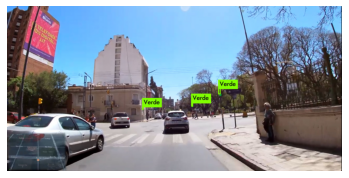

In [90]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

ruta_imagen = 'predictions0.jpg'


imagen = mpimg.imread(ruta_imagen)

# Muestra la imagen
plt.imshow(imagen)
plt.axis('off')
plt.show()

In [91]:
!./darknet detector test /media/leo/D60E-B5A7/darknet/traffic-lights/voc-bosch.data /media/leo/D60E-B5A7/darknet/traffic-lights/yolov3-tiny-bosch.cfg traffic-lights/backup/yolov3-tiny-bosch_40000.weights traffic-lights/test-b.png  


layer     filters    size              input                output
    0 conv     16  3 x 3 / 1   608 x 608 x   3   ->   608 x 608 x  16  0.319 BFLOPs
    1 max          2 x 2 / 2   608 x 608 x  16   ->   304 x 304 x  16
    2 conv     32  3 x 3 / 1   304 x 304 x  16   ->   304 x 304 x  32  0.852 BFLOPs
    3 max          2 x 2 / 2   304 x 304 x  32   ->   152 x 152 x  32
    4 conv     64  3 x 3 / 1   152 x 152 x  32   ->   152 x 152 x  64  0.852 BFLOPs
    5 max          2 x 2 / 2   152 x 152 x  64   ->    76 x  76 x  64
    6 conv    128  3 x 3 / 1    76 x  76 x  64   ->    76 x  76 x 128  0.852 BFLOPs
    7 max          2 x 2 / 2    76 x  76 x 128   ->    38 x  38 x 128
    8 conv    256  3 x 3 / 1    38 x  38 x 128   ->    38 x  38 x 256  0.852 BFLOPs
    9 max          2 x 2 / 2    38 x  38 x 256   ->    19 x  19 x 256
   10 conv    512  3 x 3 / 1    19 x  19 x 256   ->    19 x  19 x 512  0.852 BFLOPs
   11 max          2 x 2 / 1    19 x  19 x 512   ->    19 x  19 x 512
   12 con

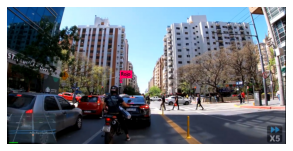

In [97]:
ruta_imagen = 'prediction1.jpg'


imagen = mpimg.imread(ruta_imagen)
plt.figure(figsize=(5,5))
# Muestra la imagen
plt.imshow(imagen)
plt.axis('off')
plt.show()

In [102]:
!./darknet detector test /media/leo/D60E-B5A7/darknet/traffic-lights/voc-bosch.data /media/leo/D60E-B5A7/darknet/traffic-lights/yolov3-tiny-bosch.cfg traffic-lights/backup/yolov3-tiny-bosch_40000.weights traffic-lights/548892.png


layer     filters    size              input                output
    0 conv     16  3 x 3 / 1   608 x 608 x   3   ->   608 x 608 x  16  0.319 BFLOPs
    1 max          2 x 2 / 2   608 x 608 x  16   ->   304 x 304 x  16
    2 conv     32  3 x 3 / 1   304 x 304 x  16   ->   304 x 304 x  32  0.852 BFLOPs
    3 max          2 x 2 / 2   304 x 304 x  32   ->   152 x 152 x  32
    4 conv     64  3 x 3 / 1   152 x 152 x  32   ->   152 x 152 x  64  0.852 BFLOPs
    5 max          2 x 2 / 2   152 x 152 x  64   ->    76 x  76 x  64
    6 conv    128  3 x 3 / 1    76 x  76 x  64   ->    76 x  76 x 128  0.852 BFLOPs
    7 max          2 x 2 / 2    76 x  76 x 128   ->    38 x  38 x 128
    8 conv    256  3 x 3 / 1    38 x  38 x 128   ->    38 x  38 x 256  0.852 BFLOPs
    9 max          2 x 2 / 2    38 x  38 x 256   ->    19 x  19 x 256
   10 conv    512  3 x 3 / 1    19 x  19 x 256   ->    19 x  19 x 512  0.852 BFLOPs
   11 max          2 x 2 / 1    19 x  19 x 512   ->    19 x  19 x 512
   12 con

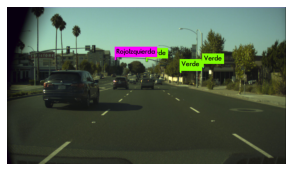

In [103]:
ruta_imagen = 'predictions3.jpg'


imagen = mpimg.imread(ruta_imagen)
plt.figure(figsize=(5,5))
# Muestra la imagen
plt.imshow(imagen)
plt.axis('off')
plt.show()

## Conclusiones

Se pudo comprobar que las redes YOLO son particularmente eficientes para detección de objetos en tiempo real. Además son faciles de configurar y existe mucha documentación en la web, por lo que su uso es relativamente sencillo.

En cuanto a los resultados obtenidos, pueden llegar a ser aceptables incluso con datasets que no estén balanceados correctamente o que contengan situaciones adversas para la interpretación de la información, como es el caso analizado, destacando la robustez del sistema en estas situaciones. Sin embargo, si se quieren mejores resultados evidentemente habrá que mejorar el dataset.

Otra virtud notada es su alto rendimiento a la hora de entrenamiento. Los resultados exhibidos, se lograron entrenando la red con una GPU de bajo costo en menos de 20 minutos, lo que se traduce en un menor consumo de energía y menores costes generales a la hora de implementar redes neuronales de este tipo.


## Referencias

[Página web oficial de YOLO V3](https://pjreddie.com/darknet/yolo/)

[Installing Darknet](https://pjreddie.com/darknet/install/)

[YOLO V4 - How to train (to detect your custom objects)](https://github.com/AlexeyAB/darknet#how-to-train-to-detect-your-custom-objects)

[Bosch Small Traffic Lights Dataset](https://hci.iwr.uni-heidelberg.de/content/bosch-small-traffic-lights-dataset)
